In [1]:
#Import necessary package
import os 
import pandas as pd
import matplotlib as mlp
import re
from nltk.tokenize import sent_tokenize

In [2]:
#Identify the working directory
os.chdir('C:\\Users\\ysfno1\\Desktop\Data')

### Text Extraction

In [3]:
#Load the text file to jupyter notebook
f = open('War_Narratives.txt', 'rb')
content = f.read()
print(content)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [4]:
#Check the file
content

b'the baghdad clock\r\n\r\na bittersweet tale of two girls growing up in war-torn baghdad\r\n\r\nit\xe2\x80\x99s 1991 and the gulf war is raging. two girls, hiding in an air raid shelter, tell stories to keep the fear and the darkness at bay, and a deep friendship is born. and while the city collapses around them, the sanctions bite and friends begin to flee, life goes on. people tend their gardens, go dancing and celebrate weddings, and the girls share their dreams, desires, school routines and first loves.\r\n\r\nin her brilliant debut novel, shahad al rawi takes readers beyond the familiar images in the news to show the everyday struggle of baghdad\xe2\x80\x99s people, revealing the reality of growing up in a war-torn city that\xe2\x80\x99s slowly disappearing in front of your eyes.\r\n\r\n\r\n\r\n\r\n\r\nfor saad and ahlam\r\n\r\nfor shams and shather\r\n\r\n\r\n\r\n\r\n\r\nthis translation was made possible by a generous grant from diwan kufa.\r\n\r\nthe author and translator part

### Data Preparation

In [5]:
#Sentence tokenize the data
df=sent_tokenize(content.decode('utf-8'))

In [6]:
#Check the dataset
df

['the baghdad clock\r\n\r\na bittersweet tale of two girls growing up in war-torn baghdad\r\n\r\nit’s 1991 and the gulf war is raging.',
 'two girls, hiding in an air raid shelter, tell stories to keep the fear and the darkness at bay, and a deep friendship is born.',
 'and while the city collapses around them, the sanctions bite and friends begin to flee, life goes on.',
 'people tend their gardens, go dancing and celebrate weddings, and the girls share their dreams, desires, school routines and first loves.',
 'in her brilliant debut novel, shahad al rawi takes readers beyond the familiar images in the news to show the everyday struggle of baghdad’s people, revealing the reality of growing up in a war-torn city that’s slowly disappearing in front of your eyes.',
 'for saad and ahlam\r\n\r\nfor shams and shather\r\n\r\n\r\n\r\n\r\n\r\nthis translation was made possible by a generous grant from diwan kufa.',
 'the author and translator particularly wish to thank its director, kanan mak

In [7]:
#Convert the tokenized sentences to dataframe
df = pd.DataFrame(df)

In [8]:
#Check the dataframe
df

,0
0,the baghdad clock\r\n\r\na bittersweet tale of...
1,"two girls, hiding in an air raid shelter, tell..."
2,"and while the city collapses around them, the ..."
3,"people tend their gardens, go dancing and cele..."
4,"in her brilliant debut novel, shahad al rawi t..."
...,...
46670,index\r\n\r\n\r\na\r\n\r\nabbasid caliph mansu...
46671,her memoir the orange trees of baghdad won the...
46672,her fiction has appeared in descant and on cbc...
46673,she has written and broadcast commentaries for...


In [9]:
#Name the unnamed column as 'Sentences'
df.rename( columns={0 :'Sentences'}, inplace=True )

In [10]:
#Check the dataframe
df

,Sentences
0,the baghdad clock\r\n\r\na bittersweet tale of...
1,"two girls, hiding in an air raid shelter, tell..."
2,"and while the city collapses around them, the ..."
3,"people tend their gardens, go dancing and cele..."
4,"in her brilliant debut novel, shahad al rawi t..."
...,...
46670,index\r\n\r\n\r\na\r\n\r\nabbasid caliph mansu...
46671,her memoir the orange trees of baghdad won the...
46672,her fiction has appeared in descant and on cbc...
46673,she has written and broadcast commentaries for...


In [11]:
#Implement lemmatization
import nltk
lemmatizer = nltk.stem.WordNetLemmatizer()
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()

def lemmatize_text(text):
    return [lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text)]
df['text_lemmatized'] = df.Sentences.apply(lemmatize_text)
#col_list = df.Sentence.values.tolist()
#df['lemmatized_output'] = ' '.join([lemmatizer.lemmatize(w) for w in col_list])
df['text_lemmatized'] = df['text_lemmatized'].apply(lambda x: ' '.join(x))

In [12]:
#Check lemmatizaed dataframe
df

,Sentences,text_lemmatized
0,the baghdad clock\r\n\r\na bittersweet tale of...,the baghdad clock a bittersweet tale of two gi...
1,"two girls, hiding in an air raid shelter, tell...","two girls, hiding in an air raid shelter, tell..."
2,"and while the city collapses around them, the ...","and while the city collapse around them, the s..."
3,"people tend their gardens, go dancing and cele...","people tend their gardens, go dancing and cele..."
4,"in her brilliant debut novel, shahad al rawi t...","in her brilliant debut novel, shahad al rawi t..."
...,...,...
46670,index\r\n\r\n\r\na\r\n\r\nabbasid caliph mansu...,"index a abbasid caliph mansur, 51 abraham, 57,..."
46671,her memoir the orange trees of baghdad won the...,her memoir the orange tree of baghdad won the ...
46672,her fiction has appeared in descant and on cbc...,her fiction ha appeared in descant and on cbc ...
46673,she has written and broadcast commentaries for...,she ha written and broadcast commentary for th...


In [13]:
#Delete useless column and rename the lemmatized column
df=df.drop(['Sentences'], axis=1)
df=df.rename(columns = {'text_lemmatized':'Sentence'})
df

,Sentence
0,the baghdad clock a bittersweet tale of two gi...
1,"two girls, hiding in an air raid shelter, tell..."
2,"and while the city collapse around them, the s..."
3,"people tend their gardens, go dancing and cele..."
4,"in her brilliant debut novel, shahad al rawi t..."
...,...
46670,"index a abbasid caliph mansur, 51 abraham, 57,..."
46671,her memoir the orange tree of baghdad won the ...
46672,her fiction ha appeared in descant and on cbc ...
46673,she ha written and broadcast commentary for th...


In [14]:
#Remove punctuation from the dataframe
df['Sentence'] = df['Sentence'].str.replace(r'[^\w\s]+', '')
df

C:\Users\ysfno1\AppData\Local\Temp\ipykernel_7256\3774016121.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df['Sentence'] = df['Sentence'].str.replace(r'[^\w\s]+', '')


,Sentence
0,the baghdad clock a bittersweet tale of two gi...
1,two girls hiding in an air raid shelter tell s...
2,and while the city collapse around them the sa...
3,people tend their gardens go dancing and celeb...
4,in her brilliant debut novel shahad al rawi ta...
...,...
46670,index a abbasid caliph mansur 51 abraham 57 11...
46671,her memoir the orange tree of baghdad won the ...
46672,her fiction ha appeared in descant and on cbc ...
46673,she ha written and broadcast commentary for th...


In [15]:
#Remove stopwards from the datadrame
from nltk.corpus import stopwords
stop = stopwords.words('english')
for i in stop :
    df = df.replace(to_replace=r'\b%s\b'%i, value="",regex=True)

In [16]:
#Check dataframe
df

,Sentence
0,baghdad clock bittersweet tale two girl gro...
1,two girls hiding air raid shelter tell story...
2,city collapse around sanction bite frien...
3,people tend gardens go dancing celebrate wed...
4,brilliant debut novel shahad al rawi take re...
...,...
46670,index abbasid caliph mansur 51 abraham 57 115...
46671,memoir orange tree baghdad 2008 george ry...
46672,fiction ha appeared descant cbc radio
46673,ha written broadcast commentary cbc globe...


In [17]:
#POS tagging
tokenized = df['Sentence']
for i in tokenized:
     
    # Word tokenizers is used to find the words
    # and punctuation in a string
    wordsList = nltk.word_tokenize(i)
 
    # removing stop words from wordList
    wordsList = [w for w in wordsList if not w in stop]
 
    #  Using a Tagger. Which is part-of-speech
    # tagger or POS-tagger.
    tagged = nltk.pos_tag(wordsList)
 
    print(tagged)

[('baghdad', 'NN'), ('clock', 'NN'), ('bittersweet', 'NN'), ('tale', 'JJ'), ('two', 'CD'), ('girl', 'VBP'), ('growing', 'VBG'), ('wartorn', 'NNS'), ('baghdad', 'NN'), ('1991', 'CD'), ('gulf', 'NN'), ('war', 'NN'), ('raging', 'VBG')]
[('two', 'CD'), ('girls', 'NNS'), ('hiding', 'VBG'), ('air', 'NN'), ('raid', 'VBD'), ('shelter', 'NN'), ('tell', 'NN'), ('story', 'NN'), ('keep', 'VB'), ('fear', 'NN'), ('darkness', 'NN'), ('bay', 'NN'), ('deep', 'JJ'), ('friendship', 'NN'), ('born', 'VBN')]
[('city', 'NN'), ('collapse', 'NN'), ('around', 'IN'), ('sanction', 'NN'), ('bite', 'NN'), ('friend', 'NN'), ('begin', 'NN'), ('flee', 'JJ'), ('life', 'NN'), ('go', 'VB')]
[('people', 'NNS'), ('tend', 'VBP'), ('gardens', 'NNS'), ('go', 'VB'), ('dancing', 'VBG'), ('celebrate', 'JJ'), ('weddings', 'NNS'), ('girl', 'NNS'), ('share', 'NN'), ('dreams', 'VBZ'), ('desires', 'VBZ'), ('school', 'NN'), ('routine', 'NN'), ('first', 'JJ'), ('loves', 'NNS')]
[('brilliant', 'JJ'), ('debut', 'NN'), ('novel', 'NN'), ('

[('felt', 'NNS'), ('warm', 'VBP')]
[('sleep', 'JJ'), ('night', 'NN'), ('either', 'CC')]
[('wa', 'NN'), ('watching', 'VBG'), ('nadias', 'JJ'), ('dreams', 'NNS')]
[('fun', 'JJ'), ('game', 'NN'), ('watch', 'NN'), ('someones', 'NNS'), ('dream', 'RB'), ('deep', 'RB'), ('sleep', 'NN')]
[('morning', 'NN'), ('told', 'VBD'), ('dreams', 'NNS')]
[('like', 'IN'), ('said', 'VBD'), ('horrible', 'JJ')]
[('spying', 'VBG'), ('dreams', 'NNS'), ('dont', 'RB'), ('know', 'VBP'), ('dream', 'RB'), ('many', 'JJ'), ('time', 'NN'), ('life', 'NN'), ('tried', 'VBD'), ('copy', 'NN'), ('beautiful', 'JJ'), ('dream', 'NN'), ('insert', 'NN'), ('sleep', 'VBP'), ('always', 'RB'), ('failed', 'VBD')]
[('content', 'NN'), ('watching', 'VBG'), ('dream', 'NN'), ('found', 'VBD'), ('upsetting', 'VBG'), ('would', 'MD'), ('clean', 'VB'), ('head', 'NN'), ('banish', 'JJ'), ('thing', 'NN'), ('like', 'IN')]
[('got', 'NNS'), ('know', 'VBP'), ('nadia', 'RB'), ('belly', 'RB'), ('shelter', 'JJ'), ('looked', 'VBD'), ('like', 'IN'), ('big'

[('raised', 'VBN'), ('hand', 'NN'), ('said', 'VBD'), ('teacher', 'NN'), ('maam', 'NN'), ('would', 'MD'), ('like', 'VB'), ('sit', 'NN'), ('next', 'IN'), ('nadia', 'JJ'), ('nadia', 'NN'), ('green', 'JJ'), ('eyes', 'NNS'), ('teacher', 'NN'), ('asked', 'VBD')]
[('yes', 'NNS'), ('maam', 'NN')]
[('shes', 'NNS'), ('friend', 'VBP'), ('grow', 'VB'), ('eye', 'NN'), ('going', 'VBG'), ('green', 'JJ'), ('like', 'IN'), ('teacher', 'NN'), ('laughed', 'VBD')]
[('sometimes', 'RB'), ('teacher', 'RB'), ('laugh', 'JJ'), ('reason', 'NN')]
[('went', 'VBD'), ('sat', 'JJ'), ('nadias', 'NNS'), ('desk', 'VBP'), ('wa', 'VBP'), ('close', 'RB'), ('window', 'JJ'), ('cold', 'JJ'), ('air', 'NN'), ('wa', 'NN'), ('coming', 'VBG')]
[('rubbed', 'JJ'), ('hand', 'NN'), ('together', 'RB'), ('quickly', 'RB'), ('cold', 'VB'), ('nadia', 'NN')]
[('rubbed', 'NNS'), ('mistake', 'VBP'), ('made', 'VBN'), ('dictation', 'NN'), ('using', 'VBG'), ('nadias', 'JJ'), ('colourful', 'JJ'), ('erasers', 'NNS'), ('every', 'DT'), ('time', 'NN')

[('loved', 'VBN'), ('wished', 'NNS'), ('could', 'MD'), ('see', 'VB')]
[('picture', 'NN'), ('long', 'JJ'), ('time', 'NN'), ('looking', 'VBG'), ('u', 'JJ'), ('without', 'IN'), ('saying', 'VBG'), ('single', 'JJ'), ('word', 'NN')]
[('first', 'JJ'), ('time', 'NN'), ('saw', 'JJ'), ('picture', 'NN'), ('asked', 'VBD'), ('grandmother', 'RB'), ('whos', 'JJ'), ('replied', 'VBD'), ('thats', 'NNS'), ('harun', 'VBP'), ('alrashid', 'RB'), ('made', 'VBN'), ('aunt', 'NN'), ('laugh', 'NN'), ('well', 'RB'), ('father', 'RB'), ('mother', 'NN')]
[('laugh', 'NN')]
[('father', 'NN'), ('said', 'VBD'), ('grandfather', 'RB'), ('far', 'RB'), ('house', 'NN'), ('opposite', 'JJ'), ('side', 'NN'), ('garden', 'NN'), ('big', 'JJ'), ('wooden', 'NN'), ('wheel', 'NN'), ('called', 'VBD'), ('noria', 'NNS'), ('took', 'VBD'), ('water', 'NN'), ('river', 'NN'), ('poured', 'VBD'), ('canals', 'NNS')]
[('noria', 'NNS'), ('close', 'RB'), ('river', 'VBP'), ('wa', 'NN'), ('house', 'NN'), ('even', 'RB'), ('could', 'MD'), ('see', 'VB')

[('parent', 'NN'), ('gone', 'VBN'), ('sleep', 'JJ'), ('light', 'NN'), ('house', 'NN')]
[('got', 'VBD'), ('bed', 'VBN'), ('put', 'IN'), ('mothers', 'NNS'), ('long', 'RB'), ('coat', 'VBP'), ('hall', 'RB'), ('cupboard', 'RB'), ('walked', 'VBD'), ('tiptoe', 'JJ'), ('front', 'NN'), ('gate', 'NN')]
[('white', 'JJ'), ('cat', 'NN'), ('blind', 'NN'), ('wet', 'VBD'), ('one', 'CD'), ('beat', 'NN'), ('leaped', 'VBD'), ('onto', 'IN'), ('pavement', 'NN')]
[('ignored', 'VBN'), ('cat', 'NN'), ('slowly', 'RB'), ('opened', 'VBN'), ('gate', 'NN'), ('went', 'VBD'), ('street', 'NN')]
[('got', 'VBD'), ('end', 'JJ'), ('street', 'NN'), ('heard', 'NN'), ('car', 'NN'), ('approaching', 'VBG')]
[('headlight', 'NN'), ('shot', 'NN'), ('front', 'NN')]
[('immediately', 'RB'), ('pressed', 'VBN'), ('wall', 'NN'), ('shop', 'NN')]
[('car', 'NN'), ('passed', 'VBD'), ('turned', 'JJ'), ('street', 'NN'), ('ran', 'VBD'), ('parallel', 'JJ'), ('school', 'NN'), ('street', 'NN'), ('nadia', 'RB'), ('found', 'VBD'), ('blind', 'IN')

[('sun', 'NN'), ('rose', 'VBD'), ('shone', 'NN'), ('window', 'NN'), ('storm', 'NN'), ('blown', 'VBN'), ('wave', 'VBP'), ('retreated', 'VBN'), ('ship', 'NN'), ('come', 'VBN'), ('safe', 'JJ'), ('harbour', 'NN'), ('thanks', 'NNS'), ('guidance', 'NN'), ('wise', 'NN'), ('captain', 'NN')]
[('6', 'CD'), ('spring', 'NN'), ('air', 'NN'), ('refreshing', 'VBG'), ('day', 'NN'), ('growing', 'VBG'), ('slightly', 'RB'), ('longer', 'RBR')]
[('cast', 'NN'), ('heavy', 'JJ'), ('clothes', 'NNS'), ('feel', 'VBP'), ('becoming', 'VBG'), ('lighter', 'NN')]
[('boy', 'NN'), ('come', 'VB'), ('bicycles', 'NNS'), ('racing', 'VBG'), ('street', 'NN'), ('happily', 'RB'), ('ringing', 'VBG'), ('little', 'JJ'), ('bell', 'NN'), ('handlebars', 'NNS')]
[('mother', 'NN'), ('father', 'PRP$'), ('head', 'NN'), ('gardens', 'VBZ'), ('come', 'JJ'), ('play', 'NN'), ('pavement', 'NN')]
[('abu', 'NN'), ('baydaa', 'NN'), ('spray', 'NN'), ('garden', 'NN'), ('water', 'NN'), ('spreading', 'VBG'), ('refreshing', 'VBG'), ('fragrance', 'NN

[('every', 'DT'), ('day', 'NN'), ('dreamed', 'VBD'), ('handsome', 'JJ'), ('young', 'JJ'), ('man', 'NN'), ('came', 'VBD'), ('window', 'JJ'), ('talk', 'NN'), ('morning', 'NN'), ('woke', 'VBD'), ('wa', 'NN'), ('nowhere', 'RB'), ('found', 'VBD')]
[('one', 'CD'), ('day', 'NN'), ('snow', 'NN'), ('fell', 'VBD'), ('covered', 'JJ'), ('entire', 'JJ'), ('ground', 'NN')]
[('young', 'JJ'), ('woman', 'NN'), ('whose', 'WP$'), ('name', 'NN'), ('wa', 'NN'), ('joanna', 'NN'), ('went', 'VBD'), ('climbed', 'JJ'), ('mountainside', 'NN'), ('became', 'VBD'), ('tired', 'JJ')]
[('sat', 'JJ'), ('think', 'NN'), ('young', 'JJ'), ('man', 'NN'), ('saw', 'VBD'), ('dreams', 'NNS')]
[('said', 'VBD'), ('ive', 'JJ'), ('never', 'RB'), ('seen', 'VBN'), ('real', 'JJ'), ('life', 'NN'), ('dont', 'NNS'), ('make', 'VBP'), ('likeness', 'NN'), ('snow', 'NN'), ('began', 'VBD'), ('gathering', 'VBG'), ('snow', 'NN'), ('around', 'IN'), ('wa', 'JJ'), ('large', 'JJ'), ('enough', 'RB'), ('pile', 'JJ'), ('sat', 'NNS'), ('used', 'VBN'), 

[('grown', 'VBN'), ('yet', 'RB')]
[('even', 'RB'), ('though', 'IN'), ('bigger', 'JJR'), ('want', 'VBP'), ('pick', 'JJ'), ('spin', 'NN'), ('around', 'IN'), ('room', 'NN')]
[('want', 'NN'), ('throw', 'NN'), ('air', 'NN'), ('entire', 'JJ'), ('life', 'NN'), ('floating', 'VBG'), ('waiting', 'VBG'), ('hand', 'NN'), ('catch', 'NN'), ('keep', 'VB'), ('hitting', 'NN'), ('floor', 'NN')]
[('wa', 'NN'), ('angry', 'JJ'), ('say', 'VBP'), ('time', 'NN')]
[('wa', 'NN'), ('embarrassed', 'VBD'), ('say', 'VBP'), ('front', 'NN'), ('since', 'IN'), ('considered', 'VBN'), ('grown', 'NN')]
[('hands', 'NNS'), ('dad', 'VBP'), ('little', 'JJ'), ('even', 'RB'), ('thirty', 'VBP'), ('year', 'NN'), ('old', 'JJ')]
[('always', 'RB'), ('small', 'JJ'), ('suspended', 'VBD'), ('midair', 'NN'), ('outstretched', 'VBD'), ('arms', 'NNS')]
[('passed', 'VBN'), ('nadia', 'NNS'), ('passed', 'VBD'), ('baydaa', 'NN'), ('marwa', 'NN')]
[('met', 'VBN'), ('baydaas', 'NN'), ('garden', 'NN'), ('made', 'VBD'), ('fun', 'NN'), ('boy', 'NN'

[('silence', 'NN'), ('last', 'JJ'), ('long', 'JJ')]
[('malaika', 'FW'), ('devil', 'NN'), ('used', 'VBN'), ('call', 'NN'), ('shelter', 'NN'), ('back', 'RB'), ('1991', 'CD'), ('appeared', 'VBD')]
[('without', 'IN'), ('warning', 'VBG'), ('came', 'VBD'), ('u', 'JJ'), ('said', 'VBD'), ('ive', 'JJ'), ('left', 'JJ'), ('school', 'NN'), ('nadia', 'NN'), ('asked', 'VBD'), ('shocked', 'JJ'), ('unison', 'NN')]
[('ive', 'NN'), ('dropped', 'VBD'), ('last', 'JJ'), ('day', 'NN')]
[('im', 'NN'), ('going', 'VBG'), ('burn', 'JJ'), ('book', 'NN'), ('notebook', 'NN'), ('bread', 'NN'), ('oven', 'NN')]
[('mother', 'NN'), ('got', 'VBD'), ('divorced', 'VBN'), ('yesterday', 'NN')]
[('father', 'RB'), ('kicked', 'VBN'), ('house', 'NN')]
[('little', 'JJ'), ('sister', 'NN'), ('stay', 'NN'), ('dont', 'RB'), ('sister', 'RB'), ('go', 'VBP'), ('mum', 'JJ'), ('nadia', 'NN'), ('asked', 'VBD')]
[('mother', 'RB'), ('evil', 'JJ'), ('replied', 'VBD'), ('deep', 'JJ'), ('sigh', 'NN')]
[('started', 'VBN'), ('cry', 'NN')]
[('wou

[('expected', 'VBN'), ('reply', 'NN'), ('wished', 'VBD'), ('said', 'VBD'), ('something', 'NN'), ('different', 'JJ'), ('something', 'NN'), ('like', 'IN'), ('would', 'MD'), ('say', 'VB'), ('thing', 'NN'), ('opened', 'JJ'), ('letter', 'NN'), ('still', 'RB'), ('tucked', 'VBD'), ('inside', 'IN'), ('book', 'NN'), ('turned', 'VBD'), ('back', 'RB'), ('read', 'JJ'), ('time', 'NN'), ('whisper', 'IN')]
[('nadias', 'NNS'), ('innermost', 'RB'), ('thought', 'VBD'), ('taking', 'VBG'), ('wa', 'JJ'), ('establishing', 'VBG'), ('private', 'JJ'), ('world', 'NN'), ('far', 'RB'), ('away', 'RB')]
[('heart', 'NN'), ('throbbed', 'VBD'), ('rhythm', 'JJ'), ('lung', 'NN'), ('breathing', 'VBG'), ('air', 'NN'), ('wa', 'WRB'), ('air', 'NN'), ('used', 'VBD'), ('breathe', 'NN'), ('together', 'RB')]
[('love', 'NN'), ('proposes', 'VBZ'), ('secret', 'JJ'), ('history', 'NN'), ('begin', 'VB'), ('guard', 'JJ'), ('sense', 'NN'), ('uncertainty', 'NN')]
[('uproots', 'NNS'), ('person', 'NN'), ('family', 'NN'), ('friends', 'VBZ'

[('carried', 'VBN'), ('gently', 'RB'), ('house', 'NN'), ('put', 'VBD'), ('small', 'JJ'), ('tub', 'NN'), ('began', 'VBD'), ('cleaning', 'VBG'), ('body', 'NN'), ('soap', 'NN'), ('sang', 'VBD'), ('sad', 'JJ'), ('song', 'NN')]
[('dried', 'VBN'), ('dog', 'JJ'), ('garden', 'NN'), ('sunshine', 'NN'), ('began', 'VBD'), ('caressing', 'VBG'), ('body', 'NN'), ('tenderly', 'JJ'), ('dog', 'NN'), ('gradually', 'RB'), ('regained', 'VBD'), ('strength', 'NN')]
[('dogs', 'NNS'), ('eye', 'NN'), ('shone', 'NN'), ('rolled', 'VBD'), ('joyfully', 'RB'), ('grass', 'NN')]
[('day', 'NN'), ('uncle', 'NN'), ('shawkat', 'NN'), ('wa', 'NN'), ('never', 'RB'), ('seen', 'VBN'), ('street', 'NN'), ('without', 'IN'), ('dog', 'NN'), ('loved', 'VBD'), ('grew', 'VBD'), ('accustomed', 'JJ')]
[('dog', 'NN'), ('heel', 'NN'), ('became', 'VBD'), ('part', 'NN'), ('outward', 'NN'), ('appearance', 'NN'), ('walked', 'VBD'), ('street', 'NN')]
[('would', 'MD'), ('stop', 'VB'), ('would', 'MD'), ('sit', 'VB'), ('haunch', 'NN'), ('whenev

[('could', 'MD'), ('always', 'RB'), ('wind', 'VB'), ('way', 'NN'), ('along', 'IN'), ('alternative', 'JJ'), ('route', 'NN'), ('avoid', 'NN'), ('bumping', 'VBG'), ('annoying', 'VBG'), ('people', 'NNS')]
[('true', 'JJ'), ('marwa', 'NN'), ('wa', 'NN'), ('sometimes', 'RB'), ('annoying', 'VBG'), ('wa', 'JJ'), ('evil', 'NN')]
[('bothered', 'VBN'), ('ahmad', 'JJ'), ('loved', 'VBN'), ('persecuted', 'JJ'), ('nadia', 'JJ'), ('ahmad', 'NN'), ('loved', 'VBD')]
[('always', 'RB'), ('easy', 'JJ'), ('u', 'JJ'), ('make', 'VB'), ('hard', 'JJ'), ('people', 'NNS'), ('love', 'VBP')]
[('even', 'RB'), ('want', 'VBP'), ('tell', 'NN'), ('love', 'NN'), ('sometimes', 'RB'), ('say', 'VB'), ('way', 'NN'), ('upset', 'JJ')]
[('person', 'NN'), ('world', 'NN'), ('doe', 'NN'), ('annoy', 'JJ'), ('people', 'NNS'), ('loves', 'NNS')]
[('annoy', 'JJ'), ('people', 'NNS'), ('love', 'VBP'), ('either', 'RB')]
[('one', 'CD'), ('day', 'NN'), ('got', 'VBD'), ('surprise', 'NN')]
[('wa', 'NN'), ('approaching', 'VBG'), ('abu', 'NN'), 

[('come', 'VBN'), ('board', 'NN'), ('whatever', 'WDT'), ('ship', 'NN'), ('happens', 'VBZ'), ('born', 'VBN'), ('upon', 'IN')]
[('small', 'JJ'), ('ship', 'NN'), ('dock', 'NN'), ('large', 'JJ'), ('ocean', 'JJ'), ('world', 'NN'), ('carry', 'NN'), ('group', 'NN'), ('people', 'NNS'), ('whose', 'WP$'), ('destiny', 'JJ'), ('bound', 'NN'), ('together', 'RB')]
[('ship', 'NN'), ('big', 'JJ'), ('continent', 'NN'), ('big', 'JJ'), ('country', 'NN'), ('size', 'NN'), ('small', 'JJ'), ('neighbourhood', 'NN')]
[('whenever', 'WRB'), ('ship', 'NN'), ('big', 'JJ'), ('relationship', 'NN'), ('passenger', 'NN'), ('strong', 'JJ')]
[('converse', 'NN'), ('also', 'RB'), ('true', 'JJ')]
[('neighbourhood', 'RB'), ('small', 'JJ'), ('ship', 'NN')]
[('bird', 'NN'), ('pas', 'VBZ'), ('air', 'NN'), ('know', 'VBP'), ('circling', 'VBG'), ('small', 'JJ'), ('ship', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('ha', 'NN'), ('remained', 'VBD'), ('place', 'NN'), ('long', 'RB'), ('youve', 'RB')]
[('consider', 'VB'), ('nursing', 'NN

[('biryad', 'NN'), ('followed', 'VBD'), ('end', 'JJ'), ('alley', 'NN'), ('bade', 'NN'), ('respectful', 'NN'), ('farewell', 'NN'), ('came', 'VBD'), ('back', 'RB'), ('tail', 'JJ'), ('air', 'NN'), ('hurrying', 'VBG'), ('towards', 'NNS'), ('uncle', 'JJ'), ('shawkats', 'NNS'), ('house', 'NN'), ('jumping', 'VBG'), ('wall', 'NN'), ('bordered', 'VBD'), ('garden', 'NN')]
[('womens', 'NNS'), ('foot', 'VBP'), ('froze', 'JJ'), ('place', 'NN'), ('began', 'VBD'), ('staring', 'VBG'), ('others', 'NNS'), ('though', 'IN'), ('unable', 'JJ'), ('believe', 'VBP'), ('ears', 'NNS')]
[('owner', 'NN'), ('house', 'NN'), ('asked', 'VBD'), ('sit', 'CC'), ('back', 'RB'), ('began', 'VBD'), ('preparing', 'VBG'), ('tea', 'NN')]
[('umm', 'JJ'), ('hussam', 'NN'), ('stood', 'VBD'), ('cleared', 'JJ'), ('throat', 'NN')]
[('voice', 'NN'), ('resembled', 'VBD'), ('husbands', 'NNS'), ('said', 'VBD'), ('man', 'NN'), ('spy', 'NN')]
[('ha', 'JJ'), ('foreign', 'JJ'), ('troop', 'NN'), ('want', 'VBP'), ('terrify', 'VB'), ('us', 'PRP

[('love', 'VB'), ('dad', 'NN'), ('dont', 'NN'), ('long', 'RB'), ('every', 'DT'), ('song', 'NN')]
[('meet', 'VB'), ('heart', 'NN'), ('doesnt', 'NN'), ('pound', 'NN')]
[('write', 'JJ'), ('letter', 'NN'), ('ahmad', 'NN')]
[('listen', 'NN'), ('song', 'NN'), ('sake', 'NN')]
[('meet', 'NN'), ('want', 'VBP'), ('fly', 'NN'), ('would', 'MD'), ('happy', 'VB'), ('keep', 'VB'), ('going', 'VBG'), ('could', 'MD'), ('see', 'VB'), ('face', 'JJ'), ('wa', 'NNS'), ('waiting', 'VBG'), ('astonishment', 'NN')]
[('truly', 'RB'), ('wa', 'WP'), ('surprised', 'JJ'), ('response', 'NN'), ('playfully', 'RB'), ('told', 'VBD'), ('youre', 'NN'), ('philosopher', 'NN'), ('nadia', 'NN'), ('looked', 'VBD'), ('composed', 'JJ'), ('feature', 'NN'), ('feigned', 'VBD'), ('haughtiness', 'NN')]
[('started', 'VBN'), ('telling', 'VBG'), ('kind', 'NN'), ('joke', 'NN'), ('ahmad', 'NN'), ('passed', 'VBD'), ('front', 'JJ'), ('store', 'NN'), ('instantly', 'RB'), ('made', 'VBD'), ('forget', 'NN'), ('wa', 'NN'), ('going', 'VBG'), ('say'

[('verge', 'NN'), ('retirement', 'NN'), ('know', 'VBP'), ('ought', 'MD'), ('depressing', 'VBG'), ('time', 'NN'), ('another', 'DT'), ('burning', 'VBG'), ('tear', 'NN'), ('fell', 'VBD'), ('stairs', 'NNS')]
[('uncle', 'NN'), ('shawkat', 'NN'), ('returned', 'VBD'), ('photo', 'JJ'), ('pocket', 'NN'), ('got', 'VBD'), ('leave', 'VBP')]
[('closed', 'JJ'), ('inner', 'NN'), ('door', 'NN'), ('behind', 'IN'), ('picked', 'JJ'), ('things', 'NNS'), ('went', 'VBD'), ('gate', 'NN')]
[('moment', 'NN'), ('realise', 'NN'), ('biryad', 'NN'), ('wa', 'NN')]
[('went', 'VBD'), ('back', 'RB'), ('looked', 'VBN'), ('every', 'DT'), ('corner', 'NN'), ('garden', 'NN'), ('could', 'MD'), ('find', 'VB')]
[('uncle', 'NN'), ('shawkat', 'NN'), ('called', 'VBN'), ('usual', 'JJ'), ('whistle', 'NN'), ('dog', 'NN'), ('vanished', 'VBD')]
[('going', 'VBG'), ('back', 'RB'), ('inside', 'RB'), ('unlocked', 'JJ'), ('door', 'NN'), ('went', 'VBD'), ('stairs', 'NNS'), ('looked', 'VBD'), ('room', 'NN'), ('found', 'VBD'), ('photo', 'NN'

[('know', 'NNS'), ('wanted', 'VBD')]
[('diabolical', 'JJ'), ('influence', 'NN'), ('brushed', 'VBD'), ('fingertip', 'NN'), ('mine', 'NN'), ('light', 'NN'), ('flooded', 'VBD'), ('veins', 'NNS')]
[('looked', 'VBN'), ('lips', 'NNS'), ('knew', 'VBD'), ('exactly', 'RB'), ('wanted', 'VBN'), ('turned', 'VBD'), ('face', 'RBR'), ('away', 'RB')]
[('seconds', 'NNS'), ('turned', 'VBD'), ('face', 'RP'), ('away', 'RB'), ('escape', 'JJ'), ('meaningful', 'JJ'), ('look', 'NN'), ('head', 'NN'), ('spun', 'NN'), ('kind', 'NN'), ('dizziness', 'NN'), ('loved', 'VBD')]
[('felt', 'VBN'), ('head', 'NN'), ('get', 'VB'), ('light', 'JJ'), ('forgot', 'NNS'), ('world', 'NN')]
[('moments', 'NNS'), ('forgot', 'VBD'), ('world', 'NN'), ('entirely', 'RB'), ('forgetting', 'VBG'), ('sole', 'JJ'), ('blessing', 'NN'), ('love', 'NN')]
[('looked', 'VBD'), ('eye', 'NN'), ('knew', 'NN'), ('instant', 'JJ'), ('forgot', 'VBD'), ('world', 'NN')]
[('whole', 'JJ'), ('lives', 'VBZ'), ('experience', 'JJ'), ('second', 'JJ'), ('forget', '

[('shuruq', 'NN'), ('tried', 'VBD'), ('hard', 'RB'), ('could', 'MD'), ('maintain', 'VB'), ('composure', 'JJ'), ('power', 'NN'), ('gaze', 'NN'), ('walked', 'VBD'), ('past', 'JJ')]
[('could', 'MD'), ('resist', 'VB'), ('temptation', 'NN'), ('turn', 'NN'), ('back', 'RP'), ('overcome', 'JJ'), ('urge', 'NN'), ('steal', 'NN'), ('fleeting', 'JJ'), ('glance', 'NN'), ('athletic', 'JJ'), ('build', 'NN'), ('broad', 'JJ'), ('shoulders', 'NNS')]
[('turning', 'VBG'), ('around', 'RB'), ('coincided', 'VBD'), ('looked', 'VBD')]
[('moment', 'NN'), ('inaccessibility', 'NN'), ('practised', 'VBD'), ('face', 'NN'), ('solicitation', 'NN'), ('flirting', 'VBG'), ('student', 'NN'), ('university', 'NN'), ('collapsed', 'VBD'), ('smiled', 'JJ')]
[('wa', 'NN'), ('rooted', 'VBD'), ('place', 'NN'), ('forgot', 'VBD'), ('keep', 'JJ'), ('walking', 'NN')]
[('came', 'VBD'), ('asked', 'VBN'), ('name', 'NN')]
[('shuruq', 'NN'), ('lovely', 'RB'), ('name', 'NN'), ('looked', 'VBD'), ('eye', 'NN'), ('added', 'VBD'), ('miss', 'JJ

[('baydaa', 'NN'), ('resumed', 'VBD'), ('singing', 'VBG'), ('low', 'JJ'), ('voice', 'NN')]
[('wijdan', 'NN'), ('stopped', 'VBD'), ('dancing', 'VBG'), ('nadia', 'RB'), ('arrived', 'VBN')]
[('nadia', 'RB'), ('danced', 'VBD'), ('everyone', 'NN'), ('make', 'NN'), ('way', 'NN')]
[('evening', 'VBG'), ('youth', 'PRP'), ('national', 'JJ'), ('team', 'NN'), ('wa', 'NN'), ('playing', 'VBG'), ('canadian', 'JJ'), ('team', 'NN'), ('argentina', 'NN')]
[('street', 'NN'), ('neighbourhood', 'NN'), ('empty', 'JJ'), ('everyone', 'NN'), ('sat', 'VBD'), ('front', 'JJ'), ('television', 'NN')]
[('twentythird', 'JJ'), ('minute', 'NN'), ('match', 'NN'), ('farouq', 'NN'), ('scored', 'VBD'), ('goal', 'NN'), ('driving', 'VBG'), ('ball', 'NN'), ('canadian', 'JJ'), ('teams', 'NNS'), ('net', 'NN')]
[('front', 'JJ'), ('television', 'NN'), ('cameras', 'NNS'), ('ripped', 'VBD'), ('shiny', 'JJ'), ('black', 'JJ'), ('jersey', 'NN'), ('adorned', 'VBD'), ('iraqi', 'JJ'), ('flag', 'NN'), ('show', 'NN'), ('map', 'VBZ'), ('iraq

[('abandon', 'VB'), ('mother', 'NN'), ('tongue', 'NN'), ('ha', 'NN'), ('established', 'VBN'), ('spiritual', 'JJ'), ('history', 'NN'), ('within', 'IN')]
[('spends', 'NNS'), ('rest', 'VBP'), ('life', 'NN'), ('contrary', 'JJ'), ('law', 'NN'), ('spirit', 'NN')]
[('reason', 'NN'), ('exile', 'NN'), ('always', 'RB'), ('exile', 'JJ'), ('soul', 'JJ'), ('eternal', 'JJ'), ('distance', 'NN'), ('body', 'NN'), ('soul', 'JJ'), ('rends', 'NNS'), ('mans', 'NNS'), ('throw', 'VBP'), ('storm', 'NN'), ('soothsayer', 'NN'), ('stopped', 'VBD'), ('wa', 'WP'), ('began', 'VBD'), ('chanting', 'VBG'), ('word', 'NN'), ('soul', 'NN'), ('stranger', 'NN')]
[('trees', 'NNS'), ('bird', 'VBP'), ('air', 'NN'), ('echoed', 'VBN'), ('back', 'RB'), ('place', 'NN'), ('wa', 'NN'), ('filled', 'VBN'), ('sound', 'NN')]
[('melody', 'NN'), ('stole', 'JJ'), ('inside', 'IN'), ('everyone', 'NN'), ('present', 'JJ'), ('played', 'VBN'), ('upon', 'IN'), ('spirits', 'NNS')]
[('song', 'NN'), ('ended', 'VBD'), ('looked', 'VBD'), ('halfsmile'

[('started', 'VBN'), ('taking', 'VBG'), ('interest', 'NN'), ('hair', 'NN'), ('also', 'RB'), ('neglecting', 'VBG')]
[('bought', 'VBD'), ('new', 'JJ'), ('box', 'NN'), ('makeup', 'NN')]
[('started', 'VBN'), ('going', 'VBG'), ('together', 'RB'), ('free', 'JJ'), ('time', 'NN')]
[('wa', 'NN'), ('happy', 'JJ'), ('terrible', 'JJ'), ('day', 'NN')]
[('went', 'VBD'), ('nursery', 'RB'), ('near', 'IN'), ('park', 'NN'), ('picked', 'VBD'), ('plant', 'NN'), ('flowerpot', 'NN'), ('liked', 'VBD')]
[('told', 'JJ'), ('wa', 'NN'), ('going', 'VBG'), ('build', 'JJ'), ('u', 'JJ'), ('small', 'JJ'), ('house', 'NN'), ('garden', 'NN'), ('big', 'JJ')]
[('wa', 'NN'), ('happy', 'JJ'), ('told', 'VBD'), ('beautiful', 'JJ'), ('garden', 'NN'), ('world', 'NN'), ('child', 'NN'), ('play', 'NN'), ('laughed', 'VBD'), ('put', 'VBN'), ('hand', 'NN'), ('shoulder', 'NN')]
[('pulled', 'VBN'), ('away', 'RP'), ('nearly', 'RB'), ('dying', 'VBG'), ('embarrassment', 'NN')]
[('put', 'NN'), ('plant', 'NN'), ('trunk', 'NN'), ('car', 'NN'

[('know', 'VB'), ('wished', 'JJ'), ('moment', 'NN'), ('would', 'MD'), ('kiss', 'VB')]
[('grabbed', 'JJ'), ('hand', 'NN'), ('felt', 'VBD'), ('heat', 'NN'), ('fingers', 'NNS')]
[('began', 'VBD'), ('wiping', 'VBG'), ('tear', 'JJ'), ('hand', 'NN'), ('kiss', 'NNS')]
[('stayed', 'VBN'), ('holding', 'VBG'), ('hand', 'NN')]
[('wa', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('felt', 'VBD'), ('loved', 'RBR'), ('entirely', 'RB')]
[('wa', 'NN'), ('close', 'JJ'), ('spirit', 'NN'), ('became', 'VBD'), ('part', 'NN'), ('wa', 'NN'), ('afraid', 'JJ'), ('moving', 'VBG'), ('away', 'RB')]
[('love', 'NN'), ('love', 'NN')]
[('forgive', 'JJ'), ('wa', 'NN'), ('acting', 'VBG'), ('okay', 'PRP'), ('dont', 'JJ'), ('id', 'NN'), ('kill', 'NN'), ('im', 'VBZ'), ('going', 'VBG'), ('im', 'RB'), ('going', 'VBG'), ('close', 'JJ'), ('eyes', 'NNS')]
[('youd', 'RB'), ('better', 'RB'), ('closed', 'VBN'), ('eye', 'NN'), ('waited', 'VBD'), ('kiss', 'JJ')]
[('opened', 'VBN'), ('back', 'RP'), ('found', 'RBR'), ('laughing', 'NN')]
[

[('life', 'NN'), ('isnt', 'NN'), ('left', 'VBD'), ('wife', 'NN')]
[('everything', 'NN'), ('ha', 'NN'), ('quickly', 'RB'), ('transformed', 'VBD'), ('tear', 'JJ'), ('rolled', 'VBN'), ('cheek', 'NN'), ('walked', 'VBD'), ('bedroom', 'NN')]
[('changed', 'VBN'), ('old', 'JJ'), ('work', 'NN'), ('clothes', 'NNS'), ('went', 'VBD'), ('back', 'RB'), ('garden', 'NN'), ('got', 'VBD'), ('lawnmower', 'JJR'), ('toolbox', 'NN')]
[('biryad', 'NN'), ('tow', 'NN'), ('left', 'VBD'), ('house', 'NN'), ('inspect', 'NN'), ('house', 'NN'), ('neighbour', 'NN'), ('departed', 'VBD')]
[('would', 'MD'), ('doublecheck', 'VB'), ('lock', 'JJ'), ('door', 'NN'), ('secure', 'NN'), ('would', 'MD'), ('look', 'VB'), ('plants', 'NNS')]
[('would', 'MD'), ('write', 'VB'), ('piece', 'NN'), ('thick', 'JJ'), ('cardboard', 'NN'), ('hang', 'VBD'), ('wall', 'NN'), ('house', 'NN'), ('rent', 'NN'), ('house', 'NN'), ('sale', 'NN')]
[('suit', 'NN'), ('hung', 'VBZ'), ('loose', 'JJ'), ('days', 'NNS')]
[('went', 'VBD'), ('without', 'IN'), (

[('young', 'JJ'), ('woman', 'NN'), ('went', 'VBD'), ('forward', 'RB'), ('followed', 'VBN'), ('boys', 'NNS')]
[('moved', 'VBN'), ('fierce', 'JJ'), ('exuberance', 'NN'), ('long', 'JJ'), ('time', 'NN'), ('passed', 'VBN'), ('without', 'IN'), ('happy', 'JJ'), ('occasion', 'NN'), ('coming', 'VBG'), ('way', 'NN'), ('foot', 'NN'), ('almost', 'RB'), ('forgotten', 'VBN'), ('dance', 'NN')]
[('biryad', 'NN'), ('saw', 'VBD'), ('circle', 'NN'), ('filled', 'VBN'), ('dancers', 'NNS'), ('brought', 'VBD'), ('front', 'JJ'), ('paw', 'NN'), ('ground', 'NN'), ('lifted', 'VBD'), ('tail', 'NN'), ('back', 'RB'), ('withdrew', 'VBD'), ('without', 'IN'), ('anyone', 'NN'), ('noticing', 'NN')]
[('slipped', 'VBD'), ('away', 'RB'), ('reappeared', 'VBN'), ('top', 'JJ'), ('gardens', 'NNS'), ('outer', 'VBP'), ('wall', 'NN'), ('began', 'VBD'), ('dancing', 'VBG'), ('watched', 'VBN'), ('rooftop', 'JJ'), ('cat', 'NN'), ('dying', 'VBG'), ('laughter', 'NN')]
[('sense', 'NN'), ('happiness', 'NN'), ('spread', 'NN'), ('everywher

[('atmosphere', 'RB'), ('war', 'NN'), ('imposed', 'VBD'), ('anew', 'JJ'), ('lives', 'NNS'), ('war', 'NN'), ('wa', 'VBP'), ('like', 'IN'), ('previous', 'JJ'), ('one', 'CD'), ('along', 'IN'), ('death', 'NN'), ('destruction', 'NN'), ('carried', 'VBD'), ('hope', 'NN'), ('hope', 'VBP'), ('end', 'NN'), ('sanction', 'NN'), ('crueller', 'NN'), ('war', 'NN')]
[('sanction', 'NN'), ('slow', 'VB'), ('death', 'NN'), ('lived', 'VBN'), ('minute', 'CD'), ('minute', 'NN')]
[('sanction', 'NN'), ('weapon', 'NNS'), ('make', 'VBP'), ('u', 'JJ'), ('starve', 'NN'), ('largely', 'RB'), ('put', 'VBD'), ('end', 'JJ'), ('way', 'NN'), ('living', 'VBG'), ('destroyed', 'VBN'), ('meaning', 'VBG'), ('life', 'NN')]
[('stole', 'VB'), ('away', 'RP'), ('spirit', 'JJ'), ('hope', 'NN'), ('hope', 'NN'), ('disappears', 'VBZ'), ('life', 'NN'), ('becomes', 'NNS'), ('merely', 'RB'), ('routine', 'JJ'), ('move', 'NN'), ('one', 'CD'), ('miserable', 'JJ'), ('day', 'NN'), ('another', 'DT'), ('yet', 'RB'), ('miserable', 'JJ')]
[('life

[('picture', 'NN'), ('fatin', 'NN'), ('belonged', 'VBD'), ('future', 'JJ'), ('city', 'NN'), ('left', 'VBD'), ('behind', 'IN'), ('future', 'JJ'), ('stopped', 'VBD'), ('floating', 'VBG'), ('place', 'NN'), ('form', 'NN'), ('old', 'JJ'), ('photo', 'NN'), ('album', 'NN'), ('forgotten', 'VBZ'), ('drawer', 'JJR')]
[('left', 'JJ'), ('clothes', 'NNS'), ('edge', 'VBP'), ('desk', 'NN'), ('went', 'VBD'), ('sleep', 'NN')]
[('next', 'JJ'), ('morning', 'NN'), ('woke', 'VBD'), ('new', 'JJ'), ('sun', 'JJ'), ('warm', 'JJ'), ('sun', 'NN'), ('sent', 'VBD'), ('ray', 'NN'), ('soul', 'NN')]
[('day', 'NN'), ('became', 'VBD'), ('university', 'JJ'), ('student', 'NN')]
[('became', 'VBD'), ('part', 'NN'), ('real', 'JJ'), ('life', 'NN'), ('part', 'NN'), ('delicious', 'JJ'), ('day', 'NN'), ('imagined', 'VBD')]
[('struck', 'JJ'), ('family', 'NN'), ('live', 'VBP'), ('new', 'JJ'), ('world', 'NN'), ('spread', 'NN')]
[('university', 'NN'), ('life', 'NN'), ('wa', 'JJ'), ('stage', 'NN'), ('advanced', 'VBD'), ('study', 'NN

[('nadia', 'RB'), ('fall', 'NN'), ('love', 'NN'), ('ahmad', 'VBP'), ('one', 'CD'), ('else', 'RB')]
[('wa', 'NN'), ('marwa', 'NN'), ('attached', 'VBD'), ('alone', 'RB'), ('raising', 'VBG'), ('right', 'JJ'), ('hand', 'NN'), ('feel', 'VB'), ('forehead', 'JJ'), ('soothsayer', 'NN'), ('would', 'MD'), ('fall', 'VB'), ('silent', 'JJ'), ('two', 'CD'), ('minute', 'NN'), ('answer', 'NN'), ('turned', 'VBD'), ('head', 'JJ'), ('look', 'NN'), ('around', 'IN'), ('garden', 'NN'), ('listen', 'CD'), ('dear', 'NN')]
[('people', 'NNS'), ('knew', 'VBD'), ('fell', 'VBD'), ('love', 'VB'), ('wouldnt', 'NN'), ('fall', 'NN'), ('love', 'NN')]
[('granted', 'VBN'), ('know', 'VBP'), ('loved', 'VBN'), ('one', 'CD'), ('person', 'NN'), ('wouldnt', 'WDT'), ('love', 'VBP'), ('first', 'JJ'), ('place', 'NN')]
[('love', 'VB'), ('friend', 'NN'), ('category', 'NN'), ('thing', 'NN'), ('made', 'VBD'), ('life', 'NN')]
[('existed', 'JJ'), ('u', 'NN'), ('go', 'VBP'), ('us', 'PRP')]
[('love', 'VB'), ('physical', 'JJ'), ('part', 'N

[('25', 'CD'), ('stumble', 'JJ'), ('fall', 'NN'), ('college', 'NN'), ('student', 'NN'), ('primary', 'JJ'), ('secondary', 'JJ'), ('school', 'NN')]
[('childhood', 'NN'), ('time', 'NN'), ('experiments', 'NNS'), ('learn', 'VBP'), ('get', 'VB'), ('back', 'RB'), ('quickly', 'RB'), ('fall', 'NN')]
[('get', 'VB'), ('older', 'JJR'), ('learn', 'NN'), ('never', 'RB'), ('supposed', 'VBD'), ('stumble', 'JJ')]
[('thus', 'RB'), ('passage', 'NN'), ('time', 'NN'), ('lose', 'VBP'), ('freedom', 'NN'), ('even', 'RB'), ('trip', 'NN')]
[('thanked', 'JJ'), ('student', 'NN'), ('reached', 'VBD'), ('helped', 'VBD'), ('fell', 'VBD'), ('campus', 'NN'), ('grass', 'NN'), ('continued', 'VBD'), ('way', 'NN'), ('without', 'IN'), ('looking', 'VBG'), ('back', 'RP')]
[('embarrassment', 'NN'), ('decided', 'VBD'), ('go', 'JJ'), ('lecture', 'RB'), ('hall', 'NN'), ('instead', 'RB'), ('headed', 'VBD'), ('away', 'RB'), ('far', 'RB'), ('eye', 'NN'), ('students', 'NNS')]
[('sat', 'VB'), ('alone', 'RB'), ('secluded', 'VBN'), ('be

[('appeared', 'VBN'), ('longer', 'RBR'), ('lived', 'JJ'), ('semiexile', 'JJ'), ('college', 'NN')]
[('experience', 'NN'), ('mean', 'JJ'), ('announce', 'NN'), ('ones', 'NNS'), ('presence', 'NN'), ('among', 'IN'), ('people', 'NNS'), ('though', 'IN'), ('suddenly', 'RB'), ('born', 'VBN'), ('without', 'IN'), ('history', 'NN')]
[('nadia', 'RB'), ('wa', 'NN'), ('acting', 'VBG'), ('differently', 'RB'), ('towards', 'NNS'), ('morning', 'NN')]
[('actually', 'RB'), ('wa', 'JJ'), ('behaving', 'VBG'), ('usual', 'JJ'), ('way', 'NN')]
[('girl', 'NNS'), ('grown', 'VBN'), ('lot', 'NN'), ('age', 'NN'), ('would', 'MD'), ('suggest', 'VB')]
[('put', 'VBN'), ('layer', 'NN'), ('foundation', 'NN'), ('face', 'NN'), ('makeup', 'NN'), ('concealed', 'VBD'), ('old', 'JJ'), ('freshness', 'NN')]
[('layer', 'NN'), ('colour', 'NN'), ('wa', 'NN'), ('relatively', 'RB'), ('pronounced', 'VBD'), ('need', 'MD'), ('much', 'RB')]
[('nadia', 'RB'), ('natural', 'JJ'), ('state', 'NN'), ('wa', 'NN'), ('beautiful', 'JJ'), ('nadia', 

[('antiaircraft', 'NN'), ('gun', 'NN'), ('erected', 'VBD'), ('top', 'JJ'), ('secondary', 'JJ'), ('school', 'NN'), ('muzzle', 'NN'), ('circling', 'VBG'), ('sky', 'NN')]
[('nadia', 'RB'), ('came', 'VBD'), ('house', 'NN'), ('looking', 'VBG')]
[('found', 'VBN'), ('roof', 'JJ'), ('watching', 'VBG'), ('war', 'NN')]
[('come', 'VBN'), ('said', 'VBD'), ('taking', 'VBG'), ('hand', 'NN'), ('leading', 'VBG'), ('towards', 'NNS'), ('garden', 'NN')]
[('want', 'JJ'), ('spend', 'NN'), ('night', 'NN'), ('shelter', 'NN')]
[('want', 'JJ'), ('live', 'NN')]
[('last', 'JJ'), ('time', 'NN'), ('wa', 'JJ'), ('child', 'NN'), ('understand', 'JJ'), ('mean', 'JJ'), ('people', 'NNS'), ('run', 'VBP'), ('away', 'RB'), ('death', 'NN')]
[('come', 'VB'), ('tonight', 'NN'), ('gone', 'VBN'), ('mad', 'JJ'), ('nadia', 'NN')]
[('want', 'JJ'), ('experience', 'NN'), ('meaning', 'VBG'), ('running', 'VBG'), ('away', 'RB'), ('death', 'NN'), ('war', 'NN'), ('hasnt', 'NN'), ('begun', 'VBN')]
[('shelter', 'NN'), ('locked', 'VBD'), ('

[('looked', 'VBD'), ('tried', 'JJ'), ('say', 'VBP'), ('hi', 'JJ'), ('nadia', 'JJ'), ('lack', 'NN'), ('air', 'NN'), ('lung', 'NN'), ('stopped', 'VBD')]
[('white', 'JJ'), ('angel', 'NN'), ('wing', 'VBG'), ('small', 'JJ'), ('body', 'NN'), ('came', 'VBD'), ('walking', 'VBG'), ('delicate', 'JJ'), ('feet', 'NNS')]
[('gesture', 'NN'), ('left', 'VBD'), ('wing', 'VBG'), ('commanded', 'VBN'), ('u', 'JJ'), ('follow', 'NN'), ('led', 'VBD'), ('u', 'JJ'), ('large', 'JJ'), ('courtyard', 'NN')]
[('faint', 'NN'), ('star', 'NN'), ('glittered', 'VBD'), ('sky', 'NN')]
[('enormous', 'JJ'), ('circle', 'NN'), ('deep', 'JJ'), ('darkness', 'NN'), ('spread', 'NN'), ('distance', 'NN')]
[('passed', 'VBN'), ('dim', 'JJ'), ('streets', 'NNS'), ('turning', 'VBG'), ('dozen', 'NN'), ('time', 'NN'), ('skirt', 'NN'), ('forest', 'JJS'), ('bright', 'JJ'), ('tree', 'NN'), ('shifted', 'VBN'), ('around', 'IN'), ('u', 'RB'), ('changed', 'VBN'), ('direction', 'NN'), ('turn', 'NN')]
[('long', 'JJ'), ('way', 'NN'), ('saw', 'VBD')

[('evening', 'VBG'), ('come', 'VBN'), ('tremble', 'JJ'), ('desire', 'NN'), ('go', 'VB'), ('baghdad', 'JJ'), ('time', 'NN'), ('abbasid', 'JJ'), ('caliphate', 'NN'), ('wanders', 'NNS'), ('palace', 'VBP'), ('sitting', 'VBG'), ('place', 'NN'), ('harun', 'NN'), ('alrashid', 'IN'), ('summoning', 'VBG'), ('poet', 'JJ'), ('sage', 'NN'), ('might', 'MD'), ('listen', 'VB')]
[('call', 'NN'), ('singer', 'NN'), ('musician', 'JJ'), ('stay', 'NN'), ('night', 'NN'), ('morning', 'NN')]
[('doesnt', 'NN'), ('want', 'VBP'), ('baghdad', 'NN'), ('sleep', 'NN'), ('harun', 'NN'), ('alrashid', 'NN')]
[('wasnt', 'NN'), ('almansur', 'VBZ'), ('one', 'CD'), ('build', 'NN'), ('baghdad', 'NN'), ('harun', 'NN'), ('alrashid', 'VBP'), ('baghdadi', 'NN'), ('idea', 'NN'), ('dream', 'NN'), ('people', 'NNS'), ('dream', 'VBP')]
[('baghdad', 'NN'), ('harun', 'NN'), ('alrashid', 'JJ'), ('story', 'NN'), ('city', 'NN'), ('tell', 'NN')]
[('truth', 'NN'), ('falseness', 'JJ'), ('tale', 'NN'), ('important', 'JJ'), ('thing', 'NN'), (

[('war', 'NN'), ('break', 'NN'), ('soon', 'RB'), ('soon', 'RB')]
[('everything', 'NN'), ('say', 'VBP'), ('coming', 'VBG'), ('bring', 'NN'), ('disaster', 'NN'), ('afraid', 'JJ'), ('war', 'NN'), ('im', 'NN'), ('afraid', 'NN')]
[('love', 'NN')]
[('memories', 'NNS')]
[('dont', 'NN'), ('know', 'VBP'), ('fate', 'NN'), ('taking', 'VBG'), ('us', 'PRP')]
[('war', 'NN'), ('battle', 'NN'), ('two', 'CD'), ('side', 'NN'), ('winner', 'NN'), ('loser', 'NN')]
[('war', 'NN'), ('turn', 'VBP'), ('life', 'NN'), ('upside', 'RB'), ('scatter', 'RB'), ('everything', 'NN'), ('place', 'NN'), ('like', 'IN'), ('wild', 'JJ'), ('shot', 'NN'), ('far', 'RB'), ('goal', 'NN')]
[('might', 'MD'), ('last', 'JJ'), ('time', 'NN'), ('stand', 'NN'), ('riverbank', 'NN')]
[('last', 'JJ'), ('time', 'NN'), ('able', 'JJ'), ('take', 'NN'), ('walk', 'NN'), ('daylight', 'VBD'), ('farouq', 'JJ'), ('dont', 'NNS'), ('say', 'VBP'), ('things', 'NNS')]
[('im', 'NN'), ('afraid', 'JJ'), ('u', 'NN'), ('afraid', 'NN')]
[('even', 'RB'), ('sun',

[('ever', 'RB'), ('since', 'IN'), ('first', 'JJ'), ('family', 'NN'), ('left', 'VBD'), ('emigrated', 'VBN'), ('far', 'RB'), ('away', 'RB'), ('neighbourhood', 'JJ'), ('ha', 'NN')]
[('point', 'NN'), ('theres', 'NNS'), ('nothing', 'NN'), ('except', 'IN'), ('count', 'NN'), ('unimportant', 'JJ'), ('day', 'NN'), ('live', 'JJ'), ('force', 'NN'), ('habit', 'NN')]
[('werent', 'JJ'), ('responsibility', 'NN'), ('abandoned', 'VBN'), ('houses', 'NNS'), ('would', 'MD'), ('leave', 'VB'), ('place', 'NN'), ('go', 'VBP'), ('spend', 'VBP'), ('final', 'JJ'), ('year', 'NN'), ('village', 'NN'), ('near', 'IN'), ('kirkuk', 'FW'), ('went', 'VBD'), ('inside', 'IN'), ('house', 'NN'), ('brought', 'VBD'), ('thick', 'JJ'), ('rug', 'NN'), ('unrolled', 'VBD'), ('behind', 'IN'), ('brokendown', 'JJ'), ('car', 'NN')]
[('decided', 'VBD'), ('sleep', 'NN'), ('night', 'NN')]
[('wa', 'NN'), ('tired', 'VBD'), ('sleeping', 'VBG'), ('dark', 'JJ'), ('room', 'NN'), ('felt', 'VBD'), ('suffocated', 'JJ'), ('wall', 'NN'), ('ceiling',

[('wanted', 'VBN'), ('young', 'JJ'), ('lap', 'NNS')]
[('wanted', 'VBN'), ('tell', 'NN'), ('wa', 'IN'), ('mother', 'NN'), ('gave', 'VBD'), ('birth', 'NN'), ('tummy', 'NN'), ('bore', 'IN'), ('mother', 'NN'), ('grandmother', 'NN'), ('smiled', 'VBD'), ('struggled', 'JJ'), ('pain', 'NN'), ('body', 'NN')]
[('looked', 'VBN'), ('tired', 'JJ'), ('face', 'NN'), ('wa', 'NN'), ('thinking', 'VBG'), ('would', 'MD'), ('one', 'CD'), ('day', 'NN'), ('leave', 'VB'), ('life', 'NN'), ('relationship', 'NN'), ('would', 'MD'), ('ended', 'VB'), ('place', 'NN'), ('protected', 'JJ'), ('wars', 'NNS')]
[('merciful', 'JJ'), ('spot', 'NN'), ('earth', 'NN'), ('wa', 'VBP'), ('ship', 'NN'), ('anchor', 'NN'), ('waiting', 'VBG'), ('sign', 'NN'), ('embark', 'NN')]
[('wa', 'NN'), ('truly', 'RB'), ('piece', 'JJ'), ('ground', 'NN'), ('attached', 'VBD'), ('memory', 'NN'), ('close', 'JJ'), ('original', 'JJ'), ('nature', 'NN')]
[('even', 'RB'), ('palm', 'JJ'), ('tree', 'NN'), ('descendant', 'NN'), ('tree', 'NN'), ('rooted', 'V

[('wa', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('met', 'VBN'), ('since', 'IN'), ('baghdad', 'NN'), ('fallen', 'VBN')]
[('went', 'VBD'), ('room', 'NN'), ('tear', 'NN'), ('flowed', 'VBD'), ('onto', 'IN'), ('shoulder', 'NN')]
[('cried', 'VBN'), ('stayed', 'JJ'), ('sunset', 'NN')]
[('returned', 'VBN'), ('house', 'NN'), ('escorted', 'VBD'), ('muayad', 'NN'), ('made', 'VBN'), ('sure', 'JJ'), ('arrived', 'VBN'), ('safely', 'RB'), ('saying', 'VBG'), ('goodbye', 'NN'), ('returning', 'VBG'), ('home', 'NN')]
[('visiting', 'VBG'), ('nadias', 'JJ'), ('house', 'NN'), ('became', 'VBD'), ('daily', 'JJ'), ('habit', 'NN'), ('slow', 'JJ'), ('time', 'NN')]
[('would', 'MD'), ('put', 'VB'), ('abaya', 'RP'), ('head', 'NN'), ('go', 'VB'), ('see', 'NN')]
[('stopped', 'VBD'), ('day', 'NN'), ('american', 'JJ'), ('soldier', 'NN'), ('patrol', 'NN'), ('neighbourhood', 'NN'), ('catcalled', 'VBD')]
[('nadia', 'RB'), ('became', 'VBD'), ('one', 'CD'), ('visit', 'NN'), ('daily', 'JJ'), ('basis', 'NN'), ('brother', 'NN'

[('night', 'NN'), ('day', 'NN'), ('plane', 'NN'), ('circled', 'VBD'), ('sky', 'JJ'), ('neighbourhood', 'NN'), ('explosive', 'NN'), ('planted', 'VBN'), ('street', 'NN')]
[('slogan', 'JJ'), ('criticising', 'VBG'), ('occupation', 'NN'), ('threatening', 'VBG'), ('collaborator', 'NN'), ('death', 'NN'), ('written', 'VBN'), ('wall', 'NN'), ('houses', 'NNS'), ('school', 'NN'), ('government', 'NN'), ('building', 'NN'), ('everywhere', 'RB')]
[('front', 'JJ'), ('door', 'NN'), ('marwas', 'NNS'), ('family', 'NN'), ('wa', 'NN'), ('painted', 'VBD'), ('black', 'JJ'), ('picture', 'NN'), ('bullet', 'NN'), ('word', 'NN'), ('death', 'NN'), ('traitors', 'NNS')]
[('30', 'CD'), ('umm', 'JJ'), ('farouq', 'NN'), ('left', 'VBD'), ('house', 'NN'), ('made', 'VBD'), ('certain', 'JJ'), ('lock', 'JJ'), ('door', 'NN')]
[('inform', 'NN'), ('u', 'JJ'), ('wa', 'NN'), ('going', 'VBG')]
[('street', 'NN'), ('none', 'NN'), ('house', 'NN'), ('retained', 'VBD'), ('original', 'JJ'), ('inhabitant', 'JJ'), ('except', 'IN'), ('na

[('always', 'RB'), ('said', 'VBD'), ('ill', 'JJ'), ('marry', 'NNP'), ('handsome', 'NN'), ('pilot', 'NN'), ('order', 'NN'), ('fulfil', 'NN'), ('desire', 'NN'), ('amjad', 'NN'), ('younger', 'JJR'), ('son', 'NN'), ('umm', 'JJ'), ('ali', 'NN'), ('enrolled', 'VBD'), ('air', 'NN'), ('force', 'NN'), ('college', 'NN'), ('might', 'MD'), ('achieve', 'VB'), ('wish', 'JJ'), ('marrying', 'NN')]
[('fact', 'NN'), ('become', 'VB'), ('pilot', 'JJ'), ('time', 'NN'), ('wa', 'NN'), ('already', 'RB'), ('living', 'VBG'), ('denmark', 'NN'), ('far', 'RB'), ('homeland', 'NN'), ('abandoned', 'VBD'), ('old', 'JJ'), ('desires', 'NNS')]
[('amjad', 'JJ'), ('wrote', 'VBD'), ('many', 'JJ'), ('times', 'NNS'), ('receive', 'VBP'), ('single', 'JJ'), ('response', 'NN')]
[('last', 'JJ'), ('letter', 'NN'), ('wrote', 'VBD'), ('wa', 'JJ'), ('day', 'NN'), ('plane', 'NN'), ('went', 'VBD'), ('trace', 'NN'), ('ha', 'NN'), ('found', 'VBD'), ('time', 'NN'), ('writing', 'VBG')]
[('lent', 'NN'), ('garcía', 'NN'), ('márquezs', 'NN'), 

[('sun', 'NN'), ('set', 'VBD'), ('neighbourhood', 'NN'), ('night', 'NN'), ('becomes', 'VBZ'), ('responsible', 'JJ'), ('guarding', 'VBG'), ('shadows', 'JJ'), ('daytime', 'NN'), ('laid', 'VBN'), ('upon', 'IN'), ('pavements', 'NNS'), ('zigzagging', 'VBG'), ('shadows', 'NNS'), ('straight', 'VBD'), ('shadows', 'NNS'), ('squat', 'VB'), ('stretched', 'VBN'), ('ghostly', 'RB'), ('shadow', 'JJ'), ('cast', 'NN'), ('street', 'NN'), ('lamp', 'NNS'), ('night', 'NN')]
[('even', 'RB'), ('left', 'VBD'), ('u', 'JJ'), ('trace', 'NN'), ('shadow', 'NN'), ('walk', 'VBP'), ('wall', 'NN'), ('sleep', 'NN')]
[('neighbourhood', 'JJ'), ('planet', 'NN'), ('sad', 'NN'), ('shadows', 'NNS')]
[('beg', 'NN'), ('harm', 'NN')]
[('land', 'NN'), ('helicopter', 'NN'), ('close', 'JJ'), ('edge', 'NN'), ('houses', 'NNS'), ('shake', 'VBP'), ('dust', 'JJ'), ('souls', 'NNS')]
[('sparrow', 'NN'), ('dove', 'VB'), ('startled', 'JJ'), ('flight', 'NN'), ('blanket', 'NN'), ('bed', 'VBD'), ('billow', 'IN'), ('air', 'NN')]
[('memory', '

[('day', 'NN'), ('later', 'RB'), ('stranger', 'RB'), ('moved', 'VBN'), ('umm', 'JJ'), ('ritas', 'NNS'), ('house', 'NN'), ('threw', 'VBD'), ('statue', 'JJ'), ('virgin', 'NN'), ('street', 'NN')]
[('renovated', 'JJ'), ('place', 'NN'), ('painted', 'VBD'), ('wall', 'NN'), ('bright', 'NN'), ('colours', 'NNS'), ('wrote', 'VBD'), ('front', 'JJ'), ('door', 'NN'), ('grace', 'NN'), ('lord', 'NN')]
[('lord', 'NN'), ('granted', 'VBD'), ('big', 'JJ'), ('house', 'NN'), ('beautiful', 'JJ'), ('garden', 'NN')]
[('lord', 'NN'), ('shown', 'VBN'), ('favour', 'JJ'), ('upon', 'IN'), ('great', 'JJ'), ('blessing', 'VBG'), ('certainly', 'RB'), ('wa', 'VBP'), ('lord', 'JJ'), ('umm', 'JJ'), ('rita', 'NN'), ('prayed', 'VBD'), ('lighting', 'VBG'), ('candle', 'JJ'), ('seek', 'JJ'), ('forgiveness', 'NN'), ('mercy', 'NN')]
[('wa', 'NN'), ('lord', 'NN'), ('grandmother', 'NN'), ('beseeched', 'VBD'), ('protect', 'JJ'), ('u', 'JJ'), ('bombs', 'NN'), ('lord', 'NN'), ('umm', 'JJ'), ('ali', 'NN'), ('invoked', 'VBD'), ('every

[('one', 'CD'), ('morning', 'NN'), ('haifa', 'NN'), ('wa', 'VBZ'), ('way', 'NN'), ('market', 'NN'), ('handsome', 'JJ'), ('young', 'JJ'), ('man', 'NN'), ('approached', 'VBD'), ('asked', 'VBN'), ('help', 'NN'), ('find', 'VB'), ('certain', 'JJ'), ('house', 'NN')]
[('address', 'JJ'), ('piece', 'NN'), ('paper', 'NN'), ('hand', 'NN'), ('held', 'VBD'), ('haifa', 'NN'), ('read', 'NN')]
[('haifa', 'NN'), ('apologised', 'VBD'), ('knowing', 'VBG'), ('address', 'NN'), ('turned', 'VBD'), ('away', 'RB'), ('young', 'JJ'), ('man', 'NN'), ('continued', 'VBD'), ('follow', 'JJ')]
[('every', 'DT'), ('morning', 'NN'), ('would', 'MD'), ('waiting', 'VB'), ('place', 'NN'), ('met', 'VBD'), ('first', 'JJ'), ('time', 'NN')]
[('would', 'MD'), ('subject', 'VB'), ('heavy', 'JJ'), ('dose', 'JJ'), ('flirtation', 'NN'), ('emphasising', 'VBG'), ('allure', 'NN'), ('body', 'NN'), ('specifically', 'RB'), ('hips', 'VBZ'), ('breast', 'NN'), ('lips', 'NNS')]
[('haifa', 'NN'), ('resisted', 'VBD'), ('appeal', 'RB'), ('changed'

[('would', 'MD'), ('handsome', 'VB'), ('young', 'JJ'), ('man', 'NN'), ('gifted', 'VBD'), ('sport', 'JJ'), ('star', 'NN'), ('understand', 'VBP'), ('girl', 'NN'), ('refusing', 'NN'), ('marry', 'NN')]
[('wa', 'NN'), ('girl', 'NN'), ('wa', 'NN'), ('girlfriend', 'NN')]
[('loved', 'VBN')]
[('indeed', 'RB'), ('loved', 'VBN'), ('death', 'NN')]
[('solitary', 'JJ'), ('white', 'JJ'), ('bird', 'NN'), ('depressing', 'VBG'), ('purple', 'JJ'), ('sky', 'JJ'), ('thing', 'NN'), ('say', 'VBP'), ('life', 'NN'), ('life', 'NN'), ('giant', 'NN'), ('prison', 'NN')]
[('loved', 'VBN'), ('adolescent', 'JJ'), ('farouq', 'NN'), ('playing', 'VBG'), ('neighbourhood', 'NN'), ('team', 'NN')]
[('loved', 'VBN'), ('farouq', 'NNS'), ('whose', 'WP$'), ('hand', 'NN'), ('hand', 'NN'), ('planted', 'VBD'), ('heart', 'NN'), ('trembled', 'VBD'), ('beside', 'NN')]
[('good', 'JJ'), ('shamefaced', 'VBD'), ('young', 'JJ'), ('man', 'NN'), ('released', 'VBN'), ('shame', 'NN'), ('set', 'VBN'), ('free', 'JJ'), ('sing', 'NN'), ('could', 

[('dreaming', 'VBG'), ('see', 'NN'), ('dreams', 'NNS')]
[('dream', 'NN'), ('like', 'IN'), ('telephones', 'NNS')]
[('shared', 'VBN'), ('dream', 'NN'), ('always', 'RB'), ('connect', 'VBP'), ('network', 'NN'), ('battery', 'NN'), ('never', 'RB'), ('die', 'VBP')]
[('want', 'JJ'), ('ask', 'NN'), ('forgiveness', 'NN'), ('leaving', 'VBG'), ('remaining', 'VBG'), ('day', 'NN'), ('baghdad', 'VB')]
[('embarrassed', 'VBN'), ('watching', 'NN')]
[('tried', 'VBN'), ('write', 'JJ'), ('beautiful', 'JJ'), ('time', 'NN'), ('come', 'VB'), ('beautiful', 'JJ'), ('time', 'NN')]
[('nadia', 'JJ'), ('born', 'JJ'), ('war', 'NN'), ('iran', 'NN')]
[('got', 'NNS'), ('know', 'VBP'), ('desert', 'NN'), ('storm', 'NN')]
[('grew', 'VBD'), ('year', 'NN'), ('sanction', 'NN'), ('second', 'JJ'), ('gulf', 'NN'), ('war', 'NN')]
[('george', 'NN'), ('bush', 'VBZ'), ('son', 'NN'), ('george', 'NN'), ('w', 'VBD'), ('bush', 'JJ'), ('took', 'VBD'), ('turn', 'NN'), ('firing', 'VBG'), ('missile', 'JJ'), ('illegal', 'JJ'), ('weapon', 'N

[('opened', 'VBN'), ('refrigerator', 'NN'), ('drank', 'VBD'), ('three', 'CD'), ('glass', 'NN'), ('cold', 'JJ'), ('water', 'NN'), ('one', 'CD')]
[('quenched', 'VBN'), ('thirst', 'RB'), ('returned', 'VBN'), ('heavy', 'JJ'), ('step', 'NN'), ('room', 'NN')]
[('ghost', 'NN'), ('future', 'NN'), ('closed', 'VBD'), ('shade', 'NN'), ('turned', 'VBD'), ('lights', 'NNS')]
[('began', 'VBD'), ('roaming', 'VBG'), ('throughout', 'IN'), ('room', 'NN')]
[('wa', 'NN'), ('strange', 'JJ'), ('hand', 'NN'), ('knocking', 'VBG'), ('window', 'NN'), ('darkness', 'NN')]
[('felt', 'NNS'), ('like', 'IN'), ('wa', 'NN'), ('choking', 'VBG'), ('collapsed', 'VBD'), ('onto', 'IN'), ('bed', 'NN')]
[('wanted', 'VBN'), ('wrap', 'NN'), ('blanket', 'NN'), ('sleep', 'VBP'), ('fear', 'NN'), ('deprived', 'VBN'), ('ability', 'NN'), ('even', 'RB'), ('lay', 'VBD'), ('head', 'NN'), ('edge', 'NN'), ('pillow', 'NN')]
[('dear', 'JJ'), ('god', 'NN'), ('world', 'NN'), ('wa', 'NN'), ('going', 'VBG')]
[('turned', 'VBD'), ('light', 'JJ')]


[('immediately', 'RB'), ('regimes', 'VBZ'), ('fall', 'NN'), ('returned', 'VBD'), ('baghdad', 'JJ'), ('thick', 'JJ'), ('beard', 'NN'), ('black', 'JJ'), ('sunglass', 'NN'), ('wore', 'VBD'), ('time', 'NN')]
[('became', 'VBD'), ('member', 'NN'), ('first', 'RB'), ('parliament', 'NN'), ('formed', 'VBD'), ('independence', 'NN'), ('important', 'JJ'), ('official', 'JJ'), ('executive', 'JJ'), ('government', 'NN'), ('agency', 'NN')]
[('one', 'CD'), ('dark', 'NN'), ('night', 'NN'), ('went', 'VBD'), ('entered', 'VBD'), ('neighbourhood', 'NN'), ('long', 'JJ'), ('procession', 'NN'), ('black', 'JJ'), ('armoured', 'JJ'), ('cars', 'NNS')]
[('ordered', 'VBN'), ('follower', 'JJR'), ('close', 'JJ'), ('road', 'NN'), ('concrete', 'NN'), ('barriers', 'NNS'), ('blocked', 'VBD'), ('entrance', 'NN'), ('fence', 'NN'), ('barbed', 'VBD'), ('wire', 'NN')]
[('put', 'VB'), ('black', 'JJ'), ('mark', 'NN'), ('abandoned', 'VBD'), ('houses', 'NNS')]
[('began', 'VBD'), ('selling', 'VBG'), ('one', 'CD'), ('one', 'CD'), ('pr

[('colour', 'NN'), ('grass', 'NN'), ('used', 'VBN'), ('cover', 'NN')]
[('know', 'VB'), ('born', 'JJ'), ('anew', 'JJ'), ('ground', 'NN'), ('white', 'JJ'), ('continent', 'NN'), ('far', 'RB'), ('beyond', 'IN'), ('ocean', 'JJ')]
[('remember', 'VB'), ('arrived', 'JJ'), ('country', 'NN'), ('set', 'VBD')]
[('woke', 'VBD'), ('one', 'CD'), ('morning', 'NN'), ('found', 'VBD'), ('enveloped', 'VBD'), ('vast', 'JJ'), ('whiteness', 'NN'), ('enormous', 'JJ'), ('eraser', 'NN'), ('cover', 'NN'), ('face', 'NN'), ('life', 'NN'), ('sweep', 'VB'), ('away', 'RB'), ('every', 'DT'), ('trace', 'NN'), ('old', 'JJ'), ('memory', 'NN'), ('soul', 'NN')]
[('person', 'NN'), ('born', 'JJ'), ('quarter', 'NN'), ('century', 'NN'), ('life', 'NN'), ('finding', 'VBG'), ('strange', 'JJ'), ('geography', 'NN'), ('strange', 'JJ'), ('air', 'NN'), ('strange', 'JJ'), ('language', 'NN'), ('need', 'VBP'), ('forget', 'VB'), ('umbilical', 'JJ'), ('cord', 'NN'), ('immediately', 'RB'), ('along', 'IN'), ('womb', 'NN'), ('dwelt', 'VBD'), 

[('feel', 'VB'), ('deeply', 'RB'), ('wa', 'JJ'), ('loss', 'NN'), ('respect', 'NN'), ('shame', 'NN'), ('insults', 'NNS')]
[('like', 'IN'), ('cat', 'NN'), ('feeling', 'NN'), ('sorry', 'JJ'), ('bats', 'NNS'), ('began', 'VBD'), ('avoiding', 'VBG'), ('glances', 'NNS')]
[('biryad', 'NN'), ('suffered', 'VBD'), ('cruel', 'JJ'), ('blow', 'NN'), ('right', 'NN'), ('eye', 'NN')]
[('heavy', 'JJ'), ('flow', 'NN'), ('blood', 'NN'), ('ran', 'VBD'), ('far', 'RB'), ('enough', 'RB'), ('could', 'MD'), ('reach', 'VB'), ('tongue', 'NN')]
[('child', 'NN'), ('hit', 'VBD'), ('big', 'JJ'), ('rock', 'NN'), ('suddenly', 'RB'), ('made', 'VBD'), ('earth', 'JJ'), ('spin', 'JJ'), ('beneath', 'NN'), ('could', 'MD'), ('longer', 'RBR'), ('stand', 'VB'), ('dizziness', 'NN')]
[('exhausted', 'VBN'), ('dragged', 'VBD'), ('away', 'RB'), ('stretched', 'VBN'), ('along', 'IN'), ('wall', 'NN'), ('house', 'NN')]
[('little', 'JJ'), ('child', 'NN'), ('following', 'VBG'), ('began', 'VBD'), ('pelting', 'VBG'), ('handful', 'NN'), ('pe

[('meanwhile', 'IN'), ('somebody', 'NN'), ('opposite', 'JJ'), ('side', 'NN'), ('would', 'MD'), ('say', 'VB'), ('five', 'CD'), ('afternoon', 'NN'), ('local', 'JJ'), ('baghdad', 'NN'), ('time', 'NN'), ('third', 'JJ'), ('side', 'NN'), ('person', 'NN'), ('passing', 'VBG'), ('city', 'NN'), ('chance', 'NN'), ('could', 'MD'), ('say', 'VB'), ('two', 'CD'), ('afternoon', 'NN'), ('wednesday', 'JJ'), ('ninth', 'JJ'), ('april', 'NN'), ('2003', 'CD'), ('simultaneously', 'RB'), ('without', 'IN'), ('mistake', 'NN'), ('somebody', 'NN'), ('else', 'JJ'), ('standing', 'VBG'), ('far', 'RB'), ('away', 'RB'), ('side', 'JJ'), ('facing', 'NN'), ('could', 'MD'), ('say', 'VB'), ('time', 'NN'), ('four', 'CD'), ('morning', 'NN'), ('sunday', 'NN'), ('tenth', 'NN'), ('february', 'JJ'), ('year', 'NN'), ('1258', 'CD'), ('thus', 'RB'), ('local', 'JJ'), ('time', 'NN'), ('single', 'JJ'), ('city', 'NN'), ('wa', 'NN'), ('confused', 'VBD'), ('people', 'NNS'), ('divided', 'VBD'), ('according', 'VBG'), ('position', 'NN'), ('

[('heartfelt', 'NN'), ('thanks', 'NNS'), ('sister', 'NN'), ('selma', 'NN'), ('made', 'VBN'), ('publication', 'NN'), ('diary', 'JJ'), ('possible', 'JJ'), ('toby', 'NN'), ('eady', 'JJ'), ('perseverance', 'NN')]
[('prologue', 'NN'), ('write', 'WRB'), ('usual', 'JJ'), ('usual', 'JJ'), ('say', 'VBP'), ('writer', 'NN')]
[('must', 'MD'), ('update', 'VB'), ('diary', 'JJ'), ('cover', 'NN'), ('year', 'NN'), ('since', 'IN'), ('published', 'VBN'), ('edition', 'NN')]
[('nothing', 'NN'), ('really', 'RB'), ('changes', 'VBZ'), ('years', 'NNS')]
[('look', 'NN'), ('notebooks', 'JJ'), ('notice', 'JJ'), ('passage', 'NN'), ('indicate', 'JJ'), ('day', 'NN'), ('month', 'NN'), ('date', 'NN'), ('year', 'NN'), ('always', 'RB'), ('missing', 'VBG'), ('telling', 'VBG'), ('sign', 'NN')]
[('titled', 'VBN'), ('last', 'JJ'), ('chapter', 'NN'), ('identity', 'NN'), ('always', 'RB'), ('seem', 'VBP'), ('chasing', 'VBG'), ('mine', 'NN'), ('via', 'IN'), ('residence', 'NN'), ('permits', 'NNS'), ('visa', 'VBP'), ('constantly'

[('quite', 'RB'), ('unfazed', 'JJ'), ('situation', 'NN'), ('think', 'VBP'), ('quite', 'RB'), ('well', 'RB')]
[('cant', 'JJ'), ('think', 'NN'), ('mean', 'NN')]
[('air', 'NN'), ('raid', 'VBD'), ('en', 'IN'), ('route', 'NN')]
[('salvador', 'NN'), ('still', 'RB'), ('bark', 'VBZ'), ('wildly', 'RB'), ('siren', 'JJ'), ('go', 'VB')]
[('today', 'NN'), ('baghdad', 'JJ'), ('government', 'NN'), ('truck', 'NN'), ('threw', 'VBD'), ('bread', 'JJ'), ('thronging', 'NN'), ('crowds', 'NN')]
[('day', 'NN'), ('3', 'CD'), ('suha', 'JJ'), ('spent', 'VBN'), ('day', 'NN'), ('merrily', 'RB'), ('painting', 'VBG'), ('studio', 'NN'), ('war', 'NN'), ('wa', 'NN'), ('going', 'VBG'), ('full', 'JJ'), ('blast', 'NN'), ('outside', 'IN')]
[('wonder', 'VB'), ('detachment', 'NN'), ('come', 'VBN'), ('whilst', 'JJ'), ('others', 'NNS'), ('gnashing', 'VBG'), ('teeth', 'NNS'), ('fear', 'VBP')]
[('afternoon', 'NN'), ('saw', 'VBD'), ('sam', 'RB'), ('missile', 'JJ'), ('explode', 'NN'), ('sky', 'NN')]
[('also', 'RB'), ('caught', 'VB

[('day', 'NN'), ('7', 'CD'), ('worst', 'JJS'), ('ha', 'NN'), ('happened', 'VBD'), ('beer', 'NN'), ('without', 'IN'), ('ice', 'NN')]
[('cleaned', 'VBN'), ('freezer', 'NN'), ('removed', 'VBN'), ('ton', 'RB'), ('different', 'JJ'), ('kind', 'NN'), ('bread', 'NN')]
[('ever', 'RB'), ('freezer', 'RB'), ('wa', 'JJ'), ('bread', 'NN'), ('ice', 'NN'), ('bone', 'NN'), ('salvador', 'NN')]
[('asma', 'RB'), ('much', 'JJ'), ('chicken', 'NN'), ('gave', 'VBD'), ('away', 'RB'), ('grilled', 'JJ'), ('rest', 'NN')]
[('nofa', 'RB'), ('go', 'VBP'), ('around', 'RP'), ('chewing', 'VBG'), ('chicken', 'NN'), ('rather', 'RB'), ('usual', 'JJ'), ('chocolate', 'NN'), ('bars', 'NNS')]
[('keeping', 'VBG'), ('harder', 'JJR'), ('times', 'NNS'), ('says', 'VBZ')]
[('following', 'VBG'), ('suhas', 'NN'), ('recipe', 'JJ'), ('basturma', 'NN'), ('began', 'VBD'), ('making', 'VBG')]
[('none', 'NN'), ('u', 'NN'), ('ha', 'NN'), ('ever', 'RB'), ('made', 'VBD'), ('basturma', 'JJ'), ('thought', 'NN'), ('would', 'MD'), ('good', 'VB'), 

[('mind', 'NN'), ('ruined', 'VBD')]
[('dont', 'NN'), ('think', 'NN'), ('could', 'MD'), ('set', 'VB'), ('foot', 'NN'), ('west', 'NN')]
[('someone', 'NN'), ('like', 'IN'), ('western', 'JJ'), ('educated', 'VBN'), ('feel', 'JJ'), ('way', 'NN'), ('rest', 'NN'), ('country', 'NN')]
[('maybe', 'RB'), ('ill', 'JJ'), ('go', 'VB'), ('india', 'JJ')]
[('dont', 'NN'), ('know', 'VBP'), ('grew', 'VBD'), ('close', 'JJ'), ('affinity', 'JJ'), ('country', 'NN'), ('high', 'JJ'), ('tolerance', 'NN'), ('level', 'NN'), ('shun', 'NN'), ('u', 'JJ'), ('iraqis', 'NN')]
[('suha', 'NN'), ('mended', 'VBD'), ('bike', 'NN'), ('today', 'NN')]
[('wa', 'NN'), ('also', 'RB'), ('new', 'JJ'), ('punctured', 'VBD')]
[('rode', 'NN'), ('together', 'RB'), ('caused', 'VBD'), ('sensation', 'NN'), ('streets', 'NNS')]
[('friendly', 'RB')]
[('one', 'CD'), ('guy', 'NN'), ('also', 'RB'), ('bike', 'JJ'), ('sidles', 'NNS'), ('u', 'VBP'), ('says', 'VBZ'), ('actually', 'RB'), ('mercedes', 'VBZ'), ('home', 'NN'), ('paris', 'NNS'), ('say', '

[('four', 'CD'), ('bucket', 'NN'), ('water', 'NN'), ('washing', 'VBG'), ('greens', 'NNS'), ('dirty', 'JJ'), ('water', 'NN'), ('never', 'RB'), ('wasted', 'VBD')]
[('used', 'VBN'), ('watering', 'VBG'), ('garden', 'NN'), ('trees', 'NNS')]
[('lunch', 'NN'), ('usually', 'RB'), ('simple', 'JJ'), ('snack', 'NN')]
[('dinner', 'RB'), ('early', 'JJ'), ('seven', 'CD'), ('eight', 'CD'), ('one', 'CD'), ('real', 'JJ'), ('meal', 'NN'), ('day', 'NN')]
[('sometimes', 'RB'), ('accompanied', 'VBN'), ('bombing', 'NN'), ('time', 'NN')]
[('learned', 'VBN'), ('lot', 'JJ'), ('thing', 'NN'), ('dark', 'NN'), ('none', 'NN'), ('u', 'JJ'), ('ha', 'NN'), ('learned', 'VBD'), ('sleep', 'RB'), ('early', 'JJ')]
[('fact', 'NN'), ('sleep', 'JJ'), ('little', 'JJ'), ('adrenalin', 'JJ'), ('keep', 'VB'), ('u', 'NN'), ('going', 'VBG')]
[('snoring', 'VBG'), ('night', 'NN'), ('categorized', 'VBN'), ('different', 'JJ'), ('types', 'NNS')]
[('snore', 'RB'), ('small', 'JJ'), ('puffs', 'NNS'), ('amals', 'NNS'), ('like', 'IN'), ('ste

[('understand', 'NN'), ('kuwaiti', 'NN'), ('hating', 'VBG'), ('u', 'JJ'), ('george', 'NN'), ('bush', 'NN'), ('hate', 'NN'), ('u', 'JJ'), ('venom', 'NN')]
[('one', 'CD'), ('hear', 'JJ'), ('voice', 'NN')]
[('stood', 'NN'), ('usa', 'NNS'), ('said', 'VBD')]
[('tonight', 'JJ'), ('shall', 'MD'), ('music', 'NN')]
[('amal', 'JJ'), ('ha', 'NN'), ('old', 'JJ'), ('crankup', 'NN'), ('victrola', 'NN'), ('gramophone', 'NN'), ('maw', 'NN'), ('never', 'RB'), ('throw', 'VBP'), ('anything', 'NN'), ('away', 'RB'), ('ha', 'JJ'), ('lot', 'NN'), ('78', 'CD'), ('rpm', 'NN'), ('record', 'NN'), ('play', 'NN')]
[('could', 'MD'), ('conceived', 'VB'), ('day', 'NN'), ('rest', 'VB'), ('world', 'NN'), ('ha', 'NN'), ('cds', 'NNS')]
[('wadad', 'NN'), ('came', 'VBD'), ('today', 'NN'), ('showed', 'VBD'), ('u', 'JJ'), ('make', 'NN'), ('candle', 'NN'), ('using', 'VBG'), ('bottle', 'NN'), ('filled', 'VBN'), ('kerosene', 'CD'), ('wick', 'NN')]
[('one', 'CD'), ('seal', 'NN'), ('bottle', 'NN'), ('neck', 'NN'), ('mash', 'NN'),

[('nonsense', 'NN')]
[('destructive', 'JJ'), ('peace', 'NN')]
[('new', 'JJ'), ('world', 'NN'), ('order', 'NN')]
[('call', 'NN'), ('disorder', 'NN')]
[('day', 'NN'), ('21', 'CD'), ('one', 'CD'), ('week', 'NN'), ('since', 'IN'), ('mundher', 'NN'), ('baig', 'NN'), ('died', 'VBD')]
[('hand', 'NN'), ('calloused', 'VBD'), ('look', 'NN'), ('like', 'IN'), ('farmers', 'NNS'), ('hands', 'NNS')]
[('say', 'VB'), ('feel', 'NN'), ('like', 'IN'), ('scarlett', 'NN'), ('ohara', 'VBP'), ('gone', 'VBN'), ('wind', 'NN'), ('except', 'IN'), ('far', 'RB'), ('starving', 'VBG')]
[('started', 'VBN'), ('hitting', 'VBG'), ('bridge', 'NN')]
[('jumhuriya', 'NN'), ('bridge', 'NN'), ('apparently', 'RB'), ('three', 'CD'), ('pieces', 'NNS')]
[('countless', 'NN'), ('industries', 'NNS'), ('textile', 'IN'), ('factories', 'NNS'), ('flour', 'VBP'), ('mill', 'NN'), ('cement', 'NN'), ('plant', 'NN'), ('hit', 'VBD')]
[('mean', 'NNS'), ('say', 'VBP'), ('hitting', 'VBG'), ('military', 'JJ'), ('targets', 'NNS')]
[('military', 'JJ

[('talking', 'VBG'), ('freezers', 'NNS'), ('sheikha', 'VBD'), ('came', 'VBD'), ('back', 'RB'), ('yesterday', 'NN'), ('house', 'NN')]
[('spent', 'NN'), ('first', 'RB'), ('three', 'CD'), ('week', 'NN'), ('daughters', 'NNS'), ('house', 'NN'), ('came', 'VBD'), ('back', 'RB'), ('behest', 'JJS'), ('neighbours', 'NNS'), ('could', 'MD'), ('stand', 'VB'), ('smell', 'RB'), ('coming', 'VBG'), ('house', 'NN')]
[('put', 'VB'), ('face', 'NN'), ('mask', 'NN'), ('emptied', 'VBD'), ('giant', 'JJ'), ('freezer', 'NN')]
[('right', 'RB'), ('top', 'JJ'), ('floating', 'VBG'), ('sea', 'NN'), ('stagnant', 'JJ'), ('scummy', 'JJ'), ('water', 'NN'), ('wa', 'NN'), ('entire', 'JJ'), ('sheep', 'NN'), ('bobbing', 'NN'), ('around', 'IN'), ('twentyfour', 'JJ'), ('chicken', 'NN'), ('sundry', 'NN'), ('leg', 'NN'), ('lamb', 'VBZ'), ('various', 'JJ'), ('state', 'NN'), ('decay', 'NN')]
[('two', 'CD'), ('dozen', 'NN'), ('kubbas', 'NNS'), ('sixtyeight', 'VBD'), ('rice', 'NN'), ('patties', 'NNS'), ('plus', 'CC'), ('plastic', '

[('didnt', 'NN'), ('realize', 'VB'), ('huge', 'JJ'), ('amount', 'NN'), ('salt', 'NN'), ('needed', 'VBN'), ('preserve', 'NN'), ('meat', 'NN')]
[('doods', 'NNS'), ('house', 'NN'), ('still', 'RB'), ('ha', 'JJ'), ('water', 'NN'), ('new', 'JJ'), ('tenant', 'NN'), ('refuse', 'NN'), ('use', 'NN'), ('toilet', 'NN'), ('facility', 'NN'), ('orchard', 'NN')]
[('covered', 'VBN'), ('previous', 'JJ'), ('days', 'NNS'), ('dog', 'VBP'), ('shit', 'JJ'), ('ash', 'NN'), ('fireplace', 'NN')]
[('strange', 'JJ'), ('cant', 'NN'), ('tell', 'NN'), ('difference', 'NN'), ('human', 'JJ'), ('dog', 'NN'), ('shit', 'NN')]
[('keeping', 'VBG'), ('record', 'NN'), ('everyone', 'NN'), ('ha', 'NN'), ('sleeping', 'VBG'), ('sitting', 'VBG'), ('room', 'NN'), ('taking', 'VBG'), ('super', 'JJ'), ('photograph', 'NN'), ('candlelight', 'NN')]
[('wonder', 'NN'), ('flash', 'NN'), ('change', 'NN'), ('mood', 'NN'), ('shadow', 'JJ'), ('weird', 'JJ'), ('beautiful', 'NN'), ('like', 'IN'), ('painting', 'VBG'), ('caravaggio', 'NN'), ('de', 

[('uprooted', 'JJ'), ('placed', 'VBD'), ('upright', 'JJ'), ('sandbags', 'NNS')]
[('bridge', 'NN'), ('wilting', 'VBG'), ('tree', 'JJ'), ('growing', 'VBG')]
[('apparently', 'RB'), ('planted', 'VBN'), ('bridge', 'NN'), ('hope', 'NN'), ('swaying', 'VBG'), ('confuse', 'NN'), ('accuracy', 'NN'), ('targeting', 'VBG'), ('computer', 'NN'), ('supposedly', 'RB'), ('dont', 'VBZ'), ('like', 'IN'), ('moving', 'VBG'), ('objects', 'NNS')]
[('wonder', 'NN'), ('genius', 'NN'), ('thought', 'VBD'), ('one', 'CD')]
[('day', 'NN'), ('33', 'CD'), ('coughed', 'VBD'), ('night', 'NN')]
[('rained', 'VBN'), ('wa', 'JJ'), ('nice', 'NN')]
[('coughing', 'VBG'), ('airraid', 'JJ'), ('siren', 'NNS'), ('bombing', 'VBG'), ('think', 'VBP'), ('slept', 'JJ'), ('half', 'NN'), ('hour', 'NN')]
[('feeling', 'VBG'), ('sick', 'NN')]
[('mas', 'NNS'), ('cake', 'VBP'), ('wa', 'JJ'), ('burnt', 'NN'), ('outside', 'IN'), ('raw', 'JJ'), ('inside', 'RB'), ('tasted', 'VBD'), ('smoke', 'NN')]
[('day', 'NN'), ('34', 'CD'), ('rain', 'NN'), ('

[('turned', 'JJ'), ('ducks', 'NNS')]
[('khalil', 'NNS'), ('took', 'VBD'), ('vet', 'NN'), ('vet', 'NN'), ('told', 'VBD'), ('cook', 'NN'), ('tishreeb', 'NN')]
[('imagine', 'NN'), ('cooking', 'VBG'), ('eating', 'VBG'), ('pet', 'JJ'), ('youve', 'JJ'), ('seven', 'CD'), ('years', 'NNS')]
[('almost', 'RB'), ('like', 'IN'), ('cannibalism', 'NN')]
[('khalil', 'NN'), ('particular', 'JJ'), ('personal', 'JJ'), ('hygiene', 'NN'), ('even', 'RB'), ('lock', 'VBZ'), ('freezer', 'NN'), ('case', 'NN'), ('anyone', 'NN'), ('sneeze', 'NN'), ('cough', 'NN'), ('germ', 'NN'), ('pollute', 'NN'), ('good', 'JJ'), ('inside', 'NN')]
[('must', 'MD'), ('9', 'CD'), ('pm', 'NN'), ('kitchen', 'NN'), ('washing', 'VBG'), ('flickering', 'VBG'), ('candlelight', 'NN'), ('dinner', 'NN')]
[('turn', 'NN'), ('id', 'NN'), ('cooked', 'VBD'), ('delicious', 'JJ'), ('concoction', 'NN'), ('pasta', 'NN'), ('vodka', 'NN'), ('sauce', 'NN')]
[('pasta', 'NN'), ('wa', 'WRB'), ('good', 'JJ'), ('real', 'JJ'), ('thing', 'NN'), ('inherited', 'V

[('didnt', 'NN'), ('anything', 'NN'), ('kuwaiti', 'JJ'), ('takeover', 'NN'), ('yet', 'RB'), ('paying', 'VBG'), ('price', 'NN')]
[('meanwhile', 'JJ'), ('leader', 'NN'), ('alive', 'JJ'), ('well', 'RB'), ('well', 'RB'), ('know', 'VB')]
[('living', 'VBG'), ('indian', 'JJ'), ('movie', 'NN'), ('rather', 'RB'), ('like', 'IN'), ('peter', 'NN'), ('seller', 'NN'), ('party', 'NN'), ('refusing', 'VBG'), ('die', 'JJ'), ('rising', 'VBG'), ('another', 'DT'), ('last', 'JJ'), ('gasp', 'NN'), ('bugle', 'NN')]
[('comparison', 'NN'), ('come', 'VB'), ('every', 'DT'), ('scud', 'NN')]
[('indian', 'JJ'), ('movie', 'NN'), ('never', 'RB'), ('really', 'RB'), ('end', 'VB'), ('dont', 'NN'), ('think', 'VBP'), ('scenario', 'NN'), ('end', 'NN'), ('either', 'CC')]
[('tragedy', 'NN'), ('would', 'MD'), ('quite', 'VB'), ('funny', 'JJ')]
[('every', 'DT'), ('time', 'NN'), ('tarot', 'VBZ'), ('card', 'RB'), ('mubajal', 'JJ'), ('ally', 'RB'), ('versus', 'VBP'), ('u', 'JJ'), ('get', 'VB'), ('death', 'NN'), ('doom', 'NN'), ('de

[('carried', 'VBN'), ('threats', 'NNS')]
[('bombed', 'NNS'), ('burned', 'VBD')]
[('bush', 'NN'), ('also', 'RB'), ('handing', 'VBG'), ('medals', 'NNS'), ('soon', 'RB'), ('giving', 'VBG'), ('away', 'RB'), ('car', 'NN'), ('presents', 'NNS')]
[('speech', 'NN'), ('studded', 'VBD'), ('heavy', 'JJ'), ('sycophantic', 'JJ'), ('clapping', 'NN')]
[('history', 'NN'), ('think', 'VBP'), ('see', 'VB'), ('bush', 'JJ'), ('hero', 'NN'), ('destroyer', 'NN')]
[('third', 'JJ'), ('world', 'NN'), ('country', 'NN'), ('well', 'RB'), ('known', 'VBN'), ('much', 'JJ'), ('common', 'JJ'), ('sense', 'NN')]
[('could', 'MD'), ('negotiated', 'VBD'), ('peace', 'NN'), ('instead', 'RB'), ('annihilation', 'NN')]
[('look', 'NN'), ('ha', 'VBZ'), ('done', 'VBN'), ('environment', 'NN')]
[('11', 'CD'), ('march', 'NN'), ('talk', 'NN'), ('buried', 'VBD'), ('alive', 'JJ')]
[('may', 'MD'), ('well', 'RB'), ('exist', 'VB')]
[('nobody', 'NN'), ('talk', 'VB'), ('us', 'PRP')]
[('news', 'NN'), ('us', 'PRP')]
[('rumour', 'NNS'), ('thrive'

[('said', 'VBD'), ('hed', 'VBN'), ('feeling', 'VBG'), ('guilty', 'JJ'), ('whole', 'JJ'), ('episode', 'NN'), ('hed', 'VBD'), ('disturbed', 'JJ'), ('dream', 'NN'), ('days', 'NNS')]
[('17', 'CD'), ('march', 'NN'), ('story', 'NN'), ('getting', 'VBG'), ('grotesque', 'NN')]
[('kufa', 'NN'), ('kirkuk', 'NN'), ('basra', 'NN'), ('body', 'NN'), ('body', 'NN'), ('lying', 'VBG'), ('everywhere', 'RB')]
[('kufa', 'NN'), ('seems', 'VBZ'), ('pillaged', 'VBN'), ('university', 'NN'), ('building', 'NN'), ('burned', 'VBD'), ('paper', 'NN'), ('document', 'NN'), ('library', 'NN')]
[('18', 'CD'), ('march', 'NN'), ('endless', 'NN'), ('stream', 'NN'), ('visitor', 'NN'), ('today', 'NN'), ('studio', 'NN'), ('assia', 'NN'), ('suha', 'NN'), ('included', 'VBD')]
[('bombing', 'VBG'), ('bad', 'JJ'), ('near', 'IN'), ('spent', 'JJ'), ('entire', 'JJ'), ('time', 'NN'), ('floor', 'NN'), ('laundry', 'JJ'), ('room', 'NN'), ('piled', 'VBN'), ('together', 'RB'), ('sharing', 'VBG'), ('space', 'NN'), ('large', 'JJ'), ('rat', 'N

[('going', 'VBG'), ('get', 'VB'), ('another', 'DT'), ('war', 'NN')]
[('second', 'JJ'), ('thoughts', 'NNS'), ('rate', 'NN'), ('going', 'VBG'), ('may', 'MD'), ('another', 'DT'), ('quite', 'RB'), ('soon', 'RB')]
[('proof', 'NN'), ('went', 'VBD')]
[('unbelievable', 'JJ'), ('images', 'NNS')]
[('gone', 'VBN')]
[('diary', 'NN'), ('ended', 'VBD')]
[('must', 'MD'), ('add', 'VB'), ('things', 'NNS')]
[('cant', 'JJ'), ('understand', 'NN'), ('forgot', 'VBD'), ('write', 'JJ'), ('time', 'NN')]
[('war', 'NN'), ('ended', 'VBD'), ('ally', 'RB'), ('spent', 'JJ'), ('day', 'NN'), ('night', 'NN'), ('flying', 'VBG'), ('head', 'NN'), ('breaking', 'VBG'), ('sound', 'JJ'), ('barrier', 'NN')]
[('like', 'IN'), ('panama', 'NN'), ('blasted', 'VBN'), ('noriega', 'RB'), ('holed', 'JJ'), ('vatican', 'JJ'), ('embassy', 'NN'), ('music', 'NN')]
[('fifteen', 'JJ'), ('days', 'NNS'), ('bush', 'NN'), ('deafened', 'VBN'), ('poor', 'JJ'), ('ambassador', 'NN'), ('noriega', 'JJ'), ('hard', 'JJ'), ('rock', 'NN')]
[('torture', 'NN

[('iranian', 'JJ'), ('battery', 'NN'), ('cost', 'NN'), ('24000', 'CD'), ('dinar', 'NN'), ('turkish', 'JJ'), ('one', 'CD'), ('18000', 'CD'), ('iraqi', 'NN'), ('one', 'CD'), ('cost', 'NN'), ('12000', 'CD'), ('cant', 'JJ'), ('remember', 'JJ'), ('korean', 'JJ'), ('one', 'CD'), ('costs', 'NNS')]
[('pot', 'NN'), ('luck', 'NN'), ('long', 'RB'), ('one', 'CD'), ('lasts', 'NNS')]
[('use', 'NN'), ('car', 'NN'), ('neighbourhood', 'NN'), ('otherwise', 'RB'), ('fined', 'JJ'), ('2000', 'CD'), ('dinar', 'NN'), ('dont', 'NN'), ('numbered', 'VBD'), ('sticker', 'NN'), ('car', 'NN')]
[('new', 'JJ'), ('law', 'NN'), ('came', 'VBD'), ('existence', 'JJ'), ('absence', 'NN'), ('stated', 'VBN'), ('japanese', 'JJ'), ('car', 'NN'), ('number', 'NN'), ('etched', 'VBN'), ('like', 'IN'), ('cattle', 'NNS')]
[('im', 'NN'), ('surprised', 'VBD'), ('havent', 'NN'), ('started', 'VBD'), ('iraqi', 'JJ'), ('stamp', 'NN'), ('forehead', 'NN'), ('would', 'MD'), ('fetching', 'VB')]
[('better', 'RB'), ('even', 'RB'), ('think', 'VBP

[('visited', 'VBN'), ('royal', 'JJ'), ('tomb', 'NN'), ('wife', 'NN'), ('assyrian', 'JJ'), ('king', 'NN'), ('contained', 'VBN'), ('wonderful', 'JJ'), ('gold', 'NN'), ('object', 'NN'), ('jewellery', 'NN')]
[('little', 'JJ'), ('beirut', 'JJ'), ('hand', 'NN'), ('torch', 'NN'), ('wa', 'NN'), ('able', 'JJ'), ('climb', 'NN'), ('look', 'VBP'), ('really', 'RB'), ('exciting', 'JJ'), ('weird', 'JJ'), ('sensation', 'NN')]
[('clean', 'JJ'), ('neat', 'NN'), ('built', 'VBN'), ('tended', 'VBD'), ('lot', 'NN'), ('love', 'NN'), ('care', 'NN')]
[('guard', 'NN'), ('said', 'VBD'), ('found', 'VBN'), ('first', 'RB'), ('tomb', 'JJ'), ('im', 'JJ'), ('sure', 'JJ'), ('believe', 'VBP'), ('although', 'IN'), ('wa', 'NN'), ('wa', 'NN'), ('spotless', 'NN'), ('dirt', 'NN'), ('anywhere', 'RB'), ('kilo', 'VBZ'), ('gold', 'NN')]
[('asked', 'VBN'), ('whether', 'IN'), ('ever', 'RB'), ('dream', 'VB'), ('ancient', 'NN'), ('inhabitant', 'JJ'), ('try', 'NN'), ('communicate', 'NN'), ('said', 'VBD'), ('gone', 'VBN'), ('much', 'J

[('think', 'VB'), ('government', 'NN'), ('trick', 'NN')]
[('salvi', 'NN'), ('still', 'RB'), ('ill', 'JJ'), ('sleep', 'JJ'), ('day', 'NN')]
[('eats', 'NNS'), ('bark', 'VBP'), ('bit', 'NN'), ('collapse', 'NN'), ('onto', 'IN'), ('blanket', 'NN')]
[('beginning', 'VBG'), ('worry', 'NN')]
[('28', 'CD'), ('november', 'JJ'), ('tim', 'NN'), ('called', 'VBN')]
[('make', 'VB'), ('tv', 'NN'), ('film', 'NN'), ('embargo', 'NN')]
[('got', 'VBD'), ('needle', 'JJ'), ('lit', 'NN'), ('fire', 'NN'), ('offered', 'VBD'), ('thing', 'NN'), ('nibble', 'JJ')]
[('freezer', 'NN'), ('ha', 'JJ'), ('coffee', 'NN'), ('nut', 'NN'), ('amman', 'IN'), ('bone', 'NN'), ('salvi', 'NN'), ('ice', 'NN'), ('got', 'VBD'), ('meagre', 'JJ'), ('offerings', 'NNS')]
[('theyre', 'NN'), ('waiting', 'VBG'), ('permission', 'NN'), ('start', 'NN'), ('filming', 'NN')]
[('29', 'CD'), ('november', 'JJ'), ('twenty', 'NN'), ('twentyfive', 'JJ'), ('lady', 'NN'), ('tea', 'NN'), ('mas', 'NN'), ('number', 'NN'), ('wearing', 'VBG'), ('red', 'JJ'), (

[('sort', 'NN'), ('car', 'NN'), ('stolen', 'VBN'), ('days', 'NNS')]
[('11', 'CD'), ('december', 'NN'), ('attended', 'VBD'), ('conference', 'NN'), ('aftereffects', 'NNS'), ('war', 'NN'), ('environment', 'NN')]
[('archaeological', 'JJ'), ('conference', 'NN'), ('wa', 'NN'), ('going', 'VBG'), ('time', 'NN'), ('wa', 'NNS'), ('closed', 'VBD'), ('public', 'JJ')]
[('muayad', 'NNS'), ('gave', 'VBD'), ('cold', 'JJ'), ('eye', 'NN'), ('staring', 'VBG'), ('straight', 'JJ')]
[('donny', 'NN'), ('also', 'RB'), ('walked', 'VBD'), ('totally', 'RB'), ('ignored', 'VBN')]
[('still', 'RB'), ('protruding', 'VBG'), ('stomach', 'NN'), ('although', 'IN'), ('muayads', 'NNS'), ('smaller', 'JJR')]
[('lunch', 'NN'), ('bernard', 'NN'), ('mad', 'JJ'), ('scientist', 'NN'), ('joined', 'VBD'), ('another', 'DT'), ('mad', 'JJ'), ('scientist', 'NN'), ('french', 'JJ'), ('princess', 'NN'), ('called', 'VBN'), ('isabel', 'NN'), ('never', 'RB'), ('stopped', 'VBD'), ('talking', 'VBG')]
[('shes', 'NNS'), ('specialist', 'VBP'), ('

[('didnt', 'NN'), ('want', 'VBP'), ('eat', 'NN'), ('said', 'VBD'), ('bird', 'JJ'), ('christmas', 'NN'), ('anyway', 'RB'), ('hasnt', 'JJ'), ('laying', 'VBG'), ('egg', 'NN'), ('two', 'CD'), ('months', 'NNS'), ('needle', 'JJ'), ('say', 'VBP'), ('none', 'NN'), ('u', 'JJ'), ('ate', 'NN'), ('miserable', 'JJ'), ('turkey', 'NN'), ('salvi', 'NN'), ('got', 'VBD'), ('bones', 'NNS')]
[('ha', 'NN'), ('two', 'CD'), ('drawer', 'NN'), ('full', 'JJ'), ('bone', 'NN'), ('freezer', 'NN')]
[('unesco', 'JJ'), ('representative', 'JJ'), ('wa', 'NN'), ('also', 'RB'), ('lunch', 'NN'), ('said', 'VBD'), ('prior', 'JJ'), ('year', 'NN'), ('friend', 'NN'), ('would', 'MD'), ('drop', 'VB'), ('drink', 'VB'), ('one', 'CD'), ('comes', 'VBZ')]
[('afford', 'JJ'), ('return', 'NN'), ('hospitality', 'NN')]
[('ha', 'NN'), ('baghdad', 'IN'), ('four', 'CD'), ('years', 'NNS'), ('see', 'VBP'), ('difference', 'NN')]
[('tyre', 'NN'), ('getting', 'VBG'), ('flat', 'JJ'), ('way', 'NN'), ('home', 'NN'), ('went', 'VBD'), ('put', 'VBD'), 

[('working', 'VBG'), ('art', 'NN'), ('asked', 'VBD')]
[('said', 'VBD'), ('barely', 'RB'), ('time', 'NN'), ('mending', 'VBG'), ('car', 'NN'), ('fixing', 'VBG'), ('teeth', 'NNS'), ('repairing', 'VBG'), ('loo', 'NN'), ('generally', 'RB'), ('rushing', 'VBG'), ('around', 'IN'), ('like', 'IN'), ('headless', 'NN'), ('chicken', 'NN'), ('seemed', 'VBD'), ('interested', 'JJ'), ('anyway', 'RB')]
[('would', 'MD'), ('fun', 'VB'), ('change', 'NN')]
[('salvi', 'NN'), ('ha', 'VBZ'), ('away', 'RB'), ('two', 'CD'), ('days', 'NNS'), ('majeed', 'VBP'), ('ha', 'JJ'), ('seen', 'VBN'), ('fed', 'NN')]
[('today', 'NN'), ('saw', 'VBD'), ('great', 'JJ'), ('rejoicing', 'VBG'), ('part', 'NN'), ('even', 'RB'), ('though', 'IN'), ('wa', 'JJ'), ('limping', 'VBG'), ('thorn', 'JJ'), ('foot', 'NN')]
[('ate', 'NN'), ('food', 'NN'), ('rushed', 'VBD'), ('dog', 'NN'), ('corner', 'NN'), ('orchard', 'IN'), ('theyre', 'NN'), ('orgy', 'NN')]
[('bloody', 'NN'), ('guy', 'NN'), ('mending', 'VBG'), ('water', 'NN'), ('tank', 'NN'), (

[('look', 'NN'), ('like', 'IN'), ('great', 'JJ'), ('pile', 'JJ'), ('white', 'JJ'), ('tombstones', 'NNS')]
[('every', 'DT'), ('time', 'NN'), ('open', 'JJ'), ('mouth', 'NN'), ('get', 'VB'), ('way', 'NN')]
[('said', 'VBD'), ('take', 'NN'), ('lot', 'NN'), ('getting', 'VBG'), ('used', 'VBN')]
[('4', 'CD'), ('february', 'JJ'), ('lovely', 'RB'), ('david', 'JJ'), ('hockney', 'NN'), ('calendar', 'NN'), ('says', 'VBZ')]
[('mount', 'NN'), ('fuji', 'NN'), ('flowers', 'NNS')]
[('telephone', 'NN'), ('order', 'NN')]
[('totally', 'RB'), ('isolated', 'JJ'), ('ivory', 'NN'), ('tower', 'NN'), ('though', 'IN'), ('could', 'MD'), ('talk', 'VB'), ('typewriter', 'NN')]
[('im', 'NN'), ('cooking', 'NN'), ('dinner', 'NN'), ('party', 'NN'), ('tomorrow', 'NN')]
[('yesterday', 'NN'), ('evening', 'VBG'), ('went', 'VBD'), ('alwiyah', 'JJ'), ('club', 'NN'), ('heard', 'NN'), ('talk', 'NN'), ('given', 'VBN'), ('dr', 'NN'), ('kamal', 'NN'), ('samarai', 'NN'), ('first', 'RB'), ('iraqi', 'JJ'), ('gynaecologist', 'NN')]
[('

[('say', 'VB'), ('palace', 'NN'), ('want', 'VBP'), ('use', 'NN'), ('pizza', 'NN'), ('ovens', 'NNS')]
[('told', 'VBN'), ('cant', 'NN'), ('used', 'VBN'), ('purpose', 'NN'), ('kiln', 'NN'), ('go', 'VBP'), ('1300', 'CD'), ('degrees', 'NNS')]
[('theyll', 'NN'), ('use', 'NN'), ('500', 'CD'), ('degrees', 'NNS'), ('said', 'VBD')]
[('wonder', 'NN'), ('go', 'VBP'), ('backwards', 'NNS'), ('country', 'NN')]
[('ignorance', 'NN')]
[('said', 'VBD'), ('redoing', 'VBG'), ('old', 'JJ'), ('khan', 'NN'), ('cement', 'NN')]
[('horrible', 'JJ')]
[('met', 'VBN'), ('man', 'NN'), ('pay', 'NN'), ('rent', 'NN'), ('eggs', 'NNS')]
[('wa', 'NN'), ('busy', 'JJ'), ('replastering', 'VBG'), ('wall', 'NN'), ('shop', 'NN'), ('patching', 'VBG'), ('ceiling', 'NN'), ('cement', 'NN'), ('even', 'RB'), ('though', 'IN'), ('one', 'CD'), ('could', 'MD'), ('see', 'VB'), ('huge', 'JJ'), ('hole', 'NN'), ('termite', 'NN'), ('busy', 'JJ')]
[('said', 'VBD'), ('dont', 'JJ'), ('see', 'NN'), ('ceiling', 'NN'), ('rotten', 'VB'), ('im', 'NN'

[('like', 'IN'), ('dates', 'NNS'), ('therefore', 'RB'), ('must', 'MD'), ('iraqi', 'VB'), ('robin', 'NN')]
[('life', 'NN'), ('bougainvillea', 'NN'), ('studio', 'NN'), ('chirp', 'NN'), ('nonstop', 'NN')]
[('dont', 'NN'), ('go', 'VBP'), ('see', 'VB'), ('every', 'DT'), ('stop', 'NN'), ('chirping', 'VBG'), ('show', 'NN'), ('leaping', 'VBG'), ('flying', 'VBG'), ('looking', 'VBG'), ('see', 'VB'), ('whether', 'IN'), ('im', 'NN'), ('watching', 'VBG')]
[('hope', 'NN'), ('train', 'VBP'), ('come', 'JJ'), ('visit', 'NN'), ('studio', 'NN'), ('seems', 'VBZ'), ('strange', 'JJ')]
[('saw', 'NN'), ('hashim', 'NN'), ('told', 'VBD'), ('party', 'NN'), ('member', 'NN'), ('asked', 'VBD'), ('pray', 'JJ'), ('publicly', 'RB'), ('parade', 'VBP'), ('ground', 'NN')]
[('told', 'RB'), ('would', 'MD'), ('put', 'VB'), ('scarf', 'JJ'), ('head', 'NN'), ('didnt', 'NN'), ('watch', 'NN')]
[('laughed', 'VBN'), ('nervously', 'RB'), ('said', 'VBD'), ('women', 'NNS'), ('meanwhile', 'RB'), ('albright', 'VBD'), ('going', 'VBG'), 

[('anyway', 'RB'), ('im', 'JJ'), ('glad', 'NN'), ('hes', 'NNS'), ('back', 'RB'), ('play', 'VBP'), ('tric', 'JJ'), ('trac', 'NN')]
[('awful', 'JJ'), ('journey', 'NN'), ('coming', 'VBG'), ('back', 'RB'), ('driver', 'NN'), ('took', 'VBD'), ('seven', 'CD'), ('hour', 'NN'), ('shit', 'VBD'), ('two', 'CD'), ('hour', 'NN'), ('pee', 'NN'), ('five', 'CD'), ('hour', 'NN'), ('eat', 'NN')]
[('said', 'VBD'), ('must', 'MD'), ('road', 'NN'), ('days', 'NNS'), ('hes', 'VBZ'), ('firstclass', 'NN'), ('exaggerator', 'NN')]
[('came', 'VBD'), ('new', 'JJ'), ('british', 'JJ'), ('airline', 'NN'), ('beirut', 'NNS'), ('gave', 'VBD'), ('free', 'JJ'), ('drink', 'NN'), ('way', 'NN')]
[('think', 'NN'), ('might', 'MD'), ('get', 'VB'), ('cow', 'NN')]
[('majeed', 'NN'), ('know', 'VBP'), ('milk', 'NN'), ('hamdiya', 'NNS'), ('make', 'VBP'), ('yoghurt', 'JJ'), ('plenty', 'NN'), ('greenery', 'NN'), ('feed', 'NN')]
[('thought', 'VBN'), ('goat', 'NN'), ('destructive', 'NN'), ('cant', 'JJ'), ('keep', 'VB'), ('tied', 'JJ'), ('

[('henry', 'NN'), ('said', 'VBD'), ('course', 'NN'), ('would', 'MD'), ('get', 'VB'), ('wrong', 'JJ')]
[('france', 'NN'), ('truffle', 'NN'), ('paté', 'NN'), ('presented', 'VBD'), ('minute', 'JJ'), ('quantities', 'NNS'), ('youve', 'VBP'), ('done', 'VBN'), ('exact', 'JJ'), ('opposite', 'NN')]
[('extravagance', 'NN'), ('iraqi', 'NN'), ('truffles', 'NNS'), ('im', 'VBP'), ('happily', 'RB'), ('selling', 'VBG'), ('content', 'NN'), ('studio', 'NN'), ('buy', 'NN'), ('said', 'VBD')]
[('dont', 'NN'), ('care', 'NN')]
[('one', 'CD'), ('life', 'NN'), ('9', 'CD'), ('march', 'NN'), ('wa', 'NN'), ('garden', 'NN'), ('planting', 'VBG'), ('tomato', 'JJ'), ('majeed', 'NN'), ('wa', 'VBZ'), ('great', 'JJ'), ('clacking', 'VBG'), ('noise', 'NN')]
[('whats', 'NNS'), ('said', 'VBD')]
[('sounds', 'NNS'), ('like', 'IN'), ('duck', 'NN'), ('said', 'VBD'), ('majeed', 'NN'), ('thats', 'NNS'), ('big', 'JJ'), ('snake', 'NN'), ('laying', 'VBG'), ('eggs', 'NNS'), ('loud', 'JJ'), ('noise', 'NN')]
[('looked', 'VBN'), ('close

[('one', 'CD'), ('ha', 'NN'), ('bothered', 'VBN'), ('demine', 'JJ'), ('country', 'NN')]
[('another', 'DT'), ('red', 'JJ'), ('cross', 'NN'), ('delegate', 'NN'), ('wa', 'JJ'), ('charge', 'NN'), ('missing', 'VBG'), ('people', 'NNS'), ('kuwaiti', 'VBP'), ('iraqis', 'NN')]
[('asked', 'VBN'), ('many', 'JJ'), ('say', 'VBP'), ('ninety', 'NN')]
[('theyve', 'NN'), ('made', 'VBD'), ('one', 'CD'), ('positive', 'JJ'), ('identification', 'NN'), ('man', 'NN'), ('came', 'VBD'), ('back', 'RB'), ('didnt', 'JJ'), ('bother', 'NN'), ('inform', 'NN'), ('red', 'JJ'), ('cross', 'NN')]
[('phoned', 'VBN'), ('family', 'NN'), ('answered', 'VBN'), ('said', 'VBD'), ('oh', 'UH'), ('ive', 'JJ'), ('back', 'RB'), ('two', 'CD'), ('years', 'NNS'), ('keep', 'VB'), ('name', 'NN'), ('list', 'JJ'), ('nine', 'CD'), ('months', 'NNS')]
[('asked', 'VBN'), ('iranian', 'JJ'), ('red', 'JJ'), ('cross', 'NN'), ('responsible', 'JJ'), ('count', 'NN'), ('none', 'NN'), ('official', 'NN'), ('allowed', 'VBD'), ('iran', 'NN')]
[('wonder', '

[('5', 'CD'), ('april', 'NN'), ('well', 'NN')]
[('kristoff', 'NN'), ('talked', 'VBD'), ('army', 'JJ'), ('theyre', 'NN'), ('thrilled', 'VBD'), ('idea', 'NN'), ('tank', 'NN')]
[('kristoff', 'NN'), ('asked', 'VBD'), ('whether', 'IN'), ('wouldnt', 'NN'), ('like', 'IN'), ('aeroplane', 'NN'), ('well', 'RB')]
[('laughed', 'VBN'), ('said', 'VBD'), ('doesnt', 'JJ'), ('meaning', 'NN')]
[('isabel', 'NN'), ('said', 'VBD'), ('im', 'JJ'), ('get', 'NN'), ('military', 'JJ'), ('junk', 'NN')]
[('asked', 'VBN'), ('medhat', 'IN'), ('whether', 'IN'), ('true', 'JJ'), ('fiveyear', 'JJ'), ('embargo', 'NN'), ('wiping', 'VBG'), ('away', 'RB'), ('ones', 'NNS'), ('debts', 'NNS')]
[('thing', 'NN'), ('said', 'VBD')]
[('wa', 'NN'), ('true', 'JJ'), ('wed', 'VBD'), ('leaping', 'VBG'), ('chance', 'NN'), ('months', 'NNS')]
[('garden', 'NN'), ('full', 'JJ'), ('large', 'JJ'), ('yellow', 'JJ'), ('black', 'JJ'), ('orange', 'NN'), ('black', 'JJ'), ('butterflies', 'NNS')]
[('8', 'CD'), ('april', 'JJ'), ('one', 'CD'), ('men', 

[('assia', 'NN'), ('ha', 'NN'), ('whole', 'JJ'), ('lot', 'NN'), ('new', 'JJ'), ('teeth', 'NNS'), ('take', 'VBP'), ('want', 'VBP'), ('talk', 'NN')]
[('said', 'VBD'), ('get', 'VB'), ('way', 'NN')]
[('put', 'NN'), ('night', 'NN')]
[('hope', 'NN'), ('doesnt', 'NN'), ('swallow', 'NN')]
[('salvi', 'NN'), ('ha', 'NN'), ('taken', 'VBN'), ('sleeping', 'NN'), ('studio', 'NN')]
[('two', 'CD'), ('day', 'NN'), ('ago', 'IN'), ('started', 'VBD'), ('womanizing', 'VBG'), ('cant', 'NN'), ('season', 'NN'), ('soon', 'RB')]
[('greeted', 'VBN'), ('gate', 'NN'), ('last', 'JJ'), ('night', 'NN'), ('leaping', 'VBG'), ('say', 'VBP'), ('absent', 'JJ'), ('one', 'CD')]
[('hadnt', 'NN'), ('seen', 'VBN'), ('two', 'CD'), ('day', 'NN'), ('leaving', 'VBG'), ('food', 'NN'), ('majeed', 'NN')]
[('gave', 'VBD'), ('midnight', 'NN'), ('snack', 'NN'), ('went', 'VBD'), ('scratching', 'VBG')]
[('bulbul', 'NN'), ('ha', 'NN'), ('made', 'VBD'), ('nest', 'JJS'), ('rose', 'VBD'), ('bush', 'JJ'), ('eye', 'NN'), ('level', 'NN')]
[('thr

[('must', 'MD'), ('ask', 'VB'), ('q', 'JJ'), ('think', 'VB'), ('bit', 'RB'), ('medical', 'JJ'), ('information', 'NN')]
[('aspirin', 'NN'), ('made', 'VBD'), ('eucalyptus', 'JJ'), ('bark', 'NN'), ('learned', 'VBD')]
[('boris', 'NN'), ('neal', 'NN'), ('left', 'VBD'), ('morning', 'NN'), ('got', 'VBD'), ('used', 'VBN'), ('around', 'IN'), ('though', 'IN'), ('wa', 'JJ'), ('working', 'VBG'), ('hard', 'JJ'), ('finishing', 'VBG'), ('two', 'CD'), ('portrait', 'NN'), ('didnt', 'VB'), ('spend', 'VB'), ('much', 'JJ'), ('time', 'NN'), ('id', 'NN'), ('liked', 'VBD')]
[('every', 'DT'), ('question', 'NN'), ('boris', 'NN'), ('replies', 'NNS'), ('embargo', 'VBP'), ('31', 'CD'), ('may', 'MD'), ('maw', 'VB')]
[('warpath', 'NN')]
[('went', 'VBD'), ('morning', 'NN'), ('find', 'NN'), ('standing', 'VBG'), ('gate', 'JJ'), ('two', 'CD'), ('men', 'NNS'), ('one', 'CD'), ('rifle', 'NN')]
[('said', 'VBD'), ('ministry', 'NN'), ('interior', 'JJ'), ('come', 'VBN'), ('shoot', 'NN'), ('dog', 'NN'), ('complaint', 'NN'), ('

[('amal', 'JJ'), ('came', 'VBD'), ('fancy', 'RB'), ('highheeled', 'VBN'), ('shoe', 'NN'), ('looked', 'VBD'), ('like', 'IN'), ('perspex', 'NN'), ('pyramids', 'NNS')]
[('halfway', 'NN'), ('dinner', 'NN'), ('one', 'CD'), ('heel', 'NN'), ('came', 'VBD'), ('apart', 'RB'), ('told', 'VBN'), ('would', 'MD'), ('stick', 'VB'), ('gave', 'VBD'), ('pair', 'NN'), ('slipper', 'NN'), ('go', 'VBP'), ('home', 'NN')]
[('wa', 'NN'), ('wearing', 'VBG'), ('embroidered', 'JJ'), ('palestinian', 'JJ'), ('dress', 'NN'), ('said', 'VBD'), ('dont', 'JJ'), ('remember', 'NN'), ('dress', 'NN')]
[('wa', 'NN'), ('eaten', 'CC'), ('rat', 'NN'), ('wa', 'VBP'), ('staying', 'VBG'), ('house', 'NN'), ('war', 'NN'), ('amal', 'JJ'), ('gave', 'VBD'), ('palestinian', 'JJ'), ('lady', 'NN'), ('repair', 'NN'), ('cut', 'VBD'), ('eaten', 'JJ'), ('piece', 'NN'), ('repatched', 'VBD')]
[('ha', 'NN'), ('back', 'RB'), ('presumably', 'RB'), ('went', 'VBD'), ('patch', 'NN'), ('front', 'NN'), ('wear', 'NN'), ('jacket', 'NN')]
[('dhafir', 'NN'

[('wa', 'NN'), ('baghdad', 'NN'), ('died', 'VBD'), ('didnt', 'JJ'), ('want', 'VBP'), ('die', 'NN'), ('much', 'RB'), ('still', 'RB')]
[('kept', 'NNS'), ('saying', 'VBG')]
[('miss', 'NN'), ('lovely', 'RB'), ('man', 'NN')]
[('wrist', 'NN'), ('hurting', 'VBG'), ('much', 'JJ'), ('typing', 'NN')]
[('falling', 'VBG'), ('apart', 'RB'), ('seams', 'NNS')]
[('apparently', 'RB'), ('something', 'NN'), ('happen', 'JJ'), ('yesterday', 'NN'), ('hushhush', 'NN')]
[('exam', 'RB'), ('nearly', 'RB'), ('paid', 'VBN'), ('bribe', 'NN'), ('passed', 'VBD')]
[('didnt', 'NN'), ('study', 'NN')]
[('set', 'VBN'), ('fee', 'NN'), ('one', 'CD'), ('pay', 'NN'), ('teacher', 'NN'), ('regardless', 'RB'), ('grade', 'VBD'), ('one', 'CD'), ('passes', 'NNS')]
[('even', 'RB'), ('go', 'VB'), ('baccalaureate', 'NN')]
[('quarter', 'NN'), ('million', 'CD'), ('dinar', 'NN'), ('exam', 'CC'), ('question', 'NN'), ('care', 'NN'), ('learning', 'VBG')]
[('neighbour', 'JJ'), ('complaining', 'VBG'), ('smell', 'NN'), ('dead', 'JJ'), ('dogs'

[('hope', 'NN'), ('pop', 'NN'), ('quickly', 'RB'), ('dont', 'JJ'), ('linger', 'JJR'), ('around', 'IN'), ('ill', 'JJ'), ('way', 'NN')]
[('wish', 'NN'), ('could', 'MD'), ('blame', 'VB'), ('usa', 'JJ'), ('scoliosis', 'NN'), ('may', 'MD'), ('pushing', 'VBG'), ('problem', 'NN'), ('pollution', 'NN')]
[('12', 'CD'), ('august', 'JJ'), ('bbc', 'NN'), ('comparing', 'VBG'), ('saddam', 'JJ'), ('king', 'NN'), ('lear', 'JJ'), ('daughters', 'NNS')]
[('like', 'IN')]
[('situation', 'NN'), ('amman', 'NN'), ('electric', 'JJ'), ('one', 'CD'), ('actually', 'RB'), ('feel', 'VB')]
[('iraqi', 'RB'), ('longer', 'RBR'), ('talk', 'NN'), ('illnesses', 'VBZ'), ('going', 'VBG'), ('happen', 'VB')]
[('didnt', 'NN'), ('believe', 'VBP'), ('wa', 'NN'), ('first', 'RB'), ('told', 'VBD'), ('daughter', 'NN'), ('skipping', 'VBG'), ('iraq', 'JJ'), ('husband', 'NN'), ('kids', 'NNS'), ('etc', 'VBP')]
[('thought', 'VBN'), ('wa', 'NN'), ('yet', 'RB'), ('another', 'DT'), ('rumour', 'NN'), ('turned', 'VBD'), ('wrong', 'JJ'), ('yet'

[('wont', 'JJ'), ('let', 'NN'), ('pay', 'VB'), ('bread', 'JJ'), ('bread', 'NN'), ('shop', 'NN'), ('full', 'JJ'), ('iraqis', 'NN')]
[('20', 'CD'), ('december', 'NN'), ('mini', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('following', 'VBG'), ('story', 'NN'), ('cant', 'JJ'), ('resist', 'NN'), ('repeating', 'VBG')]
[('civil', 'JJ'), ('war', 'NN'), ('beirut', 'NN'), ('tarzan', 'NN'), ('film', 'NN'), ('wa', 'IN'), ('showing', 'VBG'), ('packed', 'JJ'), ('movie', 'NN'), ('house', 'NN'), ('walk', 'NN'), ('fundamentalistlooking', 'VBG'), ('type', 'NN'), ('loaded', 'VBD'), ('gun', 'NN'), ('sits', 'NNS')]
[('tarzan', 'NN'), ('put', 'VBD'), ('hand', 'NN'), ('janes', 'NNS'), ('thigh', 'VBP'), ('guy', 'NN'), ('stood', 'VBD'), ('yelled', 'JJ'), ('take', 'NN'), ('hand', 'NN'), ('girl', 'NNS'), ('course', 'NN'), ('tarzan', 'NN'), ('paid', 'VBD'), ('attention', 'NN'), ('fundamentalist', 'NN'), ('took', 'VBD'), ('gun', 'NN'), ('aimed', 'VBN'), ('started', 'VBD'), ('shooting', 'VBG'), ('tarzan', 'NN')]
[('everyo

[('took', 'VBD'), ('baghdad', 'NN'), ('desk', 'NN')]
[('perhaps', 'RB'), ('selwa', 'VB')]
[('8', 'CD'), ('february', 'JJ'), ('hazzema', 'NN'), ('said', 'VBD'), ('outside', 'JJ'), ('ones', 'NNS'), ('homeland', 'VBP'), ('one', 'CD'), ('nobody', 'NN')]
[('need', 'NN'), ('remember', 'VB'), ('specific', 'JJ'), ('scenes', 'NNS'), ('smell', 'VBP'), ('atmosphere', 'RB'), ('past', 'JJ'), ('always', 'RB'), ('one', 'CD'), ('particular', 'JJ'), ('dont', 'NN'), ('exist', 'NN')]
[('one', 'CD'), ('ha', 'NN'), ('exiled', 'VBD'), ('oneself', 'PRP'), ('one', 'CD'), ('still', 'RB'), ('keep', 'VB'), ('looking', 'VBG'), ('back', 'RB')]
[('mubajal', 'NN'), ('said', 'VBD'), ('ever', 'RB'), ('since', 'IN'), ('wa', 'NN'), ('child', 'NN'), ('life', 'NN'), ('ive', 'JJ'), ('exile', 'NN')]
[('finally', 'RB'), ('decided', 'VBD'), ('exile', 'JJ'), ('exile', 'NN'), ('true', 'JJ'), ('never', 'RB'), ('leaf', 'VBP'), ('house', 'NN')]
[('even', 'RB'), ('doctor', 'NN'), ('ha', 'JJ'), ('pay', 'NN'), ('house', 'NN'), ('call

[('border', 'NN'), ('golan', 'NN')]
[('syria', 'NNS'), ('wa', 'VBP'), ('neighbour', 'CD'), ('israel', 'NN')]
[('freako', 'NN'), ('rabab', 'NN'), ('went', 'VBD'), ('walk', 'JJ'), ('border', 'NN'), ('wa', 'NN'), ('swimming', 'VBG'), ('chatted', 'VBN'), ('guards', 'NNS')]
[('fence', 'NN'), ('wired', 'VBD'), ('israeli', 'JJ'), ('side', 'NN'), ('jordanian', 'JJ'), ('cant', 'NN'), ('afford', 'NN'), ('electrify', 'VBZ'), ('fence', 'NN'), ('man', 'NN'), ('soldiers', 'NNS')]
[('peace', 'NN'), ('agreement', 'NN'), ('seems', 'VBZ'), ('signed', 'VBN'), ('border', 'NN'), ('nothing', 'NN'), ('ha', 'NN'), ('changed', 'VBD')]
[('mamduh', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('lovely', 'RB'), ('story', 'NN')]
[('one', 'CD'), ('morning', 'NN'), ('one', 'CD'), ('worker', 'NN'), ('brought', 'VBD'), ('couple', 'NN'), ('lychee', 'NN'), ('said', 'VBD'), ('picked', 'JJ'), ('fig', 'NNS'), ('tree', 'VBP')]
[('told', 'VBN'), ('wa', 'NN'), ('possible', 'JJ'), ('workman', 'NN'), ('insisted', 'VBD'), ('thats', 'NNS

[('fortyfive', 'JJ'), ('people', 'NNS'), ('killed', 'VBD'), ('fivehour', 'JJ'), ('siege', 'NN'), ('grandchild', 'JJ'), ('report', 'NN'), ('correct', 'NN')]
[('house', 'NN'), ('flattened', 'VBD')]
[('happens', 'NNS'), ('daughter', 'NN')]
[('cant', 'JJ'), ('appreciate', 'NN'), ('husband', 'NN'), ('killed', 'VBD'), ('divorcing', 'VBG'), ('wa', 'NN'), ('another', 'DT'), ('matter', 'NN')]
[('wonder', 'VB'), ('really', 'RB'), ('happened', 'VBN')]
[('2', 'CD'), ('march', 'NN'), ('drama', 'NN'), ('last', 'JJ'), ('night', 'NN'), ('1130', 'CD'), ('went', 'VBD'), ('bedroom', 'NN'), ('switched', 'VBD'), ('light', 'JJ'), ('saw', 'NN'), ('giant', 'NN'), ('tarantula', 'NN'), ('wall', 'NN'), ('black', 'JJ'), ('furry', 'NN')]
[('screamed', 'VBN'), ('sol', 'JJ'), ('came', 'VBD'), ('running', 'VBG'), ('bed', 'NN')]
[('fetched', 'VBN'), ('broom', 'NN'), ('hovered', 'VBN'), ('around', 'IN')]
[('wa', 'NN'), ('pouring', 'VBG'), ('rain', 'NN'), ('outside', 'IN'), ('spider', 'NN'), ('might', 'MD'), ('come', 'V

[('used', 'VBN'), ('make', 'VB'), ('dolmas', 'NN'), ('usually', 'RB'), ('made', 'VBD'), ('stuffing', 'VBG'), ('vegetables', 'NNS'), ('made', 'VBN'), ('parsley', 'JJ'), ('leaf', 'NN'), ('mezze', 'NN'), ('araq', 'NN'), ('loved', 'VBD'), ('drink', 'NN')]
[('ground', 'NN'), ('herb', 'NN'), ('medicine', 'NN'), ('poultices', 'VBZ'), ('mother', 'JJR'), ('remembers', 'NNS'), ('bibi', 'VBP'), ('salha', 'NN'), ('would', 'MD'), ('make', 'VB'), ('little', 'JJ'), ('square', 'JJ'), ('shape', 'NN'), ('pop', 'NN'), ('mouths', 'NNS')]
[('two', 'CD'), ('daughters', 'NNS')]
[('27', 'CD'), ('july', 'NN'), ('blackout', 'NN'), ('fainted', 'VBD'), ('flat', 'JJ'), ('face', 'NN'), ('broke', 'VBD'), ('five', 'CD'), ('teeth', 'NNS'), ('fractured', 'VBN'), ('dislocated', 'VBN'), ('top', 'JJ'), ('part', 'NN'), ('jaw', 'NN'), ('broke', 'VBD'), ('right', 'JJ'), ('condyle', 'NN')]
[('twenty', 'RB'), ('two', 'CD'), ('stitch', 'NN'), ('chin', 'NN'), ('wa', 'JJ'), ('twenty', 'CD'), ('day', 'NN'), ('ago', 'IN')]
[('know'

[('undoubtedly', 'RB'), ('highest', 'JJS'), ('peak', 'NN'), ('reach', 'NN'), ('life', 'NN'), ('could', 'MD'), ('downhill', 'VB'), ('way', 'NN')]
[('keeping', 'VBG'), ('highest', 'JJS'), ('company', 'NN'), ('next', 'JJ'), ('minute', 'NN'), ('wouldbe', 'VBD'), ('criminal', 'JJ')]
[('understand', 'NN'), ('usa', 'NN')]
[('give', 'VB'), ('visa', 'NN')]
[('25', 'CD'), ('july', 'JJ'), ('new', 'JJ'), ('york', 'NN'), ('went', 'VBD'), ('round', 'JJ'), ('statue', 'NN'), ('liberty', 'NN'), ('boat', 'NN'), ('large', 'JJ'), ('lady', 'NN'), ('fashionable', 'JJ'), ('anorexic', 'JJ'), ('new', 'JJ'), ('yorker', 'NN')]
[('august', 'JJ'), ('beirut', 'NN'), ('hope', 'NN'), ('seems', 'VBZ'), ('vanished', 'JJ'), ('iraqi', 'NN'), ('people', 'NNS')]
[('reality', 'NN'), ('becomes', 'VBZ'), ('worse', 'JJR'), ('day', 'NN')]
[('depleted', 'VBN'), ('like', 'IN'), ('depleted', 'JJ'), ('uranium', 'NN'), ('used', 'VBD'), ('us', 'PRP')]
[('perhaps', 'RB'), ('ultimate', 'JJ'), ('aim', 'NN')]
[('oil', 'NN'), ('doe', 'NN'

[('wish', 'JJ'), ('someone', 'NN'), ('would', 'MD'), ('bomb', 'VB'), ('home', 'NN')]
[('thats', 'NNS'), ('likely', 'RB'), ('well', 'RB'), ('settle', 'VB'), ('natural', 'JJ'), ('disasters', 'NNS')]
[('lets', 'NNS'), ('hope', 'VBP'), ('another', 'DT'), ('hurricane', 'NN'), ('hit', 'VBD'), ('devastates', 'NNS'), ('half', 'JJ'), ('land', 'NN')]
[('cant', 'JJ'), ('believe', 'VBP'), ('callously', 'RB'), ('talk', 'VB')]
[('calmly', 'RB'), ('give', 'JJ'), ('time', 'NN'), ('going', 'VBG'), ('bomb', 'NN')]
[('even', 'RB'), ('place', 'NN'), ('bomb', 'NN'), ('full', 'JJ'), ('un', 'JJ'), ('camera', 'NN'), ('monitoring', 'NN')]
[('supposed', 'VBN'), ('weapon', 'JJ'), ('mass', 'NN'), ('destruction', 'NN')]
[('hidden', 'VBN'), ('away', 'RP')]
[('secret', 'NN')]
[('underground', 'NN')]
[('surely', 'RB'), ('must', 'MD'), ('rusted', 'VB')]
[('harsh', 'JJ'), ('climate', 'NN')]
[('11', 'CD'), ('pm', 'NNS'), ('dragged', 'VBD'), ('mattress', 'JJ'), ('sitting', 'VBG'), ('room', 'NN'), ('uncomfortable', 'JJ'),

[('250', 'CD'), ('gulf', 'JJ'), ('families', 'NNS'), ('60', 'CD'), ('percent', 'NN'), ('child', 'NN'), ('born', 'VBN'), ('congenital', 'JJ'), ('defects', 'NNS')]
[('iraq', 'NN')]
[('21', 'CD'), ('january', 'JJ'), ('clinton', 'NN'), ('backing', 'VBG'), ('seven', 'CD'), ('group', 'NN'), ('iraqi', 'JJ'), ('opposition', 'NN'), ('living', 'NN'), ('west', 'NN')]
[('kind', 'NN'), ('standard', 'NN')]
[('talk', 'NN'), ('putting', 'VBG'), ('egg', 'NN'), ('one', 'CD'), ('basket', 'NN')]
[('wa', 'NN'), ('wonderful', 'JJ'), ('translation', 'NN'), ('one', 'CD'), ('lebanese', 'JJ'), ('tv', 'NN'), ('station', 'NN'), ('day', 'NN'), ('french', 'JJ'), ('programme', 'NN'), ('cézanne', 'NN'), ('wa', 'NN'), ('literally', 'RB'), ('translated', 'VBN'), ('arabic', 'JJ'), ('sixteen', 'JJ'), ('donkeys', 'NNS'), ('seize', 'VBP'), ('ânes', 'NNS')]
[('26', 'CD'), ('january', 'JJ'), ('usa', 'NNS'), ('say', 'VBP'), ('saddams', 'NNS'), ('fault', 'VBP'), ('missile', 'JJ'), ('went', 'VBD'), ('wrong', 'JJ'), ('hit', 'NN'

[('nightingale', 'NN'), ('still', 'RB'), ('singing', 'VBG')]
[('4', 'CD'), ('june', 'NN'), ('went', 'VBD'), ('residence', 'NN'), ('permit', 'NN'), ('today', 'NN')]
[('fingerprint', 'NN'), ('required', 'VBN'), ('still', 'RB'), ('go', 'VB')]
[('totally', 'RB'), ('depressed', 'JJ')]
[('many', 'JJ'), ('month', 'NN'), ('wait', 'VBP'), ('finish', 'NN')]
[('17', 'CD'), ('june', 'JJ'), ('residence', 'NN'), ('wa', 'NN'), ('refused', 'VBD')]
[('five', 'CD'), ('month', 'NN'), ('waiting', 'VBG')]
[('horrid', 'JJ'), ('lying', 'VBG'), ('lawyer', 'NN'), ('took', 'VBD'), ('money', 'NN')]
[('feel', 'NN'), ('low', 'JJ')]
[('going', 'VBG'), ('suha', 'JJ'), ('drink', 'VB'), ('mint', 'NN'), ('tea', 'NN'), ('sea', 'NN')]
[('24', 'CD'), ('june', 'NN'), ('nidal', 'NNS'), ('phoned', 'VBD'), ('said', 'VBD'), ('wa', 'JJ'), ('working', 'VBG'), ('like', 'IN'), ('six', 'CD'), ('donkey', 'JJ'), ('six', 'CD'), ('mules', 'NNS')]
[('good', 'JJ'), ('said', 'VBD'), ('got', 'JJ'), ('work', 'NN'), ('like', 'IN'), ('donkey'

[('oh', 'NN')]
[('oh', 'NN')]
[('get', 'VB'), ('site', 'NN'), ('mile', 'JJ'), ('car', 'NN'), ('already', 'RB')]
[('fifty', 'JJ'), ('school', 'NN'), ('invited', 'VBN'), ('participate', 'NN'), ('already', 'RB'), ('started', 'VBD')]
[('horror', 'NN'), ('saw', 'VBD'), ('wind', 'IN'), ('blown', 'JJ'), ('canvas', 'NN'), ('neatly', 'RB'), ('laid', 'VBN'), ('great', 'JJ'), ('tangle', 'NN'), ('road', 'NN'), ('desert', 'NN')]
[('stop', 'VB'), ('wa', 'NN'), ('kilometre', 'FW'), ('5', 'CD'), ('get', 'NN'), ('begin', 'VB'), ('wind', 'IN'), ('blowing', 'VBG'), ('everything', 'NN'), ('away', 'RB')]
[('sit', 'NN'), ('canvas', 'NN')]
[('german', 'JJ'), ('artist', 'NN'), ('wearing', 'VBG'), ('super', 'JJ'), ('boiler', 'NN'), ('suit', 'NN'), ('outfit', 'VBP'), ('kneepads', 'NNS'), ('beside', 'VB')]
[('dancing', 'VBG'), ('throwing', 'VBG'), ('dripping', 'VBG'), ('paint', 'NN'), ('pollock', 'NN')]
[('press', 'NN'), ('thrilled', 'VBD')]
[('meanwhile', 'RB'), ('interview', 'NN'), ('sandstorm', 'NN')]
[('whol

[('electricity', 'NN'), ('functioning', 'VBG'), ('miraculously', 'RB'), ('short', 'JJ'), ('cuts', 'NNS')]
[('pouring', 'VBG'), ('rain', 'NN'), ('huge', 'JJ'), ('wind', 'NN'), ('inspiration', 'NN'), ('ha', 'NN'), ('totally', 'RB'), ('vanished', 'VBD'), ('since', 'IN'), ('magda', 'NN'), ('gave', 'VBD'), ('chinese', 'JJ'), ('cookie', 'NN')]
[('going', 'VBG'), ('earn', 'NN'), ('living', 'NN')]
[('told', 'VBN'), ('jasmina', 'NN'), ('today', 'NN'), ('people', 'NNS'), ('knew', 'VBD'), ('people', 'NNS'), ('like', 'IN'), ('would', 'MD'), ('stop', 'VB'), ('thinking', 'VBG'), ('milosevic', 'JJ'), ('serbia', 'NN')]
[('people', 'NNS'), ('knew', 'VBD'), ('people', 'NNS'), ('like', 'IN'), ('would', 'MD'), ('stop', 'VB'), ('thinking', 'VBG'), ('saddam', 'JJ'), ('iraq', 'NN')]
[('one', 'CD'), ('female', 'JJ'), ('six', 'CD'), ('male', 'JJ'), ('cats', 'NNS'), ('february', 'JJ'), ('pandemonium', 'NN'), ('balcony', 'NN')]
[('18', 'CD'), ('february', 'JJ'), ('big', 'JJ'), ('student', 'NN'), ('demonstration'

[('way', 'NN'), ('yemen', 'NNS')]
[('reach', 'NN'), ('passport', 'NN'), ('checking', 'VBG'), ('area', 'NN'), ('passportcontrol', 'NN'), ('chap', 'NN'), ('says', 'VBZ'), ('residence', 'NN'), ('permit', 'NN'), ('issued', 'VBD'), ('palace', 'NN'), ('accompanying', 'VBG'), ('letter', 'NN'), ('permitting', 'VBG'), ('travel', 'NN'), ('histrionics', 'NNS'), ('avail', 'VBP'), ('security', 'NN'), ('men', 'NNS'), ('cold', 'VBP'), ('fish', 'NN')]
[('naturally', 'RB'), ('miss', 'JJ'), ('plane', 'NN')]
[('five', 'CD'), ('oclock', 'NN'), ('sol', 'NN'), ('would', 'MD'), ('waiting', 'VBG'), ('pick', 'VB'), ('airport', 'NN'), ('sanaa', 'NN'), ('amman', 'JJ'), ('airport', 'NN'), ('waiting', 'VBG'), ('freako', 'NNS'), ('arrive', 'JJ')]
[('doesnt', 'NN'), ('fault', 'NN')]
[('plane', 'NN'), ('tomorrow', 'NN')]
[('noshow', 'RB'), ('sanaa', 'JJ'), ('amman', 'NN'), ('coincidence', 'NN')]
[('nazha', 'NNS'), ('say', 'VBP'), ('voodoo', 'NN')]
[('seems', 'VBZ'), ('new', 'JJ'), ('law', 'NN'), ('due', 'JJ'), ('one'

[('one', 'CD'), ('also', 'RB'), ('ha', 'VBP'), ('leave', 'VBP'), ('stuff', 'JJ'), ('plate', 'NN'), ('show', 'NN'), ('greed', 'VBD'), ('indicate', 'JJ'), ('one', 'CD'), ('longer', 'JJR'), ('hungry', 'NN')]
[('would', 'MD'), ('nun', 'NNS'), ('say', 'VB')]
[('think', 'VB'), ('chewing', 'VBG'), ('ghat', 'RB'), ('unattractive', 'JJ'), ('feature', 'NN'), ('yemen', 'NNS')]
[('marco', 'NNS'), ('say', 'VBP'), ('unique', 'JJ'), ('yemen', 'NNS'), ('ethiopia', 'VBP'), ('one', 'CD'), ('special', 'JJ'), ('thing', 'NN'), ('make', 'VBP'), ('area', 'NN'), ('different', 'JJ')]
[('9', 'CD'), ('november', 'JJ'), ('exhibition', 'NN'), ('dar', 'NN'), ('alhajar', 'NN'), ('old', 'JJ'), ('imams', 'NN'), ('palace', 'NN'), ('built', 'VBN'), ('rock', 'NN'), ('one', 'CD'), ('hour', 'NN'), ('sanaa', 'NN')]
[('stay', 'VB'), ('one', 'CD'), ('week', 'NN'), ('transfer', 'NN'), ('museum', 'NN'), ('sanaa', 'NN'), ('another', 'DT'), ('week', 'NN')]
[('hung', 'NN'), ('etching', 'VBG'), ('line', 'NN'), ('held', 'VBD'), ('cl

[('rented', 'VBN'), ('taxi', 'NN'), ('stay', 'NN'), ('us', 'PRP')]
[('driver', 'NN'), ('named', 'VBN'), ('vicente', 'IN'), ('like', 'IN'), ('president', 'NN')]
[('day', 'NN'), ('filled', 'VBD'), ('touring', 'VBG'), ('archaeological', 'JJ'), ('sites', 'NNS'), ('churches', 'NNS'), ('museum', 'NN'), ('best', 'JJS'), ('world', 'NN'), ('art', 'NN')]
[('everything', 'NN'), ('large', 'JJ'), ('scale', 'NN')]
[('sixkilometre', 'JJ'), ('path', 'NN'), ('procession', 'NN'), ('feast', 'VBD'), ('day', 'NN'), ('virgin', 'VB'), ('mum', 'JJ'), ('guadalupe', 'NN'), ('miracles', 'NNS')]
[('vicente', 'NNS'), ('say', 'VBP'), ('thats', 'NNS'), ('vatican', 'JJ'), ('envy', 'NN'), ('miracles', 'NNS')]
[('diego', 'NN'), ('riviera', 'NN'), ('revelation', 'NN')]
[('26', 'CD'), ('december26', 'NN'), ('january', 'JJ'), ('2001', 'CD'), ('honduras', 'NNS'), ('la', 'RBR'), ('ceiba', 'JJ'), ('tropic', 'NN'), ('monsoons', 'NNS')]
[('superlush', 'NN'), ('greenery', 'NN'), ('sold', 'VBD'), ('exorbitant', 'JJ'), ('price', 

[('god', 'NN'), ('help', 'VBZ'), ('us', 'PRP')]
[('usa', 'JJ'), ('preparing', 'VBG'), ('war', 'NN')]
[('iraq', 'NN'), ('guess', 'NN'), ('always', 'RB'), ('easy', 'JJ'), ('target', 'NN'), ('left', 'VBD'), ('poor', 'JJ'), ('afghanistan', 'NNS'), ('bomb', 'NN')]
[('sharon', 'NN'), ('winner', 'NN'), ('want', 'VBP')]
[('supposed', 'VBN'), ('going', 'VBG'), ('greece', 'JJ'), ('take', 'VB'), ('painting', 'NN')]
[('time', 'NN'), ('travel', 'NN'), ('2metreplus', 'CD'), ('roll', 'NN'), ('canvas', 'NN'), ('packed', 'VBD'), ('look', 'NN'), ('like', 'IN'), ('lethal', 'JJ'), ('weapon', 'NN')]
[('17', 'CD'), ('september', 'NN'), ('greece', 'NN'), ('well', 'RB'), ('managed', 'VBD'), ('ok', 'PRP'), ('various', 'JJ'), ('airports', 'NNS'), ('wa', 'NN'), ('allowed', 'VBD'), ('carry', 'NN')]
[('staff', 'NN'), ('asked', 'VBD'), ('wa', 'JJ'), ('told', 'VBD'), ('painting', 'VBG'), ('big', 'JJ'), ('asked', 'VBD')]
[('went', 'VBD'), ('xray', 'JJ'), ('machine', 'NN'), ('without', 'IN'), ('problem', 'NN')]
[('lov

[('leave', 'VB'), ('khurho', 'NNS'), ('house', 'NN'), ('protection', 'NN'), ('khurhos', 'NN'), ('killed', 'VBD')]
[('also', 'RB'), ('wrong', 'JJ'), ('mullah', 'NN'), ('wa', 'NN'), ('arrested', 'VBN'), ('today', 'NN'), ('wa', 'VB'), ('trying', 'VBG'), ('get', 'VB'), ('name', 'JJ'), ('scratched', 'VBN'), ('file', 'NN'), ('lovely', 'RB'), ('lot', 'NN'), ('tribal', 'JJ'), ('mafia', 'NN'), ('dealings', 'NNS')]
[('go', 'VB'), ('hear', 'JJ'), ('ragas', 'NN'), ('sung', 'NN'), ('mazar', 'NN'), ('near', 'IN'), ('hyderabad', 'NN'), ('shah', 'NN'), ('abdul', 'NN'), ('latif', 'NN'), ('sindi', 'NN'), ('sufi', 'JJ'), ('poet', 'NN'), ('17th', 'JJ'), ('century', 'NN')]
[('mosque', 'NN'), ('people', 'NNS'), ('milling', 'VBG'), ('quilt', 'JJ'), ('floor', 'NN'), ('whole', 'JJ'), ('family', 'NN'), ('sleep', 'NN')]
[('people', 'NNS'), ('use', 'VBP'), ('place', 'NN'), ('like', 'IN'), ('hotel', 'NN')]
[('lady', 'RB'), ('high', 'JJ'), ('sufi', 'NN'), ('music', 'NN'), ('swinging', 'VBG'), ('hair', 'NN')]
[('isk

[('bartòk', 'NN'), ('bat', 'NN'), ('squealing', 'VBG'), ('throughout', 'IN'), ('concert', 'NN'), ('bat', 'NN'), ('kept', 'VBD'), ('divebombing', 'VBG'), ('audience', 'NN'), ('wa', 'NN'), ('dumbest', 'VBP'), ('ever', 'RB'), ('clapped', 'VBN'), ('movement', 'NN')]
[('people', 'NNS'), ('kept', 'VBD'), ('trooping', 'VBG'), ('late', 'JJ')]
[('musician', 'JJ'), ('unhappy', 'JJ'), ('pained', 'VBN'), ('expression', 'NN'), ('face', 'NN'), ('throughout', 'IN')]
[('loved', 'VBN'), ('birds', 'NNS'), ('wondered', 'VBD'), ('mozart', 'JJ'), ('bartòk', 'NN'), ('would', 'MD'), ('thought', 'VB'), ('additional', 'JJ'), ('sounds', 'NNS')]
[('24', 'CD'), ('august', 'JJ'), ('bush', 'NN'), ('ha', 'NN'), ('come', 'VB'), ('new', 'JJ'), ('statement', 'NN'), ('decree', 'VBP'), ('enormous', 'JJ'), ('forest', 'NN'), ('fire', 'NN'), ('going', 'VBG'), ('usa', 'JJ')]
[('ha', 'NN'), ('allowed', 'VBD'), ('lumber', 'JJ'), ('people', 'NNS'), ('take', 'VBP'), ('dead', 'JJ'), ('wood', 'NN'), ('plus', 'CC'), ('cut', 'VB'), 

[('eternal', 'JJ'), ('optimist', 'NN'), ('pray', 'NN'), ('hope', 'VBP'), ('war', 'NN'), ('avoided', 'VBD')]
[('british', 'JJ'), ('library', 'JJ'), ('cataloguinginpublication', 'NN'), ('data', 'NNS'), ('catalogue', 'NN'), ('record', 'NN'), ('book', 'NN'), ('available', 'JJ'), ('british', 'JJ'), ('library', 'NN'), ('isbn', 'NN'), ('978', 'CD'), ('0', 'CD'), ('86356', 'CD'), ('366', 'CD'), ('9', 'CD'), ('eisbn', 'NN'), ('978', 'CD'), ('0', 'CD'), ('86356', 'CD'), ('492', 'CD'), ('5', 'CD'), ('first', 'RB'), ('published', 'VBN'), ('1998', 'CD'), ('edition', 'NN'), ('published', 'VBN'), ('2003', 'CD'), ('nuha', 'IN'), ('alradi', 'NN'), ('1998', 'CD'), ('2003', 'CD'), ('right', 'JJ'), ('nuha', 'NN'), ('alradi', 'RB'), ('identified', 'VBN'), ('author', 'NN'), ('work', 'NN'), ('ha', 'NN'), ('asserted', 'VBD'), ('accordance', 'NN'), ('copyright', 'NN'), ('design', 'NN'), ('patent', 'NN'), ('act', 'NN'), ('1988', 'CD'), ('saqi', 'NN'), ('book', 'NN'), ('26', 'CD'), ('westbourne', 'JJ'), ('grove'

[('hears', 'NNS'), ('stands', 'VBZ'), ('lifting', 'JJ'), ('arms', 'NNS')]
[('look', 'NN'), ('older', 'JJR'), ('act', 'NN'), ('younger', 'JJR'), ('like', 'IN'), ('ha', 'NN'), ('turned', 'VBD'), ('child', 'NN')]
[('hair', 'NN'), ('colour', 'JJ'), ('texture', 'NN'), ('sand', 'NN'), ('since', 'IN'), ('dyed', 'VBN'), ('photos', 'NNS'), ('bleached', 'VBD'), ('arabic', 'JJ')]
[('tie', 'NN'), ('bun', 'NN'), ('wrap', 'NN'), ('hijab', 'NN'), ('around', 'IN'), ('head', 'NN'), ('securing', 'VBG'), ('hairpin', 'NN'), ('guide', 'RB'), ('finger', 'NN'), ('like', 'IN'), ('always', 'RB')]
[('social', 'JJ'), ('worker', 'NN'), ('1', 'CD'), ('pm', 'NN'), ('meeting', 'NN'), ('take', 'VB'), ('place', 'NN'), ('kitchen', 'NN')]
[('want', 'NN'), ('know', 'NN'), ('got', 'VBD'), ('looking', 'VBG'), ('reason', 'NN'), ('send', 'VBP'), ('u', 'NN'), ('away', 'RB')]
[('know', 'NNS'), ('say', 'VBP'), ('right', 'JJ'), ('things', 'NNS'), ('convince', 'NN'), ('im', 'VBP'), ('killer', 'NN'), ('get', 'NN'), ('stay', 'VB'),

[('courtyard', 'NN'), ('wa', 'NN'), ('taken', 'VBN'), ('metal', 'JJ'), ('garden', 'NN'), ('table', 'NN'), ('positioned', 'VBD'), ('right', 'JJ'), ('beneath', 'NN'), ('lemon', 'NN'), ('tree', 'JJ'), ('bird', 'NN'), ('feeder', 'NN'), ('along', 'IN'), ('edge', 'NN'), ('small', 'JJ'), ('vegetable', 'JJ'), ('patch', 'NN'), ('square', 'NN'), ('soil', 'NN'), ('mustafa', 'NN'), ('tried', 'VBD'), ('grow', 'JJ'), ('herbs', 'NN')]
[('mostly', 'RB'), ('wilted', 'VBN'), ('wa', 'NN'), ('enough', 'JJ'), ('sunlight', 'NN')]
[('watched', 'VBN'), ('cousin', 'NN'), ('pressed', 'VBD'), ('one', 'CD'), ('lemon', 'NN'), ('blossom', 'NN'), ('thumb', 'NN'), ('forefinger', 'NN'), ('breathed', 'VBD'), ('scent', 'NN')]
[('times', 'NNS'), ('quiet', 'JJ'), ('saturday', 'JJ'), ('evening', 'NN'), ('began', 'VBD'), ('overthink', 'JJ'), ('things', 'NNS'), ('contemplate', 'VBP'), ('mind', 'NN'), ('could', 'MD'), ('never', 'RB'), ('rest', 'VB'), ('wa', 'NN'), ('never', 'RB'), ('still', 'RB')]
[('ever', 'RB'), ('imagine',

[('walked', 'VBN'), ('around', 'IN'), ('scanning', 'VBG'), ('ground', 'NN'), ('live', 'JJ'), ('bee', 'NN'), ('stamped', 'VBD'), ('hive', 'JJ'), ('colony', 'NN')]
[('hive', 'NN'), ('crumbled', 'VBD'), ('completely', 'RB'), ('stood', 'VBN'), ('like', 'IN'), ('skeleton', 'NN'), ('number', 'NN'), ('still', 'RB'), ('visible', 'JJ'), ('twelve', 'VBP'), ('twentyone', 'NN'), ('one', 'CD'), ('hundred', 'VBD'), ('twentyone', 'NN'), ('colony', 'NN'), ('grandmother', 'NN'), ('mother', 'NN'), ('daughter', 'NN')]
[('knew', 'VB'), ('split', 'NN'), ('hive', 'NN')]
[('three', 'CD'), ('generation', 'NN'), ('bees', 'NNS')]
[('gone', 'VBN')]
[('went', 'VBD'), ('home', 'NN'), ('tucked', 'VBD'), ('sami', 'JJ'), ('bed', 'NN'), ('sitting', 'VBG'), ('beside', 'NN'), ('slept', 'VBD'), ('went', 'VBD'), ('veranda', 'NNS'), ('watched', 'VBD'), ('darkening', 'VBG'), ('sky', 'JJ'), ('brooding', 'NN'), ('city', 'NN')]
[('bottom', 'NN'), ('hill', 'NN'), ('wa', 'VBZ'), ('queiq', 'NN')]
[('last', 'JJ'), ('time', 'NN'), 

[('person', 'NN'), ('heard', 'VBD'), ('speak', 'JJ'), ('wa', 'NN'), ('angeliki', 'NN')]
[('angeliki', 'NN'), ('whose', 'WP$'), ('breast', 'NN'), ('leaking', 'NN'), ('milk', 'NN')]
[('wonder', 'NN'), ('managed', 'VBD'), ('find', 'JJ'), ('way', 'NN'), ('woods', 'NNS')]
[('accommodation', 'NN'), ('mr', 'NN'), ('mr', 'NN'), ('ibrahim', 'NN'), ('lucy', 'NN'), ('fisher', 'RB'), ('big', 'JJ'), ('blue', 'NN'), ('eye', 'NN'), ('silverrimmed', 'VBD'), ('glass', 'NN'), ('consults', 'NNS'), ('paper', 'NN'), ('answer', 'JJR'), ('question', 'NN')]
[('im', 'NN'), ('struggling', 'VBG'), ('see', 'JJ'), ('moroccan', 'JJ'), ('man', 'NN'), ('wa', 'NN'), ('talking', 'VBG')]
[('look', 'NN'), ('face', 'NN'), ('burst', 'NN'), ('warmth', 'NN')]
[('find', 'VB'), ('clean', 'JJ'), ('safe', 'JJ'), ('say', 'VBP'), ('compared', 'VBN'), ('places', 'NNS'), ('dont', 'RB'), ('tell', 'VBP'), ('places', 'NNS'), ('definitely', 'RB'), ('dont', 'VBP'), ('tell', 'NN'), ('mouse', 'NN'), ('cockroach', 'NN'), ('room', 'NN')]
[('

[('never', 'RB'), ('come', 'VBN'), ('rain', 'NN'), ('rain', 'NN'), ('seventy', 'NN'), ('per', 'IN'), ('cent', 'NN'), ('time', 'NN'), ('think', 'VBP'), ('english', 'JJ'), ('bee', 'NNS'), ('different', 'JJ'), ('says', 'VBZ')]
[('turn', 'NN'), ('face', 'NN'), ('smiling', 'VBG')]
[('dont', 'NN'), ('like', 'IN'), ('find', 'NN'), ('amusing', 'NN')]
[('bathroom', 'NN'), ('downstairs', 'VBZ'), ('one', 'CD'), ('men', 'NNS'), ('ha', 'VBP'), ('gone', 'VBN'), ('use', 'JJ'), ('toilet', 'NN')]
[('stream', 'NN'), ('toilet', 'NN'), ('bowl', 'NN'), ('sound', 'NN'), ('like', 'IN'), ('waterfall', 'NN')]
[('bloody', 'NN'), ('foreigner', 'NNS'), ('say', 'VBP'), ('moroccan', 'JJ'), ('man', 'NN'), ('getting', 'VBG'), ('go', 'VB'), ('bed', 'NN')]
[('nobody', 'NN'), ('stand', 'VBP'), ('urinate', 'NN')]
[('sit', 'NN'), ('go', 'VBP'), ('courtyard', 'JJ'), ('place', 'NN'), ('bee', 'NN'), ('flower', 'NN'), ('heather', 'NN'), ('plant', 'NN'), ('fence', 'NN')]
[('corner', 'NN'), ('room', 'NN'), ('computer', 'NN'), (

[('rifle', 'NNS'), ('hand', 'NN')]
[('found', 'VBN'), ('last', 'JJ'), ('week', 'NN'), ('side', 'JJ'), ('street', 'NN'), ('loaded', 'VBD'), ('three', 'CD'), ('bullets', 'NNS')]
[('three', 'CD'), ('shot', 'JJ'), ('four', 'CD'), ('men', 'NNS')]
[('waited', 'VBN'), ('guard', 'NN'), ('wa', 'NN'), ('till', 'NN'), ('sat', 'VBD'), ('bank', 'NN'), ('river', 'NN'), ('smoking', 'NN'), ('cigarette', 'NN'), ('put', 'VBD'), ('foot', 'JJ'), ('water', 'NN'), ('thrown', 'JJ'), ('bodies', 'NNS')]
[('aim', 'NN'), ('wa', 'NN'), ('good', 'JJ')]
[('got', 'VBD'), ('one', 'CD'), ('head', 'NN'), ('one', 'CD'), ('stomach', 'NN'), ('third', 'JJ'), ('heart', 'NN')]
[('fourth', 'JJ'), ('man', 'NN'), ('stood', 'VBD'), ('held', 'JJ'), ('hand', 'NN'), ('realised', 'VBD'), ('shot', 'NN'), ('left', 'VBD'), ('fumbled', 'JJ'), ('gun', 'NN'), ('ran', 'VBD')]
[('saw', 'JJ'), ('face', 'NN'), ('find', 'VB')]
[('leave', 'VB'), ('tonight', 'NN')]
[('must', 'MD'), ('get', 'VB'), ('dahab', 'JJ'), ('aya', 'NN')]
[('waited', 'VBN'

[('one', 'CD'), ('taken', 'VBN'), ('bet', 'NN'), ('shot', 'NN'), ('head', 'NN')]
[('everyone', 'NN'), ('else', 'RB'), ('ran', 'VBD'), ('street', 'NN'), ('wa', 'NNS'), ('deserted', 'VBD'), ('couldnt', 'JJ'), ('move', 'NN')]
[('child', 'NN'), ('wa', 'WRB'), ('lying', 'VBG'), ('street', 'NN')]
[('couldnt', 'NNS'), ('move', 'NN'), ('could', 'MD'), ('shot', 'VB'), ('wasnt', 'JJ'), ('clean', 'JJ'), ('shot', 'NN'), ('didnt', 'NN'), ('die', 'NN'), ('right', 'RB'), ('away', 'RB')]
[('mother', 'NN'), ('wa', 'VBD'), ('inside', 'IN'), ('house', 'NN'), ('street', 'NN'), ('wa', 'IN'), ('screaming', 'VBG')]
[('wanted', 'VBN'), ('go', 'VBP'), ('men', 'NNS'), ('kept', 'VBD'), ('firing', 'VBG'), ('street', 'NN'), ('shouting', 'VBG')]
[('shouting', 'VBG'), ('cant', 'JJ'), ('get', 'NN'), ('child', 'NN')]
[('cant', 'JJ'), ('get', 'NN'), ('child', 'NN'), ('cried', 'VBD'), ('palms', 'NNS')]
[('pressed', 'VBN'), ('palm', 'JJ'), ('eyes', 'NNS')]
[('wished', 'VBN'), ('could', 'MD'), ('take', 'VB'), ('away', 'RP

[('packed', 'VBN'), ('samis', 'JJ'), ('passport', 'NN'), ('couldnt', 'NNS'), ('leave', 'VBP')]
[('returned', 'VBN'), ('living', 'JJ'), ('room', 'NN'), ('bags', 'NNS')]
[('wa', 'NN'), ('stopped', 'VBD'), ('army', 'NN')]
[('held', 'VBN'), ('gun', 'NN'), ('chest', 'NN'), ('said', 'VBD')]
[('youre', 'NN'), ('lying', 'VBG')]
[('ha', 'NN'), ('never', 'RB'), ('happened', 'VBD'), ('maybe', 'RB'), ('still', 'RB'), ('younger', 'JJR'), ('men', 'NNS'), ('around', 'IN')]
[('didnt', 'NN'), ('notice', 'NN')]
[('reason', 'NN')]
[('stupid', 'JJ'), ('people', 'NNS'), ('left', 'VBD'), ('wont', 'JJ'), ('go', 'VB'), ('theyll', 'NN'), ('kill', 'NN'), ('told', 'VBD'), ('needed', 'VBN'), ('day', 'NN'), ('take', 'VB'), ('care', 'NN')]
[('agreed', 'VBN'), ('give', 'JJ'), ('days', 'NNS')]
[('see', 'VB'), ('dont', 'JJ'), ('join', 'NN'), ('theyll', 'NN'), ('kill', 'NN')]
[('said', 'VBD'), ('find', 'VB'), ('someone', 'NN'), ('take', 'VB'), ('body', 'NN'), ('last', 'JJ'), ('words', 'NNS'), ('eye', 'NN'), ('widened',

[('soft', 'JJ'), ('voice', 'NN'), ('like', 'IN'), ('voice', 'NN'), ('child', 'NN'), ('resurrected', 'VBD'), ('year', 'NN'), ('past', 'NN'), ('began', 'VBD'), ('recite', 'JJ'), ('list', 'NN'), ('engraved', 'VBD'), ('mind', 'NN'), ('maker', 'NN'), ('order', 'NN'), ('subduer', 'NN'), ('knower', 'VB'), ('seer', 'NN'), ('hearer', 'NN'), ('giver', 'JJ'), ('life', 'NN'), ('taker', 'NN'), ('life', 'NN'), ('afra', 'NN'), ('said', 'VBD')]
[('put', 'VB'), ('ornament', 'JJ'), ('leant', 'JJ'), ('forward', 'NN'), ('searching', 'VBG'), ('space', 'NN'), ('ahead', 'RB'), ('fingers', 'NNS')]
[('picked', 'VBN'), ('toy', 'NN'), ('car', 'NN')]
[('put', 'VB'), ('away', 'RP'), ('cupboard', 'NN'), ('week', 'NN'), ('sami', 'NN'), ('died', 'VBD')]
[('couldnt', 'NNS'), ('bear', 'VBP'), ('look', 'VBP'), ('broken', 'JJ'), ('strewn', 'NN'), ('across', 'IN'), ('floor', 'NN')]
[('wa', 'RB'), ('even', 'RB'), ('jar', 'JJ'), ('chocolate', 'NN'), ('spread', 'NN'), ('samis', 'VBD'), ('favourite', 'JJ'), ('treat', 'NN'), (

[('wearing', 'VBG'), ('shoe', 'NN'), ('huge', 'JJ'), ('wooden', 'NN'), ('block', 'NN'), ('end', 'NN'), ('skinny', 'NN'), ('leg', 'NN'), ('clomps', 'VBP'), ('around', 'IN'), ('living', 'NN'), ('room', 'NN'), ('handing', 'VBG'), ('sweet', 'JJ'), ('tea', 'JJ'), ('reminds', 'NNS'), ('baby', 'VBP'), ('elephant', 'JJ')]
[('moroccan', 'JJ'), ('man', 'NN'), ('told', 'VBD'), ('accountant', 'JJ'), ('work', 'NN'), ('part', 'NN'), ('time', 'NN'), ('office', 'NN'), ('south', 'RB'), ('london', 'JJ'), ('rest', 'NN'), ('time', 'NN'), ('run', 'VB'), ('bed', 'VBN'), ('breakfast', 'NN')]
[('council', 'NN'), ('give', 'VB'), ('money', 'NN'), ('keep', 'VB'), ('u', 'NN')]
[('scrub', 'NN'), ('wall', 'NN'), ('floor', 'NN'), ('trying', 'VBG'), ('wipe', 'JJ'), ('away', 'RB'), ('filth', 'NN'), ('journeys', 'NNS')]
[('something', 'NN'), ('else', 'RB'), ('story', 'NN'), ('simple', 'NN'), ('tell', 'NN')]
[('mahogany', 'JJ'), ('cabinet', 'NN'), ('corner', 'NN'), ('living', 'NN'), ('room', 'NN')]
[('lacquered', 'VBN')

[('would', 'MD'), ('start', 'VB'), ('house', 'NN'), ('move', 'NN'), ('city', 'NN'), ('hill', 'NN'), ('souq', 'VBD')]
[('would', 'MD'), ('wander', 'VB'), ('covered', 'VBN'), ('lane', 'JJ'), ('old', 'JJ'), ('market', 'NN'), ('alleyway', 'RB'), ('spice', 'JJ'), ('soap', 'NN'), ('tea', 'NN'), ('bronze', 'NN'), ('gold', 'NN'), ('silver', 'NN'), ('dried', 'VBD'), ('lemon', 'JJ'), ('honey', 'NN'), ('herbs', 'NN'), ('would', 'MD'), ('buy', 'VB'), ('silk', 'NN'), ('scarf', 'NN')]
[('suddenly', 'RB'), ('felt', 'VBD'), ('sick', 'JJ')]
[('id', 'NN'), ('already', 'RB'), ('told', 'VBD'), ('souq', 'JJ'), ('wa', 'NN'), ('empty', 'JJ'), ('alley', 'NN'), ('bombed', 'VBD'), ('burnt', 'JJ'), ('soldier', 'JJR'), ('rat', 'NN'), ('cat', 'NN'), ('wandered', 'VBD'), ('lane', 'JJ'), ('trader', 'NN'), ('tourist', 'NN'), ('walked', 'VBD')]
[('stall', 'NN'), ('abandoned', 'VBD'), ('apart', 'RB'), ('one', 'CD'), ('old', 'JJ'), ('man', 'NN'), ('sold', 'VBD'), ('coffee', 'NN'), ('soldiers', 'NNS')]
[('citadel', 'NN')

[('might', 'MD'), ('spy', 'VB'), ('man', 'NN'), ('came', 'VBD'), ('close', 'RB'), ('could', 'MD'), ('see', 'VB'), ('wa', 'JJ'), ('grey', 'JJ'), ('concrete', 'JJ'), ('didnt', 'NN'), ('seem', 'VBP'), ('possible', 'JJ'), ('man', 'NN'), ('could', 'MD'), ('spy', 'VB'), ('ali', 'JJ'), ('wasnt', 'NN'), ('taking', 'VBG'), ('chances', 'NNS')]
[('wa', 'NN'), ('wondering', 'VBG'), ('water', 'NN'), ('man', 'NN'), ('said', 'VBD')]
[('ok', 'JJ'), ('friend', 'NN'), ('ali', 'NN'), ('said', 'VBD')]
[('took', 'VBD'), ('bottle', 'NN'), ('passenger', 'NN'), ('seat', 'NN'), ('gave', 'VBD'), ('man', 'NN'), ('drank', 'NN'), ('hed', 'VBD'), ('thirsty', 'JJ'), ('hundred', 'CD'), ('years', 'NNS')]
[('food', 'NN'), ('bag', 'NN'), ('ali', 'NN'), ('took', 'VBD'), ('tomato', 'NN')]
[('man', 'NN'), ('held', 'VBD'), ('hand', 'NN'), ('palm', 'NN'), ('open', 'JJ'), ('wa', 'NN'), ('receiving', 'VBG'), ('gold', 'NN')]
[('stood', 'NN'), ('like', 'IN'), ('unmoving', 'VBG'), ('tomato', 'JJ'), ('palm', 'NN'), ('inspecting', 

[('pay', 'NN'), ('fifteen', 'JJ'), ('thousand', 'CD'), ('cfa', 'NN'), ('franc', 'NN'), ('drive', 'NN'), ('eight', 'CD'), ('day', 'NN'), ('desert', 'VB'), ('wa', 'NN'), ('captured', 'VBN'), ('put', 'VBD'), ('prison', 'NN'), ('ha', 'NN'), ('elbow', 'JJ'), ('knee', 'NN'), ('talks', 'NNS'), ('move', 'VBP'), ('shoulder', 'NN'), ('blade', 'NN'), ('rise', 'NN'), ('think', 'VBP'), ('maybe', 'RB'), ('wing', 'VBG'), ('open', 'JJ')]
[('tall', 'JJ'), ('lanky', 'JJ'), ('knee', 'NN'), ('coming', 'VBG'), ('high', 'JJ'), ('folded', 'VBN')]
[('would', 'MD'), ('go', 'VB'), ('three', 'CD'), ('day', 'NN'), ('food', 'NN'), ('continues', 'VBZ'), ('maybe', 'RB'), ('bread', 'JJ'), ('water', 'NN'), ('many', 'JJ'), ('u', 'JJ'), ('share', 'NN')]
[('beat', 'NN'), ('us', 'PRP'), ('beat', 'VBP'), ('u', 'JJ'), ('time', 'NN')]
[('dont', 'NNS'), ('know', 'VBP'), ('want', 'VBP'), ('two', 'CD'), ('hundred', 'CD'), ('thousand', 'NNS'), ('cfa', 'NN'), ('freedom', 'NN')]
[('called', 'VBN'), ('family', 'NN'), ('money', 'NN'

[('aleppo', 'NN')]
[('northern', 'JJ'), ('syria', 'NN'), ('didnt', 'NNS'), ('say', 'VBP')]
[('took', 'VBD'), ('last', 'JJ'), ('cigarette', 'NN'), ('box', 'NN'), ('lit', 'NN')]
[('smoked', 'VBN'), ('slowly', 'RB'), ('looking', 'VBG'), ('across', 'IN'), ('arid', 'JJ'), ('land', 'NN')]
[('might', 'MD'), ('strong', 'JJ'), ('man', 'NN'), ('wa', 'NN'), ('flesh', 'NN')]
[('whats', 'NNS'), ('name', 'VBP'), ('asked', 'VBD')]
[('lost', 'VBN'), ('daughter', 'NN'), ('wife', 'NN'), ('said', 'VBD'), ('letting', 'JJ'), ('stub', 'NN'), ('cigarette', 'NN'), ('drop', 'NN'), ('ground', 'NN')]
[('wa', 'NN'), ('said', 'VBD'), ('flat', 'JJ'), ('toneless', 'NN'), ('voice', 'NN')]
[('seemed', 'VBD'), ('thinking', 'VBG'), ('something', 'NN')]
[('people', 'NNS'), ('said', 'VBD'), ('finally', 'RB'), ('long', 'JJ'), ('pause', 'NN'), ('people', 'NNS'), ('already', 'RB'), ('month', 'NN')]
[('would', 'MD'), ('best', 'VB'), ('bypass', 'NN'), ('authority', 'NN'), ('find', 'VBP'), ('smuggler', 'NN')]
[('money', 'NN'), 

[('people', 'NNS'), ('didnt', 'VBP'), ('seem', 'JJ'), ('notice', 'RB'), ('dog', 'RB'), ('watched', 'VBD'), ('everyone', 'NN'), ('halfmoon', 'NN'), ('eye', 'NN'), ('head', 'NN'), ('resting', 'VBG'), ('paws', 'NNS'), ('watched', 'VBD'), ('child', 'JJ'), ('darting', 'VBG'), ('traffic', 'NN'), ('tapping', 'VBG'), ('car', 'NN'), ('windows', 'NNS'), ('trying', 'VBG'), ('sell', 'VB'), ('bottle', 'JJ'), ('water', 'NN'), ('passersby', 'NN')]
[('whole', 'JJ'), ('family', 'NN'), ('wandering', 'VBG'), ('streets', 'NNS'), ('barefoot', 'JJ'), ('sometimes', 'RB'), ('sitting', 'VBG'), ('sidewalk', 'NN'), ('became', 'VBD'), ('tired', 'JJ'), ('walking', 'VBG'), ('refugee', 'NN'), ('market', 'NN'), ('stalls', 'VBZ'), ('trying', 'VBG'), ('make', 'VB'), ('enough', 'JJ'), ('money', 'NN'), ('move', 'NN'), ('selling', 'VBG'), ('thing', 'NN'), ('people', 'NNS'), ('couldnt', 'VBP'), ('live', 'JJ'), ('without', 'IN'), ('phone', 'NN'), ('chargers', 'NNS'), ('life', 'NN'), ('jackets', 'NNS'), ('cigarettes', 'NNS')

[('one', 'CD'), ('girl', 'NN'), ('ha', 'NN'), ('lost', 'VBD'), ('voice', 'NN'), ('must', 'MD'), ('eighteen', 'VB'), ('every', 'DT'), ('day', 'NN'), ('mother', 'CC'), ('pleads', 'NNS'), ('speak', 'VBP'), ('girl', 'JJ'), ('open', 'JJ'), ('mouth', 'NN'), ('sound', 'VBD'), ('come', 'JJ')]
[('wonder', 'NN'), ('word', 'NN'), ('trapped', 'VBD'), ('inside', 'RB'), ('cant', 'JJ'), ('come', 'NN')]
[('opposite', 'JJ'), ('boy', 'NN'), ('river', 'NN'), ('wa', 'NN'), ('cry', 'NN'), ('father', 'NN')]
[('know', 'VB'), ('girl', 'NN'), ('ha', 'NN'), ('ha', 'NN'), ('seen', 'VBN')]
[('much', 'JJ'), ('silence', 'NN'), ('silence', 'NN'), ('filled', 'VBD'), ('chaos', 'NN'), ('madness', 'NN')]
[('try', 'VB'), ('remember', 'VB'), ('sound', 'JJ'), ('bees', 'NNS')]
[('try', 'VB'), ('find', 'VB'), ('light', 'JJ'), ('closing', 'VBG'), ('eye', 'NN'), ('imagining', 'VBG'), ('field', 'NN'), ('beehives', 'NNS')]
[('remember', 'VB'), ('fire', 'NN'), ('remember', 'VB'), ('firas', 'NNS'), ('sami', 'VB')]
[('son', 'NN'), 

[('smell', 'RB'), ('faint', 'NN'), ('like', 'IN'), ('blossoms', 'NNS'), ('reach', 'VBP'), ('bedside', 'JJ'), ('cabinet', 'NN'), ('remember', 'VB'), ('bowl', 'NN'), ('keys', 'NNS')]
[('feel', 'NN'), ('around', 'IN'), ('touching', 'VBG'), ('bowl', 'NN'), ('sits', 'NNS'), ('rest', 'VBP'), ('lap', 'NN'), ('leaning', 'VBG'), ('inhaling', 'VBG'), ('deeply', 'RB'), ('putting', 'VBG'), ('hand', 'NN'), ('thats', 'NNS'), ('realise', 'VBP'), ('bowl', 'NN'), ('filled', 'VBN'), ('key', 'JJ'), ('handful', 'JJ'), ('white', 'JJ'), ('blossoms', 'NNS')]
[('pick', 'NN'), ('says', 'VBZ')]
[('yes', 'RB'), ('another', 'DT'), ('gift', 'NN'), ('eye', 'NN'), ('full', 'JJ'), ('morning', 'NN'), ('light', 'NN')]
[('dont', 'NN'), ('want', 'VBP'), ('see', 'NN')]
[('hate', 'NN'), ('see', 'NNS'), ('like', 'IN'), ('im', 'JJ'), ('sure', 'NN')]
[('get', 'VB'), ('close', 'JJ'), ('gap', 'NN'), ('curtain', 'NN'), ('watch', 'NN'), ('shadow', 'NN'), ('move', 'NN'), ('across', 'IN'), ('face', 'NN')]
[('havent', 'NN'), ('broug

[('try', 'VB'), ('reach', 'NN'), ('cobweb', 'NN'), ('corners', 'NNS'), ('tiptoeing', 'VBG'), ('platform', 'NN'), ('shoe', 'NN'), ('skinny', 'NN'), ('elephant', 'NN'), ('legs', 'VBZ'), ('get', 'NN'), ('offer', 'NN')]
[('spend', 'JJ'), ('afternoon', 'NN'), ('dusting', 'VBG'), ('wall', 'NN'), ('table', 'JJ'), ('cabinet', 'NN'), ('living', 'NN'), ('room', 'NN'), ('room', 'NN'), ('upstairs', 'NN'), ('left', 'VBD'), ('open', 'JJ')]
[('get', 'VB'), ('glimpse', 'JJ'), ('residents', 'NNS'), ('lives', 'NNS')]
[('made', 'VBN'), ('beds', 'NNS'), ('others', 'NNS'), ('left', 'VBD'), ('room', 'NN'), ('mess', 'NN')]
[('trinket', 'NN'), ('bedside', 'NN'), ('cabinets', 'VBZ'), ('precious', 'JJ'), ('thing', 'NN'), ('past', 'JJ'), ('life', 'NN'), ('photograph', 'NN'), ('dresser', 'NN')]
[('propped', 'VBN'), ('without', 'IN'), ('frames', 'NNS')]
[('dont', 'NN'), ('touch', 'NN'), ('anything', 'NN')]
[('moroccan', 'JJ'), ('mans', 'NNS'), ('room', 'NN'), ('tidy', 'NN'), ('everything', 'NN'), ('folded', 'VBD')

[('stood', 'NN'), ('back', 'RB'), ('wave', 'NN'), ('lapped', 'VBD'), ('foot', 'NN'), ('slipped', 'VBD'), ('hand', 'NN'), ('mine', 'NN')]
[('afra', 'NN'), ('wa', 'WRB'), ('short', 'JJ'), ('distance', 'NN'), ('away', 'RB'), ('facing', 'VBG'), ('land', 'NN'), ('instead', 'RB'), ('water', 'NN')]
[('brought', 'JJ'), ('coach', 'NN'), ('threehour', 'NN'), ('journey', 'NN'), ('across', 'IN'), ('mainland', 'NN'), ('turkey', 'NN'), ('u', 'JJ'), ('clutching', 'VBG'), ('onto', 'IN'), ('life', 'NN'), ('jacket', 'NN'), ('belongings', 'NNS')]
[('although', 'IN'), ('twenty', 'JJ'), ('people', 'NNS'), ('smugglers', 'NNS'), ('house', 'NN'), ('number', 'NN'), ('traveller', 'NN'), ('increased', 'VBD'), ('forty', 'NN')]
[('smuggler', 'NN'), ('wa', 'NN'), ('standing', 'VBG'), ('man', 'NN'), ('appointed', 'VBD'), ('captain', 'NN'), ('dinghy', 'NN')]
[('boat', 'NN'), ('left', 'VBD'), ('last', 'JJ'), ('night', 'NN'), ('toppled', 'VBD'), ('people', 'NNS'), ('lost', 'VBD'), ('sea', 'NN')]
[('four', 'CD'), ('surv

[('finally', 'RB'), ('mother', 'RB'), ('caught', 'JJ'), ('breath', 'NN'), ('said', 'VBD'), ('arent', 'JJ'), ('yet', 'RB'), ('international', 'JJ'), ('waters', 'NNS'), ('know', 'VBP'), ('know', 'VBP'), ('ok', 'JJ')]
[('get', 'VB'), ('place', 'NN'), ('let', 'NN'), ('know', 'VB'), ('cry', 'VB'), ('yes', 'NNS')]
[('need', 'NN'), ('cry', 'NN'), ('loudly', 'RB'), ('girl', 'VBD'), ('said', 'VBD')]
[('thats', 'NNS'), ('scared', 'VBD'), ('go', 'VB'), ('sleep', 'JJ'), ('mother', 'NN'), ('said', 'VBD')]
[('wa', 'NN'), ('silence', 'NN')]
[('prayers', 'NNS'), ('chanting', 'VBG'), ('whispers', 'NNS')]
[('maybe', 'RB'), ('fell', 'VBD'), ('asleep', 'RB'), ('saw', 'JJ'), ('front', 'JJ'), ('series', 'NN'), ('images', 'NNS'), ('colourful', 'JJ'), ('lego', 'JJ'), ('piece', 'NN'), ('scattered', 'VBD'), ('floor', 'NN'), ('blue', 'NN'), ('tile', 'JJ'), ('black', 'JJ'), ('flower', 'NN'), ('afra', 'IN'), ('wearing', 'VBG'), ('yellow', 'JJ'), ('dress', 'NN'), ('sami', 'NN'), ('playing', 'VBG'), ('lego', 'JJ'), 

[('reminds', 'NNS'), ('back', 'RB'), ('home', 'VBP'), ('one', 'CD'), ('watching', 'VBG'), ('tv', 'NN'), ('living', 'NN'), ('room', 'NN'), ('veranda', 'NNS'), ('make', 'VBP'), ('think', 'VB'), ('everything', 'NN'), ('thats', 'NNS'), ('destroyed', 'VBD')]
[('ask', 'JJ'), ('direction', 'NN'), ('gp', 'NN'), ('surgery', 'NN'), ('find', 'VBP'), ('hill', 'JJ'), ('one', 'CD'), ('side', 'NN'), ('street', 'NN'), ('leading', 'VBG'), ('sea', 'NN')]
[('place', 'NN'), ('full', 'JJ'), ('child', 'NN'), ('colds', 'NNS')]
[('mother', 'RB'), ('holding', 'VBG'), ('tissue', 'NN'), ('sons', 'NNS'), ('face', 'VBP'), ('telling', 'VBG'), ('blow', 'NN'), ('nose', 'NN')]
[('child', 'NN'), ('play', 'NN'), ('toy', 'JJ'), ('mat', 'NN'), ('corner', 'NN'), ('room', 'NN')]
[('adult', 'NN'), ('read', 'JJ'), ('magazine', 'NN'), ('watch', 'NN'), ('monitor', 'NN'), ('waiting', 'VBG'), ('name', 'NN'), ('come', 'VB')]
[('stand', 'NN'), ('queue', 'NN'), ('receptionists', 'NNS'), ('desk', 'VBP')]
[('five', 'CD'), ('people', '

[('see', 'VB'), ('something', 'NN'), ('horizon', 'VB'), ('tall', 'JJ'), ('black', 'JJ'), ('smoke', 'NN'), ('rising', 'VBG'), ('sky', 'NN')]
[('come', 'VB'), ('closer', 'JJR'), ('see', 'NN'), ('castle', 'NN'), ('built', 'VBD'), ('black', 'JJ'), ('stone', 'NN'), ('door', 'NN'), ('steel', 'NN'), ('wow', 'NN'), ('mohammeds', 'NNS'), ('eye', 'NN'), ('widened', 'VBD'), ('full', 'JJ'), ('curiosity', 'NN'), ('wonder', 'NN')]
[('dont', 'NN'), ('suppose', 'JJ'), ('youre', 'NN'), ('getting', 'VBG'), ('sleepy', 'NNS'), ('said', 'VBD'), ('shaking', 'JJ'), ('arm', 'NN'), ('would', 'MD'), ('go', 'VB')]
[('ok', 'NN')]
[('beyond', 'IN'), ('city', 'NN'), ('brass', 'NN'), ('protected', 'VBD'), ('towering', 'VBG'), ('wall', 'NN')]
[('behind', 'IN'), ('wall', 'NN'), ('shiny', 'JJ'), ('paradise', 'NN'), ('mosque', 'NN'), ('dome', 'NN'), ('minaret', 'JJ'), ('high', 'JJ'), ('tower', 'NN'), ('bazaars', 'NNS')]
[('imagine', 'NN')]
[('beautiful', 'JJ'), ('beautiful', 'JJ'), ('gleaming', 'VBG'), ('brass', 'NN'), 

[('go', 'VB'), ('downstairs', 'JJ'), ('moroccan', 'JJ'), ('man', 'NN'), ('diomande', 'NN')]
[('landlady', 'JJ'), ('tell', 'VB'), ('gone', 'VBN'), ('get', 'VB'), ('sun', 'NN')]
[('cleaning', 'NN')]
[('wearing', 'VBG'), ('lot', 'NN'), ('makeup', 'NN'), ('long', 'JJ'), ('black', 'JJ'), ('lash', 'NN'), ('look', 'NN'), ('big', 'JJ'), ('real', 'JJ'), ('bright', 'NN'), ('red', 'JJ'), ('lipstick', 'NN'), ('colour', 'VBP'), ('new', 'JJ'), ('blood', 'NN')]
[('matter', 'RB'), ('much', 'JJ'), ('sheen', 'NN'), ('spray', 'NN'), ('matter', 'NN'), ('much', 'JJ'), ('scrubs', 'NN'), ('cant', 'NN'), ('get', 'VB'), ('rid', 'JJ'), ('dampness', 'NN'), ('mould', 'NN'), ('smell', 'NN'), ('terrible', 'JJ'), ('journey', 'NN'), ('filled', 'VBN'), ('fear', 'NN')]
[('wonder', 'NN'), ('came', 'VBD'), ('country', 'NN')]
[('guess', 'NN'), ('wa', 'NN'), ('born', 'VBN'), ('excellent', 'JJ'), ('british', 'JJ'), ('accent', 'NN'), ('know', 'VBP'), ('ha', 'NN'), ('lot', 'NN'), ('family', 'NN'), ('member', 'NN'), ('evening'

[('wa', 'NN'), ('structure', 'NN'), ('could', 'MD'), ('tell', 'VB')]
[('many', 'JJ'), ('people', 'NNS'), ('passed', 'VBD'), ('already', 'RB'), ('ngo', 'RB'), ('well', 'RB'), ('prepared', 'JJ')]
[('led', 'VBN'), ('away', 'RP'), ('port', 'NN'), ('small', 'JJ'), ('hill', 'NN'), ('registration', 'NN'), ('centre', 'VBD'), ('new', 'JJ'), ('arrivals', 'NNS'), ('large', 'JJ'), ('tent', 'NN')]
[('place', 'NN'), ('wa', 'NN'), ('brimming', 'VBG'), ('refugee', 'NN'), ('soldier', 'JJR'), ('police', 'JJ'), ('officer', 'NN'), ('wearing', 'VBG'), ('bluemirrored', 'VBD'), ('sunglasses', 'NNS')]
[('could', 'MD'), ('see', 'VB'), ('people', 'NNS'), ('syria', 'VBP'), ('afghanistan', 'JJ'), ('arab', 'JJ'), ('country', 'NN'), ('part', 'NN'), ('africa', 'NN')]
[('men', 'NNS'), ('uniform', 'JJ'), ('straight', 'JJ'), ('face', 'NN'), ('divided', 'VBD'), ('u', 'JJ'), ('groups', 'NNS'), ('single', 'JJ'), ('females', 'NNS'), ('unaccompanied', 'JJ'), ('minors', 'NNS'), ('single', 'JJ'), ('men', 'NNS'), ('passports',

[('wa', 'NN'), ('kept', 'VBD'), ('awake', 'JJ'), ('muttering', 'VBG'), ('whispering', 'VBG'), ('side', 'NN'), ('young', 'JJ'), ('girl', 'NN'), ('talking', 'VBG'), ('father', 'NN')]
[('became', 'VBD'), ('distressed', 'JJ'), ('voice', 'NN'), ('rose', 'VBD')]
[('come', 'VB'), ('little', 'JJ'), ('girl', 'JJ'), ('wa', 'NN'), ('saying', 'VBG')]
[('youre', 'NN'), ('asleep', 'JJ'), ('stroke', 'NN'), ('hair', 'NN')]
[('like', 'IN'), ('used', 'VBN'), ('remember', 'NN'), ('want', 'JJ'), ('see', 'NN'), ('wont', 'JJ'), ('see', 'VBP'), ('youll', 'JJ'), ('feel', 'NN')]
[('youll', 'NN'), ('feel', 'NN'), ('near', 'IN'), ('promise', 'NN'), ('could', 'MD'), ('hear', 'VB'), ('crack', 'NN'), ('mans', 'NNS'), ('voice', 'NN')]
[('men', 'NNS'), ('took', 'VBD'), ('lets', 'NNS'), ('talk', 'VB'), ('little', 'JJ'), ('girl', 'JJ'), ('let', 'NN'), ('sob', 'NN')]
[('took', 'VBD'), ('wa', 'NN'), ('crying', 'NN')]
[('men', 'NNS'), ('take', 'VBP')]
[('take', 'VB')]
[('wa', 'NN'), ('crying', 'VBG'), ('lets', 'NNS'), ('t

[('wa', 'NN'), ('followed', 'VBD'), ('older', 'JJR'), ('woman', 'NN'), ('wa', 'VBD'), ('holding', 'VBG'), ('tray', 'NN'), ('full', 'JJ'), ('glass', 'NN'), ('water', 'NN')]
[('placed', 'VBN'), ('drink', 'NN'), ('tables', 'NNS'), ('speaking', 'VBG'), ('customers', 'NNS'), ('greeting', 'VBG'), ('name', 'NN')]
[('learnt', 'JJ'), ('bit', 'NN'), ('three', 'CD'), ('languages', 'NNS')]
[('ordered', 'VBN'), ('coffee', 'NN'), ('wa', 'NN'), ('told', 'VBD'), ('wa', 'JJ'), ('free', 'JJ'), ('took', 'VBD'), ('seat', 'NN'), ('one', 'CD'), ('tables', 'VBZ'), ('coffee', 'NN'), ('wa', 'NN'), ('brought', 'VBD'), ('savoured', 'VBN'), ('sip', 'NN'), ('sip', 'NN')]
[('never', 'RB'), ('thought', 'VBN'), ('would', 'MD'), ('sitting', 'VBG'), ('somewhere', 'RB'), ('next', 'JJ'), ('families', 'NNS'), ('drinking', 'VBG'), ('coffee', 'NN'), ('without', 'IN'), ('sound', 'JJ'), ('bombs', 'NNS'), ('without', 'IN'), ('fear', 'NN'), ('snipers', 'NNS')]
[('wa', 'JJ'), ('time', 'NN'), ('chaos', 'NN'), ('stopped', 'VBD'), 

[('afra', 'NN'), ('wa', 'NN'), ('standing', 'VBG'), ('doorway', 'RB'), ('cabin', 'JJ'), ('holding', 'VBG'), ('white', 'JJ'), ('stick', 'NN'), ('like', 'IN'), ('weapon', 'NN')]
[('said', 'VBD')]
[('go', 'VB'), ('get', 'JJ'), ('things', 'NNS'), ('wa', 'VBP'), ('noise', 'NN')]
[('much', 'JJ')]
[('told', 'RB'), ('go', 'VB'), ('away', 'RP'), ('said', 'VBD')]
[('children', 'NNS'), ('boy', 'VBD'), ('come', 'VBN'), ('back', 'RB'), ('boy', 'NN'), ('mohammed', 'VBD'), ('nobody', 'NN'), ('came', 'VBD'), ('said', 'VBD')]
[('put', 'NN'), ('bag', 'NN'), ('told', 'VBD'), ('wa', 'JJ'), ('heading', 'NN'), ('find', 'VB'), ('food', 'NN'), ('dinner', 'NN'), ('time', 'NN'), ('searched', 'VBD'), ('street', 'NN'), ('mohammed', 'VBD')]
[('followed', 'VBN'), ('laughter', 'NN'), ('child', 'NN'), ('around', 'IN'), ('every', 'DT'), ('corner', 'NN'), ('open', 'JJ'), ('fields', 'NNS'), ('beneath', 'IN'), ('trees', 'NNS')]
[('went', 'VBD'), ('back', 'RB'), ('asylum', 'NN'), ('checked', 'VBD'), ('every', 'DT'), ('roo

[('ground', 'NN'), ('wa', 'NN'), ('saturated', 'VBD'), ('water', 'NN'), ('even', 'RB'), ('shoe', 'VBD'), ('outside', 'JJ'), ('doorway', 'RB'), ('full', 'JJ'), ('water', 'NN')]
[('white', 'JJ'), ('gravel', 'NN'), ('able', 'JJ'), ('soak', 'NN'), ('certain', 'JJ'), ('amount', 'NN')]
[('rain', 'NN'), ('felt', 'VBD'), ('like', 'IN'), ('wa', 'NN'), ('coming', 'VBG'), ('sea', 'NN')]
[('wire', 'NN'), ('mesh', 'NN'), ('everything', 'NN'), ('wa', 'NN'), ('covered', 'VBD'), ('sheen', 'JJ'), ('silver', 'NN'), ('like', 'IN'), ('shining', 'VBG'), ('liquid', 'NN'), ('metal', 'NN'), ('making', 'VBG'), ('place', 'NN'), ('seem', 'VB'), ('even', 'RB'), ('like', 'IN'), ('prison', 'NN'), ('sun', 'NN'), ('come', 'VB'), ('reflection', 'NN'), ('splash', 'NN'), ('light', 'NN')]
[('made', 'VBN'), ('way', 'NN'), ('old', 'JJ'), ('asylum', 'NN')]
[('teenage', 'NN'), ('boy', 'NN'), ('wa', 'NN'), ('sitting', 'VBG'), ('step', 'NN'), ('headphone', 'RB'), ('head', 'NN'), ('wall', 'NN'), ('eye', 'NN'), ('closed', 'VBD')

[('thought', 'VBN'), ('wa', 'NNS'), ('losing', 'VBG'), ('hope', 'NN')]
[('knew', 'NNS'), ('leave', 'VBP'), ('place', 'NN'), ('told', 'VBD'), ('wed', 'VBN'), ('given', 'VBN'), ('papers', 'NNS')]
[('waited', 'JJ'), ('several', 'JJ'), ('day', 'NN'), ('get', 'VB'), ('bit', 'RB'), ('stronger', 'JJR'), ('least', 'JJS'), ('could', 'MD'), ('stand', 'VB'), ('go', 'VB'), ('outside', 'JJ'), ('feel', 'NN'), ('sun', 'JJ'), ('face', 'NN')]
[('bought', 'VBN'), ('ticket', 'NN'), ('wrote', 'VBD'), ('note', 'NN')]
[('mohammed', 'VBN'), ('waited', 'VBD'), ('one', 'CD'), ('month', 'NN')]
[('idea', 'NN'), ('happened', 'VBD'), ('whether', 'IN'), ('even', 'RB'), ('come', 'VBN'), ('back', 'RP'), ('find', 'JJ'), ('note', 'NN'), ('looking', 'VBG'), ('every', 'DT'), ('day', 'NN'), ('pray', 'NN'), ('allah', 'NN'), ('protect', 'VBP'), ('look', 'NN')]
[('take', 'VB'), ('money', 'NN'), ('card', 'NN')]
[('must', 'MD'), ('use', 'VB'), ('name', 'NN'), ('sami', 'NN'), ('wa', 'NN'), ('sons', 'NNS'), ('name', 'VBP'), ('go

[('talk', 'NN'), ('côte', 'NN'), ('divoire', 'NN'), ('wa', 'NN'), ('place', 'NN'), ('economic', 'JJ'), ('prosperity', 'NN'), ('stability', 'NN'), ('thing', 'NN'), ('changed', 'VBD'), ('death', 'NN'), ('nations', 'NNS'), ('first', 'RB'), ('president', 'NN')]
[('go', 'VB'), ('stop', 'JJ'), ('listening', 'NN'), ('moroccan', 'JJ'), ('man', 'NN'), ('interrupt', 'NN')]
[('think', 'VBP'), ('diomande', 'NN'), ('want', 'VBP'), ('hear', 'JJ'), ('story', 'NN'), ('story', 'NN'), ('diomande', 'NN'), ('insists', 'NNS')]
[('else', 'RB'), ('understand', 'JJ'), ('dont', 'NN'), ('tell', 'NN'), ('maybe', 'RB'), ('know', 'JJ'), ('things', 'NNS'), ('maybe', 'RB'), ('know', 'VBP')]
[('know', 'NNS'), ('understand', 'VBP'), ('need', 'VBP'), ('tell', 'VBP'), ('story', 'NN')]
[('leave', 'VB'), ('explaining', 'VBG'), ('things', 'NNS'), ('diomande', 'JJ'), ('angry', 'JJ'), ('see', 'NN'), ('sitting', 'VBG'), ('upright', 'JJ')]
[('anger', 'NN'), ('ha', 'NN'), ('somehow', 'NN'), ('straightened', 'VBD'), ('spine', 'N

[('afra', 'NN'), ('climbed', 'VBD'), ('slowly', 'RB'), ('careful', 'JJ'), ('step', 'NN')]
[('nice', 'JJ'), ('able', 'JJ'), ('speak', 'JJ'), ('english', 'JJ'), ('man', 'NN'), ('said', 'VBD'), ('im', 'JJ'), ('trying', 'VBG'), ('learn', 'JJ'), ('arabic', 'JJ'), ('bit', 'NN'), ('farsi', 'JJ')]
[('bloody', 'NN'), ('difficult', 'JJ'), ('shook', 'NN'), ('head', 'NN'), ('keeping', 'VBG'), ('eye', 'NN'), ('afra', 'NN')]
[('classroom', 'NN'), ('downstairs', 'NNS'), ('used', 'VBD'), ('activities', 'NNS')]
[('doe', 'JJ'), ('wife', 'NN'), ('speak', 'VB'), ('english', 'JJ'), ('much', 'RB'), ('right', 'JJ'), ('climbing', 'VBG'), ('stairs', 'NNS'), ('shell', 'NN'), ('fine', 'NN'), ('said', 'VBD')]
[('weve', 'JJ'), ('worse', 'JJR'), ('youre', 'NN'), ('lucky', 'NN')]
[('youd', 'JJ'), ('come', 'VBN'), ('two', 'CD'), ('month', 'NN'), ('ago', 'RB'), ('would', 'MD'), ('street', 'VB'), ('week', 'NN'), ('end', 'NN'), ('middle', 'NN'), ('winter', 'NN')]
[('military', 'JJ'), ('came', 'VBD'), ('moved', 'VBN'), (

[('far', 'RB'), ('end', 'NN'), ('window', 'JJ'), ('woman', 'NN'), ('wa', 'VBD'), ('pacing', 'VBG'), ('flipflop', 'NN'), ('slapping', 'VBG'), ('marble', 'JJ'), ('eye', 'NN'), ('floor', 'NN')]
[('body', 'NN'), ('paused', 'VBD'), ('jerked', 'JJ'), ('started', 'VBN'), ('like', 'IN'), ('mechanical', 'JJ'), ('toy', 'NN')]
[('approached', 'VBN'), ('hesitant', 'JJ'), ('moment', 'NN'), ('put', 'VBD'), ('hand', 'NN'), ('arm', 'NN'), ('hoping', 'NN'), ('calm', 'NN'), ('movements', 'NNS'), ('ask', 'VB'), ('needed', 'VBN'), ('help', 'NN'), ('glanced', 'VBD'), ('saw', 'JJ'), ('wa', 'NN'), ('asleep', 'NN')]
[('looked', 'VBD'), ('straight', 'JJ'), ('wide', 'JJ'), ('fearful', 'JJ'), ('eyes', 'NNS'), ('shimmering', 'VBG'), ('tears', 'NNS')]
[('come', 'VB'), ('back', 'RB'), ('said', 'VBD')]
[('didnt', 'NN'), ('answer', 'NN')]
[('knew', 'VB'), ('never', 'RB'), ('wake', 'VBP'), ('person', 'NN'), ('sleepwalking', 'VBG'), ('case', 'NN'), ('die', 'NN'), ('shock', 'NN')]
[('left', 'JJ'), ('walk', 'NN'), ('arou

[('rubbed', 'JJ'), ('eyes', 'NNS'), ('turned', 'VBD'), ('afra', 'RP')]
[('seemed', 'VBN'), ('frightened', 'JJ'), ('sleep', 'JJ'), ('wa', 'NN'), ('restless', 'NN'), ('breathing', 'VBG'), ('wa', 'JJ'), ('fast', 'RB'), ('wa', 'IN'), ('saying', 'VBG'), ('something', 'NN'), ('couldnt', 'NNS'), ('make', 'VBP'), ('words', 'NNS')]
[('put', 'NN'), ('hand', 'NN'), ('head', 'NN'), ('stroked', 'VBD'), ('hair', 'JJ'), ('slowly', 'RB'), ('breathing', 'VBG'), ('calmed', 'VBN'), ('muttering', 'NN'), ('stopped', 'VBD')]
[('woke', 'RB'), ('hour', 'NN'), ('later', 'RB'), ('eye', 'NN'), ('stayed', 'VBD'), ('shut', 'NN')]
[('wa', 'NN'), ('moving', 'VBG'), ('finger', 'NN'), ('running', 'VBG'), ('notepad', 'RB'), ('pencils', 'NNS')]
[('nuri', 'NN'), ('said', 'VBD')]
[('yes', 'NNS'), ('get', 'VBP'), ('yes', 'RB'), ('wa', 'JJ'), ('tiny', 'JJ'), ('smile', 'NN'), ('face', 'NN')]
[('sat', 'NN'), ('put', 'VBD'), ('lap', 'JJ'), ('ran', 'NN'), ('hand', 'NN'), ('hair', 'NN'), ('eye', 'NN'), ('still', 'RB'), ('closed'

[('see', 'VB'), ('courtyard', 'JJ'), ('empty', 'JJ'), ('apart', 'NN'), ('cherry', 'NN'), ('tree', 'VBP'), ('rubbish', 'JJ'), ('bin', 'NN'), ('stepladder', 'NN'), ('one', 'CD'), ('nothing', 'NN')]
[('come', 'VBN'), ('lie', 'NNS'), ('afra', 'VBP'), ('says', 'VBZ')]
[('lie', 'NN'), ('close', 'RB'), ('eye', 'NN'), ('try', 'NN'), ('think', 'VBP'), ('anything', 'NN'), ('says', 'VBZ')]
[('lie', 'NN'), ('beside', 'NN'), ('feel', 'VB'), ('warmth', 'IN'), ('body', 'NN'), ('smell', 'NN'), ('roses', 'NNS')]
[('shut', 'NN'), ('eye', 'NN'), ('darkness', 'NN'), ('hear', 'JJ'), ('childs', 'NNS'), ('voice', 'NN'), ('mohammeds', 'NNS'), ('voice', 'NN'), ('know', 'VBP'), ('begin', 'IN'), ('sing', 'VBG'), ('lullaby', 'JJ'), ('recognise', 'NN'), ('reminds', 'VBZ'), ('sami', 'NN')]
[('put', 'VBN'), ('hand', 'NN'), ('ears', 'NNS'), ('doesnt', 'VBP'), ('block', 'NN'), ('cricket', 'NN'), ('greeted', 'VBD'), ('u', 'JJ'), ('arrived', 'JJ'), ('pedion', 'NN'), ('tou', 'NN'), ('areos', 'NN')]
[('wroughtiron', 'NN')

[('wa', 'NN'), ('thinking', 'NN'), ('mohammed', 'VBD')]
[('seeing', 'VBG'), ('men', 'NNS'), ('wood', 'VBD'), ('brought', 'JJ'), ('new', 'JJ'), ('question', 'NN'), ('mind', 'NN')]
[('someone', 'NN'), ('take', 'VB')]
[('tempt', 'VB'), ('away', 'RP'), ('snatch', 'JJ'), ('night', 'NN'), ('wa', 'NN'), ('sleeping', 'VBG')]
[('border', 'NN'), ('closed', 'VBD'), ('know', 'NNS'), ('continued', 'VBD')]
[('everyone', 'NN'), ('coming', 'VBG'), ('many', 'JJ'), ('leaving', 'VBG'), ('cant', 'NN'), ('go', 'VB'), ('back', 'RB')]
[('dead', 'JJ')]
[('want', 'NN'), ('leave', 'NN')]
[('want', 'JJ'), ('find', 'NN'), ('work', 'NN')]
[('nobody', 'NN'), ('want', 'VBP'), ('beneath', 'NN'), ('tree', 'VBP'), ('one', 'CD'), ('older', 'JJR'), ('men', 'NNS'), ('wa', 'VBP'), ('talking', 'VBG'), ('young', 'JJ'), ('girl', 'NN')]
[('wa', 'NN'), ('probably', 'RB'), ('eleven', 'RB'), ('twelve', 'VB'), ('way', 'NN'), ('wa', 'IN'), ('standing', 'VBG'), ('made', 'VBN'), ('look', 'NN'), ('much', 'JJ'), ('older', 'JJR'), ('wa'

[('time', 'NN'), ('sat', 'VBD'), ('wrapped', 'VBN'), ('thick', 'NN'), ('blanket', 'NN')]
[('nadim', 'RB'), ('gone', 'VBN'), ('returned', 'VBN'), ('time', 'NN'), ('later', 'RBR'), ('taking', 'VBG'), ('usual', 'JJ'), ('place', 'NN'), ('beneath', 'NN'), ('statue', 'NN')]
[('didnt', 'NN'), ('pick', 'NN'), ('rebab', 'NN'), ('although', 'IN'), ('waited', 'JJ'), ('music', 'NN'), ('needed', 'VBN'), ('like', 'IN'), ('water', 'NN')]
[('mind', 'NN'), ('wa', 'CC'), ('full', 'JJ'), ('cracks', 'NNS')]
[('mother', 'NN'), ('blue', 'JJ'), ('hijab', 'NN'), ('wa', 'NN'), ('trying', 'VBG'), ('breastfeed', 'VBD'), ('baby', 'JJ'), ('little', 'JJ'), ('mahsa', 'NN'), ('mouth', 'NN'), ('around', 'IN'), ('nipple', 'JJ'), ('wa', 'NN'), ('sucking', 'VBG'), ('bit', 'NN'), ('seemed', 'VBD'), ('wa', 'JJ'), ('milk', 'NN'), ('woman', 'NN'), ('wa', 'VBD'), ('pressing', 'VBG'), ('breast', 'NN'), ('hand', 'NN'), ('frustrated', 'VBD'), ('flushed', 'JJ'), ('angry', 'JJ'), ('face', 'NN')]
[('mahsa', 'NNS'), ('gave', 'VBD'),

[('want', 'VB'), ('get', 'NN'), ('lost', 'VBN'), ('darkness', 'NN')]
[('hope', 'NN'), ('hear', 'VBP'), ('soon', 'RB'), ('thing', 'NN'), ('together', 'RB')]
[('waiting', 'VBG')]
[('bee', 'NN'), ('waiting', 'VBG')]
[('mustafa', 'JJ'), ('message', 'NN'), ('ha', 'NN'), ('made', 'VBD'), ('smile', 'JJ'), ('nadim', 'NNS'), ('said', 'VBD')]
[('minute', 'NN'), ('forgotten', 'NN')]
[('looked', 'VBD'), ('see', 'NN'), ('athenian', 'JJ'), ('sun', 'NN'), ('beaming', 'NN'), ('trees', 'NNS')]
[('cousin', 'NN'), ('england', 'NN'), ('said', 'VBD')]
[('urging', 'VBG'), ('go', 'VB'), ('difficult', 'JJ'), ('journey', 'NN'), ('nadim', 'NN'), ('said', 'VBD'), ('chuckling', 'NN')]
[('lucky', 'JJ'), ('man', 'NN'), ('made', 'VBD'), ('wa', 'JJ'), ('silence', 'NN'), ('u', 'NN'), ('could', 'MD'), ('think', 'VB'), ('nothing', 'NN'), ('else', 'RB'), ('rapeseed', 'VBD'), ('field', 'NN'), ('bank', 'NN'), ('heather', 'NN'), ('lavender', 'NN')]
[('could', 'MD'), ('see', 'VB'), ('mind', 'RB'), ('clear', 'JJ'), ('vibrant'

[('found', 'VBN'), ('year', 'NN'), ('ago', 'RB'), ('led', 'VBD'), ('dark', 'NN'), ('shop', 'NN'), ('wild', 'JJ'), ('field', 'NN'), ('edge', 'NN'), ('desert', 'NN'), ('keep', 'VB'), ('promise', 'NN')]
[('would', 'MD'), ('find', 'VB'), ('way', 'NN'), ('get', 'NN'), ('england', 'NN')]
[('woke', 'NN'), ('dead', 'JJ'), ('night', 'NN')]
[('fire', 'NN'), ('wa', 'NN'), ('flicker', 'NN')]
[('child', 'NN'), ('sleeping', 'VBG')]
[('baby', 'NN'), ('wa', 'VBD'), ('crying', 'VBG'), ('wa', 'NN'), ('like', 'IN'), ('sound', 'JJ'), ('wa', 'IN'), ('coming', 'VBG'), ('deep', 'JJ'), ('woods', 'NNS'), ('couldnt', 'NN')]
[('angeliki', 'NN'), ('wa', 'NN'), ('wrapped', 'VBD'), ('blanket', 'NN'), ('leaning', 'VBG'), ('tree', 'JJ'), ('beside', 'IN'), ('us', 'PRP')]
[('eye', 'NN'), ('wide', 'JJ'), ('open', 'JJ'), ('hand', 'NN'), ('lap', 'NN'), ('breast', 'NN'), ('still', 'RB'), ('leaking', 'VBG')]
[('wondered', 'VBD'), ('come', 'JJ'), ('family', 'NN'), ('left', 'VBD'), ('behind', 'RP')]
[('wanted', 'VBN'), ('ask'

[('wa', 'JJ'), ('loud', 'JJ'), ('sky', 'NN'), ('ripped', 'VBD'), ('open', 'JJ'), ('notice', 'NN'), ('sound', 'NN'), ('chair', 'NN'), ('moving', 'VBG'), ('rooms', 'NNS'), ('laughter', 'RBR'), ('child', 'NN')]
[('happened', 'VBN'), ('dont', 'NNS'), ('know', 'VBP')]
[('wa', 'NN'), ('holding', 'VBG'), ('sami', 'NN'), ('arms', 'NNS'), ('husband', 'VBP'), ('wa', 'JJ'), ('beside', 'NN'), ('could', 'MD'), ('hear', 'VB'), ('voice', 'NN'), ('couldnt', 'NNS'), ('see', 'VBP'), ('anything', 'NN'), ('wa', 'JJ'), ('last', 'JJ'), ('thing', 'NN'), ('saw', 'VBD'), ('samis', 'JJ'), ('eyes', 'NNS')]
[('looking', 'VBG'), ('sky', 'NN'), ('afra', 'NN'), ('begin', 'VB'), ('cry', 'JJ'), ('way', 'NN'), ('never', 'RB'), ('seen', 'VBN'), ('cry', 'NN')]
[('bent', 'NN'), ('cry', 'NN'), ('chest', 'NN'), ('doctor', 'NN'), ('get', 'VBP'), ('desk', 'JJ'), ('sits', 'NNS'), ('beside', 'VBP'), ('feel', 'VBP'), ('far', 'RB'), ('away', 'RB'), ('growing', 'VBG'), ('desert', 'NN')]
[('see', 'VB'), ('doctor', 'NN'), ('offering

[('described', 'VBN'), ('cried', 'VBD'), ('kissed', 'JJ'), ('face', 'NN'), ('hundred', 'VBD'), ('time', 'NN'), ('feared', 'VBN'), ('would', 'MD'), ('never', 'RB'), ('see', 'VB')]
[('told', 'VBN'), ('journey', 'NN'), ('turkey', 'NN'), ('lesbos', 'VBZ'), ('arrived', 'JJ'), ('strange', 'JJ'), ('city', 'NN'), ('help', 'NN'), ('idea', 'NN'), ('next', 'IN')]
[('wa', 'NN'), ('man', 'NN'), ('advised', 'VBD'), ('head', 'NN'), ('victoria', 'NNS'), ('square', 'VBP'), ('wellknown', 'JJ'), ('meeting', 'NN'), ('point', 'NN'), ('refugees', 'NNS')]
[('thought', 'VBN'), ('somebody', 'NN'), ('would', 'MD'), ('help', 'VB'), ('us', 'PRP'), ('ali', 'RP'), ('said', 'VBD')]
[('couldnt', 'NN'), ('sleep', 'JJ'), ('street', 'NN'), ('anymore', 'RB'), ('bench', 'JJ'), ('taken', 'VBN'), ('many', 'JJ'), ('gangs', 'NNS'), ('ryad', 'VBP'), ('wa', 'NN'), ('afraid', 'JJ'), ('ali', 'NN'), ('wa', 'NN'), ('afraid', 'JJ'), ('wa', 'NN'), ('shaking', 'VBG'), ('night', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('come', 'NN'), ('kn

[('happened', 'VBN'), ('next', 'JJ'), ('wa', 'NN'), ('sudden', 'JJ'), ('unexpected', 'JJ'), ('caused', 'VBD'), ('mind', 'NN'), ('body', 'NN'), ('freeze', 'NN')]
[('felt', 'NN'), ('intense', 'JJ'), ('pain', 'NN'), ('across', 'IN'), ('wrist', 'NN')]
[('hed', 'VBN'), ('slashed', 'VBD'), ('knife', 'NN')]
[('held', 'VBN'), ('arm', 'NN'), ('like', 'IN'), ('wounded', 'JJ'), ('bird', 'NN'), ('blood', 'NN'), ('coming', 'VBG'), ('fast', 'RB'), ('dripping', 'VBG'), ('onto', 'IN'), ('trousers', 'NNS')]
[('rushed', 'VBN'), ('away', 'RP'), ('stumbling', 'VBG'), ('afra', 'JJ'), ('pleading', 'VBG'), ('wake', 'NN')]
[('opened', 'VBN'), ('eyes', 'NNS'), ('frightened', 'VBD'), ('led', 'JJ'), ('hand', 'NN'), ('wrist', 'NN')]
[('sat', 'JJ'), ('sharply', 'RB'), ('blood', 'NN'), ('running', 'VBG'), ('fingers', 'NNS')]
[('began', 'VBD'), ('feel', 'VB'), ('wound', 'JJ'), ('hand', 'NN'), ('pressed', 'VBD'), ('attempting', 'VBG'), ('vain', 'NN'), ('stop', 'NN'), ('blood', 'NN')]
[('could', 'MD'), ('feel', 'VB'),

[('woman', 'NN'), ('africa', 'VBZ'), ('two', 'CD'), ('teenage', 'NN'), ('boy', 'NN'), ('trouble', 'NN')]
[('go', 'VB'), ('villages', 'NNS'), ('dont', 'RB'), ('know', 'VBP'), ('said', 'VBD')]
[]
[('dont', 'NN'), ('think', 'NN')]
[('god', 'NNS'), ('really', 'RB'), ('shouldnt', 'VBP'), ('asking', 'VBG')]
[('cant', 'JJ'), ('take', 'NN'), ('responsibility', 'NN')]
[('advisors', 'NNS'), ('could', 'MD'), ('see', 'VB'), ('wa', 'JJ'), ('struggling', 'VBG'), ('eye', 'NN'), ('sparkling', 'VBG'), ('grievance', 'NN'), ('face', 'NN'), ('flushed', 'VBD'), ('anger', 'NN')]
[('go', 'VB'), ('victoria', 'NNS'), ('square', 'RB'), ('ive', 'JJ'), ('heard', 'NN'), ('victoria', 'NN'), ('square', 'NN'), ('go', 'VBP'), ('centre', 'JJ'), ('elpidos', 'JJ'), ('street', 'NN'), ('hope', 'NN'), ('centre', 'NN')]
[('help', 'NN'), ('mother', 'NN'), ('child', 'NN'), ('unaccompanied', 'VBD'), ('boys', 'NNS')]
[('advise', 'NN'), ('said', 'VBD'), ('one', 'CD'), ('breath', 'NN'), ('forced', 'VBD'), ('smile', 'NN')]
[('night

[('began', 'VBD'), ('feel', 'JJ'), ('fear', 'JJ'), ('kind', 'NN'), ('consumed', 'VBD'), ('aleppo', 'JJ'), ('alert', 'JJ'), ('every', 'DT'), ('movement', 'NN'), ('sound', 'NN'), ('imagining', 'VBG'), ('danger', 'NN'), ('everywhere', 'RB'), ('expecting', 'VBG'), ('moment', 'NN'), ('worst', 'JJS'), ('would', 'MD'), ('happen', 'VB'), ('death', 'NN'), ('wa', 'NN'), ('near', 'IN')]
[('felt', 'NNS'), ('exposed', 'VBN'), ('people', 'NNS'), ('watching', 'VBG'), ('woods', 'NNS'), ('wind', 'NN'), ('blew', 'VBD'), ('brought', 'JJ'), ('whispers', 'NNS'), ('murderer', 'VBP'), ('nadim', 'JJ'), ('dead', 'JJ'), ('murderer', 'NN')]
[('placed', 'VBN'), ('palm', 'NN'), ('afras', 'NNS'), ('chest', 'VBP'), ('feeling', 'VBG'), ('chest', 'JJS'), ('rise', 'NN'), ('fall', 'NN'), ('matching', 'VBG'), ('breath', 'NN'), ('slower', 'JJR'), ('steadier', 'NN')]
[('recalled', 'VBN'), ('mustafas', 'JJ'), ('british', 'JJ'), ('black', 'JJ'), ('bee', 'NN'), ('kept', 'VBD'), ('eye', 'NN'), ('closed', 'VBD'), ('tight', 'NN'

[('bar', 'NN'), ('light', 'NN'), ('rectangular', 'NN'), ('window', 'NN'), ('close', 'JJ'), ('ceiling', 'NN'), ('fall', 'NN'), ('across', 'IN'), ('smile', 'NN')]
[('stand', 'NN'), ('leg', 'NN'), ('numb', 'JJ'), ('feel', 'NN'), ('robbed', 'VBD'), ('somehow', 'JJ'), ('life', 'NN')]
[('lucy', 'NN'), ('fisher', 'NN'), ('waiting', 'VBG')]
[('afra', 'NN'), ('diomande', 'NN'), ('havent', 'NN'), ('yet', 'RB'), ('finished', 'VBN')]
[('seeing', 'VBG'), ('face', 'NN'), ('go', 'VBP'), ('vending', 'VBG'), ('machine', 'NN'), ('return', 'NN'), ('warm', 'JJ'), ('cup', 'NN'), ('tea', 'NN')]
[('go', 'VB'), ('asks', 'NNS')]
[('dont', 'NN'), ('reply', 'NN')]
[('speak', 'NN')]
[('please', 'NN'), ('says', 'VBZ'), ('dont', 'NN'), ('lose', 'JJ'), ('hope', 'NN')]
[('thats', 'NNS'), ('thing', 'NN'), ('tone', 'NN'), ('resignation', 'NN'), ('voice', 'NN'), ('pulling', 'VBG'), ('strand', 'NN'), ('hair', 'NN')]
[('always', 'RB'), ('tell', 'VBP'), ('people', 'NNS'), ('see', 'VBP')]
[('never', 'RB'), ('never', 'RB'), 

[('ha', 'NN'), ('difficult', 'JJ'), ('time', 'NN')]
[('afra', 'NN'), ('staying', 'VBG'), ('pedion', 'NN'), ('tou', 'NN'), ('areos', 'VBP'), ('large', 'JJ'), ('park', 'NN'), ('city', 'NN'), ('athens', 'NNS')]
[('struggling', 'VBG'), ('find', 'VB'), ('even', 'JJ'), ('imagine', 'VB'), ('way', 'NN'), ('get', 'VB'), ('england', 'NN'), ('know', 'VB')]
[('people', 'NNS'), ('trapped', 'VBD')]
[('many', 'JJ'), ('come', 'VBP'), ('many', 'JJ'), ('leave', 'VBP')]
[('money', 'NN'), ('passports', 'NNS')]
[('need', 'NN'), ('something', 'NN'), ('soon', 'RB'), ('fear', 'RB'), ('survive', 'JJ'), ('much', 'RB'), ('longer', 'RBR')]
[('think', 'VB'), ('family', 'NN')]
[('think', 'VB'), ('lavender', 'JJR'), ('heather', 'NN'), ('field', 'NN'), ('black', 'JJ'), ('bee', 'NN'), ('england', 'NN')]
[('work', 'NN'), ('amazing', 'VBG')]
[('work', 'NN'), ('project', 'NN'), ('together', 'RB')]
[('find', 'VB'), ('way', 'NN')]
[('nuri', 'NN'), ('left', 'VBD'), ('café', 'JJ'), ('took', 'VBD'), ('seat', 'NN'), ('bench', 

[('sell', 'VB'), ('tissue', 'NN'), ('street', 'NN')]
[('many', 'JJ'), ('tissue', 'NN'), ('people', 'NNS'), ('need', 'VBP'), ('buy', 'VB')]
[('maybe', 'RB'), ('city', 'NN'), ('crying', 'VBG'), ('laughed', 'VBD'), ('wa', 'NN'), ('reminded', 'VBD'), ('suddenly', 'RB'), ('laughter', 'RBR'), ('heard', 'NN'), ('window', 'VBZ'), ('back', 'RB'), ('school', 'NN')]
[('following', 'VBG'), ('morning', 'NN'), ('angeliki', 'NN'), ('gone', 'VBN'), ('afra', 'JJ'), ('wa', 'NN'), ('drawing', 'VBG')]
[('wa', 'NN'), ('sitting', 'VBG'), ('crosslegged', 'VBD'), ('blanket', 'NN'), ('using', 'VBG'), ('hand', 'NN'), ('create', 'NN'), ('image', 'NN')]
[('right', 'JJ'), ('hand', 'NN'), ('held', 'VBD'), ('pencil', 'NN'), ('fingertip', 'NN'), ('left', 'VBD'), ('hand', 'NN'), ('followed', 'VBD'), ('groove', 'JJ'), ('mark', 'NN'), ('page', 'NN')]
[('image', 'NN'), ('wa', 'VBD'), ('emerging', 'VBG'), ('looked', 'VBN'), ('like', 'IN'), ('place', 'NN'), ('dream', 'NN'), ('desert', 'NN'), ('meeting', 'NN'), ('city', 'NN

[('reluctantly', 'RB'), ('led', 'VBN'), ('afra', 'NN'), ('table', 'NN'), ('man', 'NN'), ('wa', 'VBZ'), ('slurping', 'VBG'), ('last', 'JJ'), ('coffee', 'NN')]
[('good', 'JJ'), ('afternoon', 'NN'), ('said', 'VBD'), ('arabic', 'JJ')]
[('man', 'NN'), ('looked', 'VBD'), ('hadnt', 'JJ'), ('expecting', 'VBG'), ('anyone', 'NN')]
[('without', 'IN'), ('saying', 'VBG'), ('anything', 'NN'), ('took', 'VBD'), ('lid', 'JJ'), ('coffee', 'NN'), ('stuck', 'NN'), ('finger', 'RBR'), ('plastic', 'JJ'), ('cup', 'NN'), ('trying', 'VBG'), ('get', 'VB'), ('ice', 'JJ'), ('cube', 'NN')]
[('im', 'NN'), ('nuri', 'NN'), ('afra', 'NN')]
[('youre', 'NN'), ('supposed', 'VBD'), ('expecting', 'VBG'), ('us', 'PRP'), ('man', 'NN'), ('managed', 'VBD'), ('get', 'NN'), ('hold', 'VB'), ('ice', 'NN'), ('cube', 'NN'), ('threw', 'VBD'), ('mouth', 'CD'), ('biting', 'NN')]
[('speak', 'NN'), ('arabic', 'NN'), ('said', 'VBD')]
[('sit', 'NN'), ('said', 'VBD'), ('arabic', 'JJ')]
[('took', 'VBD'), ('seat', 'NN'), ('maybe', 'RB'), ('wa'

[('mother', 'NN'), ('sister', 'NN'), ('difficult', 'JJ'), ('life', 'NN')]
[('ask', 'NN'), ('strange', 'JJ'), ('questions', 'NNS'), ('like', 'IN'), ('national', 'JJ'), ('anthem', 'NN')]
[('ask', 'NN'), ('sing', 'VBG'), ('diomande', 'JJ'), ('stand', 'NN'), ('hand', 'NN'), ('chest', 'JJS'), ('begin', 'NN'), ('sing', 'VBG'), ('still', 'RB'), ('broad', 'JJ'), ('smile', 'JJ'), ('face', 'NN'), ('salute', 'NN'), ('land', 'VBP'), ('hope', 'NN'), ('country', 'NN'), ('hospitality', 'NN'), ('thy', 'VBP'), ('full', 'JJ'), ('gallant', 'NN'), ('legion', 'NN'), ('restored', 'VBD'), ('thy', 'JJ'), ('dignity', 'NN')]
[('beloved', 'VBN'), ('ivory', 'JJ'), ('coast', 'NN'), ('thy', 'JJ'), ('sons', 'NNS'), ('proud', 'JJ'), ('builder', 'NN'), ('thy', 'NN'), ('greatness', 'NN'), ('mustered', 'VBD'), ('together', 'RB'), ('thy', 'JJ'), ('glory', 'NN'), ('joy', 'NN'), ('construct', 'NN'), ('thee', 'NN')]
[('proud', 'JJ'), ('citizen', 'JJ'), ('ivory', 'NN'), ('coast', 'NN'), ('country', 'NN'), ('call', 'VB'), ('u

[('even', 'RB'), ('collect', 'VBP'), ('honey', 'NN'), ('without', 'IN'), ('protective', 'JJ'), ('gear', 'NN'), ('know', 'VBP'), ('get', 'VB'), ('aggressive', 'JJ'), ('tone', 'NN'), ('changes', 'NNS')]
[('wonderful', 'JJ'), ('experience', 'NN'), ('stand', 'NN'), ('among', 'IN'), ('exposed', 'VBN'), ('like', 'IN'), ('getting', 'VBG'), ('know', 'VBP')]
[('humming', 'VBG'), ('beautiful', 'JJ'), ('hear', 'NN'), ('song', 'NN'), ('fill', 'JJ'), ('heart', 'NN'), ('brim', 'NN'), ('sweetness', 'NN')]
[('sometimes', 'RB'), ('sound', 'JJ'), ('reminds', 'VBZ'), ('everything', 'NN'), ('lost', 'VBD'), ('think', 'VBP'), ('always', 'RB'), ('afra', 'VBP')]
[('hope', 'NN'), ('hear', 'VBP'), ('soon', 'RB')]
[('mustafa', 'NN'), ('type', 'NN'), ('reply', 'NN'), ('press', 'NN'), ('send', 'NN')]
[('dear', 'JJ'), ('mustafa', 'NN'), ('afra', 'NN'), ('made', 'VBD'), ('uk', 'JJ')]
[('two', 'CD'), ('week', 'NN')]
[('sorry', 'JJ'), ('wasnt', 'WRB'), ('touch', 'NN'), ('sooner', 'NN')]
[('wa', 'NN'), ('difficult', 'J

[('treated', 'VBN'), ('like', 'IN'), ('special', 'JJ'), ('guests', 'NNS')]
[('small', 'JJ'), ('green', 'JJ'), ('bronze', 'NN'), ('coffee', 'NN'), ('table', 'NN'), ('stubbedout', 'NN'), ('butt', 'NN'), ('cannabis', 'NN'), ('cigarette', 'NN'), ('rolledup', 'NN'), ('twentypound', 'NN'), ('notes', 'NNS'), ('confirmed', 'VBD'), ('kind', 'NN'), ('delivery', 'NN'), ('id', 'NN'), ('making', 'NN')]
[('later', 'RB'), ('night', 'NN'), ('mr', 'NNS'), ('fotakis', 'VBP'), ('friend', 'VBP'), ('visiting', 'VBG')]
[('two', 'CD'), ('slumped', 'VBD'), ('sofa', 'NN'), ('bickered', 'JJ'), ('remote', 'NN'), ('control', 'NN'), ('children', 'NNS')]
[('looked', 'VBN'), ('like', 'IN'), ('brothers', 'NNS'), ('one', 'CD'), ('bit', 'NN'), ('plump', 'JJ'), ('much', 'RB'), ('taller', 'NN'), ('feature', 'NN'), ('deep', 'JJ'), ('frown', 'NN'), ('long', 'RB'), ('nose', 'RB'), ('eye', 'NN'), ('little', 'JJ'), ('close', 'JJ'), ('together', 'NN'), ('always', 'RB'), ('looked', 'VBD'), ('bit', 'NN'), ('startled', 'VBD')]
[(

[('wa', 'NNS'), ('awake', 'VBP'), ('night', 'NN'), ('longer', 'RB'), ('saw', 'VBD'), ('sun', 'NN')]
[('afra', 'RB'), ('existed', 'VBN'), ('darkness', 'NN')]
[('week', 'NN'), ('later', 'RB'), ('passport', 'NN'), ('arrived', 'VBD')]
[('new', 'JJ'), ('name', 'NN'), ('gloria', 'NN'), ('bruno', 'NN'), ('baresi', 'NN')]
[('youre', 'NN'), ('italian', 'JJ'), ('mr', 'NN'), ('fotakis', 'NN'), ('said', 'VBD')]
[('ask', 'NN'), ('u', 'JJ'), ('questions', 'NNS')]
[('dont', 'NN'), ('know', 'VBP'), ('italian', 'JJ'), ('im', 'NN'), ('hopeful', 'JJ'), ('wont', 'NN'), ('happen', 'VB')]
[('going', 'VBG'), ('madrid', 'JJ'), ('madrid', 'JJ'), ('uk', 'NN')]
[('one', 'CD'), ('know', 'NN'), ('dont', 'VBZ'), ('speak', 'JJ'), ('italian', 'JJ')]
[('dont', 'NN'), ('speak', 'NN'), ('arabic', 'NN')]
[('keep', 'VB'), ('mouth', 'NN'), ('shut', 'RB'), ('much', 'JJ'), ('date', 'NN'), ('wa', 'NN'), ('set', 'VBN'), ('ticket', 'NN'), ('booked', 'VBD')]
[('mr', 'NN'), ('fotakis', 'NNS'), ('bought', 'VBD'), ('afra', 'RB'), (

[]
[]
[]
[('brain', 'NN'), ('scan', 'JJ')]
[('bring', 'VBG'), ('lunch', 'NN'), ('pea', 'NN'), ('mushy', 'NN'), ('potato', 'NN'), ('bit', 'NN'), ('dry', 'JJ'), ('grilled', 'VBD'), ('chicken', 'NN')]
[('eat', 'NN'), ('im', 'NN'), ('starving', 'VBG'), ('sit', 'NN'), ('bed', 'VBD'), ('hum', 'NN'), ('song', 'NN'), ('mother', 'NN'), ('used', 'VBD'), ('sing', 'NN')]
[('cant', 'JJ'), ('get', 'NN'), ('head', 'NN')]
[('dont', 'JJ'), ('remember', 'VB'), ('word', 'NN'), ('melody', 'NN'), ('lullaby', 'NN')]
[('patient', 'JJ'), ('look', 'NN'), ('pas', 'NN'), ('bed', 'NN')]
[('old', 'JJ'), ('lady', 'NN'), ('zimmer', 'NN'), ('frame', 'NN'), ('keep', 'VB'), ('going', 'VBG')]
[('think', 'VB'), ('ha', 'NN'), ('started', 'VBD'), ('hum', 'NN'), ('song', 'NN')]
[('fall', 'NN'), ('asleep', 'RB'), ('wake', 'JJ'), ('woman', 'NN'), ('next', 'IN'), ('bed', 'NN'), ('pregnant', 'JJ'), ('resting', 'VBG'), ('hand', 'NN'), ('bulging', 'VBG'), ('belly', 'RB')]
[('singing', 'NN'), ('song', 'NN'), ('know', 'VBP'), ('wor

[('little', 'JJ'), ('boy', 'JJ'), ('met', 'VBD'), ('istanbul', 'JJ'), ('lean', 'JJ'), ('forward', 'NN'), ('pain', 'NN'), ('exhales', 'NNS')]
[('marble', 'JJ'), ('wa', 'NN'), ('samis', 'NN'), ('says', 'VBZ')]
[('samis', 'NNS'), ('say', 'VBP')]
[('yes', 'RB'), ('mohammed', 'VBN'), ('wa', 'JJ'), ('playing', 'VBG'), ('im', 'JJ'), ('looking', 'VBG'), ('hear', 'JJ'), ('exhale', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('mohammed', 'VBN'), ('says', 'VBZ')]
[('hand', 'NN'), ('marble', 'NN')]
[('boy', 'NN'), ('fell', 'VBD'), ('boat', 'NN')]
[('dont', 'JJ'), ('remember', 'VB'), ('boy', 'JJ'), ('fall', 'NN'), ('boat', 'NN')]
[('wa', 'NN'), ('girl', 'NN'), ('kept', 'VBD'), ('cry', 'NN'), ('dad', 'NN'), ('went', 'VBD'), ('water', 'NN'), ('went', 'VBD'), ('pull', 'JJ'), ('wrap', 'NN'), ('womens', 'VBZ'), ('scarves', 'NNS')]
[('remember', 'VB'), ('well', 'RB')]
[('mother', 'NN'), ('told', 'VBD'), ('later', 'RB'), ('island', 'JJ'), ('fire', 'NN'), ('push', 'NN'), ('marble', 'JJ'), ('towards', 'NNS'), 

[('seen', 'VBN'), ('street', 'NN'), ('might', 'MD'), ('walked', 'VB'), ('right', 'JJ'), ('past', 'NN'), ('without', 'IN'), ('knowing', 'VBG')]
[('inside', 'IN'), ('person', 'NN'), ('know', 'VBP'), ('person', 'NN'), ('know', 'VBP')]
[('afra', 'NN'), ('wa', 'NN'), ('entirely', 'RB'), ('changed', 'VBD'), ('inside', 'IN')]
[('avoided', 'VBN'), ('touching', 'VBG'), ('skin', 'NN'), ('soon', 'RB'), ('finished', 'VBD'), ('dressing', 'VBG'), ('stepped', 'VBD'), ('away', 'RB'), ('dabbed', 'JJ'), ('wrist', 'JJ'), ('neck', 'NN'), ('rose', 'VBD'), ('perfume', 'JJ'), ('familiarity', 'NN'), ('made', 'VBN'), ('feel', 'NN'), ('sick', 'JJ')]
[('time', 'NN'), ('really', 'RB'), ('going', 'VBG'), ('somewhere', 'RB'), ('going', 'VBG'), ('away', 'RB')]
[('away', 'RB'), ('war', 'NN'), ('far', 'RB'), ('greece', 'VBZ'), ('away', 'RP'), ('sami', 'NN')]
[('mr', 'NN'), ('fotakis', 'NNS'), ('arranged', 'VBD'), ('someone', 'NN'), ('take', 'VB'), ('u', 'JJ'), ('airport', 'NN')]
[('man', 'NN'), ('wasnt', 'NN'), ('driv

[('soon', 'RB'), ('bag', 'NNS'), ('made', 'VBD'), ('way', 'NN'), ('duty', 'NN'), ('free', 'JJ'), ('hours', 'NNS'), ('wait', 'VBP'), ('another', 'DT'), ('halfhour', 'NN'), ('delay', 'NN')]
[('bought', 'VBN'), ('u', 'JJ'), ('coffee', 'NN'), ('strolled', 'VBD'), ('around', 'IN'), ('casually', 'RB'), ('could', 'MD'), ('pretending', 'VB'), ('windowshop', 'NN'), ('called', 'VBN'), ('gate', 'NN'), ('27', 'CD'), ('gate', 'NN'), ('took', 'VBD'), ('seat', 'NN'), ('next', 'JJ'), ('couple', 'NN'), ('two', 'CD'), ('child', 'NN'), ('playing', 'VBG'), ('game', 'NN'), ('phones', 'NNS')]
[('moment', 'NN'), ('let', 'NN'), ('shoulder', 'VB'), ('relax', 'VB'), ('thought', 'JJ'), ('everything', 'NN'), ('would', 'MD'), ('work', 'VB'), ('ok', 'RB'), ('watched', 'JJ'), ('little', 'JJ'), ('boy', 'NN'), ('engrossed', 'VBD'), ('game', 'NN'), ('wa', 'NN'), ('bit', 'NN'), ('younger', 'JJR'), ('sami', 'NN'), ('would', 'MD'), ('wearing', 'VB'), ('colourful', 'JJ'), ('rucksack', 'NN'), ('didnt', 'NN'), ('take', 'VB')

[('shaking', 'VBG')]
[('fight', 'NN'), ('push', 'NN'), ('thought', 'VBD')]
[('realise', 'NN'), ('forgotten', 'VBN'), ('love', 'VBP')]
[('body', 'NN'), ('line', 'NN'), ('face', 'NN'), ('feel', 'VBP'), ('skin', 'NN'), ('wound', 'NN'), ('across', 'IN'), ('cheek', 'JJ'), ('lead', 'NN'), ('like', 'IN'), ('road', 'NN'), ('way', 'NN'), ('heart', 'NN')]
[('road', 'NN'), ('take', 'VB')]
[('afra', 'NNS'), ('say', 'VBP')]
[('sigh', 'JJ'), ('open', 'JJ'), ('eye', 'NN'), ('ever', 'RB'), ('slightly', 'RB')]
[('im', 'NN'), ('sorry', 'NN'), ('im', 'NN'), ('sorry', 'NN'), ('forgot', 'VBD'), ('key', 'JJ'), ('doesnt', 'NNS'), ('say', 'VBP'), ('anything', 'NN'), ('wrap', 'JJ'), ('arm', 'NN'), ('around', 'RB'), ('smell', 'VBP'), ('roses', 'NNS'), ('feel', 'VBP'), ('cry', 'JJ'), ('chest', 'NN')]
[('move', 'NN'), ('back', 'RB'), ('look', 'NN'), ('sadness', 'NN'), ('memories', 'NNS'), ('love', 'VBP'), ('loss', 'NN'), ('blooming', 'NN'), ('eyes', 'NNS')]
[('kiss', 'JJ'), ('tears', 'NNS'), ('taste', 'VBP'), ('s

[('thank', 'NN'), ('arabic', 'JJ'), ('tutor', 'NN'), ('ibrahim', 'NN'), ('othman', 'JJ'), ('went', 'VBD'), ('beyond', 'IN'), ('listening', 'VBG'), ('read', 'JJ'), ('offering', 'NN'), ('invaluable', 'JJ'), ('advice', 'NN')]
[('thank', 'JJ'), ('family', 'NN'), ('friend', 'NN'), ('colleague', 'NN'), ('supported', 'VBD'), ('encouraged', 'JJ'), ('continue', 'NN'), ('write', 'VB')]
[('dad', 'NN'), ('yiota', 'NN'), ('kyri', 'NN'), ('mario', 'NN'), ('unending', 'JJ'), ('support', 'NN')]
[('marie', 'NN'), ('rodney', 'NN'), ('theo', 'NN'), ('athina', 'IN'), ('kyriacos', 'NNS'), ('everything', 'NN'), ('words', 'NNS')]
[('antony', 'NN'), ('maria', 'NNS'), ('nicola', 'VBP'), ('suggestions', 'NNS')]
[('great', 'JJ'), ('friend', 'NN'), ('claire', 'NN'), ('bord', 'NN'), ('insight', 'NN'), ('advice', 'NN'), ('constant', 'JJ'), ('support', 'NN')]
[('mariana', 'NN'), ('larios', 'NNS')]
[('thanks', 'NNS'), ('louis', 'VBP'), ('evangelou', 'JJ'), ('listening', 'VBG'), ('creative', 'JJ'), ('ideas', 'NNS'), (

[('learn', 'JJ'), ('work', 'NN'), ('wwwfarosorggr', 'JJ'), ('salusbury', 'NN'), ('world', 'NN'), ('grassroots', 'VBP'), ('charity', 'NN'), ('supporting', 'VBG'), ('refugee', 'JJ'), ('age', 'NN'), ('rebuild', 'JJ'), ('life', 'NN'), ('uk', 'NN')]
[('2019', 'CD'), ('celebrating', 'VBG'), ('20', 'CD'), ('year', 'NN'), ('painstaking', 'VBG'), ('work', 'NN'), ('much', 'RB'), ('child', 'VB'), ('gone', 'VBN'), ('achieve', 'RB'), ('great', 'JJ'), ('things', 'NNS')]
[('based', 'VBN'), ('northwest', 'JJS'), ('london', 'JJ'), ('provide', 'NN'), ('clubs', 'NNS'), ('mentoring', 'VBG'), ('child', 'NN'), ('young', 'JJ'), ('people', 'NNS'), ('career', 'VBP'), ('advice', 'NN'), ('guidance', 'NN'), ('practical', 'JJ'), ('support', 'NN'), ('new', 'JJ'), ('arrival', 'NN'), ('ages', 'NNS')]
[('working', 'VBG'), ('school', 'NN'), ('creative', 'JJ'), ('art', 'NN'), ('organizations', 'NNS'), ('salusbury', 'VBP'), ('world', 'NN'), ('also', 'RB'), ('seek', 'JJ'), ('challenge', 'NN'), ('prejudice', 'NN'), ('build

[('needed', 'VBN'), ('wasnt', 'NN'), ('far', 'RB'), ('along', 'RB'), ('beach', 'NN'), ('got', 'VBD'), ('end', 'JJ'), ('wa', 'NN'), ('sheer', 'NN'), ('cliff', 'NN'), ('blocking', 'VBG'), ('u', 'JJ')]
[('way', 'NN'), ('round', 'NN'), ('wa', 'VBD'), ('swim', 'JJ'), ('obviously', 'RB'), ('couldnt', 'VBP')]
[('wed', 'VBN'), ('ended', 'VBD'), ('walk', 'NN'), ('another', 'DT'), ('rugged', 'VBD'), ('hill', 'NN'), ('reach', 'VB'), ('right', 'JJ'), ('point', 'NN'), ('shore', 'NN')]
[('slope', 'NN'), ('like', 'IN'), ('hell', 'NN')]
[('slipped', 'VBN'), ('fell', 'VBD'), ('sea', 'RB'), ('youd', 'JJ'), ('definitely', 'RB'), ('dead', 'JJ')]
[('wa', 'NN'), ('rocky', 'JJ'), ('couldnt', 'NN'), ('pushed', 'VBD'), ('pulled', 'VBD'), ('carried', 'VBD')]
[('cousin', 'NN'), ('teased', 'VBD'), ('queen', 'JJ'), ('queen', 'JJ'), ('nujeen', 'JJ'), ('time', 'NN'), ('got', 'VBD'), ('right', 'JJ'), ('beach', 'NN'), ('sun', 'NN'), ('wa', 'NN'), ('setting', 'VBG'), ('explosion', 'NN'), ('pink', 'FW'), ('purple', 'JJ'

[('2015', 'CD'), ('12', 'CD'), ('million', 'CD'), ('came', 'VBD'), ('europe', 'NN')]
[('wa', 'NN'), ('one', 'CD')]
[('hate', 'NN'), ('word', 'NN'), ('refugee', 'NN'), ('word', 'NN'), ('english', 'JJ'), ('language', 'NN')]
[('german', 'JJ'), ('flüchtling', 'VBG'), ('harsh', 'NN')]
[('really', 'RB'), ('mean', 'JJ'), ('secondclass', 'NN'), ('citizen', 'NN'), ('number', 'NN'), ('scrawled', 'VBN'), ('hand', 'NN'), ('printed', 'VBN'), ('wristband', 'NN'), ('everyone', 'NN'), ('wish', 'WDT'), ('would', 'MD'), ('somehow', 'RB'), ('go', 'VB'), ('away', 'RP')]
[('year', 'NN'), ('2015', 'CD'), ('wa', 'NN'), ('became', 'VBD'), ('fact', 'NN'), ('statistic', 'JJ'), ('number', 'NN')]
[('much', 'JJ'), ('like', 'IN'), ('facts', 'NNS'), ('numbers', 'NNS'), ('human', 'JJ'), ('stories', 'NNS')]
[('mine', 'NN')]
[('name', 'NN'), ('nujeen', 'JJ'), ('mean', 'JJ'), ('new', 'JJ'), ('life', 'NN'), ('guess', 'NN'), ('say', 'VBP'), ('wa', 'NN'), ('unexpected', 'JJ')]
[('mum', 'JJ'), ('dad', 'NNS'), ('already', 'R

[('actually', 'RB'), ('preferred', 'VBN'), ('beauty', 'NN'), ('beast', 'NN'), ('thats', 'NNS'), ('based', 'VBN'), ('something', 'NN'), ('good', 'JJ'), ('loving', 'VBG'), ('someone', 'NN'), ('inside', 'IN'), ('personality', 'NN'), ('outside', 'IN')]
[('got', 'VBD'), ('old', 'JJ'), ('tired', 'VBN'), ('stopped', 'VBD'), ('working', 'VBG'), ('spent', 'JJ'), ('time', 'NN'), ('smoking', 'VBG'), ('grumbling', 'VBG'), ('son', 'NN'), ('going', 'VBG'), ('mosque', 'NN'), ('father', 'RB'), ('yaba', 'JJ'), ('wa', 'JJ'), ('sheep', 'NN'), ('goat', 'NN'), ('trader', 'NN')]
[('60', 'CD'), ('acre', 'JJ'), ('land', 'NN'), ('kept', 'VBD'), ('sheep', 'JJ'), ('goat', 'NN'), ('like', 'IN'), ('father', 'NN'), ('going', 'VBG'), ('right', 'JJ'), ('back', 'RB'), ('seventh', 'JJ'), ('grandfather', 'NN'), ('camel', 'NN'), ('sheep', 'NN')]
[('elder', 'NN'), ('sibling', 'VBG'), ('tell', 'NN'), ('started', 'VBD'), ('would', 'MD'), ('buy', 'VB'), ('one', 'CD'), ('goat', 'NN'), ('week', 'NN'), ('market', 'NN'), ('satur

[('mum', 'JJ'), ('wa', 'NN'), ('happier', 'NN'), ('lot', 'NN'), ('kurd', 'VBP'), ('around', 'IN')]
[('best', 'JJS'), ('one', 'CD'), ('room', 'NN'), ('wa', 'NN'), ('living', 'NN'), ('room', 'NN'), ('watched', 'VBD'), ('tv', 'NN')]
[('brother', 'NN'), ('shiar', 'NN'), ('farhad', 'VBD'), ('living', 'VBG'), ('abroad', 'RB'), ('mustafa', 'JJ'), ('stayed', 'JJ'), ('manbij', 'NN'), ('running', 'VBG'), ('company', 'NN'), ('digging', 'VBG'), ('water', 'NN'), ('wells', 'NNS'), ('wa', 'RB'), ('good', 'JJ'), ('business', 'NN'), ('lived', 'VBD'), ('time', 'NN'), ('drought', 'NN')]
[('beginning', 'VBG'), ('sister', 'NN'), ('u', 'JJ'), ('aleppo', 'NN'), ('jamila', 'NN'), ('nahda', 'JJ'), ('nahra', 'NN'), ('got', 'VBD'), ('married', 'JJ'), ('one', 'CD'), ('another', 'DT'), ('cried', 'JJ'), ('time', 'NN')]
[('jamilas', 'NNS'), ('wedding', 'VBG'), ('people', 'NNS'), ('came', 'VBD'), ('house', 'NN'), ('aleppo', 'NN'), ('congratulate', 'NN'), ('bride', 'NN'), ('groom', 'NN'), ('sat', 'VBD'), ('sofa', 'JJ'

[('never', 'RB'), ('talked', 'VBN'), ('assad', 'JJ'), ('even', 'RB'), ('home', 'NN')]
[('knew', 'VB'), ('agent', 'NN'), ('everywhere', 'RB')]
[('wall', 'NN'), ('ears', 'NNS'), ('used', 'VBD'), ('say', 'VBP'), ('dont', 'JJ'), ('talk', 'NN')]
[('watched', 'JJ'), ('thing', 'NN'), ('would', 'MD'), ('know', 'VB'), ('men', 'NNS'), ('come', 'VB'), ('home', 'NN'), ('work', 'NN'), ('late', 'JJ'), ('afternoon', 'NN'), ('sweet', 'NN'), ('smell', 'NN'), ('tobacco', 'NN'), ('would', 'MD'), ('rise', 'VB'), ('lighting', 'VBG'), ('hookah', 'NN'), ('pipe', 'JJ'), ('start', 'NN'), ('tickle', 'VBP'), ('treacherous', 'JJ'), ('lungs', 'NNS')]
[('sometimes', 'RB'), ('watched', 'VBN'), ('shadow', 'JJ'), ('move', 'NN'), ('across', 'IN'), ('street', 'NN'), ('caught', 'VBD'), ('sight', 'JJ'), ('figure', 'NN'), ('disappearing', 'VBG'), ('winding', 'VBG'), ('alley', 'NN'), ('wished', 'VBD'), ('could', 'MD'), ('wander', 'VB')]
[('would', 'MD'), ('like', 'VB'), ('lose', 'JJ'), ('warren', 'NNS'), ('narrow', 'JJ'), (

[('felt', 'JJ'), ('foot', 'NN'), ('fire', 'NN'), ('cried', 'VBD')]
[('missed', 'VBN'), ('eldest', 'JJS'), ('sister', 'NN'), ('gentle', 'JJ'), ('jamila', 'NN'), ('got', 'VBD'), ('married', 'RBR'), ('previous', 'JJ'), ('year', 'NN'), ('moved', 'VBD'), ('away', 'RB')]
[('bland', 'NN'), ('finished', 'VBD'), ('study', 'NN'), ('got', 'VBD'), ('job', 'NN'), ('accountant', 'JJ'), ('trading', 'NN'), ('company', 'NN'), ('nasrine', 'NN'), ('started', 'VBD'), ('aleppo', 'CD'), ('university', 'NN'), ('study', 'NN'), ('physic', 'JJ'), ('footstep', 'NN'), ('sister', 'NN'), ('nahda', 'NN')]
[('wa', 'NN'), ('happy', 'JJ'), ('meant', 'NN'), ('wa', 'NN'), ('alone', 'RB'), ('home', 'NN'), ('day', 'NN'), ('ayee', 'VBD'), ('yaba', 'NNS')]
[('one', 'CD'), ('day', 'NN'), ('wa', 'VBD'), ('sitting', 'VBG'), ('rug', 'NN'), ('big', 'JJ'), ('balcony', 'NN'), ('ayee', 'NN'), ('came', 'VBD'), ('uncle', 'JJ'), ('ali', 'IN'), ('visiting', 'VBG'), ('relative', 'JJ'), ('city', 'NN'), ('homs', 'NNS')]
[('uncle', 'NN'), (

[('wa', 'NN'), ('called', 'VBN'), ('day', 'NN'), ('lives', 'VBZ'), ('two', 'CD'), ('rival', 'JJ'), ('family', 'NN'), ('called', 'VBN'), ('hortons', 'NNS'), ('brady', 'IN'), ('living', 'VBG'), ('fictional', 'JJ'), ('town', 'NN'), ('illinois', 'NN'), ('mafia', 'VBD'), ('family', 'NN'), ('called', 'VBN'), ('dimeras', 'NNS'), ('lovetriangles', 'NNS'), ('feuds', 'VBP')]
[('beautiful', 'JJ'), ('big', 'JJ'), ('house', 'NN'), ('lot', 'NN'), ('clothes', 'NNS'), ('appliance', 'NN'), ('child', 'NN'), ('bedroom', 'NN')]
[('one', 'CD'), ('men', 'NNS'), ('wa', 'VBP'), ('doctor', 'NN'), ('immaculate', 'NN'), ('shiny', 'JJ'), ('hospital', 'NN'), ('like', 'IN'), ('al', 'NN'), ('salam', 'NN')]
[('life', 'NN'), ('different', 'JJ')]
[('start', 'VB'), ('didnt', 'NN'), ('understand', 'NN'), ('wa', 'NN'), ('going', 'VBG'), ('sometimes', 'RB'), ('story', 'NN'), ('wa', 'JJ'), ('odd', 'JJ'), ('character', 'NN'), ('coming', 'VBG'), ('back', 'RB'), ('dead', 'JJ'), ('caught', 'NN')]
[('watched', 'VBN'), ('ayee', '

[('nothing', 'NN'), ('quite', 'RB'), ('caught', 'VBD'), ('hold', 'NN')]
[('spark', 'NN'), ('finally', 'RB'), ('come', 'VBN'), ('wa', 'NN'), ('unlikely', 'JJ'), ('place', 'NN'), ('small', 'JJ'), ('farming', 'VBG'), ('town', 'NN'), ('deraa', 'NN'), ('southwest', 'NN'), ('near', 'IN'), ('border', 'NN'), ('jordan', 'NN'), ('knew', 'VBD'), ('bastion', 'NN'), ('support', 'NN'), ('regime', 'NN'), ('long', 'JJ'), ('sent', 'JJ'), ('son', 'NN'), ('top', 'JJ'), ('posts', 'NNS')]
[('recent', 'JJ'), ('years', 'NNS'), ('produced', 'VBD'), ('prime', 'JJ'), ('minister', 'NN'), ('foreign', 'JJ'), ('minister', 'NN'), ('head', 'NN'), ('ruling', 'VBG'), ('baath', 'NN'), ('party', 'NN')]
[('catalyst', 'NN'), ('wa', 'WRB'), ('arrest', 'NN'), ('late', 'RB'), ('february', 'JJ'), ('group', 'NN'), ('teenage', 'NN'), ('boy', 'VBD'), ('scrawling', 'VBG'), ('antiregime', 'NN'), ('graffiti', 'JJ'), ('school', 'NN'), ('walls', 'NNS')]
[('alshaab', 'NNS'), ('yureed', 'VBP'), ('eskat', 'JJ'), ('el', 'NN'), ('nizam', '

[('killing', 'VBG'), ('incensed', 'JJ'), ('town', 'NN'), ('soon', 'RB'), ('entire', 'JJ'), ('square', 'NN'), ('wa', 'NN'), ('full', 'JJ')]
[('mustafa', 'NN'), ('told', 'VBD'), ('us', 'PRP')]
[('third', 'JJ'), ('week', 'NN'), ('finished', 'VBD'), ('happened', 'VBD'), ('kurdish', 'JJ'), ('town', 'NN'), ('derik', 'NN'), ('southeast', 'NN'), ('turkey', 'NN'), ('near', 'IN'), ('border', 'NN'), ('wa', 'NN'), ('birthday', 'JJ'), ('celebration', 'NN'), ('abdulhamid', 'NN'), ('haji', 'NN'), ('darwish', 'JJ'), ('head', 'NN'), ('syrias', 'VBD'), ('kurdish', 'JJ'), ('democratic', 'JJ'), ('progressive', 'JJ'), ('party', 'NN'), ('everyone', 'NN'), ('wa', 'JJ'), ('discussing', 'VBG'), ('kurd', 'JJ'), ('respond', 'NN'), ('revolution', 'NN')]
[('kurd', 'VB'), ('thought', 'JJ'), ('regime', 'NN'), ('finished', 'VBN'), ('discussion', 'NN'), ('wa', 'NNS'), ('make', 'VBP'), ('sure', 'JJ'), ('got', 'VBD'), ('state', 'NN'), ('least', 'JJS'), ('autonomy', 'NN'), ('like', 'IN'), ('kurd', 'JJ'), ('northern', 'JJ

[('yaba', 'NNS'), ('told', 'VBD'), ('nasrine', 'NN'), ('go', 'VB')]
[('think', 'VB'), ('student', 'NN'), ('make', 'VBP'), ('regime', 'NN'), ('roll', 'NN'), ('asked', 'VBD')]
[('roll', 'NN'), ('instead', 'RB'), ('knew', 'VBD'), ('would', 'MD'), ('go', 'VB')]
[('came', 'VBD'), ('back', 'RB'), ('quiet', 'JJ'), ('didnt', 'NN'), ('go', 'VB')]
[('know', 'VB'), ('family', 'NN'), ('selective', 'JJ'), ('told', 'VBD'), ('thought', 'VBN'), ('wouldnt', 'RB'), ('able', 'JJ'), ('cope', 'NN'), ('found', 'VBD'), ('later', 'RB'), ('many', 'JJ'), ('people', 'NNS'), ('beaten', 'VBP'), ('forced', 'VBN'), ('kiss', 'JJ'), ('poster', 'NN'), ('assad', 'NN')]
[('nasrine', 'NN'), ('seen', 'VBN'), ('one', 'CD'), ('student', 'NN'), ('dragged', 'VBD'), ('away', 'RB'), ('secondyear', 'JJ'), ('architecture', 'NN'), ('student', 'NN'), ('called', 'VBD'), ('ibrahim', 'JJ'), ('wa', 'NN'), ('grabbed', 'VBD'), ('security', 'NN'), ('force', 'NN'), ('tortured', 'VBD'), ('death', 'NN'), ('electric', 'NN'), ('sticks', 'NNS')]

[('fifth', 'JJ'), ('floor', 'NN'), ('19', 'CD'), ('george', 'NN'), ('alaswad', 'NN'), ('road', 'NN'), ('watched', 'VBD'), ('day', 'NN'), ('life', 'NN'), ('tried', 'VBD'), ('think', 'NN'), ('would', 'MD'), ('happen', 'VB'), ('bomb', 'NN'), ('struck', 'JJ'), ('floor', 'NN'), ('crumbled', 'VBD'), ('away', 'RB'), ('beneath', 'NN')]
[('use', 'NN'), ('would', 'MD'), ('information', 'NN')]
[('much', 'RB'), ('many', 'JJ'), ('thing', 'NN'), ('know', 'VBP'), ('didnt', 'NN'), ('want', 'VBP'), ('die', 'NN')]
[('even', 'RB'), ('though', 'IN'), ('im', 'JJ'), ('muslim', 'NN'), ('believe', 'VBP'), ('destiny', 'NN'), ('didnt', 'NN'), ('want', 'VBP'), ('go', 'VB')]
[('assad', 'NN'), ('could', 'MD'), ('afford', 'VB'), ('lose', 'VB'), ('aleppo', 'NN'), ('resorted', 'VBN'), ('deploying', 'VBG'), ('helicopter', 'NN'), ('gunships', 'NNS'), ('jets', 'NNS'), ('could', 'MD'), ('hear', 'VB'), ('flying', 'VBG'), ('overhead', 'IN'), ('like', 'IN'), ('angry', 'JJ'), ('bee', 'JJ'), ('drop', 'NN'), ('deadly', 'RB'), 

[('used', 'VBN'), ('medieval', 'NN'), ('wall', 'NN'), ('barrier', 'NN'), ('old', 'JJ'), ('arrow', 'NN'), ('slit', 'NN'), ('gun', 'NN'), ('placement', 'NN'), ('set', 'VBN'), ('snipers', 'NNS'), ('nest', 'JJS'), ('tower', 'NN'), ('gun', 'NN'), ('placements', 'NNS')]
[('souk', 'NN'), ('covered', 'VBD'), ('bazaar', 'JJ'), ('become', 'JJ'), ('front', 'JJ'), ('line', 'NN')]
[('sister', 'NN'), ('used', 'VBN'), ('love', 'NN'), ('going', 'VBG'), ('told', 'VBD'), ('mile', 'NN'), ('mile', 'NN'), ('magical', 'JJ'), ('lane', 'NN'), ('could', 'MD'), ('buy', 'VB'), ('anything', 'NN'), ('famous', 'JJ'), ('soap', 'NN'), ('finest', 'JJS'), ('silks', 'NNS'), ('linger', 'JJR'), ('bath', 'NN'), ('sip', 'NN'), ('tea', 'NN'), ('swap', 'NN'), ('story', 'NN'), ('tiled', 'VBD'), ('caravanserai', 'NN')]
[('gave', 'VBD'), ('nasrine', 'JJ'), ('money', 'NN'), ('saved', 'VBN'), ('eid', 'JJ'), ('festival', 'JJ'), ('birthday', 'NN'), ('bought', 'VBD'), ('gold', 'NN'), ('chain', 'NN'), ('wa', 'VBP'), ('precious', 'JJ')

[('seen', 'VBN'), ('programme', 'JJ'), ('psychology', 'NN'), ('didnt', 'NN'), ('want', 'VBP'), ('turned', 'VBN'), ('sociopath', 'JJ'), ('serial', 'JJ'), ('killer', 'NN')]
[('sibling', 'VBG'), ('didnt', 'NN'), ('seem', 'VBP'), ('worry', 'VBP'), ('things', 'NNS')]
[('nasrine', 'RB'), ('even', 'RB'), ('tried', 'JJ'), ('keep', 'NN'), ('study', 'NN'), ('insisted', 'VBD'), ('going', 'VBG'), ('back', 'RB'), ('university', 'NN'), ('early', 'JJ'), ('2013', 'CD'), ('physic', 'JJ'), ('paper', 'NN')]
[('really', 'RB'), ('worried', 'JJ'), ('university', 'NN'), ('bombed', 'VBD'), ('first', 'JJ'), ('day', 'NN'), ('exam', 'VB'), ('january', 'NN')]
[('prayed', 'JJ'), ('travellers', 'NNS'), ('prayer', 'VBP'), ('night', 'NN'), ('took', 'VBD'), ('seventeen', 'JJ'), ('hour', 'NN'), ('get', 'NN'), ('huge', 'JJ'), ('circle', 'NN'), ('avoid', 'NN'), ('front', 'NN'), ('lines', 'NNS')]
[('minibus', 'NN'), ('took', 'VBD'), ('wa', 'WP'), ('driven', 'JJ'), ('volunteer', 'NN'), ('called', 'VBN'), ('ahead', 'RB'), (

[('uncle', 'NN'), ('bozan', 'NN'), ('wa', 'JJ'), ('oliveoil', 'NN'), ('dealer', 'NN'), ('rich', 'JJ'), ('aleppo', 'JJ'), ('nice', 'JJ'), ('house', 'NN'), ('left', 'VBD'), ('everything', 'NN'), ('behind', 'IN'), ('apart', 'JJ'), ('nice', 'JJ'), ('car', 'NN')]
[('want', 'JJ'), ('child', 'NN'), ('safe', 'JJ'), ('aunt', 'NN'), ('said', 'VBD')]
[('one', 'CD'), ('day', 'NN'), ('march', 'NN'), ('2013', 'CD'), ('uncle', 'NN'), ('bozan', 'NN'), ('son', 'NN'), ('mohammed', 'VBD'), ('go', 'VB'), ('damascus', 'JJ'), ('get', 'VB'), ('document', 'NN'), ('mohammed', 'VBN'), ('could', 'MD'), ('study', 'VB'), ('abroad', 'RB')]
[('outside', 'JJ'), ('manbij', 'NN'), ('stopped', 'VBD'), ('armed', 'VBN'), ('group', 'NN'), ('pointed', 'VBD'), ('gun', 'NN'), ('car', 'NN'), ('made', 'VBD'), ('get', 'NN')]
[('seized', 'VBN'), ('mohammed', 'VBD'), ('told', 'JJ'), ('uncle', 'NN'), ('go', 'VBP'), ('get', 'VB'), ('2', 'CD'), ('million', 'CD'), ('syrian', 'JJ'), ('pound', 'NN'), ('would', 'MD'), ('release', 'VB')]


[('eight', 'CD'), ('black', 'JJ'), ('clothes', 'NNS'), ('balaclava', 'IN'), ('masking', 'VBG'), ('face', 'NN'), ('closed', 'VBD'), ('street', 'NN'), ('pickups', 'NNS')]
[('front', 'JJ'), ('centre', 'NN'), ('painted', 'VBD'), ('word', 'NN'), ('islamic', 'NN'), ('state', 'NN')]
[('wa', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('heard', 'NN')]
[('spring', 'NN'), ('came', 'VBD'), ('appeared', 'VBD')]
[('werent', 'JJ'), ('sure', 'JJ'), ('jabhat', 'WP'), ('alnusra', 'JJ'), ('different', 'JJ'), ('looked', 'VBD'), ('similar', 'JJ'), ('long', 'RB'), ('beard', 'RB'), ('short', 'JJ'), ('trousers', 'NNS')]
[('prince', 'NN'), ('commander', 'NN'), ('disappeared', 'VBD'), ('neighbour', 'JJ'), ('unhappy', 'JJ'), ('harassing', 'NN'), ('people', 'NNS')]
[('men', 'NNS'), ('black', 'JJ'), ('kind', 'NN'), ('people', 'NNS'), ('start', 'VBP')]
[('mustafa', 'NN'), ('wa', 'NN'), ('eating', 'VBG'), ('restaurant', 'NN'), ('came', 'VBD'), ('even', 'RB'), ('paid', 'VBN'), ('meal', 'NN'), ('others', 'NNS'), ('dining

[('whats', 'NNS'), ('favourite', 'VBP'), ('colour', 'NN')]
[('whats', 'NNS'), ('favourite', 'VBP'), ('film', 'NN')]
[('favourite', 'RB'), ('food', 'NN'), ('answered', 'VBD'), ('everything', 'NN'), ('told', 'VBD'), ('mother', 'NN'), ('advised', 'VBD'), ('nice', 'JJ'), ('wa', 'RB'), ('precious', 'JJ'), ('family', 'NN')]
[('wa', 'RB'), ('good', 'JJ'), ('someone', 'NN'), ('new', 'JJ'), ('house', 'NN'), ('tv', 'NN'), ('kept', 'VBD'), ('going', 'VBG'), ('powercuts', 'NNS'), ('wa', 'WRB'), ('terribly', 'RB'), ('annoying', 'VBG'), ('every', 'DT'), ('morning', 'NN'), ('got', 'VBD'), ('desperate', 'JJ'), ('latest', 'JJS'), ('twist', 'NN'), ('love', 'NN'), ('affair', 'NN'), ('ej', 'VBP'), ('sami', 'NN'), ('ejami', 'NN'), ('fan', 'NN'), ('call', 'NN')]
[('ej', 'NN'), ('get', 'VB'), ('shot', 'JJ'), ('sami', 'NN'), ('forced', 'VBN'), ('pretend', 'VBP'), ('love', 'NN'), ('try', 'NN'), ('help', 'NN'), ('recover', 'VB'), ('ha', 'JJ'), ('affair', 'NN'), ('samis', 'NN'), ('archrival', 'NN'), ('nicole', '

[('plan', 'NN'), ('wa', 'VBZ'), ('cross', 'JJ'), ('jarablus', 'NN'), ('west', 'JJS'), ('bank', 'NN'), ('euphrates', 'NNS'), ('wa', 'VBP'), ('also', 'RB'), ('daesh', 'JJ'), ('control', 'NN')]
[('got', 'VBD'), ('near', 'IN'), ('saw', 'JJ'), ('black', 'JJ'), ('flag', 'NN'), ('flying', 'VBG')]
[('wa', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('seen', 'VBN')]
[('couldnt', 'NN'), ('help', 'NN'), ('remembering', 'VBG'), ('report', 'NN'), ('january', 'JJ'), ('wa', 'NN'), ('fighting', 'VBG'), ('jarablus', 'CC'), ('daesh', 'JJ'), ('commander', 'NN'), ('shot', 'JJ'), ('people', 'NNS'), ('dead', 'VBP'), ('beheaded', 'VBN'), ('rebel', 'NN'), ('commanders', 'NNS'), ('sticking', 'VBG'), ('head', 'NN'), ('spikes', 'NNS'), ('main', 'JJ'), ('square', 'NN')]
[('hoped', 'VBD'), ('wouldnt', 'NNS'), ('see', 'VBP'), ('anything', 'NN'), ('like', 'IN')]
[('moment', 'NN'), ('later', 'RB'), ('rounded', 'VBD'), ('bend', 'NN'), ('saw', 'NN'), ('roadblock', 'NN')]
[('men', 'NNS'), ('dark', 'JJ'), ('clothes', 'NNS'),

[('allowing', 'VBG'), ('people', 'NNS'), ('critically', 'RB'), ('ill', 'VBP'), ('especially', 'RB'), ('hurt', 'VBN'), ('bombardments', 'NNS')]
[('ayee', 'NN'), ('wa', 'NN'), ('struggling', 'VBG'), ('breathe', 'NN'), ('told', 'VBD'), ('doctor', 'NN'), ('leave', 'NN')]
[('next', 'JJ'), ('day', 'NN'), ('mustafa', 'VBD'), ('brought', 'JJ'), ('parent', 'NN'), ('gaziantep', 'NN')]
[('together', 'RB'), ('even', 'RB'), ('wa', 'JJ'), ('different', 'JJ'), ('country', 'NN')]
[('wa', 'NN'), ('bombing', 'NN')]
[('know', 'VB'), ('two', 'CD'), ('year', 'NN'), ('manbij', 'RB'), ('felt', 'VBD'), ('like', 'IN'), ('ten', 'VBN'), ('ayee', 'RB'), ('admitted', 'VBN'), ('day', 'NN'), ('later', 'RBR')]
[('yet', 'RB'), ('somehow', 'RB'), ('knew', 'JJ'), ('gaziantep', 'NN'), ('wouldnt', 'JJ'), ('end', 'NN'), ('journey', 'NN')]
[('shiar', 'NN'), ('mentioned', 'VBD'), ('germany', 'NN')]
[('didnt', 'NN'), ('tell', 'VB'), ('anyone', 'NN'), ('one', 'CD'), ('night', 'NN'), ('everyone', 'NN'), ('wa', 'NN'), ('sleeping

[('also', 'RB'), ('phone', 'NN'), ('people', 'NNS'), ('said', 'VBD'), ('felt', 'VBN'), ('like', 'IN'), ('doomsday', 'NN')]
[('ayee', 'NN'), ('said', 'VBD'), ('shed', 'VBN'), ('dreamt', 'NN'), ('daesh', 'NN'), ('taken', 'VBN'), ('city', 'NN')]
[('kobane', 'NN'), ('wa', 'WRB'), ('kurdish', 'JJ'), ('city', 'NN'), ('always', 'RB'), ('wa', 'VBD'), ('awful', 'JJ'), ('feeling', 'NN'), ('daesh', 'NN'), ('trying', 'VBG'), ('capture', 'NN')]
[('really', 'RB'), ('didnt', 'JJ'), ('want', 'VBP'), ('something', 'NN'), ('else', 'RB'), ('bad', 'JJ'), ('added', 'VBD'), ('calendar', 'NN'), ('along', 'IN'), ('halabja', 'JJ'), ('massacre', 'NN')]
[('kurd', 'VB'), ('truly', 'RB'), ('orphan', 'JJ'), ('world', 'NN')]
[('often', 'RB'), ('desperate', 'JJ'), ('situations', 'NNS'), ('calm', 'VBP'), ('turned', 'VBN'), ('koran', 'JJ'), ('favourite', 'JJ'), ('chapter', 'NN'), ('surah', 'NN'), ('yasin', 'NN'), ('call', 'VB'), ('heart', 'NN'), ('koran', 'NN'), ('always', 'RB'), ('find', 'VBP'), ('comforting', 'VBG')]

[('finally', 'RB'), ('inside', 'IN'), ('serbia', 'NN'), ('handed', 'VBN'), ('serbian', 'JJ'), ('drove', 'NN'), ('belgrade', 'NN')]
[('bland', 'NN'), ('wa', 'NN'), ('put', 'VBD'), ('train', 'RP'), ('three', 'CD'), ('syrian', 'JJ'), ('headed', 'VBN'), ('village', 'NN'), ('called', 'VBN'), ('horgoš', 'NN'), ('near', 'IN'), ('border', 'NN'), ('hungary', 'NN')]
[('starting', 'VBG'), ('relax', 'NN'), ('serbian', 'JJ'), ('police', 'NN'), ('boarded', 'VBD'), ('train', 'NN'), ('said', 'VBD'), ('would', 'MD'), ('send', 'VB'), ('back', 'RB'), ('bulgaria', 'NN')]
[('bland', 'NN'), ('fellow', 'JJ'), ('traveller', 'NN'), ('desperate', 'JJ'), ('avoid', 'NN'), ('paid', 'VBD'), ('50', 'CD'), ('euro', 'JJ'), ('police', 'NNS'), ('let', 'VBD'), ('go', 'VB')]
[('got', 'VBD'), ('horgoš', 'JJ'), ('went', 'VBD'), ('park', 'NN'), ('instructed', 'VBN'), ('wa', 'JJ'), ('sign', 'NN'), ('smuggler', 'NN'), ('wa', 'NN'), ('supposed', 'VBD'), ('meet', 'NN')]
[('waited', 'VBN'), ('night', 'NN'), ('park', 'NN'), ('7', 

[('wa', 'NN'), ('glad', 'NN'), ('moved', 'VBD'), ('hotel', 'NN'), ('even', 'RB'), ('though', 'IN'), ('would', 'MD'), ('use', 'VB'), ('precious', 'JJ'), ('cash', 'NN')]
[('wa', 'JJ'), ('hotel', 'NN'), ('daria', 'NNS'), ('mean', 'VBP'), ('sea', 'NN'), ('kurdish', 'JJ'), ('nasrine', 'NN'), ('room', 'NN'), ('206', 'CD'), ('number', 'NN'), ('bone', 'NN'), ('human', 'JJ'), ('body', 'NN')]
[('hotel', 'NN'), ('wa', 'NN'), ('round', 'NN'), ('corner', 'NN'), ('basmane', 'NN'), ('square', 'JJ'), ('went', 'VBD'), ('day', 'NN')]
[('everyone', 'NN'), ('seemed', 'VBD'), ('phone', 'NN'), ('haggling', 'NN')]
[('wa', 'JJ'), ('kind', 'NN'), ('like', 'IN'), ('openair', 'NN'), ('travel', 'NN'), ('agency', 'NN'), ('refugee', 'VB'), ('negotiating', 'VBG'), ('passage', 'NN'), ('smuggler', 'NN'), ('agents', 'NNS')]
[('wa', 'NN'), ('shocked', 'VBD'), ('smuggler', 'NN'), ('syrian', 'JJ'), ('mostly', 'RB'), ('town', 'NN'), ('called', 'VBD'), ('azaz', 'RB'), ('notorious', 'JJ')]
[('anyone', 'NN'), ('wasnt', 'NN'),

[('prophet', 'NN'), ('forgave', 'VBP'), ('man', 'NN'), ('became', 'VBD'), ('muslim', 'JJ'), ('later', 'RB'), ('used', 'VBN'), ('spear', 'JJ'), ('slay', 'NN'), ('false', 'JJ'), ('prophet', 'NN')]
[('wa', 'NN'), ('happy', 'JJ'), ('koran', 'NN'), ('supported', 'VBD'), ('view', 'NN'), ('ultimate', 'JJ'), ('good', 'JJ'), ('nature', 'NN'), ('people', 'NNS')]
[('people', 'NNS'), ('smuggler', 'VBP'), ('really', 'RB'), ('tested', 'VBN')]
[('making', 'VBG'), ('much', 'JJ'), ('money', 'NN')]
[('calculated', 'JJ'), ('average', 'JJ'), ('people', 'NNS'), ('paying', 'VBG'), ('1000', 'CD'), ('smuggler', 'NN'), ('squashed', 'VBD'), ('many', 'JJ'), ('sixty', 'JJ'), ('thats', 'NNS'), ('60000', 'CD'), ('crossing', 'VBG')]
[('even', 'RB'), ('take', 'VB'), ('away', 'RP'), ('cost', 'NN'), ('boat', 'NN'), ('commission', 'NN'), ('agent', 'NN'), ('bus', 'IN'), ('beach', 'NN'), ('must', 'MD'), ('make', 'VB'), ('least', 'JJS'), ('30000', 'CD'), ('per', 'IN'), ('crossing', 'VBG')]
[('far', 'RB'), ('year', 'NN'), (

[('anxiety', 'NN'), ('go', 'VB'), ('even', 'RB'), ('nasrine', 'JJ'), ('climbed', 'VBD'), ('board', 'NN')]
[('yelled', 'VBN')]
[('moroccan', 'JJ'), ('friend', 'NN'), ('still', 'RB'), ('waiting', 'VBG'), ('boat', 'NN'), ('carried', 'VBD'), ('dinghy', 'JJ'), ('chair', 'NN'), ('lifted', 'VBD')]
[('goodbye', 'NN'), ('turkey', 'NN'), ('said', 'VBD'), ('uncle', 'NN'), ('ahmed', 'VBN'), ('started', 'VBD'), ('engine', 'NN')]
[('sea', 'NN'), ('island', 'NN'), ('looked', 'VBD'), ('much', 'RB'), ('away', 'RB')]
[('dark', 'JJ'), ('grey', 'NN'), ('dinghy', 'JJ'), ('wa', 'NN'), ('small', 'JJ')]
[('even', 'RB'), ('though', 'IN'), ('paid', 'VBN'), ('extra', 'JJ'), ('thirtyeight', 'NN'), ('us', 'PRP'), ('wa', 'VBP'), ('much', 'JJ'), ('better', 'JJR'), ('fifty', 'NN'), ('seen', 'VBN'), ('crammed', 'VBN'), ('earlier', 'RBR'), ('boats', 'NNS'), ('wa', 'VBP'), ('still', 'RB'), ('double', 'RB'), ('15', 'CD'), ('max', 'NNS'), ('said', 'VBD'), ('box', 'NN'), ('particularly', 'RB'), ('wheelchair', 'JJ'), ('felt

[('surprised', 'JJ'), ('see', 'NN'), ('wheelchair', 'NN'), ('lifted', 'VBD'), ('shore', 'NN')]
[('first', 'RB'), ('refugee', 'NN'), ('seen', 'VBN'), ('wheelchair', 'NN'), ('told', 'VBD')]
[('aunt', 'NN'), ('shereen', 'NN'), ('kissed', 'VBD'), ('shore', 'RB'), ('started', 'JJ'), ('praying', 'VBG')]
[('others', 'NNS'), ('hugged', 'VBD'), ('volunteers', 'NNS')]
[('nahda', 'JJ'), ('wa', 'NN'), ('crying', 'VBG')]
[('started', 'VBN'), ('walking', 'VBG'), ('beach', 'NN')]
[('one', 'CD'), ('cousin', 'NN'), ('remembered', 'VBD'), ('take', 'VB'), ('knife', 'JJ'), ('puncture', 'NN'), ('dinghy', 'NN'), ('smuggler', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('wa', 'NN'), ('still', 'RB'), ('seaworthy', 'JJ'), ('greek', 'JJ'), ('coastguard', 'NN'), ('might', 'MD'), ('send', 'VB'), ('u', 'JJ'), ('back', 'RB')]
[('fisherman', 'NN'), ('came', 'VBD'), ('took', 'VBD'), ('motor', 'NN')]
[('person', 'NN'), ('asked', 'VBD'), ('anyone', 'NN'), ('spoke', 'VBD'), ('english', 'JJ'), ('wa', 'NN'), ('spanish', 'JJ'), (

[('many', 'JJ'), ('people', 'NNS')]
[('camp', 'NN'), ('official', 'JJ'), ('wrote', 'VBD'), ('number', 'NN'), ('wrist', 'NN'), ('marker', 'NN'), ('pen', 'VB'), ('took', 'VBD'), ('u', 'JJ'), ('hut', 'NN'), ('crowded', 'VBD'), ('refugees', 'NNS')]
[('place', 'NN'), ('wa', 'VBD'), ('filthy', 'JJ'), ('many', 'JJ'), ('people', 'NNS'), ('seemed', 'VBD'), ('ill', 'JJ'), ('coughing', 'VBG'), ('suffering', 'VBG'), ('stomach', 'NN'), ('problems', 'NNS')]
[('saw', 'NN'), ('bathroom', 'NN'), ('toilet', 'NN'), ('wa', 'NN'), ('appropriate', 'JJ'), ('wa', 'NN'), ('nothing', 'NN'), ('disabled', 'VBD'), ('person', 'NN'), ('hold', 'NN')]
[('rest', 'NN'), ('party', 'NN'), ('still', 'RB'), ('walking', 'VBG'), ('along', 'RB'), ('road', 'NN'), ('towards', 'NNS'), ('camp', 'VBP'), ('couldnt', 'NNS'), ('see', 'VB'), ('could', 'MD'), ('stay', 'VB'), ('place', 'NN')]
[('kristine', 'NN'), ('took', 'VBD'), ('u', 'JJ'), ('another', 'DT'), ('camp', 'NN'), ('near', 'IN'), ('shore', 'NN'), ('called', 'VBN'), ('pikpa',

[('saw', 'NN'), ('ferry', 'NN'), ('gliding', 'VBG'), ('shiny', 'JJ'), ('green', 'JJ'), ('lights', 'NNS')]
[('wa', 'RB'), ('big', 'JJ'), ('like', 'IN'), ('multistorey', 'NN'), ('building', 'VBG'), ('couldnt', 'JJ'), ('imagine', 'NN'), ('would', 'MD'), ('enter', 'VB'), ('port', 'NN')]
[('thought', 'NN'), ('would', 'MD'), ('go', 'VB'), ('small', 'JJ'), ('boat', 'NN'), ('came', 'VBD'), ('right', 'RB'), ('pier', 'NN')]
[('finally', 'RB'), ('4', 'CD'), ('police', 'NNS'), ('told', 'VBD'), ('u', 'NN'), ('could', 'MD'), ('board', 'NN')]
[('took', 'VBD'), ('front', 'NN'), ('queue', 'NN'), ('wa', 'VBD'), ('first', 'RB'), ('one', 'CD')]
[('ferry', 'NN'), ('five', 'CD'), ('deck', 'NN'), ('seat', 'NN'), ('third', 'JJ'), ('deck', 'NN'), ('wa', 'VBD'), ('lift', 'NN')]
[('could', 'MD'), ('hear', 'VB'), ('hum', 'JJ'), ('engine', 'NN'), ('felt', 'VBD'), ('ferry', 'JJ'), ('moving', 'VBG')]
[('nasrine', 'JJ'), ('went', 'VBD'), ('top', 'JJ'), ('deck', 'NN'), ('watch', 'NN'), ('sun', 'NN'), ('rise', 'NN'), (

[('even', 'RB'), ('though', 'IN'), ('refugee', 'NN'), ('go', 'VBP'), ('border', 'NN'), ('bus', 'NN'), ('cheaper', 'JJR'), ('platform', 'NN'), ('wa', 'NN'), ('crowded', 'VBD'), ('refugees', 'NNS'), ('many', 'JJ'), ('small', 'JJ'), ('children', 'NNS'), ('also', 'RB'), ('lot', 'VBP'), ('tourist', 'JJ'), ('short', 'JJ'), ('tshirt', 'NN'), ('big', 'JJ'), ('backpacks', 'NNS')]
[('train', 'NN'), ('came', 'VBD'), ('wa', 'RB'), ('covered', 'VBN'), ('graffiti', 'NN')]
[('everyone', 'NN'), ('surged', 'VBD'), ('forward', 'RB'), ('wondered', 'VBN'), ('would', 'MD'), ('get', 'VB'), ('someone', 'NN'), ('helped', 'VBD'), ('u', 'JJ'), ('found', 'VBD'), ('seats', 'NNS')]
[('seat', 'NN'), ('looked', 'VBD'), ('worn', 'JJ')]
[('someone', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('greek', 'JJ'), ('railway', 'NN'), ('wa', 'NN'), ('losing', 'VBG'), ('much', 'JJ'), ('money', 'NN'), ('gave', 'VBD'), ('passenger', 'NN'), ('taxi', 'NN'), ('fare', 'NN'), ('instead', 'RB'), ('running', 'VBG'), ('train', 'NN'), ('would'

[('followed', 'VBN'), ('sign', 'NN'), ('marked', 'VBD'), ('humanitarian', 'JJ'), ('point', 'NN'), ('government', 'NN'), ('macedonia', 'NN'), ('supported', 'VBD'), ('unhcr', 'JJ'), ('area', 'NN'), ('lot', 'NN'), ('white', 'JJ'), ('tent', 'NN'), ('trailers', 'NNS'), ('line', 'NN'), ('smelly', 'RB'), ('portaloos', 'VB')]
[('unhcr', 'JJ'), ('united', 'JJ'), ('nation', 'NN'), ('refugee', 'NN'), ('agency', 'NN')]
[('crowd', 'NN'), ('people', 'NNS'), ('gathered', 'VBD'), ('waiting', 'VBG')]
[('every', 'DT'), ('often', 'RB'), ('man', 'NN'), ('came', 'VBD'), ('sheaf', 'JJ'), ('paper', 'NN'), ('read', 'VBN'), ('names', 'NNS')]
[('refugee', 'NN'), ('first', 'RB'), ('started', 'VBD'), ('pouring', 'VBG'), ('macedonia', 'NN'), ('werent', 'NN'), ('allowed', 'VBN'), ('public', 'JJ'), ('transport', 'NN'), ('jump', 'NN'), ('freight', 'NN'), ('train', 'NN'), ('go', 'VBP'), ('smugglers', 'NNS'), ('mugged', 'VBD'), ('gang', 'NN'), ('didnt', 'NN'), ('look', 'NN'), ('good', 'JJ'), ('macedonia', 'NN')]
[('res

[('wa', 'NN'), ('nothing', 'NN'), ('could', 'MD'), ('looked', 'VB'), ('somewhere', 'RB'), ('sleep', 'JJ')]
[('lot', 'NN'), ('people', 'NNS'), ('huddled', 'VBD'), ('fields', 'NNS'), ('didnt', 'NNS'), ('want', 'VBP')]
[('around', 'IN'), ('midnight', 'NN'), ('found', 'VBD'), ('big', 'JJ'), ('tent', 'NN'), ('marked', 'VBD'), ('letter', 'NN'), ('unhcr', 'NN')]
[('inside', 'IN'), ('lot', 'NN'), ('refugee', 'NNS'), ('sleeping', 'VBG'), ('lay', 'NN')]
[('wa', 'NN'), ('cold', 'JJ'), ('blankets', 'NNS'), ('wa', 'VBP'), ('intimidated', 'VBN'), ('lot', 'NN'), ('strange', 'JJ'), ('people', 'NNS'), ('didnt', 'VBP'), ('really', 'RB'), ('sleep', 'JJ')]
[('got', 'VBD'), ('8', 'CD'), ('everyone', 'NN'), ('wa', 'NN'), ('discussing', 'VBG')]
[('breakfast', 'NN'), ('wa', 'NN'), ('apple', 'NN'), ('someone', 'NN'), ('gave', 'VBD')]
[('though', 'IN'), ('border', 'NN'), ('wa', 'NN'), ('closed', 'VBD'), ('woman', 'NN'), ('saying', 'VBG'), ('hungarian', 'JJ'), ('police', 'NNS'), ('let', 'VBD'), ('number', 'NN'),

[('wasnt', 'NN'), ('easy', 'JJ'), ('finding', 'JJ'), ('place', 'NN'), ('could', 'MD'), ('use', 'VB'), ('wa', 'JJ'), ('careful', 'JJ'), ('much', 'JJ'), ('drank', 'NN'), ('make', 'VBP'), ('sure', 'JJ'), ('wouldnt', 'NN'), ('cause', 'NN'), ('problem', 'NN')]
[('fortunately', 'RB'), ('im', 'JJ'), ('good', 'JJ'), ('bladderkeeper', 'NN')]
[('tried', 'JJ'), ('focus', 'NN'), ('things', 'NNS')]
[('one', 'CD'), ('woman', 'NN'), ('wa', 'VBZ'), ('sitting', 'VBG'), ('roadside', 'VB'), ('cry', 'NN'), ('breastfeeding', 'VBG'), ('baby', 'NN'), ('lilac', 'NN'), ('sleepsuit', 'NN'), ('decorated', 'VBN'), ('fluffy', 'JJ'), ('white', 'JJ'), ('clouds', 'NNS')]
[('wa', 'NN'), ('tiny', 'JJ'), ('must', 'MD'), ('way', 'NN')]
[('someone', 'NN'), ('said', 'VBD'), ('lost', 'VBN'), ('another', 'DT'), ('child', 'NN'), ('train', 'NN'), ('macedonia', 'NN')]
[('know', 'VB'), ('lot', 'NN'), ('family', 'NN'), ('separated', 'VBD'), ('didnt', 'NN'), ('want', 'VBP'), ('listen', 'VBN'), ('didnt', 'JJ'), ('want', 'VBP'), ('m

[('decided', 'VBN'), ('use', 'NN'), ('precious', 'JJ'), ('money', 'NN'), ('get', 'VB'), ('taxi', 'JJ'), ('instead', 'RB'), ('border', 'NN')]
[('lucky', 'JJ'), ('drivers', 'NNS'), ('sister', 'VBP'), ('lived', 'VBD'), ('knew', 'NNS'), ('exactly', 'RB'), ('go', 'VBP')]
[('scenery', 'NN'), ('wa', 'NN'), ('beautiful', 'NN')]
[('still', 'RB'), ('couldnt', 'JJ'), ('believe', 'VBP'), ('green', 'JJ'), ('europe', 'NN')]
[('clean', 'NN'), ('everywhere', 'RB')]
[('smelled', 'VBN'), ('different', 'JJ'), ('syria', 'NNS'), ('almost', 'RB'), ('people', 'NNS'), ('perfumed', 'VBD'), ('streets', 'NNS')]
[('journey', 'NN'), ('west', 'JJS'), ('took', 'VBD'), ('hour', 'NN'), ('half', 'NN'), ('driver', 'NN'), ('dropped', 'VBD'), ('u', 'JJ'), ('near', 'IN'), ('slovenian', 'JJ'), ('border', 'NN'), ('unpronounceable', 'JJ'), ('road', 'NN'), ('called', 'VBN'), ('žumberački', 'CD'), ('put', 'NN')]
[('wa', 'NN'), ('strange', 'JJ'), ('think', 'VBP'), ('every', 'DT'), ('country', 'NN'), ('since', 'IN'), ('leaving', 

[('idlib', 'JJ'), ('family', 'NN'), ('nice', 'JJ'), ('wa', 'NN'), ('exhausted', 'VBD'), ('listen', 'JJ'), ('sad', 'JJ'), ('stories', 'NNS')]
[('wa', 'NN'), ('rough', 'NN'), ('night', 'NN')]
[('six', 'CD'), ('bunk', 'NN'), ('beds', 'NNS'), ('sister', 'VBP'), ('took', 'VBD'), ('one', 'CD'), ('pair', 'NN'), ('lower', 'JJR'), ('nasrine', 'NN')]
[('uncomfortable', 'JJ'), ('wa', 'NN'), ('scared', 'VBD'), ('rolling', 'VBG'), ('mosquito', 'NN'), ('kept', 'VBD'), ('bothering', 'VBG')]
[('dreamt', 'NN'), ('ayee', 'NN'), ('wa', 'IN'), ('sleeping', 'VBG'), ('next', 'JJ'), ('tried', 'VBN'), ('roll', 'NN'), ('close', 'RB'), ('woke', 'VBD'), ('saw', 'JJ'), ('wasnt', 'NN'), ('upset', 'NN')]
[('woken', '$'), ('4', 'CD'), ('family', 'NN'), ('set', 'VBN'), ('alarm', 'NN'), ('phone', 'NN'), ('pray', 'NN')]
[('nasrine', 'NN'), ('said', 'VBD'), ('heard', 'JJ'), ('beeping', 'NN'), ('sleep', 'NN'), ('started', 'VBD'), ('dreaming', 'VBG'), ('wa', 'JJ'), ('pilgrimage', 'NN'), ('like', 'IN'), ('haj', 'NN'), ('me

[('turkey', 'JJ'), ('greece', 'NN'), ('spent', 'VBD'), ('night', 'NN'), ('sleeping', 'VBG'), ('outside', 'JJ')]
[('sometimes', 'RB'), ('joked', 'JJ'), ('fivestar', 'NN'), ('refugees', 'NNS')]
[('near', 'IN'), ('end', 'VBP'), ('one', 'CD'), ('country', 'NN'), ('cross', 'NN'), ('didnt', 'NN'), ('want', 'VBP'), ('risk', 'NN'), ('anything', 'NN')]
[('austria', 'NNS'), ('put', 'VBD'), ('border', 'JJR'), ('control', 'NN'), ('back', 'RB'), ('place', 'NN'), ('one', 'CD'), ('cousin', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('austria', 'NNS'), ('wa', 'VBP'), ('sending', 'VBG'), ('refugee', 'NN'), ('detention', 'NN'), ('centre', 'NN'), ('reduce', 'VB'), ('pressure', 'NN'), ('germany', 'NN')]
[('decided', 'VBN'), ('would', 'MD'), ('get', 'VB'), ('train', 'VB'), ('logatec', 'JJ'), ('austria', 'NNS'), ('one', 'CD'), ('stop', 'NN'), ('border', 'NN'), ('case', 'NN'), ('police', 'NN'), ('got', 'VBD'), ('arrested', 'VBN'), ('people', 'NNS')]
[('train', 'NN'), ('wa', 'NN'), ('going', 'VBG'), ('austrian', 'J

[('people', 'NNS'), ('pushing', 'VBG'), ('get', 'VB'), ('even', 'RB'), ('though', 'IN'), ('wa', 'JJ'), ('turn', 'VBP'), ('volunteer', 'JJ'), ('orange', 'NN'), ('vest', 'NN'), ('tried', 'VBD'), ('keep', 'VB'), ('crowd', 'NN'), ('back', 'RB')]
[('wa', 'NN'), ('desperate', 'JJ'), ('get', 'NN'), ('place', 'NN')]
[('refugee', 'NN'), ('live', 'JJ'), ('rumour', 'NN'), ('facebook', 'NN'), ('message', 'NN'), ('heard', 'VBD'), ('train', 'NN'), ('running', 'VBG'), ('austria', 'NNS'), ('germany', 'NN')]
[('someone', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('money', 'NN'), ('could', 'MD'), ('get', 'VB'), ('taxi', 'JJ'), ('graz', 'NN'), ('station', 'NN'), ('catch', 'NN'), ('train', 'NN'), ('decided', 'VBD'), ('despite', 'IN'), ('fear', 'NN'), ('picked', 'VBD'), ('fingerprinted', 'VBN')]
[('driver', 'NN'), ('wa', 'NN'), ('egyptian', 'JJ'), ('started', 'VBD'), ('telling', 'VBG'), ('u', 'JJ'), ('impact', 'NN'), ('refugee', 'NN'), ('suddenly', 'RB'), ('arriving', 'VBG'), ('refugee', 'NN'), ('walking', 'VBG

[('told', 'VBN'), ('u', 'NN'), ('could', 'MD'), ('handle', 'VB'), ('fifty', 'JJ'), ('day', 'NN'), ('might', 'MD'), ('days', 'NNS')]
[('imagined', 'VBN'), ('germany', 'NN'), ('everything', 'NN'), ('wa', 'NN'), ('organized', 'VBD')]
[('directed', 'VBN'), ('called', 'VBD'), ('bearbeitungsstrasse', 'NN'), ('processing', 'NN'), ('street', 'NN'), ('sport', 'NN'), ('hall', 'NN')]
[('gave', 'VBD'), ('u', 'JJ'), ('plastic', 'NN'), ('bag', 'NN'), ('phone', 'NN'), ('valuables', 'NNS'), ('photographed', 'VBD'), ('u', 'JJ'), ('checked', 'JJ'), ('u', 'JJ'), ('contagious', 'JJ'), ('disease', 'NN'), ('like', 'IN'), ('tb', 'NN'), ('scabies', 'NNS')]
[('understand', 'RB'), ('need', 'MD'), ('register', 'VB'), ('everyone', 'NN'), ('honestly', 'RB'), ('disease', 'VBZ'), ('epidemic', 'JJ')]
[('still', 'RB'), ('cant', 'JJ'), ('complain', 'NN'), ('least', 'JJS'), ('germany', 'JJ'), ('door', 'NN'), ('wa', 'NN'), ('open', 'JJ'), ('unlike', 'IN'), ('eu', 'NN'), ('countries', 'NNS')]
[('lastly', 'RB'), ('fingerpr

[('municipality', 'NN'), ('given', 'VBN'), ('le', 'JJ'), ('fortyeight', 'JJ'), ('hours', 'NNS'), ('notice', 'RB'), ('find', 'VBP'), ('accommodation', 'NN'), ('hundred', 'CD'), ('refugees', 'NNS')]
[('using', 'VBG'), ('sport', 'NN'), ('centres', 'NNS'), ('stadiums', 'VBP'), ('school', 'NN'), ('gyms', 'NN'), ('daycare', 'NN'), ('centres', 'VBZ'), ('office', 'NN'), ('space', 'NN'), ('even', 'RB'), ('old', 'JJ'), ('nazibuilt', 'JJ'), ('airport', 'NN'), ('berlin', 'NN'), ('erecting', 'VBG'), ('tennis', 'NN'), ('bubble', 'JJ'), ('park', 'NN'), ('sport', 'NN'), ('fields', 'NNS')]
[('cologne', 'NN'), ('even', 'RB'), ('buying', 'VBG'), ('luxury', 'NN'), ('hotels', 'NNS')]
[('province', 'NN'), ('wa', 'VBD'), ('north', 'JJ'), ('rhinewestphalia', 'NNS'), ('wa', 'VBP'), ('getting', 'VBG'), ('20', 'CD'), ('per', 'IN'), ('cent', 'NN'), ('refugees', 'NNS')]
[('wa', 'NN'), ('said', 'VBD'), ('easier', 'JJR'), ('place', 'NN'), ('refugee', 'NN'), ('people', 'NNS'), ('used', 'VBD'), ('foreigner', 'RB'), ('

[('made', 'VBN'), ('concrete', 'JJ'), ('brick', 'NN'), ('rather', 'RB'), ('gingerbread', 'JJ'), ('brown', 'JJ'), ('cream', 'NN'), ('rather', 'RB'), ('pink', 'VB'), ('blue', 'NN'), ('still', 'RB'), ('feel', 'VBP'), ('like', 'IN'), ('disneyland', 'NN'), ('kind', 'NN'), ('place', 'NN'), ('always', 'RB'), ('dreamt', 'VBZ'), ('living', 'NN')]
[('living', 'VBG'), ('room', 'NN'), ('small', 'JJ'), ('shower', 'NN'), ('room', 'NN'), ('kitchen', 'VBD'), ('two', 'CD'), ('bedrooms', 'NNS'), ('quite', 'RB'), ('tight', 'JJ'), ('u', 'JJ'), ('three', 'CD'), ('sister', 'JJR'), ('four', 'CD'), ('children', 'NNS'), ('particularly', 'RB'), ('bland', 'VBP'), ('often', 'RB'), ('stay', 'VBP'), ('us', 'PRP')]
[]
[('sofa', 'NN'), ('table', 'NN'), ('clock', 'NN'), ('wall', 'NN'), ('christmas', 'NN'), ('biscuit', 'NN'), ('tin', 'NN'), ('someone', 'NN'), ('gave', 'VBD'), ('u', 'JJ'), ('decoration', 'NN')]
[('wish', 'JJ'), ('something', 'NN'), ('syria', 'NNS'), ('one', 'CD'), ('fellow', 'NN'), ('refugee', 'NN'), ('

[('upset', 'NN')]
[('course', 'NN'), ('never', 'RB'), ('paris', 'VBZ'), ('everyone', 'NN'), ('know', 'JJ'), ('city', 'NN'), ('light', 'NN')]
[('world', 'NN'), ('ha', 'NN'), ('gone', 'VBN'), ('crazy', 'NN'), ('said', 'VBD'), ('nasrine', 'NN')]
[('one', 'CD'), ('beautiful', 'JJ'), ('city', 'NN'), ('world', 'NN'), ('turned', 'VBD'), ('funeral', 'JJ'), ('sad', 'NN')]
[('kind', 'NN'), ('people', 'NNS'), ('think', 'VBP'), ('people', 'NNS'), ('syria', 'VBP'), ('dying', 'VBG'), ('people', 'NNS'), ('paris', 'VBP'), ('soon', 'RB'), ('attack', 'RB'), ('linked', 'VBN'), ('refugee', 'NN'), ('crisis', 'NN'), ('syrian', 'JJ'), ('passport', 'NN'), ('wa', 'NN'), ('found', 'VBD'), ('near', 'IN'), ('one', 'CD'), ('suicide', 'NN'), ('bomber', 'NN'), ('blew', 'VBD'), ('outside', 'IN'), ('football', 'NN'), ('stadium', 'NN')]
[('wa', 'NN'), ('name', 'NN'), ('ahmad', 'JJ'), ('almohammad', 'NN'), ('twentyfiveyearold', 'VBD'), ('idlib', 'JJ'), ('greek', 'JJ'), ('official', 'NN'), ('said', 'VBD'), ('bombers', 'N

[('thats', 'NNS'), ('first', 'JJ'), ('time', 'NN'), ('learnt', 'JJ'), ('proper', 'JJ'), ('name', 'NN'), ('wrong', 'JJ'), ('tetraspasticity', 'NN')]
[('bad', 'JJ'), ('news', 'NN'), ('doctor', 'NN'), ('explained', 'VBD'), ('wont', 'JJ'), ('go', 'VB'), ('away', 'RB'), ('learn', 'RB'), ('live', 'JJ')]
[('said', 'VBD'), ('another', 'DT'), ('operation', 'NN'), ('prescribed', 'VBN'), ('special', 'JJ'), ('pill', 'NN'), ('reduce', 'VB'), ('overactive', 'JJ'), ('leg', 'NN'), ('somehow', 'NN'), ('pill', 'NN'), ('stop', 'VB'), ('charge', 'NN'), ('brain', 'NN'), ('nerve', 'RB'), ('make', 'VB'), ('everything', 'NN'), ('stiff', 'NN'), ('leg', 'NN'), ('go', 'VBP'), ('air', 'NN')]
[('lucky', 'JJ'), ('stage', 'NN'), ('one', 'CD')]
[('stage', 'NN'), ('two', 'CD'), ('three', 'CD'), ('four', 'CD'), ('like', 'IN'), ('child', 'JJ'), ('school', 'NN'), ('wouldnt', 'NN'), ('able', 'JJ'), ('hold', 'NN'), ('pen', 'VB')]
[('school', 'NN'), ('also', 'RB'), ('sent', 'VBD'), ('ophthalmologist', 'JJ'), ('dentist', 'NN

[('compliment', 'NN'), ('shower', 'NN'), ('got', 'VBD'), ('semicircle', 'JJ'), ('took', 'VBD'), ('turn', 'NN'), ('go', 'VB'), ('front', 'JJ'), ('everyone', 'NN'), ('write', 'JJ'), ('card', 'NN'), ('liked', 'VBD'), ('person', 'NN')]
[('case', 'NN'), ('said', 'VBD'), ('spoke', 'JJ'), ('german', 'JJ'), ('well', 'RB'), ('wa', 'JJ'), ('genius', 'NN'), ('learning', 'VBG'), ('languages', 'NNS'), ('nice', 'RB'), ('smile', 'JJ'), ('wa', 'NN'), ('funny', 'JJ'), ('loving', 'NN')]
[('always', 'RB'), ('wanted', 'VBD'), ('memory', 'JJ'), ('school', 'NN'), ('trip', 'NN')]
[('came', 'VBD'), ('late', 'RB'), ('childhood', 'NN'), ('better', 'RBR'), ('late', 'RB'), ('never', 'RB')]
[('shared', 'VBN'), ('room', 'NN'), ('three', 'CD'), ('girl', 'NN'), ('class', 'NN')]
[('one', 'CD'), ('could', 'MD'), ('walk', 'VB')]
[('started', 'VBN'), ('realize', 'NN'), ('didnt', 'NN'), ('matter', 'NN')]
[('wa', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('ever', 'RB'), ('slept', 'VBD'), ('place', 'NN'), ('without', 'IN'), (

[('also', 'RB'), ('showed', 'VBD'), ('trying', 'VBG'), ('make', 'VB'), ('positive', 'JJ'), ('contribution', 'NN'), ('life', 'NN'), ('new', 'JJ'), ('country', 'NN')]
[('wa', 'NN'), ('doctor', 'NN'), ('called', 'VBD'), ('hamber', 'RB'), ('political', 'JJ'), ('prisoner', 'NN'), ('damascus', 'NN'), ('wa', 'NN'), ('trying', 'VBG'), ('get', 'NN'), ('accredited', 'VBN'), ('practise', 'NN'), ('medicine', 'NN'), ('germany', 'NN')]
[('meantime', 'RB'), ('ha', 'JJ'), ('volunteering', 'VBG'), ('interpreter', 'NN'), ('refugee', 'NN'), ('undergoing', 'VBG'), ('medical', 'JJ'), ('examination', 'NN'), ('berlin', 'NN')]
[('wa', 'NN'), ('also', 'RB'), ('young', 'JJ'), ('man', 'NN'), ('called', 'VBN'), ('bourak', 'RB'), ('aleppo', 'NN'), ('like', 'IN'), ('us', 'PRP')]
[('university', 'NN'), ('like', 'IN'), ('nasrine', 'NN'), ('studying', 'VBG'), ('computer', 'NN'), ('science', 'NN'), ('course', 'NN'), ('like', 'IN'), ('study', 'NN'), ('brought', 'VBD'), ('end', 'NN')]
[('wa', 'NN'), ('learning', 'JJ'), (

[('actually', 'RB'), ('quite', 'RB'), ('resilient', 'JJ'), ('resourceful', 'JJ'), ('navigate', 'JJ'), ('way', 'NN'), ('people', 'NNS'), ('wanting', 'VBG'), ('rob', 'JJ'), ('cheat', 'NN'), ('close', 'JJ'), ('way', 'NN')]
[('u', 'NN'), ('fled', 'VBD'), ('skilled', 'VBN'), ('educated', 'VBN')]
[('know', 'VB'), ('didnt', 'NN'), ('go', 'VB'), ('school', 'NN'), ('speak', 'NN'), ('fluent', 'NN'), ('soapopera', 'NN'), ('english', 'NN')]
[('germany', 'JJ'), ('example', 'NN'), ('ha', 'NN'), ('worlds', 'VBZ'), ('lowest', 'JJS'), ('birth', 'NN'), ('rate', 'NN'), ('population', 'NN'), ('ha', 'IN'), ('shrinking', 'VBG'), ('years', 'NNS')]
[('2060', 'CD'), ('population', 'NN'), ('shrunk', 'VBD'), ('81', 'CD'), ('million', 'CD'), ('67', 'CD'), ('million', 'CD')]
[('keep', 'VB'), ('industry', 'NN'), ('going', 'VBG'), ('remain', 'VBP'), ('europes', 'JJ'), ('largest', 'JJS'), ('economy', 'NN'), ('need', 'VBP'), ('foreign', 'JJ'), ('labour', 'NN')]
[('germany', 'JJ'), ('ha', 'NN'), ('already', 'RB'), ('gi

[('one', 'CD'), ('day', 'NN'), ('watched', 'VBD'), ('documentary', 'JJ'), ('oldest', 'JJS'), ('city', 'NN'), ('earth', 'NN'), ('uruk', 'JJ'), ('wa', 'NN'), ('iraq', 'NN'), ('got', 'VBD'), ('investigating', 'VBG'), ('persian', 'JJ'), ('empire', 'NN'), ('roman', 'NN'), ('empire', 'NN'), ('started', 'VBD'), ('first', 'JJ'), ('emperor', 'NN'), ('augustus', 'NN'), ('lived', 'VBD'), ('palatine', 'NN'), ('hill', 'NN'), ('one', 'CD'), ('seven', 'CD'), ('hill', 'NN'), ('rome', 'VB')]
[('hill', 'NN'), ('twin', 'VB'), ('romulus', 'JJ'), ('remus', 'NN'), ('said', 'VBD'), ('found', 'VBN'), ('cave', 'VBP'), ('shewolf', 'NN'), ('brought', 'VBD')]
[('say', 'VB'), ('son', 'NN'), ('god', 'CD'), ('mars', 'NNS')]
[('funny', 'JJ'), ('thing', 'NN'), ('know', 'JJ'), ('planet', 'NN'), ('named', 'VBN'), ('greek', 'JJ'), ('roman', 'NN'), ('god', 'NN'), ('earth', 'NN')]
[('many', 'JJ'), ('thing', 'NN'), ('investigate', 'NN')]
[('ive', 'NN'), ('also', 'RB'), ('reading', 'VBG'), ('lot', 'NN')]
[('agatha', 'NN'), (

[('particular', 'JJ'), ('melissa', 'NN'), ('salmons', 'NNS'), ('worked', 'VBD'), ('script', 'JJ'), ('ej', 'NN'), ('sami', 'NN'), ('kindness', 'NN'), ('wonderful', 'JJ'), ('fan', 'NN'), ('especially', 'RB'), ('giselle', 'JJ'), ('rheindorf', 'NNS'), ('hale', 'NN')]
[('im', 'NN'), ('incredibly', 'RB'), ('grateful', 'JJ'), ('christina', 'NN'), ('putting', 'VBG'), ('word', 'NN'), ('story', 'NN'), ('family', 'NN'), ('paulo', 'NN'), ('lourenço', 'NN'), ('support', 'NN'), ('even', 'RB'), ('like', 'IN'), ('cristiano', 'NN'), ('ronaldo', 'VBP'), ('way', 'NN'), ('congratulation', 'NN'), ('portugal', 'IN'), ('winning', 'VBG'), ('euro', 'JJ'), ('shame', 'NN'), ('wasnt', 'NN'), ('spain', 'NN')]
[('thanks', 'NNS'), ('fergal', 'VBP'), ('keane', 'NN'), ('nick', 'JJ'), ('springate', 'NN'), ('robert', 'NN'), ('magee', 'NN'), ('bringing', 'VBG'), ('u', 'JJ'), ('together', 'RB')]
[('christina', 'NN'), ('would', 'MD'), ('like', 'VB'), ('thank', 'NN'), ('people', 'NNS'), ('helped', 'VBD'), ('reporting', 'VBG

[('ahmed', 'VBN'), ('uncle', 'NN'), ('7', 'CD'), ('1047', 'CD'), ('1301', 'CD'), ('1335', 'CD'), ('137', 'CD'), ('140', 'CD'), ('1423', 'CD'), ('1456', 'CD'), ('161', 'CD'), ('223', 'CD'), ('air', 'NN'), ('force', 'NN'), ('intelligence', 'NN'), ('63', 'CD'), ('al', 'NN'), ('arabiya', 'NN'), ('137', 'CD'), ('al', 'NN'), ('darb', 'NN'), ('41', 'CD'), ('al', 'NN'), ('jazeera', 'NN'), ('456', 'CD'), ('54', 'CD'), ('95', 'CD'), ('197', 'CD'), ('al', 'NN'), ('salam', 'VBD'), ('hospital', 'JJ'), ('38', 'CD'), ('43', 'CD'), ('alawites', 'NNS'), ('29', 'CD'), ('52', 'CD'), ('57', 'CD'), ('108', 'CD'), ('albert', 'JJ'), ('prince', 'NN'), ('consort', 'NN'), ('11516', 'CD'), ('albright', 'JJ'), ('madeleine', 'NN'), ('243', 'CD'), ('aleppo', 'NN'), ('assad', 'JJ'), ('launch', 'NN'), ('allout', 'IN'), ('assault', 'NN'), ('256', 'CD'), ('barrel', 'NN'), ('bombing', 'VBG'), ('72', 'CD'), ('burning', 'VBG'), ('souk', 'NN'), ('723', 'CD'), ('chemical', 'NN'), ('attacks', 'NNS'), ('87', 'CD'), ('family',

[('inayet', 'RB'), ('sahin', 'JJ'), ('zeena', 'NN'), ('altalib', 'RB'), ('moral', 'JJ'), ('compass', 'NN')]
[('hani', 'NN'), ('always', 'RB'), ('see', 'VB'), ('baby', 'NN'), ('brother', 'RB'), ('continuously', 'RB'), ('look', 'VBP'), ('wise', 'JJ'), ('words', 'NNS')]
[('amazing', 'VBG'), ('woman', 'NN'), ('constantly', 'RB'), ('remind', 'VB'), ('inner', 'JJ'), ('strength', 'NN')]
[('blessed', 'VBN'), ('support', 'NN'), ('iraq', 'NN'), ('lady', 'NN'), ('anne', 'NN'), ('greenstock', 'NN'), ('edit', 'NN'), ('schleffer', 'NN'), ('khanim', 'FW'), ('latif', 'FW'), ('laila', 'FW'), ('noureldin', 'FW'), ('lucie', 'FW'), ('aslou', 'FW'), ('magda', 'FW'), ('el', 'FW'), ('sanousi', 'FW'), ('oroub', 'FW'), ('al', 'FW'), ('abed', 'FW'), ('zainab', 'CD'), ('salbi', 'NN')]
[('future', 'JJ'), ('niece', 'MD'), ('nephew', 'VB'), ('noor', 'JJ'), ('jude', 'NN'), ('mohammed', 'VBD'), ('abdul', 'JJ'), ('malik', 'NN'), ('omar', 'NN'), ('raya', 'NN'), ('marya', 'NN'), ('petra', 'JJ'), ('mufti', 'NN'), ('adam'

[('everyone', 'NN'), ('seemed', 'VBD'), ('hiding', 'VBG')]
[('wa', 'IN'), ('october', 'JJ'), ('2003', 'CD'), ('eight', 'CD'), ('month', 'NN'), ('disastrous', 'JJ'), ('usled', 'JJ'), ('invasion', 'NN'), ('iraq', 'NN')]
[('wa', 'NN'), ('practically', 'RB'), ('child', 'VB')]
[('enemy', 'NN'), ('proved', 'VBD'), ('insidiousand', 'RB'), ('heartbreakingthan', 'JJ'), ('one', 'CD'), ('read', 'NN'), ('saw', 'VBD'), ('television', 'NN')]
[('getting', 'VBG'), ('wa', 'NN'), ('first', 'RB'), ('hurdle', 'VB')]
[('meant', 'NN'), ('clear', 'JJ'), ('checkpoint', 'NN'), ('one', 'CD'), ('thousand', 'NN'), ('erected', 'VBN'), ('across', 'IN'), ('baghdad', 'NN')]
[('makeshift', 'NN'), ('site', 'NN'), ('thrown', 'IN'), ('together', 'RB'), ('like', 'IN'), ('neighborhood', 'NN'), ('potluck', 'NN'), ('except', 'IN'), ('instead', 'RB'), ('frank', 'JJ'), ('beans', 'NNS'), ('wa', 'VBP'), ('somber', 'JJ'), ('medley', 'JJ'), ('military', 'JJ'), ('sandbags', 'NNS'), ('iraqi', 'VBP'), ('american', 'JJ'), ('police', '

[('wedding', 'VBG'), ('night', 'NN'), ('want', 'VBP'), ('sex', 'NN')]
[('new', 'JJ'), ('husband', 'NN'), ('beaten', 'NN'), ('raped', 'VBD')]
[('according', 'VBG'), ('kalthoum', 'NN'), ('became', 'VBD'), ('normal', 'JJ'), ('form', 'NN'), ('intimacy', 'NN')]
[('pulled', 'JJ'), ('school', 'NN'), ('locked', 'VBN'), ('house', 'NN')]
[('considered', 'VBN'), ('killing', 'VBG')]
[('american', 'JJ'), ('invaded', 'VBD'), ('iraq', 'NN')]
[('week', 'NN'), ('kalthoum', 'NN'), ('ran', 'VBD'), ('away', 'RB')]
[('older', 'JJR'), ('woman', 'NN'), ('found', 'VBD'), ('street', 'NN'), ('offered', 'VBN'), ('food', 'NN'), ('shelter', 'NN')]
[('woman', 'NN'), ('nursed', 'VBD'), ('back', 'RP'), ('health', 'NN'), ('gave', 'VBD'), ('pill', 'NN'), ('ease', 'NN'), ('pain', 'NN')]
[('soon', 'RB'), ('kalthoum', 'NN'), ('became', 'VBD'), ('addicted', 'JJ')]
[('time', 'NN'), ('didnt', 'NN'), ('realize', 'VB'), ('woman', 'NN'), ('wa', 'JJ'), ('head', 'NN'), ('prostitution', 'NN'), ('ring', 'NN')]
[('id', 'RB'), ('hear

[('meanwhile', 'RB'), ('continued', 'VBN'), ('meeting', 'NN'), ('management', 'NN'), ('woman', 'NN'), ('women', 'NNS')]
[('main', 'JJ'), ('logistics', 'NNS'), ('officer', 'NN'), ('wa', 'VBP'), ('leaving', 'VBG'), ('iraq', 'NN'), ('first', 'JJ'), ('week', 'NN'), ('june', 'NN'), ('begin', 'VBP'), ('preparing', 'VBG'), ('groundwork', 'NN'), ('office', 'NN')]
[('wa', 'RB'), ('follow', 'JJ'), ('month', 'NN'), ('later', 'RB')]
[('thus', 'RB'), ('began', 'VBD'), ('series', 'NN'), ('family', 'NN'), ('meeting', 'VBG'), ('brothers', 'NNS'), ('basement', 'JJ'), ('northern', 'JJ'), ('virginia', 'NN')]
[('respected', 'VBN'), ('parent', 'NN'), ('much', 'JJ'), ('couldnt', 'NN'), ('go', 'VBP'), ('without', 'IN'), ('approval', 'NN')]
[('meeting', 'VBG'), ('meeting', 'NN'), ('presented', 'VBD'), ('case', 'NN'), ('time', 'NN'), ('wa', 'NN'), ('shot', 'NN')]
[('wa', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('omars', 'NNS'), ('united', 'VBD'), ('somethingme', 'NN')]
[('nothing', 'NN'), ('could', 'MD'), ('co

[('wherever', 'WDT'), ('went', 'VBD'), ('family', 'NN'), ('friend', 'NN'), ('pulled', 'VBD'), ('aside', 'RB'), ('lectured', 'VBN')]
[('know', 'VB'), ('mother', 'NN'), ('would', 'MD'), ('ask', 'VB')]
[('would', 'MD'), ('nod', 'RB'), ('listen', 'VB'), ('lecture', 'NN'), ('walk', 'VB'), ('away', 'RB'), ('determined', 'VBN'), ('ever', 'RB')]
[('grown', 'JJ'), ('expect', 'VBP'), ('encounters', 'NNS')]
[('hadnt', 'NN'), ('expected', 'VBN'), ('wa', 'RB'), ('close', 'JJ'), ('friend', 'NN'), ('began', 'VBD'), ('confront', 'RB'), ('well', 'RB')]
[('friend', 'NN'), ('worked', 'VBD'), ('field', 'NN'), ('international', 'JJ'), ('development', 'NN')]
[('many', 'JJ'), ('avid', 'VBP'), ('human', 'JJ'), ('right', 'JJ'), ('activists', 'NNS')]
[('expected', 'VBN'), ('unconditional', 'JJ'), ('support', 'NN')]
[('instead', 'RB'), ('received', 'VBN'), ('disappointment', 'JJ'), ('criticism', 'NN')]
[('argued', 'VBN'), ('matter', 'NN'), ('spun', 'NN'), ('decision', 'NN'), ('portrayed', 'VBD'), ('support', 'NN

[('wa', 'NN')]
[('long', 'RB'), ('driven', 'RB'), ('ammanbaghdad', 'IN'), ('route', 'NN')]
[('think', 'VB'), ('saddam', 'JJ'), ('wa', 'NNS'), ('hiding', 'VBG')]
[('tried', 'JJ'), ('enter', 'NN'), ('trance', 'NN'), ('zone', 'NN')]
[('voice', 'NN'), ('wa', 'NN'), ('far', 'RB'), ('cheerful', 'JJ'), ('4', 'CD')]
[('zainab', 'NN'), ('began', 'VBD'), ('rummage', 'JJ'), ('cooler', 'NN'), ('brother', 'NN'), ('brought', 'VBD')]
[('anyone', 'NN'), ('want', 'VBP'), ('falafel', 'NN'), ('asked', 'VBD'), ('unwrapped', 'JJ'), ('sandwich', 'NN')]
[('driver', 'NN'), ('chuckled', 'VBD')]
[('tried', 'VBN'), ('play', 'NN'), ('cool', 'NN'), ('laugh', 'NN'), ('quietly', 'RB'), ('well', 'RB'), ('came', 'VBD'), ('snort', 'NN')]
[('could', 'MD'), ('eat', 'VB'), ('time', 'NN'), ('like', 'IN')]
[('wanted', 'VBN'), ('remind', 'NN'), ('going', 'VBG')]
[('baghdad', 'NN')]
[('country', 'NN'), ('wa', 'VBD'), ('middle', 'JJ'), ('warno', 'JJ'), ('matter', 'NN'), ('president', 'NN'), ('bush', 'NN'), ('said', 'VBD')]
[('

[('left', 'VBN'), ('boys', 'NNS')]
[('uncle', 'NN'), ('fahad', 'VBD'), ('placed', 'VBN'), ('hand', 'NN'), ('mine', 'NN'), ('led', 'VBD'), ('living', 'NN'), ('room', 'NN')]
[('relaxed', 'JJ'), ('couch', 'NN'), ('explained', 'VBD'), ('saw', 'JJ'), ('state', 'NN'), ('country', 'NN')]
[('iraq', 'NN'), ('safe', 'NNS'), ('said', 'VBD')]
[('listen', 'JJ'), ('arab', 'JJ'), ('satellite', 'NN'), ('channels', 'NNS')]
[('every', 'DT'), ('iraqi', 'NN'), ('habby', 'NN'), ('finish', 'NN'), ('horrible', 'JJ'), ('dicktatoor', 'NN'), ('saddam', 'NN')]
[('country', 'NN'), ('ha', 'VBD'), ('never', 'RB'), ('obbortunity', 'NN'), ('see', 'VBP'), ('botential', 'JJ')]
[]
[('scary', 'JJ'), ('many', 'JJ'), ('neighbors', 'NNS'), ('nodded', 'VBD'), ('spoke', 'NN')]
[('wa', 'NN'), ('could', 'MD'), ('manage', 'VB')]
[('wa', 'NN'), ('physically', 'RB'), ('mentally', 'RB'), ('exhausted', 'JJ'), ('eighteenhour', 'JJ'), ('drive', 'NN'), ('city', 'NN')]
[('wa', 'JJ'), ('sure', 'NN'), ('launched', 'VBN'), ('intense', 'JJ'

[('red', 'JJ'), ('triangular', 'JJ'), ('gazebo', 'NN'), ('served', 'VBD'), ('entrance', 'JJ'), ('hotel', 'NN')]
[('looked', 'JJ'), ('appropriate', 'JJ'), ('buddhist', 'NN'), ('temple', 'JJ'), ('baghdad', 'JJ'), ('hotel', 'NN')]
[('eightfoottall', 'DT'), ('wooden', 'JJ'), ('door', 'NN'), ('also', 'RB'), ('incorporated', 'VBN'), ('geometric', 'JJ'), ('artwork', 'NN'), ('popular', 'JJ'), ('arabesque', 'NN'), ('design', 'NN'), ('carried', 'VBD'), ('hotel', 'NN'), ('interior', 'NN')]
[('electricity', 'NN'), ('almost', 'RB'), ('one', 'CD'), ('hundred', 'VBD'), ('percent', 'NN'), ('dependent', 'JJ'), ('hotel', 'NN'), ('generator', 'NN'), ('mark', 'NN'), ('said', 'VBD'), ('handed', 'VBN'), ('key', 'NN')]
[('would', 'MD'), ('take', 'VB'), ('stairs', 'NNS'), ('elevator', 'NN'), ('problem', 'NN')]
[('good', 'JJ'), ('food', 'NN'), ('uncle', 'NN'), ('fahads', 'NNS'), ('could', 'MD'), ('use', 'VB'), ('exercise', 'NN')]
[('room', 'NN'), ('wa', 'NN'), ('sixth', 'JJ'), ('floor', 'NN'), ('time', 'NN'), 

[('reiterated', 'VBN'), ('never', 'RB'), ('listened', 'VBN'), ('arabic', 'JJ'), ('music', 'NN'), ('wa', 'NN'), ('hiphop', 'NN'), ('alternative', 'JJ'), ('music', 'NN')]
[('fadi', 'NN'), ('launched', 'VBN'), ('speech', 'NN'), ('music', 'NN'), ('wa', 'NN'), ('unifying', 'VBG'), ('form', 'JJ'), ('communication', 'NN'), ('across', 'IN'), ('cultures', 'NNS')]
[('asked', 'VBN'), ('write', 'JJ'), ('favorite', 'JJ'), ('singers', 'NNS')]
[('obliged', 'VBN'), ('mary', 'JJ'), ('j', 'NN'), ('blige', 'NN'), ('eminem', 'JJ'), ('sean', 'NN'), ('paul', 'NN'), ('rage', 'NN'), ('machine', 'NN'), ('nirvana', 'NN')]
[('music', 'NN'), ('wa', 'VBZ'), ('great', 'JJ'), ('unifier', 'JJ'), ('though', 'IN'), ('feeling', 'VBG'), ('ipod', 'JJ'), ('wasnt', 'NN'), ('going', 'VBG'), ('much', 'JJ'), ('bridge', 'NN')]
[('fadi', 'NN'), ('pulled', 'VBD'), ('front', 'JJ'), ('hotel', 'NN'), ('car', 'NN'), ('looking', 'VBG'), ('place', 'NN'), ('next', 'JJ'), ('huge', 'JJ'), ('white', 'JJ'), ('suv', 'NN'), ('parked', 'VBD'),

[('labeled', 'VBN'), ('american', 'JJ'), ('ngo', 'NN')]
[('heaven', 'RB'), ('forbid', 'NN')]
[('apparently', 'RB'), ('american', 'JJ'), ('ngo', 'NN'), ('seen', 'VBN'), ('different', 'JJ'), ('code', 'NN'), ('conduct', 'NN'), ('european', 'JJ'), ('ngos', 'NN')]
[('couldnt', 'NN'), ('exactly', 'RB'), ('blame', 'VB')]
[('european', 'JJ'), ('ngo', 'NN'), ('strict', 'JJ'), ('guideline', 'NN'), ('entering', 'VBG'), ('green', 'JJ'), ('zone', 'NN'), ('working', 'VBG'), ('coalition', 'NN'), ('provisional', 'JJ'), ('authority', 'NN')]
[('american', 'JJ'), ('ngo', 'NN'), ('relaxed', 'VBD')]
[('willing', 'JJ'), ('attend', 'NN'), ('meeting', 'NN'), ('green', 'JJ'), ('zone', 'NN'), ('often', 'RB'), ('went', 'VBD'), ('event', 'NN'), ('hosted', 'VBN'), ('cpa', 'NN')]
[('fact', 'NN'), ('leaned', 'VBD'), ('toward', 'IN'), ('european', 'JJ'), ('code', 'NN'), ('conduct', 'NN'), ('wa', 'NN'), ('leery', 'NN'), ('associated', 'VBN'), ('militarys', 'RB'), ('purpose', 'JJ'), ('instead', 'RB'), ('womens', 'NNS')

[('wanted', 'VBN'), ('steer', 'NN'), ('clear', 'JJ'), ('path', 'NN')]
[('knew', 'NNS'), ('would', 'MD'), ('use', 'VB'), ('international', 'JJ'), ('ngo', 'JJ'), ('tool', 'NN'), ('goals', 'NNS')]
[('lacked', 'VBN'), ('sophistication', 'NN'), ('diplomats', 'NNS'), ('thought', 'VBD'), ('best', 'JJS'), ('strategy', 'NN'), ('wa', 'NN'), ('focus', 'NN'), ('reason', 'NN'), ('come', 'VBP'), ('iraq', 'NN'), ('women', 'NNS')]
[('effort', 'NN'), ('would', 'MD'), ('directed', 'VB'), ('toward', 'IN'), ('elite', 'JJ'), ('woman', 'NN'), ('clearly', 'RB'), ('needed', 'VBN'), ('assistance', 'NN'), ('voice', 'NN'), ('heard', 'NN')]
[('instead', 'RB'), ('would', 'MD'), ('focus', 'VB'), ('marginalized', 'JJ'), ('women', 'NNS'), ('woman', 'NN'), ('forgotten', 'VBP'), ('saddam', 'NN'), ('risked', 'VBD'), ('forgotten', 'NNS')]
[('cpa', 'NN'), ('campaign', 'NN'), ('win', 'VBP'), ('heart', 'NN'), ('mind', 'NN'), ('wa', 'NN'), ('encompassing', 'VBG')]
[('cpa', 'NN'), ('set', 'VBN'), ('phone', 'NN'), ('system', '

[('lined', 'VBN'), ('street', 'NN'), ('facing', 'VBG'), ('tigris', 'JJ'), ('river', 'NN'), ('boldly', 'RB'), ('representing', 'VBG'), ('prosperous', 'JJ'), ('status', 'NN'), ('shawaka', 'NN'), ('resident', 'NN'), ('enjoyed', 'VBD')]
[('doubt', 'NN'), ('wa', 'WRB'), ('perfect', 'JJ'), ('location', 'NN'), ('office', 'NN')]
[('compromise', 'NN'), ('thoughthe', 'NN'), ('shawaka', 'NN'), ('house', 'NN'), ('would', 'MD'), ('ready', 'VB'), ('months', 'NNS')]
[('beginning', 'VBG'), ('adamant', 'JJ'), ('office', 'NN'), ('completely', 'RB'), ('separate', 'JJ'), ('residence', 'NN')]
[('wa', 'NN'), ('difficult', 'JJ'), ('enough', 'RB'), ('working', 'VBG'), ('postconflict', 'NN'), ('environment', 'NN'), ('needed', 'VBD'), ('private', 'JJ'), ('space', 'NN'), ('could', 'MD'), ('retreat', 'VB'), ('replenish', 'JJ'), ('energy', 'NN'), ('needed', 'VBD')]
[('yet', 'RB'), ('fallen', 'VBN'), ('love', 'NN'), ('shawaka', 'NN'), ('agreed', 'VBD'), ('home', 'NN'), ('temporarily', 'RB'), ('serve', 'VB'), ('offi

[('didnt', 'NNS'), ('say', 'VBP'), ('anything', 'NN')]
[('wa', 'NN'), ('idea', 'NN')]
[('waited', 'VBN'), ('outside', 'JJ'), ('conference', 'NN'), ('room', 'NN'), ('meeting', 'NN'), ('wa', 'NNS'), ('take', 'VBP'), ('place', 'NN')]
[('everyone', 'NN'), ('wa', 'NN'), ('greeting', 'VBG'), ('one', 'CD'), ('another', 'DT'), ('exchanging', 'VBG'), ('update', 'JJ'), ('work', 'NN')]
[('wa', 'JJ'), ('mixture', 'NN'), ('uniformed', 'VBD'), ('soldier', 'JJR'), ('iraqi', 'JJ'), ('women', 'NNS')]
[('scanned', 'VBN'), ('face', 'NN'), ('desperate', 'JJ'), ('find', 'VBP'), ('someone', 'NN'), ('knew', 'VBD')]
[('one', 'CD'), ('person', 'NN'), ('ngo', 'CC'), ('coordinating', 'VBG'), ('committee', 'NN'), ('wa', 'CD'), ('present', 'NN')]
[('finally', 'RB'), ('saw', 'VBD'), ('someone', 'NN'), ('wa', 'NN'), ('recognizable', 'JJ'), ('iraqi', 'JJ'), ('american', 'JJ'), ('mark', 'NN'), ('introduced', 'VBD'), ('night', 'NN'), ('dinner', 'NN')]
[('name', 'NN'), ('wa', 'NN'), ('rayyan', 'NN')]
[('must', 'MD'), ('

[('youre', 'NN'), ('also', 'RB'), ('covered', 'VBD')]
[('mean', 'VB'), ('cover', 'NN'), ('america', 'NN'), ('kahaltha', 'NNP'), ('wa', 'NN'), ('amaytha1', 'NN'), ('yusuf', 'NN'), ('snapped', 'VBD'), ('mais', 'NN')]
[('sorry', 'JJ'), ('sound', 'NN'), ('bad', 'JJ'), ('explained', 'VBD'), ('way', 'NN')]
[('lets', 'NNS'), ('leave', 'VBP'), ('expecting', 'VBG'), ('someone', 'NN'), ('else', 'RB'), ('couldnt', 'VBZ'), ('help', 'NN'), ('laugh', 'NN')]
[('could', 'MD'), ('see', 'VB'), ('point', 'NN')]
[('remembering', 'VBG'), ('conversation', 'NN'), ('zainab', 'NN'), ('first', 'RB'), ('arrived', 'VBD'), ('asked', 'VBN'), ('teasingly', 'RB'), ('thought', 'VBN'), ('wa', 'JJ'), ('fundamentalist', 'NN'), ('fadi', 'NN'), ('yusuf', 'NN'), ('instantly', 'RB'), ('denied', 'VBD')]
[('wa', 'NN'), ('late', 'RB')]
[('mais', 'NN'), ('wa', 'NN'), ('nodding', 'VBG'), ('enthusiastically', 'RB')]
[('laughed', 'VBN'), ('assured', 'VBN'), ('could', 'MD'), ('understand', 'VB'), ('disappointed', 'JJ')]
[('also', 'R

[('thus', 'RB'), ('wa', 'WRB'), ('clear', 'JJ'), ('joumana', 'NN'), ('wa', 'NN'), ('grave', 'VBP'), ('danger', 'NN')]
[('apparently', 'RB'), ('wa', 'VBZ'), ('one', 'CD'), ('draw', 'NN'), ('conclusion', 'NN')]
[('joumana', 'NN'), ('friend', 'VBP'), ('high', 'JJ'), ('place', 'NN'), ('us', 'PRP'), ('government', 'NN'), ('result', 'NN'), ('post', 'NN'), ('article', 'NN'), ('impromptu', 'NN'), ('witness', 'JJ'), ('protection', 'NN'), ('program', 'NN'), ('formed', 'VBN'), ('protect', 'VBP')]
[('included', 'VBN'), ('moving', 'VBG'), ('joumana', 'NN'), ('mother', 'NN'), ('two', 'CD'), ('child', 'NN'), ('trailer', 'NN'), ('behind', 'IN'), ('one', 'CD'), ('saddams', 'NNS'), ('palace', 'VBP'), ('inside', 'RB'), ('green', 'JJ'), ('zone', 'NN')]
[('judge', 'NN'), ('campbell', 'NN'), ('wa', 'NN'), ('concerned', 'VBN'), ('joumanas', 'JJ'), ('psychological', 'JJ'), ('wellbeing', 'NN'), ('rumor', 'NN'), ('arab', 'JJ'), ('american', 'JJ'), ('aid', 'NN'), ('worker', 'NN'), ('womens', 'VBZ'), ('ngo', 'JJ'

[('grandmother', 'NN'), ('took', 'VBD'), ('pause', 'NN'), ('conversation', 'NN'), ('opportunity', 'NN'), ('interject', 'VBP'), ('thought', 'VBN'), ('daughters', 'NNS'), ('situation', 'NN')]
[('binti', 'NN'), ('daughter', 'NN'), ('said', 'VBD')]
[('please', 'VB'), ('repeat', 'NN'), ('daughters', 'NNS'), ('words', 'NNS')]
[('come', 'VBN'), ('grave', 'JJ'), ('price', 'NN')]
[('already', 'RB'), ('imprisoned', 'VBN'), ('trailer', 'RP'), ('imagine', 'JJ'), ('get', 'NN'), ('worse', 'NN')]
[('begged', 'VBN'), ('remain', 'VBP'), ('silent', 'JJ')]
[('ha', 'NN'), ('never', 'RB'), ('listened', 'VBD'), ('insists', 'NNS'), ('dragging', 'VBG'), ('u', 'JJ'), ('hell', 'NN'), ('felt', 'VBD'), ('like', 'IN'), ('telling', 'VBG'), ('joumanas', 'NNS'), ('seventysomethingyearold', 'VBD'), ('mother', 'RB'), ('wa', 'JJ'), ('late', 'RB')]
[('daughters', 'NNS'), ('story', 'NN'), ('wa', 'NN'), ('read', 'VBP'), ('washington', 'NN'), ('dc', 'NN'), ('baghdad', 'NN')]
[('realized', 'VBN'), ('time', 'NN'), ('wa', 'JJ'

[('wa', 'RB'), ('simple', 'JJ'), ('knock', 'NN')]
[('pounding', 'VBG'), ('noise', 'NN'), ('imagination', 'NN'), ('believed', 'VBN'), ('would', 'MD'), ('appropriate', 'VB'), ('scene', 'NN'), ('unfolding', 'VBG'), ('around', 'IN')]
[('perhaps', 'RB'), ('wa', 'VB'), ('going', 'VBG'), ('dragged', 'JJ'), ('polite', 'JJ'), ('cordial', 'JJ'), ('insurgents', 'NNS')]
[('stayed', 'VBN'), ('bed', 'NN')]
[('wa', 'NN'), ('another', 'DT'), ('knock', 'NN')]
[('someone', 'NN'), ('called', 'VBD'), ('name', 'NN')]
[('manal', 'JJ'), ('held', 'VBD'), ('breath', 'NN')]
[('logical', 'JJ'), ('part', 'NN'), ('brain', 'NN'), ('wa', 'NN'), ('telling', 'VBG'), ('knew', 'JJ'), ('voice', 'NN')]
[('wa', 'NN'), ('mark', 'NN')]
[('great', 'JJ'), ('imagination', 'NN'), ('yelled', 'VBD'), ('captured', 'JJ'), ('mark', 'NN'), ('ha', 'NN'), ('turned', 'VBD')]
[('hey', 'NN'), ('okay', 'NN')]
[('seems', 'VBZ'), ('commotion', 'NN'), ('outside', 'IN')]
[('going', 'VBG'), ('roof', 'JJ'), ('find', 'VB'), ('whats', 'NNS'), ('goi

[('started', 'VBN'), ('august', 'RB'), ('19', 'CD'), ('2003', 'CD'), ('truck', 'NN'), ('bomb', 'NN'), ('outside', 'IN'), ('united', 'JJ'), ('nation', 'NN'), ('building', 'NN'), ('killed', 'VBD'), ('top', 'JJ'), ('un', 'NN'), ('envoy', 'NN'), ('iraq', 'NN'), ('sergio', 'JJ'), ('vieira', 'NN'), ('de', 'IN'), ('mello', 'FW')]
[('bombing', 'VBG'), ('confirmed', 'VBD'), ('many', 'JJ'), ('suspicion', 'NN'), ('iraq', 'NNS'), ('safe', 'JJ'), ('civilians', 'NNS')]
[('almost', 'RB'), ('immediately', 'RB'), ('several', 'JJ'), ('colleague', 'NN'), ('evacuated', 'VBD')]
[('due', 'JJ'), ('meeting', 'NN'), ('un', 'JJ'), ('canal', 'NN'), ('building', 'NN'), ('fifteen', 'JJ'), ('minute', 'NN'), ('bomb', 'NN'), ('went', 'VBD')]
[('delayed', 'VBN'), ('another', 'DT'), ('meeting', 'NN'), ('hillsdale', 'NN'), ('recently', 'RB'), ('discovered', 'VBD'), ('ad', 'NN'), ('hoc', 'NN'), ('camp', 'NN'), ('displaced', 'VBD'), ('iraqi', 'JJ'), ('around', 'IN'), ('baghdad', 'NN')]
[('attack', 'NN'), ('wa', 'NN'), ('f

[('ivana', 'NN'), ('explained', 'VBD'), ('would', 'MD'), ('best', 'VB'), ('longterm', 'JJ'), ('solution', 'NN'), ('orphanage', 'NN'), ('well', 'RB'), ('established', 'VBN'), ('provided', 'VBN'), ('high', 'JJ'), ('school', 'NN'), ('education', 'NN'), ('option', 'NN'), ('college', 'NN')]
[('time', 'NN'), ('orphan', 'JJ'), ('iraqi', 'NN'), ('muslim', 'NN'), ('society', 'NN'), ('special', 'JJ'), ('reverence', 'NN')]
[('numerous', 'JJ'), ('verse', 'NN'), ('koran', 'VBD'), ('saying', 'VBG'), ('prophet', 'NN'), ('mohammed', 'VBD'), ('peace', 'NN'), ('upon', 'NN'), ('called', 'VBN'), ('respecting', 'VBG'), ('caring', 'VBG'), ('providing', 'VBG'), ('orphans', 'NNS')]
[('would', 'MD'), ('help', 'VB'), ('combat', 'VB'), ('previous', 'JJ'), ('stigma', 'NN'), ('might', 'MD'), ('attached', 'VB'), ('would', 'MD'), ('provide', 'VB'), ('opportunity', 'NN'), ('start', 'VB'), ('new', 'JJ'), ('life', 'NN')]
[('ivana', 'NN'), ('warned', 'VBD'), ('though', 'IN'), ('option', 'NN'), ('might', 'MD'), ('work', 

[('moment', 'NN'), ('saw', 'VBD'), ('kalthoum', 'JJ'), ('police', 'NN'), ('station', 'NN'), ('knew', 'VBD'), ('helping', 'VBG'), ('would', 'MD'), ('easy', 'VB')]
[('helping', 'VBG'), ('two', 'CD'), ('teenage', 'JJ'), ('girl', 'NN'), ('kidnapped', 'VBD'), ('raped', 'VBN'), ('difficult', 'JJ'), ('could', 'MD'), ('imagine', 'VB'), ('helping', 'VBG'), ('married', 'JJ'), ('pregnant', 'JJ'), ('teenage', 'NN'), ('prostitute', 'NN'), ('would', 'MD'), ('like', 'VB')]
[('knew', 'NNS'), ('would', 'MD'), ('pressure', 'VB'), ('deputy', 'JJ'), ('minister', 'NN'), ('provide', 'VBP'), ('solid', 'JJ'), ('option', 'NN')]
[('end', 'NN'), ('used', 'VBN'), ('wild', 'JJ'), ('card', 'NN'), ('ivana', 'NN'), ('told', 'VBD')]
[('several', 'JJ'), ('international', 'JJ'), ('agency', 'NN'), ('usaid', 'JJ'), ('world', 'NN'), ('bank', 'NN'), ('poised', 'VBN'), ('provide', 'VB'), ('large', 'JJ'), ('grant', 'NN'), ('ministry', 'NN'), ('labor', 'NN'), ('social', 'JJ'), ('affair', 'NN'), ('purpose', 'JJ'), ('helping', '

[('deserved', 'VBN'), ('break', 'JJ'), ('fast', 'JJ'), ('home', 'NN')]
[('lets', 'NNS'), ('go', 'VBP'), ('said', 'VBD')]
[('hugged', 'VBN'), ('silent', 'JJ'), ('weeping', 'VBG'), ('kalthoum', 'NN'), ('told', 'VBD'), ('would', 'MD'), ('come', 'VB'), ('back', 'RB'), ('first', 'JJ'), ('thing', 'NN'), ('next', 'JJ'), ('morning', 'NN'), ('check', 'NN')]
[('five', 'CD'), ('minute', 'NNS'), ('drove', 'VB'), ('away', 'RB'), ('began', 'VBD'), ('cry', 'JJ')]
[('perhaps', 'RB'), ('wa', 'JJ'), ('exhaustion', 'NN'), ('hunger', 'NN'), ('brutal', 'JJ'), ('summer', 'NN'), ('sun', 'NN')]
[('felt', 'NN'), ('completely', 'RB'), ('beat', 'VBD')]
[('yusuf', 'NN'), ('pulled', 'VBD'), ('mais', 'NNS'), ('turned', 'VBD'), ('look', 'RBR'), ('mixed', 'JJ'), ('look', 'NN'), ('sympathy', 'JJ'), ('worry', 'NN')]
[('leave', 'NN'), ('said', 'VBD'), ('tears', 'NNS')]
[('wrong', 'JJ'), ('mais', 'NN'), ('slapped', 'VBD'), ('hand', 'NN'), ('forehead', 'NN')]
[('knew', 'VB'), ('wasnt', 'NN'), ('going', 'VBG'), ('muttered'

[('reluctant', 'JJ'), ('look', 'VBP'), ('us', 'PRP'), ('military', 'JJ'), ('feasible', 'JJ'), ('option', 'NN'), ('wa', 'NN'), ('willing', 'JJ'), ('put', 'VBD'), ('teenage', 'JJ'), ('girls', 'NNS'), ('life', 'NN'), ('danger', 'NN')]
[('anne', 'NN'), ('murphy', 'NN'), ('proven', 'RB'), ('wa', 'JJ'), ('woman', 'NN'), ('action', 'NN'), ('helped', 'VBD'), ('little', 'JJ'), ('hesitation', 'NN')]
[('heard', 'NN'), ('another', 'DT'), ('woman', 'NN'), ('action', 'NN'), ('worked', 'VBD'), ('coalition', 'NN'), ('provisional', 'JJ'), ('authority', 'NN'), ('hillah', 'NN')]
[('name', 'NN'), ('wa', 'WRB'), ('fern', 'JJ'), ('holland', 'NN'), ('met', 'VBD'), ('briefly', 'JJ'), ('visit', 'NN'), ('karbala', 'NN'), ('hillah', 'NN'), ('province', 'NN'), ('south', 'NN'), ('baghdad', 'NN')]
[('fern', 'NN'), ('impressed', 'VBD')]
[('wa', 'NN'), ('one', 'CD'), ('us', 'PRP'), ('civilian', 'JJ'), ('took', 'VBD'), ('time', 'NN'), ('meet', 'VB'), ('local', 'JJ'), ('authority', 'NN'), ('spent', 'VBN'), ('endless', 

[('aid', 'NN'), ('worker', 'NN'), ('said', 'VBD'), ('displayed', 'VBN'), ('badge', 'NN')]
[('also', 'RB'), ('speak', 'JJ'), ('fluent', 'NN'), ('arabic', 'NN')]
[('old', 'JJ'), ('man', 'NN'), ('meant', 'VBD'), ('harm', 'NN')]
[('cant', 'NN'), ('exactly', 'RB'), ('say', 'VBP'), ('going', 'VBG'), ('leave', 'VBP'), ('way', 'NN'), ('maam', 'NN'), ('dont', 'VBP'), ('need', 'NN'), ('smarta', 'NN'), ('heat', 'NN'), ('said', 'VBD'), ('soldier', 'JJR'), ('searching', 'VBG'), ('bag', 'NN')]
[('noticed', 'VBN'), ('yusuf', 'NN'), ('wa', 'NN'), ('also', 'RB'), ('shooting', 'VBG'), ('deathly', 'RB'), ('stare', 'NN')]
[('soldier', 'NN'), ('lowered', 'VBD'), ('rifle', 'NN')]
[('get', 'VB'), ('picture', 'NN'), ('said', 'VBD')]
[('smiled', 'VBN'), ('old', 'JJ'), ('man', 'NN'), ('put', 'VBD'), ('hand', 'NN'), ('chest', 'NN'), ('gesture', 'NN'), ('apology', 'NN')]
[('resisted', 'VBN'), ('urge', 'JJ'), ('take', 'VB'), ('shoe', 'JJ'), ('beat', 'NN'), ('iraqi', 'JJ'), ('translator', 'NN'), ('skulked', 'VBD'),

[('built', 'VBN'), ('alliance', 'NN'), ('key', 'JJ'), ('figure', 'NN'), ('kurdish', 'JJ'), ('regional', 'JJ'), ('government', 'NN'), ('peshmarga', 'NN'), ('kurdish', 'VB'), ('police', 'NN'), ('hospitals', 'NNS')]
[('ally', 'RB'), ('helped', 'VBN'), ('solve', 'VB'), ('case', 'NN'), ('also', 'RB'), ('instrumental', 'JJ'), ('documentation', 'NN'), ('process', 'NN')]
[('khanims', 'NNS'), ('office', 'NN'), ('wa', 'NN'), ('stacked', 'VBD'), ('photo', 'JJ'), ('album', 'NN'), ('abused', 'VBD'), ('women', 'NNS')]
[('contact', 'NN'), ('would', 'MD'), ('often', 'RB'), ('tip', 'VB'), ('received', 'JJ'), ('cases', 'NNS')]
[('khanim', 'NN'), ('would', 'MD'), ('rush', 'VB'), ('camera', 'NN'), ('take', 'VB'), ('photos', 'NNS'), ('careful', 'JJ'), ('way', 'NN'), ('would', 'MD'), ('protect', 'VB'), ('womens', 'NNS'), ('identity', 'NN')]
[('entire', 'JJ'), ('album', 'NN'), ('dedicated', 'VBN'), ('corps', 'JJ'), ('women', 'NNS')]
[('highlevel', 'JJ'), ('government', 'NN'), ('official', 'NN'), ('denied', '

[('time', 'NN'), ('yusufs', 'CC'), ('fadis', 'JJ'), ('family', 'NN'), ('adopted', 'VBD'), ('longlost', 'RB'), ('cousin', 'NN')]
[('yusufs', 'NN'), ('mother', 'NN'), ('sent', 'VBD'), ('pot', 'NN'), ('food', 'NN'), ('sister', 'NN'), ('maysoon', 'NN'), ('would', 'MD'), ('send', 'VB'), ('housekeeper', 'NN'), ('twice', 'RB'), ('week', 'NN'), ('clean', 'JJ'), ('home', 'NN'), ('laundry', 'NN')]
[('avienne', 'RB'), ('lived', 'VBN'), ('like', 'IN'), ('princess', 'NN')]
[('time', 'NN'), ('hussein', 'NN'), ('maysoon', 'NN'), ('would', 'MD'), ('often', 'RB'), ('visit', 'VB')]
[('maysoon', 'NN'), ('wa', 'WRB'), ('social', 'JJ'), ('butterfly', 'NN'), ('wa', 'JJ'), ('eager', 'NN'), ('introduce', 'NN'), ('network', 'NN'), ('iraqi', 'NN'), ('housewives', 'NNS')]
[('time', 'NN'), ('wa', 'NN'), ('eager', 'JJ'), ('trade', 'NN'), ('past', 'NN'), ('ten', 'CD'), ('year', 'NN'), ('housewife', 'NN'), ('career', 'NN')]
[('often', 'RB'), ('spent', 'VBN'), ('late', 'JJ'), ('night', 'NN'), ('talking', 'VBG'), ('ph

[('yusuf', 'NN'), ('came', 'VBD'), ('back', 'RB'), ('grave', 'JJ'), ('expression', 'NN')]
[('building', 'NN'), ('belongs', 'NNS'), ('muqtada', 'VBP'), ('alsadr', 'NN'), ('said', 'VBD')]
[('doomsday', 'NN'), ('tone', 'NN'), ('yusufs', 'JJ'), ('voice', 'NN'), ('wa', 'NN'), ('alarmed', 'VBD')]
[('muqtada', 'NN'), ('alsadrs', 'NN'), ('name', 'NN'), ('said', 'VBD')]
[('time', 'NN'), ('muqtada', 'NN'), ('alsadr', 'NN'), ('wa', 'NN'), ('well', 'RB'), ('known', 'VBN'), ('globally', 'RB')]
[('however', 'RB'), ('among', 'IN'), ('local', 'JJ'), ('iraqi', 'NNS'), ('civil', 'JJ'), ('society', 'NN'), ('wa', 'NN'), ('gaining', 'VBG'), ('popularity', 'NN'), ('piggybacking', 'VBG'), ('fathers', 'NNS'), ('reputation', 'NN')]
[('father', 'NN'), ('wa', 'NN'), ('grand', 'JJ'), ('ayatollah', 'NN'), ('mohammad', 'NN'), ('sadeq', 'NN'), ('alsadr', 'NN'), ('wa', 'NN'), ('well', 'RB'), ('respected', 'VBN'), ('revered', 'VBN'), ('among', 'IN'), ('shia', 'JJ'), ('community', 'NN'), ('achieved', 'VBN'), ('martyrdo

[('many', 'JJ'), ('time', 'NN'), ('negotiating', 'VBG'), ('process', 'NN'), ('took', 'VBD'), ('weeks', 'NNS')]
[('fern', 'JJ'), ('simply', 'RB'), ('lacked', 'VBD'), ('patience', 'NN'), ('time', 'NN'), ('negotiate', 'JJ'), ('anything', 'NN')]
[('would', 'MD'), ('refuse', 'VB'), ('delivery', 'NN'), ('instantly', 'RB'), ('write', 'JJ'), ('disapproving', 'VBG'), ('email', 'NN'), ('contractors', 'NNS'), ('supervisor', 'VBP')]
[('wa', 'JJ'), ('quickly', 'RB'), ('making', 'VBG'), ('enemy', 'NN'), ('within', 'IN'), ('american', 'JJ'), ('camp', 'NN')]
[('time', 'NN'), ('fern', 'JJ'), ('switched', 'VBN'), ('attention', 'NN'), ('iraqi', 'NN'), ('governing', 'VBG'), ('council', 'NN'), ('cpas', 'NN'), ('blind', 'IN'), ('support', 'NN'), ('issue', 'NN'), ('related', 'VBN'), ('women', 'NNS')]
[('bastard', 'RB'), ('trying', 'VBG'), ('introduce', 'NN'), ('law', 'NN'), ('would', 'MD'), ('revoke', 'VB'), ('1959', 'CD'), ('personal', 'JJ'), ('status', 'NN'), ('laws', 'NNS'), ('fern', 'VBP'), ('emailed', '

[('whereas', 'NNS'), ('iraqi', 'VBP'), ('woman', 'NN'), ('looking', 'VBG'), ('way', 'NN'), ('leap', 'JJ'), ('forward', 'RB'), ('found', 'VBD'), ('unenviable', 'JJ'), ('position', 'NN'), ('fighting', 'VBG'), ('status', 'NN'), ('quo', 'NN')]
[('iraqi', 'JJ'), ('woman', 'NN'), ('united', 'VBD'), ('resolution', 'NN'), ('even', 'RB'), ('took', 'VBD'), ('street', 'NN'), ('one', 'CD'), ('first', 'JJ'), ('public', 'JJ'), ('protest', 'NN'), ('thirty', 'NN'), ('year', 'NN'), ('street', 'NN'), ('baghdad', 'NN')]
[('woman', 'NN'), ('among', 'IN'), ('first', 'JJ'), ('member', 'NN'), ('civil', 'JJ'), ('society', 'NN'), ('immediately', 'RB'), ('practice', 'NN'), ('democratic', 'JJ'), ('transparent', 'JJ'), ('management', 'NN'), ('quickly', 'RB'), ('formed', 'VBD'), ('iraqi', 'JJ'), ('womens', 'NNS'), ('network', 'NN'), ('fight', 'NN'), ('resolution', 'NN')]
[('elected', 'VBN'), ('steering', 'VBG'), ('committee', 'NN'), ('network', 'NN'), ('swiftly', 'RB'), ('organized', 'VBN'), ('protest', 'JJS'), ('

[('end', 'NN'), ('resolution', 'NN'), ('137', 'CD'), ('wa', 'NN'), ('repealed', 'VBD')]
[('subsequent', 'JJ'), ('year', 'NN'), ('would', 'MD'), ('reappear', 'VB'), ('new', 'JJ'), ('forms', 'NNS'), ('making', 'VBG'), ('clear', 'JJ'), ('iraqi', 'JJ'), ('woman', 'NN'), ('minor', 'JJ'), ('battle', 'NN')]
[('war', 'NN'), ('wa', 'NN'), ('yet', 'RB'), ('begin', 'VB')]
[('celebrated', 'VBN'), ('new', 'JJ'), ('year', 'NN'), ('baghdad', 'NN'), ('looking', 'VBG'), ('doghouse', 'NN')]
[('one', 'CD'), ('random', 'NN'), ('altercation', 'NN'), ('checkpoint', 'NN'), ('outside', 'IN'), ('green', 'JJ'), ('zone', 'CD'), ('us', 'PRP'), ('soldier', 'JJR'), ('questioned', 'VBD'), ('living', 'VBG'), ('arrangements', 'NNS')]
[('discovered', 'VBN'), ('lived', 'VBD'), ('red', 'JJ'), ('zone', 'NN'), ('wa', 'NN'), ('pretty', 'RB'), ('much', 'JJ'), ('iraq', 'NN'), ('except', 'IN'), ('four', 'CD'), ('square', 'NN'), ('mile', 'NN'), ('made', 'VBD'), ('green', 'JJ'), ('zone', 'NN'), ('immediately', 'RB'), ('launched'

[('year', 'NN'), ('later', 'RB'), ('fully', 'RB'), ('grasp', 'JJ'), ('extent', 'NN'), ('loyalty', 'NN'), ('risk', 'NN'), ('took', 'VBD'), ('sole', 'JJ'), ('reason', 'NN'), ('wa', 'NN'), ('able', 'JJ'), ('leave', 'VBP'), ('iraq', 'NNS'), ('alive', 'JJ')]
[('mark', 'NN'), ('left', 'VBD'), ('country', 'NN'), ('month', 'NN'), ('three', 'CD'), ('amigo', 'JJ'), ('side', 'NN'), ('sunrise', 'NN'), ('sunset', 'NN'), ('beyond', 'IN')]
[('second', 'JJ'), ('male', 'JJ'), ('leader', 'NN'), ('communities', 'NNS')]
[('diyala', 'NN'), ('karbala', 'NN'), ('tikrit', 'VBP'), ('one', 'CD'), ('thing', 'NN'), ('remained', 'VBD'), ('consistent', 'JJ'), ('across', 'IN'), ('community', 'NN'), ('visited', 'VBN'), ('wa', 'NN'), ('need', 'NN'), ('go', 'VBP'), ('male', 'JJ'), ('elder', 'NN'), ('ever', 'RB'), ('meeting', 'VBG'), ('woman', 'NN')]
[('trip', 'NN'), ('around', 'IN'), ('country', 'NN'), ('would', 'MD'), ('meet', 'VB'), ('room', 'NN'), ('full', 'JJ'), ('men', 'NNS'), ('order', 'NN'), ('describe', 'NN'), 

[('wa', 'RB'), ('large', 'JJ'), ('house', 'NN'), ('plenty', 'NN'), ('room', 'NN'), ('electricity', 'NN')]
[('small', 'JJ'), ('generator', 'NN'), ('purchased', 'VBD'), ('operated', 'JJ'), ('couple', 'NN'), ('fans', 'NNS')]
[('electricity', 'NN'), ('problem', 'NN'), ('uncommon', 'NN')]
[('every', 'DT'), ('communityneeds', 'NN'), ('assessment', 'NN'), ('conducted', 'VBD'), ('humanitarian', 'JJ'), ('organization', 'NN'), ('indicated', 'VBD'), ('electricity', 'NN'), ('wa', 'NN'), ('numberone', 'CD'), ('community', 'NN'), ('priority', 'NN')]
[('year', 'NN'), ('later', 'RB'), ('several', 'JJ'), ('military', 'JJ'), ('strategist', 'NN'), ('attributed', 'VBD'), ('failure', 'NN'), ('restore', 'NN'), ('electricity', 'NN'), ('iraq', 'VBP'), ('one', 'CD'), ('cpas', 'NN'), ('key', 'JJ'), ('failure', 'NN'), ('establishing', 'VBG'), ('security', 'NN'), ('iraq', 'NN')]
[('beginning', 'VBG'), ('however', 'RB'), ('insurgent', 'JJ'), ('knew', 'NNS')]
[('energy', 'NN'), ('plants', 'NNS'), ('power', 'NN'), (

[('remaining', 'VBG'), ('three', 'CD'), ('girl', 'NNS'), ('clearly', 'RB'), ('young', 'JJ'), ('scared', 'VBD')]
[('wanted', 'VBN'), ('pull', 'NN'), ('young', 'JJ'), ('one', 'CD'), ('give', 'NN'), ('long', 'RB'), ('tight', 'JJ'), ('hug', 'NN')]
[('horrible', 'JJ'), ('thing', 'NN'), ('happened', 'VBD'), ('force', 'NN'), ('situation', 'NN')]
[('waiting', 'VBG'), ('zeena', 'NN'), ('rasha', 'NN'), ('come', 'VBP'), ('agreement', 'NN'), ('youngest', 'JJS'), ('top', 'JJ'), ('bunk', 'NN'), ('blurted', 'VBD'), ('ran', 'VBD'), ('away', 'RB'), ('home', 'NN')]
[('way', 'NN'), ('go', 'VBP'), ('back', 'RB')]
[('thought', 'JJ'), ('military', 'NN'), ('would', 'MD'), ('send', 'VB'), ('u', 'JJ'), ('america', 'NNS'), ('know', 'VBP'), ('think', 'VBP'), ('wa', 'NNS'), ('close', 'RB'), ('tears', 'NNS')]
[('inchaabi', 'NN')]
[('shut', 'NN')]
[('zeena', 'NN'), ('screamed', 'VBD'), ('standing', 'VBG'), ('whirling', 'VBG'), ('around', 'RB'), ('face', 'RB'), ('little', 'JJ'), ('one', 'CD')]
[('need', 'NN'), ('tel

[('needed', 'VBN'), ('collect', 'JJ'), ('little', 'JJ'), ('intelligence', 'NN')]
[('went', 'VBD'), ('sleep', 'JJ'), ('night', 'NN'), ('decided', 'VBD'), ('call', 'NN'), ('abdullah', 'NN'), ('police', 'NN'), ('sergeant', 'JJ'), ('baqubah', 'NN'), ('wa', 'NN'), ('always', 'RB'), ('eager', 'JJ'), ('help', 'NN')]
[('asked', 'VBN'), ('heard', 'JJ'), ('disappearance', 'NN'), ('group', 'NN'), ('girls', 'NNS'), ('omitted', 'VBN'), ('mention', 'NN'), ('meeting', 'NN')]
[('told', 'VBN'), ('would', 'MD'), ('look', 'VB'), ('get', 'VB'), ('back', 'RB')]
[('next', 'JJ'), ('morning', 'NN'), ('woke', 'VBD'), ('early', 'RB'), ('headed', 'VBN'), ('green', 'JJ'), ('zone', 'NN'), ('ten', 'NN'), ('oclock', 'VBP'), ('appointment', 'NN'), ('girls', 'NNS')]
[('access', 'NN'), ('secure', 'NN'), ('area', 'NN'), ('wa', 'NN'), ('gradually', 'RB'), ('becoming', 'VBG'), ('difficult', 'JJ')]
[('first', 'RB'), ('arrived', 'VBN'), ('six', 'CD'), ('month', 'NN'), ('earlier', 'RBR'), ('anyone', 'NN'), ('could', 'MD'), (

[('buy', 'VB'), ('colored', 'VBN'), ('contact', 'NN'), ('lenses', 'NNS')]
[('younger', 'JJR'), ('girl', 'NN'), ('chubby', 'NN'), ('wa', 'NN'), ('clear', 'JJ'), ('well', 'RB'), ('fed', 'RB')]
[('something', 'NN'), ('seemed', 'VBD'), ('wrong', 'JJ')]
[('story', 'NN'), ('wa', 'NN'), ('convincing', 'VBG'), ('wa', 'RB'), ('much', 'RB'), ('bigger', 'JJR'), ('problem', 'NN')]
[('whatever', 'WDT'), ('particular', 'JJ'), ('circumstance', 'NN'), ('around', 'IN'), ('running', 'VBG'), ('away', 'RB'), ('girl', 'JJ'), ('missing', 'VBG'), ('home', 'NN'), ('week', 'NN')]
[('wa', 'JJ'), ('chance', 'NN'), ('reconciliation', 'NN'), ('parent', 'NN'), ('believed', 'VBN'), ('taken', 'VBN'), ('wa', 'NN'), ('slim', 'NN')]
[('idea', 'NN'), ('young', 'JJ'), ('girl', 'NN'), ('unaccounted', 'JJ'), ('several', 'JJ'), ('day', 'NN'), ('would', 'MD'), ('raise', 'VB'), ('many', 'JJ'), ('question', 'NN'), ('familys', 'NNS'), ('honor', 'NN')]
[('iraqi', 'JJ'), ('men', 'NNS'), ('willing', 'JJ'), ('take', 'NN'), ('risk', 

[('little', 'JJ'), ('brat', 'NN'), ('tricked', 'VBD'), ('us', 'PRP')]
[('stuck', 'JJ'), ('u', 'NN'), ('like', 'IN'), ('leeches', 'NNS'), ('guy', 'VBP'), ('treating', 'VBG'), ('like', 'IN'), ('tourists', 'NNS'), ('said', 'VBD')]
[('ever', 'RB'), ('even', 'RB'), ('talk', 'VB'), ('consequence', 'NN'), ('taking', 'NN')]
[('adventure', 'NN'), ('lifetime', 'NN')]
[('course', 'NN'), ('dont', 'NN'), ('want', 'VBP'), ('go', 'VB')]
[('dont', 'NNS'), ('take', 'VBP'), ('girl', 'NN'), ('young', 'JJ'), ('without', 'IN'), ('telling', 'VBG'), ('whats', 'NNS'), ('going', 'VBG'), ('happen', 'JJ'), ('wa', 'NN'), ('anger', 'NN'), ('voice', 'NN')]
[('problem', 'NN'), ('mine', 'NN'), ('colonel', 'NN'), ('said', 'VBD')]
[('far', 'RB'), ('im', 'NN'), ('concerned', 'JJ'), ('us', 'PRP'), ('government', 'NN'), ('ha', 'VBZ'), ('extremely', 'RB'), ('gracious', 'JJ'), ('gone', 'VBN'), ('beyond', 'IN'), ('call', 'NN'), ('duty', 'NN')]
[('need', 'NN'), ('job', 'NN'), ('place', 'NN'), ('girls', 'NNS'), ('yeah', 'RB'),

[('nobody', 'NN'), ('baqubah', 'JJ'), ('belief', 'NN'), ('wa', 'NN'), ('brothers', 'NNS'), ('police', 'JJ'), ('officer', 'NN'), ('saying', 'VBG'), ('never', 'RB'), ('ransom', 'NN'), ('requests', 'NNS')]
[('advice', 'NN'), ('would', 'MD'), ('ask', 'VB'), ('girl', 'NN'), ('anymore', 'RB')]
[('thing', 'NN'), ('thing', 'NN'), ('cant', 'NN')]
[('need', 'NN'), ('become', 'VB'), ('better', 'RBR'), ('distinguishing', 'VBG'), ('two', 'CD'), ('heart', 'NN'), ('sank', 'VBD'), ('words', 'NNS')]
[('didnt', 'NNS'), ('need', 'VBP'), ('look', 'VBP'), ('yusufs', 'JJ'), ('direction', 'NN'), ('see', 'VBP'), ('look', 'NN'), ('face', 'NN')]
[('already', 'RB'), ('seen', 'VBN'), ('stubbornly', 'RB'), ('forge', 'JJ'), ('ahead', 'RB'), ('risky', 'JJ'), ('cases', 'NNS'), ('knew', 'VBD'), ('wa', 'JJ'), ('dreading', 'VBG'), ('wa', 'NN'), ('going', 'VBG')]
[('difficult', 'JJ'), ('situation', 'NN'), ('become', 'VB'), ('even', 'RB'), ('complicated', 'VBN')]
[('girls', 'NNS'), ('foolish', 'JJ'), ('behavior', 'NN'), (

[('whats', 'NNS'), ('happened', 'VBD'), ('wa', 'NN'), ('shocked', 'VBD')]
[('wasnt', 'NN'), ('ending', 'VBG'), ('expected', 'VBN')]
[('close', 'JJ'), ('closure', 'NN'), ('case', 'NN')]
[('wa', 'NN'), ('bewildered', 'VBD')]
[('one', 'CD'), ('minute', 'NN'), ('colonel', 'NN'), ('wa', 'NN'), ('begging', 'VBG'), ('take', 'VB'), ('case', 'NN'), ('next', 'JJ'), ('wa', 'NN'), ('pulling', 'VBG'), ('plug', 'NN')]
[('anne', 'RB'), ('hesitated', 'VBN')]
[('well', 'RB'), ('know', 'JJ'), ('staff', 'NN'), ('member', 'NN'), ('came', 'VBD'), ('intake', 'RB'), ('interview', 'NN'), ('asked', 'VBD')]
[('without', 'IN'), ('hesitation', 'NN'), ('responded', 'VBD'), ('knew', 'RB'), ('well', 'RB'), ('complete', 'JJ'), ('trust', 'NN'), ('way', 'NN'), ('operates', 'VBZ')]
[('muna', 'NNS'), ('proven', 'VBN'), ('dedication', 'NN'), ('commitment', 'NN'), ('woman', 'NN'), ('woman', 'NN'), ('international', 'JJ')]
[('anne', 'NN'), ('said', 'VBD'), ('colonel', 'NNS'), ('believed', 'VBN'), ('threatened', 'JJ'), ('gir

[('wa', 'NN'), ('tempted', 'VBD'), ('give', 'JJ'), ('snide', 'NN'), ('response', 'NN'), ('realized', 'VBN'), ('wa', 'NN'), ('best', 'JJS'), ('position', 'NN')]
[('door', 'NN'), ('locked', 'VBD'), ('offered', 'VBN'), ('feebly', 'RB')]
[('yusuf', 'NN'), ('shook', 'NN'), ('head', 'NN'), ('looked', 'VBD'), ('bathroom', 'NN'), ('stall', 'NN')]
[('mais', 'NN'), ('fadi', 'JJ'), ('staff', 'NN'), ('arrived', 'VBD'), ('witness', 'JJ'), ('scene', 'NN')]
[('avoided', 'VBN'), ('fadis', 'JJ'), ('eyes', 'NNS'), ('knowing', 'VBG'), ('would', 'MD'), ('never', 'RB'), ('let', 'VB'), ('forget', 'VB')]
[('wa', 'NN'), ('impossible', 'JJ'), ('yusuf', 'NN'), ('kick', 'NN'), ('door', 'NN'), ('without', 'IN'), ('stall', 'JJ'), ('door', 'NN'), ('bashing', 'VBG'), ('went', 'VBD'), ('stall', 'JJ'), ('next', 'JJ'), ('mine', 'NN'), ('climbed', 'VBD'), ('toilet', 'NN')]
[('wa', 'NN'), ('turn', 'NN'), ('ask', 'NN')]
[('yusuf', 'NNS'), ('respond', 'NN')]
[('waved', 'VBN'), ('throne', 'NN'), ('started', 'VBD'), ('climb'

[('gunshot', 'NN'), ('fired', 'VBD'), ('driver', 'RB'), ('expertly', 'RB'), ('drove', 'VB'), ('back', 'RB'), ('via', 'IN'), ('familiar', 'JJ'), ('return', 'NN'), ('route', 'NN')]
[('wa', 'JJ'), ('second', 'JJ'), ('instance', 'NN'), ('chance', 'NN'), ('wa', 'JJ'), ('teams', 'NNS'), ('side', 'VBP')]
[('earlier', 'RBR'), ('trip', 'NN'), ('karbala', 'NN'), ('driver', 'NN'), ('fighting', 'VBG'), ('sleep', 'NN')]
[('keep', 'VB'), ('awake', 'NN'), ('invented', 'JJ'), ('game', 'NN'), ('counting', 'NN'), ('potholes', 'NNS')]
[('ambush', 'RB'), ('subconscious', 'JJ'), ('remembered', 'VBD'), ('pothole', 'JJ'), ('wa', 'NN'), ('able', 'JJ'), ('swerve', 'NN'), ('around', 'IN'), ('gaining', 'VBG'), ('needed', 'VBN'), ('advantage', 'NN'), ('attackers', 'NNS')]
[('subsequent', 'JJ'), ('months', 'NNS'), ('roadway', 'RB'), ('would', 'MD'), ('nicknamed', 'VB'), ('triangle', 'JJ'), ('death', 'NN')]
[('wa', 'NN'), ('road', 'NN'), ('fern', 'JJ'), ('holland', 'NN'), ('traveled', 'VBD'), ('frequently', 'RB')]


[('international', 'JJ'), ('aid', 'NN'), ('worker', 'NN'), ('journalist', 'NN'), ('alike', 'RB'), ('heard', 'VBD'), ('rumor', 'NN'), ('moi', 'NN'), ('torture', 'NN'), ('chamber', 'NN'), ('iraqi', 'NN'), ('kidnapped', 'VBD'), ('internationals', 'NNS')]
[('everything', 'NN'), ('surrounding', 'VBG'), ('showed', 'VBD'), ('telltale', 'JJ'), ('sign', 'NN'), ('new', 'JJ'), ('time', 'NN'), ('iraq', 'NN')]
[('human', 'JJ'), ('right', 'JJ'), ('minister', 'NN'), ('abdel', 'NN'), ('basset', 'VBD'), ('turkithe', 'JJ'), ('man', 'NN'), ('opened', 'VBD'), ('baghdad', 'JJ'), ('womens', 'NNS'), ('centerhad', 'VBD'), ('resigned', 'VBN')]
[('quit', 'NN'), ('post', 'NN'), ('april', 'VBP'), ('8', 'CD'), ('protest', 'JJ'), ('military', 'JJ'), ('offensive', 'JJ'), ('fallujah', 'NN'), ('najaf', 'NN')]
[('building', 'VBG'), ('pool', 'NN'), ('offered', 'VBD'), ('karrada', 'NNP'), ('district', 'NN'), ('wa', 'NN'), ('subsequently', 'RB'), ('occupied', 'VBD'), ('kurdistan', 'NNP'), ('democratic', 'JJ'), ('party', '

[('since', 'IN'), ('many', 'JJ'), ('iraqi', 'NNS'), ('convinced', 'VBD'), ('coalition', 'NN'), ('force', 'NN'), ('would', 'MD'), ('improve', 'VB'), ('thing', 'NN'), ('leap', 'JJ'), ('bounds', 'NNS'), ('disappointment', 'JJ'), ('reality', 'NN'), ('wa', 'NN'), ('great', 'JJ')]
[('could', 'MD'), ('think', 'VB'), ('clearly', 'RB'), ('reverted', 'VBN'), ('main', 'JJ'), ('coping', 'NN'), ('mechanism', 'NN'), ('cooking', 'VBG')]
[('time', 'NN'), ('stress', 'NN'), ('usually', 'RB'), ('resorted', 'VBN'), ('food', 'NN'), ('would', 'MD'), ('allow', 'VB'), ('lot', 'NN'), ('chopping', 'VBG')]
[('first', 'JJ'), ('thing', 'NN'), ('popped', 'VBD'), ('mind', 'NN'), ('wa', 'NN'), ('tabbouleh', 'NN')]
[('called', 'VBN'), ('fadi', 'JJ'), ('list', 'NN'), ('ingredients', 'NNS'), ('bulgur', 'VBP'), ('mint', 'NN'), ('tomato', 'NN'), ('spring', 'NN'), ('onions', 'NNS')]
[('got', 'VBD'), ('stuck', 'JJ'), ('came', 'VBD'), ('parsley', 'JJ'), ('key', 'JJ'), ('ingredient', 'NN')]
[('fadi', 'JJ'), ('idea', 'NN'), ('

[('many', 'JJ'), ('iraqi', 'NN'), ('reinforced', 'VBD'), ('belief', 'JJ'), ('american', 'JJ'), ('double', 'JJ'), ('standard', 'NN'), ('came', 'VBD'), ('human', 'JJ'), ('right', 'JJ'), ('justice', 'NN')]
[('others', 'NNS'), ('quick', 'JJ'), ('point', 'NN'), ('wa', 'NN'), ('nothing', 'NN'), ('comparison', 'NN'), ('torture', 'NN'), ('saddam', 'NN'), ('crony', 'NN'), ('subjected', 'VBN'), ('people', 'NNS')]
[('day', 'NN'), ('cbs', 'VB'), ('aired', 'VBN'), ('abu', 'JJ'), ('ghraib', 'NN'), ('photo', 'NN'), ('60', 'CD'), ('minutes', 'NNS'), ('met', 'VBD'), ('friend', 'NN'), ('capt', 'NN')]
[('anne', 'NN'), ('murphy', 'NN')]
[('wa', 'NN'), ('shocked', 'VBD'), ('see', 'JJ'), ('civilian', 'JJ'), ('clothes', 'NNS'), ('punishable', 'JJ'), ('offence', 'NN'), ('subject', 'JJ'), ('courtmartial', 'NN')]
[('explained', 'VBN'), ('voluntarily', 'RB'), ('enlisted', 'VBN'), ('army', 'NN'), ('believed', 'VBN'), ('wa', 'JJ'), ('duty', 'NN'), ('seeing', 'VBG'), ('photo', 'NN'), ('abu', 'NN'), ('ghraib', 'NN')

[('lip', 'NN'), ('sealed', 'VBD'), ('promised', 'VBD')]
[('face', 'NN'), ('wa', 'NN'), ('scrunched', 'VBD'), ('together', 'RB'), ('concentrated', 'JJ'), ('peeling', 'NN'), ('potatoes', 'NNS')]
[('manal', 'JJ'), ('nonchalantly', 'RB'), ('asked', 'VBN'), ('know', 'JJ'), ('meet', 'NN'), ('mr', 'NNS'), ('right', 'RB'), ('couldnt', 'VBP'), ('help', 'NN'), ('laugh', 'NN')]
[('mais', 'NN'), ('wa', 'VBD'), ('sixfoottwo', 'JJ'), ('250pound', 'CD'), ('thirtyyearold', 'JJ'), ('man', 'NN'), ('always', 'RB'), ('managed', 'VBD'), ('come', 'JJ'), ('across', 'IN'), ('lovestruck', 'JJ'), ('adolescent', 'NN')]
[('seeing', 'VBG'), ('didnt', 'RB'), ('much', 'JJ'), ('insight', 'JJ'), ('issue', 'NN'), ('love', 'VB'), ('shrugged', 'VBD'), ('shoulders', 'NNS')]
[('say', 'VB'), ('know', 'NNS'), ('know', 'VBP'), ('offered', 'VBN'), ('unhelpfully', 'RB')]
[('dont', 'JJ'), ('meet', 'NN'), ('girl', 'JJ'), ('coffee', 'NN'), ('shop', 'NN'), ('wa', 'VBZ'), ('fully', 'RB'), ('convinced', 'JJ'), ('maiss', 'JJ'), ('wooi

[('really', 'RB'), ('appreciate', 'JJ'), ('interjected', 'VBN'), ('turning', 'VBG'), ('toward', 'IN'), ('nagham', 'JJ'), ('change', 'NN'), ('topic', 'NN')]
[('five', 'CD'), ('u', 'JJ'), ('conversation', 'NN'), ('difference', 'NN'), ('similarity', 'NN'), ('sunni', 'VBP'), ('shia', 'JJ'), ('different', 'JJ'), ('shape', 'NN'), ('size', 'NN'), ('least', 'JJS'), ('thousand', 'JJ'), ('time', 'NN'), ('past', 'JJ'), ('weeks', 'NNS')]
[('couldnt', 'NN'), ('bear', 'NN'), ('going', 'VBG'), ('launch', 'JJ'), ('topic', 'NN')]
[('please', 'VB'), ('dont', 'JJ'), ('mention', 'NN'), ('replied', 'VBD')]
[('guest', 'NN'), ('house', 'NN'), ('wa', 'VBZ'), ('big', 'JJ'), ('enough', 'RB'), ('would', 'MD'), ('insist', 'VB'), ('stay', 'VB'), ('us', 'PRP')]
[('anyway', 'RB'), ('salah', 'JJ'), ('nearly', 'RB'), ('often', 'RB'), ('would', 'MD'), ('like', 'VB')]
[('jealous', 'JJ'), ('bonding', 'VBG'), ('without', 'IN'), ('speaking', 'VBG'), ('nagham', 'JJ'), ('wa', 'NN'), ('pleasant', 'NN'), ('came', 'VBD'), ('sur

[('never', 'RB'), ('allowed', 'VBN'), ('cry', 'NN'), ('much', 'JJ'), ('last', 'JJ'), ('months', 'NNS')]
[('saw', 'JJ'), ('sign', 'NN'), ('weakness', 'NN')]
[('moment', 'NN'), ('realize', 'VB'), ('yusufs', 'NN'), ('word', 'NN'), ('hurt', 'NN')]
[('realized', 'VBN'), ('insistence', 'NN'), ('staying', 'VBG'), ('wa', 'NN'), ('simply', 'RB'), ('act', 'JJ'), ('solidarity', 'NN'), ('largely', 'RB'), ('selfish', 'JJ')]
[('word', 'NN'), ('wa', 'NN'), ('hearing', 'VBG'), ('yusuf', 'PRP'), ('wa', 'JJ'), ('go', 'VB'), ('caused', 'VBD'), ('far', 'RB'), ('pain', 'JJ'), ('wa', 'JJ'), ('ready', 'JJ'), ('admit', 'NN')]
[('fadi', 'NN'), ('intervened', 'VBD'), ('argument', 'NN'), ('could', 'MD'), ('escalate', 'VB')]
[('pointed', 'VBN'), ('leaving', 'VBG'), ('wa', 'NN'), ('temporary', 'JJ'), ('solution', 'NN')]
[('fact', 'NN'), ('wa', 'IN'), ('leaving', 'VBG'), ('mean', 'JJ'), ('wa', 'NN'), ('coming', 'VBG'), ('back', 'RB')]
[('would', 'MD'), ('everyone', 'NN'), ('good', 'JJ'), ('able', 'JJ'), ('get', 'NN

[('ended', 'VBN'), ('debate', 'NN'), ('blasting', 'VBG'), ('music', 'NN'), ('driving', 'NN')]
[('ten', 'NNS'), ('minute', 'VBP'), ('constantly', 'RB'), ('looking', 'VBG'), ('left', 'VBD'), ('right', 'JJ'), ('like', 'IN'), ('chickens', 'NNS'), ('realized', 'VBN'), ('playing', 'VBG'), ('music', 'NN'), ('thirtyninth', 'JJ'), ('day', 'NN'), ('muharram', 'VBD'), ('shia', 'JJ'), ('holy', 'JJ'), ('time', 'NN'), ('mourning', 'VBG'), ('music', 'NN'), ('television', 'NN'), ('strictly', 'RB'), ('forbidden', 'JJ'), ('wa', 'NN'), ('good', 'JJ'), ('idea', 'NN')]
[('perfectly', 'RB'), ('timed', 'VBN'), ('moment', 'NN'), ('turned', 'VBD'), ('music', 'NN'), ('turned', 'VBD'), ('corner', 'JJR'), ('saw', 'JJ'), ('large', 'JJ'), ('cloud', 'NN'), ('smoke', 'NN'), ('near', 'IN'), ('airport', 'NN'), ('civilian', 'JJ'), ('bus', 'NN'), ('attacked', 'VBD'), ('way', 'NN'), ('airport', 'NN')]
[('car', 'NN'), ('wa', 'NN'), ('silent', 'JJ'), ('minute', 'NN'), ('record', 'NN'), ('us', 'PRP'), ('guy', 'VBP'), ('despe

[('instructed', 'JJ'), ('staff', 'NN'), ('evacuate', 'VBP'), ('premise', 'NN'), ('immediately', 'RB'), ('salah', 'JJ'), ('militarytrained', 'JJ'), ('staff', 'NN'), ('member', 'NN'), ('waited', 'VBD'), ('arrival', 'JJ'), ('army', 'NN'), ('bomb', 'NN'), ('squad', 'NN')]
[('indefinitely', 'RB'), ('closed', 'JJ'), ('womens', 'NNS'), ('center', 'NN'), ('mustansiriya', 'NN'), ('across', 'IN'), ('sadr', 'JJ'), ('city', 'NN'), ('wa', 'NN'), ('targeted', 'VBD'), ('driveby', 'RB'), ('shooting', 'VBG')]
[('obediently', 'RB'), ('followed', 'VBN'), ('yusufs', 'JJ'), ('instruction', 'NN'), ('taped', 'VBD'), ('bedroom', 'NN'), ('window', 'NN'), ('fear', 'NN'), ('shrapnel', 'NN')]
[('quickly', 'RB'), ('became', 'VBD'), ('second', 'JJ'), ('nature', 'NN'), ('hit', 'VBN'), ('ground', 'NN'), ('cover', 'NN'), ('moment', 'NN'), ('heard', 'NN'), ('bomb', 'NN'), ('go', 'VB')]
[('took', 'VBD'), ('action', 'NN'), ('like', 'IN'), ('robot', 'NN'), ('convinced', 'VBN'), ('temporary', 'JJ'), ('necessity', 'NN'), ('

[('absolutely', 'RB'), ('commercial', 'JJ'), ('flight', 'NN'), ('country', 'NN')]
[('plane', 'NN'), ('leaving', 'VBG'), ('iraq', 'JJ'), ('us', 'PRP'), ('military', 'JJ'), ('flight', 'NN'), ('kuwait', 'NN'), ('city', 'NN')]
[('yet', 'RB'), ('found', 'VBN'), ('forced', 'VBN'), ('turn', 'NN'), ('anne', 'NN'), ('murphy', 'NN'), ('help', 'NN')]
[('day', 'NN'), ('wa', 'WRB'), ('evacuated', 'VBD'), ('wa', 'NN'), ('covered', 'VBN'), ('muslim', 'JJ'), ('woman', 'NN'), ('among', 'IN'), ('sea', 'NN'), ('military', 'JJ'), ('uniform', 'JJ'), ('camp', 'NN'), ('victory', 'NN'), ('us', 'PRP'), ('military', 'JJ'), ('base', 'NN'), ('adjacent', 'JJ'), ('baghdad', 'NN'), ('airport', 'NN')]
[('appearance', 'NN'), ('became', 'VBD'), ('de', 'FW'), ('facto', 'FW'), ('representative', 'JJ'), ('iraqi', 'NN'), ('people', 'NNS'), ('fielding', 'VBG'), ('question', 'NN'), ('almost', 'RB'), ('every', 'DT'), ('soldier', 'NN'), ('encountered', 'VBD')]
[('hate', 'NN'), ('us', 'PRP')]
[('wont', 'JJ'), ('let', 'NN'), ('u

[('despite', 'IN'), ('hope', 'JJ'), ('election', 'NN'), ('wa', 'NN'), ('surprised', 'VBD'), ('hear', 'JJ'), ('news', 'NN')]
[('last', 'JJ'), ('time', 'NN'), ('seen', 'VBN'), ('hussein', 'RB'), ('wa', 'JJ'), ('parents', 'NNS'), ('house', 'NN'), ('khadamiyah', 'NN')]
[('father', 'NN'), ('kidnapped', 'VBD'), ('released', 'VBN'), ('wa', 'JJ'), ('customary', 'JJ'), ('visit', 'NN'), ('family', 'NN'), ('congratulate', 'VBP'), ('return', 'NN'), ('home', 'NN'), ('one', 'CD'), ('kidnapped', 'VBD')]
[('joined', 'VBN'), ('yusufs', 'NNS'), ('family', 'NN'), ('headed', 'VBN'), ('purchase', 'NN'), ('sheep', 'JJ'), ('present', 'NN'), ('husseins', 'NNS'), ('family', 'NN'), ('celebrate', 'VBP'), ('abu', 'NN'), ('husseins', 'NNS'), ('safe', 'JJ'), ('return', 'NN')]
[('given', 'VBN'), ('situation', 'NN'), ('hussein', 'NN'), ('wa', 'VBZ'), ('hoping', 'VBG'), ('move', 'VB'), ('maysoon', 'NN'), ('child', 'NN'), ('amman', 'NN')]
[('month', 'NN'), ('helped', 'VBD'), ('look', 'VB'), ('apartment', 'NN'), ('explo

[('omar', 'NN'), ('highly', 'RB'), ('contested', 'JJ'), ('figure', 'NN'), ('shia', 'JJ'), ('political', 'JJ'), ('history', 'NN')]
[('laughed', 'VBN')]
[('first', 'RB'), ('met', 'VBN'), ('yusuf', 'NN'), ('strong', 'JJ'), ('antipalestinian', 'JJ'), ('feelings', 'NNS'), ('would', 'MD'), ('spend', 'VB'), ('hour', 'NN'), ('arguing', 'VBG'), ('discrimination', 'NN'), ('toward', 'IN'), ('palestinians', 'NNS')]
[('trip', 'NN'), ('najaf', 'NN'), ('karbala', 'NN'), ('yusuf', 'NN'), ('would', 'MD'), ('always', 'RB'), ('introduce', 'VB'), ('manal', 'JJ'), ('omarey', 'NN'), ('avoid', 'NN'), ('using', 'VBG'), ('last', 'JJ'), ('name', 'NN')]
[('mention', 'NN'), ('older', 'NN'), ('added', 'VBD')]
[('nodded', 'VBN')]
[('could', 'MD'), ('feel', 'VB'), ('eye', 'NN'), ('imploring', 'VBG'), ('say', 'VBP')]
[('could', 'MD'), ('come', 'VB'), ('believe', 'VB'), ('spoke', 'NN'), ('bos', 'NNS'), ('spoke', 'VBD'), ('yusuf', 'NNS'), ('smiled', 'VBD')]
[('yet', 'RB'), ('noticed', 'VBN'), ('something', 'NN'), ('new

[('week', 'NN'), ('salah', 'NN'), ('disappeared', 'VBD'), ('armed', 'JJ'), ('gunman', 'NN'), ('came', 'VBD'), ('yusufs', 'JJ'), ('parent', 'NN'), ('home', 'NN'), ('asked', 'VBD'), ('yusuf', 'NNS')]
[('fortunately', 'RB'), ('wa', 'JJ'), ('home', 'NN')]
[('next', 'JJ'), ('day', 'NN'), ('yusufs', 'NN'), ('car', 'NN'), ('window', 'NN'), ('broken', 'NN'), ('tire', 'NN'), ('slashed', 'VBD')]
[('death', 'NN'), ('threat', 'NN'), ('wa', 'NN'), ('found', 'VBD'), ('drivers', 'NNS'), ('seat', 'NN')]
[('fear', 'NN'), ('panic', 'NN'), ('shot', 'NN'), ('staff', 'NN'), ('organization', 'NN')]
[('salahs', 'NN'), ('phone', 'NN'), ('programmed', 'VBD'), ('name', 'NN'), ('phone', 'NN'), ('numbers', 'NNS')]
[('taken', 'VBN'), ('terrorist', 'JJ'), ('group', 'NN'), ('wa', 'NN'), ('unimaginable', 'JJ'), ('would', 'MD'), ('try', 'VB'), ('extract', 'JJ'), ('name', 'NN'), ('iraqi', 'JJ'), ('employee', 'NN'), ('usbased', 'JJ'), ('organization', 'NN')]
[('office', 'NN'), ('closed', 'VBD'), ('staff', 'NN'), ('membe

[('sat', 'JJ'), ('across', 'IN'), ('room', 'NN'), ('watched', 'VBD'), ('yusuf', 'RB'), ('crouch', 'JJ'), ('empty', 'JJ'), ('stroller', 'NN'), ('husseins', 'NNS'), ('sixmonthold', 'VBD'), ('son', 'NN')]
[('could', 'MD'), ('bear', 'VB'), ('idea', 'NN'), ('yusufs', 'RB'), ('completely', 'RB'), ('alone', 'JJ'), ('moral', 'JJ'), ('belief', 'NN'), ('allow', 'VB'), ('alone', 'RB'), ('official', 'JJ'), ('marriage', 'NN'), ('ceremony', 'NN')]
[('cousin', 'NN'), ('tariq', 'NN'), ('volunteered', 'VBD'), ('stay', 'NN'), ('made', 'VBN'), ('decision', 'NN'), ('wedding', 'NN')]
[('day', 'NN'), ('feel', 'VB'), ('strong', 'JJ'), ('sense', 'NN'), ('debt', 'NN'), ('mingled', 'VBN'), ('envy', 'NN'), ('toward', 'IN'), ('tariq', 'JJ'), ('yusufs', 'JJ'), ('side', 'NN'), ('time', 'NN')]
[('every', 'DT'), ('morning', 'NN'), ('dawn', 'NN'), ('would', 'MD'), ('head', 'VB'), ('meet', 'NN'), ('would', 'MD'), ('stay', 'VB'), ('yusuf', 'RB'), ('midnight', 'JJ'), ('male', 'NN'), ('cousin', 'NN'), ('chaperone', 'NN')]

[('attended', 'JJ'), ('daughters', 'NNS'), ('wedding', 'VBG'), ('son', 'NN'), ('life', 'NN'), ('najaf', 'NN')]
[('mais', 'NN'), ('married', 'VBD'), ('moved', 'VBN'), ('england', 'RB'), ('continuing', 'VBG'), ('graduate', 'JJ'), ('school', 'NN')]
[('fadi', 'JJ'), ('life', 'NN'), ('san', 'JJ'), ('diego', 'JJ'), ('heart', 'NN'), ('iraqi', 'VBZ'), ('social', 'JJ'), ('scene', 'NN')]
[('maysoon', 'NN'), ('three', 'CD'), ('child', 'NN'), ('resettled', 'VBD'), ('yusuf', 'JJ'), ('northern', 'JJ'), ('virginia', 'NN')]
[('yusuf', 'RB'), ('dedicated', 'VBN'), ('career', 'NN'), ('iraq', 'NN')]
[('meanwhile', 'RB'), ('watch', 'JJ'), ('personal', 'JJ'), ('tragedy', 'NN'), ('brought', 'VBD'), ('growing', 'VBG'), ('insecurity', 'NN'), ('within', 'IN'), ('iraq', 'JJ'), ('flight', 'NN'), ('iraqi', 'NN'), ('neighboring', 'VBG'), ('country', 'NN'), ('feeling', 'VBG'), ('hope', 'NN'), ('ebb', 'NN')]
[('chance', 'NN'), ('international', 'JJ'), ('community', 'NN'), ('assist', 'VBP'), ('iraqi', 'JJ'), ('nation

[('manal', 'JJ'), ('omar', 'NN'), ('director', 'NN'), ('iraq', 'JJ'), ('program', 'NN'), ('center', 'NN'), ('postconflict', 'VBP'), ('peace', 'NN'), ('stability', 'NN'), ('operation', 'NN'), ('united', 'VBD'), ('state', 'NN'), ('institute', 'NN'), ('peace', 'NN'), ('usip', 'NN')]
[('served', 'VBN'), ('usips', 'JJ'), ('chief', 'JJ'), ('party', 'NN'), ('baghdad', 'NN'), ('october', 'IN'), ('2009', 'CD'), ('january', 'JJ'), ('2010', 'CD'), ('manal', 'JJ'), ('omar', 'NN'), ('joined', 'VBD'), ('usip', 'JJ'), ('program', 'NN'), ('officer', 'NN'), ('grant', 'NN'), ('program', 'NN'), ('august', 'NN'), ('2008', 'CD'), ('previously', 'RB'), ('wa', 'JJ'), ('regional', 'JJ'), ('program', 'NN'), ('manager', 'NN'), ('middle', 'VB'), ('east', 'JJ'), ('oxfamgreat', 'NN'), ('britain', 'NN'), ('responded', 'VBD'), ('humanitarian', 'JJ'), ('crisis', 'NN'), ('palestine', 'NN'), ('lebanon', 'NN')]
[('omar', 'NN'), ('ha', 'NN'), ('extensive', 'JJ'), ('experience', 'NN'), ('middle', 'VBD'), ('east', 'NN')]
[

[('shed', 'VBN'), ('given', 'VBN'), ('favorite', 'JJ'), ('oranges', 'NNS'), ('pinks', 'NNS'), ('yellow', 'VBP'), ('sniper', 'JJR'), ('taken', 'VBN'), ('roost', 'NN'), ('atop', 'NN'), ('deserted', 'VBD'), ('buildings', 'NNS'), ('looking', 'VBG'), ('targets', 'NNS'), ('often', 'RB'), ('ended', 'VBD'), ('defenseless', 'JJ'), ('woman', 'NN'), ('children', 'NNS')]
[('wa', 'NN'), ('best', 'JJS'), ('blend', 'NN'), ('drab', 'NN'), ('concrete', 'JJ'), ('wasteland', 'NN'), ('city', 'NN'), ('become', 'NN')]
[('aunt', 'NN'), ('said', 'VBD'), ('next', 'JJ'), ('made', 'VBN'), ('blood', 'NN'), ('run', 'VB'), ('cold', 'NN')]
[('malik', 'NN'), ('think', 'VBP'), ('helicopter', 'NN'), ('coming', 'VBG'), ('way', 'NN'), ('malik', 'FW'), ('wa', 'NN'), ('cousin', 'NN'), ('khala', 'NN'), ('fatimas', 'NN'), ('eldest', 'JJS'), ('nadia', 'RB'), ('frequently', 'RB'), ('butted', 'VBN'), ('heads', 'NNS'), ('especially', 'RB'), ('wa', 'VBP'), ('bossy', 'JJ'), ('knowitall', 'NN')]
[('hed', 'VBN'), ('actually', 'RB'),

[('nadia', 'RB'), ('stood', 'JJ'), ('separate', 'JJ'), ('kids', 'NNS'), ('hidden', 'VBN'), ('within', 'IN'), ('shadow', 'JJ'), ('staircase', 'NN'), ('eavesdropped', 'VBD'), ('aunts', 'NNS')]
[('whispered', 'VBN'), ('khala', 'NNS'), ('fatima', 'JJ'), ('khala', 'JJ'), ('lina', 'NN'), ('checking', 'VBG'), ('blank', 'JJ'), ('screen', 'NN'), ('mobile', 'JJ'), ('phone', 'NN'), ('frown', 'NN')]
[('cant', 'NN'), ('get', 'NN'), ('hold', 'VBN'), ('men', 'NNS')]
[('phone', 'NN'), ('still', 'RB'), ('arent', 'JJ'), ('working', 'VBG')]
[('neither', 'DT'), ('internet', 'NN'), ('cant', 'NN'), ('send', 'NN'), ('email', 'NN'), ('either', 'DT'), ('shoved', 'VBD'), ('back', 'RP'), ('purse', 'JJ'), ('face', 'NN'), ('gray', 'NN'), ('dress', 'NN')]
[('stick', 'JJ'), ('original', 'JJ'), ('plan', 'NN'), ('said', 'VBD'), ('khala', 'JJ'), ('lina', 'JJ'), ('authority', 'NN')]
[('going', 'VBG'), ('meet', 'JJ'), ('dental', 'JJ'), ('clinic', 'NN'), ('noon', 'NN')]
[('well', 'RB'), ('get', 'VB'), ('hour', 'NN'), ('ea

[('helicopter', 'NN'), ('still', 'RB'), ('circling', 'VBG'), ('back', 'RB'), ('screamed', 'VBN'), ('khala', 'NN'), ('fatima', 'NN')]
[('im', 'NN'), ('thought', 'VBD'), ('nadia', 'RB'), ('lying', 'VBG'), ('bottom', 'NN'), ('last', 'JJ'), ('step', 'NN'), ('stuck', 'VBD'), ('curb', 'JJ'), ('side', 'NN'), ('jeep', 'NN')]
[('tried', 'VBN'), ('rise', 'NN'), ('saw', 'NN'), ('metal', 'NN'), ('canister', 'NN'), ('fall', 'NN'), ('sky', 'NN'), ('hit', 'VBD'), ('neighbors', 'NNS'), ('apartment', 'NN'), ('complex', 'JJ'), ('slow', 'JJ'), ('motion', 'NN')]
[('watched', 'VBN'), ('explode', 'NN'), ('engulfing', 'VBG'), ('top', 'JJ'), ('floor', 'NN'), ('flames', 'NNS')]
[('fiery', 'JJ'), ('debris', 'NN'), ('rained', 'VBD'), ('carport', 'NN'), ('accompanied', 'VBN'), ('horrified', 'JJ'), ('screams', 'NNS')]
[('hot', 'JJ'), ('scrap', 'NN'), ('metal', 'NN'), ('landed', 'VBD'), ('nadias', 'JJ'), ('arm', 'NN'), ('forcing', 'NN'), ('stupor', 'NN')]
[('move', 'NN')]
[('screamed', 'JJ'), ('voice', 'NN'), ('hea

[('sucked', 'VBN'), ('pink', 'NN'), ('sugar', 'NN'), ('rose', 'VBD'), ('thought', 'JJ'), ('young', 'JJ'), ('man', 'NN'), ('whod', 'NN'), ('killed', 'VBD'), ('sweetness', 'NN'), ('turned', 'VBD'), ('bitter', 'JJ')]
[('father', 'RB'), ('predicted', 'VBD'), ('others', 'NNS'), ('take', 'VB'), ('notice', 'NN'), ('bouazizis', 'NN'), ('fiery', 'JJ'), ('end', 'NN')]
[('death', 'NN'), ('brought', 'VBD'), ('boil', 'NN'), ('longsimmering', 'NN'), ('anger', 'NN'), ('burning', 'VBG'), ('within', 'IN'), ('tunisians', 'NNS')]
[('took', 'VBD'), ('street', 'NN'), ('became', 'VBD'), ('known', 'JJ'), ('jasmine', 'NN'), ('revolution', 'NN')]
[('furious', 'JJ'), ('level', 'NN'), ('corruption', 'NN'), ('within', 'IN'), ('government', 'NN'), ('demanded', 'VBD'), ('jobs', 'NNS'), ('food', 'NN'), ('better', 'RBR'), ('living', 'NN'), ('conditions', 'NNS'), ('pushing', 'VBG'), ('freedom', 'RB'), ('political', 'JJ'), ('reforms', 'NNS')]
[('dozen', 'NN'), ('died', 'VBD'), ('clash', 'JJ'), ('government', 'NN'), ('f

[('well', 'RB'), ('used', 'VBN')]
[('recalled', 'JJ'), ('aunts', 'NNS'), ('whisper', 'IN'), ('past', 'JJ'), ('week', 'NN')]
[('need', 'NN'), ('go', 'VBP'), ('slow', 'JJ'), ('careful', 'NN'), ('stay', 'NN'), ('sight', 'VBD'), ('rebel', 'JJ'), ('government', 'NN'), ('forces', 'NNS')]
[('might', 'MD'), ('take', 'VB'), ('two', 'CD'), ('hour', 'NN'), ('reach', 'NN'), ('clinic', 'NN')]
[('khala', 'NN'), ('linas', 'NN'), ('word', 'NN'), ('rang', 'NN'), ('ears', 'NNS')]
[('nadia', 'RB'), ('wa', 'JJ'), ('struck', 'VBD'), ('eerie', 'JJ'), ('silence', 'NN'), ('made', 'VBD'), ('way', 'NN'), ('streets', 'NNS'), ('beginning', 'VBG'), ('fill', 'JJ'), ('people', 'NNS'), ('rushing', 'VBG'), ('finish', 'JJ'), ('errand', 'NN'), ('taking', 'VBG'), ('cover', 'NN')]
[('aleppo', 'RB'), ('big', 'JJ'), ('bustling', 'NN'), ('city', 'NN'), ('ever', 'RB'), ('since', 'IN'), ('conflict', 'NN'), ('began', 'VBD'), ('could', 'MD'), ('afford', 'VB'), ('left', 'VBD')]
[('last', 'JJ'), ('weeks', 'NNS'), ('news', 'NN'), (

[('beautiful', 'JJ'), ('adjective', 'JJ'), ('anyone', 'NN'), ('would', 'MD'), ('use', 'VB'), ('thought', 'VBD'), ('bitterly', 'RB')]
[('eye', 'NN'), ('deep', 'JJ'), ('velvety', 'NN'), ('aquamarine', 'NN')]
[('chapter', 'NN'), ('five', 'CD'), ('october', '$'), ('9', 'CD'), ('2013', 'CD'), ('519', 'CD'), ('pm', 'JJ'), ('nadia', 'NN'), ('fled', 'VBD')]
[('block', 'NN'), ('passed', 'VBD'), ('blur', 'NN'), ('lung', 'NN'), ('felt', 'VBD'), ('like', 'IN'), ('theyd', 'NNS'), ('burst', 'RB')]
[('wheezing', 'VBG'), ('stopped', 'VBD'), ('along', 'IN'), ('road', 'NN'), ('doubling', 'VBG'), ('catch', 'VB'), ('breath', 'NN')]
[('okay', 'JJ'), ('child', 'NN'), ('asked', 'VBD'), ('old', 'JJ'), ('woman', 'NN'), ('lined', 'VBD'), ('face', 'NN'), ('burdened', 'VBD'), ('sadness', 'JJ'), ('many', 'JJ'), ('city', 'NN'), ('wore', 'VBD')]
[('nadia', 'RB'), ('nodded', 'JJ'), ('watching', 'VBG'), ('woman', 'NN'), ('grandchild', 'JJ'), ('scavenge', 'NN'), ('remains', 'VBZ'), ('grocery', 'JJ'), ('store', 'NN')]
[

[('chapter', 'NN'), ('six', 'CD'), ('october', '$'), ('9', 'CD'), ('2013', 'CD'), ('626', 'CD'), ('pm', 'NN'), ('dusk', 'NN'), ('licked', 'VBD'), ('edge', 'JJ'), ('leaden', 'JJ'), ('sky', 'NN'), ('unfurling', 'VBG'), ('tendril', 'JJ'), ('pink', 'JJ'), ('orange', 'NN'), ('along', 'IN'), ('horizon', 'NN'), ('sending', 'VBG'), ('shiver', 'NN'), ('worry', 'VBP'), ('nadia', 'NN')]
[('night', 'NN'), ('wa', 'WRB'), ('quickly', 'RB'), ('approaching', 'VBG'), ('although', 'IN'), ('cover', 'NN'), ('darkness', 'NN'), ('would', 'MD'), ('aid', 'VB'), ('shrouding', 'VBG'), ('prying', 'JJ'), ('eyes', 'NNS'), ('would', 'MD'), ('also', 'RB'), ('make', 'VB'), ('harder', 'JJR'), ('see', 'NN'), ('wa', 'IN'), ('going', 'VBG')]
[('shed', 'VBN'), ('left', 'VBD'), ('playground', 'JJ'), ('half', 'NN'), ('hour', 'NN'), ('ago', 'IN'), ('searching', 'VBG'), ('familiar', 'JJ'), ('landmark', 'NN'), ('would', 'MD'), ('help', 'VB'), ('direct', 'VB'), ('mosque', 'NN')]
[('entire', 'JJ'), ('city', 'NN'), ('block', 'NN'

[('unique', 'JJ'), ('odor', 'NN'), ('came', 'VBD'), ('type', 'JJ'), ('oxygenozone', 'NN'), ('hed', 'VBD'), ('called', 'VBN'), ('greek', 'JJ'), ('word', 'NN'), ('meaning', 'NN'), ('smelling', 'VBG'), ('need', 'NN'), ('find', 'VBP'), ('shelter', 'NN'), ('warned', 'VBD'), ('voice', 'NN'), ('inside', 'IN'), ('head', 'NN'), ('pushed', 'VBD'), ('away', 'RP'), ('memory', 'NN')]
[('youre', 'NN'), ('already', 'RB'), ('lostits', 'VBZ'), ('dark', 'NN')]
[('dangerous', 'JJ'), ('rain', 'NN'), ('stops', 'NNS'), ('find', 'VBP'), ('someone', 'NN'), ('give', 'JJ'), ('direction', 'NN'), ('clinic', 'NN')]
[('crack', 'NN'), ('lightning', 'NN'), ('illuminated', 'VBN'), ('sky', 'NN'), ('followed', 'VBD'), ('second', 'JJ'), ('later', 'RB'), ('crash', 'NN'), ('thunder', 'NN')]
[('nadia', 'RB'), ('scurried', 'VBD'), ('awning', 'VBG'), ('bag', 'NN'), ('heavy', 'JJ'), ('back', 'RB')]
[('without', 'IN'), ('sparing', 'VBG'), ('even', 'RB'), ('minute', 'JJ'), ('find', 'VBP'), ('cover', 'NN'), ('first', 'RB'), ('dag

[('tad', 'RB'), ('annoyed', 'VBN'), ('pulled', 'VBN'), ('away', 'RP'), ('pile', 'JJ'), ('contract', 'NN'), ('wa', 'IN'), ('examining', 'VBG'), ('sighed', 'VBD'), ('running', 'VBG'), ('hand', 'NN'), ('balding', 'VBG'), ('head', 'NN')]
[('first', 'RB'), ('nadia', 'JJ'), ('thought', 'NN'), ('would', 'MD'), ('tell', 'VB'), ('worry', 'JJ'), ('things', 'NNS'), ('surprised', 'VBD'), ('explaining', 'VBG'), ('authoritarian', 'JJ'), ('regime', 'NN'), ('wa', 'NN'), ('ruler', 'JJ'), ('government', 'NN'), ('held', 'VBD'), ('complete', 'JJ'), ('power', 'NN'), ('life', 'NN'), ('people', 'NNS'), ('people', 'NNS'), ('free', 'JJ'), ('choose', 'JJ'), ('leader', 'NN'), ('rule', 'NN'), ('governed', 'VBD'), ('country', 'NN')]
[('noticed', 'VBN'), ('computer', 'NN'), ('screen', 'NN'), ('lip', 'NN'), ('tightened', 'VBD')]
[('uneasy', 'JJ'), ('times', 'NNS'), ('said', 'VBD'), ('voice', 'NN'), ('gruff', 'NN')]
[('search', 'NN'), ('like', 'IN'), ('might', 'MD'), ('noticed', 'VB'), ('someone', 'NN'), ('erase', 'J

[('see', 'VB'), ('found', 'JJ'), ('cat', 'NN'), ('said', 'VBD'), ('man', 'NN')]
[('wa', 'NN'), ('following', 'VBG'), ('u', 'JJ'), ('evening', 'VBG'), ('stopped', 'VBD'), ('store', 'NN'), ('made', 'VBD'), ('way', 'NN'), ('rain', 'NN')]
[('would', 'MD'), ('budge', 'VB'), ('opened', 'VBN'), ('door', 'NN'), ('thought', 'NN'), ('lost', 'VBN'), ('said', 'VBD'), ('nadia', 'JJ'), ('giving', 'VBG'), ('mishmish', 'JJ'), ('scratch', 'NN'), ('chin', 'NN'), ('jumble', 'JJ'), ('emotion', 'NN'), ('bubbled', 'VBD'), ('within', 'IN')]
[('thank', 'NN'), ('helping', 'VBG'), ('find', 'VB'), ('alhamdulillah', 'JJ'), ('thanks', 'NNS'), ('allah', 'VBP'), ('found', 'VBN'), ('said', 'VBD'), ('man', 'NN'), ('raising', 'VBG'), ('flashlight', 'JJ'), ('toward', 'IN'), ('nadia', 'NN')]
[('look', 'NN'), ('like', 'IN'), ('quite', 'RB'), ('cut', 'VBN'), ('forehead', 'NN'), ('passed', 'VBD'), ('one', 'CD'), ('small', 'JJ'), ('tube', 'NN'), ('hed', 'VBD'), ('collected', 'VBN')]
[('apply', 'RB'), ('keep', 'VB'), ('away',

[('ah', 'NNS'), ('salaheddine', 'VBP')]
[('part', 'NN'), ('city', 'NN'), ('ha', 'NN'), ('borne', 'IN'), ('mother', 'NN'), ('battle', 'NN'), ('since', 'IN'), ('war', 'NN'), ('began', 'VBD'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN'), ('shaking', 'VBG'), ('head', 'NN'), ('sadly', 'RB')]
[('nadia', 'RB'), ('nodded', 'VBD'), ('pushing', 'VBG'), ('back', 'RB'), ('memory', 'NN'), ('hot', 'JJ'), ('evening', 'NN'), ('july', 'NN'), ('year', 'NN'), ('ago', 'RB'), ('gunfire', 'NN'), ('broken', 'NN'), ('mile', 'NN'), ('home', 'NN'), ('triggering', 'VBG'), ('battle', 'NN'), ('aleppo', 'NN')]
[('shame', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN')]
[('salaheddine', 'NN'), ('would', 'MD'), ('turning', 'VBG'), ('grave', 'VB'), ('huh', 'NN'), ('mumbled', 'VBN'), ('nadia', 'RB'), ('really', 'RB'), ('paying', 'VBG'), ('attention', 'NN'), ('bitter', 'NN'), ('thought', 'VBD'), ('raced', 'JJ'), ('head', 'NN'), ('day', 'NN'), ('life', 'NN'), ('known', 'VBN'), ('changed', 'VBD'), ('forever',

[('laughed', 'VBN'), ('alaa', 'JJ'), ('nadia', 'NN'), ('handed', 'VBD'), ('bag', 'NN'), ('back', 'RB')]
[('im', 'NN'), ('lucky', 'JJ'), ('week', 'NN')]
[('meat', 'NN'), ('getting', 'VBG'), ('harder', 'JJR'), ('harder', 'NN'), ('find', 'NN'), ('alaa', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'JJ'), ('thing', 'NN')]
[('able', 'JJ'), ('find', 'NN'), ('alaas', 'JJ'), ('face', 'NN'), ('drooped', 'VBD')]
[('im', 'NN'), ('afraid', 'JJ'), ('uncle', 'NN')]
[('believe', 'NN'), ('looked', 'VBD')]
[('two', 'CD'), ('clinic', 'JJ'), ('hospital', 'NN'), ('bombed', 'VBD'), ('last', 'JJ'), ('week', 'NN'), ('place', 'NN'), ('take', 'VB'), ('patient', 'NN'), ('get', 'NN'), ('hand', 'NN'), ('medications', 'NNS'), ('understand', 'VBP'), ('sighed', 'VBN'), ('ammo', 'RB'), ('mazen', 'JJ'), ('folding', 'VBG'), ('jamilas', 'NN'), ('rein', 'NN'), ('hands', 'NNS')]
[('oh', 'NN'), ('added', 'VBD'), ('alaa', 'RB'), ('worried', 'JJ'), ('look', 'NN'), ('face', 'NN'), ('heard', 'NN'), ('sulaiman', 'NN'), ('l

[('one', 'CD'), ('woman', 'NN'), ('let', 'VB'), ('tired', 'JJ'), ('sigh', 'VB')]
[('nadia', 'RB'), ('glimpsed', 'VBN'), ('wa', 'NN'), ('adjusting', 'VBG'), ('content', 'JJ'), ('bag', 'NN')]
[('set', 'VBN'), ('knitting', 'VBG'), ('needle', 'JJ'), ('skein', 'NN'), ('grassgreen', 'NN'), ('yarn', 'NN'), ('poked', 'VBD')]
[('saw', 'NN'), ('nadia', 'IN'), ('looking', 'VBG'), ('gave', 'VBD'), ('weary', 'JJ'), ('smile', 'NN')]
[('war', 'NN'), ('want', 'VBP'), ('thing', 'NN'), ('return', 'NN'), ('said', 'VBD')]
[('nadia', 'RB'), ('nodded', 'VBN'), ('wholeheartedly', 'RB'), ('willing', 'JJ'), ('anything', 'NN'), ('go', 'VB'), ('back', 'RB'), ('thing', 'NN')]
[('exactly', 'RB')]
[('wondered', 'VBD')]
[('would', 'MD'), ('still', 'RB'), ('lived', 'VB'), ('axe', 'JJ'), ('assad', 'JJ'), ('rule', 'NN'), ('ready', 'JJ'), ('fall', 'NN'), ('time', 'NN')]
[('put', 'VB'), ('assad', 'RP'), ('ground', 'NN'), ('said', 'VBD'), ('companion', 'NN'), ('thumping', 'NN'), ('back', 'RB')]
[('nadias', 'JJ'), ('mind',

[('reached', 'VBN'), ('coat', 'NN'), ('pocket', 'NN'), ('pulled', 'VBD'), ('leather', 'JJR'), ('loop', 'NN'), ('filled', 'VBN'), ('dozen', 'NN'), ('metal', 'NN'), ('keys', 'NNS')]
[('theyre', 'JJ'), ('skeleton', 'NN'), ('keys', 'NNS'), ('nadia', 'VBP'), ('realized', 'VBN'), ('wonder', 'NN')]
[('shed', 'VBN'), ('seen', 'VBN'), ('tool', 'NN'), ('like', 'IN'), ('movies', 'NNS'), ('used', 'VBN'), ('thief', 'NN'), ('pick', 'NN'), ('locks', 'NNS')]
[('doe', 'NN'), ('set', 'NN')]
[('stared', 'VBN'), ('wondering', 'VBG'), ('man', 'NN')]
[('combining', 'VBG'), ('together', 'RB'), ('fit', 'JJ'), ('large', 'JJ'), ('metal', 'NN'), ('lock', 'NN')]
[('didnt', 'RB'), ('much', 'JJ'), ('time', 'NN'), ('ponder', 'NN'), ('jiggle', 'NN'), ('lock', 'NN'), ('sprang', 'VBD'), ('open', 'JJ'), ('sharp', 'JJ'), ('click', 'NN')]
[('lifting', 'VBG'), ('shutter', 'NN'), ('ammo', 'NN'), ('mazen', 'NN'), ('swatted', 'VBD'), ('jamilas', 'NNS'), ('rump', 'VB'), ('sending', 'VBG'), ('inside', 'IN')]
[('quickly', 'RB'),

[('okay', 'JJ'), ('dear', 'NN'), ('asked', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN')]
[('shed', 'VBN'), ('lost', 'VBN'), ('painful', 'JJ'), ('memories', 'NNS'), ('hed', 'VBD'), ('busya', 'IN'), ('steaming', 'VBG'), ('kettle', 'JJ'), ('sat', 'JJ'), ('brazier', 'NN'), ('whistling', 'VBG'), ('softly', 'RB')]
[('nadia', 'RB'), ('blinked', 'VBN'), ('away', 'RP'), ('tears', 'NNS')]
[('dont', 'NN'), ('know', 'VBP'), ('choked', 'VBN')]
[('thing', 'NN'), ('arent', 'NN'), ('bad', 'JJ'), ('think', 'NN'), ('said', 'VBD'), ('pouring', 'VBG'), ('liquid', 'JJ'), ('kettle', 'NN'), ('two', 'CD'), ('chipped', 'VBD'), ('tulippatterned', 'VBN'), ('mugs', 'NNS')]
[('drink', 'NN')]
[('find', 'VB'), ('calm', 'JJ'), ('nerves', 'NNS'), ('gratefully', 'RB'), ('nadia', 'VBP'), ('took', 'VBD'), ('inhaled', 'JJ'), ('delicate', 'JJ'), ('flowery', 'NN'), ('scent', 'NN'), ('mug', 'NN'), ('warming', 'VBG'), ('cold', 'JJ'), ('finger', 'NN'), ('mittens', 'NNS')]
[('recognized', 'VBN')]
[('wa', 'JJ'), ('zhourat', 'NN'), ('

[('eye', 'NN'), ('closed', 'VBD'), ('leaned', 'VBN'), ('back', 'RP'), ('cushion', 'NN'), ('nadia', 'NN'), ('crouched', 'VBD'), ('beside', 'JJ'), ('heart', 'NN'), ('racing', 'NN')]
[('strained', 'VBN'), ('minutes', 'NNS'), ('breathing', 'VBG'), ('finally', 'RB'), ('eased', 'VBN')]
[('right', 'RB'), ('whispered', 'VBN'), ('nadia', 'RB')]
[('eye', 'NN'), ('flickered', 'VBD'), ('open', 'JJ')]
[('yes', 'NNS'), ('child', 'NN')]
[('old', 'JJ'), ('age', 'NN'), ('exhaustion', 'NN'), ('terrible', 'JJ'), ('war', 'NN'), ('taken', 'VBN'), ('toll', 'NN')]
[('believe', 'VB'), ('sleep', 'NN'), ('wonders', 'NNS')]
[('suggest', 'NN'), ('also', 'RB'), ('rest', 'VBP'), ('fire', 'NN'), ('brazier', 'NN'), ('burned', 'VBD'), ('nadia', 'JJ'), ('lay', 'NN'), ('cocooned', 'VBN'), ('blankets', 'NNS'), ('watching', 'VBG'), ('old', 'JJ'), ('man', 'NN')]
[('tucking', 'VBG'), ('leather', 'PRP$'), ('case', 'NN'), ('beside', 'RB'), ('hed', 'VBD'), ('started', 'VBD'), ('snoring', 'VBG'), ('within', 'IN'), ('minutes', '

[('hope', 'NN'), ('theyre', 'NN'), ('right', 'JJ'), ('allah', 'NN'), ('please', 'VB'), ('keep', 'VB'), ('safe', 'JJ')]
[('cold', 'JJ'), ('wind', 'NN'), ('whipped', 'VBD'), ('numbing', 'JJ'), ('face', 'NN')]
[('pulled', 'VBD'), ('hat', 'DT'), ('hiding', 'VBG'), ('ear', 'JJ'), ('neck', 'NN')]
[('jamila', 'NN'), ('slowed', 'VBD'), ('go', 'VB'), ('around', 'RP'), ('brokendown', 'RB'), ('jeep', 'JJ'), ('group', 'NN'), ('welldressed', 'VBD'), ('woman', 'NN'), ('child', 'NN'), ('descended', 'VBD')]
[('help', 'NN'), ('us', 'PRP'), ('called', 'VBD'), ('woman', 'NN'), ('whod', 'NN'), ('driving', 'NN')]
[('apologies', 'NNS'), ('know', 'VBP'), ('nothing', 'NN'), ('fixing', 'NN'), ('automobiles', 'NNS'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN')]
[('whats', 'NNS'), ('happening', 'VBG'), ('brother', 'NN'), ('asked', 'VBD'), ('woman', 'NN'), ('nanas', 'NNS'), ('age', 'NN')]
[('battle', 'NN'), ('stirring', 'VBG'), ('west', 'NN'), ('explained', 'VBD')]
[('army', 'NN'), ('rebel', 'NN'), ('others'

[('war', 'NN'), ('blurted', 'VBD'), ('little', 'JJ'), ('boy', 'NN')]
[('time', 'NN'), ('nice', 'JJ')]
[('protect', 'NN'), ('surprised', 'VBD'), ('audacity', 'NN'), ('nadia', 'RB'), ('stared', 'VBD'), ('eye', 'NN'), ('narrowed', 'VBD')]
[('ammo', 'JJ'), ('mazen', 'NN'), ('smiled', 'VBD'), ('wearily', 'RB')]
[('point', 'NN'), ('young', 'JJ'), ('man', 'NN'), ('apologies', 'NNS'), ('muttered', 'VBD'), ('older', 'JJR'), ('boy', 'NN'), ('bowing', 'VBG'), ('head', 'NN')]
[('right', 'NN')]
[('careful', 'JJ'), ('imam', 'NN'), ('ali', 'NN'), ('asked', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN')]
[('left', 'VBN'), ('month', 'NN'), ('ago', 'RB'), ('said', 'VBD'), ('older', 'JJR'), ('boy', 'NN'), ('eye', 'NN'), ('shifting', 'VBG')]
[('students', 'NNS'), ('asked', 'VBD'), ('ammo', 'RP'), ('mazen', 'NNS')]
[('left', 'VBN'), ('said', 'VBD'), ('boy', 'NN')]
[('go', 'VB'), ('asked', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN')]
[('border', 'NN'), ('said', 'VBD'), ('boy', 'JJ'), ('turkey', 'NN'), ('stayed', 'VBN'

[('wait', 'NN'), ('cried', 'VBD'), ('tarek', 'NN')]
[('others', 'NNS'), ('paused', 'VBD'), ('recited', 'VBN'), ('bismillah', 'NN'), ('wa', 'NN'), ('ala', 'NN'), ('barakatillah', 'NN')]
[('name', 'NN'), ('allah', 'JJ'), ('blessing', 'NN'), ('allah', 'NN'), ('dove', 'VBD'), ('food', 'NN'), ('ammo', 'NN'), ('mazen', 'NN'), ('sat', 'VBD'), ('deep', 'JJ'), ('thought', 'NN')]
[('look', 'NN'), ('drained', 'VBD'), ('thought', 'JJ'), ('nadia', 'NN')]
[('although', 'IN'), ('hed', 'VBN'), ('said', 'VBD'), ('wa', 'JJ'), ('hungry', 'JJ'), ('half', 'NN'), ('stew', 'NN'), ('remained', 'VBD')]
[('going', 'VBG'), ('eat', 'NN'), ('sir', 'NN'), ('asked', 'VBD'), ('basel', 'JJ'), ('eye', 'NN'), ('hopeful', 'NN')]
[('may', 'MD'), ('said', 'VBD'), ('ammo', 'VB'), ('mazen', 'JJ'), ('smile', 'NN'), ('pushing', 'VBG'), ('toward', 'IN')]
[('boy', 'NN'), ('didnt', 'NNS'), ('need', 'VBP'), ('told', 'VBN'), ('twice', 'RB'), ('sank', 'JJ'), ('teeth', 'NNS'), ('tiny', 'JJ'), ('pigeon', 'NN'), ('leg', 'NN')]
[('much'

[('finally', 'RB'), ('theyd', 'JJ'), ('slept', 'NN')]
[('smile', 'NN'), ('evaporated', 'VBD'), ('remembered', 'JJ'), ('tarek', 'NN'), ('sat', 'VBD'), ('nearby', 'JJ'), ('mishmish', 'JJ'), ('lap', 'NN'), ('smiling', 'VBG'), ('sailors', 'NNS'), ('misfortunes', 'NNS')]
[('thats', 'NNS'), ('one', 'CD'), ('favorite', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'JJ'), ('chuckle', 'NN'), ('tucked', 'VBD'), ('compass', 'NN'), ('back', 'RB'), ('vest', 'NN'), ('pocket', 'NN')]
[('though', 'IN'), ('ive', 'JJ'), ('always', 'RB'), ('wished', 'VBN'), ('find', 'VBP'), ('aladdins', 'NNS'), ('magic', 'JJ'), ('lamp', 'JJ'), ('jinni', 'NN'), ('give', 'VBP'), ('three', 'CD'), ('wishes', 'NNS'), ('continued', 'VBD'), ('conversation', 'NN'), ('hushed', 'VBD'), ('whispers', 'NNS'), ('tensing', 'VBG'), ('scream', 'NN'), ('jet', 'NN'), ('passed', 'VBD')]
[('sound', 'NN'), ('bombing', 'VBG'), ('echoed', 'NNS'), ('wake', 'VBP'), ('continued', 'JJ'), ('desolate', 'NN'), ('neighborhood', 'NN'), ('illuminated

[('eye', 'NN'), ('downcast', 'NN'), ('ammo', 'JJ'), ('mazen', 'NN'), ('presented', 'VBD'), ('nadia', 'RB'), ('peered', 'VBN'), ('handful', 'JJ'), ('men', 'NNS'), ('beneath', 'IN'), ('visor', 'NN')]
[('smoking', 'VBG'), ('trading', 'NN'), ('jokes', 'NNS')]
[('one', 'CD'), ('image', 'NN'), ('bashar', 'NN'), ('alassad', 'JJ'), ('tattooed', 'NN'), ('bicep', 'NN')]
[('realization', 'NN'), ('dawned', 'VBD'), ('werent', 'JJ'), ('military', 'JJ'), ('uniform', 'NN')]
[('fear', 'NN'), ('curled', 'VBD'), ('back', 'RB'), ('like', 'JJ'), ('icy', 'NN'), ('finger', 'NN'), ('ghost', 'NN')]
[('shabiha', 'NN')]
[('family', 'NN'), ('name', 'NN'), ('kader', 'NN'), ('asked', 'VBD'), ('man', 'NN')]
[('ammo', 'JJ'), ('mazen', 'NN'), ('nodded', 'VBD')]
[('qayd', 'JJ'), ('man', 'NN'), ('asked', 'VBD')]
[('born', 'NNS'), ('raised', 'VBD'), ('aleppo', 'RB'), ('ten', 'JJ'), ('generations', 'NNS'), ('answered', 'VBD'), ('ammo', 'RP'), ('mazen', 'NN')]
[('aleppo', 'NN')]
[('thought', 'VBN'), ('nadia', 'NNS')]
[('re

[('order', 'NN'), ('maintain', 'NN'), ('power', 'NN'), ('hell', 'NN'), ('anything', 'NN')]
[('saw', 'JJ'), ('video', 'NN'), ('coming', 'VBG'), ('city', 'NN'), ('homs', 'NNS')]
[('killed', 'VBN'), ('innocent', 'JJ'), ('civilian', 'JJ'), ('protesting', 'NN'), ('like', 'IN'), ('father', 'NN'), ('hama', 'NN'), ('back', 'RB'), ('1980s', 'CD'), ('hes', 'NNS'), ('right', 'RB'), ('thought', 'VBD'), ('nadia', 'RB'), ('helpful', 'JJ'), ('usual', 'JJ'), ('passing', 'NN'), ('cup', 'NN'), ('tea', 'NN')]
[('unlike', 'IN'), ('authoritarian', 'JJ'), ('rulers', 'NNS'), ('like', 'IN'), ('ben', 'NN'), ('ali', 'NN'), ('tunisia', 'NN'), ('ran', 'VBD'), ('away', 'RB'), ('saudi', 'JJ'), ('arabia', 'NN'), ('egypts', 'NNS'), ('hosni', 'VBP'), ('mubarak', 'JJ'), ('wa', 'NN'), ('put', 'VBD'), ('trial', 'NN'), ('libyas', 'NN'), ('muammar', 'NN'), ('qaddafi', 'NN'), ('wa', 'NN'), ('killed', 'VBD'), ('bashar', 'JJ'), ('alassad', 'JJ'), ('dug', 'NN'), ('heels', 'NNS'), ('keeping', 'VBG'), ('death', 'NN'), ('grip', '

[('talk', 'NN'), ('come', 'VBP'), ('soon', 'RB'), ('birthday', 'JJ'), ('party', 'NN'), ('jad', 'NN'), ('malik', 'NN'), ('gotten', 'NN'), ('trouble', 'NN'), ('experimenting', 'VBG'), ('mineral', 'NN')]
[('father', 'RB'), ('grounded', 'VBN'), ('jad', 'NN'), ('also', 'RB'), ('impressed', 'VBD'), ('boy', 'NN'), ('ingeniously', 'RB'), ('used', 'VBN'), ('phosphate', 'NN'), ('make', 'NN'), ('colorful', 'JJ'), ('smoke', 'NN'), ('bombs', 'NNS')]
[('thankfully', 'RB'), ('jad', 'JJ'), ('malik', 'NN'), ('kept', 'VBD'), ('mouth', 'JJ'), ('shut', 'NN'), ('named', 'VBN'), ('nadia', 'JJ'), ('coconspirator', 'NN')]
[('shed', 'VBN'), ('caught', 'NN'), ('watching', 'VBG'), ('internet', 'JJ'), ('video', 'NN'), ('make', 'VBP'), ('smoke', 'NN'), ('bombs', 'NNS'), ('shed', 'VBD'), ('blackmailed', 'VBN'), ('letting', 'VBG'), ('help', 'NN'), ('saying', 'VBG'), ('didnt', 'VB'), ('shed', 'VBN'), ('tell', 'NN'), ('parents', 'NNS')]
[('initially', 'RB'), ('ticked', 'VBN'), ('theyd', 'JJ'), ('soon', 'RB'), ('realiz

[('hes', 'NNS'), ('okay', 'VBP'), ('long', 'JJ'), ('hes', 'NNS'), ('books', 'NNS'), ('nadia', 'RB'), ('inched', 'VBD'), ('closer', 'JJR'), ('basel', 'NN'), ('heels', 'NNS')]
[('suddenly', 'RB'), ('box', 'NN'), ('began', 'VBD'), ('shake', 'VB')]
[('would', 'MD'), ('like', 'VB'), ('something', 'NN'), ('eat', 'NN'), ('asked', 'VBD'), ('laila', 'JJ'), ('bending', 'NN'), ('box', 'NN')]
[('dark', 'JJ'), ('head', 'NN'), ('popped', 'VBD'), ('accompanied', 'JJ'), ('loud', 'JJ'), ('wa', 'NN'), ('boy', 'NN'), ('nadia', 'IN'), ('realized', 'VBN'), ('older', 'JJR'), ('maybe', 'RB'), ('fourteen', 'JJ')]
[('caught', 'NN'), ('sight', 'VBD'), ('curly', 'RB'), ('hair', 'JJ'), ('tanned', 'JJ'), ('cheeks', 'NN'), ('round', 'NN'), ('dark', 'JJ'), ('eyes', 'NNS')]
[('head', 'NN'), ('disappeared', 'VBD'), ('book', 'NN'), ('came', 'VBD'), ('hide', 'RB')]
[('wa', 'NN'), ('copy', 'NN'), ('shakespeares', 'NNS'), ('macbeth', 'VBP')]
[('husbands', 'NNS'), ('aleppo', 'VBP'), ('gone', 'VBN'), ('master', 'NN'), ('th'

[('men', 'NNS'), ('talked', 'VBD'), ('nadia', 'JJ'), ('eyed', 'JJ'), ('book', 'NN'), ('kept', 'VBD'), ('company', 'NN'), ('past', 'JJ'), ('day', 'NN'), ('sense', 'NN'), ('loss', 'NN'), ('spreading', 'NN')]
[('dont', 'NN'), ('stupid', 'NN')]
[('book', 'NN'), ('echoed', 'VBD'), ('mocking', 'JJ'), ('voice', 'NN'), ('head', 'NN')]
[('eye', 'NN'), ('met', 'VBD'), ('ammo', 'JJ'), ('mazens', 'NNS'), ('looked', 'VBD'), ('away', 'RB')]
[('taking', 'VBG'), ('kids', 'NNS'), ('asked', 'VBD'), ('laila', 'NN')]
[('girl', 'NN'), ('turkey', 'NN'), ('boy', 'NN'), ('grandfather', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN')]
[('well', 'RB'), ('asked', 'JJ'), ('voice', 'NN'), ('falling', 'VBG'), ('octave', 'VBP')]
[('well', 'RB'), ('old', 'JJ'), ('age', 'NN'), ('war', 'NN'), ('constantly', 'RB'), ('heads', 'VBZ'), ('replied', 'VBD')]
[('chapter', 'NN'), ('nineteen', 'JJ'), ('july', 'RB'), ('19', 'CD'), ('2012', 'CD'), ('redstained', 'VBD'), ('bandage', 'NN'), ('covered', 'VBD'), ('jads', 'NNS'

[('french', 'JJ'), ('tried', 'VBD'), ('steal', 'JJ'), ('land', 'NN'), ('refused', 'VBD'), ('pay', 'NN'), ('stupid', 'JJ'), ('taxes', 'NNS'), ('led', 'VBD'), ('epic', 'JJ'), ('battle', 'NN')]
[('still', 'RB'), ('talk', 'VB'), ('echo', 'JJ'), ('longago', 'NN'), ('lesson', 'NN'), ('history', 'NN'), ('teacher', 'NN'), ('popped', 'VBD'), ('nadias', 'JJ'), ('head', 'NN')]
[('wa', 'JJ'), ('british', 'JJ'), ('muttered', 'VBD')]
[('allied', 'JJ'), ('power', 'NN'), ('defeated', 'VBN'), ('ottoman', 'JJ'), ('german', 'JJ'), ('world', 'NN'), ('war', 'NN'), ('one', 'CD'), ('carved', 'VBD'), ('arab', 'JJ'), ('land', 'NN'), ('looks', 'VBZ'), ('like', 'IN'), ('theyre', 'NN'), ('teaching', 'VBG'), ('kid', 'NN'), ('something', 'NN'), ('useful', 'JJ'), ('school', 'NN'), ('days', 'NNS'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN'), ('twinkle', 'NN'), ('eye', 'NN')]
[('stung', 'NN'), ('thought', 'VBD'), ('didnt', 'RB'), ('know', 'JJ'), ('much', 'RB'), ('lesson', 'NN'), ('came', 'VBD'), ('tumbling', 'VB

[('keep', 'VB'), ('busy', 'JJ'), ('nadia', 'JJ'), ('wa', 'NN'), ('even', 'RB'), ('confused', 'VBD')]
[('yes', 'RB'), ('tricky', 'JJ'), ('dance', 'NN'), ('perform', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'JJ'), ('exhaustion', 'NN'), ('lining', 'VBG'), ('face', 'NN')]
[('indeed', 'RB'), ('said', 'VBD'), ('sulaiman', 'JJ'), ('giving', 'VBG'), ('conspiratorial', 'JJ'), ('wink', 'NN')]
[('thank', 'JJ'), ('tip', 'NN'), ('location', 'NN'), ('rare', 'JJ'), ('manuscript', 'NN'), ('last', 'JJ'), ('month', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN')]
[('able', 'JJ'), ('save', 'NN'), ('wonderful', 'NN'), ('said', 'VBD'), ('sulaiman', 'JJ'), ('checking', 'NN'), ('watch', 'NN')]
[('must', 'MD'), ('go', 'VB'), ('wanted', 'JJ'), ('tell', 'NN'), ('careful', 'JJ'), ('brother', 'NN')]
[('rumor', 'NN'), ('floating', 'VBG'), ('old', 'JJ'), ('man', 'NN'), ('causing', 'VBG'), ('trouble', 'NN'), ('poking', 'VBG'), ('nose', 'JJ'), ('doesnt', 'NNS'), ('belong', 'IN')]
[('higher', 'JJR'), 

[('praying', 'VBG'), ('ammo', 'JJ'), ('mazen', 'NN'), ('cocooned', 'VBD'), ('within', 'IN'), ('cart', 'NN'), ('wa', 'NN'), ('right', 'RB'), ('hurried', 'VBD'), ('sloped', 'JJ'), ('street', 'NN'), ('past', 'JJ'), ('resplendent', 'NN'), ('domed', 'VBD'), ('mansion', 'NN'), ('situated', 'VBN'), ('edge', 'NN'), ('square', 'NN')]
[('jamila', 'NN'), ('halted', 'VBD'), ('obediently', 'RB'), ('nadia', 'RB'), ('used', 'VBN'), ('mirror', 'NN'), ('stick', 'JJ'), ('peer', 'NN'), ('around', 'IN'), ('corner', 'NN')]
[('square', 'JJ'), ('sat', 'VBD'), ('silent', 'JJ'), ('lined', 'VBN'), ('shuttered', 'VBD'), ('cafés', 'NN'), ('restaurants', 'NNS'), ('antique', 'JJ'), ('shops', 'NNS')]
[('continue', 'NN'), ('froze', 'NN')]
[('group', 'NN'), ('armed', 'VBD'), ('men', 'NNS'), ('come', 'VB'), ('view', 'NN'), ('carrying', 'VBG'), ('box', 'NN'), ('packages', 'NNS')]
[('one', 'CD'), ('lead', 'NN'), ('beard', 'NN'), ('neatly', 'RB'), ('trimmed', 'VBD'), ('flowing', 'VBG'), ('dark', 'JJ'), ('robes', 'NNS'), (

[('get', 'VB'), ('saw', 'JJ'), ('address', 'NN'), ('written', 'VBN'), ('package', 'NN'), ('picked', 'VBD'), ('mosque', 'NN'), ('said', 'VBD'), ('tarek', 'NN'), ('smile', 'NN')]
[('mentioned', 'VBN'), ('needed', 'VBN'), ('drop', 'NN'), ('heading', 'VBG'), ('north', 'JJ'), ('decided', 'VBD'), ('take', 'NN'), ('chance', 'NN'), ('clever', 'NN'), ('boy', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN'), ('blinked', 'VBD')]
[('package', 'NN'), ('said', 'VBD'), ('nadia', 'JJ'), ('holding', 'NN')]
[('give', 'VB'), ('bishop', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'JJ'), ('eye', 'NN'), ('filled', 'VBN'), ('relief', 'NN')]
[('youre', 'NN'), ('one', 'CD'), ('brought', 'NN'), ('far', 'RB'), ('eye', 'NN'), ('bishop', 'NN'), ('gently', 'RB'), ('peeled', 'VBD'), ('away', 'RB'), ('brown', 'JJ'), ('paper', 'NN'), ('revealing', 'VBG'), ('folio', 'JJ'), ('delicate', 'NN'), ('vellum', 'NN'), ('text', 'NN'), ('faded', 'VBD'), ('ink', 'NN'), ('decorated', 'VBN'), ('goldandjeweltoned', 'VBD

[('around', 'IN'), ('tiled', 'JJ'), ('floor', 'NN'), ('hed', 'VBD'), ('drawn', 'JJ'), ('picture', 'NN'), ('piece', 'NN'), ('charcoal', 'NN')]
[('wa', 'NN'), ('old', 'JJ'), ('woman', 'NN'), ('dress', 'NN'), ('stick', 'JJ'), ('arm', 'NN'), ('leg', 'NN'), ('jutting', 'NN')]
[('one', 'CD'), ('figures', 'NNS'), ('hand', 'NN'), ('wa', 'VBP'), ('lemon', 'NN'), ('like', 'IN'), ('one', 'CD'), ('hed', 'VBD'), ('plucked', 'VBN'), ('tree', 'JJ'), ('jdeideh', 'NN')]
[('lemon', 'NN')]
[('grandmother', 'RB'), ('loved', 'VBN'), ('lemons', 'NNS')]
[('propped', 'VBN'), ('door', 'NN'), ('nadia', 'NN'), ('felt', 'VBD'), ('grief', 'JJ'), ('consume', 'NN')]
[('nana', 'NNS')]
[]
[('everybody', 'NN')]
[('wanted', 'VBN'), ('reach', 'NN'), ('hug', 'NN'), ('little', 'JJ'), ('boy', 'NN'), ('yusuf', 'NN')]
[('wiped', 'VBD'), ('tear', 'VB'), ('away', 'RB'), ('forced', 'VBN'), ('head', 'NN'), ('toward', 'IN'), ('foyer', 'NN')]
[('needed', 'VBN'), ('steel', 'NN'), ('waking', 'VBG'), ('others', 'NNS')]
[('wa', 'NN'), 

[('journey', 'NN'), ('soon', 'RB'), ('end', 'VBP'), ('chapter', 'NN'), ('twentyfour', 'VBP'), ('october', 'IN'), ('11', 'CD'), ('2013', 'CD'), ('300', 'CD'), ('pm', 'NN'), ('must', 'MD'), ('swift', 'VB'), ('careful', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'JJ'), ('weariness', 'NN'), ('lining', 'VBG'), ('face', 'NN'), ('slipped', 'VBD'), ('front', 'JJ'), ('door', 'NN'), ('gray', 'JJ'), ('late', 'JJ'), ('afternoon', 'NN')]
[('hed', 'VBN'), ('nearly', 'RB'), ('eager', 'JJ'), ('nadia', 'JJ'), ('leave', 'VBP'), ('waiting', 'VBG'), ('cover', 'NN'), ('darkness', 'NN'), ('usually', 'RB'), ('preferred', 'VBD')]
[('passed', 'VBN'), ('large', 'JJ'), ('vintage', 'NN'), ('thermometer', 'NN'), ('hanging', 'VBG'), ('wall', 'NN'), ('beside', 'NN'), ('door', 'NN'), ('inscribed', 'VBD'), ('french', 'JJ')]
[('nine', 'CD'), ('degree', 'JJ'), ('celsius', 'NN'), ('reported', 'VBD'), ('basel', 'NN')]
[('sure', 'JJ'), ('feel', 'NN'), ('like', 'IN'), ('thought', 'VBN'), ('nadia', 'RB'), ('shivering'

[('nadia', 'RB'), ('hurried', 'VBN'), ('help', 'NN'), ('tarek', 'VB'), ('try', 'VB'), ('shove', 'VB'), ('aside', 'RB'), ('block', 'NN'), ('stone', 'NN')]
[('thats', 'NNS'), ('use', 'VBP'), ('children', 'NNS'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'NN')]
[('im', 'NN'), ('afraid', 'NN')]
[('hey', 'NN'), ('interrupted', 'VBD'), ('basel', 'JJ'), ('waving', 'VBG'), ('road', 'NN')]
[('explosion', 'NN'), ('destroyed', 'VBD'), ('gate', 'JJ'), ('blown', 'JJ'), ('path', 'NN'), ('straight', 'VBD'), ('workshop', 'WP'), ('next', 'JJ'), ('door', 'NN')]
[('watch', 'JJ'), ('step', 'NN'), ('whispered', 'VBD'), ('tarek', 'NN'), ('taking', 'VBG'), ('lead', 'JJ'), ('nadia', 'RB'), ('tugged', 'VBD'), ('jamilas', 'NNS'), ('reins', 'NNS'), ('basel', 'VBP'), ('keeping', 'VBG'), ('eye', 'NN'), ('ammo', 'NN'), ('mazen', 'NN'), ('behind', 'IN')]
[('inside', 'RB'), ('ruined', 'VBN'), ('shop', 'NN'), ('wa', 'NN'), ('tricky', 'JJ'), ('maneuvering', 'VBG'), ('cart', 'NN'), ('leather', 'NN'), ('scraps', 'NNS'),

[('hundred', 'CD'), ('thousand', 'CD'), ('syrian', 'JJ'), ('perished', 'VBN'), ('bloodshed', 'VBD'), ('nearly', 'RB'), ('two', 'CD'), ('million', 'CD'), ('fled', 'VBD'), ('country', 'NN'), ('nadia', 'NN'), ('sat', 'VBD'), ('back', 'RP'), ('reeling', 'VBG'), ('terrible', 'JJ'), ('numbers', 'NNS')]
[('assad', 'JJ'), ('ha', 'NN'), ('intensified', 'VBD'), ('attack', 'JJ'), ('country', 'NN'), ('using', 'VBG'), ('deadly', 'JJ'), ('force', 'NN'), ('including', 'VBG'), ('chemical', 'JJ'), ('weapons', 'NNS'), ('heard', 'VBP'), ('ghouta', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'JJ'), ('expression', 'NN'), ('grim', 'NN'), ('recalled', 'VBD'), ('city', 'NN'), ('assad', 'NN'), ('attacked', 'VBD'), ('poison', 'NN'), ('gas', 'NN')]
[('rumor', 'NN'), ('assad', 'NN'), ('plan', 'NN'), ('encircle', 'VBP'), ('aleppo', 'JJ'), ('cut', 'NN'), ('rebel', 'NN'), ('supply', 'NN'), ('line', 'NN'), ('city', 'NN')]
[('government', 'NN'), ('added', 'VBD'), ('voice', 'NN'), ('falling', 'VBG'), ('octave', '

[('chapter', 'NN'), ('twentyseven', 'JJ'), ('october', 'VBD'), ('11', 'CD'), ('2013', 'CD'), ('532', 'CD'), ('pm', 'NN'), ('next', 'JJ'), ('turn', 'NN'), ('winding', 'VBG'), ('path', 'NN'), ('deposited', 'VBD'), ('wide', 'JJ'), ('intersection', 'NN'), ('nadia', 'IN'), ('realized', 'VBN')]
[('soul', 'NN'), ('aleppo', 'NN'), ('ancient', 'NN'), ('souq', 'NN')]
[('nadia', 'RB'), ('pulled', 'JJ'), ('compass', 'NN'), ('pointed', 'VBD'), ('north', 'JJ'), ('souq', 'JJ'), ('ammo', 'NN'), ('mazen', 'NN'), ('sat', 'VBD'), ('sheen', 'JJ'), ('perspiration', 'NN'), ('covering', 'VBG'), ('ashen', 'JJ'), ('face', 'NN')]
[('right', 'JJ'), ('uncle', 'NN'), ('asked', 'VBD')]
[('tired', 'JJ'), ('child', 'NN'), ('said', 'VBD'), ('weary', 'JJ'), ('smile', 'NN')]
[('ill', 'VB'), ('feel', 'VB'), ('much', 'RB'), ('better', 'JJR'), ('leave', 'VBP'), ('old', 'JJ'), ('city', 'NN'), ('way', 'NN'), ('go', 'VBP'), ('asked', 'VBN'), ('showing', 'VBG'), ('compass', 'NN')]
[('well', 'RB'), ('cut', 'VB'), ('souq', 'NN')

[('go', 'VB'), ('wheezed', 'JJ'), ('voice', 'NN'), ('muffled', 'VBD'), ('coat', 'NN')]
[('rebel', 'NN'), ('crawling', 'VBG'), ('souq', 'NN'), ('lost', 'VBN'), ('said', 'VBD')]
[('ammo', 'NN'), ('mazen', 'NNS'), ('told', 'VBD'), ('meet', 'NN'), ('northeast', 'NN'), ('gate', 'NN'), ('said', 'VBD')]
[('bab', 'NN'), ('alhadid', 'JJ'), ('gate', 'NN'), ('fled', 'VBD'), ('racing', 'VBG'), ('crisscrossed', 'VBN'), ('alley', 'JJ'), ('souq', 'NN'), ('floor', 'NN'), ('littered', 'VBD'), ('fragment', 'JJ'), ('cord', 'NN'), ('rope', 'NN'), ('torn', 'IN'), ('fabric', 'NN')]
[('near', 'IN'), ('exit', 'NN'), ('arched', 'VBD'), ('stone', 'NN'), ('gate', 'NN'), ('slowed', 'VBD'), ('familiar', 'JJ'), ('noise', 'NN'), ('resonating', 'VBG'), ('outside', 'JJ'), ('rain', 'NN')]
[('look', 'NN'), ('whispered', 'VBD'), ('basel', 'IN'), ('pointing', 'VBG'), ('past', 'JJ'), ('line', 'NN'), ('sooty', 'NN'), ('sheets', 'NNS')]
[('grove', 'VB'), ('palm', 'NN'), ('tree', 'NN'), ('grew', 'VBD'), ('along', 'RB'), ('edg

[('dont', 'NN'), ('know', 'VBP'), ('swim', 'NN'), ('okay', 'NN'), ('panted', 'VBD'), ('nadia', 'CD'), ('dragging', 'NN')]
[('isnt', 'NN'), ('deepill', 'NN'), ('help', 'NN'), ('basels', 'VB'), ('grip', 'NN'), ('tightened', 'VBD'), ('without', 'IN'), ('warning', 'VBG'), ('halted', 'VBD')]
[('irritated', 'JJ'), ('nadia', 'NN'), ('glanced', 'VBD'), ('back', 'RB'), ('caught', 'JJ'), ('look', 'NN'), ('horror', 'NN'), ('face', 'NN')]
[('something', 'NN'), ('floated', 'VBD'), ('caught', 'JJ'), ('jagged', 'VBD'), ('outcropping', 'VBG'), ('rock', 'NN'), ('torn', 'JJ'), ('jean', 'NN')]
[('bloodied', 'VBN'), ('shirt', 'NN')]
[('glimpsed', 'VBN'), ('young', 'JJ'), ('face', 'NN'), ('bloated', 'VBD'), ('pale', 'NN')]
[('eye', 'NN'), ('wide', 'JJ'), ('couldnt', 'NN'), ('help', 'NN'), ('think', 'VB'), ('dead', 'JJ'), ('boy', 'NN'), ('looked', 'VBD'), ('like', 'IN'), ('brother', 'NN')]
[('jad', 'NN'), ('could', 'MD'), ('jad', 'VB'), ('thought', 'VBN'), ('malik', 'RB'), ('dad', 'JJ'), ('mind', 'NN'), ('f

[('evening', 'VBG'), ('ms', 'NN'), ('darwishs', 'JJ'), ('visit', 'NN'), ('khala', 'NN'), ('shakira', 'NN'), ('sat', 'VBD'), ('shocked', 'VBD'), ('even', 'RB'), ('weep', 'JJ')]
[('razan', 'NN'), ('huddled', 'VBD'), ('beside', 'RB'), ('mother', 'RB'), ('wa', 'NN'), ('doubled', 'VBD'), ('sobs', 'NNS')]
[('entire', 'JJ'), ('family', 'NN'), ('wa', 'NN'), ('crammed', 'VBD'), ('nadias', 'JJ'), ('grandparents', 'NNS'), ('living', 'VBG'), ('room', 'NN'), ('even', 'RB'), ('little', 'JJ'), ('kid', 'JJ'), ('silent', 'NN'), ('mice', 'NN')]
[('sure', 'JJ'), ('asked', 'VBD'), ('jiddo', 'NN'), ('eye', 'NN'), ('hopeful', 'NN'), ('stared', 'VBD'), ('ammo', 'JJ'), ('ramzi', 'NN'), ('standing', 'VBG'), ('khala', 'NNS'), ('lina', 'NN')]
[('nadias', 'RB'), ('father', 'RB'), ('shook', 'JJ'), ('head', 'NN'), ('face', 'NN'), ('drained', 'VBD'), ('color', 'NN')]
[('wa', 'NNS'), ('like', 'IN'), ('safwan', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('last', 'JJ'), ('night', 'NN'), ('mukhabarat', 'NN'), ('picked', 'VBD'

[('beyond', 'IN'), ('rose', 'VBD'), ('twostory', 'JJ'), ('house', 'NN'), ('reminded', 'VBD'), ('one', 'CD'), ('jdeideh', 'NN'), ('theyd', 'NN'), ('found', 'VBD'), ('figs', 'NNS'), ('wa', 'VBP'), ('far', 'RB'), ('grander', 'NN')]
[('jamila', 'NN'), ('cried', 'VBD'), ('nadia', 'JJ'), ('spotting', 'VBG'), ('donkey', 'JJ'), ('happily', 'RB'), ('chomping', 'VBG'), ('leaves', 'NNS')]
[('ran', 'JJ'), ('circle', 'NN'), ('neck', 'NN'), ('arms', 'NNS')]
[('wheres', 'NNS'), ('ammo', 'VBP'), ('mazen', 'NNS')]
[('okay', 'NN'), ('hes', 'NNS'), ('inside', 'IN'), ('said', 'VBD'), ('tarek', 'JJ'), ('pointing', 'VBG'), ('door', 'JJ'), ('reception', 'NN'), ('hall', 'NN'), ('standing', 'VBG'), ('opposite', 'JJ'), ('iwan', 'JJ'), ('outside', 'IN'), ('sitting', 'VBG'), ('area', 'NN')]
[('nadia', 'RB'), ('hurried', 'JJ'), ('door', 'NN'), ('find', 'VB'), ('cheery', 'JJ'), ('fire', 'NN'), ('fireplace', 'NN'), ('warmth', 'NN'), ('spreading', 'VBG'), ('ball', 'JJ'), ('orange', 'NN'), ('fur', 'NN'), ('curled', 'V

[('slipped', 'VBD'), ('beneath', 'NN'), ('covers', 'NNS')]
[('ammo', 'JJ'), ('mazen', 'NN'), ('tarek', 'NN'), ('still', 'RB'), ('slept', 'VBD'), ('basel', 'JJ'), ('sat', 'NN'), ('hunched', 'VBD'), ('coffee', 'NN'), ('table', 'NN'), ('finger', 'NN'), ('flying', 'VBG'), ('across', 'IN'), ('crisp', 'JJ'), ('white', 'JJ'), ('paper', 'NN'), ('pencil', 'NN'), ('hand', 'NN')]
[('creeping', 'VBG'), ('behind', 'IN'), ('nadia', 'JJ'), ('peered', 'JJ'), ('shoulder', 'NN')]
[('wa', 'NN'), ('amazed', 'VBD'), ('saw', 'NN')]
[('pigeon', 'NN'), ('feather', 'NN'), ('glinting', 'VBG'), ('took', 'VBD'), ('flight', 'NN'), ('across', 'IN'), ('one', 'CD'), ('page', 'NN')]
[('beside', 'RB'), ('wa', 'JJ'), ('intricate', 'JJ'), ('silver', 'NN'), ('astrolabe', 'NN'), ('like', 'IN'), ('theyd', 'NN'), ('seen', 'VBN'), ('professor', 'NN'), ('lailas', 'NN'), ('secret', 'NN'), ('hideout', 'NN')]
[('wa', 'JJ'), ('picture', 'NN'), ('wa', 'VBZ'), ('currently', 'RB'), ('drawing', 'VBG'), ('caught', 'VBN'), ('breath', 'N

[('yelped', 'VBN'), ('pain', 'NN'), ('harsh', 'JJ'), ('screeching', 'NN'), ('pummeled', 'VBD'), ('eardrums', 'NNS'), ('forcing', 'VBG'), ('yank', 'NN'), ('earbuds', 'NN')]
[('ow', 'NN'), ('grumbled', 'VBD'), ('turning', 'VBG')]
[('stupid', 'JJ'), ('thing', 'NN'), ('wa', 'NN'), ('supposed', 'VBD'), ('ballad', 'JJ'), ('amr', 'RB'), ('diab', 'JJ'), ('instead', 'RB'), ('wa', 'VBP'), ('awful', 'JJ'), ('techno', 'NN'), ('giveyourselfaheadachetype', 'NN'), ('stuff', 'NN')]
[('wanting', 'VBG'), ('waste', 'NN'), ('batteries', 'NNS'), ('slipped', 'VBD'), ('back', 'RB'), ('pack', 'JJ'), ('next', 'JJ'), ('speaker', 'NN'), ('odds', 'NNS'), ('end', 'VBP'), ('shed', 'VBD'), ('scavenged', 'VBN'), ('house', 'NN'), ('thinking', 'VBG'), ('might', 'MD'), ('needed', 'VBN'), ('refugee', 'NN'), ('camp', 'NN')]
[('nadias', 'NNS'), ('thought', 'VBD'), ('turned', 'JJ'), ('north', 'JJ'), ('turkey', 'NN'), ('imagining', 'VBG'), ('would', 'MD'), ('like', 'VB')]
[('life', 'NN'), ('would', 'MD'), ('easy', 'VB'), ('k

[('eye', 'NN'), ('flickered', 'VBD'), ('open', 'JJ'), ('stared', 'VBN'), ('boy', 'NN'), ('turn', 'NN')]
[('get', 'VB'), ('jamila', 'NN'), ('back', 'RB'), ('said', 'VBD')]
[('without', 'IN'), ('cart', 'NN'), ('theres', 'NNS'), ('way', 'NN'), ('getting', 'VBG'), ('ammo', 'JJ'), ('mazen', 'JJ'), ('turkey', 'NN'), ('going', 'VBG'), ('asked', 'VBD'), ('tarek', 'JJ'), ('face', 'NN'), ('tight', 'JJ'), ('exhaustion', 'NN'), ('worry', 'NN')]
[('yeah', 'NN'), ('wailed', 'VBD'), ('basel', 'NN'), ('pacing', 'NN')]
[('pray', 'NN'), ('said', 'VBD'), ('tarek', 'JJ'), ('wringing', 'NN'), ('hands', 'NNS')]
[('need', 'NN'), ('pray', 'NN')]
[('nadia', 'RB'), ('stood', 'VBD'), ('clutching', 'VBG'), ('silver', 'NN'), ('brooch', 'NN'), ('gift', 'NN'), ('represented', 'VBD'), ('great', 'JJ'), ('expectation', 'NN'), ('ms', 'NNS'), ('darwish', 'VB')]
[('misplaced', 'VBN'), ('expectations', 'NNS'), ('thought', 'VBD'), ('bitterly', 'RB')]
[('also', 'RB'), ('need', 'VBP'), ('guns', 'NNS'), ('muttered', 'VBD'), ('

[('best', 'JJS'), ('companion', 'NN'), ('nadia', 'NN'), ('remembered', 'VBD'), ('ammo', 'JJ'), ('mazens', 'NNS'), ('warning', 'VBG'), ('avoid', 'JJ'), ('main', 'JJ'), ('road', 'NN'), ('pulled', 'VBD'), ('compass', 'NN')]
[('stayed', 'VBN'), ('parallel', 'JJ'), ('main', 'JJ'), ('highway', 'NN'), ('leaving', 'VBG'), ('industrial', 'JJ'), ('complex', 'NN'), ('behind', 'IN')]
[('route', 'NN'), ('wa', 'NN'), ('familiar', 'JJ'), ('family', 'NN'), ('come', 'VB'), ('way', 'NN'), ('picnic', 'JJ'), ('countryside', 'NN'), ('generations', 'NNS')]
[('picnic', 'NN'), ('seemed', 'VBD'), ('like', 'IN'), ('lifetime', 'NN'), ('ago', 'IN')]
[('town', 'NN'), ('villages', 'NNS'), ('said', 'VBD'), ('tarek', 'JJ'), ('squinting', 'VBG'), ('toward', 'IN'), ('sign', 'JJ'), ('city', 'NN'), ('andan', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('whos', 'IN'), ('controlling', 'VBG'), ('dont', 'NN'), ('want', 'VBP'), ('find', 'VBP'), ('come', 'JJ'), ('girl', 'NN'), ('nadia', 'NN'), ('whispered', 'VBD'), ('jamilas', 'N

[('go', 'VB'), ('quickly', 'RB')]
[('watch', 'NN'), ('black', 'JJ'), ('flag', 'NN'), ('flown', 'JJ'), ('ruthless', 'JJ'), ('foreign', 'JJ'), ('bastards', 'NNS')]
[('see', 'VB'), ('hide', 'JJ'), ('wa', 'NN'), ('late', 'JJ'), ('afternoon', 'NN'), ('came', 'VBD'), ('upon', 'JJ'), ('village', 'NN'), ('shams', 'NNS')]
[('wasnt', 'RB'), ('much', 'JJ'), ('cluster', 'JJR'), ('small', 'JJ'), ('building', 'NN'), ('home', 'NN'), ('constructed', 'VBD'), ('mud', 'NN'), ('bricks', 'NNS')]
[('nadia', 'RB'), ('pulled', 'VBD'), ('jamila', 'JJ'), ('halt', 'NN'), ('edge', 'VBP'), ('overgrown', 'JJ'), ('field', 'NN'), ('could', 'MD'), ('investigate', 'VB')]
[('wa', 'NN'), ('similar', 'JJ'), ('farming', 'NN'), ('village', 'NN'), ('theyd', 'NN'), ('passed', 'VBD'), ('idle', 'JJ'), ('rundown', 'NN')]
[('empty', 'JJ')]
[('would', 'MD'), ('thought', 'VB'), ('one', 'CD'), ('wa', 'NN'), ('abandoned', 'VBD'), ('hadnt', 'JJ'), ('thread', 'JJ'), ('smoke', 'NN'), ('coming', 'VBG'), ('houses', 'NNS')]
[('slowly', 'RB

[('every', 'DT'), ('day', 'NN'), ('ive', 'JJ'), ('since', 'IN'), ('ha', 'NN'), ('blessing', 'NN'), ('cancer', 'NN')]
[('thought', 'JJ'), ('nadia', 'RB'), ('ground', 'NN'), ('dropping', 'VBG'), ('away', 'RB'), ('beneath', 'JJ'), ('feet', 'NNS')]
[('sensation', 'NN'), ('betrayal', 'NN'), ('shed', 'VBD'), ('decided', 'JJ'), ('bury', 'NN'), ('rose', 'VBD')]
[('didnt', 'NN'), ('tell', 'VBP'), ('us', 'PRP'), ('said', 'VBD'), ('tarek', 'JJ'), ('voice', 'NN'), ('tight', 'VBD')]
[('son', 'NN'), ('said', 'VBD'), ('ammo', 'JJ'), ('mazen', 'JJ'), ('life', 'NN'), ('earth', 'NN'), ('temporary', 'JJ'), ('everyone', 'NN'), ('lied', 'VBD'), ('nadia', 'RB'), ('blurted', 'VBN')]
[('youve', 'RB'), ('lied', 'VBD'), ('everything', 'NN'), ('sickness', 'NN')]
[('name', 'NN')]
[('really', 'RB'), ('boy', 'JJ'), ('looked', 'VBD'), ('surprise', 'NN')]
[('nadia', 'RB'), ('yanked', 'VBN'), ('backpack', 'NN'), ('bed', 'NN'), ('pulled', 'VBD'), ('identification', 'NN'), ('cards', 'NNS')]
[('one', 'CD'), ('talking', '

[('foot', 'NN'), ('car', 'NN'), ('bus', 'NN'), ('inched', 'VBD'), ('along', 'RB'), ('asphalt', 'JJ')]
[('ahead', 'RB'), ('rose', 'VBD'), ('border', 'NN'), ('syria', 'NNS'), ('turkey', 'RB'), ('delineated', 'VBD'), ('towering', 'VBG'), ('white', 'JJ'), ('walls', 'NNS')]
[('end', 'NN'), ('road', 'NN'), ('rose', 'VBD'), ('arched', 'JJ'), ('gateway', 'RB'), ('bab', 'JJ'), ('alsalama', 'NN')]
[('red', 'JJ'), ('white', 'JJ'), ('black', 'JJ'), ('syrian', 'JJ'), ('flag', 'NN'), ('fluttered', 'VBD'), ('wind', 'NN')]
[('father', 'RB'), ('turkish', 'JJ'), ('side', 'NN'), ('thought', 'VBD'), ('frowned', 'VBN')]
[('crowd', 'NN'), ('wa', 'NN'), ('suddenly', 'RB'), ('acting', 'VBG'), ('like', 'IN'), ('flock', 'NN'), ('spooked', 'VBD'), ('sheep', 'JJ'), ('seen', 'VBN'), ('fox', 'JJ'), ('something', 'NN'), ('wa', 'NN'), ('wrong', 'JJ'), ('caution', 'NN'), ('shed', 'VBD'), ('learned', 'JJ'), ('ammo', 'NN'), ('mazen', 'NN'), ('kept', 'VBD'), ('rooted', 'VBN'), ('spot', 'NN')]
[('lets', 'NNS'), ('go', 'VB

[('friend', 'NN'), ('heard', 'NN'), ('firsthand', 'NN'), ('account', 'NN'), ('turmoil', 'NN')]
[('finally', 'RB'), ('flame', 'VB'), ('reached', 'VBN'), ('syria', 'RB'), ('february', 'JJ'), ('2012', 'CD'), ('arriving', 'JJ'), ('time', 'NN'), ('people', 'NNS'), ('midst', 'VBP'), ('economic', 'JJ'), ('hardship', 'NN'), ('social', 'JJ'), ('unrest', 'NN')]
[('frustration', 'NN'), ('amplified', 'VBD'), ('thousand', 'CD'), ('farmer', 'NN'), ('flooded', 'VBD'), ('cities', 'NNS'), ('trying', 'VBG'), ('escape', 'NN'), ('multiyear', 'JJ'), ('drought', 'NN'), ('precipitated', 'VBN'), ('climate', 'NN'), ('change', 'NN')]
[('wa', 'JJ'), ('city', 'NN'), ('deraa', 'NN'), ('group', 'NN'), ('boy', 'VBD'), ('wa', 'RB'), ('arrested', 'VBN'), ('tortured', 'JJ'), ('spraypainting', 'VBG'), ('slogan', 'JJ'), ('government', 'NN'), ('fuse', 'NN'), ('wa', 'VBD'), ('lit', 'NN')]
[('emboldened', 'VBN'), ('ordinary', 'JJ'), ('people', 'NNS'), ('flooded', 'VBD'), ('street', 'NN'), ('protest', 'NN')]
[('syrian', 'JJ'

[('boy', 'JJ'), ('remember', 'VB'), ('coming', 'VBG'), ('father', 'RB'), ('added', 'VBN'), ('driver', 'NN'), ('heavy', 'JJ'), ('sigh', 'NN')]
[('generation', 'NN'), ('merchant', 'NN'), ('created', 'VBD'), ('beautiful', 'JJ'), ('handcrafted', 'JJ'), ('paper', 'NN'), ('fadi', 'NN'), ('took', 'VBD'), ('desolate', 'JJ'), ('junction', 'NN'), ('trying', 'VBG'), ('imagine', 'JJ'), ('bustling', 'VBG'), ('streets', 'NNS'), ('shop', 'VBP'), ('overflowing', 'VBG'), ('stack', 'NN'), ('gleaming', 'VBG'), ('paper', 'NN'), ('customer', 'NN'), ('haggling', 'VBG'), ('prices', 'NNS')]
[('right', 'RB'), ('said', 'VBD'), ('habib', 'JJ'), ('voice', 'NN'), ('quavering', 'VBG'), ('moment', 'NN')]
[('lets', 'NNS'), ('go', 'VBP'), ('come', 'VB'), ('fadi', 'RB'), ('snap', 'JJ'), ('whispered', 'VBD'), ('noor', 'JJ'), ('fadis', 'JJ'), ('older', 'JJR'), ('sister', 'NN')]
[('pushed', 'VBN'), ('open', 'JJ'), ('door', 'NN'), ('stepped', 'VBD'), ('first', 'RB'), ('followed', 'VBN'), ('gingerly', 'RB'), ('mother', 'NN'

[('fadi', 'NN'), ('glanced', 'VBD'), ('mothers', 'NNS'), ('pale', 'JJ'), ('face', 'NN')]
[('sat', 'JJ'), ('shivering', 'VBG'), ('cold', 'JJ'), ('despite', 'IN'), ('wearing', 'VBG'), ('two', 'CD'), ('sweaters', 'NNS'), ('one', 'CD'), ('habibs', 'NN'), ('old', 'JJ'), ('coats', 'NNS'), ('shawl', 'VBP')]
[('shed', 'VBN'), ('caught', 'NN'), ('cold', 'NN'), ('beginning', 'VBG'), ('winter', 'NN'), ('gotten', 'JJ'), ('worse', 'JJR')]
[('doctor', 'NN'), ('left', 'VBD'), ('kabul', 'JJ'), ('didnt', 'NN'), ('right', 'JJ'), ('equipment', 'NN'), ('diagnose', 'VB'), ('wa', 'IN'), ('ailing', 'VBG'), ('right', 'JJ'), ('medication', 'NN'), ('make', 'VBP'), ('better', 'JJR')]
[('shed', 'VBN'), ('taken', 'VBN'), ('turn', 'NN'), ('worse', 'RBR'), ('week', 'NN'), ('theyd', 'RB'), ('buried', 'VBD'), ('mother', 'NN'), ('fadis', 'NN'), ('grandmother', 'NN'), ('cold', 'JJ'), ('hard', 'JJ'), ('ground', 'NN'), ('next', 'IN'), ('husband', 'NN')]
[('isnt', 'NN'), ('said', 'VBD'), ('mariam', 'JJ'), ('eye', 'NN'), ('

[('braying', 'VBG'), ('donkey', 'NN'), ('rounded', 'VBD'), ('corner', 'NN'), ('owner', 'NN'), ('tow', 'IN'), ('causing', 'VBG'), ('family', 'NN'), ('shrink', 'VB'), ('building', 'NN'), ('trying', 'VBG'), ('disappear', 'JJ'), ('shadows', 'NNS')]
[('fadi', 'NN'), ('peeked', 'VBD'), ('around', 'IN'), ('cement', 'NN'), ('wall', 'NN'), ('watch', 'NN'), ('onelegged', 'VBD'), ('man', 'NN'), ('pet', 'NN'), ('longeared', 'VBD'), ('animal', 'JJ')]
[('fadi', 'NN'), ('closed', 'VBD'), ('left', 'JJR'), ('eye', 'NN'), ('imagined', 'VBD'), ('scene', 'NN'), ('cameras', 'NNS'), ('viewfinder', 'NN')]
[('wa', 'NN'), ('something', 'NN'), ('sad', 'JJ'), ('yet', 'RB'), ('endearing', 'VBG'), ('image', 'NN')]
[('many', 'JJ'), ('men', 'NNS'), ('women', 'NNS'), ('child', 'VBP'), ('lost', 'VBN'), ('limb', 'JJ'), ('land', 'NN'), ('mine', 'NN'), ('across', 'IN'), ('country', 'NN')]
[('fadi', 'NN'), ('blinked', 'VBD'), ('eye', 'NN'), ('watery', 'NN')]
[('problem', 'NN'), ('afghanistan', 'NN'), ('wa', 'NN'), ('still

[('couldnt', 'NN'), ('see', 'VBP'), ('noor', 'IN'), ('father', 'NN')]
[('grabbed', 'JJ'), ('mariams', 'NNS'), ('sweaty', 'VBP'), ('hand', 'NN'), ('pushed', 'VBN'), ('mob', 'NN')]
[('old', 'JJ'), ('man', 'NN'), ('theyd', 'NN'), ('passed', 'VBN'), ('earlier', 'RBR'), ('lay', 'NN'), ('muddy', 'JJ'), ('street', 'NN'), ('surrounded', 'VBD'), ('woman', 'NN'), ('carrying', 'VBG')]
[('sobbing', 'VBG'), ('talking', 'VBG'), ('trying', 'VBG'), ('figure', 'NN'), ('get', 'VB'), ('exhausted', 'VBN'), ('man', 'NN'), ('board', 'NN')]
[('doesnt', 'JJ'), ('look', 'NN'), ('good', 'JJ'), ('thought', 'NN'), ('fadi', 'NNS'), ('feeling', 'VBG'), ('pang', 'NN'), ('regret', 'NN')]
[('couldnt', 'NN'), ('help', 'NN'), ('even', 'RB'), ('wanted', 'VBD'), ('scurried', 'JJ'), ('straining', 'VBG'), ('see', 'JJ'), ('head', 'NN'), ('two', 'CD'), ('girl', 'NN'), ('edge', 'NN'), ('crowd', 'NN')]
[]
[('habib', 'NN'), ('wa', 'JJ'), ('foot', 'NN'), ('away', 'RB'), ('standing', 'VBG'), ('trucks', 'NNS'), ('bumper', 'IN'), ('

[('stamped', 'VBN'), ('wa', 'NN'), ('word', 'NN'), ('asylum', 'NN'), ('consul', 'VBP'), ('us', 'PRP'), ('embassy', 'JJ'), ('explained', 'VBD'), ('us', 'PRP'), ('government', 'NN'), ('allowed', 'VBD'), ('refugee', 'JJ'), ('come', 'NN'), ('america', 'RB'), ('danger', 'JJ'), ('country', 'NN')]
[('certainly', 'RB'), ('danger', 'NN'), ('thought', 'VBD'), ('fadi', 'RB'), ('watching', 'VBG'), ('fathers', 'NNS'), ('long', 'RB'), ('finger', 'RB'), ('gently', 'RB'), ('refold', 'JJ'), ('pages', 'NNS')]
[('fadi', 'NN'), ('recalled', 'VBD'), ('chilly', 'RB'), ('night', 'NN'), ('family', 'NN'), ('sat', 'VBD'), ('evening', 'VBG'), ('meal', 'JJ'), ('taliban', 'NN'), ('found', 'VBD'), ('habib', 'NN')]
[('turnip', 'NN'), ('stew', 'NN'), ('complained', 'VBD'), ('mariam', 'NN')]
[('thats', 'NNS'), ('three', 'CD'), ('day', 'NN'), ('row', 'VB'), ('dont', 'NN'), ('complain', 'NN'), ('said', 'VBD'), ('zafoona', 'NN')]
[('thousand', 'CD'), ('child', 'JJ'), ('street', 'NN'), ('dont', 'VBD'), ('even', 'RB'), ('p

[('sure', 'JJ'), ('cant', 'JJ'), ('stay', 'NN'), ('states', 'NNS'), ('habib', 'VBP'), ('zafoona', 'CD'), ('asked', 'VBD')]
[('jaan', 'NN'), ('student', 'NN'), ('visa', 'NNS'), ('run', 'VBP'), ('month', 'NN'), ('leave', 'VBP'), ('habib', 'NN'), ('told', 'VBD')]
[('could', 'MD'), ('try', 'VB'), ('find', 'VB'), ('job', 'NN'), ('herethat', 'WP'), ('would', 'MD'), ('extend', 'VB'), ('staybut', 'NN'), ('dont', 'JJ'), ('think', 'NN'), ('duty', 'NN'), ('go', 'VBP'), ('back', 'RB')]
[('educated', 'VBN')]
[('help', 'NN'), ('country', 'NN'), ('get', 'VB'), ('back', 'RB'), ('foot', 'RB'), ('many', 'JJ'), ('year', 'NN'), ('war', 'NN')]
[('help', 'NN'), ('farmer', 'VB'), ('improve', 'VB'), ('crop', 'NN'), ('yields', 'NNS'), ('fewer', 'JJR'), ('people', 'NNS'), ('hungry', 'JJ')]
[('open', 'JJ'), ('school', 'NN'), ('like', 'IN'), ('youve', 'NN'), ('always', 'RB'), ('wanted', 'VBD'), ('zafoona', 'NN'), ('pursed', 'VBN'), ('lip', 'JJ'), ('contemplation', 'NN'), ('habib', 'NN'), ('pushed', 'VBD')]
[('las

[('sure', 'JJ'), ('treasure', 'NN'), ('important', 'JJ'), ('yes', 'NNS'), ('said', 'VBD'), ('mariam', 'PRP'), ('lower', 'JJR'), ('lip', 'NN'), ('trembling', 'VBG')]
[('oh', 'RB'), ('right', 'JJ')]
[('dont', 'NN'), ('cry', 'NN'), ('said', 'VBD'), ('fadi', 'NN')]
[('pick', 'NN'), ('spot', 'NN'), ('start', 'VBP'), ('digging', 'VBG'), ('next', 'JJ'), ('hour', 'NN'), ('aided', 'VBD'), ('light', 'JJ'), ('full', 'JJ'), ('moon', 'NN'), ('sputtering', 'VBG'), ('candle', 'JJ'), ('fadi', 'NN'), ('found', 'VBD'), ('empty', 'JJ'), ('house', 'NN'), ('crawled', 'VBD'), ('around', 'IN'), ('dirt', 'NN'), ('excavating', 'VBG'), ('dozen', 'NN'), ('shallow', 'NN'), ('holes', 'NNS')]
[('fingernail', 'NN'), ('caked', 'VBD'), ('soil', 'NN'), ('fadi', 'NN'), ('wa', 'NN'), ('call', 'NN'), ('quits', 'VBZ'), ('earth', 'NN'), ('loosened', 'VBD'), ('around', 'IN'), ('small', 'JJ'), ('tin', 'NN'), ('box', 'NN'), ('twentysixth', 'NN'), ('pit', 'NN')]
[('cried', 'VBN'), ('mariam', 'NN')]
[('small', 'JJ'), ('finger', 

[('marriage', 'NN'), ('afghan', 'VBD'), ('family', 'NN'), ('could', 'MD'), ('complicated', 'VB'), ('like', 'IN')]
[('jovial', 'JJ'), ('smiling', 'VBG'), ('man', 'NN'), ('uncle', 'NN'), ('amin', 'JJ'), ('doctor', 'NN'), ('kabuls', 'NN'), ('main', 'JJ'), ('hospital', 'NN')]
[('bombed', 'VBD'), ('one', 'CD'), ('many', 'JJ'), ('skirmish', 'JJ'), ('battling', 'NN'), ('warlords', 'NNS'), ('decided', 'VBD'), ('leave', 'JJ'), ('country', 'NN')]
[('khala', 'NN'), ('nilufer', 'NN'), ('repeatedly', 'RB'), ('called', 'VBD'), ('zafoona', 'CD'), ('madison', 'NN'), ('urging', 'VBG'), ('return', 'NN'), ('kabul', 'NN'), ('since', 'IN'), ('process', 'NN'), ('leaving', 'VBG')]
[('habib', 'NN'), ('set', 'VBN'), ('returning', 'VBG'), ('convinced', 'JJ'), ('refugee', 'NNS'), ('like', 'IN'), ('amin', 'NN'), ('nilufer', 'NN'), ('would', 'MD'), ('return', 'VB'), ('taliban', 'JJ'), ('brought', 'VBN'), ('law', 'NN'), ('order', 'NN')]
[('within', 'IN'), ('month', 'NN'), ('fadis', 'JJ'), ('familys', 'JJ'), ('retur

[('fadi', 'RB'), ('stared', 'VBD'), ('new', 'JJ'), ('white', 'JJ'), ('strand', 'NN'), ('fathers', 'NNS'), ('hair', 'VBP'), ('couldnt', 'JJ'), ('help', 'NN'), ('feel', 'VB'), ('sorry', 'JJ')]
[('father', 'RB'), ('wanted', 'VBD'), ('go', 'VB'), ('back', 'RB'), ('afghanistan', 'RB'), ('help', 'NN'), ('hadnt', 'NNS'), ('turned', 'VBD'), ('way', 'NN')]
[('initially', 'RB'), ('hed', 'VBN'), ('hoped', 'VBD'), ('teach', 'JJ'), ('agriculture', 'NN'), ('department', 'NN'), ('kabul', 'NN'), ('university', 'NN')]
[('founded', 'JJ'), ('1931', 'CD'), ('university', 'NN'), ('finest', 'JJS'), ('asia', 'NN'), ('intellectual', 'JJ'), ('heart', 'NN'), ('country', 'NN')]
[('year', 'NN'), ('war', 'NN'), ('wa', 'NN'), ('shamble', 'JJ'), ('shut', 'NN')]
[('habib', 'NN'), ('opened', 'VBD'), ('small', 'JJ'), ('dry', 'JJ'), ('good', 'JJ'), ('store', 'NN'), ('downtown', 'NN'), ('kabul', 'VBD'), ('support', 'NN'), ('family', 'NN'), ('opium', 'NN'), ('crop', 'NN'), ('destroyed', 'VBD')]
[('every', 'DT'), ('father'

[('appointed', 'VBN'), ('place', 'NN'), ('truck', 'NN'), ('arrived', 'VBD')]
[('wa', 'NN'), ('late', 'RB'), ('well', 'RB'), ('past', 'JJ'), ('midnight', 'NN'), ('hurried', 'VBD'), ('get', 'VB'), ('board', 'NN')]
[('noor', 'JJ'), ('practically', 'RB'), ('carried', 'VBD'), ('wa', 'JJ'), ('sick', 'NN')]
[('habib', 'NN'), ('led', 'VBD'), ('way', 'NN'), ('carrying', 'VBG'), ('suitcases', 'NNS'), ('fadi', 'VBP'), ('mariam', 'NN'), ('trailed', 'VBN'), ('behind', 'IN')]
[('within', 'IN'), ('seconds', 'NNS'), ('complete', 'JJ'), ('chaos', 'NN'), ('descended', 'VBD'), ('us', 'PRP'), ('dozen', 'NN'), ('people', 'NNS'), ('appeared', 'VBD'), ('nowhere', 'RB')]
[('wa', 'NN'), ('mad', 'JJ'), ('dash', 'JJ'), ('truck', 'NN'), ('oh', 'JJ'), ('goodness', 'NN'), ('murmured', 'VBD'), ('khala', 'NNS'), ('nilufer', 'VBP')]
[('fault', 'NN'), ('shes', 'VBZ'), ('lost', 'VBN'), ('know', 'NNS'), ('whispered', 'VBD'), ('zafoona', 'NN')]
[('fadi', 'NN'), ('stiffened', 'VBD')]
[('fault', 'NN')]
[('peered', 'VBN'), (

[('inconvenienced', 'VBN'), ('enough', 'RB'), ('inconvenienced', 'VBN'), ('said', 'VBD'), ('khala', 'NNS'), ('nilufer', 'VBP')]
[('placed', 'VBN'), ('hand', 'NN'), ('sisters', 'NNS'), ('shoulders', 'NNS'), ('trying', 'VBG'), ('keep', 'VB'), ('leaving', 'VBG')]
[('fadi', 'RB'), ('knew', 'VBD'), ('otherwise', 'RB')]
[('immigrating', 'VBG'), ('united', 'JJ'), ('state', 'NN'), ('three', 'CD'), ('year', 'NN'), ('ago', 'RB'), ('uncle', 'JJ'), ('amin', 'NN'), ('hadnt', 'NN'), ('passed', 'VBD'), ('medical', 'JJ'), ('board', 'NN'), ('exam', 'NN'), ('needed', 'VBN'), ('practice', 'NN'), ('doctor', 'NN')]
[('worked', 'VBN'), ('two', 'CD'), ('job', 'NN'), ('lab', 'NN'), ('technician', 'JJ'), ('morgue', 'NN'), ('support', 'NN'), ('family', 'NN'), ('still', 'RB'), ('studying', 'VBG'), ('time', 'NN')]
[('two', 'CD'), ('week', 'NN'), ('ago', 'RB'), ('uncle', 'JJ'), ('amins', 'NNS'), ('brother', 'NN'), ('lost', 'VBD'), ('job', 'NN'), ('moved', 'VBN'), ('house', 'NN'), ('wife', 'NN'), ('three', 'CD'), (

[('half', 'DT'), ('dozen', 'NN'), ('time', 'NN'), ('hed', 'VBN'), ('resolved', 'VBN'), ('tell', 'VBP'), ('wasnt', 'IN'), ('fault', 'NN'), ('mariam', 'NN'), ('left', 'VBD'), ('behind', 'RP')]
[('wa', 'NN'), ('fault', 'NN')]
[('finally', 'RB'), ('sunday', 'JJ'), ('evening', 'VBG'), ('took', 'VBD'), ('pile', 'JJ'), ('laundry', 'JJ'), ('room', 'NN'), ('stood', 'VBD'), ('door', 'NN'), ('tonguetied', 'VBD')]
[('pointed', 'VBN'), ('bed', 'NN'), ('ignored', 'VBN'), ('ironed', 'JJ'), ('shirts', 'NNS')]
[('looked', 'VBN'), ('profile', 'JJ'), ('tongue', 'NN'), ('clamped', 'VBD'), ('teeth', 'NNS')]
[('opened', 'VBN'), ('mouth', 'NNS'), ('say', 'VBP'), ('something', 'NN'), ('dumped', 'JJ'), ('clothes', 'NNS'), ('onto', 'IN'), ('bedspread', 'NN'), ('ran', 'VBD')]
[('couldnt', 'NN')]
[('told', 'VBN'), ('wasnt', 'NN'), ('fault', 'NN'), ('hed', 'VBD'), ('admit', 'NN'), ('wa', 'NN'), ('didnt', 'NN'), ('gut', 'NNS'), ('say', 'VBP'), ('loud', 'JJ')]
[('tuesday', 'JJ'), ('morning', 'NN'), ('habib', 'NN'), 

[('fadi', 'NN'), ('peeked', 'VBD'), ('schedule', 'NN'), ('doublecheck', 'NN')]
[('yup', 'NN'), ('im', 'NN'), ('supposed', 'VBD')]
[('wa', 'NNS'), ('need', 'VBP'), ('embarrassing', 'VBG'), ('walk', 'NN'), ('correct', 'NN'), ('classroom', 'NN')]
[('well', 'RB'), ('look', 'NN'), ('like', 'IN'), ('ive', 'JJ'), ('got', 'VBD'), ('smart', 'JJ'), ('bunch', 'NN'), ('year', 'NN'), ('said', 'VBD'), ('mr', 'JJ'), ('torres', 'NNS'), ('grin', 'VBP')]
[('reached', 'VBN'), ('bag', 'NN'), ('removed', 'VBN'), ('sheaf', 'NN'), ('papers', 'NNS')]
[('announcement', 'NN'), ('week', 'NN'), ('lunch', 'NN'), ('menu', 'NN'), ('fadis', 'NN'), ('mind', 'NN'), ('drifted', 'VBD'), ('mr', 'JJ'), ('torress', 'NN'), ('word', 'NN'), ('floated', 'VBD')]
[('gazed', 'VBN'), ('window', 'NN'), ('watching', 'VBG'), ('squirrel', 'JJ'), ('scamper', 'NN'), ('trees', 'NNS'), ('hiding', 'VBG'), ('nut', 'JJ'), ('lawn', 'NN')]
[('closed', 'JJ'), ('left', 'VBD'), ('eye', 'NN'), ('fit', 'NN'), ('bushytailed', 'VBD'), ('creature', 'NN

[('wanted', 'VBN'), ('hear', 'JJ'), ('wa', 'NN'), ('going', 'VBG')]
[('habib', 'NN'), ('continued', 'VBD')]
[('group', 'NN'), ('sister', 'NN'), ('taking', 'VBG'), ('father', 'JJ'), ('peshawar', 'JJ'), ('medical', 'JJ'), ('treatment', 'NN')]
[('difficult', 'JJ'), ('time', 'NN'), ('old', 'JJ'), ('man', 'NN'), ('wa', 'VBZ'), ('sick', 'JJ'), ('remember', 'VB'), ('thought', 'VBN'), ('fadi', 'JJ'), ('heart', 'NN'), ('pounding', 'NN')]
[('hed', 'VBN'), ('stepped', 'VBD'), ('poor', 'JJ'), ('old', 'JJ'), ('man', 'NN'), ('rush', 'NN'), ('get', 'VBP'), ('truck', 'NN')]
[('well', 'RB'), ('continued', 'VBN'), ('habib', 'NN'), ('woman', 'NN'), ('said', 'VBD'), ('crowd', 'NN'), ('dispersed', 'VBD'), ('within', 'IN'), ('second', 'JJ'), ('taliban', 'NN'), ('came', 'VBD'), ('roaring', 'VBG'), ('road', 'NN'), ('pursuit', 'NN'), ('truck', 'NN')]
[('woman', 'NN'), ('picked', 'VBD'), ('father', 'RB'), ('hid', 'JJ'), ('one', 'CD'), ('warehouses', 'VBZ'), ('sure', 'JJ'), ('wa', 'JJ'), ('mariam', 'NN'), ('aske

[('claudia', 'NN'), ('brother', 'NN'), ('ended', 'VBD'), ('using', 'VBG'), ('fountain', 'JJ'), ('private', 'JJ'), ('piggy', 'NNS'), ('bank', 'NN')]
[('fadi', 'JJ'), ('didnt', 'NN'), ('loaded', 'VBD'), ('sibling', 'VBG'), ('access', 'NN'), ('bank', 'NN')]
[('kicked', 'VBN'), ('pebble', 'JJ'), ('sidewalk', 'NN'), ('frustration', 'NN'), ('stubbed', 'VBD'), ('toe', 'NN')]
[('ow', 'NN'), ('grumbled', 'VBD')]
[('maybe', 'RB'), ('borrow', 'VB'), ('money', 'NN'), ('someone', 'NN')]
[]
[('uncle', 'NN'), ('amin', 'NN'), ('wasnt', 'NN'), ('possibility', 'NN')]
[('didnt', 'NNS'), ('make', 'VBP'), ('lot', 'NN'), ('money', 'NN'), ('wa', 'IN'), ('supporting', 'VBG'), ('brother', 'NN'), ('wa', 'NN'), ('work', 'NN')]
[('father', 'RB'), ('would', 'MD'), ('borrowed', 'VB'), ('money', 'NN'), ('someone', 'NN'), ('possibility', 'NN'), ('returned', 'VBD'), ('pakistan', 'JJ'), ('look', 'NN'), ('mariam', 'NN')]
[('professor', 'NN'), ('sahibs', 'JJ'), ('news', 'NN'), ('along', 'IN'), ('thinking', 'VBG'), ('wa',

[('taken', 'VBN'), ('art', 'NN'), ('last', 'JJ'), ('years', 'NNS'), ('new', 'JJ'), ('students', 'NNS'), ('name', 'VBP'), ('ms', 'JJ'), ('bethune', 'NN')]
[('welcome', 'NN')]
[('hope', 'NN'), ('great', 'JJ'), ('summer', 'NN')]
[('year', 'NN'), ('going', 'VBG'), ('focus', 'NN'), ('color', 'NN'), ('contrast', 'NN'), ('first', 'JJ'), ('project', 'NN'), ('going', 'VBG'), ('done', 'VBN'), ('group', 'NN')]
[('need', 'NN'), ('get', 'VB'), ('group', 'NN'), ('threes', 'NNS'), ('fadis', 'VBP'), ('stomach', 'NN'), ('sank', 'NN'), ('kid', 'NN'), ('called', 'VBN'), ('friends', 'NNS'), ('breaking', 'VBG'), ('groups', 'NNS')]
[('wa', 'NN'), ('going', 'VBG'), ('left', 'VBD')]
[('didnt', 'NN'), ('know', 'VBP'), ('anyone', 'NN')]
[('want', 'JJ'), ('group', 'NN'), ('asked', 'VBD'), ('anh', 'NNS')]
[('fadi', 'NN'), ('blinked', 'VBD')]
[('really', 'RB')]
[('want', 'NN'), ('yeah', 'NN'), ('said', 'VBD'), ('anh', 'NN')]
[('always', 'RB'), ('like', 'IN'), ('working', 'VBG'), ('different', 'JJ'), ('people', 'NN

[('honey', 'NN'), ('tin', 'NN'), ('thudded', 'VBD'), ('back', 'RB'), ('didnt', 'JJ'), ('stop', 'NN'), ('till', 'NN'), ('opened', 'VBD'), ('door', 'JJ'), ('apartment', 'NN')]
[('staggered', 'VBN'), ('inside', 'IN'), ('collapsed', 'JJ'), ('fraying', 'NN'), ('couch', 'NN')]
[('noors', 'NNS'), ('going', 'VBG'), ('think', 'VBP'), ('im', 'JJ'), ('spying', 'NN')]
[('shes', 'NNS'), ('going', 'VBG'), ('pound', 'NN'), ('sure', 'NN')]
[('night', 'NN'), ('fadi', 'NN'), ('noor', 'NN'), ('avoided', 'VBD'), ('making', 'VBG'), ('eye', 'NN'), ('contact', 'NN'), ('family', 'NN'), ('sat', 'VBD'), ('dinner', 'NN')]
[('fadi', 'NNS'), ('take', 'VBP'), ('yogurt', 'NN'), ('said', 'VBD'), ('mother', 'NN'), ('passing', 'NN'), ('bowl', 'NN')]
[('thanks', 'NNS'), ('murmured', 'VBD'), ('fadi', 'NN')]
[('zafoonas', 'NNS'), ('eye', 'NN'), ('dull', 'JJ'), ('deep', 'JJ'), ('shadow', 'NN'), ('lay', 'VBD'), ('along', 'RB'), ('cheekbones', 'NNS')]
[('knew', 'VB'), ('wasnt', 'NN'), ('sleeping', 'VBG'), ('well', 'RB'), ('e

[]
[('chance', 'NN'), ('go', 'VBP'), ('find', 'VB'), ('mariam', 'JJ'), ('im', 'NN'), ('going', 'VBG'), ('screw', 'VBD')]
[('fadi', 'NN'), ('wa', 'NN'), ('car', 'NN'), ('like', 'IN'), ('claudia', 'NN'), ('wa', 'NN'), ('running', 'VBG'), ('away', 'RB')]
[('unlike', 'IN'), ('claudia', 'NN'), ('taken', 'VBN'), ('week', 'NN'), ('carefully', 'RB'), ('plan', 'VBP'), ('every', 'DT'), ('aspect', 'NN'), ('escape', 'NN'), ('fadi', 'NN'), ('wa', 'NN'), ('flying', 'VBG'), ('seat', 'NN'), ('pants', 'NNS'), ('coupled', 'VBN'), ('whole', 'JJ'), ('lot', 'NN'), ('praying', 'VBG')]
[('succeeded', 'VBN'), ('would', 'MD'), ('bring', 'VB'), ('mariam', 'VB'), ('back', 'RB'), ('reclaim', 'NN'), ('honor', 'NN')]
[('fadi', 'RB'), ('waited', 'VBD'), ('ear', 'JJ'), ('pressed', 'JJ'), ('floor', 'NN'), ('trunk', 'NN'), ('trying', 'VBG'), ('pick', 'JJ'), ('sound', 'NN'), ('outside', 'IN')]
[('right', 'RB'), ('hed', 'VBN'), ('snuck', 'JJ'), ('apartment', 'NN'), ('hed', 'VBN'), ('spotted', 'VBD'), ('father', 'RBR'), (

[('fadi', 'NN'), ('curled', 'VBD'), ('ball', 'NN'), ('pressed', 'VBN'), ('back', 'RB'), ('inner', 'JJ'), ('edge', 'NN'), ('trunk', 'NN'), ('light', 'NN'), ('spilled', 'VBD'), ('inside', 'RB'), ('two', 'CD'), ('face', 'NN'), ('peered', 'VBD')]
[('fadi', 'NN'), ('could', 'MD'), ('see', 'VB'), ('fathers', 'NNS'), ('eyebrow', 'VB'), ('arch', 'NN'), ('shock', 'NN'), ('stared', 'VBD')]
[('passenger', 'NN'), ('hed', 'VBD'), ('picked', 'VBD'), ('elderly', 'JJ'), ('chinese', 'JJ'), ('man', 'NN'), ('looked', 'VBD'), ('surprise', 'RB'), ('well', 'RB')]
[('get', 'NN'), ('said', 'VBD'), ('habib', 'JJ'), ('breath', 'NN')]
[('fadi', 'NN'), ('quavered', 'VBD'), ('confusion', 'NN'), ('fathers', 'NNS'), ('face', 'VBP'), ('turned', 'VBN'), ('anger', 'NN')]
[('fadi', 'NN'), ('crawled', 'VBD'), ('grabbing', 'VBG'), ('backpack', 'NN'), ('fallen', 'NN')]
[('im', 'NN'), ('sorry', 'NN'), ('sir', 'NN'), ('said', 'VBD'), ('habib', 'JJ'), ('turning', 'NN'), ('passenger', 'NN')]
[('son', 'NN')]
[('dont', 'JJ'), ('

[('slice', 'NN'), ('apple', 'NN'), ('pie', 'NN'), ('glass', 'NN'), ('milk', 'NN'), ('son', 'NN'), ('good', 'JJ'), ('choice', 'NN'), ('waiter', 'NN'), ('winked', 'VBD')]
[('came', 'VBD'), ('oven', 'RB'), ('ill', 'JJ'), ('bring', 'VBG'), ('soon', 'RB'), ('cut', 'VBN'), ('waiter', 'NN'), ('hurried', 'VBN'), ('away', 'RB'), ('habib', 'NN'), ('turned', 'VBD'), ('attention', 'NN'), ('fadi', 'NN')]
[('tell', 'VB'), ('trunk', 'NN'), ('taxi', 'NN'), ('fadi', 'NN'), ('gulped', 'VBD')]
[('looked', 'VBD'), ('fathers', 'NNS'), ('eyes', 'NNS')]
[('surprise', 'NN'), ('didnt', 'NN'), ('see', 'VBP'), ('anger', 'NN')]
[('wa', 'NN'), ('sadness', 'NN'), ('mingled', 'VBD'), ('concern', 'NN')]
[('fadi', 'NN'), ('wiped', 'VBD'), ('away', 'RB'), ('stray', 'JJ'), ('tear', 'NN'), ('opened', 'VBD'), ('mouth', 'NN')]
[('torrent', 'NN'), ('word', 'NN'), ('spilled', 'VBD'), ('explaining', 'VBG'), ('whole', 'JJ'), ('harebrained', 'VBN'), ('scheme', 'NN')]
[('habib', 'NN'), ('took', 'VBD'), ('deep', 'RB'), ('swallow'

[('strange', 'JJ'), ('way', 'NN'), ('wa', 'IN'), ('looking', 'VBG'), ('forward', 'RB'), ('itrelieved', 'JJ'), ('thing', 'NN'), ('going', 'VBG'), ('clear', 'JJ'), ('however', 'RB'), ('thing', 'NN'), ('turned', 'VBD')]
[('put', 'NN'), ('noors', 'NNS'), ('library', 'VBP'), ('book', 'NN'), ('bag', 'NN'), ('left', 'VBD'), ('apartment', 'JJ'), ('checking', 'NN'), ('mother', 'NN')]
[('wa', 'JJ'), ('asleep', 'RB'), ('pile', 'JJ'), ('blankets', 'NNS'), ('usual', 'JJ'), ('wa', 'NN'), ('trouble', 'NN'), ('getting', 'VBG'), ('bed', 'VBD'), ('days', 'NNS')]
[('khala', 'NN'), ('nilufer', 'NN'), ('whispered', 'VBD'), ('day', 'NN'), ('although', 'IN'), ('mothers', 'NNS'), ('body', 'VBP'), ('wa', 'JJ'), ('getting', 'VBG'), ('better', 'RBR'), ('mind', 'NN'), ('wa', 'NN'), ('taking', 'VBG'), ('lot', 'NN'), ('longer', 'JJR')]
[('plus', 'CC'), ('strong', 'JJ'), ('medication', 'NN'), ('didnt', 'NN'), ('help', 'NN')]
[('made', 'VBN'), ('sleepy', 'NN'), ('sorts', 'NNS')]
[('wa', 'NNS'), ('unexpectedly', 'RB')

[('unfinished', 'JJ'), ('math', 'NN'), ('homework', 'NN'), ('take', 'NN'), ('care', 'NN')]
[('homeroom', 'NN'), ('passed', 'VBD'), ('usual', 'JJ'), ('mr', 'NN'), ('torres', 'NNS'), ('coming', 'VBG'), ('late', 'RB'), ('wearing', 'VBG'), ('orangeandwhite', 'NN'), ('striped', 'VBD'), ('sweater', 'NN')]
[('good', 'JJ'), ('morning', 'NN'), ('guys', 'NNS'), ('said', 'VBD')]
[('room', 'NN'), ('wa', 'VBZ'), ('unusually', 'RB'), ('quiet', 'JJ'), ('student', 'NN'), ('took', 'VBD'), ('seats', 'NNS')]
[('mr', 'NN'), ('torres', 'NNS'), ('stood', 'VBD'), ('board', 'NN'), ('looking', 'VBG'), ('bit', 'NN'), ('dazed', 'JJ')]
[('moreso', 'NNS'), ('usual', 'JJ')]
[('opened', 'VBN'), ('mouth', 'NNS'), ('say', 'VBP'), ('something', 'NN'), ('closed', 'VBD')]
[('shook', 'JJ'), ('head', 'NN'), ('running', 'VBG'), ('hand', 'NN'), ('rumpled', 'VBD'), ('hair', 'NN'), ('reached', 'VBD'), ('days', 'NNS'), ('announcements', 'NNS')]
[('fadi', 'NNS'), ('exchanged', 'VBD'), ('questioning', 'VBG'), ('look', 'NN'), ('pa

[('today', 'NN'), ('everything', 'NN'), ('wa', 'VBD'), ('eerily', 'RB'), ('quiet', 'JJ')]
[('fadi', 'NN'), ('scanned', 'VBD'), ('dry', 'JJ'), ('fruit', 'NN'), ('aisle', 'NN'), ('spotted', 'VBD'), ('masood', 'JJ'), ('one', 'CD'), ('two', 'CD'), ('afghan', 'NN'), ('boy', 'NNS'), ('math', 'VBP'), ('class', 'NN')]
[('masood', 'NN'), ('stood', 'VBD'), ('next', 'JJ'), ('table', 'NN'), ('piled', 'VBN'), ('cake', 'NN'), ('cookies', 'NNS')]
[('feeling', 'VBG'), ('fadis', 'NN'), ('eye', 'NN'), ('looked', 'VBD'), ('eye', 'NN'), ('met', 'VBD'), ('fadis', 'JJ')]
[('nodded', 'JJ'), ('acknowledgment', 'NN')]
[('fadi', 'NN'), ('returned', 'VBD'), ('gesture', 'NN')]
[('maybe', 'RB'), ('go', 'VBP'), ('talk', 'NN')]
[('couldnt', 'NN'), ('since', 'IN'), ('habib', 'NN'), ('stepped', 'VBD'), ('away', 'RB'), ('pick', 'JJ'), ('canned', 'JJ'), ('beans', 'NNS'), ('save', 'VBP'), ('spot', 'NN'), ('line', 'NN')]
[('reluctantly', 'RB'), ('fadi', 'NNS'), ('turned', 'VBD'), ('attention', 'NN'), ('group', 'NN'), ('me

[('could', 'MD'), ('make', 'VB'), ('darted', 'JJ'), ('quickly', 'RB'), ('past', 'IN'), ('boy', 'NN'), ('ran', 'VBD'), ('fast', 'RB')]
[('wa', 'NN'), ('bolt', 'VBZ'), ('forward', 'RB'), ('principal', 'JJ'), ('hornstein', 'NN'), ('stepped', 'VBD'), ('around', 'IN'), ('corner', 'NN')]
[('old', 'JJ'), ('checkered', 'VBD'), ('tie', 'JJ'), ('hung', 'NN'), ('loose', 'VBP'), ('around', 'IN'), ('neck', 'NN'), ('hed', 'VBD'), ('pulling', 'VBG')]
[('looked', 'VBN'), ('quizzically', 'RB'), ('fadi', 'JJ'), ('ike', 'NN'), ('felix', 'NN')]
[('problem', 'NN'), ('boys', 'NNS')]
[('needed', 'VBN'), ('take', 'NN'), ('leak', 'NN'), ('said', 'VBD'), ('ike', 'JJ'), ('everything', 'NN'), ('normal', 'JJ')]
[('asked', 'VBN'), ('principal', 'JJ'), ('hornstein', 'NN'), ('turning', 'VBG'), ('toward', 'IN'), ('fadi', 'NN')]
[('fadis', 'NN'), ('throat', 'NN'), ('wa', 'NN'), ('dry', 'JJ'), ('tongue', 'NN'), ('stuck', 'VBD'), ('roof', 'JJ'), ('mouth', 'NN')]
[('looked', 'VBN'), ('ike', 'JJ'), ('felix', 'NN'), ('stand

[('wheres', 'NNS'), ('jon', 'VBP'), ('wondered', 'VBN'), ('fadi', 'NN')]
[('looked', 'VBN'), ('around', 'IN'), ('missing', 'VBG'), ('partner', 'NN')]
[('oh', 'JJ'), ('hes', 'NNS'), ('viral', 'JJ'), ('thing', 'NN'), ('said', 'VBD'), ('anh', 'NN')]
[('pulled', 'VBN'), ('library', 'JJ'), ('book', 'NN'), ('shed', 'VBD'), ('shown', 'VBN'), ('library', 'NN')]
[('oh', 'NN'), ('said', 'VBD'), ('fadi', 'NN')]
[('thats', 'NNS'), ('bad', 'JJ'), ('jon', 'NN'), ('tended', 'VBD'), ('sick', 'JJ'), ('lot', 'NN'), ('poor', 'JJ'), ('kid', 'NN')]
[('hes', 'NNS'), ('said', 'VBD'), ('girl', 'JJ'), ('anhs', 'NN'), ('left', 'VBD')]
[('wa', 'NN'), ('homeroom', 'NN'), ('pattys', 'NN'), ('friend', 'NN'), ('whose', 'WP$'), ('name', 'NN'), ('could', 'MD'), ('never', 'RB'), ('remember', 'VB')]
[('asked', 'VBN'), ('anh', 'NNS')]
[('rumor', 'NN'), ('ha', 'NN'), ('jon', 'NN'), ('wa', 'NN'), ('jumped', 'VBD'), ('ike', 'JJ'), ('way', 'NN'), ('home', 'NN'), ('school', 'NN'), ('said', 'VBD'), ('girl', 'NN')]
[('eye', 'NN

[('dozen', 'NN'), ('beady', 'NN'), ('eye', 'NN'), ('stared', 'VBD'), ('back', 'RB'), ('line', 'NN'), ('stuffed', 'NN'), ('circus', 'NN'), ('animal', 'JJ'), ('sale', 'NN')]
[('fadi', 'JJ'), ('come', 'NN'), ('prodded', 'VBD'), ('zalmay', 'NN')]
[('cousin', 'NN'), ('pushed', 'VBD'), ('past', 'IN'), ('greeting', 'VBG'), ('card', 'NN'), ('wrapping', 'VBG'), ('paper', 'NN')]
[('fadi', 'NN'), ('looked', 'VBD'), ('away', 'RB'), ('stuffed', 'VBN'), ('animal', 'JJ'), ('shake', 'NNS'), ('head', 'NN')]
[('hed', 'VBN'), ('never', 'RB'), ('seen', 'VBN'), ('many', 'JJ'), ('toy', 'NN'), ('entire', 'JJ'), ('life', 'NN')]
[('aisle', 'NN'), ('filled', 'VBN'), ('kind', 'NN'), ('gadgets', 'NNS'), ('puzzles', 'VBZ'), ('game', 'NN'), ('stretched', 'VBD'), ('every', 'DT'), ('direction', 'NN')]
[('stood', 'JJ'), ('end', 'NN'), ('aisle', 'NN'), ('paralyzed', 'VBD'), ('knowing', 'VBG'), ('direction', 'NN'), ('turn', 'NN')]
[('get', 'VB'), ('something', 'NN'), ('well', 'RB'), ('fadi', 'JJ'), ('jaan', 'NN'), ('sai

[('want', 'NN'), ('tell', 'NN')]
[('need', 'NN'), ('tell', 'VB'), ('someone', 'NN'), ('mariam', 'NN'), ('gulmina', 'NN')]
[('beat', 'NN'), ('bunch', 'JJ'), ('barbies', 'NNS'), ('toysrus', 'VBP'), ('whispered', 'VBD')]
[('asked', 'VBN')]
[('brow', 'NN'), ('shot', 'NN')]
[('fadis', 'JJ'), ('heart', 'NN'), ('raced', 'VBD')]
[('look', 'NN'), ('know', 'VBP'), ('wa', 'NN'), ('stupid', 'NN'), ('could', 'MD'), ('confess', 'VB'), ('uncle', 'JJ'), ('amin', 'NN'), ('walked', 'VBD'), ('door', 'JJ'), ('face', 'NN'), ('grim', 'NN')]
[('khala', 'NN'), ('nilufer', 'NN'), ('dropped', 'VBD'), ('basket', 'NN'), ('bread', 'NN'), ('dastarkhan', 'NN'), ('spun', 'NN'), ('around', 'IN')]
[('amin', 'NN'), ('jaan', 'NN'), ('said', 'VBD'), ('true', 'JJ'), ('uncle', 'NN'), ('amin', 'NN'), ('ran', 'VBD'), ('hand', 'NN'), ('sparse', 'NN'), ('hair', 'NN'), ('glanced', 'VBD'), ('kids', 'NNS')]
[('yes', 'RB'), ('ill', 'JJ'), ('talk', 'NN'), ('later', 'RB'), ('awkward', 'RB'), ('silence', 'NN'), ('filled', 'VBD'), ('ro

[('wa', 'IN'), ('chinese', 'JJ'), ('restaurant', 'JJ'), ('german', 'JJ'), ('hofbrau', 'NN'), ('mexican', 'JJ'), ('taqueria', 'NN'), ('falafel', 'NN'), ('joint', 'NN'), ('sushi', 'NN'), ('bar', 'NN'), ('french', 'JJ'), ('bakery', 'NN')]
[('composition', 'NN'), ('shot', 'NN'), ('works', 'NNS'), ('thought', 'VBD'), ('fadi', 'NN')]
[('hope', 'NN'), ('judge', 'NN'), ('like', 'IN')]
[('director', 'NN'), ('exploratorium', 'NN'), ('millicent', 'NN'), ('chao', 'NN'), ('studied', 'VBD'), ('architecture', 'JJ'), ('picture', 'NN'), ('showcased', 'VBD')]
[('building', 'NN'), ('photo', 'NN'), ('restaurants', 'NNS'), ('councilman', 'VBP'), ('henry', 'PRP'), ('watson', 'NN'), ('owned', 'VBD'), ('one', 'CD')]
[('judge', 'NN'), ('loved', 'VBD'), ('city', 'NN'), ('picture', 'NN'), ('highlighted', 'VBD'), ('san', 'JJ'), ('francisco', 'NN')]
[('wasnt', 'JJ'), ('sure', 'JJ'), ('lauren', 'NNS'), ('reed', 'VBP'), ('liked', 'VBN'), ('since', 'IN'), ('never', 'RB'), ('able', 'JJ'), ('get', 'VB'), ('much', 'JJ')

[('father', 'NN'), ('says', 'VBZ'), ('wa', 'NN'), ('fate', 'NN')]
[('mom', 'NN'), ('left', 'VBD'), ('vietnam', 'JJ'), ('boat', 'NN'), ('fleeing', 'VBG'), ('war', 'NN'), ('got', 'VBD'), ('separated', 'JJ')]
[('found', 'VBN'), ('refugee', 'NN'), ('camp', 'NN'), ('cambodia', 'NN'), ('came', 'VBD'), ('america', 'RB'), ('together', 'RB'), ('oh', 'NN'), ('said', 'VBD'), ('fadi', 'JJ'), ('pulling', 'VBG'), ('away', 'RB'), ('embrace', 'NN')]
[('one', 'CD'), ('u', 'NN'), ('going', 'VBG'), ('win', 'NN'), ('said', 'VBD'), ('confidence', 'NN')]
[('youre', 'NN'), ('going', 'VBG'), ('get', 'VB'), ('trip', 'NN'), ('fadi', 'NN'), ('didnt', 'NN'), ('know', 'VBP'), ('say', 'VBP'), ('smiled', 'VBN')]
[('heart', 'NN'), ('felt', 'VBD'), ('lighter', 'RBR'), ('long', 'RB'), ('long', 'JJ'), ('time', 'NN')]
[('hows', 'NNS'), ('picture', 'VBP'), ('taking', 'VBG'), ('coming', 'VBG'), ('along', 'RB'), ('asked', 'VBN'), ('noor', 'NN')]
[('slipped', 'VBD'), ('pencil', 'NN'), ('biology', 'NN'), ('book', 'NN'), ('pee

[('ive', 'JJ'), ('got', 'VBD'), ('get', 'VB'), ('back', 'RB'), ('front', 'JJ'), ('school', 'NN'), ('make', 'VBP'), ('run', 'NN')]
[('circled', 'VBN'), ('past', 'JJ'), ('headlight', 'NN'), ('ike', 'NN'), ('reached', 'VBD'), ('back', 'RB'), ('hatchback', 'NN')]
[('ike', 'NN'), ('came', 'VBD'), ('side', 'RB'), ('fadi', 'JJ'), ('ran', 'VBD'), ('flat', 'JJ'), ('back', 'RB'), ('way', 'NN'), ('hed', 'VBD'), ('come', 'VB')]
[('distance', 'NN'), ('back', 'RB'), ('front', 'JJ'), ('building', 'NN'), ('seemed', 'VBD'), ('mile', 'JJ'), ('away', 'RB'), ('haste', 'NN'), ('fadi', 'NN'), ('faltered', 'VBD'), ('tripping', 'VBG'), ('loose', 'JJ'), ('gravel', 'NN')]
[('slowed', 'VBN'), ('caught', 'JJ'), ('sight', 'JJ'), ('side', 'NN'), ('entrance', 'NN'), ('used', 'VBN'), ('faculty', 'NN'), ('staff', 'NN')]
[('regaining', 'VBG'), ('balance', 'NN'), ('bolted', 'VBD'), ('sideways', 'NNS'), ('coming', 'VBG'), ('stop', 'RB'), ('double', 'NN'), ('doors', 'NNS')]
[('yanked', 'VBN'), ('handle', 'NN')]
[('wa', 'N

[('fighting', 'VBG'), ('answer', 'NN'), ('fadi', 'NN'), ('jaan', 'NN'), ('father', 'NN'), ('said', 'VBD')]
[('never', 'RB'), ('solves', 'VBZ'), ('problem', 'NN'), ('zafoona', 'NN'), ('shook', 'VBD'), ('head', 'NN'), ('anger', 'NN'), ('stood', 'VBD')]
[('took', 'VBD'), ('cotton', 'NN'), ('ball', 'NN'), ('jar', 'NN'), ('next', 'JJ'), ('sink', 'NN'), ('grabbed', 'VBD'), ('bottle', 'JJ'), ('peroxide', 'NN')]
[('know', 'VB'), ('dad', 'NN'), ('said', 'VBD'), ('fadi', 'NN')]
[('flare', 'NN'), ('anger', 'NN'), ('went', 'VBD')]
[('ike', 'JJ'), ('felix', 'NN'), ('attacked', 'VBD'), ('hadnt', 'JJ'), ('done', 'VBN'), ('anything', 'NN'), ('provoke', 'NN')]
[('wanted', 'VBN'), ('suffer', 'NN'), ('like', 'IN'), ('wa', 'NN'), ('suffering', 'NN')]
[('asked', 'VBN'), ('mother', 'NN')]
[('dabbed', 'JJ'), ('face', 'NN'), ('cotton', 'NN'), ('ball', 'NN'), ('soaked', 'VBD'), ('peroxide', 'NN')]
[('fadi', 'NN'), ('winced', 'VBD'), ('stinging', 'VBG')]
[('dont', 'NN'), ('know', 'NNS'), ('said', 'VBD')]
[('can

[('trapped', 'VBN'), ('sat', 'JJ'), ('slippery', 'NN'), ('vinyl', 'NN'), ('chair', 'NN'), ('principal', 'JJ'), ('hornsteins', 'NNS'), ('probing', 'VBG'), ('gaze', 'NN')]
[('boys', 'NNS'), ('going', 'VBG'), ('said', 'VBD'), ('principal', 'JJ'), ('hornstein', 'NN')]
[('leaned', 'VBN'), ('forward', 'RB'), ('desk', 'NN'), ('intertwined', 'VBN'), ('lean', 'JJ'), ('finger', 'NN'), ('tuft', 'VB'), ('brown', 'JJ'), ('hair', 'NN'), ('growing', 'VBG'), ('bases', 'NNS')]
[('fadi', 'JJ'), ('held', 'VBD'), ('tongue', 'NN'), ('glanced', 'VBD'), ('right', 'JJ')]
[('ike', 'RB'), ('slouched', 'VBN'), ('next', 'JJ'), ('inspecting', 'NN'), ('fingernails', 'NNS')]
[('said', 'VBD'), ('nothing', 'NN')]
[('principal', 'JJ'), ('hornstein', 'NN'), ('sent', 'VBD'), ('school', 'NN'), ('secretary', 'NN'), ('call', 'NN'), ('office', 'NN'), ('fifteen', 'NN'), ('minute', 'NN'), ('earlier', 'RBR')]
[('ignoring', 'VBG'), ('feeling', 'VBG'), ('impending', 'VBG'), ('doom', 'NN'), ('fadi', 'NN'), ('felt', 'VBD'), ('surge

[('moment', 'NN'), ('despite', 'IN'), ('chaos', 'NN'), ('swirling', 'VBG'), ('around', 'IN'), ('heart', 'NN'), ('felt', 'VBD'), ('full', 'JJ')]
[('wa', 'NN'), ('thankful', 'JJ'), ('family', 'NN'), ('thankful', 'JJ'), ('safe', 'JJ')]
[('emotion', 'NN'), ('caught', 'VBD'), ('guard', 'NN')]
[('saw', 'NN'), ('father', 'NN'), ('squeeze', 'NN'), ('mothers', 'NNS'), ('hand', 'NN'), ('gave', 'VBD'), ('glimmer', 'NN'), ('smile', 'NN'), ('return', 'NN')]
[('chewed', 'VBN'), ('piece', 'JJ'), ('bread', 'NN'), ('fadi', 'NN'), ('smiled', 'VBD')]
[('knew', 'NNS'), ('exactly', 'RB'), ('wa', 'VBP'), ('going', 'VBG'), ('shoot', 'NN')]
[('dusk', 'NN'), ('approached', 'VBD'), ('lightning', 'VBG'), ('speed', 'NN'), ('casting', 'NN'), ('muted', 'VBD'), ('purple', 'JJ'), ('hue', 'NN'), ('backyard', 'NN')]
[('shadow', 'NN'), ('lengthened', 'VBD'), ('ground', 'NN'), ('fadi', 'NN'), ('hurried', 'VBD'), ('get', 'VB'), ('ready', 'JJ')]
[('mere', 'RB'), ('halfhour', 'PRP$'), ('window', 'NN'), ('remained', 'VBD'), 

[('click', 'NN')]
[('click', 'NN')]
[('abays', 'NNS'), ('face', 'VBP'), ('wa', 'NN'), ('wreathed', 'VBD'), ('happiness', 'NN'), ('dada', 'NN'), ('smiled', 'VBD')]
[('elation', 'NN'), ('flooded', 'VBD'), ('fadis', 'JJ'), ('heart', 'NN')]
[('knew', 'NN'), ('best', 'JJS'), ('picture', 'NN'), ('hed', 'VBD'), ('ever', 'RB'), ('taken', 'VBN')]
[('fadi', 'NN'), ('carried', 'VBD'), ('lunch', 'JJ'), ('tray', 'NN'), ('rowdy', 'NN'), ('cafeteria', 'VBP'), ('oblivious', 'JJ'), ('noise', 'NN'), ('around', 'IN')]
[('hed', 'VBN'), ('handed', 'VBD'), ('entry', 'NN'), ('form', 'NN'), ('picture', 'NN'), ('ms', 'NN'), ('bethune', 'NN'), ('five', 'CD'), ('hour', 'NN'), ('deadline', 'NN')]
[('wa', 'NN'), ('exhausted', 'VBD'), ('thrilled', 'JJ'), ('time', 'NN')]
[('im', 'NN'), ('going', 'VBG'), ('win', 'NN')]
[('know', 'VB')]
[('stopped', 'VBD'), ('near', 'IN'), ('vending', 'VBG'), ('machine', 'NN'), ('spotted', 'VBN'), ('table', 'JJ'), ('usually', 'RB'), ('sat', 'VBD'), ('anh', 'JJ'), ('jon', 'NN'), ('ravi

[('thanked', 'VBN'), ('help', 'NN'), ('said', 'VBD'), ('needed', 'VBN'), ('find', 'VBP'), ('family', 'NN'), ('ran', 'VBD'), ('away', 'RB'), ('repeated', 'VBN'), ('fadi', 'NNS'), ('like', 'IN'), ('silly', 'RB'), ('parrot', 'NN')]
[('yes', 'NNS')]
[('nisar', 'JJ'), ('went', 'VBD'), ('office', 'NN'), ('report', 'NN'), ('missing', 'VBG'), ('wife', 'NN'), ('spotted', 'VBD'), ('mariams', 'JJ'), ('picture', 'NN'), ('missing', 'VBG'), ('persons', 'NNS'), ('board', 'NN')]
[('told', 'VBN'), ('director', 'NN'), ('theyd', 'NN'), ('brought', 'VBD'), ('girl', 'JJ'), ('picture', 'NN'), ('jalalabad', 'NN'), ('girl', 'NN'), ('said', 'VBD'), ('name', 'NN'), ('wa', 'NN'), ('noor', 'JJ'), ('mariam', 'NN'), ('would', 'MD'), ('dont', 'VB'), ('know', 'VB'), ('jaan', 'JJ'), ('habib', 'NNS'), ('sighed', 'VBD')]
[('obviously', 'RB'), ('didnt', 'JJ'), ('want', 'VBP'), ('tell', 'NN'), ('real', 'JJ'), ('name', 'NN')]
[('gave', 'VBD'), ('noors', 'NNS'), ('instead', 'RB'), ('yes', 'RB'), ('said', 'VBD'), ('fadi', 'N

[('tongue', 'NN'), ('wa', 'NN'), ('dry', 'JJ'), ('stuck', 'NN'), ('roof', 'NN'), ('mouth', 'NN'), ('hed', 'VBD'), ('licked', 'JJ'), ('entire', 'JJ'), ('jar', 'NN'), ('peanut', 'NN'), ('butter', 'NN')]
[('around', 'IN'), ('room', 'NN'), ('eager', 'NN'), ('nervous', 'JJ'), ('face', 'NN'), ('peered', 'VBD'), ('toward', 'IN'), ('ms', 'JJ'), ('bethunes', 'NNS'), ('desk', 'NN')]
[('ravi', 'NN'), ('wasnt', 'NN'), ('type', 'NN'), ('situation', 'NN'), ('made', 'VBD'), ('nervous', 'JJ'), ('usually', 'RB'), ('threw', 'VBD')]
[('stressful', 'JJ'), ('exam', 'NN'), ('wa', 'VBD'), ('given', 'VBN'), ('seat', 'NN'), ('corner', 'NN'), ('trash', 'NN'), ('case', 'NN')]
[('since', 'IN'), ('couldnt', 'NN'), ('hed', 'VBD'), ('given', 'VBN'), ('fadi', 'RP'), ('phone', 'NN'), ('number', 'NN'), ('someone', 'NN'), ('could', 'MD'), ('tell', 'VB'), ('happened', 'VBD')]
[('said', 'VBD'), ('ms', 'NN'), ('bethune', 'NN'), ('clearing', 'VBG'), ('throat', 'NN'), ('tell', 'NN'), ('results', 'NNS'), ('must', 'MD'), ('kno

[('fadi', 'NN'), ('tensed', 'VBD'), ('looking', 'VBG'), ('way', 'NN'), ('avoid', 'JJ'), ('whoever', 'NN'), ('wa', 'NN'), ('looking', 'VBG')]
[('shot', 'JJ'), ('seat', 'NN'), ('ready', 'JJ'), ('duck', 'NN'), ('around', 'IN'), ('corner', 'NN'), ('run', 'VBP'), ('back', 'RB'), ('school', 'NN'), ('wa', 'NN'), ('late', 'RB')]
[('theyd', 'NN'), ('spotted', 'VBD')]
[('watched', 'VBN'), ('group', 'NN'), ('boy', 'VBZ'), ('approach', 'NN'), ('blinked', 'VBD'), ('annoyance', 'NN')]
[('hey', 'NN'), ('fadi', 'NN'), ('shouted', 'VBD'), ('nasally', 'RB'), ('voice', 'NN')]
[('wa', 'NN'), ('jon', 'NN')]
[('doe', 'NN'), ('want', 'VBP')]
[('clump', 'NN'), ('boy', 'NN'), ('came', 'VBD'), ('nearer', 'RB'), ('fadi', 'JJ'), ('recognized', 'VBN'), ('masood', 'NN'), ('zayd', 'NN'), ('ravi', 'NN'), ('carlos', 'JJ'), ('world', 'NN'), ('history', 'NN'), ('civilization', 'NN'), ('class', 'NN')]
[('half', 'NN'), ('dozen', 'NN'), ('boy', 'NN'), ('didnt', 'NN'), ('know', 'VBP')]
[('time', 'NN'), ('said', 'VBD'), ('ma

[('uh', 'NN'), ('yeah', 'NN'), ('said', 'VBD'), ('masood', 'NN'), ('bouncing', 'VBG'), ('one', 'CD'), ('foot', 'NN')]
[('lets', 'NNS'), ('boy', 'VBP'), ('started', 'VBN'), ('crowd', 'JJ'), ('toward', 'IN'), ('tree', 'NN')]
[('cmon', 'NN'), ('two', 'CD'), ('piped', 'VBD'), ('ravi', 'NNS'), ('try', 'VB'), ('punching', 'VBG'), ('danced', 'JJ'), ('front', 'NN'), ('boys', 'NNS'), ('daring', 'VBG'), ('hit', 'NN')]
[('ravi', 'NN'), ('ducked', 'VBD'), ('away', 'RB'), ('jon', 'JJ'), ('stepped', 'VBD'), ('forward', 'RB')]
[('fadi', 'NN'), ('frowned', 'VBD')]
[('jon', 'NN'), ('wa', 'NN'), ('struggling', 'VBG'), ('something', 'NN'), ('behind', 'IN'), ('back', 'JJ')]
[('jon', 'NN'), ('fadi', 'NN'), ('gasped', 'VBD'), ('horrified', 'VBD')]
[('wa', 'NN'), ('huge', 'JJ'), ('fallen', 'VBN'), ('branch', 'NN')]
[('masood', 'NN'), ('grabbed', 'VBD'), ('jons', 'NNS'), ('arm', 'NN'), ('skinny', 'NN'), ('boy', 'NN'), ('waved', 'VBD'), ('sharp', 'JJ'), ('heavy', 'JJ'), ('branch', 'NN'), ('front', 'JJ'), ('fel

[('situation', 'NN'), ('control', 'NN'), ('fate', 'VBP'), ('ms', 'NNS'), ('bethune', 'NNS'), ('said', 'VBD')]
[('know', 'VB'), ('plane', 'NN'), ('ticket', 'NN'), ('important', 'JJ'), ('fadi', 'NN'), ('nodded', 'VBD')]
[('overwhelming', 'VBG'), ('sense', 'NN'), ('relief', 'NN'), ('flooded', 'VBD'), ('body', 'NN'), ('felt', 'VBD'), ('disjointed', 'VBN'), ('like', 'IN'), ('bowl', 'NN'), ('overturned', 'VBN'), ('jellojiggly', 'RB'), ('without', 'IN'), ('structure', 'NN')]
[('although', 'IN'), ('still', 'RB'), ('felt', 'VBN'), ('partially', 'RB'), ('responsible', 'JJ'), ('mariams', 'NNS'), ('loss', 'NN'), ('wa', 'NN'), ('glad', 'NN'), ('finally', 'RB'), ('told', 'VBD'), ('someone', 'NN'), ('truth', 'NN'), ('happened', 'VBD')]
[('fadi', 'JJ'), ('shakily', 'RB'), ('got', 'VBD'), ('leave', 'JJ'), ('ms', 'NN'), ('bethune', 'NN'), ('gave', 'VBD'), ('hug', 'NN')]
[('fadi', 'NN'), ('thought', 'NN'), ('said', 'VBD'), ('mrs', 'JJ'), ('bethune', 'NN'), ('tapping', 'VBG'), ('burgundy', 'JJ'), ('finger

[('within', 'IN'), ('minute', 'NN'), ('train', 'NN'), ('popped', 'VBD'), ('dry', 'JJ'), ('land', 'NN'), ('slowed', 'VBD'), ('embarcadero', 'CD'), ('station', 'NN')]
[('ms', 'NN'), ('bethune', 'NN'), ('guided', 'VBD'), ('charge', 'NN'), ('muni', 'JJ'), ('stop', 'JJ'), ('caught', 'NN'), ('number', 'NN'), ('four', 'CD'), ('tram', 'JJ'), ('marina', 'NNS'), ('district', 'NN')]
[('love', 'VB'), ('city', 'NN'), ('breathed', 'VBN'), ('anh', 'NN')]
[('nose', 'RB'), ('pressed', 'VBN'), ('window', 'NN'), ('soaked', 'VBN'), ('action', 'NN'), ('outside', 'IN')]
[('city', 'NN'), ('wa', 'NN'), ('beautiful', 'JJ'), ('decked', 'VBD'), ('holidays', 'NNS')]
[('bright', 'JJ'), ('colored', 'VBD'), ('light', 'NN'), ('sparkled', 'VBN'), ('trees', 'NNS'), ('storefront', 'RB'), ('competed', 'VBD'), ('one', 'CD'), ('another', 'DT'), ('festive', 'JJ'), ('decorations', 'NNS')]
[('crowded', 'VBN'), ('said', 'VBD'), ('fadi', 'NN')]
[('eyed', 'VBN'), ('throng', 'JJ'), ('shopper', 'NN'), ('marching', 'VBG'), ('sidewa

[('wore', 'RB'), ('faded', 'VBD'), ('tweed', 'NN'), ('jacket', 'NN'), ('jeans', 'NNS')]
[('fadi', 'NN'), ('recognized', 'VBN'), ('picture', 'NN')]
[('wa', 'JJ'), ('clive', 'JJ'), ('murray', 'NN')]
[('uh', 'NN'), ('hello', 'NN'), ('said', 'VBD'), ('fadi', 'JJ'), ('gulp', 'NN')]
[('mr', 'NN')]
[('murray', 'NN'), ('call', 'NN'), ('clive', 'NN'), ('said', 'VBD'), ('smile', 'NN')]
[('looked', 'VBD'), ('fadis', 'NNS'), ('badge', 'NN')]
[('youre', 'NN'), ('fadi', 'NN'), ('huh', 'NN'), ('uh', 'UH'), ('yes', 'NNS'), ('said', 'VBD'), ('fadi', 'NN')]
[('well', 'RB'), ('really', 'RB'), ('like', 'JJ'), ('way', 'NN'), ('youve', 'NN'), ('framed', 'VBD'), ('shot', 'NN')]
[('see', 'VB'), ('subject', 'JJ'), ('dont', 'VB'), ('even', 'RB'), ('know', 'VBP'), ('theyre', 'RB'), ('photographed', 'JJ'), ('thanks', 'NNS'), ('said', 'VBD'), ('fadi', 'JJ'), ('inside', 'IN'), ('warming', 'VBG')]
[('personally', 'RB'), ('love', 'VB'), ('portrait', 'NN'), ('shots', 'NNS')]
[('wherever', 'RB'), ('even', 'RB'), ('turb

[('mihrabniche', 'NN'), ('wall', 'NN'), ('mosque', 'NN'), ('indicates', 'VBZ'), ('qiblathat', 'DT'), ('direction', 'NN'), ('kaaba', 'FW'), ('meccaand', 'NN'), ('hence', 'NN'), ('direction', 'NN'), ('muslim', 'FW'), ('face', 'NN'), ('praying', 'VBG')]
[('namusconcept', 'JJ'), ('family', 'NN'), ('particularly', 'RB'), ('protection', 'NN'), ('women', 'NNS'), ('pukhtunwali', 'VBP')]
[('northern', 'JJ'), ('alliancemilitarypolitical', 'JJ'), ('umbrella', 'NN'), ('organization', 'NN'), ('created', 'VBD'), ('1996', 'CD'), ('organization', 'NN'), ('united', 'VBD'), ('various', 'JJ'), ('competing', 'VBG'), ('nonpukhtun', 'JJ'), ('afghan', 'NN'), ('group', 'NN'), ('fight', 'VBD'), ('taliban', 'NN')]
[('panahconcept', 'IN'), ('asylum', 'NN'), ('pukhtunwali', 'NN')]
[('peshawarcapital', 'JJ'), ('northwest', 'JJS'), ('frontier', 'NN'), ('province', 'NN'), ('pakistan', 'NN')]
[('pukhtunslargest', 'RB'), ('ethnic', 'JJ'), ('group', 'NN'), ('afghanistan', 'VBD'), ('composing', 'VBG'), ('42', 'CD'), ('p

[('isbn', 'NN'), ('9781442401945', 'CD'), ('hardcover', 'NN'), ('alk', 'NN')]
[('paper', 'NN'), ('1', 'CD'), ('afghan', 'JJ'), ('americanscaliforniasan', 'JJ'), ('francisco', 'NN'), ('bay', 'NN'), ('areajuvenile', 'IN'), ('fiction', 'NN')]
[('a1', 'NN'), ('afghan', 'NN'), ('americansfiction', 'NN')]
[('2', 'CD'), ('refugeesfiction', 'NN')]
[('3', 'CD'), ('emigration', 'NN'), ('immigrationfiction', 'NN')]
[('4', 'CD'), ('san', 'JJ'), ('francisco', 'NN'), ('bay', 'NN'), ('area', 'NN'), ('califfiction', 'NN')]
[('title', 'NN')]
[('pz7s47953sh', 'NN'), ('2010', 'CD'), ('ficdc22', 'NN'), ('2009041148', 'CD'), ('isbn', 'NN'), ('9781442401969', 'CD'), ('ebook', 'NN'), ('boy', 'NN'), ('aleppo', 'RB'), ('painted', 'VBD'), ('war', 'NN'), ('bbc', 'NN'), ('radio', 'NN'), ('4', 'CD'), ('dramatisation', 'NN'), ('praise', 'NN'), ('boy', 'NN'), ('aleppo', 'RB'), ('painted', 'VBD'), ('war', 'NN'), ('written', 'VBN'), ('insiders', 'NNS'), ('knowledge', 'VBP'), ('land', 'NN'), ('people', 'NNS'), ('kate',

[('theyre', 'NN'), ('fun', 'NN'), ('play', 'NN')]
[('baba', 'NN'), ('sometimes', 'RB'), ('complains', 'VBZ'), ('playing', 'VBG'), ('elastic', 'JJ'), ('band', 'NN'), ('around', 'IN'), ('wrist', 'NN')]
[('say', 'VB'), ('sound', 'NN'), ('annoys', 'VBZ'), ('cant', 'JJ'), ('let', 'NN'), ('go', 'VB')]
[('ha', 'NN'), ('always', 'RB'), ('wrist', 'VBP')]
[('help', 'NN'), ('think', 'VB')]
[('yasmine', 'NN'), ('ha', 'NN'), ('made', 'VBD'), ('stuffed', 'JJ'), ('vegetables', 'NNS')]
[('26th', 'CD'), ('january', 'JJ'), ('mama', 'NN'), ('isnt', 'NN'), ('looking', 'VBG'), ('u', 'JJ'), ('today', 'NN')]
[('love', 'NN'), ('stuffed', 'VBD'), ('vegetables', 'NNS'), ('like', 'IN'), ('bowl', 'NN'), ('emotion', 'NN'), ('colourful', 'NN')]
[('sometimes', 'RB'), ('imagine', 'JJ'), ('pepper', 'IN'), ('arguing', 'VBG'), ('feel', 'NN'), ('differently', 'RB')]
[('feel', 'NN'), ('melancholy', 'NNS'), ('bowl', 'VBD'), ('food', 'NN'), ('red', 'JJ'), ('pepper', 'NN'), ('would', 'MD'), ('say', 'VB')]
[('oh', 'RB'), ('re

[('always', 'RB'), ('wake', 'VBP'), ('soon', 'RB'), ('theres', 'NNS'), ('light', 'VBD')]
[('cant', 'JJ'), ('sleep', 'NN'), ('light', 'NN'), ('outside', 'IN'), ('dont', 'NN'), ('like', 'IN'), ('closing', 'VBG'), ('curtain', 'NN'), ('feel', 'NN'), ('trapped', 'VBD')]
[('wa', 'JJ'), ('playing', 'VBG'), ('hideandseek', 'JJ'), ('khalid', 'JJ'), ('hid', 'NN'), ('bed', 'VBD'), ('couldnt', 'JJ'), ('find', 'NN')]
[('mama', 'NN'), ('called', 'VBN'), ('forgot', 'VBD'), ('game', 'NN')]
[('waited', 'JJ'), ('hours', 'NNS')]
[('hated', 'VBN'), ('small', 'JJ'), ('dark', 'NN'), ('spaces', 'NNS')]
[('theyre', 'NN'), ('scary', 'NN')]
[('look', 'NN'), ('outside', 'IN'), ('window', 'JJ'), ('sit', 'NN'), ('bed', 'NN')]
[('street', 'NN'), ('outside', 'IN'), ('still', 'RB'), ('empty', 'JJ'), ('even', 'RB'), ('dustier', 'JJR')]
[('café', 'NN'), ('still', 'RB'), ('open', 'JJ'), ('see', 'VBP'), ('poster', 'NN'), ('walls', 'NNS')]
[('must', 'MD'), ('really', 'RB'), ('sandstorm', 'VB'), ('maybe', 'RB'), ('war', 'N

[('come', 'VB'), ('back', 'RB'), ('cheeky', 'JJ'), ('boy', 'NN')]
[('ill', 'NN'), ('throw', 'VB'), ('slipper', 'JJ'), ('keep', 'NN'), ('running', 'VBG'), ('without', 'IN'), ('stepping', 'VBG'), ('yellow', 'JJ'), ('design', 'NN'), ('carpet', 'NN')]
[('reach', 'NN'), ('sitting', 'VBG'), ('room', 'NN'), ('hide', 'NN'), ('behind', 'IN'), ('baba', 'NN')]
[('shh', 'NN'), ('adam', 'NN'), ('watching', 'VBG'), ('news', 'NN'), ('dont', 'NNS'), ('say', 'VBP'), ('another', 'DT'), ('word', 'NN'), ('try', 'NN'), ('keep', 'VB'), ('laughter', 'NN'), ('inside', 'IN')]
[('everyone', 'NN'), ('look', 'NN'), ('tired', 'VBD'), ('upset', 'JJ')]
[('maybe', 'RB'), ('miss', 'JJ'), ('mama', 'NN')]
[('cant', 'JJ'), ('war', 'NN')]
[('war', 'NN'), ('state', 'NN'), ('armed', 'VBD'), ('conflict', 'JJ'), ('different', 'JJ'), ('nation', 'NN'), ('state', 'NN'), ('different', 'JJ'), ('group', 'NN'), ('within', 'IN'), ('nation', 'NN'), ('state', 'NN')]
[('conflict', 'NN'), ('syria', 'NNS'), ('war', 'NN')]
[('dictionary', 

[('freeze', 'NN'), ('place', 'NN')]
[('yasmine', 'NN'), ('think', 'NN')]
[('yasmine', 'NN'), ('yasmine', 'NN'), ('yasmine', 'NN'), ('calm', 'NN'), ('adam', 'NN'), ('lets', 'NNS'), ('go', 'VBP'), ('see', 'VB'), ('whats', 'NNS'), ('going', 'VBG')]
[('dont', 'NN'), ('worry', 'NN'), ('wont', 'WRB'), ('yasmine', 'NN'), ('cant', 'NN'), ('go', 'VBP'), ('cant', 'JJ'), ('run', 'NN'), ('door', 'NN'), ('open', 'JJ'), ('clumsily', 'RB'), ('lock', 'VBZ'), ('isnt', 'NN'), ('unlocking', 'VBG')]
[('isa', 'JJ'), ('push', 'NN'), ('aside', 'RB'), ('gently', 'RB'), ('unlocks', 'NNS')]
[('stretch', 'NN'), ('neck', 'NN'), ('door', 'NN'), ('see', 'VBP'), ('see', 'NN'), ('happened', 'VBD')]
[('see', 'VB'), ('group', 'NN'), ('people', 'NNS'), ('banner', 'VBP'), ('marching', 'VBG'), ('ambulance', 'NN'), ('far', 'RB'), ('distance', 'NN')]
[('fear', 'NN'), ('something', 'NN'), ('happening', 'VBG'), ('sister', 'JJ'), ('burn', 'NN'), ('inside', 'IN')]
[('finger', 'JJ'), ('start', 'VB'), ('tremble', 'JJ'), ('twitch'

[('arent', 'NN'), ('eating', 'VBG'), ('adam', 'JJ'), ('open', 'JJ'), ('eye', 'NN'), ('yasmine', 'NN'), ('standing', 'VBG'), ('close', 'JJ')]
[('hungry', 'JJ'), ('pick', 'NN'), ('plate', 'NN'), ('cover', 'NN'), ('plastic', 'NN'), ('film', 'NN'), ('put', 'VBD'), ('back', 'RP'), ('fridge', 'NN')]
[('sneak', 'JJ'), ('look', 'NN'), ('yasmine', 'NN'), ('corner', 'NN'), ('eye', 'NN')]
[('paying', 'VBG'), ('attention', 'NN')]
[('something', 'NN'), ('wrong', 'JJ'), ('usually', 'RB'), ('pressure', 'VBP'), ('eat', 'NN')]
[('cant', 'NN'), ('read', 'VBD'), ('face', 'NN')]
[('want', 'NN'), ('know', 'NN'), ('happened', 'VBD'), ('outside', 'JJ')]
[('boy', 'NN'), ('gone', 'VBN'), ('sleep', 'JJ'), ('cant', 'NN'), ('ask', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('approach', 'NN'), ('anyway', 'RB')]
[('speak', 'JJ'), ('yasmine', 'NN'), ('baba', 'NN'), ('sometimes', 'RB'), ('isa', 'VB')]
[('lets', 'NNS'), ('sleep', 'VBP'), ('adam', 'JJ'), ('im', 'NN'), ('tired', 'VBD'), ('yasmine', 'JJ'), ('get', 'NN'), (

[('suddenly', 'RB'), ('remember', 'VB'), ('yasmine', 'NN'), ('happened', 'VBD')]
[('dont', 'NNS'), ('know', 'VBP'), ('long', 'RB'), ('instead', 'RB'), ('yasmine', 'NN')]
[('hear', 'JJ'), ('babas', 'JJ'), ('voice', 'NN'), ('afar', 'NN'), ('feel', 'NN'), ('safe', 'JJ')]
[('baba', 'NN'), ('baba', 'NN'), ('baba', 'NN'), ('baba', 'NN'), ('open', 'JJ'), ('curtain', 'NN'), ('smile', 'NN')]
[('face', 'NN'), ('look', 'VBP'), ('like', 'IN'), ('melting', 'VBG')]
[('yasmine', 'NN'), ('ask', 'NN'), ('right', 'RB'), ('away', 'RB')]
[('scene', 'NN'), ('yasmines', 'NNS'), ('room', 'NN'), ('replay', 'NN'), ('mind', 'NN'), ('slow', 'JJ'), ('motion', 'NN')]
[('cant', 'JJ'), ('piece', 'NN'), ('together', 'RB'), ('well', 'RB')]
[('fragment', 'NN'), ('pain', 'NN'), ('suddenly', 'RB'), ('silence', 'NN'), ('enveloping', 'VBG')]
[('shes', 'NNS'), ('room', 'NN'), ('resting', 'VBG'), ('habibi', 'JJ'), ('rough', 'JJ'), ('night', 'NN'), ('long', 'RB'), ('sleeping', 'JJ'), ('day', 'NN'), ('nine', 'CD'), ('evening',

[('decide', 'VB'), ('skip', 'NN'), ('bathroom', 'NN'), ('take', 'VB'), ('fewer', 'JJR'), ('step', 'NN'), ('walking', 'VBG'), ('four', 'CD'), ('step', 'NN'), ('reach', 'NN'), ('bathroom', 'NN'), ('go', 'VBP'), ('shower', 'NN')]
[('water', 'NN'), ('really', 'RB'), ('cold', 'JJ'), ('today', 'NN'), ('boiler', 'NN'), ('light', 'NN'), ('warming', 'VBG')]
[('would', 'MD'), ('light', 'VB'), ('isnt', 'VB'), ('giving', 'VBG'), ('right', 'JJ'), ('message', 'NN')]
[('adam', 'NN')]
[('need', 'NN'), ('shower', 'JJR'), ('quick', 'JJ'), ('tariq', 'NN'), ('shout', 'NN'), ('door', 'NN')]
[('quickly', 'RB'), ('rush', 'NN'), ('shower', 'NN'), ('cold', 'NN')]
[('goosebump', 'NN'), ('climb', 'NN'), ('body', 'NN'), ('shiver', 'NN')]
[('feel', 'NN'), ('like', 'IN'), ('insect', 'NN'), ('crawling', 'NN')]
[('hate', 'NN'), ('cold', 'NN'), ('showers', 'NNS')]
[('rush', 'NN'), ('run', 'VB'), ('room', 'NN'), ('anyone', 'NN'), ('see', 'NN')]
[('thank', 'NN'), ('god', 'NN'), ('one', 'CD'), ('saw', 'NN'), ('would', 'M

[('doesnt', 'NNS'), ('wake', 'VBP')]
[('look', 'NN'), ('notice', 'RB'), ('blood', 'VBD'), ('inbetween', 'JJ'), ('legs', 'NNS')]
[('yasmine', 'NN')]
[('man', 'NN'), ('hurt', 'VBD'), ('hes', 'NNS'), ('sleeping', 'VBG')]
[('hes', 'NNS'), ('bleeding', 'VBG'), ('walk', 'NN'), ('quickly', 'RB'), ('adam', 'VBD'), ('told', 'JJ'), ('look', 'NN'), ('yasmine', 'NN'), ('leave', 'VBP'), ('die', 'VBN'), ('adam', 'JJ'), ('yasmine', 'NN'), ('shout', 'NN'), ('look', 'VBP'), ('away', 'RB'), ('behind', 'IN'), ('guy', 'NN'), ('still', 'RB'), ('doesnt', 'VBZ'), ('move', 'NN')]
[('bird', 'NN'), ('pecking', 'VBG'), ('eyes', 'NNS')]
[('second', 'JJ'), ('man', 'NN'), ('seen', 'VBN'), ('today', 'NN'), ('lying', 'VBG'), ('ground', 'NN')]
[('hear', 'JJ'), ('noise', 'NN'), ('people', 'NNS'), ('shouting', 'VBG'), ('fruit', 'JJ'), ('price', 'NN'), ('loud', 'NN')]
[('take', 'VB'), ('right', 'JJ'), ('turn', 'NN'), ('market', 'NN'), ('come', 'VB'), ('sight', 'JJ'), ('busy', 'JJ'), ('atmosphere', 'NN'), ('hit', 'VBN'), 

[('give', 'VB'), ('baba', 'NN'), ('asked', 'VBN'), ('pat', 'JJ'), ('seat', 'NN'), ('next', 'JJ'), ('sofa', 'NN'), ('sit', 'NN')]
[('sit', 'NN'), ('wait', 'NN'), ('explain', 'NN')]
[('youre', 'NN'), ('afraid', 'JJ'), ('dark', 'JJ'), ('remember', 'VB'), ('youre', 'NN'), ('alone', 'RB')]
[('god', 'NN'), ('always', 'RB'), ('help', 'VB'), ('find', 'VB'), ('eternal', 'JJ'), ('light', 'NN')]
[('trick', 'NN'), ('help', 'NN'), ('find', 'VB'), ('temporary', 'JJ'), ('light', 'JJ'), ('baba', 'NNS'), ('start', 'VBP'), ('cutting', 'VBG'), ('orange', 'NN'), ('centre', 'NN'), ('giving', 'VBG'), ('slice', 'JJ'), ('eat', 'NN'), ('putting', 'VBG'), ('rest', 'NN'), ('bowl', 'NN')]
[('carves', 'NNS'), ('juice', 'VBP'), ('leaf', 'JJ'), ('stem', 'NN'), ('middle', 'NN')]
[('look', 'NN'), ('like', 'IN'), ('candle', 'NN')]
[('blow', 'NN'), ('skin', 'NN'), ('juice', 'NN'), ('dry', 'NN'), ('completely', 'RB')]
[('put', 'VBD'), ('two', 'CD'), ('spoon', 'NN'), ('olive', 'JJ'), ('oil', 'NN'), ('centre', 'NN'), ('rol

[('want', 'JJ'), ('yasmine', 'NN'), ('ruby', 'NN')]
[('run', 'VB'), ('room', 'NN'), ('take', 'VB'), ('school', 'NN'), ('bag', 'NNS'), ('run', 'VBP'), ('house', 'NN')]
[('want', 'NN'), ('go', 'VBP'), ('nabils', 'NNS'), ('house', 'NN')]
[('yasmine', 'NN'), ('said', 'VBD'), ('go', 'VBP'), ('visit', 'NN')]
[('feel', 'NN'), ('grey', 'NNS'), ('cloud', 'JJ'), ('shoulder', 'NN'), ('like', 'IN'), ('going', 'VBG'), ('rain', 'NN')]
[('walk', 'NN'), ('school', 'NN'), ('without', 'IN'), ('looking', 'VBG'), ('around', 'RB'), ('case', 'NN'), ('see', 'VBP'), ('something', 'NN'), ('scary', 'JJ')]
[('early', 'RB'), ('go', 'VB'), ('school', 'NN'), ('never', 'RB'), ('time', 'NN')]
[('street', 'NN'), ('shadow', 'JJ'), ('look', 'NN'), ('like', 'IN'), ('crooked', 'VBN'), ('superheroes', 'NNS')]
[('see', 'VB'), ('onelegged', 'JJ'), ('batman', 'NN'), ('following', 'VBG'), ('corner', 'NN'), ('eye', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('enemy', 'NN'), ('friend', 'NN')]
[('keep', 'VB'), ('look', 'NN'), ('cas

[('ha', 'NN'), ('dust', 'NN'), ('happy', 'JJ'), ('cant', 'NN'), ('control', 'NN')]
[('start', 'NN'), ('jumping', 'NN')]
[('im', 'NN'), ('happiest', 'JJS'), ('feel', 'NN'), ('every', 'DT'), ('part', 'NN'), ('body', 'NN'), ('jumping', 'VBG'), ('extreme', 'JJ'), ('energy', 'NN'), ('coming', 'VBG')]
[('touch', 'JJ'), ('sky', 'NN'), ('right', 'NN')]
[('yasmine', 'NN'), ('ha', 'NN'), ('smile', 'JJ'), ('face', 'NN'), ('doesnt', 'NN'), ('look', 'NN'), ('happy', 'JJ')]
[('stop', 'VB'), ('jumping', 'NN'), ('walk', 'NN'), ('closer', 'NN')]
[('pull', 'JJ'), ('arm', 'NN'), ('squash', 'NN')]
[('want', 'JJ'), ('stop', 'NN'), ('feel', 'NN'), ('uncomfortable', 'JJ')]
[('start', 'NN'), ('squirm', 'NN'), ('arm', 'NN'), ('let', 'NN'), ('go', 'VB')]
[('move', 'NN'), ('back', 'RB'), ('start', 'RB'), ('twitching', 'VBG'), ('neck', 'JJ'), ('side', 'JJ'), ('side', 'NN'), ('trying', 'VBG'), ('leak', 'JJ'), ('discomfort', 'NN'), ('ears', 'NNS')]
[('go', 'VB'), ('ha', 'JJ'), ('tone', 'NN'), ('never', 'RB'), ('hea

[('isas', 'JJ'), ('face', 'NN'), ('looked', 'VBD'), ('like', 'IN'), ('jigsaw', 'NN'), ('puzzle', 'NN')]
[('dont', 'NNS'), ('like', 'IN'), ('war', 'NN'), ('family', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('listen', 'JJ'), ('opinion', 'NN'), ('news', 'NN'), ('ha', 'VBD'), ('different', 'JJ'), ('one', 'CD')]
[('dont', 'NN'), ('want', 'VBP'), ('listen', 'NN')]
[('dont', 'NN'), ('want', 'VBP'), ('family', 'NN'), ('get', 'VB'), ('hurt', 'VBN'), ('dont', 'JJ'), ('want', 'JJ'), ('school', 'NN'), ('stop', 'VB'), ('dont', 'NN'), ('want', 'VBP'), ('blood', 'NN'), ('street', 'NN'), ('people', 'NNS'), ('dying', 'VBG')]
[('want', 'NN'), ('normal', 'JJ'), ('life', 'NN')]
[('hate', 'NN'), ('war', 'NN')]
[('still', 'RB'), ('hungry', 'JJ'), ('dont', 'NN'), ('want', 'VBP'), ('ask', 'NN'), ('yasmine', 'NN'), ('food', 'NN'), ('shes', 'NNS'), ('bad', 'JJ'), ('mood', 'NN'), ('lately', 'RB')]
[('baba', 'NN'), ('orphan', 'PRP'), ('took', 'VBD'), ('shopping', 'VBG'), ('told', 'JJ'), ('day', 'NN'), ('would', '

[('decide', 'VB'), ('stay', 'NN'), ('room', 'NN'), ('overlook', 'IN'), ('beach', 'NN')]
[('change', 'NN'), ('mind', 'NN')]
[('dont', 'NN'), ('want', 'VBP'), ('imagine', 'NN'), ('sea', 'NN'), ('monster', 'NN'), ('night', 'NN'), ('look', 'NN')]
[('settle', 'VB'), ('small', 'JJ'), ('room', 'NN'), ('next', 'IN')]
[('still', 'RB'), ('hear', 'JJ'), ('wave', 'VBP')]
[('smell', 'NN'), ('like', 'IN'), ('shell', 'NN'), ('mama', 'NNS'), ('bought', 'VBD'), ('came', 'VBD'), ('visit', 'NN'), ('sister', 'NN')]
[('make', 'VB'), ('think', 'NN'), ('mama', 'NN'), ('run', 'VBP'), ('downstairs', 'NNS'), ('shake', 'VB'), ('head', 'NN'), ('get', 'VB'), ('sad', 'JJ')]
[('tug', 'NN'), ('yasmines', 'NNS'), ('dress', 'NN'), ('ask', 'VBP'), ('going', 'VBG'), ('beach', 'NN')]
[('say', 'VB'), ('eat', 'NN'), ('first', 'RB')]
[('cant', 'JJ'), ('wait', 'NN'), ('go', 'VBP'), ('swimming', 'VBG')]
[('baba', 'NN'), ('used', 'VBN'), ('take', 'VB'), ('neighbours', 'NNS'), ('swimming', 'VBG'), ('pool', 'NN'), ('every', 'DT')

[('everything', 'NN'), ('upside', 'RB'), ('door', 'VBZ'), ('open', 'JJ')]
[('happened', 'VBD')]
[('wa', 'JJ'), ('war', 'NN'), ('outside', 'IN'), ('war', 'NN'), ('started', 'VBD'), ('inside', 'RB'), ('house', 'NN')]
[('tariq', 'NN'), ('tell', 'NN'), ('go', 'VB'), ('kitchen', 'JJ'), ('get', 'VB'), ('fruit', 'JJ'), ('baba', 'NN'), ('sugar', 'NN'), ('level', 'NN'), ('went', 'VBD')]
[('watching', 'VBG'), ('family', 'NN'), ('fall', 'VB'), ('one', 'CD'), ('one', 'CD')]
[('never', 'RB'), ('thought', 'VBN'), ('day', 'NN'), ('would', 'MD'), ('come', 'VB')]
[('thought', 'NN'), ('would', 'MD'), ('one', 'CD'), ('would', 'MD'), ('always', 'RB'), ('need', 'VB'), ('help', 'JJ'), ('side', 'VB'), ('table', 'JJ'), ('dont', 'NN'), ('know', 'VBP'), ('deal', 'NN'), ('things', 'NNS')]
[('mama', 'NN'), ('would', 'MD'), ('know', 'VB')]
[('mama', 'NN'), ('wa', 'NN'), ('wings', 'NNS'), ('hopeless', 'NN'), ('without', 'IN'), ('wings', 'NNS')]
[('walk', 'NN'), ('kitchen', 'NN'), ('surprise', 'VBP'), ('look', 'NN')

[('look', 'NN'), ('like', 'IN'), ('cupboard', 'NN'), ('theyre', 'NN'), ('never', 'RB'), ('going', 'VBG'), ('guess', 'JJ'), ('youre', 'NN'), ('record', 'NN'), ('player', 'NN'), ('corner', 'NN'), ('room', 'NN'), ('pile', 'IN'), ('vinyl', 'NN'), ('stacked', 'VBD')]
[('going', 'VBG'), ('come', 'JJ'), ('u', 'JJ'), ('baba', 'NN'), ('whoever', 'WP'), ('get', 'VBP'), ('shouldnt', 'JJ'), ('worry', 'NN'), ('outside', 'IN'), ('everyone', 'NN'), ('man', 'NN')]
[('youre', 'NN'), ('man', 'NN'), ('okay', 'VBZ'), ('adam', 'RP')]
[('stand', 'VB'), ('feet', 'NNS'), ('might', 'MD'), ('find', 'VB'), ('end', 'JJ'), ('yasmine', 'NN'), ('know', 'VBP'), ('told', 'VBN'), ('everyone', 'NN'), ('youre', 'NN'), ('last', 'JJ'), ('know', 'JJ'), ('baba', 'NN'), ('dont', 'NN'), ('want', 'VBP'), ('u', 'NN'), ('separated', 'VBN'), ('adam', 'JJ'), ('youre', 'NN'), ('man', 'NN')]
[('men', 'NNS'), ('arent', 'NN'), ('afraid', 'NN')]
[('afraid', 'JJ'), ('sound', 'NN'), ('crying', 'VBG'), ('chapter', 'NN'), ('eight', 'CD'), (

[('guest', 'JJS'), ('look', 'NN'), ('away', 'RB'), ('cant', 'JJ'), ('hear', 'JJ'), ('whats', 'NNS'), ('going', 'VBG')]
[('cant', 'JJ'), ('take', 'VB'), ('eye', 'NN'), ('yasmines', 'NNS'), ('door', 'NN')]
[('lets', 'NNS'), ('go', 'VBP'), ('get', 'VB'), ('food', 'NN'), ('adam', 'NN'), ('baba', 'NN'), ('gently', 'RB'), ('shove', 'VBD'), ('wake', 'NN')]
[('buying', 'VBG'), ('food', 'NN'), ('yes', 'NNS'), ('lets', 'VBZ'), ('go', 'VBP'), ('jump', 'NN'), ('count', 'NN'), ('50', 'CD'), ('ready', 'JJ'), ('front', 'NN'), ('baba', 'NN')]
[('ive', 'JJ'), ('hungry', 'JJ'), ('days', 'NNS')]
[('ive', 'JJ'), ('craving', 'NN'), ('stuffed', 'VBD'), ('vegetable', 'JJ'), ('rice', 'NN'), ('apple', 'NN'), ('pie', 'NN')]
[('think', 'VB'), ('even', 'RB'), ('dreamed', 'VBN')]
[('baba', 'NN'), ('walk', 'VBP'), ('dead', 'JJ'), ('town', 'NN')]
[('isnt', 'NN'), ('single', 'JJ'), ('person', 'NN'), ('around', 'IN')]
[('spiderwebs', 'NN'), ('neighbours', 'NNS'), ('door', 'NN')]
[('baba', 'NN'), ('tell', 'VB'), ('stor

[('understood', 'JJ'), ('yasmine', 'NN'), ('shouting', 'VBG'), ('reason', 'NN')]
[('dont', 'NN'), ('like', 'IN'), ('turn', 'NN'), ('purple', 'NNS'), ('say', 'VBP'), ('okay', 'JJ'), ('go', 'VBP'), ('kitchen', 'VB')]
[('still', 'RB'), ('want', 'VBP'), ('use', 'NN'), ('idea', 'NN')]
[('date', 'NN'), ('already', 'RB'), ('put', 'VBD'), ('plate', 'JJ'), ('banana', 'NN'), ('bowl', 'NN')]
[('pour', 'JJ'), ('le', 'JJ'), ('quarter', 'NN'), ('cup', 'NN'), ('milk', 'NN'), ('three', 'CD'), ('dates', 'NNS')]
[('baba', 'NN'), ('wa', 'NN'), ('right', 'RB'), ('dont', 'JJ'), ('feel', 'NN'), ('hungry', 'JJ')]
[('open', 'JJ'), ('tap', 'NN'), ('water', 'NN'), ('orange', 'NN'), ('liquid', 'NN'), ('come', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('orange', 'NN'), ('wait', 'NN'), ('fade', 'VBD'), ('away', 'RB'), ('doesnt', 'JJ')]
[('cant', 'JJ'), ('drink', 'NN'), ('water', 'NN')]
[('yasmminneee', 'RB'), ('yasmine', 'JJ'), ('come', 'VBN'), ('kitchen', 'NN'), ('doesnt', 'NNS'), ('say', 'VBP'), ('word', 'NN')]
[

[('baba', 'NN'), ('drink', 'NN'), ('without', 'IN'), ('taking', 'VBG'), ('break', 'NN')]
[('sitting', 'VBG'), ('room', 'NN'), ('ha', 'NN'), ('never', 'RB'), ('looked', 'VBD'), ('busy', 'JJ'), ('everyone', 'NN'), ('looking', 'VBG'), ('window', 'NN')]
[('look', 'NN'), ('around', 'IN'), ('notice', 'JJ'), ('room', 'NN'), ('look', 'NN'), ('like', 'IN'), ('palette', 'NN'), ('colours', 'NNS')]
[('paint', 'NN'), ('war', 'NN'), ('colour', 'NN'), ('faces', 'VBZ')]
[('tariq', 'NN'), ('put', 'VBD'), ('tv', 'NN')]
[('news', 'NN'), ('still', 'RB'), ('talking', 'VBG'), ('bombing', 'VBG')]
[('concentrate', 'NN'), ('theyre', 'NN'), ('saying', 'VBG')]
[('live', 'JJ'), ('coverage', 'NN')]
[('see', 'VB'), ('school', 'NN'), ('distance', 'NN')]
[('many', 'JJ'), ('building', 'VBG'), ('ground', 'NN'), ('people', 'NNS'), ('running', 'VBG'), ('around', 'RB')]
[('run', 'VB'), ('window', 'JJ'), ('time', 'NN'), ('see', 'VB'), ('tall', 'JJ'), ('building', 'NN'), ('three', 'CD'), ('street', 'NN'), ('collect', 'JJ'),

[('yasmine', 'JJ'), ('look', 'NN'), ('without', 'IN'), ('saying', 'VBG'), ('anything', 'NN')]
[('yasmine', 'NN')]
[('loved', 'VBN'), ('baba', 'NN'), ('caring', 'VBG'), ('teaching', 'VBG'), ('u', 'JJ'), ('new', 'JJ'), ('thing', 'NN'), ('every', 'DT'), ('day', 'NN'), ('different', 'JJ')]
[('im', 'JJ'), ('yasmine', 'NN'), ('yasmines', 'NNS'), ('voice', 'NN'), ('sound', 'VBD'), ('shaky', 'JJ'), ('like', 'IN'), ('salt', 'NN'), ('packet', 'NN'), ('would', 'MD'), ('sound', 'VB'), ('shaking', 'VBG')]
[('whos', 'JJ'), ('yasmine', 'NN'), ('baba', 'NN'), ('asks', 'NNS')]
[('put', 'VBN'), ('hand', 'NN'), ('hair', 'NN'), ('count', 'NN'), ('ten', 'CD'), ('tugging', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('whats', 'VBZ'), ('going', 'VBG')]
[('thing', 'NN'), ('always', 'RB'), ('happening', 'VBG'), ('lately', 'RB'), ('peace', 'NN')]
[('amira', 'NN'), ('put', 'VBD'), ('arm', 'NN'), ('around', 'IN'), ('try', 'NN'), ('move', 'VBP'), ('away', 'RB'), ('feel', 'VBP'), ('strong', 'JJ'), ('angry', 'JJ'), ('m

[('smell', 'NN'), ('though', 'IN')]
[('everybody', 'NN'), ('different', 'JJ'), ('smell', 'NN'), ('theyre', 'NN'), ('bleeding', 'NN')]
[('try', 'NN'), ('think', 'VBP'), ('smell', 'VBP'), ('dont', 'NNS'), ('want', 'VBP'), ('embarrass', 'NN'), ('yasmine', 'NN')]
[('many', 'JJ'), ('sound', 'NN'), ('voices', 'NNS')]
[('people', 'NNS'), ('talking', 'VBG'), ('people', 'NNS'), ('shouting', 'VBG'), ('people', 'NNS'), ('screaming', 'VBG'), ('moaning', 'VBG')]
[('find', 'VB'), ('isas', 'JJ'), ('friend', 'NN'), ('came', 'VBD'), ('door', 'RB'), ('tell', 'JJ'), ('yasmine', 'NN')]
[('pick', 'NN'), ('skirt', 'NN'), ('run', 'VB')]
[('wheres', 'NNS'), ('isa', 'VBP')]
[('tell', 'NN'), ('guy', 'NN'), ('look', 'VB'), ('right', 'JJ'), ('isa', 'NN')]
[('chest', 'NN'), ('ha', 'NN'), ('six', 'CD'), ('bullet', 'NN'), ('hole', 'NN'), ('leg', 'NN'), ('bleeding', 'NN')]
[('see', 'VB'), ('upside', 'JJ')]
[('yasmine', 'NN'), ('run', 'VB'), ('start', 'RB'), ('kiss', 'VB')]
[('follow', 'VB'), ('behind', 'IN'), ('slowl

[('doctor', 'NN'), ('said', 'VBD'), ('need', 'JJ'), ('rest', 'FW'), ('peace', 'NN'), ('adam', 'NN'), ('habibi', 'NN'), ('isa', 'JJ'), ('isnt', 'NN'), ('coming', 'VBG'), ('back', 'RB')]
[('going', 'VBG'), ('say', 'VBP'), ('goodbye', 'NNS'), ('like', 'IN'), ('mama', 'NN'), ('yasmine', 'NN'), ('says', 'VBZ')]
[('yasmine', 'NN')]
[('leave', 'VB')]
[('fun', 'JJ'), ('start', 'NN'), ('crying', 'VBG')]
[('im', 'NN'), ('sorry', 'NN'), ('adam', 'NN')]
[('stay', 'NN'), ('home', 'RB'), ('good', 'JJ'), ('boy', 'NN'), ('today', 'NN'), ('arrange', 'VBP'), ('funeral', 'JJ'), ('cant', 'NN'), ('believe', 'VBP'), ('yasmine', 'NN'), ('said', 'VBD')]
[('didnt', 'NNS'), ('say', 'VBP'), ('goodbye', 'NNS'), ('isa', 'VBP')]
[('heart', 'NN'), ('start', 'NN'), ('pound', 'NN'), ('really', 'RB'), ('fast', 'JJ'), ('feel', 'NN'), ('green', 'JJ'), ('dragon', 'NN'), ('whisper', 'IN'), ('ear', 'NN'), ('like', 'IN'), ('always', 'RB'), ('doe', 'JJ'), ('hear', 'JJ'), ('bad', 'JJ'), ('news', 'NN')]
[('adam', 'NN'), ('relax

[('wriggle', 'JJ'), ('head', 'NN'), ('yasmine', 'NN'), ('push', 'NN'), ('harder', 'NN')]
[('hear', 'JJ'), ('gunshot', 'JJ'), ('dont', 'NN'), ('know', 'VBP'), ('close', 'RB'), ('going', 'VBG'), ('get', 'NN'), ('shot', 'NN')]
[('hear', 'JJ'), ('men', 'NNS'), ('shouting', 'VBG'), ('assad', 'JJ'), ('master', 'NN'), ('theyre', 'NN'), ('president', 'NN'), ('killing', 'VBG'), ('people', 'NNS'), ('country', 'NN')]
[('70', 'CD'), ('time', 'NN'), ('repeating', 'VBG'), ('prayer', 'NN'), ('god', 'NN'), ('help', 'VBP'), ('us', 'PRP'), ('shooting', 'VBG'), ('stop', 'JJ'), ('angry', 'JJ'), ('mens', 'NNS'), ('voice', 'NN'), ('disappear', 'VBP')]
[('yasmine', 'NN'), ('let', 'NN'), ('go', 'VB'), ('head', 'JJ'), ('jump', 'NN'), ('breathe', 'NN')]
[('soil', 'NN'), ('nose', 'JJ'), ('mouth', 'NN')]
[('wasnt', 'NN'), ('prayer', 'NN'), ('would', 'MD'), ('felt', 'VB'), ('claustrophobic', 'NN')]
[('came', 'VBD'), ('funeral', 'JJ'), ('ended', 'VBN'), ('bloodshed', 'VBN'), ('cemetery', 'NN')]
[('face', 'NN'), ('r

[('smell', 'NN'), ('green', 'JJ'), ('breath', 'NN'), ('face', 'NN')]
[('yasmine', 'NN'), ('dont', 'NN'), ('go', 'VB'), ('adam', 'JJ'), ('go', 'VB'), ('home', 'NN'), ('yasmine', 'NN'), ('going', 'VBG'), ('take', 'VB'), ('taking', 'VBG'), ('new', 'JJ'), ('home', 'NN'), ('biggest', 'JJS'), ('guy', 'NN'), ('turn', 'VBP'), ('around', 'RP'), ('laugh', 'IN')]
[('little', 'JJ'), ('boy', 'JJ'), ('dont', 'NN'), ('know', 'VBP'), ('say', 'VBP'), ('keep', 'JJ'), ('running', 'VBG'), ('trying', 'VBG'), ('pull', 'JJ'), ('yasmine', 'NN'), ('arm', 'NN'), ('doesnt', 'NN'), ('even', 'RB'), ('move', 'VB')]
[('strong', 'JJ'), ('arms', 'NNS')]
[('yasmine', 'NN'), ('cry', 'NN'), ('screaming', 'VBG')]
[('dont', 'NN'), ('know', 'VBP')]
[('yasmine', 'JJ'), ('please', 'NN'), ('dont', 'NN'), ('go', 'VB'), ('adam', 'JJ'), ('go', 'VB'), ('home', 'NN'), ('ill', 'NN'), ('come', 'VBN'), ('back', 'RB'), ('ha', 'JJ'), ('brown', 'JJ'), ('tear', 'NN'), ('coming', 'VBG'), ('face', 'NN')]
[('look', 'NN'), ('like', 'IN'), ('h

[('want', 'JJ'), ('cry', 'NN'), ('badly', 'RB'), ('tear', 'JJ'), ('welling', 'VBG'), ('im', 'NN'), ('closing', 'NN'), ('eye', 'NN'), ('really', 'RB'), ('tight', 'JJ'), ('thinking', 'VBG'), ('wisam', 'NNS'), ('cheer', 'VB'), ('give', 'JJ'), ('strength', 'NN')]
[('open', 'JJ'), ('eye', 'NN'), ('pretty', 'RB'), ('girl', 'JJ'), ('dont', 'NN'), ('scared', 'VBD'), ('keep', 'VB'), ('eye', 'NN'), ('shut', 'NN')]
[('said', 'VBD'), ('open', 'JJ'), ('eyes', 'NNS'), ('shout', 'VBP'), ('saliva', 'JJ'), ('land', 'NN'), ('face', 'NN')]
[('wish', 'JJ'), ('strength', 'NN'), ('need', 'NN'), ('right', 'NN')]
[('open', 'JJ'), ('eye', 'NN'), ('look', 'NN')]
[('go', 'VB'), ('fetch', 'NN'), ('cold', 'NN'), ('bucket', 'NN'), ('water', 'NN'), ('scared', 'VBD'), ('god', 'NNS'), ('dont', 'NN'), ('want', 'VBP'), ('die', 'NN')]
[('god', 'NN'), ('please', 'NN')]
[('please', 'NN'), ('god', 'NNS'), ('protect', 'VBP')]
[('tear', 'JJ'), ('fall', 'NN'), ('face', 'NN'), ('plead', 'VBP'), ('everything', 'NN')]
[('two', 'C

[('pull', 'NN'), ('ground', 'NN'), ('slam', 'NN')]
[('drag', 'NN'), ('tiny', 'JJ'), ('room', 'NN'), ('slide', 'NN'), ('dog', 'NN'), ('bowl', 'NN'), ('lock', 'NN')]
[('see', 'VB'), ('curled', 'JJ'), ('lump', 'NN'), ('corner', 'NN')]
[('stare', 'NN'), ('doesnt', 'NNS'), ('move', 'VBP')]
[('move', 'VB'), ('back', 'RB'), ('corner', 'NN'), ('quickly', 'RB')]
[('person', 'NN'), ('naked', 'VBD'), ('see', 'NN'), ('ribcage', 'NN'), ('back', 'RB')]
[('dont', 'NN'), ('know', 'VBP'), ('man', 'NN'), ('woman', 'NN')]
[('look', 'NN'), ('bowl', 'NN'), ('see', 'VB'), ('small', 'JJ'), ('piece', 'NN'), ('bread', 'NN'), ('mould', 'MD'), ('bit', 'VB'), ('water', 'NN')]
[('thank', 'NN'), ('god', 'NN'), ('food', 'NN')]
[('stomach', 'JJ'), ('start', 'NN'), ('rumbling', 'VBG'), ('loudly', 'RB')]
[('try', 'VB'), ('push', 'NN'), ('stomach', 'NN'), ('noise', 'NN'), ('go', 'VB'), ('away', 'RB')]
[('dont', 'NN'), ('want', 'VBP'), ('wake', 'NN'), ('person', 'NN')]
[('feel', 'NN'), ('cold', 'VBD'), ('coming', 'VBG'),

[('ha', 'NN'), ('locked', 'VBD'), ('long', 'JJ'), ('nobody', 'NN'), ('ha', 'NN'), ('found', 'VBD'), ('bastards', 'NNS')]
[('tried', 'JJ'), ('escape', 'NN'), ('twice', 'RB'), ('thats', 'NNS'), ('look', 'VBP'), ('like', 'IN'), ('cringe', 'NN'), ('sit', 'NN'), ('beside', 'NN')]
[('dont', 'NNS'), ('say', 'VBP'), ('anything', 'NN'), ('im', 'JJ'), ('glad', 'NN'), ('someone', 'NN')]
[('think', 'VB'), ('adam', 'NNS'), ('baba', 'IN'), ('hope', 'NN'), ('theyre', 'NN'), ('okay', 'NN')]
[('baba', 'NN'), ('ha', 'NN'), ('losing', 'VBG'), ('lately', 'RB'), ('needed', 'VBN')]
[('need', 'NN'), ('go', 'VBP'), ('back', 'RB'), ('look', 'VBP'), ('family', 'NN')]
[('cant', 'JJ'), ('sit', 'NN'), ('month', 'NN'), ('end', 'NN')]
[('dont', 'NNS'), ('know', 'VBP'), ('long', 'RB'), ('ive', 'JJ'), ('im', 'NN'), ('hoping', 'VBG'), ('hasnt', 'NN'), ('long', 'RB'), ('theyre', 'NN'), ('still', 'RB'), ('looking', 'VBG')]
[('wake', 'NN'), ('desperate', 'JJ'), ('need', 'NN'), ('pee', 'NNS'), ('run', 'VB'), ('door', 'NN')

[('know', 'VB'), ('god', 'NNS'), ('save', 'VB'), ('us', 'PRP')]
[('girls', 'NNS'), ('scream', 'VBP'), ('pierce', 'NN'), ('ears', 'NNS')]
[('hope', 'NN'), ('loud', 'CC'), ('enough', 'JJ'), ('others', 'NNS'), ('hear', 'VBP'), ('come', 'VB'), ('us', 'PRP')]
[('keep', 'VB'), ('screaming', 'NN')]
[]
[('front', 'JJ'), ('want', 'VBP'), ('floor', 'NN'), ('open', 'JJ'), ('swallow', 'JJ'), ('fear', 'NN'), ('filled', 'VBN'), ('anger', 'RB'), ('hatred', 'VBN'), ('enough', 'RB'), ('fill', 'JJ'), ('country', 'NN')]
[('taken', 'VBN'), ('karate', 'NN'), ('lesson', 'NN'), ('wisam', 'NN'), ('said', 'VBD'), ('would', 'MD'), ('need', 'VB'), ('one', 'CD'), ('day', 'NN')]
[('hope', 'NN'), ('okay', 'NN')]
[('alive', 'JJ')]
[('funny', 'JJ'), ('thing', 'NN'), ('change', 'NN'), ('hope', 'VBP'), ('well', 'RB'), ('hoping', 'VBG'), ('alive', 'JJ')]
[('even', 'RB'), ('though', 'IN'), ('couldnt', 'JJ'), ('see', 'NN'), ('time', 'NN'), ('adam', 'NN'), ('grows', 'NNS'), ('still', 'RB'), ('prayed', 'VBN'), ('would', 'MD

[('khalid', 'NNS'), ('go', 'VBP'), ('kitchen', 'JJ'), ('come', 'VBN'), ('back', 'RB'), ('three', 'CD'), ('bowl', 'NN'), ('pours', 'NNS'), ('ink', 'VBP')]
[('havent', 'NN'), ('seen', 'VBN'), ('baba', 'JJ'), ('ali', 'JJ'), ('day', 'NN'), ('moment', 'NN'), ('think', 'VBP'), ('see', 'VB'), ('baba', 'JJ'), ('come', 'VB'), ('sitting', 'VBG'), ('room', 'NN')]
[('dont', 'JJ'), ('think', 'VBP'), ('long', 'JJ'), ('since', 'IN'), ('baba', 'NN'), ('ha', 'NN'), ('come', 'VBP'), ('room', 'NN'), ('look', 'NN'), ('different', 'JJ')]
[('jaw', 'NN'), ('long', 'JJ'), ('look', 'NN'), ('like', 'IN'), ('ha', 'NN'), ('sad', 'JJ'), ('face', 'NN')]
[('ha', 'NN'), ('wrinkle', 'NN'), ('last', 'JJ'), ('counted', 'VBD')]
[('used', 'VBN'), ('look', 'NN'), ('baba', 'NN'), ('count', 'NN'), ('wrinkle', 'NN'), ('looked', 'VBD'), ('weird', 'JJ'), ('faces', 'VBZ')]
[('wrinkle', 'NN'), ('grow', 'NN')]
[('like', 'IN'), ('people', 'NNS'), ('grow', 'VBP'), ('extra', 'JJ'), ('skin', 'NN'), ('faces', 'VBZ')]
[('hope', 'NN'), (

[('kept', 'VB'), ('asking', 'VBG'), ('baba', 'JJ'), ('doctor', 'NN'), ('meant', 'NN'), ('said', 'VBD'), ('baba', 'JJ'), ('didnt', 'NN'), ('answer', 'NN')]
[('know', 'VB'), ('im', 'JJ'), ('different', 'JJ'), ('speak', 'NN'), ('differently', 'RB')]
[('dont', 'NN'), ('know', 'VBP'), ('condition', 'NN')]
[('pill', 'NN'), ('used', 'VBN'), ('make', 'VB'), ('sleepy', 'NN')]
[('slept', 'JJ'), ('three', 'CD'), ('day', 'NN'), ('yasmine', 'CD'), ('told', 'VBD')]
[('woke', 'NN'), ('remember', 'VB'), ('felt', 'NNS'), ('like', 'IN'), ('slept', 'NN'), ('hours', 'NNS')]
[('tariq', 'NNS'), ('dont', 'VBP'), ('want', 'VBP'), ('pill', 'NN'), ('im', 'VB'), ('good', 'JJ'), ('shh', 'NN'), ('adam', 'NN'), ('relax', 'JJ'), ('look', 'VBP'), ('like', 'IN'), ('khalid', 'NNS'), ('tariq', 'VBP'), ('speaking', 'VBG'), ('theyre', 'NN'), ('opening', 'VBG'), ('mouth', 'NN'), ('cant', 'NN'), ('hear', 'NN')]
[('none', 'NN'), ('listening', 'NN')]
[('tariq', 'NN'), ('hold', 'VBP'), ('head', 'NN'), ('back', 'RB'), ('start',

[('want', 'JJ'), ('people', 'NNS'), ('outside', 'IN'), ('window', 'NN'), ('leave', 'VBP')]
[('dont', 'NN'), ('want', 'VBP'), ('war', 'NN'), ('outside', 'IN'), ('window', 'NN')]
[('hear', 'JJ'), ('baba', 'NN'), ('call', 'NN'), ('mamas', 'NN'), ('name', 'NN')]
[('khalid', 'JJ'), ('whispers', 'NNS')]
[('mouth', 'NN'), ('spit', 'NN'), ('yellow', 'JJ'), ('words', 'NNS')]
[('cover', 'JJ'), ('foot', 'NN'), ('bandage', 'NN')]
[('dont', 'NN'), ('think', 'VBP'), ('going', 'VBG'), ('make', 'VBP'), ('difference', 'NN')]
[('squeeze', 'NN'), ('bandage', 'NN'), ('foot', 'NN'), ('hurts', 'NNS')]
[('hurts', 'NNS'), ('know', 'VBP'), ('bear', 'JJ'), ('hurt', 'VBN'), ('bandage', 'NN'), ('adam', 'NN'), ('listen', 'VBP'), ('need', 'VBN'), ('bandage', 'NN'), ('says', 'VBZ')]
[('dont', 'NNS'), ('say', 'VBP'), ('another', 'DT'), ('word', 'NN')]
[('yasmine', 'NN'), ('understood', 'NN')]
[('khalid', 'JJ'), ('speak', 'NN'), ('baddies', 'NNS'), ('mean', 'VBP'), ('army', 'JJ'), ('yes', 'RB'), ('wa', 'VBP'), ('trick

[('really', 'RB'), ('like', 'IN'), ('books', 'NNS')]
[('told', 'RB'), ('blood', 'NN'), ('substitute', 'NN'), ('paint', 'NN')]
[('blood', 'NN'), ('replace', 'VB'), ('paint', 'NN')]
[('blood', 'NN'), ('front', 'JJ'), ('part', 'NN'), ('pushing', 'VBG'), ('take', 'VB'), ('blood', 'NN'), ('paint', 'NN')]
[]
[('look', 'NN'), ('around', 'IN'), ('carefully', 'RB'), ('make', 'VB'), ('sure', 'JJ'), ('one', 'CD'), ('around', 'IN')]
[('reach', 'NN'), ('window', 'NN'), ('windowsill', 'NN'), ('pen', 'VB'), ('holder', 'NN')]
[('empty', 'JJ'), ('pen', 'JJ'), ('collect', 'NN'), ('blood', 'NN')]
[('blood', 'NN'), ('really', 'RB'), ('thick', 'JJ'), ('much', 'JJ'), ('look', 'NN'), ('like', 'IN'), ('water', 'NN')]
[('blood', 'NN'), ('touch', 'JJ'), ('hand', 'NN'), ('accident', 'NN'), ('even', 'RB'), ('though', 'IN'), ('tried', 'VBN'), ('careful', 'NN')]
[('ha', 'JJ'), ('weird', 'NN'), ('feeling', 'NN')]
[('like', 'IN'), ('anything', 'NN'), ('else', 'RB')]
[('feel', 'NN'), ('warm', 'JJ'), ('cold', 'NN'), ('

[('ha', 'NN'), ('big', 'JJ'), ('swimming', 'NN'), ('pool', 'NN'), ('used', 'VBN'), ('always', 'RB'), ('swim', 'VB')]
[('wish', 'JJ'), ('wa', 'NN')]
[]
[('hows', 'NNS'), ('family', 'NN')]
[('safe', 'JJ'), ('dont', 'NN'), ('know', 'VBP'), ('question', 'NN'), ('answer', 'NN'), ('first', 'RB')]
[('asked', 'VBN'), ('many', 'JJ')]
[('hear', 'NN'), ('whispering', 'VBG'), ('someone', 'NN'), ('next', 'JJ'), ('cant', 'NN'), ('hear', 'NN'), ('saying', 'VBG')]
[('still', 'RB'), ('swimming', 'VBG'), ('pool', 'NN'), ('house', 'NN'), ('auntie', 'JJ'), ('suha', 'JJ'), ('yes', 'NNS')]
[('come', 'VB'), ('laughs', 'NNS')]
[('get', 'VB'), ('ask', 'JJ'), ('yasmine', 'PRP'), ('three', 'CD'), ('men', 'NNS'), ('took', 'VBD'), ('away', 'RP')]
[('think', 'NN'), ('come', 'VB'), ('back', 'RB'), ('soon', 'RB'), ('mean', 'JJ'), ('three', 'CD'), ('men', 'NNS'), ('took', 'VBD')]
[('happened', 'VBD')]
[('speak', 'JJ'), ('quickly', 'RB'), ('whenever', 'WRB'), ('told', 'JJ'), ('speak', 'NN'), ('quickly', 'RB'), ('dont',

[('maybe', 'RB'), ('take', 'VB'), ('case', 'NN'), ('find', 'VB'), ('dump', 'NN'), ('body', 'NN'), ('next', 'JJ'), ('door', 'NN')]
[('syrian', 'JJ'), ('sherlock', 'NN'), ('holmes', 'NNS')]
[('liquorice', 'NN'), ('come', 'VBN'), ('last', 'JJ'), ('run', 'NN'), ('house', 'NN')]
[('look', 'NN'), ('see', 'VBP'), ('anyone', 'NN'), ('sitting', 'VBG'), ('room', 'NN'), ('running', 'VBG'), ('room', 'NN')]
[('put', 'VB'), ('liquorice', 'NN'), ('onto', 'IN'), ('bed', 'NN'), ('sit', 'NN'), ('breathe', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('breath', 'NN')]
[('didnt', 'NN'), ('run', 'VB'), ('much', 'RB')]
[('lie', 'NN'), ('bed', 'VBD'), ('cat', 'JJ'), ('climb', 'NN'), ('stomach', 'NN'), ('curl', 'NN')]
[('think', 'NN'), ('like', 'IN')]
[('like', 'IN'), ('feeling', 'VBG'), ('warm', 'JJ'), ('stomach', 'NN')]
[('feel', 'NN'), ('sleepy', 'NN')]
[('dont', 'RB'), ('much', 'JJ'), ('day', 'NN'), ('always', 'RB'), ('tired', 'VBD')]
[('dont', 'NN'), ('want', 'VBP'), ('end', 'NN'), ('like', 'IN'), ('ali', 'N

[('im', 'NN'), ('scared', 'VBD'), ('ask', 'NN')]
[('happened', 'VBN'), ('baba', 'JJ'), ('khanjar', 'NN'), ('ali', 'NN'), ('answers', 'NNS')]
[('dont', 'NN'), ('know', 'VBP'), ('means', 'NNS')]
[('mean', 'JJ'), ('hes', 'NNS'), ('mercenary', 'VBP')]
[('hearing', 'VBG'), ('name', 'NN'), ('wa', 'NN'), ('ruining', 'VBG'), ('lives', 'NNS'), ('wheres', 'NNS'), ('khalid', 'VBP'), ('took', 'VBD'), ('yes', 'RB'), ('go', 'VB'), ('another', 'DT'), ('one', 'CD'), ('us', 'PRP'), ('run', 'VB'), ('door', 'NN'), ('scream', 'NN'), ('khalids', 'NNS'), ('name', 'NN')]
[('cant', 'JJ'), ('take', 'NN'), ('well', 'NN')]
[('already', 'RB'), ('took', 'VBD'), ('everybody', 'NN'), ('else', 'RB')]
[('scream', 'NN'), ('till', 'NN'), ('feel', 'VB'), ('voice', 'NN'), ('become', 'NN'), ('grainy', 'NN')]
[('stop', 'VB'), ('lose', 'JJ'), ('voice', 'NN'), ('completely', 'RB')]
[('mind', 'NN'), ('still', 'RB'), ('screaming', 'VBG'), ('khalids', 'NNS'), ('name', 'NN'), ('though', 'IN')]
[('yasmine', 'NN'), ('wa', 'NN'), ('

[('drunk', 'NN'), ('hot', 'JJ'), ('water', 'NN'), ('whenever', 'WDT'), ('light', 'JJ'), ('log', 'NN'), ('fire', 'NN')]
[('starving', 'VBG'), ('feel', 'NN'), ('tired', 'JJ'), ('time', 'NN'), ('sometimes', 'RB'), ('daydream', 'RB'), ('dying', 'VBG'), ('pain', 'NN'), ('never', 'RB'), ('die', 'NN')]
[('wonder', 'NN'), ('long', 'JJ'), ('somebody', 'NN'), ('ha', 'NN'), ('starve', 'NN'), ('die', 'NN')]
[('amira', 'NN'), ('get', 'VB'), ('leaf', 'JJ'), ('bathroom', 'NN')]
[('alone', 'RB'), ('jar', 'NN'), ('honey', 'NN'), ('really', 'RB'), ('hungry', 'JJ'), ('cant', 'NN'), ('steal', 'NN')]
[('steal', 'JJ'), ('become', 'VB'), ('bad', 'JJ'), ('person', 'NN'), ('want', 'VBP'), ('good', 'JJ'), ('go', 'VB'), ('heaven', 'RB')]
[('pray', 'NN'), ('god', 'NN'), ('give', 'VBP'), ('u', 'JJ'), ('food', 'NN')]
[('crawl', 'NN'), ('bathroom', 'NN'), ('tired', 'VBD'), ('get', 'NN')]
[('allowed', 'VBN'), ('pray', 'NN'), ('bathroom', 'NN'), ('jinns', 'NN'), ('live', 'VBP')]
[('good', 'JJ'), ('place', 'NN'), ('sta

[('start', 'NN'), ('going', 'VBG'), ('side', 'JJ'), ('bridge', 'NN'), ('water', 'NN'), ('look', 'NN'), ('clear', 'JJ')]
[('even', 'RB'), ('though', 'IN'), ('water', 'NN'), ('connected', 'VBD'), ('one', 'CD'), ('side', 'NN'), ('different', 'JJ')]
[('colour', 'JJ'), ('water', 'NN'), ('different', 'JJ'), ('side', 'NN'), ('tariq', 'IN'), ('part', 'NN'), ('belongs', 'NNS'), ('government', 'NN'), ('side', 'IN'), ('part', 'NN'), ('free', 'JJ'), ('army', 'NN'), ('lives', 'VBZ'), ('look', 'VBP'), ('like', 'IN'), ('two', 'CD'), ('different', 'JJ'), ('cities', 'NNS'), ('group', 'NN'), ('men', 'NNS'), ('joining', 'VBG'), ('hand', 'NN'), ('forming', 'VBG'), ('human', 'JJ'), ('chain', 'NN'), ('link', 'NN'), ('water', 'NN')]
[('cant', 'JJ'), ('see', 'NN'), ('theyre', 'JJ'), ('walk', 'VBP'), ('faster', 'RBR'), ('front', 'NN')]
[('three', 'CD'), ('men', 'NNS'), ('front', 'JJ'), ('pulling', 'VBG'), ('body', 'NN'), ('river', 'NN')]
[('body', 'NN'), ('covered', 'VBD'), ('black', 'JJ'), ('bag', 'NN'), ('ro

[('dont', 'NN'), ('shy', 'JJ'), ('front', 'JJ'), ('uncle', 'NN'), ('remember', 'VB'), ('right', 'JJ'), ('wasnt', 'NN'), ('shy', 'NN')]
[('want', 'NN'), ('tell', 'NN'), ('baba', 'NN'), ('know', 'VBP'), ('shy', 'JJ'), ('dont', 'NN')]
[('yes', 'NNS'), ('still', 'RB'), ('paint', 'VBP')]
[('yes', 'NNS'), ('remember', 'VBP'), ('uncle', 'JJ'), ('shady', 'NNS'), ('say', 'VBP')]
[('laugh', 'JJ'), ('uncle', 'NN'), ('tell', 'NN'), ('baba', 'FW'), ('havent', 'NN'), ('changed', 'VBD')]
[('course', 'NN'), ('havent', 'NN')]
[('would', 'MD'), ('change', 'VB')]
[('changed', 'VBN'), ('wouldnt', 'NN')]
[('come', 'VB'), ('thats', 'NNS'), ('amira', 'VBP'), ('thats', 'NNS'), ('ali', 'VBP')]
[('long', 'RB'), ('story', 'NN'), ('part', 'NN'), ('family', 'NN'), ('baba', 'NNS'), ('say', 'VBP'), ('smiles', 'NNS')]
[('actually', 'RB'), ('happy', 'JJ')]
[('wheres', 'NNS'), ('yasmine', 'VBP'), ('khalid', 'JJ'), ('isa', 'NN')]
[('thing', 'NN'), ('usual', 'JJ'), ('baba', 'NN'), ('look', 'NN')]
[('want', 'NN'), ('tell'

[('face', 'NN'), ('start', 'VBP'), ('getting', 'VBG'), ('hot', 'JJ')]
[('package', 'NN'), ('khalids', 'NNS'), ('hands', 'NNS')]
[('chopped', 'JJ'), ('hand', 'NN'), ('blood', 'NN')]
[('khalid', 'JJ'), ('doesnt', 'NN'), ('hand', 'NN')]
[('know', 'JJ'), ('hand', 'NN'), ('heart', 'NN')]
[('size', 'NN'), ('colour', 'NNS'), ('hair', 'NN'), ('finger', 'NN'), ('tattoo', 'NN'), ('finger', 'NN'), ('mama', 'NN'), ('kicked', 'VBD'), ('house', 'NN')]
[('regain', 'NN'), ('breath', 'JJ'), ('start', 'NN'), ('panting', 'NN')]
[]
[('khalid', 'NNS')]
[('hes', 'NNS'), ('alive', 'VBP')]
[('know', 'JJ'), ('hes', 'NNS'), ('alive', 'JJ'), ('baba', 'NN'), ('rocking', 'VBG'), ('forward', 'RB'), ('backwards', 'NNS'), ('slapping', 'VBG'), ('hand', 'NN'), ('lap', 'NN')]
[('khalid', 'NNS')]
[('son', 'NN')]
[('khalid', 'JJ'), ('baba', 'NN'), ('cry', 'NN'), ('shouting', 'VBG')]
[('start', 'NN'), ('pulling', 'VBG'), ('hair', 'NN'), ('cry', 'NN'), ('harder', 'NN')]
[('repeat', 'NN'), ('four', 'CD'), ('word', 'NN'), ('e

[('baby', 'NN')]
[('die', 'NN'), ('dont', 'NN'), ('feed', 'NN'), ('dont', 'NN'), ('know', 'VBP'), ('say', 'VBP')]
[('amira', 'JJ'), ('look', 'NN'), ('skinnier', 'RBR'), ('pregnant', 'JJ')]
[('give', 'VB'), ('khalid', 'JJ'), ('please', 'NN'), ('okay', 'MD'), ('eye', 'NN'), ('look', 'VB'), ('make', 'JJ'), ('stern', 'JJ'), ('face', 'NN'), ('take', 'VB'), ('honey', 'NN'), ('jar', 'NN'), ('hand', 'NN')]
[('ill', 'VB'), ('give', 'VB'), ('go', 'VB'), ('call', 'JJ'), ('baba', 'NN'), ('says', 'VBZ')]
[('baba', 'NN'), ('go', 'VBP'), ('look', 'NN'), ('room', 'NN'), ('run', 'NN'), ('room', 'NN'), ('knock', 'NN'), ('door', 'NN'), ('three', 'CD'), ('times', 'NNS')]
[('dont', 'NN'), ('get', 'VB'), ('answer', 'JJR'), ('open', 'JJ'), ('slowly', 'NN')]
[('see', 'VB'), ('babas', 'JJ'), ('leg', 'NN'), ('open', 'JJ'), ('fully', 'RB'), ('walk', 'VBP')]
[('see', 'VB'), ('baba', 'JJ'), ('sitting', 'VBG'), ('knee', 'NN'), ('like', 'IN'), ('praying', 'VBG'), ('holding', 'VBG'), ('box', 'NN'), ('hands', 'NNS')]


[('guy', 'NN'), ('buries', 'NNS'), ('head', 'VBP'), ('trunk', 'RB'), ('seems', 'VBZ'), ('like', 'IN'), ('long', 'JJ'), ('time', 'NN'), ('come', 'VBN'), ('grabbing', 'VBG'), ('two', 'CD'), ('legs', 'NNS')]
[('wrapped', 'VBN'), ('white', 'JJ'), ('cloth', 'JJ'), ('recognise', 'NN'), ('dead', 'JJ'), ('body', 'NN'), ('mile', 'VB'), ('away', 'RP')]
[('another', 'DT'), ('man', 'NN'), ('come', 'VBP'), ('front', 'JJ'), ('open', 'JJ'), ('back', 'RB'), ('door', 'JJ'), ('three', 'CD'), ('men', 'NNS'), ('follow', 'VBP')]
[('two', 'CD'), ('men', 'NNS'), ('take', 'VB'), ('body', 'NN'), ('first', 'RB'), ('guy', 'JJ'), ('carry', 'VBP'), ('together', 'RB'), ('two', 'CD'), ('take', 'VBP'), ('next', 'JJ'), ('body', 'NN'), ('follow', 'VBP'), ('first', 'RB'), ('two', 'CD')]
[('walking', 'VBG'), ('towards', 'NNS'), ('alis', 'JJ'), ('door', 'NN')]
[('people', 'NNS'), ('dump', 'VBP'), ('body', 'NN'), ('inside', 'IN')]
[('call', 'VB'), ('police', 'NN')]
[('dont', 'RB'), ('even', 'RB'), ('know', 'VB'), ('police'

[('sit', 'NN'), ('silence', 'NN'), ('listen', 'JJ'), ('abdel', 'NN'), ('halim', 'NN'), ('hafiz', 'NN')]
[('go', 'VB'), ('kitchen', 'JJ'), ('drink', 'NN'), ('lot', 'NN'), ('water', 'NN'), ('bucket', 'NN')]
[('mouth', 'NN'), ('dry', 'NN')]
[('weird', 'JJ'), ('mouth', 'NN'), ('usually', 'RB'), ('get', 'VBP'), ('dry', 'JJ'), ('speak', 'NN'), ('lot', 'NN'), ('get', 'VB'), ('dry', 'JJ'), ('dont', 'NN'), ('speak', 'NN')]
[('dont', 'NN'), ('really', 'RB'), ('need', 'VB'), ('think', 'VB'), ('much', 'JJ'), ('everything', 'NN'), ('getting', 'VBG'), ('better', 'JJR')]
[('water', 'NN'), ('khalid', 'VBD'), ('came', 'VBD'), ('back', 'RB'), ('rained', 'VBN')]
[('khalids', 'NNS'), ('arm', 'NN'), ('look', 'NN'), ('scary', 'JJ'), ('though', 'IN')]
[('dont', 'NN'), ('like', 'IN'), ('looking', 'VBG')]
[('arm', 'JJ'), ('end', 'NN'), ('wrist', 'NN'), ('piece', 'NN'), ('thin', 'JJ'), ('skin', 'NN'), ('grows', 'NNS')]
[('help', 'NN'), ('everything', 'NN')]
[('dont', 'RB'), ('think', 'VBP'), ('like', 'IN')]
[('

[('baba', 'NN'), ('didnt', 'NN'), ('use', 'VBP'), ('old', 'JJ'), ('war', 'NN')]
[('baba', 'NN'), ('im', 'NN'), ('going', 'VBG'), ('room', 'NN'), ('room', 'NN'), ('confused', 'VBD')]
[('doe', 'JJ'), ('remember', 'NN'), ('room', 'NN'), ('showed', 'VBD'), ('us', 'PRP')]
[('room', 'NN'), ('showed', 'VBD'), ('u', 'JJ'), ('baba', 'NN'), ('dont', 'NN'), ('know', 'VBP'), ('youre', 'NN'), ('saying', 'VBG')]
[('speaking', 'VBG'), ('arabic', 'JJ'), ('dont', 'NN'), ('know', 'VBP'), ('baba', 'IN'), ('acting', 'VBG'), ('way', 'NN')]
[('like', 'IN'), ('doesnt', 'NNS'), ('know', 'VBP')]
[('get', 'VB'), ('lunch', 'JJ'), ('food', 'NN'), ('said', 'VBD'), ('get', 'NN'), ('lunch', 'NN'), ('baba', 'NN'), ('shouts', 'VBZ'), ('suddenly', 'RB'), ('facial', 'JJ'), ('expression', 'NN'), ('completely', 'RB'), ('changes', 'NNS')]
[]
[('whisper', 'NN'), ('ahh', 'NN'), ('done', 'VBN'), ('look', 'NN'), ('bed', 'NN'), ('wet', 'NN')]
[('baba', 'NNS'), ('peed', 'VBP')]
[('happening', 'VBG')]
[('baba', 'NN'), ('doesnt', 

[('open', 'JJ'), ('eye', 'NN'), ('sound', 'NN'), ('loud', 'JJ'), ('hammering', 'NN'), ('chainsaw', 'NN')]
[('thats', 'NNS'), ('sound', 'VBP'), ('like', 'IN')]
[('chainsaw', 'NN'), ('ha', 'NN'), ('peculiar', 'JJ'), ('sound', 'NN'), ('mistaken', 'VBD'), ('anything', 'NN'), ('else', 'RB')]
[]
[('feel', 'VB'), ('guilty', 'JJ'), ('feeling', 'NN'), ('relieved', 'VBD')]
[('soon', 'RB'), ('hear', 'JJ'), ('girl', 'NN'), ('screaming', 'VBG'), ('guilt', 'NN'), ('increases', 'NNS')]
[('dont', 'NN'), ('know', 'VB'), ('right', 'JJ'), ('feel', 'NN'), ('relieved', 'VBD')]
[('pray', 'NN'), ('girl', 'NN'), ('selfish', 'NN')]
[('prayer', 'NN'), ('company', 'NN')]
[('know', 'VB'), ('prayer', 'NN'), ('save', 'VB')]
[('faith', 'NN'), ('know', 'VBP'), ('isnt', 'JJ'), ('end', 'NN')]
[('screaming', 'VBG'), ('stop', 'VB'), ('minute', 'NN'), ('later', 'RB'), ('another', 'DT'), ('woman', 'NN'), ('start', 'VB'), ('scream', 'NN'), ('exact', 'JJ'), ('way', 'NN')]
[('hope', 'NN'), ('think', 'VBP')]
[('hope', 'NN'), (

[('maybe', 'RB'), ('really', 'RB'), ('saved', 'VBN'), ('last', 'JJ')]
[('open', 'JJ'), ('eye', 'NN'), ('look', 'NN')]
[('see', 'VB'), ('man', 'NN'), ('smiling', 'VBG'), ('face', 'NN'), ('glow', 'NN'), ('confidence', 'NN')]
[('maybe', 'RB'), ('really', 'RB'), ('saved', 'VBN')]
[('live', 'JJ'), ('sister', 'NN'), ('dont', 'NN'), ('know', 'VBP'), ('whether', 'IN'), ('tell', 'NN'), ('capture', 'NN'), ('family', 'NN')]
[('around', 'IN'), ('promise', 'NN'), ('im', 'NN'), ('good', 'JJ'), ('guy', 'NNS'), ('say', 'VBP'), ('laughs', 'NNS')]
[('know', 'VB'), ('havent', 'NN'), ('done', 'VBN'), ('anything', 'NN'), ('harm', 'NN'), ('far', 'RB'), ('hes', 'NNS'), ('right', 'RB'), ('cant', 'VBP'), ('act', 'NN'), ('like', 'IN'), ('fool', 'JJ'), ('end', 'NN'), ('something', 'NN'), ('worse', 'JJR'), ('still', 'RB'), ('dont', 'VB'), ('answer', 'NN')]
[('well', 'RB'), ('weve', 'WRB'), ('got', 'VBD'), ('everybody', 'NN'), ('clothes', 'NNS'), ('outside', 'IN'), ('grab', 'NN'), ('something', 'NN'), ('leave', 'V

[('yasmine', 'NN'), ('laugh', 'NN'), ('hit', 'VBD'), ('shoulder', 'JJR'), ('put', 'NN')]
[('go', 'VB'), ('khalid', 'JJ'), ('hug', 'NN'), ('look', 'NN'), ('arms', 'NNS')]
[('start', 'NN'), ('cry', 'NN'), ('hug', 'NN')]
[('baba', 'NN'), ('come', 'VB'), ('rush', 'NN'), ('yasmine', 'NN')]
[('fastest', 'JJS'), ('ive', 'NN'), ('seen', 'VBN'), ('move', 'VB'), ('long', 'JJ'), ('time', 'NN')]
[('maha', 'NN')]
[('maha', 'NN'), ('doesnt', 'NN'), ('know', 'VBP')]
[('yasmine', 'NN'), ('hug', 'NN'), ('doesnt', 'NNS'), ('say', 'VBP'), ('anything', 'NN')]
[('touch', 'JJ'), ('bald', 'NNS'), ('head', 'VBP'), ('start', 'VB'), ('swearing', 'VBG'), ('thanking', 'VBG'), ('god', 'JJ'), ('home', 'NN'), ('safe', 'NNS')]
[('one', 'CD'), ('family', 'NN')]
[('without', 'IN'), ('isa', 'NN')]
[('happened', 'VBN'), ('khalid', 'JJ'), ('dont', 'NN'), ('worry', 'VBP'), ('okay', 'JJ'), ('im', 'JJ'), ('okay', 'NN'), ('sit', 'NN'), ('sitting', 'VBG'), ('room', 'NN'), ('tariq', 'NN'), ('light', 'JJ'), ('fireplace', 'NN')]


[('coming', 'VBG'), ('bathroom', 'NN')]
[('wrong', 'JJ'), ('yasmine', 'NN'), ('shout', 'NN')]
[('yasmine', 'NNS'), ('say', 'VBP'), ('come', 'VBN'), ('behind', 'IN')]
[('sigh', 'JJ'), ('deeply', 'NN')]
[('glad', 'JJ'), ('yasmine', 'NN')]
[('amira', 'RB'), ('yasmine', 'NN'), ('says', 'VBZ')]
[('knock', 'NN'), ('door', 'NN'), ('three', 'CD'), ('time', 'NN'), ('continues', 'VBZ'), ('scream', 'JJ'), ('doesnt', 'NNS'), ('say', 'VBP'), ('anything', 'NN')]
[('lets', 'NNS'), ('go', 'VBP'), ('yasmine', 'NN'), ('says', 'VBZ')]
[('move', 'NN'), ('back', 'RB'), ('cant', 'JJ'), ('go', 'NN'), ('bathroom', 'NN'), ('without', 'IN'), ('told', 'VBD'), ('come', 'NN')]
[('move', 'NN'), ('ill', 'NN'), ('open', 'JJ'), ('door', 'NN'), ('yasmine', 'NN'), ('open', 'JJ'), ('stand', 'NN'), ('behind', 'IN')]
[('amira', 'IN'), ('sitting', 'VBG'), ('floor', 'NN'), ('blood', 'NN'), ('hand', 'NN'), ('thighs', 'NNS')]
[('bleeding', 'NN')]
[('scratch', 'NN')]
[('yasmine', 'NN'), ('cover', 'NN'), ('mouth', 'NN'), ('shock

[('amira', 'NN'), ('doesnt', 'NNS'), ('even', 'RB'), ('look', 'VBP'), ('like', 'IN'), ('breathing', 'VBG')]
[('limp', 'NN'), ('tariqs', 'NN'), ('back', 'RB')]
[('try', 'NN'), ('stare', 'NN'), ('closely', 'RB'), ('see', 'VB'), ('breathing', 'VBG')]
[('think', 'NN'), ('see', 'VB'), ('back', 'RB'), ('move', 'VB'), ('slightly', 'RB'), ('cant', 'JJ'), ('really', 'RB'), ('tell', 'VB')]
[('amira', 'JJ'), ('okay', 'MD'), ('yes', 'VB'), ('adam', 'JJ'), ('dont', 'NN'), ('worry', 'VBP'), ('breathing', 'VBG'), ('yes', 'NNS'), ('get', 'VBP'), ('honey', 'NN'), ('amiras', 'NNS'), ('said', 'VBD'), ('wa', 'JJ'), ('baby', 'NN'), ('yasmine', 'NN'), ('doesnt', 'NN'), ('reply', 'NN'), ('look', 'NN')]
[('face', 'NN'), ('look', 'VBP'), ('like', 'IN'), ('puzzle', 'NNS'), ('scrunched', 'VBN'), ('tear', 'IN'), ('rolling', 'VBG'), ('crease', 'NN'), ('trying', 'VBG'), ('find', 'VB'), ('way', 'NN'), ('smooth', 'JJ'), ('surface', 'NN')]
[('look', 'NN'), ('like', 'IN'), ('pinball', 'NN'), ('game', 'NN')]
[('wipe', '

[('stupid', 'JJ')]
[]
[]
[]
[('cat', 'NN')]
[('heart', 'NN'), ('hurt', 'VBD'), ('speaks', 'NNS'), ('like', 'IN')]
[('horrible', 'JJ')]
[('ever', 'RB'), ('done', 'VBN'), ('anything', 'NN'), ('harm', 'NN')]
[('would', 'MD'), ('want', 'VB'), ('take', 'VB'), ('away', 'RP'), ('liquorice', 'NN')]
[('dont', 'RB'), ('even', 'RB'), ('know', 'VB')]
[('start', 'NN'), ('repeatedly', 'RB'), ('click', 'JJ'), ('finger', 'NN'), ('tap', 'VB'), ('hip', 'NN')]
[('im', 'NN'), ('confused', 'VBD')]
[('men', 'NNS'), ('around', 'IN'), ('dont', 'NNS'), ('say', 'VBP'), ('word', 'NN'), ('feel', 'NN'), ('eye', 'NN')]
[('theyre', 'NN'), ('piercing', 'VBG'), ('head', 'NN'), ('like', 'IN'), ('theyre', 'NN'), ('trying', 'VBG'), ('read', 'JJ'), ('mind', 'NN')]
[('walk', 'NN'), ('boy', 'IN'), ('start', 'NN'), ('humming', 'VBG'), ('loudly', 'RB'), ('dont', 'JJ'), ('hear', 'JJ'), ('hes', 'NNS'), ('saying', 'VBG')]
[('want', 'VB'), ('drown', 'RP'), ('everything', 'NN')]
[('feeling', 'VBG'), ('unease', 'NN'), ('building', 

[('dust', 'NN'), ('keep', 'VB'), ('falling', 'VBG'), ('whenever', 'WRB'), ('look', 'NN'), ('get', 'VB'), ('eye', 'NN'), ('mouth', 'NN')]
[('start', 'NN'), ('rubbing', 'VBG'), ('eye', 'NN'), ('pain', 'NN'), ('spitting', 'VBG'), ('dust', 'NN')]
[('eye', 'NN'), ('burning', 'VBG'), ('feel', 'NN'), ('red', 'JJ')]
[('dont', 'NNS'), ('need', 'VBP'), ('look', 'VBP'), ('mirror', 'NNS'), ('know', 'VBP')]
[('bomb', 'NN'), ('bomb', 'NN'), ('go', 'VBP'), ('stop', 'JJ'), ('counting', 'NN'), ('feel', 'VB'), ('look', 'CD'), ('death', 'NN')]
[('theres', 'NNS'), ('space', 'NN'), ('breathe', 'NN'), ('theres', 'NNS'), ('blood', 'VBD'), ('alis', 'NNS'), ('leg', 'NN')]
[('biggest', 'JJS'), ('bomb', 'NN'), ('hit', 'VBD'), ('shake', 'JJ'), ('u', 'JJ'), ('duck', 'NN'), ('brick', 'NN'), ('fall', 'NN'), ('one', 'CD'), ('one', 'NN')]
[('thats', 'NNS')]
[('know', 'JJ'), ('end', 'NN')]
[('every', 'DT'), ('brick', 'NN'), ('falls', 'VBZ'), ('feel', 'VBP'), ('like', 'IN'), ('stoned', 'VBN'), ('coal', 'NN'), ('pieces',

[('name', 'NN'), ('keep', 'VB'), ('repeating', 'VBG'), ('mamas', 'JJ'), ('name', 'NN'), ('yasmine', 'NN')]
[('doesnt', 'RB'), ('even', 'RB'), ('notice', 'JJ'), ('rest', 'VBP'), ('us', 'PRP')]
[('eye', 'NN'), ('certainly', 'RB'), ('cloudy', 'VBD'), ('something', 'NN'), ('think', 'VB'), ('seeing', 'VBG')]
[('walking', 'VBG'), ('road', 'NN'), ('far', 'RB'), ('home', 'NN')]
[('left', 'VBN'), ('day', 'NN'), ('ago', 'IN'), ('every', 'DT'), ('day', 'NN'), ('walk', 'VBP'), ('bit', 'NN')]
[('dont', 'RB'), ('even', 'RB'), ('know', 'VBP'), ('still', 'RB'), ('aleppo', 'JJ'), ('think', 'VBP'), ('though', 'IN')]
[('ground', 'NN'), ('really', 'RB'), ('hot', 'JJ'), ('today', 'NN')]
[('really', 'RB'), ('sunny', 'JJ'), ('sweaty', 'NN')]
[('water', 'NN'), ('sun', 'NN'), ('hitting', 'VBG'), ('u', 'JJ'), ('right', 'JJ'), ('heads', 'NNS')]
[('shelter', 'NN')]
[('cant', 'NN'), ('even', 'RB'), ('open', 'JJ'), ('eye', 'NN'), ('properly', 'RB'), ('sun', 'JJ'), ('really', 'RB'), ('powerful', 'JJ')]
[('sol', 'JJ'

[('nearly', 'RB'), ('front', 'JJ'), ('van', 'NN')]
[('six', 'CD'), ('people', 'NNS'), ('front', 'JJ'), ('u', 'JJ')]
[('cant', 'NN'), ('wait', 'NN'), ('get', 'VBP'), ('front', 'JJ'), ('see', 'NN'), ('box', 'NN')]
[('feel', 'NN'), ('like', 'IN'), ('eid', 'NN')]
[('people', 'NNS'), ('helping', 'VBG'), ('us', 'PRP')]
[('dont', 'NN'), ('speak', 'NN'), ('language', 'NN'), ('even', 'RB'), ('though', 'IN'), ('kind', 'NN'), ('look', 'NN'), ('like', 'IN'), ('us', 'PRP')]
[('good', 'JJ'), ('people', 'NNS')]
[('must', 'MD'), ('good', 'VB'), ('theyre', 'NN'), ('helping', 'VBG'), ('us', 'PRP')]
[('one', 'CD'), ('else', 'RB')]
[('hear', 'JJ'), ('say', 'VBP'), ('word', 'NN'), ('arabic', 'JJ'), ('mean', 'JJ'), ('gods', 'NNS')]
[('sound', 'JJ'), ('different', 'JJ'), ('say', 'NN')]
[('know', 'VB'), ('arabic', 'NN')]
[('front', 'JJ'), ('line', 'NN'), ('man', 'NN'), ('give', 'VBP'), ('yasmine', 'NN'), ('box', 'NN'), ('give', 'VBP'), ('box', 'NN')]
[('start', 'NN'), ('smiling', 'VBG'), ('saying', 'VBG'), ('

[('tariq', 'NN'), ('carry', 'NN'), ('tell', 'VBP'), ('take', 'VB'), ('baba', 'NN'), ('away', 'RB')]
[('kick', 'NN'), ('hit', 'VBD'), ('tariq', 'JJ'), ('let', 'NN'), ('go', 'VB'), ('doesnt', 'VB')]
[('upside', 'RB'), ('tariqs', 'VBZ'), ('back', 'RP'), ('watch', 'JJ'), ('van', 'NN'), ('drive', 'NN'), ('away', 'RB'), ('baba', 'VBD')]
[('moment', 'NN'), ('leave', 'VBP'), ('stop', 'VBN'), ('everything', 'NN'), ('give', 'NN')]
[('heart', 'NN'), ('hurt', 'NN')]
[('baba', 'NN'), ('didnt', 'NN'), ('even', 'RB'), ('say', 'VBP'), ('goodbye', 'JJ'), ('doesnt', 'NN'), ('know', 'VBP'), ('happening', 'VBG')]
[('wish', 'JJ'), ('waved', 'VBD')]
[('liquorice', 'NN'), ('squirm', 'NN'), ('alis', 'VBZ'), ('arm', 'NN'), ('run', 'NN')]
[('chapter', 'NN'), ('nineteen', 'JJ'), ('magenta', 'NN'), ('weve', 'VBP'), ('walking', 'VBG'), ('11', 'CD'), ('sunset', 'NN'), ('dawns', 'NNS')]
[('foot', 'NN'), ('split', 'NN'), ('bled', 'VBD'), ('many', 'JJ'), ('times', 'NNS')]
[('blood', 'NN'), ('dry', 'JJ'), ('slept', 'VB

[('want', 'JJ'), ('thank', 'NN'), ('woman', 'NN'), ('bringing', 'VBG'), ('colour', 'NN'), ('back', 'RB'), ('lives', 'VBZ')]
[('finish', 'JJ'), ('eating', 'JJ'), ('quickly', 'RB'), ('take', 'VBP'), ('painting', 'VBG'), ('kit', 'NN'), ('bag', 'NN')]
[('woman', 'NN'), ('sitting', 'VBG'), ('watching', 'VBG'), ('tv', 'NN')]
[('moment', 'NN'), ('start', 'NN'), ('painting', 'NN'), ('stare', 'NN')]
[('paint', 'NN'), ('time', 'NN'), ('yasmine', 'NN'), ('explains', 'NNS')]
[('woman', 'NN'), ('doesnt', 'VBZ'), ('stop', 'JJ'), ('staring', 'NN'), ('though', 'IN')]
[('cant', 'NN'), ('paint', 'NN'), ('someone', 'NN'), ('staring', 'VBG')]
[('want', 'JJ'), ('paint', 'NN'), ('scene', 'NN'), ('look', 'VBP'), ('like', 'IN'), ('broken', 'NNS'), ('rainbow', 'VBP'), ('woman', 'NN'), ('disturbing', 'VBG')]
[('dont', 'NN'), ('know', 'VBP')]
[('turn', 'VB'), ('side', 'JJ'), ('start', 'NN'), ('painting', 'NN')]
[('paint', 'NN'), ('quickly', 'RB'), ('everyone', 'NN'), ('finish', 'JJ'), ('food', 'NN')]
[('get', 'V

[('please', 'VB'), ('someone', 'NN'), ('help', 'NN'), ('husband', 'NN')]
[('please', 'VB'), ('nobody', 'NN'), ('say', 'VBP'), ('anything', 'NN'), ('look', 'NN')]
[('stand', 'VB'), ('little', 'JJ'), ('see', 'JJ'), ('husband', 'NN'), ('outside', 'IN')]
[('sit', 'NN'), ('adam', 'NN'), ('yasmine', 'NN'), ('hisses', 'NNS')]
[('slowly', 'RB'), ('sit', 'NN'), ('still', 'RB'), ('see', 'VB')]
[('put', 'VB'), ('foot', 'NN'), ('leg', 'NN'), ('boost', 'NN')]
[('push', 'NN'), ('guy', 'NN'), ('bus', 'NN'), ('feel', 'NN'), ('bus', 'IN'), ('move', 'NN'), ('little', 'RB')]
[('see', 'VB'), ('mans', 'NNS'), ('lip', 'VBP'), ('moving', 'VBG'), ('dont', 'NN'), ('know', 'VBP'), ('saying', 'VBG')]
[('bus', 'JJ'), ('start', 'NN'), ('move', 'NN'), ('keep', 'NN'), ('eye', 'NN'), ('man', 'NN')]
[('coming', 'VBG'), ('back', 'RP'), ('us', 'PRP')]
[('really', 'RB'), ('taking', 'VBG')]
[('yasmine', 'NN'), ('get', 'VB'), ('ask', 'JJ'), ('question', 'NN'), ('hear', 'VBP'), ('gunshot', 'JJ'), ('everyone', 'NN'), ('turn'

[('used', 'VBN'), ('side', 'NN'), ('every', 'DT'), ('page', 'NN'), ('two', 'CD'), ('left', 'VBD')]
[('start', 'NN'), ('painting', 'VBG'), ('tent', 'JJ'), ('kid', 'NN'), ('running', 'VBG'), ('around', 'IN'), ('remember', 'NN'), ('left', 'VBD'), ('liquorice', 'JJ'), ('outside', 'IN')]
[('quickly', 'RB'), ('open', 'JJ'), ('zip', 'NN'), ('look', 'NN'), ('around', 'IN')]
[('left', 'VBN'), ('outside', 'JJ'), ('tent', 'NN'), ('go', 'VB')]
[('yasmine', 'NN'), ('yasmine', 'NN')]
[('wheres', 'NNS'), ('liquorice', 'VBP'), ('dont', 'RB'), ('know', 'VBP'), ('havent', 'NN'), ('seen', 'VBN'), ('theyre', 'NN'), ('going', 'VBG'), ('eat', 'JJ'), ('yasmine', 'NN')]
[('dont', 'JJ'), ('let', 'VB'), ('eat', 'JJ'), ('people', 'NNS'), ('took', 'VBD'), ('run', 'VBN'), ('around', 'RP'), ('looking', 'VBG'), ('calling', 'VBG'), ('dont', 'NN'), ('see', 'NN'), ('anywhere', 'RB')]
[('see', 'VB'), ('black', 'JJ'), ('bag', 'NN'), ('next', 'JJ'), ('bin', 'JJ'), ('heart', 'NN'), ('tell', 'NN'), ('liquorice', 'NN')]
[('g

[('eye', 'NN'), ('closed', 'VBD')]
[('think', 'NN'), ('best', 'RBS'), ('painting', 'NN')]
[('open', 'JJ'), ('eyes', 'NNS'), ('im', 'VBP'), ('fine', 'JJ'), ('im', 'NN'), ('thinking', 'VBG'), ('something', 'NN'), ('good', 'JJ'), ('thinking', 'NN'), ('damascus', 'VB'), ('heard', 'NN'), ('lot', 'NN'), ('swing', 'VBG'), ('slides', 'NNS'), ('heard', 'JJ'), ('water', 'NN'), ('park', 'NN'), ('like', 'IN'), ('see', 'VBP'), ('tv', 'JJ'), ('lets', 'NNS'), ('go', 'VBP'), ('together', 'RB'), ('smile', 'RB'), ('tell', 'VB'), ('hes', 'NNS'), ('best', 'JJS'), ('friend', 'NN')]
[('yasmine', 'NN'), ('come', 'VBP'), ('tent', 'NN'), ('blood', 'NN'), ('face', 'NN'), ('clothes', 'NNS')]
[('water', 'NN'), ('yasmine', 'NN'), ('turn', 'NN'), ('drink', 'VBP'), ('today', 'NN'), ('drink', 'VBP'), ('quickly', 'RB'), ('like', 'IN'), ('ha', 'NNS'), ('sea', 'VBP'), ('monster', 'NN'), ('throat', 'NN'), ('thirsty', 'NN'), ('water', 'NN')]
[('dont', 'JJ'), ('move', 'NN'), ('boys', 'VBZ'), ('well', 'RB'), ('back', 'RB'),

[('eye', 'NN'), ('half', 'NN'), ('closed', 'VBD'), ('look', 'NN'), ('upset', 'NN')]
[('amira', 'NN'), ('bleeding', 'VBG'), ('stabbed', 'VBD'), ('jump', 'NN')]
[('yasmine', 'NN'), ('never', 'RB'), ('get', 'VB'), ('rest', 'JJS'), ('feel', 'NN'), ('sorry', 'JJ'), ('none', 'NN'), ('u', 'NN'), ('know', 'VBP')]
[('khalid', 'JJ'), ('tariq', 'NN'), ('sitting', 'VBG'), ('outside', 'JJ'), ('boat', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('theyre', 'NN')]
[('amira', 'JJ'), ('amira', 'JJ'), ('look', 'NN'), ('yasmine', 'JJ'), ('doesnt', 'NNS'), ('say', 'VBP'), ('anything', 'NN')]
[('face', 'NN'), ('green', 'JJ'), ('purple', 'NN')]
[('colour', 'NN'), ('together', 'RB'), ('make', 'VBP'), ('feel', 'NN'), ('like', 'IN'), ('snake', 'NN'), ('slithering', 'NN'), ('inside', 'IN')]
[('shiver', 'NN'), ('disgusting', 'NN')]
[('boys', 'NNS'), ('get', 'VBP'), ('water', 'NN'), ('tissues', 'NNS'), ('get', 'VBP'), ('get', 'VB'), ('amira', 'JJ'), ('start', 'NN'), ('screaming', 'VBG')]
[('yasmine', 'NN')]
[('amira'

[('want', 'JJ'), ('shirt', 'NN'), ('yasmine', 'NN'), ('amira', 'NNS'), ('take', 'VBP'), ('shirt', 'NN'), ('yasmine', 'NN'), ('squeeze', 'NN'), ('put', 'VBD'), ('amiras', 'NNS'), ('forehead', 'NN')]
[('amira', 'NN'), ('still', 'RB'), ('bleeding', 'VBG')]
[('dont', 'NNS'), ('know', 'VBP'), ('long', 'RB'), ('thats', 'JJ'), ('huge', 'JJ'), ('loss', 'NN'), ('blood', 'NN')]
[('go', 'VB'), ('sleep', 'JJ'), ('yasmine', 'NN'), ('yasmine', 'NN'), ('doesnt', 'NN'), ('look', 'NN'), ('go', 'VBP'), ('side', 'JJ'), ('boat', 'NN'), ('take', 'VB'), ('trouser', 'NN'), ('hang', 'NN'), ('dry', 'NN')]
[('hide', 'NN'), ('wear', 'NN'), ('towel', 'NN'), ('around', 'IN'), ('waist', 'NN'), ('go', 'VBP'), ('covers', 'NNS')]
[('feel', 'VB'), ('good', 'JJ')]
[('hear', 'NN'), ('lot', 'NN'), ('noise', 'NN'), ('cover', 'NN'), ('ear', 'VBP'), ('pillow', 'JJ'), ('think', 'VBP'), ('running', 'VBG'), ('around', 'RB'), ('park', 'NN')]
[('want', 'JJ'), ('run', 'NN'), ('cant', 'NN'), ('breathe', 'NN')]
[('run', 'VB'), ('tho

[('asked', 'VBN'), ('mama', 'JJ'), ('foot', 'NN'), ('like', 'IN'), ('said', 'VBD'), ('wa', 'NN'), ('worked', 'VBD'), ('hard', 'JJ')]
[('prayed', 'JJ'), ('foot', 'NN'), ('would', 'MD'), ('get', 'VB'), ('better', 'RBR'), ('cant', 'JJ'), ('remember', 'VB'), ('didnt', 'JJ'), ('take', 'VB'), ('notice', 'NN'), ('left', 'VBD'), ('us', 'PRP')]
[('wa', 'NN'), ('sick', 'JJ'), ('foot', 'NN'), ('covered', 'VBD'), ('blankets', 'NNS')]
[('mama', 'NN'), ('left', 'VBD'), ('sudden', 'JJ'), ('one', 'CD'), ('day', 'NN'), ('wa', 'JJ'), ('school', 'NN'), ('came', 'VBD'), ('back', 'RB'), ('yasmine', 'JJ'), ('told', 'NN'), ('left', 'VBD')]
[('didnt', 'NN'), ('believe', 'VBP'), ('started', 'VBN'), ('breaking', 'VBG'), ('kicking', 'VBG'), ('thing', 'NN'), ('wa', 'NN'), ('angry', 'JJ'), ('black', 'JJ'), ('hole', 'NN'), ('chest', 'NN')]
[('wanted', 'VBN'), ('break', 'NN'), ('ribcage', 'NN'), ('fill', 'JJ'), ('black', 'JJ'), ('hole', 'NN')]
[('hurt', 'NN'), ('lot', 'NN'), ('didnt', 'NNS'), ('know', 'VBP')]
[('can

[('every', 'DT'), ('sound', 'NN'), ('like', 'IN'), ('bottom', 'NN'), ('car', 'NN'), ('scratching', 'VBG'), ('ground', 'NN')]
[('make', 'VB'), ('horrible', 'JJ'), ('sound', 'JJ'), ('make', 'VBP'), ('teeth', 'JJ'), ('feel', 'NN'), ('sensitive', 'JJ')]
[('hate', 'NN')]
[('one', 'CD'), ('guy', 'NN'), ('put', 'VBD'), ('radio', 'NN'), ('theres', 'NNS'), ('song', 'VBP'), ('love', 'VB')]
[('always', 'RB'), ('want', 'VBP'), ('clap', 'JJ'), ('hand', 'NN'), ('jump', 'NN'), ('whenever', 'WRB'), ('hear', 'NN')]
[('start', 'NN'), ('smiling', 'VBG'), ('clapping', 'VBG'), ('hands', 'NNS')]
[('cant', 'JJ'), ('jump', 'NN'), ('though', 'IN'), ('theres', 'NNS'), ('space', 'NN')]
[('turn', 'NN'), ('im', 'RP'), ('trying', 'VBG'), ('sleep', 'JJ'), ('guy', 'NN'), ('says', 'VBZ')]
[('hardly', 'RB'), ('hear', 'JJ'), ('anything', 'NN'), ('anyway', 'RB'), ('stop', 'VBD'), ('clapping', 'NN')]
[('continue', 'NN'), ('song', 'NN'), ('mind', 'NN'), ('though', 'IN')]
[('intervention', 'NN'), ('crap', 'NN')]
[('think', 

[('breathing', 'VBG'), ('deep', 'JJ'), ('forcing', 'NN'), ('breathe', 'NN')]
[('want', 'NN'), ('tell', 'NN'), ('yasmine', 'VB'), ('answer', 'JJR'), ('country', 'NN'), ('wa', 'VBD'), ('stuck', 'JJ'), ('feel', 'NN'), ('going', 'VBG'), ('sleep', 'NN')]
[('hear', 'JJ'), ('yasmines', 'NNS'), ('voice', 'RB'), ('even', 'RB'), ('though', 'IN'), ('face', 'NN'), ('close', 'RB'), ('mine', 'JJ'), ('voice', 'NN'), ('seems', 'VBZ'), ('far', 'RB'), ('away', 'RB')]
[('yasmine', 'NN'), ('speak', 'NN'), ('louder', 'NN')]
[('yasmine', 'NN'), ('im', 'NN'), ('going', 'VBG'), ('sleep', 'JJ'), ('bit', 'NN'), ('wake', 'VBP'), ('ill', 'JJ'), ('finish', 'JJ'), ('painting', 'NN'), ('call', 'NN'), ('boy', 'NN'), ('aleppo', 'NN'), ('painted', 'VBD'), ('war', 'NN')]
[('know', 'VB'), ('youll', 'PRP'), ('like', 'IN'), ('one', 'CD'), ('yasmine', 'NN')]
[('feel', 'VB'), ('warm', 'JJ'), ('river', 'NN'), ('blood', 'NN'), ('flow', 'NN'), ('nose', 'NN')]
[('make', 'VB'), ('even', 'RB'), ('sleepier', 'JJR'), ('sleep', 'NN')

[('smell', 'RB'), ('make', 'VB'), ('want', 'JJ'), ('melt', 'NN'), ('water', 'NN')]
[('duck', 'NN'), ('head', 'JJ'), ('start', 'NN'), ('crying', 'NN')]
[('feel', 'NN'), ('like', 'IN'), ('im', 'NN'), ('drowning', 'NN')]
[('miss', 'NN'), ('everyone', 'NN')]
[('many', 'JJ'), ('hole', 'JJ'), ('heart', 'NN')]
[('cant', 'NN'), ('fill', 'NN')]
[('yasmine', 'NN'), ('left', 'VBD')]
[('miss', 'NNS'), ('thought', 'VBD'), ('mama', 'RB'), ('smiling', 'VBG'), ('painted', 'VBN')]
[('said', 'VBD'), ('reminded', 'VBN'), ('got', 'VBD'), ('absorbed', 'JJ'), ('painting', 'NN')]
[('miss', 'JJ'), ('look', 'NN'), ('babas', 'JJ'), ('face', 'NN'), ('unlocked', 'JJ'), ('door', 'NN'), ('find', 'VBP'), ('waiting', 'VBG'), ('every', 'DT'), ('day', 'NN'), ('work', 'NN')]
[('miss', 'NN'), ('watching', 'VBG'), ('brother', 'NN'), ('argue', 'NN'), ('tease', 'NN'), ('theyd', 'NN'), ('tell', 'VBP'), ('go', 'VB'), ('away', 'RB'), ('would', 'MD'), ('ask', 'VB'), ('many', 'JJ'), ('questions', 'NNS')]
[('long', 'RB'), ('since

[('lets', 'NNS'), ('tiptoe', 'VBP'), ('door', 'JJ'), ('whisper', 'IN'), ('adam', 'NN')]
[('fun', 'NN'), ('open', 'JJ'), ('door', 'NN'), ('freeze', 'NN'), ('place', 'NN')]
[('despite', 'IN'), ('shock', 'NN'), ('one', 'CD'), ('ha', 'NN'), ('probably', 'RB'), ('strongest', 'JJS'), ('effect', 'NN'), ('heart', 'NN')]
[('feel', 'NN'), ('like', 'IN'), ('every', 'DT'), ('cell', 'NN'), ('body', 'NN'), ('trying', 'VBG'), ('react', 'JJ'), ('different', 'JJ'), ('way', 'NN'), ('cant', 'JJ'), ('decide', 'NN')]
[('yasmine', 'NN'), ('guy', 'NN'), ('like', 'IN'), ('wisa', 'NN'), ('may', 'MD'), ('come', 'VB'), ('course', 'NN'), ('cant', 'JJ'), ('believe', 'VBP'), ('eyes', 'NNS')]
[('want', 'VB'), ('say', 'VBP'), ('much', 'JJ')]
[('want', 'JJ'), ('cry', 'NN'), ('laugh', 'NN'), ('time', 'NN')]
[('guess', 'NN'), ('still', 'RB'), ('tear', 'VB'), ('body', 'NN')]
[('go', 'VB'), ('lot', 'NN'), ('find', 'NNS'), ('say', 'VBP'), ('smiles', 'NNS')]
[('ahhh', 'NN'), ('smile', 'NN'), ('familiar', 'JJ')]
[('close', '

[('adam', 'NN'), ('refers', 'NNS'), ('cause', 'VBP'), ('harm', 'JJ'), ('damage', 'NN'), ('bad', 'JJ'), ('guys', 'NNS'), ('whilst', 'VBP'), ('harm', 'JJ'), ('cast', 'NN'), ('good', 'JJ')]
[('political', 'JJ'), ('theory', 'NN'), ('argument', 'NN'), ('left', 'VBD'), ('aside', 'RP')]
[('many', 'JJ'), ('people', 'NNS'), ('aspergers', 'NNS'), ('syndrome', 'VBP'), ('struggle', 'NN'), ('infer', 'NN'), ('bigger', 'JJR'), ('picture', 'NN'), ('individual', 'NN'), ('details', 'NNS'), ('despite', 'IN'), ('often', 'RB'), ('extremely', 'RB'), ('intelligent', 'JJ')]
[('unless', 'IN'), ('form', 'JJ'), ('specialist', 'NN'), ('subject', 'NN'), ('may', 'MD'), ('struggle', 'VB'), ('understand', 'RP'), ('working', 'VBG'), ('politics', 'NNS'), ('take', 'VBP'), ('form', 'NN'), ('abstract', 'NN'), ('often', 'RB'), ('cryptic', 'JJ'), ('social', 'JJ'), ('matter', 'NN'), ('appearing', 'VBG'), ('exist', 'JJ'), ('realm', 'NN'), ('outside', 'IN'), ('everyday', 'JJ'), ('life', 'NN')]
[('indeed', 'RB'), ('adam', 'JJ')

[('even', 'RB'), ('impressive', 'JJ'), ('courage', 'NN'), ('wa', 'JJ'), ('attitude', 'NN'), ('towards', 'NNS'), ('clan', 'VBP'), ('alawites', 'VBZ'), ('syrias', 'JJ'), ('ruling', 'NN'), ('minority', 'NN')]
[('stand', 'NN'), ('took', 'VBD'), ('endangered', 'VBN'), ('life', 'NN')]
[('hometown', 'JJ'), ('wa', 'NN'), ('branded', 'VBD'), ('traitor', 'NN'), ('green', 'JJ'), ('light', 'NN'), ('regimess', 'NN'), ('murderous', 'JJ'), ('thugs', 'NNS'), ('known', 'VBN'), ('shabbiha', 'NNS'), ('go', 'VB')]
[('shabbiha', 'NN'), ('killers', 'NNS'), ('criminals', 'NNS'), ('mercenary', 'JJ'), ('regimes', 'NNS'), ('dirty', 'JJ'), ('work', 'NN'), ('little', 'JJ'), ('pay', 'NN')]
[('kill', 'NN'), ('without', 'IN'), ('batting', 'VBG'), ('eyelid', 'JJ')]
[('samar', 'NN'), ('yazbek', 'NNS'), ('proceed', 'VBP'), ('utmost', 'JJ'), ('caution', 'NN'), ('knew', 'VBD'), ('every', 'DT'), ('step', 'NN'), ('took', 'VBD'), ('street', 'NN'), ('could', 'MD'), ('last', 'JJ')]
[('doe', 'NN'), ('extraordinary', 'JJ'), ('w

[('demonstrate', 'NN'), ('assad', 'VBZ'), ('great', 'JJ'), ('injustice', 'NN'), ('atef', 'NN'), ('najib', 'JJ'), ('wa', 'NN'), ('responsible', 'JJ'), ('corruption', 'NN'), ('town', 'NN'), ('wa', 'NN'), ('principal', 'JJ'), ('exponent', 'NN')]
[('instead', 'RB'), ('seeing', 'VBG'), ('reason', 'NN'), ('secret', 'JJ'), ('service', 'NN'), ('fired', 'VBD'), ('gathered', 'VBN'), ('crowd', 'NN')]
[('president', 'NN')]
[('sent', 'JJ'), ('troops', 'NNS'), ('shot', 'JJ'), ('protestors', 'NNS'), ('encircled', 'VBD'), ('city', 'NN')]
[('assad', 'JJ'), ('commanderinchief', 'NN'), ('secret', 'JJ'), ('service', 'NN'), ('division', 'NN'), ('therefore', 'RB'), ('personally', 'RB'), ('culpable', 'JJ'), ('murders', 'NNS')]
[('first', 'RB'), ('funeral', 'JJ'), ('became', 'VBD'), ('starting', 'VBG'), ('point', 'NN'), ('demonstrations', 'NNS'), ('soon', 'RB'), ('people', 'NNS'), ('gathered', 'VBD'), ('every', 'DT'), ('day', 'NN')]
[('word', 'NN'), ('spread', 'NN'), ('towns', 'NNS')]
[('people', 'NNS'), ('fl

[('oh', 'UH'), ('lord', 'NN'), ('heaven', 'VBN'), ('human', 'JJ'), ('sin', 'NN'), ('turn', 'NN'), ('sitting', 'VBG'), ('unwilling', 'JJ'), ('come', 'JJ'), ('witness', 'NN'), ('happening', 'VBG'), ('reach', 'NN'), ('drag', 'VBD'), ('seven', 'CD'), ('heavens', 'NNS'), ('may', 'MD'), ('hear', 'VB'), ('see', 'VB')]
[('step', 'NN'), ('onto', 'IN'), ('balcony', 'NN'), ('lemon', 'NNS'), ('tree', 'VBP'), ('revive', 'JJ')]
[('place', 'NN'), ('calm', 'JJ'), ('moments', 'NNS'), ('gunfire', 'VBP'), ('break', 'NN')]
[('everybody', 'NN'), ('know', 'VBP'), ('citys', 'JJ'), ('calm', 'NN'), ('wa', 'JJ'), ('natural', 'JJ'), ('calm', 'NN'), ('since', 'IN'), ('nobody', 'NN'), ('could', 'MD'), ('challenge', 'VB'), ('power', 'NN'), ('security', 'NN'), ('apparatus', 'NN')]
[('agent', 'NN'), ('always', 'RB'), ('street', 'NN')]
[('suddenly', 'RB'), ('street', 'NN'), ('transformed', 'VBD'), ('carnival', 'JJ'), ('horror', 'NN')]
[('chaos', 'NN'), ('everywhere', 'RB')]
[('security', 'NN'), ('force', 'NN'), ('watc

[('glaring', 'VBG'), ('walk', 'NN'), ('hand', 'NN'), ('swinging', 'VBG'), ('sides', 'NNS'), ('figure', 'VBP'), ('sow', 'JJ'), ('terror', 'NN'), ('wherever', 'NN'), ('go', 'VBP'), ('thickening', 'VBG'), ('air', 'NN'), ('around', 'RB'), ('never', 'RB'), ('noticed', 'VBN'), ('city', 'NN')]
[('live', 'JJ')]
[('appeared', 'VBN'), ('today', 'NN')]
[('walk', 'NN'), ('back', 'RB'), ('souk', 'JJ'), ('alhamidiyyeh', 'NN'), ('nearly', 'RB'), ('empty', 'JJ'), ('except', 'IN'), ('street', 'NN'), ('vendors', 'NNS')]
[('shop', 'NN'), ('closed', 'VBD')]
[('nothing', 'NN'), ('security', 'NN'), ('force', 'NN'), ('scattered', 'VBD'), ('around', 'IN'), ('end', 'NN'), ('market', 'NN'), ('even', 'RB'), ('bus', 'VBD'), ('sit', 'NN'), ('packed', 'VBD'), ('armed', 'VBN'), ('men', 'NNS')]
[('appreciate', 'NN'), ('meaning', 'NN'), ('phrase', 'NN'), ('tense', 'NN'), ('calm', 'NN')]
[('heard', 'NN'), ('expression', 'NN'), ('thinking', 'VBG'), ('figure', 'NN'), ('speech', 'NN'), ('actual', 'JJ'), ('description', 'N

[('dont', 'JJ'), ('treat', 'NN'), ('woman', 'NN'), ('better', 'RBR'), ('men', 'NNS'), ('keep', 'VB'), ('silent', 'NN')]
[('eye', 'NN'), ('cloud', 'NN')]
[('image', 'NN'), ('besieged', 'VBD'), ('place', 'NN'), ('terrifies', 'NNS')]
[('going', 'VBG'), ('happen', 'VB')]
[('hear', 'JJ'), ('news', 'NN'), ('killing', 'VBG'), ('douma', 'JJ'), ('news', 'NN'), ('friend', 'NN'), ('detained', 'VBD'), ('news', 'NN'), ('injured', 'VBN'), ('people', 'NNS'), ('hospital', 'VBP'), ('overcrowding', 'VBG'), ('demonstrator', 'NN'), ('army', 'NN'), ('opened', 'VBD'), ('fire', 'NN')]
[('lot', 'NN'), ('news', 'NN'), ('come', 'VBN'), ('directions', 'NNS')]
[('ask', 'NN'), ('driver', 'NN'), ('take', 'VB'), ('see', 'NN'), ('situation', 'NN'), ('douma', 'VBP'), ('nearly', 'RB'), ('jump', 'JJ'), ('seat', 'NN'), ('shouting', 'VBG'), ('god', 'NN'), ('cant', 'NN'), ('go', 'VBP'), ('armed', 'VBN'), ('nothing', 'NN'), ('conscience', 'NN')]
[('doesnt', 'NN'), ('matter', 'NN'), ('whether', 'IN'), ('coming', 'VBG'), ('pe

[('take', 'VB'), ('breath', 'NN'), ('naively', 'RB'), ('ask', 'JJ'), ('whats', 'NNS'), ('happening', 'VBG'), ('oh', 'IN'), ('nothing', 'NN'), ('theres', 'NNS'), ('nothing', 'NN'), ('happening', 'VBG'), ('many', 'JJ'), ('soldiers', 'NNS'), ('security', 'NN'), ('nothing', 'NN'), ('swear', 'JJ'), ('god', 'NN'), ('nothing', 'NN'), ('adds', 'VBZ')]
[('take', 'VB'), ('comfort', 'NN'), ('fact', 'NN'), ('perfectly', 'RB'), ('played', 'VBD'), ('favourite', 'JJ'), ('role', 'NN'), ('pretending', 'VBG'), ('know', 'VB'), ('anything', 'NN'), ('order', 'NN'), ('learn', 'VBD'), ('everything', 'NN'), ('remaining', 'VBG'), ('silent', 'JJ'), ('front', 'NN'), ('others', 'NNS'), ('love', 'VBP'), ('talk', 'NN'), ('important', 'JJ'), ('thing', 'NN'), ('observing', 'VBG')]
[('car', 'NN'), ('start', 'NN'), ('move', 'NN')]
[('turned', 'JJ'), ('face', 'NN'), ('forward', 'RB'), ('see', 'VBP'), ('military', 'JJ'), ('security', 'NN'), ('checkpoint', 'NN')]
[('whats', 'NNS')]
[('one', 'CD'), ('checkpoint', 'NN'), ('

[('way', 'NN'), ('home', 'NN'), ('passing', 'NN'), ('harasta', 'JJ'), ('think', 'VBP'), ('day', 'NN'), ('without', 'IN'), ('bloodshed', 'VBN')]
[('would', 'MD'), ('wonderful', 'VB')]
[('dont', 'NN'), ('know', 'VBP'), ('much', 'RB'), ('blood', 'VBN'), ('actually', 'RB'), ('spilled', 'VBN'), ('dara', 'NN'), ('40', 'CD'), ('martyr', 'NN'), ('friday', 'NN'), ('every', 'DT'), ('syrian', 'JJ'), ('city', 'NN'), ('witnessing', 'VBG'), ('comparable', 'JJ'), ('protest', 'NN'), ('movement', 'NN')]
[('even', 'RB'), ('inside', 'IN'), ('damascus', 'NN'), ('protest', 'NN'), ('beating', 'NN'), ('bullets', 'NNS')]
[('homs', 'NNS'), ('top', 'JJ'), ('beating', 'NN'), ('arrests', 'NNS'), ('hear', 'VBP'), ('story', 'NN'), ('officer', 'NN'), ('killed', 'VBN'), ('security', 'NN'), ('forces', 'NNS')]
[('shot', 'NN'), ('twice', 'RB'), ('head', 'NN'), ('refusing', 'VBG'), ('order', 'NN'), ('troop', 'NN'), ('fire', 'NN'), ('demonstrators', 'NNS')]
[('also', 'RB'), ('dont', 'NN'), ('know', 'JJ'), ('particular', '

[('tell', 'VB'), ('police', 'NNS'), ('officer', 'NN'), ('really', 'RB'), ('wearing', 'VBG'), ('black', 'JJ'), ('police', 'NN'), ('uniform', 'JJ'), ('adding', 'VBG'), ('people', 'NNS'), ('scared', 'VBD'), ('armed', 'JJ'), ('fighters', 'NNS')]
[('make', 'VB'), ('comment', 'NN'), ('tell', 'VB'), ('doubt', 'NN'), ('men', 'NNS'), ('albaida', 'VBP'), ('weapons', 'NNS'), ('add', 'VBP'), ('wasnt', 'JJ'), ('arresting', 'VBG'), ('killing', 'VBG'), ('barbaric', 'JJ'), ('thing', 'NN'), ('doesnt', 'NN'), ('reply', 'NN'), ('motion', 'NN'), ('move', 'NN'), ('along', 'IN')]
[('car', 'NN'), ('close', 'RB'), ('open', 'JJ'), ('door', 'NN'), ('say', 'VBP'), ('utmost', 'JJ'), ('propriety', 'NN'), ('beg', 'NN'), ('maam', 'NN'), ('please', 'NN'), ('get', 'VB'), ('turn', 'NN'), ('back', 'RP')]
[('anger', 'NN'), ('obviously', 'RB'), ('written', 'VBN'), ('face', 'NN'), ('tell', 'NN'), ('angry', 'JJ')]
[('man', 'NN'), ('sitting', 'VBG'), ('far', 'RB'), ('away', 'RB'), ('tell', 'VBP'), ('u', 'JJ'), ('officers', '

[('gaze', 'NN'), ('longingly', 'RB'), ('place', 'NN')]
[('albaida', 'RB'), ('directly', 'RB'), ('us', 'PRP')]
[('plastic', 'NN'), ('house', 'NN'), ('extend', 'VBP'), ('along', 'IN'), ('coast', 'NN'), ('obscuring', 'VBG'), ('baniyas', 'NN'), ('polluting', 'VBG'), ('air', 'NN'), ('sea', 'NN')]
[('imagine', 'NN'), ('happened', 'VBD'), ('people', 'NNS'), ('got', 'VBD'), ('scared', 'JJ')]
[('panicked', 'NNS')]
[('longer', 'RB'), ('thought', 'VBN'), ('wa', 'NN'), ('happening', 'VBG')]
[('security', 'NN'), ('army', 'NN'), ('could', 'MD'), ('provide', 'VB'), ('became', 'VBD'), ('concern', 'NN')]
[('event', 'NN'), ('blended', 'VBD'), ('together', 'RB')]
[('story', 'NN'), ('rumour', 'NN'), ('swirled', 'VBD'), ('around', 'RP')]
[('fear', 'NN'), ('ancient', 'JJ'), ('humiliation', 'NN'), ('long', 'RB'), ('endured', 'VBD'), ('alawites', 'NNS'), ('fear', 'VBP'), ('homelessness', 'JJ'), ('oppression', 'NN'), ('brought', 'VBD'), ('closer', 'JJR'), ('regime', 'NN'), ('narrative', 'JJ'), ('forcing', 'NN'

[('wa', 'NN'), ('40', 'CD'), ('year', 'NN'), ('enough', 'JJ'), ('time', 'NN'), ('create', 'VB'), ('frightening', 'JJ'), ('generation', 'NN'), ('murderers', 'NNS')]
[('afternoon', 'NN'), ('second', 'JJ'), ('time', 'NN'), ('around', 'IN'), ('situation', 'NN'), ('abbasiyeen', 'NN'), ('square', 'JJ'), ('wa', 'JJ'), ('different', 'JJ'), ('number', 'NN'), ('security', 'NN'), ('force', 'NN'), ('increased', 'VBD'), ('even', 'RB'), ('along', 'JJ'), ('side', 'NN'), ('streets', 'NNS'), ('car', 'NN'), ('looped', 'VBD'), ('around', 'IN'), ('square', 'JJ'), ('saw', 'JJ'), ('military', 'JJ'), ('checkpoint', 'NN'), ('blocking', 'VBG'), ('jawbar', 'NN'), ('road', 'NN')]
[('many', 'JJ'), ('different', 'JJ'), ('group', 'NN'), ('assembling', 'VBG'), ('somebody', 'NN'), ('said', 'VBD'), ('shot', 'NN'), ('fired', 'VBD')]
[('didnt', 'NN'), ('hear', 'VBP'), ('gunshot', 'JJ'), ('entire', 'JJ'), ('trip', 'NN'), ('next', 'JJ'), ('day', 'NN'), ('met', 'VBD'), ('friend', 'NN'), ('tried', 'VBD'), ('find', 'VB'), ('

[('eyewitness', 'JJ'), ('come', 'VB'), ('forward', 'RB'), ('confirm', 'JJ'), ('sniper', 'NN'), ('kill', 'NN'), ('anyone', 'NN'), ('move', 'NN'), ('city', 'NN')]
[('damascus', 'NN'), ('suburb', 'NN'), ('saqba', 'NN'), ('also', 'RB'), ('huge', 'JJ'), ('demonstration', 'NN'), ('demanding', 'VBG'), ('fall', 'NN'), ('regime', 'NN')]
[('pouring', 'VBG'), ('rain', 'NN'), ('damascus', 'NN'), ('theres', 'VBZ'), ('news', 'NN'), ('jordanian', 'JJ'), ('army', 'NN'), ('shoring', 'VBG'), ('force', 'NN'), ('near', 'IN'), ('border', 'NN')]
[('heart', 'NN'), ('mouth', 'NN')]
[('still', 'RB'), ('pace', 'NN'), ('around', 'RB'), ('house', 'NN'), ('like', 'IN'), ('madwoman', 'NN')]
[('feel', 'NN'), ('powerless', 'NN')]
[('cant', 'NN'), ('go', 'VBP'), ('street', 'JJ'), ('net', 'JJ'), ('shut', 'NN'), ('theres', 'VBZ'), ('news', 'NN'), ('whats', 'NNS'), ('going', 'VBG'), ('outside', 'JJ'), ('world', 'NN')]
[('hailstone', 'NN'), ('pound', 'NN'), ('windows', 'NNS')]
[('heart', 'NN'), ('clenches', 'NNS')]
[('fee

[('demonstrator', 'NN'), ('followed', 'VBD'), ('order', 'NN'), ('demand', 'NN'), ('release', 'VB'), ('way', 'NN'), ('people', 'NNS'), ('poured', 'VBD'), ('streets', 'NNS'), ('heading', 'VBG'), ('garage', 'NN'), ('smashing', 'NN'), ('buses', 'NNS')]
[('demonstrator', 'NN'), ('tried', 'VBD'), ('prevent', 'JJ'), ('vandalism', 'NN'), ('thug', 'NN'), ('got', 'VBD'), ('faces', 'VBZ'), ('immediately', 'RB'), ('started', 'VBN'), ('collecting', 'VBG'), ('donation', 'NN'), ('repay', 'NN'), ('bus', 'NN'), ('owners', 'NNS')]
[('managed', 'VBN'), ('raise', 'VB'), ('money', 'NN'), ('gave', 'VBD'), ('sustained', 'VBN'), ('damage', 'NN')]
[('thug', 'NN'), ('sunni', 'NN'), ('smashed', 'VBD'), ('alawite', 'JJ'), ('buses', 'NNS'), ('damage', 'VBP'), ('initial', 'JJ'), ('demonstration', 'NN'), ('stopped', 'VBD')]
[('point', 'NN'), ('alawite', 'JJ'), ('security', 'NN'), ('force', 'NN'), ('started', 'VBD'), ('stirring', 'VBG'), ('sectarian', 'JJ'), ('sentiment', 'NN')]
[('regime', 'NN'), ('goon', 'NN'), ('s

[('situation', 'NN'), ('alqalaa', 'VBZ'), ('alaweyna', 'RB'), ('neighbourhood', 'JJ'), ('latakia', 'NN'), ('bad', 'JJ'), ('arrests', 'NNS'), ('shot', 'NN'), ('fired', 'VBN'), ('directly', 'RB'), ('people', 'NNS'), ('little', 'JJ'), ('girl', 'JJ'), ('killed', 'VBN'), ('window', 'NN'), ('alsaliba', 'NN'), ('neighbourhood', 'NN')]
[('town', 'NN'), ('altall', 'DT'), ('woman', 'NN'), ('call', 'VB'), ('sitin', 'JJ'), ('public', 'JJ'), ('square', 'NN'), ('incarcerated', 'VBN'), ('son', 'NN'), ('released', 'VBD')]
[('alzabadani', 'NN'), ('thousand', 'CD'), ('go', 'VB'), ('demonstrate', 'JJ'), ('despite', 'IN'), ('ongoing', 'VBG'), ('siege', 'JJ'), ('town', 'NN'), ('security', 'NN'), ('force', 'NN'), ('cut', 'NN'), ('electricity', 'NN'), ('water', 'NN'), ('communications', 'NNS')]
[('intense', 'JJ'), ('siege', 'NN'), ('jableh', 'NN'), ('even', 'RB'), ('demonstration', 'NN'), ('continue', 'VBP'), ('heavy', 'JJ'), ('siege', 'NN'), ('upon', 'IN'), ('neighbourhood', 'NN'), ('aldariba', 'NN'), ('als

[('thats', 'NNS'), ('thing', 'NN'), ('country', 'NN'), ('childhood', 'VBD'), ('stolen', 'VBN'), ('days', 'NNS'), ('told', 'VBD'), ('wake', 'JJ'), ('little', 'JJ'), ('girl', 'NN'), ('isnt', 'NN'), ('neverland', 'VBP'), ('peter', 'NN'), ('pan', 'NN'), ('understand', 'VBP'), ('childs', 'NNS'), ('stomach', 'VBP'), ('rumble', 'JJ'), ('contract', 'NN'), ('hunger', 'NN'), ('entire', 'JJ'), ('city', 'NN'), ('wiped', 'VBD'), ('kilometre', 'VB'), ('away', 'RP')]
[('5', 'CD'), ('may', 'MD'), ('2011', 'CD'), ('critical', 'JJ'), ('day', 'NN'), ('going', 'VBG'), ('continue', 'NN')]
[('daughter', 'NN'), ('refer', 'VBP'), ('back', 'RB'), ('like', 'IN'), ('scrap', 'NN'), ('tattered', 'VBD'), ('lace', 'NN'), ('closet', 'NN')]
[('beautiful', 'JJ'), ('girlfriend', 'NN'), ('tell', 'NN'), ('stumbled', 'VBD'), ('like', 'JJ'), ('cartoon', 'NN'), ('character', 'NN'), ('whenever', 'WRB'), ('walked', 'VBD')]
[('ill', 'NN'), ('continue', 'VBP'), ('roaming', 'VBG'), ('streets', 'NNS'), ('nervous', 'JJ'), ('breath'

[('rest', 'NN'), ('woman', 'NN'), ('took', 'VBD'), ('scattering', 'VBG')]
[('could', 'MD'), ('men', 'NNS'), ('attack', 'VB'), ('u', 'NNS'), ('like', 'IN')]
[('come', 'JJ'), ('quickly', 'RB')]
[('ha', 'NN'), ('half', 'NN'), ('syrian', 'JJ'), ('population', 'NN'), ('turned', 'VBD'), ('security', 'NN'), ('forces', 'NNS')]
[('always', 'RB'), ('happens', 'VBZ'), ('like', 'IN'), ('men', 'NNS'), ('civilian', 'JJ'), ('clothes', 'NNS'), ('frightening', 'VBG'), ('appearance', 'NN'), ('surging', 'VBG'), ('ground', 'NN')]
[('syrian', 'JJ'), ('know', 'VBP'), ('syrian', 'JJ'), ('come', 'JJ'), ('demonstration', 'NN'), ('anyway', 'RB')]
[('wa', 'NN'), ('running', 'VBG'), ('away', 'RB'), ('saw', 'VBD'), ('girlfriend', 'JJ'), ('young', 'JJ'), ('male', 'NN'), ('friend', 'NN')]
[('pushed', 'VBN'), ('front', 'NN'), ('ducked', 'VBD'), ('side', 'JJ'), ('street', 'NN')]
[('ran', 'NN'), ('fast', 'NN'), ('could', 'MD'), ('found', 'VB'), ('outside', 'IN'), ('alhamra', 'NN'), ('mosque', 'NN')]
[('young', 'JJ'), (

[('line', 'NN'), ('still', 'RB'), ('disconnected', 'VBD'), ('manage', 'NN'), ('somehow', 'RB'), ('get', 'VB'), ('someone', 'NN'), ('life', 'NN'), ('near', 'IN'), ('sea', 'NN')]
[('tell', 'VB'), ('dont', 'NNS'), ('know', 'VBP'), ('anything', 'NN')]
[('would', 'MD'), ('guess', 'VB'), ('afraid', 'JJ'), ('mukhabarat', 'NN'), ('listening', 'VBG'), ('syrian', 'JJ'), ('mobile', 'NN'), ('phone', 'NN'), ('well', 'RB'), ('ordinary', 'JJ'), ('eavesdropping', 'NN')]
[('started', 'VBN'), ('keeping', 'VBG'), ('cell', 'NN'), ('phone', 'NN'), ('ten', 'NN'), ('metre', 'VBZ'), ('away', 'RB'), ('u', 'JJ'), ('believe', 'VBP'), ('security', 'NN'), ('force', 'NN'), ('carrying', 'VBG'), ('surveillance', 'NN'), ('even', 'RB'), ('device', 'RBR'), ('arent', 'NN'), ('use', 'NN')]
[('kind', 'NN'), ('siege', 'NN')]
[('breathe', 'JJ'), ('security', 'NN'), ('force', 'NN'), ('air', 'NN')]
[('isnt', 'NN'), ('true', 'JJ'), ('dont', 'NN'), ('feel', 'NN'), ('terror', 'NN')]
[('seeing', 'VBG'), ('readily', 'RB'), ('shoot'

[('every', 'DT'), ('day', 'NN'), ('somebody', 'NN'), ('going', 'VBG'), ('meet', 'JJ'), ('get', 'NN'), ('arrested', 'VBN')]
[('thinking', 'VBG'), ('journalist', 'NN'), ('scheduled', 'VBN'), ('two', 'CD'), ('different', 'JJ'), ('appointment', 'NN'), ('didnt', 'NN'), ('show', 'NN'), ('either', 'CC'), ('one', 'CD'), ('call', 'NN'), ('impulsively', 'RB'), ('phone', 'NN'), ('ring', 'VBG'), ('pick', 'JJ'), ('talk', 'NN'), ('little', 'JJ'), ('feel', 'NN'), ('small', 'JJ'), ('happiness', 'NN')]
[('arrest', 'NN'), ('campaign', 'NN'), ('ongoing', 'VBG'), ('death', 'NN'), ('slew', 'NN'), ('arrest', 'NN'), ('homs', 'NNS'), ('today', 'NN')]
[('meaning', 'VBG'), ('death', 'NN'), ('meaning', 'NN'), ('fear', 'JJ'), ('change', 'NN'), ('day', 'NN')]
[('fundamental', 'JJ'), ('meaning', 'VBG'), ('life', 'NN'), ('changing', 'VBG'), ('every', 'DT'), ('passing', 'NN'), ('moment', 'NN')]
[('need', 'NN'), ('focus', 'NN'), ('think', 'VBP'), ('going', 'VBG'), ('internet', 'NN'), ('unable', 'JJ'), ('move', 'NN'), 

[('today', 'NN'), ('going', 'VBG'), ('finish', 'JJ'), ('baniyas', 'NN')]
[('one', 'CD'), ('young', 'JJ'), ('men', 'NNS'), ('heart', 'NN'), ('event', 'NN'), ('came', 'VBD'), ('mosque', 'RB'), ('coming', 'VBG'), ('house', 'NN'), ('lawyer', 'NN'), ('friend', 'NN'), ('mine', 'NN'), ('baniyas', 'NN')]
[('maybe', 'RB'), ('dangerous', 'JJ'), ('tell', 'NN'), ('live', 'RB'), ('would', 'MD'), ('impossible', 'VB'), ('find', 'VB'), ('somewhere', 'JJ'), ('outside', 'NN'), ('could', 'MD'), ('meet', 'VB'), ('opted', 'JJ'), ('get', 'VB'), ('together', 'RB'), ('private', 'JJ')]
[('friend', 'NN'), ('promise', 'NN'), ('young', 'JJ'), ('man', 'NN'), ('trustworthy', 'NN'), ('room', 'NN'), ('trust', 'NN'), ('imprisonment', 'JJ'), ('torture', 'NN'), ('tear', 'IN'), ('person', 'NN'), ('away', 'RB')]
[('young', 'JJ'), ('man', 'NN'), ('show', 'NN')]
[('twenties', 'NNS'), ('skinny', 'VBP'), ('mediumheight', 'NN')]
[('wont', 'JJ'), ('shake', 'NN'), ('hand', 'NN'), ('polite', 'RB'), ('wellspoken', 'JJ'), ('calm', 

[('died', 'VBD')]
[('getting', 'VBG'), ('stood', 'VBD'), ('shooting', 'VBG'), ('started', 'VBD'), ('wa', 'JJ'), ('machine', 'NN'), ('guns', 'NNS'), ('mostly', 'RB'), ('saw', 'VBD'), ('eyes', 'NNS'), ('shooting', 'VBG'), ('wa', 'NN'), ('shabbiha', 'NN'), ('told', 'VBD'), ('name', 'NN'), ('little', 'RB'), ('ago', 'RB')]
[('one', 'CD'), ('killed', 'VBN'), ('soldier', 'JJR'), ('along', 'IN'), ('others', 'NNS'), ('think', 'VBP'), ('fact', 'NN'), ('people', 'NNS'), ('baniyas', 'VBP'), ('know', 'JJ'), ('murderer', 'NN'), ('live', 'JJ'), ('alongside', 'NN'), ('silence', 'NN'), ('despite', 'IN'), ('knowing', 'VBG'), ('cowardice', 'NN')]
[('know', 'JJ'), ('city', 'NN'), ('well', 'RB'), ('know', 'VB'), ('proud', 'JJ'), ('selfrespecting', 'VBG'), ('people', 'NNS')]
[('remain', 'VB'), ('silent', 'JJ'), ('respond', 'NN'), ('murder', 'NN'), ('murder', 'NN'), ('protect', 'NN'), ('peacefulness', 'NN'), ('protests', 'NNS')]
[('demonstration', 'NN'), ('started', 'VBD'), ('yes', 'NNS')]
[('even', 'RB'), (

[('alawites', 'NNS'), ('village', 'VBP'), ('around', 'IN'), ('baniyas', 'JJ'), ('poor', 'JJ'), ('suffer', 'NN'), ('injustice', 'NN')]
[('must', 'MD'), ('recognise', 'VB'), ('sectarian', 'JJ'), ('tension', 'NN'), ('ha', 'NN'), ('become', 'NN'), ('reality', 'NN'), ('ever', 'RB'), ('since', 'IN'), ('state', 'NN'), ('started', 'VBD'), ('nourishing', 'VBG')]
[('18', 'CD'), ('april', 'NN'), ('saw', 'VBD'), ('gathering', 'VBG'), ('young', 'JJ'), ('men', 'NNS')]
[('asked', 'VBN'), ('wa', 'NN'), ('going', 'VBG'), ('told', 'JJ'), ('young', 'JJ'), ('men', 'NNS'), ('alqusoor', 'JJ'), ('neighbourhood', 'NN'), ('going', 'VBG'), ('come', 'VBN'), ('kill', 'NN'), ('sunnis', 'NN')]
[('told', 'VBD'), ('someone', 'NN'), ('j', 'NN'), ('family', 'NN'), ('wa', 'IN'), ('part', 'NN'), ('shabbiha', 'NN'), ('told', 'VBD'), ('alawites', 'NNS'), ('salafis', 'VBP'), ('coming', 'VBG'), ('latakia', 'RB'), ('defend', 'VBP'), ('salafis', 'JJ'), ('baniyas', 'NN'), ('already', 'RB'), ('seville', 'VBZ'), ('restaurant', 'N

[('watched', 'VBN'), ('eye', 'NN'), ('security', 'NN'), ('agent', 'NN'), ('picked', 'VBD'), ('thick', 'JJ'), ('baton', 'NN'), ('started', 'VBD'), ('hitting', 'VBG'), ('id', 'NN')]
[('fiercely', 'RB'), ('violently', 'RB'), ('right', 'JJ'), ('head', 'NN')]
[('inside', 'IN'), ('bus', 'NN'), ('kept', 'VBD'), ('beating', 'VBG'), ('violently', 'RB'), ('harshly', 'RB')]
[('confirmed', 'VBN'), ('happened', 'VBD'), ('video', 'NN')]
[('afterwards', 'NNS'), ('watched', 'VBD'), ('harmful', 'JJ'), ('beating', 'NN'), ('young', 'JJ'), ('men', 'NNS'), ('received', 'VBD')]
[('everyone', 'NN'), ('got', 'VBD'), ('detained', 'VBN'), ('still', 'RB'), ('arrest', 'VB')]
[('security', 'NN'), ('force', 'NN'), ('everywhere', 'RB'), ('regime', 'JJ'), ('resort', 'NN'), ('turning', 'VBG'), ('city', 'NN'), ('employee', 'NN'), ('government', 'NN'), ('worker', 'NN'), ('private', 'JJ'), ('vandal', 'JJ'), ('security', 'NN'), ('agents', 'NNS'), ('deploying', 'VBG'), ('street', 'NN'), ('square', 'JJ'), ('order', 'NN'), (

[('wanted', 'VBN'), ('cry', 'NN'), ('slap', 'NN'), ('wa', 'NN'), ('insult', 'NN'), ('wouldnt', 'JJ'), ('let', 'NN'), ('see', 'VB'), ('tears', 'NNS')]
[('stared', 'VBN'), ('back', 'RP')]
[('running', 'VBG'), ('finger', 'NN'), ('along', 'IN'), ('cheek', 'NN'), ('said', 'VBD'), ('isnt', 'JJ'), ('awful', 'JJ'), ('angelic', 'JJ'), ('face', 'NN'), ('get', 'VBP'), ('hit', 'VBN'), ('slapped', 'JJ'), ('second', 'JJ'), ('time', 'NN')]
[('returned', 'VBN'), ('seat', 'NN'), ('launched', 'VBN'), ('long', 'RB'), ('tirade', 'JJ'), ('tie', 'NN'), ('blood', 'NN'), ('kinship', 'NN'), ('family', 'NN'), ('betrayal', 'NN'), ('claptrap', 'NN'), ('hearing', 'VBG'), ('years', 'NNS'), ('betrayal', 'RB'), ('shame', 'VBP'), ('brought', 'JJ'), ('upon', 'NN'), ('around', 'IN')]
[('stopped', 'VBD'), ('talking', 'VBG'), ('wa', 'JJ'), ('staring', 'VBG'), ('palm', 'NN'), ('finger', 'NN'), ('felt', 'VBD'), ('left', 'JJ'), ('mark', 'NN'), ('cheek', 'NN'), ('red', 'JJ'), ('mark', 'NN'), ('would', 'MD'), ('turn', 'VB'), (

[('continued', 'JJ'), ('holding', 'VBG'), ('arm', 'JJ'), ('door', 'NN'), ('opened', 'VBD'), ('saw', 'VBD'), ('two', 'CD'), ('three', 'CD'), ('people', 'NNS')]
[('couldnt', 'NN'), ('tell', 'VBP'), ('pretty', 'RB'), ('sure', 'JJ'), ('saw', 'VBD'), ('three', 'CD'), ('body', 'NN'), ('hanging', 'VBG'), ('middle', 'JJ'), ('nowhere', 'RB'), ('couldnt', 'JJ'), ('understand', 'NN')]
[('moved', 'VBN'), ('even', 'RB'), ('closer', 'RBR')]
[('wa', 'NN'), ('dumbfounded', 'VBD')]
[('stomach', 'NN'), ('started', 'VBD'), ('seize', 'NN')]
[('three', 'CD'), ('body', 'NN'), ('almost', 'RB'), ('naked', 'VBD')]
[('faint', 'NN'), ('light', 'NN'), ('seeped', 'VBD'), ('didnt', 'NN'), ('know', 'VBP'), ('wa', 'JJ'), ('hole', 'NN'), ('ceiling', 'NN'), ('produced', 'VBD'), ('dim', 'JJ'), ('line', 'NN'), ('visibility', 'NN'), ('allowed', 'VBD'), ('see', 'JJ'), ('young', 'JJ'), ('men', 'NNS'), ('couldnt', 'VBP'), ('twenty', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('maybe', 'RB'), ('early', 'JJ'), ('twenties', 'NNS'), 

[('untying', 'VBG'), ('knot', 'JJ'), ('way', 'NN'), ('would', 'MD'), ('animate', 'VB'), ('puppet', 'NN'), ('difference', 'NN'), ('puppet', 'NN'), ('string', 'VBG'), ('big', 'JJ'), ('mysterious', 'JJ'), ('invisible', 'JJ'), ('hand', 'NN')]
[('tried', 'JJ'), ('focus', 'NN'), ('ten', 'NNS'), ('day', 'NN'), ('came', 'VBD'), ('house', 'NN'), ('three', 'CD'), ('four', 'CD'), ('men', 'NNS'), ('placed', 'VBD'), ('blindfold', 'NN'), ('eye', 'NN'), ('could', 'MD'), ('go', 'VB'), ('back', 'RP'), ('officers', 'NNS'), ('room', 'NN')]
[('didnt', 'NN'), ('know', 'VBP'), ('whether', 'IN'), ('wa', 'NNS'), ('really', 'RB'), ('office', 'NN'), ('whether', 'IN'), ('actually', 'RB'), ('aljisr', 'JJ'), ('alabyad', 'JJ'), ('neighbourhood', 'NN'), ('damascus', 'NN'), ('kafr', 'VBD'), ('sousseh', 'NN')]
[('distance', 'NN'), ('become', 'NN'), ('meaningless', 'NN'), ('ever', 'RB'), ('since', 'IN'), ('moved', 'VBN')]
[('car', 'NN'), ('went', 'VBD'), ('round', 'NN'), ('turn', 'NN'), ('turn', 'NN'), ('stopped', 'VBD

[('didnt', 'NN'), ('really', 'RB'), ('feel', 'VB'), ('like', 'IN'), ('sticking', 'VBG'), ('around', 'RB'), ('went', 'VBD'), ('house', 'NN'), ('one', 'CD'), ('notable', 'JJ'), ('figure', 'NN'), ('told', 'VBD'), ('u', 'NN'), ('happened', 'VBD')]
[('wa', 'JJ'), ('story', 'NN'), ('everybody', 'NN'), ('know', 'VBP'), ('child', 'NN'), ('dara', 'NN'), ('fingernail', 'NN'), ('pulled', 'VBD'), ('brutally', 'RB'), ('tortured', 'VBN')]
[('notable', 'JJ'), ('figure', 'NN'), ('repeated', 'VBN'), ('atef', 'NN'), ('najib', 'NN'), ('said', 'VBD'), ('come', 'JJ'), ('get', 'NN'), ('child', 'JJ'), ('let', 'JJ'), ('wife', 'NN'), ('make', 'VB'), ('new', 'JJ'), ('ones', 'NNS')]
[('honour', 'JJ'), ('reputation', 'NN'), ('slandered', 'VBD'), ('demonstrators', 'NNS'), ('tribal', 'JJ'), ('shaykhs', 'NN'), ('decided', 'VBD'), ('carry', 'JJ'), ('opposition', 'NN'), ('addition', 'NN'), ('punishing', 'VBG'), ('whoever', 'WDT'), ('tortured', 'JJ'), ('children', 'NNS'), ('demand', 'NN'), ('included', 'VBD'), ('abroga

[('police', 'NN'), ('station', 'NN'), ('told', 'VBD'), ('man', 'NN'), ('wa', 'NN'), ('locked', 'VBD')]
[('words', 'NNS'), ('theft', 'NN'), ('must', 'MD'), ('taken', 'VBN'), ('place', 'NN'), ('collusion', 'NN'), ('police', 'NN'), ('prisoners', 'NNS'), ('profit', 'VBP'), ('split', 'NN'), ('thief', 'JJ'), ('police', 'NNS'), ('day', 'NN'), ('motorcycle', 'NN'), ('stolen', 'VBN')]
[('security', 'NN'), ('agents', 'NNS'), ('wa', 'JJ'), ('police', 'NNS'), ('alrastan', 'VBD')]
[('people', 'NNS'), ('al', 'VBP'), ('rastan', 'JJ'), ('went', 'VBD'), ('told', 'JJ'), ('people', 'NNS'), ('talbisseh', 'VBP'), ('going', 'VBG'), ('get', 'NN'), ('motorcycle', 'NN'), ('back', 'RB'), ('mourner', 'NN'), ('said', 'VBD'), ('thats', 'NNS'), ('right', 'RB'), ('well', 'RB'), ('figure', 'VB'), ('something', 'NN'), ('people', 'NNS'), ('alrastan', 'VBP'), ('insisted', 'JJ'), ('people', 'NNS'), ('talbisseh', 'VBP'), ('wait', 'NN'), ('disappeared', 'VBD'), ('half', 'JJ'), ('hour', 'NN')]
[('came', 'VBD'), ('back', 'RB

[('street', 'NN'), ('damascus', 'NN'), ('empty', 'JJ')]
[('friday', 'NN'), ('turned', 'VBD'), ('day', 'NN'), ('horror', 'NN'), ('syrians', 'VBZ'), ('life', 'NN'), ('nearly', 'RB'), ('disappears', 'VBZ'), ('security', 'NN'), ('force', 'NN'), ('spread', 'NN'), ('everywhere', 'RB'), ('finally', 'RB'), ('demonstrations', 'NNS'), ('security', 'NN'), ('force', 'NN'), ('posted', 'VBD'), ('even', 'RB'), ('greater', 'JJR'), ('numbers', 'NNS')]
[('wa', 'NN'), ('smoking', 'NN'), ('cigarette', 'NN'), ('coldness', 'NN'), ('whipped', 'VBD'), ('body', 'NN'), ('felt', 'NNS'), ('like', 'IN'), ('shifting', 'VBG'), ('sand', 'NN')]
[('wa', 'NN'), ('going', 'VBG')]
[('wa', 'NN'), ('unable', 'JJ'), ('write', 'JJ'), ('daughter', 'NN'), ('wa', 'NN'), ('room', 'NN'), ('door', 'NN'), ('closed', 'VBD')]
[('contact', 'JJ'), ('family', 'NN'), ('eerily', 'RB'), ('cut', 'VBD'), ('wa', 'NN'), ('labelled', 'VBN'), ('traitor', 'NN'), ('stopped', 'VBD'), ('calling', 'VBG'), ('longer', 'JJR'), ('called', 'VBN')]
[('day',

[('nobody', 'NN'), ('could', 'MD'), ('take', 'VB'), ('moment', 'NN'), ('away', 'RB')]
[('went', 'VBD'), ('inside', 'IN'), ('made', 'VBN'), ('pot', 'NN'), ('coffee', 'NN')]
[('moment', 'NN'), ('later', 'RB'), ('walked', 'VBD'), ('across', 'IN'), ('living', 'NN'), ('room', 'NN'), ('enter', 'NN'), ('bathroom', 'NN'), ('wash', 'NN'), ('face', 'NN')]
[('would', 'MD'), ('look', 'VB'), ('back', 'RB'), ('window', 'NN'), ('dilapidated', 'VBD'), ('building', 'NN'), ('detail', 'NN'), ('amazed', 'VBN'), ('old', 'JJ'), ('damascene', 'NN'), ('houses', 'NNS'), ('shack', 'VBP'), ('scattered', 'JJ'), ('tumbledown', 'JJ'), ('earth', 'NN'), ('buildings', 'NNS'), ('roof', 'VBP'), ('paved', 'VBN'), ('old', 'JJ'), ('decorative', 'JJ'), ('stones', 'NNS'), ('halfcollapsed', 'VBN'), ('back', 'RB'), ('commercial', 'JJ'), ('establishments', 'NNS')]
[('view', 'NN'), ('inside', 'RB'), ('would', 'MD'), ('cause', 'VB'), ('unhappiness', 'JJ'), ('especially', 'RB'), ('damascene', 'JJ'), ('plaster', 'NN'), ('paris', 'N

[('ignore', 'RB'), ('mail', 'NN')]
[('dont', 'NN'), ('reply', 'NN')]
[('try', 'VB'), ('get', 'VB'), ('back', 'RB'), ('testimony', 'NN'), ('took', 'VBD'), ('anaesthesiologist', 'NN'), ('managed', 'VBD'), ('get', 'NN'), ('dara', 'NN')]
[('man', 'NN'), ('wa', 'VBZ'), ('broken', 'JJ'), ('wa', 'NN'), ('barely', 'RB'), ('able', 'JJ'), ('give', 'JJ'), ('information', 'NN')]
[('getting', 'VBG'), ('see', 'VBP'), ('wasnt', 'JJ'), ('easy', 'JJ')]
[('change', 'NN'), ('taxi', 'NN'), ('three', 'CD'), ('times', 'NNS'), ('weaving', 'VBG'), ('neighbouring', 'JJ'), ('district', 'NN'), ('town', 'NN'), ('south', 'JJ'), ('damascus', 'NN'), ('precaution', 'NN'), ('followed', 'VBD'), ('security', 'NN')]
[('would', 'MD'), ('hard', 'VB'), ('deal', 'NN'), ('someone', 'NN'), ('getting', 'VBG'), ('arrested', 'VBN'), ('account', 'NN'), ('would', 'MD'), ('never', 'RB'), ('forgive', 'VB'), ('something', 'NN'), ('like', 'IN'), ('ever', 'RB'), ('happened', 'VBD')]
[('got', 'VBD'), ('one', 'CD'), ('last', 'JJ'), ('taxi

[('wa', 'NN'), ('wa', 'WRB'), ('intubation', 'NN'), ('operation', 'NN'), ('insert', 'NN'), ('tube', 'NN'), ('lung', 'NN'), ('person', 'NN'), ('breathe', 'JJ'), ('heart', 'NN'), ('ha', 'NN'), ('stopped', 'VBD')]
[('happiness', 'NN'), ('person', 'NN'), ('start', 'VB'), ('breathe', 'NN'), ('people', 'NNS'), ('come', 'VBP'), ('back', 'RB'), ('life', 'NN'), ('happiest', 'NN'), ('moment', 'NN'), ('life', 'NN')]
[('know', 'VB'), ('im', 'NN'), ('getting', 'VBG'), ('tired', 'VBD')]
[('painful', 'JJ'), ('talk', 'NN'), ('ill', 'NN'), ('tell', 'VBP'), ('one', 'CD'), ('thing', 'NN')]
[('damascus', 'NN'), ('theres', 'NNS'), ('security', 'NN'), ('agent', 'NN'), ('outside', 'IN'), ('every', 'DT'), ('door', 'NN'), ('every', 'DT'), ('hospital', 'NN'), ('go', 'VBP'), ('ibn', 'JJ'), ('alnafis', 'JJ'), ('hospital', 'NN'), ('youll', 'NN'), ('see', 'VBP'), ('refuse', 'JJ'), ('let', 'VB'), ('patient', 'JJ'), ('operating', 'VBG'), ('room', 'NN'), ('without', 'IN'), ('security', 'NN'), ('clearance', 'NN'), ('co

[('brought', 'JJ'), ('equipment', 'NN'), ('burned', 'VBD')]
[('two', 'CD'), ('people', 'NNS'), ('wounded', 'VBD')]
[('throwing', 'VBG'), ('stone', 'NN'), ('palais', 'NN'), ('de', 'IN'), ('justice', 'NN'), ('wa', 'VBP'), ('security', 'NN'), ('force', 'NN'), ('set', 'NN'), ('fire', 'NN')]
[('fire', 'NN'), ('truck', 'NN'), ('never', 'RB'), ('showed', 'VBD')]
[('burning', 'VBG'), ('building', 'NN'), ('purpose', 'NN')]
[('security', 'NN'), ('force', 'NN'), ('gathered', 'VBD'), ('together', 'RB'), ('governors', 'NNS'), ('mansion', 'NN')]
[('dara', 'NN'), ('wa', 'NN'), ('state', 'NN'), ('war', 'NN')]
[('lot', 'NN'), ('people', 'NNS'), ('injured', 'VBN'), ('occupied', 'JJ'), ('hospital', 'NN'), ('wounded', 'VBD'), ('person', 'NN'), ('went', 'VBD'), ('would', 'MD'), ('either', 'RB'), ('detained', 'VB'), ('shot', 'NN')]
[('donating', 'VBG'), ('blood', 'NN'), ('wa', 'NN'), ('forbidden', 'NN')]
[('wisam', 'NN'), ('alghul', 'NN'), ('palestinian', 'JJ'), ('went', 'VBD'), ('donate', 'JJ'), ('blood', 

[('civil', 'JJ'), ('revolt', 'NN'), ('wa', 'NN'), ('declared', 'VBN'), ('demonstrated', 'VBD'), ('two', 'CD'), ('week', 'NN'), ('without', 'IN'), ('security', 'NN'), ('present', 'NN')]
[('friday', 'JJ'), ('steadfastness', 'JJ'), ('people', 'NNS'), ('came', 'VBD'), ('alumari', 'JJ'), ('mosque', 'NN'), ('headed', 'VBN'), ('station', 'NN'), ('shot', 'NN'), ('fired', 'VBD'), ('lot', 'NN'), ('people', 'NNS'), ('got', 'VBD'), ('killed', 'VBN')]
[('theres', 'NNS'), ('story', 'NN'), ('musa', 'NN'), ('jamal', 'JJ'), ('abu', 'NN'), ('zayd', 'NN'), ('wa', 'NN'), ('wounded', 'VBD'), ('leg', 'JJ'), ('people', 'NNS'), ('took', 'VBD'), ('alumari', 'RP'), ('mosque', 'NN'), ('set', 'VBN'), ('clinic', 'NN')]
[('everyone', 'NN'), ('wa', 'NN'), ('helping', 'VBG')]
[('even', 'RB'), ('though', 'IN'), ('jamal', 'JJ'), ('shot', 'NN'), ('leg', 'NN'), ('refused', 'VBD'), ('leave', 'JJ'), ('demonstration', 'NN')]
[('seemed', 'VBN'), ('inhaled', 'JJ'), ('lot', 'NN'), ('tear', 'IN'), ('gas', 'NN')]
[('think', 'NN'

[('wa', 'NN'), ('swinging', 'VBG'), ('back', 'RB'), ('forth', 'JJ'), ('staring', 'VBG'), ('patch', 'NN'), ('sky', 'NN'), ('wa', 'NN'), ('visible', 'JJ'), ('door', 'NN'), ('sound', 'NN'), ('gunfire', 'NN'), ('grew', 'VBD'), ('louder', 'NN')]
[('heard', 'NN'), ('screaming', 'VBG'), ('picked', 'VBD'), ('gun', 'JJ'), ('stuck', 'JJ'), ('barrel', 'NN'), ('right', 'RB'), ('chin', 'VBZ'), ('staring', 'VBG'), ('eye', 'NN'), ('third', 'JJ'), ('soldier', 'JJR'), ('gaze', 'NN'), ('without', 'IN'), ('meaning', 'VBG'), ('whatsoever', 'NN'), ('gunshot', 'NN'), ('rang', 'NN')]
[('bullet', 'NN'), ('entered', 'VBD'), ('neck', 'NN'), ('came', 'VBD'), ('brain', 'NN')]
[('fell', 'VBD'), ('dead', 'JJ'), ('fourth', 'JJ'), ('soldier', 'NN'), ('could', 'MD'), ('smell', 'VB'), ('smell', 'RB'), ('familiar', 'JJ'), ('lived', 'VBD'), ('death', 'NN')]
[('looked', 'VBN'), ('soldier', 'NN'), ('crumpled', 'VBN'), ('foot', 'NN'), ('could', 'MD'), ('move', 'VB'), ('heard', 'RB'), ('sound', 'JJ'), ('helicopter', 'NN'), (

[('singing', 'VBG'), ('national', 'JJ'), ('anthem', 'NN'), ('shouting', 'VBG'), ('killing', 'VBG')]
[('violence', 'NN')]
[('vision', 'NN'), ('blurred', 'VBD'), ('could', 'MD'), ('longer', 'RBR'), ('distinguish', 'VB'), ('shabbiha', 'JJ'), ('place', 'NN'), ('even', 'RB'), ('though', 'IN'), ('shabbiha', 'JJ'), ('generally', 'RB'), ('one', 'CD'), ('behaving', 'NN'), ('savagely', 'RB')]
[('jumped', 'VBD'), ('demonstrator', 'NN'), ('called', 'VBN'), ('pedestrian', 'JJ'), ('street', 'NN'), ('join', 'NN'), ('beating', 'VBG'), ('well', 'RB')]
[('saw', 'NN'), ('crowd', 'NN'), ('around', 'IN'), ('young', 'JJ'), ('man', 'NN')]
[('ten', 'NNS'), ('pummelling', 'VBG'), ('kicking', 'NN')]
[('saw', 'NN'), ('young', 'JJ'), ('lady', 'NN'), ('ground', 'NN'), ('one', 'CD'), ('security', 'NN'), ('agent', 'NN'), ('beat', 'NN'), ('called', 'VBN'), ('vulgar', 'NN'), ('names', 'NNS'), ('man', 'NN'), ('wasnt', 'NN'), ('taking', 'VBG'), ('part', 'NN'), ('demonstration', 'NN'), ('tried', 'VBD'), ('help', 'NN'), (

[('today', 'NN'), ('friday', 'VBP'), ('tribes', 'VBZ'), ('39', 'CD'), ('people', 'NNS'), ('killed', 'VBD'), ('one', 'CD'), ('hundred', 'CD'), ('wounded', 'VBD')]
[('demonstration', 'NN'), ('185', 'CD'), ('different', 'JJ'), ('place', 'NN'), ('damascus', 'NN'), ('countryside', 'NN'), ('suburbs', 'VBD'), ('aleppo', 'JJ'), ('countryside', 'NN'), ('homs', 'NNS'), ('hama', 'VBP'), ('governorate', 'JJ'), ('idlib', 'NN'), ('alhassakeh', 'NN'), ('euphrates', 'VBZ'), ('region', 'NN'), ('coast', 'NN'), ('hawran', 'NN')]
[('today', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('since', 'IN'), ('beginning', 'VBG'), ('protest', 'JJS'), ('movement', 'NN'), ('hear', 'NN'), ('sound', 'JJ'), ('heavy', 'JJ'), ('gunfire', 'NN'), ('130', 'CD'), ('morning', 'NN'), ('coming', 'VBG'), ('alrawdeh', 'RB'), ('neighbourhood', 'RB'), ('middle', 'JJ'), ('damascus', 'NN')]
[('something', 'NN'), ('new', 'JJ'), ('neighbourhood', 'NN'), ('located', 'VBN'), ('intersection', 'NN'), ('abu', 'NN'), ('rummaneh', 'NN'), ('alshaa

[('hear', 'JJ'), ('muslim', 'NNS'), ('cleric', 'VBP'), ('long', 'RB'), ('beard', 'RB'), ('lebanon', 'NN'), ('afraid', 'JJ'), ('presence', 'NN'), ('one', 'CD'), ('venomously', 'RB'), ('call', 'JJ'), ('syrian', 'JJ'), ('regime', 'NN'), ('stop', 'NN'), ('massacres', 'NNS')]
[('shudder', 'NN'), ('sight', 'NN')]
[('terrified', 'VBN'), ('day', 'NN'), ('ever', 'RB'), ('since', 'IN'), ('shaykh', 'NN'), ('alarur', 'NN'), ('went', 'VBD'), ('one', 'CD'), ('satellite', 'NN'), ('network', 'NN'), ('sectarian', 'JJ'), ('talk', 'NN')]
[('make', 'VB'), ('difference', 'NN'), ('theres', 'NNS'), ('nothing', 'NN'), ('strange', 'JJ'), ('whats', 'NNS'), ('happening', 'VBG')]
[('fundamentalist', 'JJ'), ('islamist', 'NN'), ('scary', 'JJ'), ('alarur', 'NN'), ('doubt', 'NN'), ('going', 'VBG'), ('harm', 'JJ'), ('syrian', 'JJ'), ('uprising', 'NN'), ('stand', 'NN'), ('side', 'NN'), ('side', 'NN'), ('us', 'PRP')]
[('syrian', 'JJ'), ('regime', 'NN'), ('say', 'VBP'), ('people', 'NNS'), ('going', 'VBG'), ('demonstrate'

[('beating', 'VBG'), ('u', 'JJ'), ('whole', 'JJ'), ('time', 'NN'), ('learned', 'VBN'), ('wa', 'IN'), ('one', 'CD'), ('hit', 'NN'), ('security', 'NN'), ('agent', 'NN'), ('took', 'VBD'), ('solitary', 'JJ'), ('room', 'NN'), ('hit', 'VBD'), ('electric', 'JJ'), ('prods', 'NNS')]
[('passed', 'VBN')]
[('woke', 'NN')]
[('doctor', 'NN'), ('told', 'VBD'), ('wa', 'NN'), ('unable', 'JJ'), ('talk', 'NN')]
[('wanted', 'VBN'), ('say', 'VBP'), ('one', 'CD'), ('demonstrator', 'NN'), ('wa', 'NN'), ('chanting', 'VBG'), ('support', 'NN'), ('israel', 'NN'), ('holding', 'VBG'), ('picture', 'NN'), ('ariel', 'NN'), ('sharon', 'NN'), ('demonstration', 'NN'), ('sectarian', 'JJ'), ('slogans', 'NNS')]
[('threatened', 'VBN'), ('rape', 'NN'), ('girlfriend', 'NN'), ('refused', 'VBD')]
[('moment', 'NN'), ('told', 'VBD'), ('interrogator', 'NN'), ('wa', 'NN'), ('brought', 'VBD'), ('saw', 'NN'), ('getting', 'VBG'), ('beaten', 'VBN'), ('beware', 'JJ'), ('single', 'JJ'), ('one', 'CD'), ('much', 'JJ'), ('lay', 'NN'), ('fin

[('wa', 'RB'), ('simple', 'JJ'), ('task', 'NN'), ('soon', 'RB'), ('security', 'NN'), ('service', 'NN'), ('discovered', 'VBD'), ('doctor', 'NN'), ('treating', 'NN'), ('wounded', 'VBD'), ('would', 'MD'), ('arrest', 'VB'), ('torture', 'NN'), ('immediately', 'RB')]
[('addition', 'NN'), ('would', 'MD'), ('provide', 'VB'), ('bandage', 'NN'), ('first', 'RB'), ('aid', 'JJ'), ('materials', 'NNS'), ('allowed', 'VBD'), ('meet', 'JJ'), ('young', 'JJ'), ('doctor', 'NN'), ('working', 'VBG'), ('set', 'VBN'), ('damascus', 'NN'), ('doctors', 'NNS'), ('coordination', 'VBP'), ('committee', 'NN'), ('help', 'NN'), ('uprising', 'NN')]
[('second', 'JJ'), ('step', 'NN'), ('wa', 'NN'), ('create', 'VBP'), ('support', 'NN'), ('fund', 'NN'), ('uprising', 'NN'), ('collect', 'JJ'), ('donation', 'NN'), ('behalf', 'NN'), ('prisoner', 'NN'), ('families', 'NNS'), ('behalf', 'IN'), ('young', 'JJ'), ('men', 'NNS'), ('woman', 'NN'), ('forced', 'VBD'), ('quit', 'NN'), ('job', 'NN'), ('go', 'VBP'), ('hiding', 'VBG'), ('live

[('phone', 'NN'), ('threat', 'NN'), ('abated', 'VBD'), ('somewhat', 'RB')]
[('ha', 'NNS'), ('ten', 'VBN'), ('day', 'NN'), ('since', 'IN'), ('senior', 'JJ'), ('officer', 'NN'), ('stopped', 'VBD'), ('following', 'VBG')]
[('17', 'CD'), ('june', 'NN'), ('2011', 'CD'), ('shaykh', 'NN'), ('saleh', 'NN'), ('alali', 'NN'), ('friday', 'JJ'), ('resident', 'JJ'), ('jisr', 'NN'), ('alshughur', 'NN'), ('return', 'NN'), ('home', 'NN')]
[('instance', 'NN'), ('rape', 'NN'), ('assault', 'NN'), ('beating', 'NN')]
[('entire', 'JJ'), ('family', 'NN'), ('killed', 'VBD')]
[('hama', 'NN'), ('unfurl', 'JJ'), ('humongous', 'JJ'), ('flag', 'NN'), ('part', 'NN'), ('movement', 'NN'), ('opposing', 'VBG'), ('flag', 'NN'), ('regime', 'NN'), ('brought', 'VBD'), ('yesterday', 'NN')]
[('syrian', 'JJ'), ('city', 'NN'), ('continue', 'VBP'), ('demonstrations', 'NNS')]
[('29', 'CD'), ('people', 'NNS'), ('killed', 'VBN'), ('friday', 'JJ'), ('eight', 'CD'), ('one', 'CD'), ('police', 'NN'), ('officer', 'NN'), ('homs', 'NNS')]

[('want', 'VB'), ('one', 'CD'), ('night', 'NN'), ('deep', 'JJ'), ('sleep', 'NN'), ('without', 'IN'), ('fiery', 'NN'), ('needle', 'NN'), ('piercing', 'VBG'), ('heart', 'NN'), ('ricocheting', 'VBG'), ('eye', 'NN'), ('like', 'IN'), ('echo', 'NN')]
[('want', 'JJ'), ('luxury', 'NN'), ('choosing', 'VBG'), ('face', 'NN'), ('lavishly', 'RB'), ('bestow', 'VBZ'), ('upon', 'IN'), ('intimate', 'JJ'), ('life', 'NN')]
[('like', 'IN'), ('put', 'VBN'), ('simply', 'RB'), ('want', 'VB'), ('go', 'VB'), ('back', 'RB'), ('solitude', 'NN'), ('crowded', 'VBD'), ('novel', 'JJ'), ('characters', 'NNS')]
[('theyre', 'NN'), ('waiting', 'VBG'), ('somewhere', 'RB'), ('mind', 'VB'), ('sick', 'JJ'), ('sure', 'NN')]
[('theyre', 'NN'), ('waiting', 'VBG'), ('get', 'VB'), ('idiots', 'NNS')]
[('want', 'JJ'), ('simple', 'JJ'), ('things', 'NNS'), ('like', 'IN'), ('eye', 'NN'), ('tear', 'VBP'), ('every', 'DT'), ('hour', 'NN'), ('jump', 'NN'), ('whenever', 'WRB'), ('hear', 'NN'), ('loud', 'JJ'), ('noise', 'RB'), ('bolt', 'VBP

[('could', 'MD'), ('get', 'VB'), ('annoyed', 'JJ'), ('wa', 'NN'), ('human', 'JJ'), ('sympathy', 'NN')]
[('first', 'RB'), ('attempt', 'NN'), ('began', 'VBD'), ('humane', 'JJ'), ('human', 'JJ'), ('desire', 'NN'), ('articulate', 'NN'), ('refusal', 'NN'), ('injustice', 'NN'), ('rejection', 'NN'), ('state', 'NN'), ('medium', 'NN'), ('lies', 'NNS')]
[('would', 'MD'), ('successfully', 'RB'), ('protested', 'VBN'), ('friday', 'JJ'), ('massacre', 'NN'), ('dara', 'NN'), ('coming', 'VBG'), ('abu', 'JJ'), ('bakr', 'NN'), ('alsiddiq', 'NN'), ('mosque', 'NN'), ('surprised', 'VBD'), ('find', 'RB'), ('surrounded', 'JJ'), ('fire', 'NN'), ('trucks', 'NNS')]
[('brutally', 'RB'), ('dealt', 'JJ'), ('young', 'JJ'), ('man', 'NN'), ('loudly', 'RB'), ('opposed', 'VBD'), ('presence', 'NN'), ('security', 'NN'), ('agent', 'NN'), ('inside', 'IN'), ('mosque', 'NN')]
[('first', 'RB'), ('friday', 'JJ'), ('got', 'VBD'), ('far', 'RB'), ('indoor', 'JJ'), ('sitin', 'JJ'), ('even', 'RB'), ('though', 'IN'), ('support', 'NN'

[('activity', 'NN'), ('city', 'NN'), ('day', 'NN'), ('wa', 'VBD'), ('abnormal', 'JJ'), ('suddenly', 'RB'), ('substantial', 'JJ'), ('intimidating', 'VBG'), ('security', 'NN'), ('presence', 'NN'), ('calm', 'JJ'), ('natural', 'JJ'), ('day', 'NN'), ('nothing', 'NN'), ('seemed', 'VBD'), ('indicate', 'JJ'), ('need', 'NN'), ('force', 'NN'), ('small', 'JJ'), ('city', 'NN'), ('like', 'IN'), ('jableh', 'NN')]
[('le', 'RB'), ('two', 'CD'), ('half', 'NN'), ('hours', 'NNS'), ('without', 'IN'), ('warning', 'VBG'), ('alert', 'JJ'), ('jableh', 'NN'), ('started', 'VBD'), ('hear', 'JJ'), ('heavy', 'JJ'), ('gunfire', 'NN'), ('chaotic', 'JJ'), ('attack', 'NN')]
[('many', 'JJ'), ('hour', 'NN'), ('throughout', 'IN'), ('day', 'NN'), ('shooting', 'VBG'), ('continued', 'JJ'), ('blanket', 'NN'), ('city', 'NN'), ('forcing', 'VBG'), ('people', 'NNS'), ('hide', 'VBP'), ('wherever', 'WDT'), ('stores', 'NNS'), ('example', 'NN'), ('avoid', 'VBP'), ('hit', 'VBN'), ('bullets', 'NNS')]
[('didnt', 'NN'), ('know', 'VBP'),

[('watching', 'VBG'), ('girls', 'NNS'), ('feel', 'VBP'), ('green', 'JJ'), ('sapling', 'VBG'), ('sprouting', 'VBG'), ('heart', 'NN')]
[('love', 'RB'), ('much', 'RB')]
[('heartbeat', 'NN'), ('become', 'VB'), ('regular', 'JJ')]
[('negative', 'JJ'), ('feeling', 'NN'), ('towards', 'NNS'), ('everyone', 'NN'), ('disappear', 'VBP')]
[('however', 'RB'), ('much', 'JJ'), ('soul', 'NN'), ('ha', 'NN'), ('liberated', 'VBD'), ('negative', 'JJ'), ('feelings', 'NNS'), ('owe', 'VBP'), ('uprising', 'VBG')]
[('finished', 'VBN'), ('shooting', 'VBG'), ('make', 'JJ'), ('way', 'NN'), ('home', 'NN'), ('cautiously', 'RB')]
[('leaving', 'VBG'), ('place', 'NN'), ('smell', 'VBP'), ('mysterious', 'JJ'), ('odour', 'JJ'), ('human', 'JJ'), ('bodies', 'NNS')]
[('notice', 'RB'), ('much', 'JJ'), ('sweat', 'NN'), ('filming', 'VBG'), ('room', 'NN'), ('wa', 'NN'), ('pungent', 'NN'), ('odours', 'NNS')]
[('suddenly', 'RB'), ('remember', 'VB'), ('mothers', 'NNS'), ('face', 'VBP'), ('young', 'JJ'), ('would', 'MD'), ('check', 'V

[('think', 'VBP'), ('city', 'NN'), ('childhood', 'NN')]
[('lived', 'VBN'), ('family', 'NN'), ('altabqa', 'VBZ'), ('city', 'NN'), ('euphrates', 'NNS')]
[('know', 'VB'), ('euphrates', 'VBZ'), ('look', 'VBP'), ('like', 'IN')]
[('river', 'NN'), ('bathed', 'VBD'), ('soul', 'NN')]
[('know', 'VB'), ('alraqqa', 'JJ'), ('dayr', 'NN'), ('alzur', 'IN'), ('remember', 'VB'), ('bend', 'JJ'), ('river', 'NN'), ('connects', 'NNS'), ('city', 'NN'), ('river', 'NN'), ('flows', 'NNS')]
[('sparked', 'JJ'), ('inchoate', 'NN'), ('longing', 'NN'), ('lost', 'VBD'), ('joy', 'NN')]
[('thats', 'NNS'), ('afraid', 'VBP'), ('dayr', 'JJ'), ('alzur', 'NN'), ('know', 'VBP'), ('going', 'VBG'), ('give', 'JJ'), ('brutality', 'NN'), ('regime', 'NN'), ('rise', 'NN'), ('people', 'NNS'), ('shout', 'VBP'), ('demand', 'NN'), ('freedom', 'NN')]
[('one', 'CD'), ('hundred', 'CD'), ('one', 'CD'), ('days', 'NNS')]
[('european', 'JJ'), ('sanction', 'NN'), ('expand', 'VBP'), ('far', 'RB'), ('tehran', 'JJ'), ('sanction', 'NN'), ('new', 

[('people', 'NNS'), ('community', 'NN'), ('trying', 'VBG'), ('mitigate', 'JJ'), ('sectarian', 'JJ'), ('strife', 'NN'), ('next', 'JJ'), ('day', 'NN'), ('rumour', 'NN'), ('would', 'MD'), ('spread', 'VB'), ('stirred', 'VBD'), ('back', 'RP'), ('like', 'IN'), ('making', 'VBG'), ('story', 'NN'), ('sunni', 'JJ'), ('men', 'NNS'), ('deflowering', 'VBG'), ('alawite', 'JJ'), ('woman', 'NN'), ('spreading', 'VBG'), ('among', 'IN'), ('alawite', 'JJ'), ('villages', 'NNS')]
[('course', 'NN'), ('nobody', 'NN'), ('knew', 'VBD'), ('wa', 'WP'), ('actually', 'RB'), ('behind', 'IN'), ('rumours', 'NNS'), ('would', 'MD'), ('materialize', 'VB'), ('like', 'IN'), ('ghosts', 'NNS'), ('become', 'VBP'), ('unimpeachable', 'JJ')]
[('rumour', 'NN'), ('main', 'JJ'), ('source', 'NN'), ('information', 'NN'), ('many', 'JJ'), ('alawites', 'NNS'), ('internet', 'VBP'), ('blocked', 'VBN'), ('part', 'NN'), ('inside', 'IN'), ('jableh', 'NN'), ('aldunya', 'JJ'), ('station', 'NN'), ('syrian', 'JJ'), ('television', 'NN'), ('news',

[('always', 'RB'), ('seemed', 'VBN'), ('wornout', 'RP'), ('talked', 'JJ'), ('little', 'JJ')]
[('wed', 'VBN'), ('meet', 'NN'), ('time', 'NN')]
[('said', 'VBD'), ('must', 'MD'), ('remain', 'VB'), ('silent', 'JJ'), ('lot', 'NN'), ('mistake', 'NN'), ('going', 'VBG'), ('made', 'VBN'), ('move', 'NN'), ('past', 'NN')]
[('point', 'NN'), ('criticize', 'NN'), ('later', 'RB')]
[('27', 'CD'), ('june', 'NN'), ('2011', 'CD'), ('outside', 'IN'), ('palais', 'NN'), ('de', 'IN'), ('justice', 'NN'), ('wait', 'NN'), ('judge', 'NN'), ('show', 'NN')]
[('get', 'VB'), ('daughter', 'JJ'), ('permission', 'NN'), ('travel', 'NN')]
[('still', 'RB'), ('governed', 'VBN'), ('unbelievable', 'JJ'), ('law', 'NN'), ('prevent', 'NN'), ('mother', 'NN'), ('leaving', 'VBG'), ('country', 'NN'), ('daughter', 'NN'), ('without', 'IN'), ('fathers', 'NNS'), ('permission', 'VBP'), ('age', 'NN'), ('18', 'CD'), ('always', 'RB'), ('lived', 'VBD'), ('alone', 'RB'), ('daughter', 'JJ'), ('need', 'VBP'), ('consent', 'NN'), ('father', 'NN'

[('beginning', 'VBG'), ('notion', 'NN'), ('demonstration', 'NN'), ('squares', 'NNS'), ('along', 'IN'), ('line', 'NN'), ('model', 'NN'), ('tahrir', 'NN'), ('square', 'NN'), ('cairo', 'NN'), ('wa', 'NN'), ('minds', 'NNS')]
[('tried', 'JJ'), ('demonstrating', 'VBG'), ('square', 'JJ'), ('damascus', 'JJ'), ('security', 'NN'), ('presence', 'NN'), ('military', 'JJ'), ('checkpoints', 'NNS'), ('couldnt', 'VBP'), ('make', 'VB'), ('happen', 'JJ'), ('remember', 'VB'), ('actions', 'NNS')]
[('would', 'MD'), ('tell', 'VB'), ('someone', 'NN'), ('behind', 'IN')]
[('would', 'MD'), ('go', 'VB'), ('action', 'NN'), ('order', 'NN'), ('monitor', 'NN'), ('street', 'NN')]
[('back', 'RB'), ('mobilization', 'NN'), ('really', 'RB'), ('wa', 'JJ'), ('quite', 'RB'), ('weak', 'JJ')]
[('young', 'JJ'), ('man', 'NN'), ('adds', 'VBZ'), ('sign', 'NN'), ('came', 'VBD'), ('dara', 'JJ'), ('mobilization', 'NN'), ('wa', 'NN'), ('begun', 'VBN')]
[('even', 'RB'), ('though', 'IN'), ('street', 'NN'), ('wa', 'VBP'), ('ready', 'JJ')

[('entered', 'VBN'), ('discussion', 'NN')]
[('young', 'JJ'), ('men', 'NNS'), ('openminded', 'VBD'), ('understanding', 'VBG'), ('regardless', 'RB'), ('whether', 'IN'), ('nationalist', 'JJ'), ('islamist', 'NN'), ('leftists', 'NNS')]
[('beautiful', 'JJ'), ('thing', 'NN'), ('wa', 'NN'), ('everyone', 'NN'), ('realized', 'VBN'), ('mobilization', 'NN'), ('democratic', 'JJ'), ('platform', 'NN'), ('syria', 'NN'), ('across', 'IN'), ('entire', 'JJ'), ('arab', 'NN'), ('world', 'NN')]
[('guy', 'NN'), ('tried', 'VBD'), ('pulling', 'VBG'), ('mobilization', 'NN'), ('ground', 'NN'), ('one', 'CD'), ('direction', 'NN'), ('saddling', 'VBG'), ('ideological', 'JJ'), ('baggage', 'NN'), ('marathon', 'NN'), ('discussion', 'NN'), ('session', 'NN'), ('managed', 'VBD'), ('arrive', 'JJ'), ('consensus', 'NN'), ('truth', 'NN'), ('replacing', 'VBG'), ('bathist', 'JJ'), ('ideology', 'NN'), ('another', 'DT'), ('simply', 'RB'), ('wouldnt', 'JJ'), ('help', 'NN'), ('anyone', 'NN')]
[('mobilization', 'NN'), ('would', 'MD')

[('take', 'VB'), ('hijab', 'NN'), ('thats', 'NNS'), ('happened', 'VBD')]
[('left', 'VBD'), ('overnight', 'RP')]
[('slept', 'NN'), ('deeply', 'NN')]
[('wa', 'NN'), ('cold', 'NN'), ('wasnt', 'NN'), ('even', 'RB'), ('blanket', 'VBP'), ('ground', 'NN')]
[('woke', 'RB'), ('early', 'JJ'), ('next', 'JJ'), ('morning', 'NN')]
[('female', 'JJ'), ('prison', 'NN'), ('guard', 'NN'), ('came', 'VBD'), ('asked', 'VBN'), ('wouldnt', 'JJ'), ('eat', 'NN'), ('anything', 'NN'), ('saying', 'VBG'), ('didnt', 'JJ'), ('eat', 'NN'), ('lieutenant', 'JJ'), ('colonel', 'NN'), ('wa', 'NN'), ('going', 'VBG'), ('torture', 'NN')]
[('wa', 'NN'), ('scared', 'VBD')]
[('brought', 'JJ'), ('orange', 'NN'), ('ate', 'NN')]
[('pretended', 'VBN'), ('nice', 'JJ')]
[('waged', 'VBN'), ('kind', 'NN'), ('awful', 'JJ'), ('psychological', 'JJ'), ('warfare', 'NN')]
[('example', 'NN'), ('would', 'MD'), ('call', 'VB'), ('name', 'NN'), ('female', 'JJ'), ('prison', 'NN'), ('guard', 'NN'), ('would', 'MD'), ('tell', 'VB'), ('real', 'JJ'), ('

[('girlfriend', 'NN'), ('caught', 'NN'), ('asked', 'VBD'), ('whats', 'NNS'), ('matter', 'RBR'), ('point', 'NN'), ('burst', 'RB'), ('tears', 'VBZ'), ('cry', 'NN'), ('loud', 'NN')]
[('could', 'MD'), ('hear', 'VB'), ('sound', 'JJ'), ('crying', 'VBG'), ('never', 'RB'), ('heard', 'VBN'), ('cool', 'NN'), ('collected', 'VBD'), ('mother', 'NN')]
[('voice', 'NN'), ('bereaved', 'VBD'), ('mother', 'NN'), ('lost', 'VBD'), ('son', 'JJ'), ('day', 'NN'), ('ago', 'IN'), ('last', 'JJ'), ('fridays', 'JJ'), ('demonstration', 'NN'), ('sprang', 'NN'), ('throat', 'NN')]
[('knew', 'NN'), ('entire', 'JJ'), ('wa', 'NN'), ('certain', 'JJ'), ('would', 'MD'), ('able', 'JJ'), ('guess', 'NN'), ('panicked', 'VBD'), ('woman', 'NN'), ('like', 'IN'), ('might', 'MD'), ('run', 'VB')]
[('sat', 'NNS'), ('sobbing', 'VBG')]
[('must', 'MD'), ('known', 'VB'), ('saw', 'NN'), ('daughters', 'NNS'), ('face', 'VBP'), ('sons', 'NNS')]
[('rule', 'NN'), ('u', 'JJ'), ('stay', 'NN'), ('mourning', 'VBG'), ('ceremony', 'NN'), ('five', 'CD

[('people', 'NNS'), ('protecting', 'VBG')]
[('thursday', 'JJ'), ('30', 'CD'), ('june', 'NN'), ('met', 'VBD'), ('leadership', 'NN'), ('liberal', 'JJ'), ('bloc', 'NN'), ('hama', 'NNS'), ('agreed', 'VBD'), ('broadcast', 'RBS'), ('live', 'JJ'), ('hama', 'NN')]
[('prepared', 'JJ'), ('anything', 'NN'), ('working', 'VBG'), ('make', 'VBP'), ('national', 'JJ'), ('flag', 'NN'), ('wa', 'NN'), ('2900', 'CD'), ('metre', 'NN'), ('long', 'RB')]
[('printed', 'VBN'), ('words', 'NNS'), ('get', 'VBP'), ('people', 'NNS'), ('want', 'VBP'), ('topple', 'JJ'), ('regime', 'NN'), ('umbrella', 'NN'), ('hats', 'NNS')]
[('worked', 'VBN'), ('together', 'RB'), ('bring', 'JJ'), ('demonstrator', 'NN'), ('water', 'NN')]
[('simple', 'NN'), ('ordinary', 'JJ'), ('young', 'JJ'), ('people', 'NNS')]
[('didnt', 'JJ'), ('extremist', 'VBP'), ('religious', 'JJ'), ('view', 'NN'), ('saw', 'VBD'), ('secularist', 'NN'), ('among', 'IN')]
[('thats', 'NNS'), ('saw', 'VBD'), ('two', 'CD'), ('eyes', 'NNS')]
[('asked', 'VBN'), ('meet', 'R

[('watch', 'NN'), ('friday', 'NN'), ('internet', 'NN'), ('television', 'NN')]
[('like', 'IN'), ('every', 'DT'), ('friday', 'JJ'), ('sit', 'NN'), ('wait', 'NN'), ('sadness', 'NN')]
[('person', 'NN'), ('wait', 'NN'), ('sadness', 'NN')]
[('dont', 'RB'), ('live', 'JJ'), ('wait', 'NN'), ('sadness', 'NN'), ('death', 'NN'), ('prison', 'NN')]
[('sadness', 'JJ'), ('death', 'NN'), ('prison', 'NN'), ('become', 'VBP'), ('part', 'NN'), ('diaries', 'NNS'), ('like', 'IN'), ('water', 'NN'), ('air', 'NN'), ('breathe', 'NN')]
[('heard', 'NN'), ('ambulance', 'NN'), ('siren', 'NNS'), ('tried', 'VBD'), ('figure', 'JJ'), ('direction', 'NN'), ('going', 'VBG')]
[('news', 'NN'), ('coming', 'VBG'), ('barzeh', 'JJ'), ('people', 'NNS'), ('wounded', 'VBD'), ('killed', 'VBN'), ('heavy', 'JJ'), ('gunfire', 'NN'), ('almaydan', 'JJ'), ('neighbourhood', 'NN'), ('people', 'NNS'), ('gone', 'VBN'), ('inside', 'RB'), ('three', 'CD'), ('different', 'JJ'), ('mosques', 'NNS')]
[('every', 'DT'), ('siren', 'NN'), ('wail', 'NN')

[('gone', 'VBN'), ('alrawdeh', 'JJ'), ('street', 'NN'), ('two', 'CD'), ('security', 'NN'), ('agent', 'NN'), ('man', 'NN'), ('put', 'VBD'), ('blindfold', 'JJ'), ('eyes', 'NNS')]
[('tried', 'JJ'), ('figure', 'NN'), ('headed', 'VBN'), ('car', 'NN'), ('looped', 'VBN'), ('around', 'IN'), ('times', 'NNS'), ('driving', 'VBG'), ('circle', 'NN'), ('returning', 'VBG'), ('spot', 'NN')]
[('told', 'NN'), ('must', 'MD'), ('still', 'RB'), ('aljisr', 'VB'), ('alabyad', 'JJ'), ('neighbourhood', 'NN'), ('people', 'NNS'), ('told', 'VBD'), ('thats', 'NNS'), ('senior', 'JJ'), ('officers', 'NNS'), ('office', 'NN'), ('wa', 'NN'), ('located', 'VBN')]
[('could', 'MD'), ('giant', 'VB'), ('prison', 'NN'), ('crammed', 'VBN'), ('people', 'NNS'), ('right', 'RB'), ('middle', 'VBP'), ('downtown', 'JJ'), ('damascus', 'NN')]
[('thought', 'VBN'), ('perhaps', 'RB'), ('wa', 'VB'), ('mistaken', 'JJ'), ('heading', 'NN'), ('towards', 'NNS'), ('kafr', 'VBP'), ('sousseh', 'NN'), ('roundabout', 'NN'), ('security', 'NN'), ('bran

[('pas', 'NN'), ('alsaliba', 'NN'), ('neighbourhood', 'NN'), ('get', 'VB'), ('home', 'NN')]
[('guy', 'NN'), ('checkpoint', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('turn', 'NN'), ('around', 'RP'), ('wa', 'JJ'), ('demonstration', 'NN'), ('ahead', 'RB')]
[('couldnt', 'NN'), ('tell', 'NN'), ('army', 'IN'), ('military', 'JJ'), ('security', 'NN'), ('wear', 'VBP'), ('clothes', 'NNS'), ('less', 'RBR')]
[('demonstration', 'NN'), ('wasnt', 'NN'), ('far', 'RB'), ('away', 'RB'), ('us', 'PRP'), ('night', 'NN'), ('distance', 'NN'), ('nothing', 'NN'), ('seemed', 'VBD'), ('clear', 'JJ')]
[('changed', 'VBN'), ('course', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('brother', 'RB'), ('curious', 'JJ'), ('tried', 'VBD'), ('get', 'VB'), ('closer', 'RBR'), ('hanging', 'VBG'), ('street', 'NN'), ('corner', 'NN'), ('far', 'RB'), ('demonstration', 'NN')]
[('demonstrator', 'NN'), ('werent', 'NN'), ('carrying', 'VBG'), ('weapons', 'NNS')]
[('chanting', 'VBG'), ('peaceful', 'NN')]
[('peaceful', 'NN')]
[('calling', 'VBG'), 

[('still', 'RB'), ('incarcerated', 'VBN'), ('today', 'NN'), ('story', 'NN'), ('6', 'CD'), ('alhaffeh', 'NN'), ('abd', 'NN'), ('alqadir', 'NN'), ('alsousi', 'NN'), ('sunni', 'NN'), ('man', 'NN'), ('wa', 'VBD'), ('known', 'JJ'), ('openmindedness', 'JJ'), ('moral', 'JJ'), ('rectitude', 'NN'), ('good', 'JJ'), ('relationship', 'NN'), ('number', 'NN'), ('alawites', 'VBZ'), ('wa', 'WP'), ('killed', 'VBD'), ('corpse', 'NN'), ('wa', 'NN'), ('dumped', 'VBD'), ('alawite', 'JJ'), ('village', 'NN'), ('alzubar', 'NN')]
[('body', 'NN'), ('wa', 'WRB'), ('found', 'VBD'), ('alawite', 'RB'), ('shaykhs', 'JJ'), ('sunni', 'NN'), ('shaykhs', 'NN'), ('got', 'VBD'), ('together', 'RB'), ('disavowed', 'VBN'), ('act', 'NN')]
[('spite', 'JJ'), ('incident', 'NN'), ('wa', 'NN'), ('sectarian', 'JJ'), ('conflict', 'NN')]
[('resident', 'JJ'), ('alhaffeh', 'NN'), ('confirmed', 'VBD'), ('shabbiha', 'NN'), ('killed', 'VBN'), ('dumped', 'VBD'), ('body', 'NN'), ('alawite', 'JJ'), ('village', 'NN'), ('order', 'NN'), ('provo

[('old', 'JJ'), ('woman', 'NN'), ('walk', 'VBP'), ('tell', 'NN'), ('yalla', 'NN'), ('auntie', 'JJ'), ('move', 'NN'), ('along', 'IN'), ('station', 'NN'), ('chief', 'NN'), ('come', 'VBN'), ('beat', 'NN'), ('70yearold', 'CD'), ('woman', 'NN'), ('stick', 'NN')]
[('ask', 'NN'), ('sir', 'NN'), ('would', 'MD'), ('treat', 'VB'), ('old', 'JJ'), ('woman', 'NN'), ('like', 'IN'), ('says', 'VBZ'), ('none', 'NN'), ('business', 'NN'), ('jackass', 'NN'), ('tell', 'NN'), ('excellency', 'NN'), ('president', 'NN'), ('come', 'VB'), ('im', 'NN'), ('going', 'VBG'), ('tell', 'NN'), ('hell', 'VB'), ('stop', 'JJ'), ('convoy', 'NN'), ('pulled', 'VBD'), ('took', 'VBD'), ('somewhere', 'RB'), ('called', 'VBN'), ('security', 'NN'), ('office', 'NN')]
[('beat', 'NN'), ('lot', 'NN')]
[('wa', 'NN'), ('strapped', 'VBD'), ('chair', 'NN'), ('two', 'CD'), ('stood', 'VBD'), ('beating', 'VBG'), ('chest', 'JJS'), ('nonstop', 'NN')]
[('even', 'RB'), ('guantanamo', 'NNS'), ('would', 'MD'), ('better', 'VB')]
[('put', 'NN'), ('gr

[('didnt', 'NN'), ('seem', 'VBP'), ('like', 'IN'), ('good', 'JJ'), ('idea', 'NN'), ('going', 'VBG'), ('inside', 'IN'), ('mosque', 'NN')]
[('searched', 'VBN'), ('another', 'DT'), ('place', 'NN'), ('end', 'NN'), ('forced', 'VBN'), ('use', 'IN'), ('mosque', 'NN'), ('wa', 'JJ'), ('place', 'NN'), ('many', 'JJ'), ('people', 'NNS'), ('allowed', 'VBD'), ('congregate', 'NN')]
[('wa', 'NN'), ('group', 'NN'), ('working', 'VBG'), ('douma', 'NN'), ('started', 'VBD'), ('coordinating', 'VBG'), ('wa', 'NN'), ('call', 'NN'), ('demonstration', 'NN'), ('douma', 'NN')]
[('friend', 'NN'), ('went', 'VBD'), ('met', 'VBN'), ('inside', 'IN'), ('mosque', 'NN')]
[('wa', 'NN'), ('plain', 'NN'), ('see', 'VBP'), ('lot', 'JJ'), ('security', 'NN'), ('agent', 'NN'), ('present', 'JJ'), ('foreign', 'JJ'), ('faces', 'VBZ'), ('obviously', 'RB'), ('werent', 'JJ'), ('douma', 'NN')]
[('prayer', 'NN'), ('ended', 'VBD'), ('quickly', 'RB'), ('imam', 'JJ'), ('knew', 'VBD'), ('wa', 'JJ'), ('happening', 'VBG'), ('rushed', 'JJ'), (

[('went', 'VBD'), ('like', 'IN'), ('seven', 'CD'), ('hour', 'NN'), ('finally', 'RB'), ('took', 'VBD'), ('hospital', 'NN')]
[('christian', 'JJ'), ('friend', 'NN'), ('wa', 'VBD'), ('really', 'RB'), ('bad', 'JJ'), ('shape', 'NN'), ('well', 'RB'), ('also', 'RB'), ('needed', 'VBN'), ('medical', 'JJ'), ('attention', 'NN')]
[('came', 'VBD'), ('put', 'VBN'), ('bus', 'NN'), ('brought', 'VBD'), ('back', 'RP'), ('name', 'NN'), ('wasnt', 'NN'), ('list', 'NN'), ('even', 'RB'), ('though', 'IN'), ('could', 'MD'), ('see', 'VB'), ('wa', 'JJ'), ('told', 'JJ'), ('officer', 'NN'), ('much', 'RB')]
[('none', 'NN'), ('business', 'NN'), ('said', 'VBD'), ('smacked', 'JJ')]
[('later', 'RB'), ('found', 'VBN'), ('didnt', 'NNS'), ('take', 'VBP'), ('wa', 'JJ'), ('christian', 'NN'), ('would', 'MD'), ('exposed', 'VBN'), ('lie', 'VB')]
[('unloaded', 'JJ'), ('u', 'JJ'), ('square', 'NN'), ('outside', 'IN'), ('almujtahid', 'JJ'), ('hospital', 'NN')]
[('emptied', 'VBN'), ('square', 'JJ'), ('security', 'NN'), ('wa', 'NN'),

[('assembled', 'VBN'), ('douma', 'NN'), ('waiting', 'VBG'), ('us', 'PRP')]
[('afterwards', 'NNS'), ('learned', 'VBD'), ('formed', 'VBN'), ('delegation', 'NN'), ('order', 'NN'), ('go', 'VBP'), ('speak', 'JJ'), ('president', 'NN')]
[('day', 'NN'), ('arrested', 'VBD'), ('wa', 'JJ'), ('massacre', 'NN'), ('fifteen', 'JJ'), ('people', 'NNS'), ('killed', 'VBD')]
[('two', 'CD'), ('snipers', 'NNS'), ('gunfire', 'VBP')]
[('next', 'JJ'), ('day', 'NN'), ('went', 'VBD'), ('funeral', 'JJ')]
[('wa', 'JJ'), ('heavy', 'JJ'), ('sadness', 'JJ'), ('black', 'JJ'), ('city', 'NN'), ('threeday', 'NN'), ('strike', 'NN')]
[('reached', 'VBN'), ('square', 'NN'), ('unloaded', 'JJ'), ('u', 'JJ'), ('three', 'CD'), ('bus', 'NN'), ('wouldnt', 'JJ'), ('commotion', 'NN'), ('city', 'NN')]
[('unloaded', 'JJ'), ('u', 'NN'), ('took', 'VBD'), ('right', 'RB'), ('away', 'RB')]
[('got', 'VBD'), ('watched', 'JJ'), ('bus', 'NN'), ('drive', 'NN'), ('behind', 'IN'), ('us', 'PRP'), ('gathered', 'VBD'), ('together', 'RB'), ('form', '

[('gave', 'VBD'), ('u', 'JJ'), ('back', 'RB'), ('cell', 'NN'), ('phones', 'NNS'), ('blindfolded', 'VBD'), ('u', 'JJ'), ('left', 'NN')]
[('leaving', 'VBG'), ('subjected', 'VBN'), ('carnival', 'NN'), ('beating', 'VBG'), ('kicking', 'VBG'), ('insults', 'NNS')]
[('bus', 'NN'), ('remained', 'VBD'), ('blindfolded', 'JJ'), ('hand', 'NN'), ('bound', 'NN'), ('well', 'RB'), ('head', 'JJ'), ('floor', 'NN'), ('subjected', 'VBD'), ('beating', 'NN')]
[('started', 'VBN'), ('messing', 'VBG'), ('nerve', 'NN'), ('bus', 'NN'), ('sharply', 'RB'), ('turning', 'VBG'), ('corner', 'NN'), ('knock', 'NN'), ('u', 'JJ'), ('onto', 'IN'), ('floor', 'NN')]
[('laughed', 'VBN'), ('tumbled', 'VBD'), ('stood', 'VBD'), ('back', 'RP')]
[('bus', 'NN'), ('stopped', 'VBD'), ('one', 'CD'), ('loaded', 'JJ'), ('russian', 'JJ'), ('kalashnikov', 'NN'), ('saying', 'VBG'), ('loudly', 'RB'), ('sir', 'JJ'), ('kill', 'NN'), ('terrified', 'VBD'), ('laughed', 'VBN'), ('saying', 'VBG'), ('get', 'NN'), ('motherfuckers', 'NNS'), ('leaving'

[('caused', 'VBN'), ('regime', 'JJ'), ('send', 'NN'), ('fifteen', 'JJ'), ('thousand', 'CD'), ('troop', 'NN'), ('jisr', 'NN'), ('alshughur', 'NN')]
[('also', 'RB'), ('told', 'VBD'), ('wa', 'NNS'), ('wrong', 'JJ'), ('thing', 'NN'), ('negative', 'JJ'), ('impact', 'NN'), ('people', 'NNS')]
[('according', 'VBG'), ('testimony', 'NN'), ('heard', 'NN'), ('people', 'NNS'), ('jisr', 'VBP'), ('al', 'JJ'), ('shughur', 'NN'), ('people', 'NNS'), ('remained', 'VBD'), ('city', 'NN'), ('either', 'RB'), ('imprisoned', 'VBD'), ('killed', 'VBD')]
[('told', 'VBD'), ('one', 'CD'), ('incident', 'NN'), ('eleven', 'RB'), ('people', 'NNS'), ('motorbikes', 'NNS'), ('labourer', 'VBP'), ('returning', 'VBG'), ('home', 'NN'), ('work', 'NN'), ('beirut', 'NN'), ('came', 'VBD'), ('fire', 'NN')]
[('three', 'CD'), ('killed', 'VBN'), ('rest', 'NN'), ('arrested', 'VBN')]
[('conversation', 'NN'), ('one', 'CD'), ('taken', 'VBN'), ('mentioned', 'VBD'), ('detained', 'JJ'), ('sugar', 'NN'), ('factory', 'NN'), ('severely', 'RB')

[('ill', 'RB'), ('give', 'VB'), ('interview', 'NN'), ('meet', 'NN'), ('representative', 'JJ'), ('humanitarian', 'JJ'), ('organizations', 'NNS')]
[('ill', 'NN'), ('communicate', 'VB'), ('world', 'NN'), ('whats', 'NNS'), ('happening', 'VBG')]
[('must', 'MD'), ('know', 'VB'), ('demonstrator', 'NN'), ('going', 'VBG'), ('protest', 'NN'), ('unarmed', 'JJ'), ('peaceful', 'JJ'), ('people', 'NNS'), ('demand', 'VBP'), ('freedom', 'JJ'), ('dignity', 'NN'), ('justice', 'NN')]
[('many', 'JJ'), ('thought', 'VBD'), ('run', 'RB'), ('mind', 'RB'), ('one', 'CD'), ('thing', 'NN'), ('undeniable', 'JJ'), ('living', 'VBG'), ('one', 'CD'), ('difficult', 'JJ'), ('moment', 'NN'), ('life', 'NN')]
[('first', 'JJ'), ('time', 'NN'), ('put', 'VB'), ('daughter', 'NN'), ('first', 'RB')]
[('want', 'JJ'), ('find', 'NN'), ('agreeable', 'JJ'), ('way', 'NN'), ('make', 'VBP'), ('hardship', 'NN'), ('around', 'IN'), ('end', 'NN')]
[('ill', 'NN'), ('leave', 'VBP'), ('heart', 'NN'), ('float', 'NN'), ('away', 'RB'), ('like', 'I

[('3', 'CD'), ('derived', 'VBN'), ('arabic', 'JJ'), ('word', 'NN'), ('ghost', 'NN'), ('term', 'NN'), ('shabbiha', 'NN'), ('shabih', 'NN'), ('syrian', 'JJ'), ('colloquialism', 'NN'), ('refers', 'NNS'), ('1', 'CD'), ('thug', 'NN'), ('henchman', 'NN'), ('considered', 'VBN'), ('regimes', 'RB'), ('staunchest', 'JJ'), ('defender', 'NN'), ('terrifying', 'VBG'), ('manifestations', 'NNS'), ('willing', 'JJ'), ('defend', 'JJ'), ('interest', 'NN'), ('reputation', 'NN'), ('regime', 'NN'), ('opposition', 'NN'), ('mean', 'JJ'), ('violence', 'NN'), ('intimidation', 'NN'), ('2', 'CD'), ('organized', 'VBN'), ('crime', 'NN'), ('syndicate', 'NN'), ('operate', 'VBP'), ('relative', 'JJ'), ('impunity', 'NN'), ('throughout', 'IN'), ('country', 'NN'), ('particularly', 'RB'), ('alawite', 'JJ'), ('territory', 'NN'), ('northwest', 'JJS')]
[('4', 'CD'), ('bashar', 'NN'), ('alassad', 'NN'), ('b', 'NN')]
[('1965', 'CD'), ('second', 'JJ'), ('child', 'NN'), ('aniseh', 'NN'), ('ne', 'JJ'), ('makhlouf', 'NN'), ('hafiz',

[('although', 'IN'), ('sporadic', 'JJ'), ('protest', 'NN'), ('took', 'VBD'), ('place', 'NN'), ('throughout', 'IN'), ('syria', 'NNS'), ('january', 'JJ'), ('february', 'JJ'), ('2011', 'CD'), ('including', 'VBG'), ('least', 'JJS'), ('one', 'CD'), ('instance', 'NN'), ('man', 'NN'), ('setting', 'VBG'), ('fire', 'NN'), ('alqamishli', 'NNS'), ('likely', 'JJ'), ('direct', 'JJ'), ('echo', 'NN'), ('iconic', 'JJ'), ('tunisian', 'NN'), ('mohamed', 'VBD'), ('bouazizi', 'JJ'), ('wa', 'IN'), ('several', 'JJ'), ('attempt', 'NN'), ('organize', 'VB'), ('collective', 'JJ'), ('days', 'NNS'), ('rage', 'VB'), ('demonstration', 'NN'), ('february', 'JJ'), ('mass', 'NN'), ('mobilization', 'NN'), ('successfully', 'RB'), ('carried', 'VBD'), ('simultaneously', 'RB'), ('multiple', 'JJ'), ('syrian', 'JJ'), ('city', 'NN'), ('15', 'CD'), ('march', 'NN'), ('2011', 'CD'), ('ensuing', 'VBG'), ('month', 'NN'), ('first', 'RB'), ('four', 'CD'), ('samar', 'NN'), ('yazbek', 'NN'), ('evocatively', 'RB'), ('document', 'JJ'), (

[('lovingly', 'RB'), ('woven', 'VBN'), ('together', 'RB'), ('inherited', 'JJ'), ('memory', 'NN'), ('family', 'NN'), ('lore', 'VBD'), ('iraq', 'JJ'), ('infinitely', 'RB'), ('vivid', 'JJ'), ('textured', 'VBD'), ('heartbreaking', 'VBG'), ('see', 'NN'), ('nightly', 'RB'), ('news', 'NN')]
[('debate', 'NN'), ('winning', 'VBG'), ('losing', 'VBG'), ('war', 'NN'), ('book', 'NN'), ('loss', 'NN'), ('really', 'RB'), ('meansthe', 'JJ'), ('theft', 'NN'), ('history', 'NN'), ('homeland', 'NN'), ('naomi', 'NN'), ('klein', 'NN'), ('author', 'NN'), ('logo', 'NN'), ('shock', 'NN'), ('doctrine', 'NN'), ('nadirs', 'JJ'), ('work', 'NN'), ('stunning', 'VBG'), ('brilliance', 'NN'), ('poignant', 'NN'), ('elegance', 'NN')]
[('orange', 'NN'), ('tree', 'NN'), ('baghdad', 'NN'), ('compelling', 'VBG'), ('memoir', 'NN'), ('worthy', 'JJ'), ('every', 'DT'), ('readers', 'NNS'), ('time', 'NN'), ('precisely', 'RB'), ('eschews', 'VBZ'), ('simplistic', 'JJ'), ('understanding', 'JJ'), ('issue', 'NN'), ('discusses', 'VBZ'), (

[('amal', 'JJ'), ('youngest', 'JJS'), ('hadnt', 'NN'), ('born', 'VBN'), ('yet', 'RB')]
[('victoria', 'NNS'), ('khalil', 'VBP'), ('designed', 'VBN'), ('supervised', 'JJ'), ('building', 'VBG'), ('family', 'NN'), ('house', 'NN'), ('people', 'NNS'), ('didnt', 'VBP'), ('move', 'VBP'), ('frequently', 'RB'), ('middle', 'JJ'), ('east', 'JJ'), ('day', 'NN'), ('planned', 'VBD'), ('live', 'JJ'), ('rest', 'NN'), ('life', 'NN'), ('hand', 'NN'), ('child', 'VBP'), ('one', 'CD'), ('day', 'NN')]
[('father', 'RB'), ('wa', 'JJ'), ('six', 'CD'), ('parents', 'NNS'), ('two', 'CD'), ('sister', 'NN'), ('moved', 'VBD'), ('new', 'JJ'), ('home', 'NN')]
[('day', 'NN'), ('wa', 'VB'), ('always', 'RB'), ('full', 'JJ'), ('people', 'NNS')]
[('victorias', 'NNS'), ('sister', 'VBP'), ('lina', 'VBP'), ('mother', 'NN'), ('samira', 'NN'), ('moved', 'VBD'), ('street', 'NN'), ('nearby', 'JJ'), ('place', 'NN'), ('backed', 'VBD'), ('victorias', 'JJ'), ('aunt', 'NN'), ('madelines', 'NNS'), ('house', 'NN'), ('lina', 'VBZ'), ('sam

[('without', 'IN'), ('realizing', 'VBG'), ('fathers', 'NNS'), ('relative', 'VBP'), ('immediately', 'RB'), ('transformed', 'JJ'), ('english', 'JJ'), ('house', 'NN'), ('usually', 'RB'), ('run', 'VBP'), ('mother', 'RB'), ('iraqi', 'JJ'), ('home', 'NN'), ('run', 'NN'), ('women', 'NNS')]
[('took', 'VBD'), ('house', 'NN'), ('bringing', 'VBG'), ('exotic', 'JJ'), ('right', 'NN'), ('familiar', 'JJ'), ('came', 'VBD'), ('pungent', 'JJ'), ('smells', 'NNS'), ('spicy', 'NN'), ('dishes', 'NNS'), ('gold', 'VBP'), ('filigree', 'JJ'), ('jewellery', 'NN'), ('incomprehensible', 'JJ'), ('language', 'NN'), ('moaning', 'VBG'), ('music', 'NN'), ('strange', 'JJ'), ('belly', 'RB'), ('dancing', 'VBG')]
[('iraq', 'NN'), ('wa', 'VBD'), ('new', 'JJ'), ('family', 'NN'), ('hearing', 'NN'), ('arabic', 'JJ'), ('conversation', 'NN'), ('peppered', 'VBD'), ('english', 'JJ'), ('eating', 'NN'), ('arabic', 'JJ'), ('food', 'NN'), ('listening', 'VBG'), ('arabic', 'JJ'), ('musicfarouz', 'NN'), ('umm', 'JJ'), ('kalthoumand', 'NN

[('sat', 'NNS'), ('crosslegged', 'VBD'), ('costume', 'JJ'), ('waving', 'VBG'), ('iraqi', 'JJ'), ('flag', 'NN'), ('english', 'JJ'), ('townspeople', 'NN')]
[('felt', 'RB'), ('different', 'JJ'), ('compared', 'VBN'), ('time', 'NN'), ('id', 'JJ'), ('played', 'VBD'), ('dressup', 'NN')]
[('dark', 'JJ'), ('brown', 'JJ'), ('eye', 'NN'), ('brown', 'JJ'), ('hair', 'NN'), ('looked', 'VBD'), ('right', 'JJ'), ('underneath', 'JJ'), ('black', 'JJ'), ('scarf', 'NN')]
[('feature', 'NN'), ('hadnt', 'NN'), ('looked', 'VBD'), ('pale', 'JJ'), ('enough', 'RB'), ('maroon', 'NN'), ('english', 'JJ'), ('school', 'NN'), ('uniform', 'JJ'), ('suddenly', 'RB'), ('felt', 'VBP'), ('like', 'IN'), ('place', 'NN')]
[('float', 'NN'), ('waving', 'VBG'), ('behind', 'IN'), ('self', 'PRP'), ('caught', 'VBD'), ('glimpse', 'NN'), ('wa', 'NN'), ('outsider', 'NN'), ('england', 'NN'), ('looked', 'VBD'), ('like', 'IN'), ('small', 'JJ'), ('distance', 'NN'), ('behind', 'IN'), ('head', 'NN'), ('scarf', 'NN')]
[('1982', 'CD'), ('family

[('pictured', 'VBN'), ('daily', 'JJ'), ('life', 'NN'), ('real', 'JJ'), ('concern', 'NN'), ('kindness', 'NN'), ('protecting', 'VBG'), ('family', 'NN'), ('home', 'NN'), ('preparing', 'NN'), ('yet', 'RB'), ('another', 'DT'), ('siege', 'NN'), ('bombardment', 'NN')]
[('id', 'NN'), ('found', 'VBD'), ('wa', 'RB'), ('going', 'VBG'), ('lose', 'VB')]
[('couldnt', 'NN'), ('drop', 'NN'), ('bomb', 'NN'), ('seventyyearold', 'VBD'), ('aunt', 'NN')]
[('felt', 'VBD'), ('anyone', 'NN'), ('hearing', 'NN'), ('story', 'NN'), ('would', 'MD'), ('realize', 'VB')]
[('desperate', 'JJ'), ('rush', 'NN'), ('wrote', 'VBD'), ('article', 'NN'), ('entitled', 'VBD'), ('living', 'JJ'), ('war', 'NN'), ('baghdad', 'NN'), ('sent', 'VBD'), ('globe', 'JJ'), ('mail', 'NN'), ('praying', 'VBG'), ('newspaper', 'NN'), ('would', 'MD'), ('publish', 'VB')]
[('time', 'NN'), ('article', 'NN'), ('wa', 'NN'), ('published', 'VBN'), ('wa', 'IN'), ('march', 'NN'), ('20', 'CD'), ('u', 'JJ'), ('uk', 'JJ'), ('dropping', 'VBG'), ('targeted', '

[('life', 'NN'), ('id', 'NN'), ('never', 'RB'), ('perceived', 'VBD'), ('father', 'RBR'), ('immigrant', 'JJ'), ('whenever', 'WRB'), ('wa', 'JJ'), ('war', 'NN'), ('iraq', 'NN'), ('wa', 'NN'), ('startled', 'VBD'), ('reminded', 'VBD'), ('came', 'VBD'), ('enemy', 'JJ'), ('land', 'NN')]
[('became', 'VBD'), ('fascinated', 'JJ')]
[('asked', 'VBN'), ('iraqi', 'JJ'), ('passport', 'NN'), ('like', 'IN'), ('dual', 'JJ'), ('citizenship', 'NN')]
[('hed', 'VBN'), ('laughed', 'VBD'), ('saying', 'VBG'), ('cant', 'JJ'), ('get', 'NN'), ('rid', 'JJ'), ('iraqi', 'NN'), ('passport', 'NN'), ('never', 'RB'), ('mentioned', 'VBD'), ('going', 'VBG'), ('back', 'RB')]
[('march', 'NN'), ('29', 'CD'), ('2003', 'CD'), ('decided', 'VBD'), ('go', 'VB'), ('london', 'JJ'), ('father', 'RB'), ('visit', 'NN'), ('sisters', 'NNS'), ('living', 'VBG'), ('england', 'NN'), ('since', 'IN'), ('1991', 'CD'), ('gulf', 'NN'), ('war', 'NN')]
[('plane', 'NN'), ('picked', 'VBD'), ('globe', 'JJ'), ('mail', 'NN'), ('began', 'VBD'), ('read',

[('maybe', 'RB'), ('know', 'NNS'), ('said', 'VBD')]
[('grandparent', 'NN'), ('mothers', 'NNS'), ('side', 'VBP'), ('nasser', 'RB'), ('samira', 'VBN'), ('originally', 'RB'), ('mosul', 'JJ'), ('northern', 'JJ'), ('iraq', 'NN'), ('home', 'NN'), ('large', 'JJ'), ('christian', 'JJ'), ('population', 'NN')]
[('northern', 'JJ'), ('iraq', 'NN'), ('still', 'RB'), ('full', 'JJ'), ('christian', 'JJ'), ('villages', 'NNS'), ('date', 'NN'), ('back', 'RB'), ('beginning', 'VBG'), ('christianity', 'NN')]
[('samira', 'NN'), ('nasser', 'NN'), ('born', 'JJ'), ('end', 'NN'), ('nineteenth', 'JJ'), ('century', 'NN'), ('circumstance', 'NN'), ('almost', 'RB'), ('unimaginable', 'JJ'), ('even', 'RB'), ('father', 'RBR')]
[('time', 'NN'), ('iraq', 'JJ'), ('wa', 'NN'), ('divided', 'VBD'), ('three', 'CD'), ('province', 'NN'), ('ruled', 'VBD'), ('ottoman', 'JJ'), ('empire', 'NN'), ('since', 'IN'), ('1638', 'CD'), ('despite', 'IN'), ('arabic', 'JJ'), ('name', 'NN'), ('made', 'VBD'), ('curious', 'JJ'), ('decision', 'NN')

[('hashemites', 'NNS'), ('dynasty', 'VBP'), ('hejaz', 'JJ'), ('region', 'NN'), ('arabia', 'NN'), ('iraqis', 'NN')]
[('britain', 'NN'), ('given', 'VBN'), ('jordan', 'JJ'), ('iraq', 'NN'), ('thank', 'NN'), ('help', 'NN'), ('defeating', 'VBG'), ('turk', 'JJ'), ('world', 'NN'), ('war', 'NN'), ('april', 'NN'), ('1941', 'CD'), ('military', 'JJ'), ('coup', 'NN'), ('détat', 'VBD'), ('rashid', 'JJ'), ('ali', 'NN'), ('alkailani', 'NN'), ('caused', 'VBD'), ('regent', 'JJ'), ('flee', 'NN'), ('baghdad', 'NN')]
[('government', 'NN'), ('rashid', 'NNS'), ('collapsed', 'VBD'), ('two', 'CD'), ('month', 'NN'), ('later', 'RB'), ('british', 'JJ'), ('troop', 'NN'), ('marched', 'VBD'), ('baghdad', 'JJ'), ('regent', 'NN'), ('wa', 'NN'), ('reinstalled', 'VBD'), ('propped', 'JJ'), ('british', 'JJ')]
[('ive', 'JJ'), ('seen', 'VBN'), ('grandparents', 'NNS'), ('wedding', 'VBG'), ('photograph', 'NN'), ('taken', 'VBN'), ('studio', 'NN'), ('baghdad', 'NN'), ('day', 'NN'), ('married', 'VBD'), ('august', 'RB'), ('8', '

[('wa', 'RB'), ('glamorous', 'JJ'), ('dressed', 'VBN'), ('beautifully', 'RB'), ('wa', 'JJ'), ('quite', 'RB'), ('rich', 'JJ'), ('said', 'VBD')]
[('even', 'RB'), ('fur', 'JJ'), ('coat', 'NN'), ('wa', 'VBD'), ('unusual', 'JJ'), ('day', 'NN')]
[('maybe', 'RB'), ('came', 'VBD'), ('india', 'NN')]
[('even', 'RB'), ('though', 'IN'), ('wa', 'JJ'), ('grandmothers', 'NNS'), ('sister', 'VBP'), ('wa', 'RB'), ('four', 'CD'), ('year', 'NN'), ('older', 'JJR'), ('mother', 'NN')]
[('seemed', 'VBN'), ('quite', 'RB'), ('young', 'JJ'), ('comparatively', 'RB')]
[('maybe', 'RB'), ('shed', 'VBN'), ('never', 'RB'), ('child', 'NN')]
[('took', 'VBD'), ('cinema', 'NN'), ('sunday', 'NN'), ('went', 'VBD'), ('baghdad', 'JJ'), ('college', 'NN'), ('wa', 'NN'), ('christian', 'JJ'), ('school', 'NN'), ('sunday', 'NN'), ('rather', 'RB'), ('friday', 'JJ'), ('like', 'IN'), ('everyone', 'NN'), ('else', 'RB')]
[('friend', 'NN'), ('school', 'NN'), ('father', 'RB'), ('wa', 'VBD'), ('working', 'VBG')]
[('madeline', 'NN'), ('wasn

[('khalils', 'NNS'), ('hometown', 'VBP'), ('safita', 'JJ'), ('syria', 'NN'), ('wa', 'NN'), ('far', 'RB'), ('tripoli', 'JJ'), ('lebanon', 'NN')]
[('khalil', 'NN'), ('sent', 'VBD'), ('boarding', 'VBG'), ('school', 'NN'), ('tripoli', 'NNS'), ('hed', 'VBD'), ('met', 'VBD'), ('ibrahim', 'NN')]
[('neither', 'DT'), ('brothers', 'NNS'), ('became', 'VBD'), ('inseparable', 'JJ')]
[('remember', 'VB'), ('café', 'JJ'), ('village', 'NN'), ('square', 'NN'), ('really', 'RB'), ('concrete', 'JJ'), ('floor', 'NN'), ('straw', 'JJ'), ('awning', 'VBG'), ('shade', 'NN'), ('near', 'IN'), ('creek', 'JJ'), ('father', 'NN'), ('described', 'VBD')]
[('wa', 'NN'), ('beautiful', 'JJ'), ('picturesque', 'JJ'), ('mediterranean', 'NN'), ('mountain', 'NN'), ('scenery', 'NN'), ('around', 'IN'), ('us', 'PRP')]
[('wa', 'NN'), ('bored', 'VBD'), ('village', 'NN'), ('wa', 'NN'), ('nothing', 'NN'), ('young', 'JJ'), ('boy', 'NN')]
[('wed', 'VBN'), ('go', 'VB'), ('café', 'JJ'), ('one', 'CD'), ('old', 'JJ'), ('men', 'NNS'), ('taug

[('loved', 'VBN'), ('saying', 'VBG'), ('exactly', 'RB'), ('happened', 'VBN'), ('iraq', 'NN'), ('every', 'DT'), ('time', 'NN'), ('wa', 'WRB'), ('coup', 'NN'), ('revolution', 'NN')]
[('exactly', 'RB'), ('maybe', 'RB'), ('hed', 'VBN'), ('think', 'VBP'), ('wa', 'IN'), ('happening', 'VBG')]
[('knows', 'NNS')]
[('hated', 'VBN'), ('hypocrisy', 'NN')]
[('used', 'VBN'), ('ask', 'NN'), ('sister', 'NN'), ('could', 'MD'), ('watch', 'VB'), ('lie', 'VB'), ('television', 'NN'), ('iraq', 'IN'), ('sit', 'NN'), ('watch', 'NN')]
[('said', 'VBD'), ('know', 'JJ'), ('lying', 'VBG'), ('ignore', 'RB'), ('hated', 'VBD'), ('1940s', 'CD'), ('1950s', 'CD'), ('iraq', 'NN'), ('wa', 'NN'), ('relatively', 'RB'), ('prosperous', 'JJ'), ('country', 'NN'), ('oil', 'NN'), ('revenues', 'NNS'), ('internal', 'JJ'), ('food', 'NN'), ('supply', 'NN'), ('made', 'VBD'), ('selfsufficient', 'NN')]
[('iraq', 'NN'), ('wa', 'WRB'), ('feudal', 'NN'), ('various', 'JJ'), ('tribe', 'NN'), ('owned', 'VBD'), ('worked', 'JJ'), ('land', 'NN')

[('photograph', 'NN'), ('khalil', 'NN'), ('standing', 'VBG'), ('open', 'JJ'), ('air', 'NN'), ('tarmac', 'NN'), ('baghdad', 'NN'), ('airport', 'NN'), ('iraqi', 'JJ'), ('airline', 'NN'), ('plane', 'NN'), ('behind', 'IN')]
[('hes', 'NNS'), ('smiling', 'VBG'), ('looking', 'VBG'), ('happy', 'JJ'), ('carefree', 'JJ'), ('despite', 'IN'), ('smart', 'JJ'), ('doublebreasted', 'VBD'), ('suit', 'NN'), ('tie', 'NN'), ('hes', 'NNS'), ('surrounded', 'VBD'), ('darkhaired', 'JJ'), ('woman', 'NN'), ('men', 'NNS'), ('white', 'JJ'), ('suits', 'NNS'), ('laughing', 'VBG'), ('probably', 'RB'), ('teacher', 'RB'), ('going', 'VBG'), ('trip', 'NN')]
[('auntie', 'JJ'), ('lina', 'NN'), ('stayed', 'VBD'), ('home', 'NN'), ('baghdad', 'NN'), ('rest', 'VBP'), ('family', 'NN'), ('vacationed', 'VBN'), ('beirut', 'NN')]
[('received', 'VBN'), ('ibrahims', 'NNS'), ('mark', 'RB'), ('delivered', 'VBN'), ('house', 'NN')]
[('good', 'JJ'), ('flew', 'VBD'), ('back', 'RB'), ('alone', 'RB'), ('beirut', 'NN'), ('interview', 'NN'), 

[('ibrahim', 'NN'), ('moved', 'VBD'), ('oneroom', 'JJ'), ('bachelor', 'NN'), ('apartment', 'NN'), ('rougher', 'JJ'), ('part', 'NN'), ('town', 'NN')]
[('wa', 'NN'), ('big', 'JJ'), ('semidetached', 'VBN'), ('house', 'NN'), ('split', 'VBD'), ('several', 'JJ'), ('apartments', 'NNS')]
[('idea', 'NN'), ('could', 'MD'), ('afford', 'VB'), ('father', 'NN'), ('recalls', 'NNS')]
[('wa', 'NN'), ('sixteenyearold', 'NN'), ('boy', 'VBD'), ('even', 'RB'), ('finished', 'VBN'), ('high', 'JJ'), ('school', 'NN'), ('living', 'VBG'), ('alone', 'RB'), ('another', 'DT'), ('country', 'NN'), ('complete', 'JJ'), ('freedom', 'NN'), ('live', 'JJ'), ('liked', 'VBD')]
[('instead', 'RB'), ('going', 'VBG'), ('wild', 'JJ'), ('went', 'VBD'), ('domestic', 'JJ')]
[('liked', 'VBN'), ('wa', 'JJ'), ('iraqi', 'NN'), ('food', 'NN'), ('wanted', 'VBD'), ('eat', 'NN'), ('learn', 'NN'), ('cook', 'NN')]
[('asked', 'VBN'), ('parent', 'NN'), ('grandmother', 'NN'), ('send', 'NN'), ('recipes', 'NNS')]
[('onering', 'VBG'), ('burner', 'N

[('wa', 'NN'), ('last', 'JJ'), ('chance', 'NN'), ('hed', 'VBD'), ('see', 'VBP'), ('grandmother', 'JJ'), ('samira', 'NN'), ('died', 'VBD'), ('year', 'NN'), ('later', 'RB')]
[('wa', 'NN'), ('lot', 'NN'), ('excitement', 'NN'), ('wa', 'NN'), ('preparing', 'VBG'), ('go', 'VB')]
[('think', 'NN'), ('probably', 'RB'), ('hadnt', 'VBD'), ('seen', 'VBN'), ('family', 'NN'), ('year', 'NN')]
[('probably', 'RB'), ('missed', 'VBN'), ('dreadfully', 'RB')]
[('last', 'JJ'), ('minute', 'NN'), ('trip', 'NN'), ('wa', 'NN'), ('cancelled', 'VBD'), ('couldnt', 'JJ'), ('meet', 'NN')]
[('wa', 'NN'), ('terribly', 'RB'), ('disappointed', 'JJ'), ('asked', 'VBD'), ('father', 'NN'), ('happened', 'VBD'), ('said', 'VBD'), ('wa', 'NN'), ('supposed', 'VBD'), ('go', 'VB'), ('ship', 'JJ'), ('beirut', 'JJ'), ('southampton', 'NN'), ('somewhere', 'RB')]
[('father', 'RB'), ('bought', 'VBD'), ('sent', 'NN'), ('ticket', 'NN')]
[('wa', 'NN'), ('special', 'JJ'), ('cheap', 'JJ'), ('ticket', 'NN'), ('used', 'VBN'), ('foreign', 'JJ')

[('call', 'VB'), ('let', 'NN'), ('know', 'VB'), ('given', 'VBN'), ('place', 'NN'), ('wa', 'NN'), ('moment', 'NN'), ('father', 'NN'), ('took', 'VBD'), ('first', 'JJ'), ('series', 'NN'), ('minor', 'NN'), ('risk', 'NN'), ('changed', 'VBD'), ('destiny', 'JJ'), ('life', 'NN'), ('forever', 'NN')]
[('remember', 'VB'), ('saying', 'VBG'), ('professor', 'JJ'), ('ive', 'JJ'), ('already', 'RB'), ('accepted', 'VBD'), ('another', 'DT'), ('university', 'NN'), ('need', 'VBP'), ('give', 'VB'), ('answer', 'NN'), ('immediately', 'RB')]
[('need', 'NN'), ('know', 'VB'), ('right', 'JJ'), ('whether', 'IN'), ('place', 'NN'), ('imperial', 'NN'), ('professor', 'NN'), ('hesitated', 'VBD'), ('looked', 'JJ'), ('hard', 'JJ'), ('ibrahim', 'NN'), ('replied', 'VBD'), ('slowly', 'RB'), ('well', 'RB'), ('well', 'RB'), ('put', 'VB'), ('like', 'IN'), ('ibrahim', 'NN'), ('nodded', 'VBN'), ('anticipation', 'NN')]
[('well', 'RB'), ('yes', 'RB'), ('ibrahim', 'JJ'), ('went', 'VBD'), ('street', 'NN'), ('called', 'VBD'), ('mary'

[('wait', 'NN'), ('longer', 'RBR'), ('official', 'JJ'), ('didnt', 'JJ'), ('change', 'NN'), ('expression', 'NN'), ('told', 'VBD'), ('sit', 'NN'), ('wait', 'NN')]
[('ibrahim', 'NN'), ('sat', 'VBD'), ('office', 'NN'), ('put', 'VBN'), ('head', 'VBP'), ('hand', 'NN'), ('wondered', 'VBD'), ('done', 'VBN')]
[('whole', 'JJ'), ('life', 'NN'), ('hung', 'NN'), ('balance', 'NN'), ('forced', 'VBD'), ('ultimatum', 'JJ'), ('might', 'MD'), ('work', 'VB'), ('favour', 'NN')]
[('might', 'MD'), ('go', 'VB'), ('back', 'RB'), ('iraq', 'JJ'), ('break', 'NN'), ('woman', 'NN'), ('loved', 'VBD'), ('wanted', 'JJ'), ('spend', 'JJ'), ('life', 'NN'), ('job', 'NN'), ('canada', 'NN'), ('would', 'MD'), ('go', 'VB'), ('someone', 'NN'), ('else', 'RB')]
[('wa', 'NN'), ('longest', 'JJS'), ('hour', 'NN'), ('life', 'NN'), ('hardly', 'RB'), ('dared', 'VBD'), ('breathe', 'JJ'), ('look', 'NN'), ('official', 'NN'), ('came', 'VBD'), ('get', 'VB')]
[('man', 'NN'), ('took', 'VBD'), ('office', 'NN'), ('closed', 'VBD'), ('door', 'NN

[('wa', 'NN'), ('bellydancing', 'VBG'), ('wife', 'NN'), ('expected', 'VBD')]
[('mary', 'JJ'), ('couldnt', 'NN'), ('believe', 'VBP'), ('people', 'NNS'), ('drove', 'VBP'), ('car', 'NN'), ('everywhere', 'RB'), ('despite', 'IN'), ('town', 'NN'), ('block', 'NN'), ('long', 'RB'), ('left', 'VBD'), ('car', 'NN'), ('running', 'VBG'), ('went', 'VBD'), ('shop', 'NN'), ('diners', 'NNS')]
[('gas', 'NN'), ('wa', 'NN'), ('cheap', 'JJ'), ('time', 'NN')]
[('heard', 'RB'), ('later', 'RB'), ('townspeople', 'VB'), ('raised', 'VBN'), ('eyebrow', 'NN'), ('saw', 'VBD'), ('walking', 'VBG'), ('along', 'RB'), ('umbrella', 'JJ'), ('high', 'JJ'), ('heel', 'NN'), ('short', 'JJ'), ('skirts', 'NNS')]
[('town', 'NN'), ('still', 'RB'), ('wooden', 'JJ'), ('platform', 'NN'), ('sidewalk', 'NN'), ('bar', 'NN'), ('separate', 'JJ'), ('entrance', 'NN'), ('women', 'NNS')]
[('wa', 'NN'), ('wild', 'JJ'), ('west', 'JJS'), ('mary', 'JJ'), ('ibrahim', 'NN')]
[('meanwhile', 'RB'), ('iraq', 'VBN'), ('july', 'NN'), ('1968', 'CD'), ('

[('image', 'NN'), ('iraq', 'NN'), ('intimate', 'JJ'), ('picture', 'NN'), ('remember', 'VB'), ('first', 'JJ'), ('gulf', 'JJ'), ('war', 'NN'), ('thin', 'JJ'), ('iraqi', 'NN'), ('men', 'NNS'), ('look', 'VBP'), ('exactly', 'RB'), ('like', 'IN'), ('father', 'NN'), ('arm', 'NN'), ('air', 'NN'), ('iraqi', 'JJ'), ('civilian', 'NN'), ('hooded', 'VBD'), ('bound', 'RB'), ('plastic', 'JJ'), ('cuff', 'NN'), ('sitting', 'VBG'), ('road', 'NN'), ('one', 'CD'), ('young', 'JJ'), ('boy', 'NN'), ('sitting', 'VBG'), ('beside', 'IN'), ('unforgettable', 'JJ'), ('photograph', 'NN'), ('boy', 'NN'), ('bloodied', 'VBD'), ('bandage', 'NN'), ('instead', 'RB'), ('arms', 'NNS'), ('brown', 'RP'), ('frightened', 'JJ'), ('eye', 'NN'), ('staring', 'VBG'), ('camera', 'NN')]
[('lost', 'VBN'), ('parent', 'NN')]
[('feeling', 'VBG'), ('new', 'JJ'), ('awful', 'JJ'), ('photograph', 'NN'), ('tear', 'JJ'), ('heart', 'NN')]
[('tear', 'JJ'), ('falling', 'VBG'), ('control', 'NN')]
[('people', 'NNS'), ('glance', 'VBP'), ('catch', 'N

[('could', 'MD'), ('obtained', 'VBN'), ('temporary', 'JJ'), ('visa', 'NNS'), ('travel', 'VBP'), ('never', 'RB'), ('wanted', 'VBN'), ('didnt', 'NN'), ('feel', 'VB'), ('secure', 'JJ'), ('citizenship', 'NN')]
[('television', 'NN'), ('background', 'IN'), ('six', 'CD'), ('oclock', 'NN'), ('bbc', 'NN'), ('news', 'NN'), ('come', 'NN')]
[('stand', 'NN'), ('close', 'RB'), ('set', 'VBN'), ('well', 'RB'), ('learn', 'JJ'), ('proximity', 'NN'), ('screen', 'NN')]
[('aunt', 'NN'), ('satellite', 'JJ'), ('television', 'NN'), ('watch', 'NN'), ('arabic', 'JJ'), ('news', 'NN'), ('well', 'RB'), ('flicking', 'VBG'), ('back', 'RP'), ('forth', 'JJ'), ('different', 'JJ'), ('channel', 'NNS'), ('trying', 'VBG'), ('piece', 'NN'), ('together', 'RB'), ('truth', 'JJ'), ('fog', 'JJ'), ('political', 'JJ'), ('biases', 'NNS')]
[('iraq', 'JJ'), ('play', 'NN'), ('across', 'IN'), ('screen', 'NN'), ('bombing', 'VBG'), ('lighting', 'VBG'), ('sky', 'JJ'), ('tank', 'NN'), ('rolling', 'VBG'), ('along', 'RB'), ('dusty', 'RB'), (

[('smuggled', 'VBN'), ('feel', 'NN'), ('like', 'IN'), ('held', 'VBD'), ('captive', 'JJ'), ('ask', 'NN')]
[('shrugs', 'NNS')]
[('yes', 'NNS'), ('try', 'VBP'), ('put', 'VBN'), ('back', 'RP'), ('mind', 'NN'), ('always', 'RB')]
[('situation', 'NN'), ('cant', 'NN'), ('anything', 'NN')]
[('complain', 'NN'), ('talk', 'NN'), ('secretly', 'RB'), ('home', 'NN'), ('else', 'RB'), ('wa', 'JJ'), ('always', 'RB'), ('hard', 'JJ'), ('talk', 'NN'), ('canada', 'NN'), ('father', 'NN'), ('says', 'VBZ')]
[('didnt', 'NN'), ('really', 'RB'), ('know', 'VB'), ('wa', 'NN'), ('happening', 'VBG'), ('iraq', 'NN'), ('iraq', 'NN'), ('go', 'VBP'), ('operator', 'NN'), ('call', 'NN'), ('wed', 'VBD'), ('queue', 'JJ'), ('international', 'JJ'), ('line', 'NN'), ('sometimes', 'VBZ'), ('hours', 'NNS')]
[('couldnt', 'JJ'), ('dial', 'NN'), ('direct', 'NN')]
[('technology', 'NN'), ('wasnt', 'NNS'), ('advanced', 'VBD')]
[('anyway', 'RB'), ('phone', 'NN'), ('tapped', 'VBD')]
[('never', 'RB'), ('knew', 'VBD'), ('listened', 'VBN'), 

[('siham', 'NN'), ('ibtisam', 'NN'), ('begged', 'VBD'), ('stay', 'NN'), ('arrived', 'RB'), ('wanted', 'VBD'), ('go', 'VB'), ('home', 'NN'), ('week', 'NN'), ('later', 'RB'), ('happened', 'VBD')]
[('another', 'DT'), ('war', 'NN'), ('siham', 'NN'), ('get', 'VBP'), ('photo', 'NN'), ('albums', 'NNS'), ('often', 'RB'), ('doe', 'VBP'), ('visit', 'NNS')]
[('ibtisam', 'NN'), ('replenishes', 'NNS'), ('plate', 'VBP'), ('baklava', 'NN')]
[('amal', 'JJ'), ('brought', 'VBD'), ('babas', 'JJ'), ('album', 'NN'), ('came', 'VBD'), ('gulf', 'JJ'), ('war', 'NN')]
[('thank', 'NN'), ('god', 'NN'), ('thought', 'VBD'), ('siham', 'NNS'), ('says', 'VBZ')]
[('1989', 'CD'), ('knew', 'VBD'), ('wa', 'NN'), ('terminally', 'RB'), ('ill', 'JJ'), ('spent', 'VBN'), ('last', 'JJ'), ('month', 'NN'), ('life', 'NN'), ('creating', 'VBG'), ('albums', 'NNS'), ('album', 'RB'), ('covered', 'VBD'), ('black', 'JJ'), ('cloth', 'NN'), ('siham', 'NN'), ('open', 'JJ'), ('gently', 'RB'), ('patting', 'VBG'), ('seat', 'NN'), ('beside', 'J

[('wa', 'NN'), ('sad', 'JJ'), ('couldnt', 'NN')]
[('think', 'VB'), ('child', 'NN'), ('parents', 'NNS'), ('funerals', 'NNS'), ('dont', 'VBP')]
[('buried', 'VBN'), ('cemetery', 'JJ'), ('central', 'JJ'), ('baghdad', 'NN')]
[('wa', 'NN'), ('protestant', 'NN'), ('grandma', 'NN')]
[('buried', 'VBN'), ('wa', 'NN'), ('buried', 'VBN'), ('beautiful', 'JJ'), ('old', 'JJ'), ('syrian', 'JJ'), ('catholic', 'NN'), ('church', 'NN'), ('three', 'CD'), ('hundred', 'CD'), ('year', 'NN'), ('old', 'JJ'), ('says', 'VBZ')]
[('old', 'JJ'), ('city', 'NN'), ('old', 'JJ'), ('baghdad', 'JJ'), ('street', 'NN'), ('known', 'VBN'), ('christian', 'JJ'), ('street', 'NN'), ('churches', 'NNS')]
[('celebrated', 'VBN'), ('first', 'JJ'), ('communion', 'NN'), ('even', 'RB'), ('father', 'RBR')]
[('remember', 'VB'), ('funny', 'JJ'), ('photo', 'NN'), ('ibtisam', 'JJ'), ('white', 'JJ'), ('veils', 'NNS')]
[('father', 'RB'), ('created', 'VBN'), ('beautiful', 'JJ'), ('stone', 'NN'), ('mama', 'NN'), ('wa', 'NN'), ('engraved', 'VBD'),

[('strong', 'JJ'), ('woman', 'NN'), ('amal', 'JJ'), ('didnt', 'NN'), ('know', 'VBP'), ('wed', 'VBN'), ('hear', 'JJ')]
[('first', 'RB'), ('encountered', 'VBN'), ('ancient', 'JJ'), ('iraq', 'NN'), ('small', 'JJ'), ('girl', 'NN'), ('great', 'JJ'), ('hall', 'JJ'), ('british', 'JJ'), ('museum', 'NN'), ('house', 'NN'), ('assyrian', 'JJ'), ('artefact', 'NN'), ('alongside', 'IN'), ('egyptian', 'JJ'), ('treasures', 'NNS')]
[('father', 'RB'), ('pointed', 'VBD'), ('two', 'CD'), ('huge', 'JJ'), ('black', 'JJ'), ('assyrian', 'JJ'), ('lamasus', 'NN'), ('stone', 'NN'), ('beast', 'NN'), ('body', 'NN'), ('bull', 'JJ'), ('lion', 'NN'), ('mans', 'NNS'), ('bearded', 'VBN'), ('head', 'NN'), ('eagles', 'NNS'), ('wings', 'NNS')]
[('massive', 'JJ')]
[('explained', 'VBN'), ('guardian', 'JJ'), ('temple', 'NN'), ('gates', 'NNS')]
[('wandered', 'VBN'), ('exhibition', 'NN'), ('halls', 'NNS'), ('never', 'RB'), ('emphasized', 'VBD'), ('ancient', 'JJ'), ('mesopotamia', 'NN'), ('wa', 'NN'), ('particular', 'JJ'), ('her

[('know', 'NNS'), ('didnt', 'VBP'), ('want', 'JJ'), ('risk', 'NN'), ('another', 'DT'), ('family', 'NN'), ('member', 'NN'), ('caught', 'VBD'), ('mire', 'NN'), ('iraqs', 'NN'), ('unpredictable', 'JJ'), ('politics', 'NNS')]
[('feel', 'VB'), ('fact', 'NN'), ('studied', 'VBN'), ('iraq', 'JJ'), ('whole', 'JJ'), ('life', 'NN'), ('without', 'IN'), ('ever', 'RB'), ('set', 'VBN'), ('foot', 'NN'), ('ask', 'NN'), ('irving', 'NN')]
[('drive', 'NN'), ('crazy', 'NN'), ('admits', 'NNS')]
[('year', 'NN'), ('irving', 'NN'), ('started', 'VBD'), ('career1971', 'JJ'), ('year', 'NN'), ('birthhe', 'RB'), ('wanted', 'VBD'), ('visit', 'NN'), ('back', 'RB'), ('couldnt', 'JJ'), ('get', 'NN'), ('visa', 'IN'), ('jewish', 'JJ'), ('even', 'RB'), ('nonpractising', 'VBG')]
[('name', 'NN'), ('would', 'MD'), ('probably', 'RB'), ('considered', 'VBN'), ('zionist', 'NN'), ('wanted', 'VBD'), ('go', 'NNS'), ('would', 'MD'), ('needed', 'RB'), ('written', 'VBN'), ('proof', 'NN'), ('wa', 'NN'), ('jewish', 'NN')]
[('even', 'RB')

[('family', 'NN'), ('wa', 'WRB'), ('husbands', 'VBZ'), ('parents', 'NNS'), ('house', 'NN'), ('check', 'NN'), ('decided', 'VBD'), ('return', 'NN'), ('house', 'NN'), ('near', 'IN'), ('centre', 'NN'), ('baghdad', 'NN')]
[('drove', 'NN'), ('husband', 'NN'), ('children', 'NNS'), ('two', 'CD'), ('boy', 'VBP'), ('one', 'CD'), ('daughter', 'NN')]
[('suddenly', 'RB'), ('saw', 'JJ'), ('american', 'JJ'), ('tank', 'NN'), ('road', 'NN'), ('karim', 'NN'), ('continues', 'VBZ'), ('without', 'IN'), ('warning', 'VBG'), ('tank', 'NN'), ('began', 'VBD'), ('shoot', 'JJ'), ('car', 'NN'), ('huge', 'JJ'), ('tank', 'NN'), ('machine', 'NN'), ('gun', 'NN')]
[('instantly', 'RB'), ('father', 'RB'), ('three', 'CD'), ('child', 'NN'), ('killed', 'VBD')]
[('friends', 'NNS'), ('daughter', 'RBR'), ('survived', 'VBD'), ('leapt', 'JJ'), ('car', 'NN'), ('waving', 'VBG'), ('soldier', 'JJR'), ('stop', 'NN'), ('soldier', 'NN'), ('started', 'VBD'), ('shooting', 'VBG')]
[('ran', 'NN'), ('shooting', 'VBG'), ('found', 'VBN'), ('h

[('next', 'JJ'), ('day', 'NN'), ('farah', 'VB'), ('sends', 'NNS'), ('two', 'CD'), ('photographs', 'NNS')]
[('first', 'RB'), ('lina', 'JJ'), ('driving', 'VBG'), ('farah', 'JJ'), ('street', 'NN'), ('baghdad', 'NNS')]
[('arm', 'NN'), ('raised', 'VBD'), ('hand', 'NN'), ('flexed', 'VBN'), ('open', 'JJ'), ('obviously', 'RB'), ('talking', 'VBG'), ('cross', 'NN'), ('dangles', 'NNS'), ('rearview', 'VBP'), ('mirror', 'NN'), ('foreground', 'NN'), ('photograph', 'NN')]
[('farah', 'NNS'), ('say', 'VBP'), ('lina', 'JJ'), ('wa', 'JJ'), ('driving', 'VBG'), ('karims', 'NNS'), ('house', 'NN'), ('drove', 'VBD'), ('farah', 'NN'), ('asked', 'VBD'), ('thought', 'JJ'), ('americans', 'NNS')]
[('writes', 'VBZ'), ('knew', 'VBD'), ('answer', 'NN'), ('started', 'VBD')]
[('security', 'NN'), ('people', 'NNS'), ('afraid', 'VBP'), ('drive', 'JJ'), ('carsalthough', 'NN'), ('seems', 'VBZ'), ('problemno', 'JJ'), ('electricity', 'NN'), ('done', 'VBN'), ('second', 'JJ'), ('picture', 'NN'), ('karim', 'JJ'), ('wife', 'NN'),

[('iraqi', 'JJ'), ('army', 'NN'), ('neighbour', 'NN'), ('insisted', 'VBD'), ('wa', 'JJ'), ('americans', 'NNS')]
[('many', 'JJ'), ('iraqi', 'JJ'), ('didnt', 'NN'), ('know', 'VBP'), ('american', 'JJ'), ('arrived', 'VBD'), ('driving', 'VBG'), ('around', 'RB'), ('usual', 'JJ'), ('checking', 'VBG'), ('elderly', 'JJ'), ('relative', 'JJ'), ('friends', 'NNS')]
[('suddenly', 'RB'), ('car', 'NN'), ('came', 'VBD'), ('street', 'NN')]
[('soldier', 'JJR'), ('shot', 'NN'), ('car', 'NN'), ('killed', 'VBD'), ('everyone', 'NN')]
[('knew', 'NNS'), ('wa', 'VBP'), ('americans', 'NNS'), ('pause', 'VBP'), ('line', 'NN'), ('crackles', 'NNS')]
[('done', 'VBN'), ('many', 'JJ'), ('mistake', 'VB'), ('iraqi', 'JJ'), ('people', 'NNS'), ('soldier', 'VBP'), ('arrived', 'VBN'), ('frightened', 'JJ'), ('continues', 'VBZ'), ('angrily', 'RB')]
[('thought', 'JJ'), ('american', 'JJ'), ('soldier', 'NN'), ('would', 'MD'), ('special', 'VB'), ('strong', 'JJ'), ('powerful', 'JJ')]
[('twenty', 'CD'), ('year', 'NN'), ('old', 'JJ')

[('western', 'JJ'), ('medium', 'NN'), ('cpa', 'NN'), ('dont', 'NN'), ('appear', 'VBP'), ('know', 'VBP'), ('responsible', 'JJ'), ('seem', 'VBP'), ('many', 'JJ'), ('theory', 'NN'), ('carrying', 'VBG'), ('attack', 'NN'), ('attackers', 'NNS')]
[('american', 'JJ'), ('claiming', 'VBG'), ('culprit', 'NN'), ('exbaathists', 'NNS'), ('foreign', 'JJ'), ('fighters', 'NNS'), ('acknowledging', 'VBG'), ('irony', 'NN'), ('soldier', 'JJR'), ('foreign', 'JJ'), ('fighter', 'NN'), ('helpfully', 'RB'), ('vague', 'JJ'), ('term', 'NN'), ('insurgents', 'NNS'), ('first', 'JJ'), ('karim', 'JJ'), ('thought', 'VBN'), ('attacker', 'NN'), ('must', 'MD'), ('outsiders', 'VB'), ('sometimes', 'RB'), ('belief', 'JJ'), ('american', 'JJ'), ('provoking', 'NN'), ('instability', 'NN'), ('since', 'IN'), ('mostly', 'RB'), ('iraqi', 'JJ'), ('dying', 'VBG'), ('attacks', 'NNS')]
[('insists', 'NNS'), ('iraqi', 'VBP'), ('would', 'MD'), ('submit', 'VB'), ('countryman', 'JJ'), ('random', 'NN'), ('violence', 'NN')]
[('ask', 'NN'), ('t

[('wa', 'NN'), ('eight', 'CD'), ('tried', 'VBN'), ('teach', 'NN'), ('swim', 'NN'), ('mediterranean', 'JJ'), ('sea', 'NN'), ('greece', 'NN'), ('repaid', 'VBD'), ('bottle', 'JJ'), ('pepsi', 'JJ'), ('plate', 'NN'), ('chip', 'NN'), ('taverna', 'NN')]
[('real', 'JJ'), ('ha', 'NN'), ('lived', 'VBD'), ('talking', 'VBG')]
[('realize', 'NN'), ('missed', 'VBD')]
[('ask', 'VB'), ('come', 'JJ'), ('visit', 'NN')]
[('six', 'CD'), ('month', 'NN')]
[('come', 'VBN'), ('six', 'CD'), ('months', 'NNS'), ('says', 'VBZ')]
[('afterwards', 'NNS'), ('father', 'RB'), ('tell', 'VBP'), ('iraq', 'RB'), ('six', 'CD'), ('month', 'NN'), ('mean', 'NN'), ('never', 'RB')]
[('figure', 'NN'), ('speech', 'NN'), ('like', 'IN'), ('saying', 'VBG'), ('back', 'RP'), ('second', 'JJ'), ('love', 'NN')]
[('love', 'VB'), ('leilah', 'NN'), ('says', 'VBZ')]
[('hang', 'NN'), ('phone', 'NN'), ('cry', 'NN')]
[('next', 'JJ'), ('day', 'NN'), ('farah', 'VBD'), ('ha', 'NN'), ('finally', 'RB'), ('returned', 'VBD'), ('back', 'RP'), ('safely', 

[('clement', 'NN'), ('wa', 'NN'), ('suave', 'VBP'), ('handsome', 'VBN'), ('man', 'NN'), ('father', 'NN'), ('remembers', 'NNS'), ('many', 'JJ'), ('girlfriend', 'VBP'), ('youth', 'NN')]
[('photograph', 'NN'), ('prove', 'VB'), ('wa', 'NN'), ('goodlooking', 'NN')]
[('father', 'RB'), ('wa', 'JJ'), ('boy', 'NN'), ('late', 'RB'), ('1950s', 'CD'), ('hed', 'VBD'), ('watch', 'NN'), ('clement', 'NN'), ('getting', 'VBG'), ('dressed', 'VBN'), ('go', 'VB'), ('parties', 'NNS')]
[('viewed', 'VBN'), ('natural', 'JJ'), ('awe', 'NN'), ('young', 'JJ'), ('boy', 'NN'), ('ha', 'NN'), ('uncle', 'NN')]
[('clement', 'NN'), ('wa', 'NN'), ('least', 'JJS'), ('studious', 'JJ'), ('uncles', 'NNS'), ('one', 'CD'), ('liked', 'JJ'), ('life', 'NN'), ('good', 'JJ'), ('time', 'NN'), ('go', 'VB'), ('party', 'NN'), ('cafés', 'NN')]
[('wa', 'NN'), ('one', 'CD'), ('lived', 'VBD'), ('island', 'NN'), ('tigris', 'NN'), ('summer', 'NN'), ('organizing', 'VBG'), ('picnic', 'JJ'), ('family', 'NN')]
[('finally', 'RB'), ('settled', 'VB

[('farah', 'JJ'), ('went', 'VBD'), ('heart', 'NN'), ('western', 'JJ'), ('media', 'NNS'), ('saturated', 'VBD'), ('news', 'NN'), ('many', 'JJ'), ('different', 'JJ'), ('channel', 'NNS'), ('bombarded', 'VBD'), ('conflicting', 'VBG'), ('information', 'NN'), ('family', 'NN'), ('starved', 'VBD'), ('fact', 'NN'), ('wa', 'IN'), ('living', 'NN'), ('directly', 'RB')]
[('like', 'IN'), ('iraqis', 'JJ'), ('heard', 'NN'), ('official', 'NN'), ('news', 'NN'), ('couldnt', 'NN'), ('trusted', 'VBD')]
[('instead', 'RB'), ('innuendo', 'VB'), ('rumour', 'NN'), ('passed', 'VBD'), ('one', 'CD'), ('family', 'NN'), ('another', 'DT'), ('telephone', 'NN'), ('neighbourhood', 'NN'), ('gossip', 'NN')]
[('perspective', 'JJ'), ('went', 'VBD'), ('global', 'JJ'), ('complex', 'JJ'), ('craving', 'VBG'), ('morsel', 'NN'), ('information', 'NN'), ('beyond', 'IN'), ('immediate', 'JJ'), ('happening', 'VBG'), ('house', 'NN'), ('wa', 'NN'), ('confined', 'VBD')]
[('soon', 'RB'), ('leaf', 'JJ'), ('airport', 'NN'), ('make', 'VBP'), 

[('shes', 'NNS'), ('tired', 'VBD'), ('fourteenperson', 'JJ'), ('apartment', 'NN'), ('suite', 'NN'), ('cry', 'NN'), ('kids', 'NNS')]
[('shes', 'NNS'), ('tired', 'VBD'), ('tired', 'JJ'), ('iraqi', 'JJ'), ('life', 'NN'), ('ha', 'NN'), ('resulted', 'VBD'), ('brutal', 'JJ'), ('regime', 'NN'), ('brutal', 'JJ'), ('sanction', 'NN'), ('endless', 'JJ'), ('war', 'NN'), ('luma', 'JJ'), ('start', 'NN'), ('talking', 'VBG'), ('reminding', 'VBG'), ('family', 'NN'), ('sister', 'NN'), ('suhad', 'VBD'), ('locked', 'VBN'), ('twin', 'JJ'), ('son', 'NN'), ('ten', 'JJ'), ('day', 'NN'), ('war', 'NN'), ('started', 'VBD'), ('forcing', 'VBG'), ('desert', 'NN'), ('military', 'JJ'), ('service', 'NN')]
[('theyve', 'JJ'), ('spent', 'JJ'), ('entire', 'JJ'), ('war', 'NN'), ('top', 'JJ'), ('floor', 'NN'), ('house', 'NN'), ('forbidden', 'JJ'), ('answering', 'VBG'), ('door', 'NN'), ('telephone', 'NN'), ('even', 'RB'), ('stepping', 'VBG'), ('rooftop', 'NN')]
[('suhad', 'NN'), ('says', 'VBZ'), ('leaving', 'VBG'), ('air', '

[('karim', 'JJ'), ('maha', 'NN'), ('risked', 'VBD'), ('life', 'NN'), ('vote', 'NN'), ('want', 'VBP'), ('much', 'JJ'), ('believe', 'VBP'), ('iraq', 'NN'), ('going', 'VBG'), ('forward', 'RB')]
[('choice', 'NN'), ('take', 'VB'), ('part', 'NN')]
[('minute', 'NN'), ('watching', 'VBG'), ('tv', 'NN'), ('go', 'VBP'), ('breakfast', 'RB'), ('middle', 'JJ'), ('eastern', 'JJ'), ('spread', 'NN'), ('lebne', 'NN'), ('olives', 'VBZ'), ('bread', 'JJ'), ('cucumber', 'NN'), ('tomato', 'NN'), ('nod', 'NN'), ('french', 'JJ'), ('influence', 'NN'), ('croissant', 'NN'), ('freshly', 'RB'), ('made', 'VBD'), ('crepes', 'NNS')]
[('cant', 'NN'), ('help', 'NN'), ('feeling', 'NN'), ('strange', 'JJ'), ('election', 'NN'), ('happening', 'VBG'), ('beirut', 'NN'), ('could', 'MD'), ('baghdad', 'VB'), ('end', 'JJ'), ('day', 'NN'), ('driving', 'VBG'), ('damascus', 'NN'), ('desert', 'NN'), ('traveller', 'NN'), ('done', 'VBN'), ('century', 'NN')]
[('id', 'NN'), ('told', 'VBD'), ('family', 'NN'), ('outside', 'IN'), ('iraq', 'N

[('nebal', 'JJ'), ('introduces', 'NNS'), ('u', 'JJ')]
[('selma', 'JJ'), ('look', 'NN'), ('blinking', 'VBG'), ('slowly', 'RB'), ('smiles', 'NNS')]
[('bint', 'NN'), ('ibrahim', 'NN'), ('says', 'VBZ')]
[('remembers', 'NNS'), ('ibrahims', 'VBP'), ('daughter', 'NN'), ('translates', 'NNS'), ('nebal', 'VBP')]
[('course', 'NN'), ('ha', 'NN'), ('idea', 'NN'), ('even', 'RB'), ('though', 'IN'), ('come', 'JJ'), ('see', 'NN'), ('every', 'DT'), ('week', 'NN'), ('know', 'VBP'), ('laugh', 'IN'), ('tinkle', 'NN')]
[('selma', 'JJ'), ('keep', 'VB'), ('talking', 'VBG'), ('arabic', 'JJ'), ('recognize', 'VB'), ('tone', 'NN'), ('voice', 'NN')]
[('shes', 'NNS'), ('saying', 'VBG'), ('want', 'VBP'), ('see', 'NN'), ('father', 'NN')]
[('asking', 'VBG'), ('heart', 'NN'), ('catch', 'NN')]
[('tell', 'VB'), ('coming', 'VBG'), ('representative', 'JJ'), ('sent', 'NN'), ('see', 'NN'), ('could', 'MD'), ('come', 'VB'), ('nebal', 'JJ'), ('translates', 'NNS'), ('says', 'VBZ'), ('good', 'JJ')]
[('know', 'VB'), ('today', 'NN'

[('shake', 'JJ'), ('head', 'NN'), ('man', 'NN'), ('ha', 'NN'), ('ammu', 'VBZ'), ('ibrahim', 'JJ'), ('come', 'JJ'), ('room', 'NN')]
[('know', 'VB'), ('ninetytwo', 'JJ'), ('doesnt', 'JJ'), ('look', 'NN'), ('older', 'JJR'), ('seventy', 'NN')]
[('rather', 'RB'), ('tall', 'JJ'), ('face', 'NN'), ('narrow', 'NN'), ('without', 'IN'), ('looking', 'VBG'), ('thin', 'JJ'), ('cheek', 'NN'), ('full', 'JJ'), ('high', 'NN')]
[('eye', 'NN'), ('large', 'JJ'), ('brown', 'JJ'), ('behind', 'IN'), ('glasses', 'NNS'), ('dressed', 'VBN'), ('brown', 'JJ'), ('cardigan', 'NNS'), ('shirt', 'VBP'), ('tie', 'RB'), ('long', 'JJ'), ('trousers', 'NNS')]
[('hair', 'NN'), ('thick', 'JJ'), ('truly', 'RB'), ('silver', 'NN')]
[('come', 'VBN'), ('come', 'VBP'), ('says', 'VBZ'), ('english', 'JJ'), ('perfectly', 'RB'), ('clear', 'JJ'), ('relief', 'NN')]
[('leilah', 'NN'), ('ibrahims', 'NNS'), ('daughter', 'VBP'), ('khalils', 'NNS'), ('granddaughter', 'JJ'), ('take', 'VBP'), ('hand', 'NN'), ('look', 'NN'), ('face', 'NN'), ('pl

[('take', 'VB'), ('servis', 'NN'), ('shared', 'VBN'), ('taxi', 'NN'), ('travel', 'NN'), ('damascus', 'NN')]
[('price', 'NN'), ('ten', 'NNS'), ('u', 'JJ'), ('dollars', 'NNS'), ('extra', 'JJ'), ('five', 'CD'), ('dont', 'NN'), ('want', 'NN'), ('share', 'NN'), ('back', 'RB'), ('seat', 'RB'), ('yellow', 'JJ'), ('seventy', 'NN'), ('mustang', 'NN'), ('third', 'JJ'), ('person', 'NN')]
[('man', 'NN'), ('keffiyeh', 'VBZ'), ('sits', 'VBZ'), ('front', 'JJ'), ('doesnt', 'JJ'), ('look', 'NN'), ('u', 'JJ'), ('journey', 'NN'), ('though', 'IN'), ('chat', 'WP'), ('nonstop', 'JJ'), ('driver', 'NN')]
[('distance', 'NN'), ('barely', 'RB'), ('hundred', 'VBD'), ('kilometres', 'NNS'), ('road', 'NN'), ('wind', 'VBP'), ('mountain', 'NN'), ('two', 'CD'), ('thousand', 'NN'), ('metre', 'NNS'), ('high', 'JJ'), ('border', 'NN'), ('cross', 'NN'), ('trip', 'NN'), ('beirut', 'NN'), ('damascus', 'NNS'), ('take', 'VBP'), ('day', 'NN')]
[('raging', 'VBG'), ('snowstorm', 'NN'), ('take', 'VB'), ('even', 'RB'), ('longer', 'R

[('courtyard', 'NN'), ('surrounded', 'VBD'), ('openair', 'JJ'), ('dining', 'NN'), ('room', 'NN'), ('three', 'CD'), ('levels', 'NNS'), ('winter', 'RBR'), ('covered', 'VBN'), ('canopy', 'NN')]
[('wall', 'NN'), ('painted', 'VBD'), ('typical', 'JJ'), ('oriental', 'JJ'), ('style', 'NN'), ('bright', 'JJ'), ('colours', 'NNS'), ('intricate', 'JJ'), ('foliage', 'NN'), ('stylized', 'VBD'), ('flowers', 'NNS')]
[('floor', 'NN'), ('comprise', 'NN'), ('thick', 'NN'), ('marble', 'NN'), ('mosaic', 'NN'), ('huge', 'JJ'), ('chandelier', 'NN'), ('made', 'VBD'), ('metal', 'NN'), ('coloured', 'JJ'), ('glass', 'NN'), ('hang', 'NN'), ('low', 'JJ'), ('whole', 'JJ'), ('scene', 'NN')]
[('centre', 'NN'), ('gushing', 'VBG'), ('fountain', 'NN'), ('waiter', 'NN'), ('wear', 'VBP'), ('ottomanstyle', 'JJ'), ('costumes', 'NNS')]
[('bustling', 'VBG'), ('restaurant', 'NN'), ('filled', 'VBN'), ('long', 'RB'), ('table', 'JJ'), ('syrian', 'JJ'), ('families', 'NNS'), ('atmosphere', 'RB'), ('isnt', 'VBP'), ('restrained', 'VBN

[('day', 'NN'), ('later', 'RB'), ('back', 'RB'), ('vancouver', 'NN'), ('unfold', 'JJ'), ('paper', 'NN'), ('covering', 'VBG'), ('silk', 'JJ'), ('wrap', 'NN'), ('material', 'NN'), ('around', 'IN'), ('body', 'NN')]
[('smell', 'NN'), ('shop', 'NN'), ('lingers', 'VBZ'), ('moment', 'NN'), ('back', 'RB'), ('middle', 'JJ'), ('east', 'NN'), ('enfolded', 'VBD')]
[('reminded', 'VBN'), ('grandmother', 'NN'), ('victoria', 'NN'), ('know', 'VBP'), ('shed', 'VBN'), ('still', 'RB'), ('alive', 'JJ'), ('would', 'MD'), ('insisted', 'VB'), ('making', 'VBG'), ('wedding', 'VBG'), ('dress', 'NN'), ('sewed', 'VBD'), ('iraqi', 'JJ'), ('costume', 'NN'), ('parade', 'NN')]
[('lina', 'JJ'), ('drive', 'NN'), ('baghdad', 'NN'), ('farah', 'NN'), ('photo', 'NN'), ('credit', 'NN'), ('farah', 'NN'), ('nosh', 'JJ'), ('chapter', 'NN'), ('twelve', 'VBP'), ('death', 'NN'), ('lina', 'NN'), ('second', 'JJ'), ('anniversary', 'JJ'), ('coalition', 'NN'), ('invasion', 'NN'), ('iraq', 'NN'), ('mediareported', 'VBD'), ('civilian', '

[('lina', 'NN'), ('wa', 'NN'), ('denied', 'VBD'), ('funeral', 'JJ'), ('burial', 'JJ'), ('syrian', 'JJ'), ('catholic', 'NN'), ('church', 'NN'), ('sister', 'NN'), ('mother', 'NN'), ('aunt', 'NN'), ('interred', 'VBD'), ('burial', 'JJ'), ('ground', 'NN'), ('wa', 'IN'), ('full', 'JJ'), ('church', 'NN'), ('wa', 'NN'), ('damaged', 'VBD')]
[('city', 'NN'), ('morgue', 'NN'), ('wa', 'NN'), ('crammed', 'VBD'), ('bodies', 'NNS'), ('greataunt', 'VBP'), ('lina', 'NN'), ('could', 'MD'), ('laid', 'VB'), ('rest', 'RB'), ('relative', 'JJ'), ('prepared', 'JJ'), ('funeral', 'JJ'), ('baghdad', 'NN')]
[('buried', 'VBN'), ('immediately', 'RB')]
[('priest', 'NN'), ('syrian', 'JJ'), ('catholic', 'JJ'), ('church', 'NN'), ('advised', 'VBD'), ('karim', 'NNS'), ('take', 'VB'), ('auntie', 'NNS'), ('linas', 'VB'), ('body', 'NN'), ('plot', 'NN'), ('land', 'NN'), ('baqubah', 'NN')]
[('least', 'JJS'), ('wa', 'JJ'), ('cemetery', 'NN'), ('brother', 'NN'), ('clement', 'NN'), ('buried', 'VBD'), ('month', 'NN'), ('earlier',

[('ironic', 'JJ'), ('seeing', 'VBG'), ('hardly', 'RB'), ('worked', 'VBN'), ('anyway', 'RP')]
[('explosion', 'NN'), ('wa', 'NNS'), ('like', 'IN'), ('earthquake', 'NN'), ('karim', 'NNS'), ('went', 'VBD'), ('see', 'NNS'), ('dead', 'JJ')]
[('least', 'JJS'), ('twenty', 'JJ'), ('neighbour', 'NN'), ('killed', 'VBD'), ('one', 'CD'), ('destroyed', 'VBN'), ('house', 'NN'), ('backed', 'VBD'), ('onto', 'IN')]
[('friends', 'NNS'), ('wife', 'NN'), ('neighbour', 'VBP'), ('wa', 'JJ'), ('street', 'NN'), ('husband', 'NN'), ('went', 'VBD'), ('look', 'NN'), ('became', 'VBD'), ('hysterical', 'JJ'), ('couldnt', 'NN'), ('find', 'VB')]
[('distraught', 'NN'), ('thought', 'VBD'), ('died', 'VBD')]
[('eventually', 'RB'), ('returned', 'VBN'), ('knowing', 'NN'), ('happened', 'VBD'), ('absence', 'NN'), ('decision', 'NN'), ('go', 'VBP'), ('wa', 'NN'), ('survived', 'VBD')]
[('uncle', 'JJ'), ('clement', 'NN'), ('brother', 'NN'), ('uncle', 'NN'), ('antoine', 'JJ'), ('wife', 'NN'), ('harriet', 'JJ'), ('daughter', 'NN'), 

[('next', 'JJ'), ('close', 'RB'), ('call', 'NN'), ('happened', 'VBD'), ('wa', 'JJ'), ('assignment', 'NN'), ('macleans', 'NNS'), ('military', 'JJ'), ('base', 'NN'), ('ramadi', 'NN')]
[('driver', 'NN'), ('dropped', 'VBD'), ('came', 'VBD'), ('photo', 'JJ'), ('shoot', 'NN'), ('wa', 'NN'), ('nowhere', 'RB'), ('seen', 'VBN')]
[('suddenly', 'RB'), ('group', 'NN'), ('iraqi', 'JJ'), ('car', 'NN'), ('bristling', 'VBG'), ('weapon', 'NN'), ('gestured', 'VBD'), ('saying', 'VBG'), ('wanted', 'VBD'), ('talk', 'NN')]
[('alarmed', 'JJ'), ('went', 'VBD'), ('back', 'RB'), ('base', 'JJ'), ('american', 'JJ'), ('soldier', 'NN'), ('nothing', 'NN'), ('help', 'NN')]
[('starting', 'VBG'), ('panic', 'NN'), ('looked', 'VBD'), ('around', 'IN'), ('saw', 'JJ'), ('driver', 'NN'), ('coming', 'VBG'), ('road', 'NN')]
[('wa', 'NN'), ('escorted', 'VBD'), ('iraqi', 'JJ'), ('police', 'NNS'), ('hed', 'VBD'), ('gone', 'VBN'), ('protection', 'NN'), ('wa', 'NN'), ('inside', 'IN')]
[('leapt', 'JJ'), ('car', 'NN'), ('meanwhile', 

[('later', 'RB'), ('learn', 'JJ'), ('sent', 'VBD'), ('email', 'JJ'), ('aunt', 'NN'), ('amal', 'JJ'), ('saying', 'VBG'), ('interested', 'JJ'), ('iraq', 'NN')]
[('everyone', 'NN'), ('want', 'VBP'), ('leave', 'VBP'), ('never', 'RB'), ('look', 'VBP'), ('back', 'RB')]
[('leilah', 'NN'), ('came', 'VBD'), ('iraq', 'RB'), ('wouldnt', 'VBN'), ('last', 'JJ'), ('two', 'CD'), ('hour', 'NN'), ('would', 'MD'), ('want', 'VB'), ('leave', 'VB'), ('never', 'RB'), ('ever', 'RB'), ('return', 'VB'), ('next', 'JJ'), ('email', 'NN'), ('day', 'NN'), ('later', 'RB'), ('farah', 'RB'), ('tell', 'VB'), ('wa', 'RB'), ('four', 'CD'), ('child', 'NN'), ('uncle', 'NN')]
[('even', 'RB'), ('upscale', 'JJ'), ('mansour', 'NN'), ('district', 'NN'), ('one', 'CD'), ('affluent', 'JJ'), ('area', 'NN'), ('iraq', 'NN'), ('safe', 'JJ'), ('family', 'NN'), ('outing', 'VBG')]
[('needed', 'VBN'), ('get', 'NN'), ('kid', 'VBN'), ('house', 'NN'), ('stircrazy', 'JJ'), ('inside', 'IN'), ('time', 'NN')]
[('way', 'NN'), ('back', 'RB'), ('ir

[('invite', 'JJ'), ('family', 'NN'), ('friend', 'NN'), ('slide', 'NN'), ('show', 'NN'), ('parents', 'NNS'), ('house', 'NN'), ('show', 'NN'), ('image', 'NN'), ('iraq', 'NN'), ('risked', 'VBD'), ('life', 'NN'), ('bring', 'NN'), ('back', 'RB'), ('west', 'NN')]
[('arrive', 'JJ'), ('amazed', 'VBN'), ('look', 'NN'), ('beautiful', 'JJ'), ('radiant', 'JJ'), ('haggard', 'NN'), ('tired', 'VBD'), ('like', 'IN'), ('someone', 'NN'), ('ha', 'NN'), ('spent', 'VBN'), ('six', 'CD'), ('week', 'NN'), ('war', 'NN'), ('zone', 'NN')]
[('immediately', 'RB'), ('give', 'VB'), ('handful', 'NN'), ('gold', 'NN'), ('jewellery', 'NN')]
[('almost', 'RB'), ('got', 'VBD'), ('stuck', 'JJ'), ('iraq', 'JJ'), ('gold', 'NN'), ('laughs', 'NNS')]
[('im', 'NN'), ('mystified', 'VBD')]
[('knew', 'NNS'), ('see', 'VBP'), ('karim', 'JJ'), ('wife', 'NN'), ('maha', 'NN'), ('asked', 'VBD'), ('bring', 'VB'), ('back', 'RP'), ('aunt', 'NN'), ('amals', 'NNS'), ('gold', 'VBP'), ('jewellery', 'NN')]
[('wa', 'NN'), ('wearing', 'VBG'), ('got

[('went', 'VBD'), ('onto', 'IN'), ('bridge', 'NN'), ('man', 'NN'), ('wa', 'VBZ'), ('trying', 'VBG'), ('tell', 'VB'), ('stop', 'JJ'), ('wa', 'NN'), ('late', 'JJ')]
[('american', 'JJ'), ('blasted', 'VBD'), ('gunfire', 'NN')]
[('reason', 'NN'), ('ask', 'NN'), ('disbelief', 'NN')]
[('dont', 'NN'), ('know', 'VBP'), ('farah', 'NN'), ('says', 'VBZ')]
[('doesnt', 'NN'), ('know', 'VBP')]
[('wa', 'NN'), ('twelve', 'NN')]
[('lost', 'VBN'), ('leg', 'JJ'), ('fourteen', 'JJ'), ('day', 'NN'), ('later', 'RB')]
[('fifteen', 'NN')]
[('brother', 'RB'), ('nine', 'CD')]
[('family', 'NN'), ('sold', 'VBN'), ('car', 'NN'), ('land', 'NN'), ('pay', 'NN'), ('surgery', 'NN')]
[('father', 'NN'), ('left', 'VBD'), ('baghdad', 'JJ'), ('remarried', 'JJ'), ('living', 'NN'), ('united', 'JJ'), ('arab', 'NN'), ('emirates', 'NNS')]
[('wont', 'JJ'), ('return', 'VBP'), ('security', 'NN'), ('country', 'NN'), ('next', 'JJ'), ('photograph', 'NN'), ('father', 'NN'), ('standing', 'VBG'), ('lopsidedly', 'RB'), ('daughter', 'NN')]


[('u', 'JJ'), ('want', 'VBP'), ('know', 'NN'), ('happened', 'VBD')]
[('muuad', 'NN'), ('ibnayan', 'JJ'), ('hadi', 'NN'), ('photo', 'NN'), ('credit', 'NN'), ('farah', 'NN'), ('nosh', 'JJ'), ('man', 'NN'), ('wa', 'NN'), ('friends', 'VBZ'), ('getting', 'VBG'), ('ready', 'JJ'), ('another', 'DT'), ('friends', 'NNS'), ('wedding', 'VBG')]
[('reached', 'VBN'), ('new', 'JJ'), ('baghdad', 'NN'), ('bridge', 'NN'), ('wa', 'NN'), ('iraqi', 'JJ'), ('police', 'NN'), ('convoy', 'NN'), ('behind', 'IN')]
[('suddenly', 'RB'), ('wa', 'WP'), ('blast', 'NN'), ('wa', 'NN'), ('ied', 'VBD'), ('wa', 'NN'), ('intended', 'VBN'), ('police', 'NN')]
[('never', 'RB'), ('found', 'VBN'), ('hand', 'NN'), ('farah', 'NN'), ('explains', 'NNS')]
[('family', 'NN'), ('ha', 'VBZ'), ('pay', 'NN'), ('everything', 'NN'), ('every', 'DT'), ('injection', 'NN'), ('since', 'IN'), ('day', 'NN'), ('injury', 'NN')]
[('rehabilitation', 'NN'), ('doctor', 'NN'), ('baghdad', 'NN'), ('told', 'VBD'), ('wouldnt', 'JJ'), ('walk', 'NN'), ('couldn

[('course', 'NN'), ('wa', 'VB'), ('way', 'NN'), ('much', 'RB'), ('delicious', 'JJ'), ('food', 'NN'), ('wa', 'NN'), ('amazing', 'NN'), ('tell', 'NN')]
[('iraqi', 'JJ'), ('hospitality', 'NN'), ('least', 'JJS'), ('ha', 'JJ'), ('survived', 'VBD'), ('war', 'NN'), ('intact', 'NN')]
[('karim', 'JJ'), ('family', 'NN'), ('happy', 'JJ'), ('company', 'NN'), ('outside', 'JJ'), ('country', 'NN')]
[('farahs', 'NN'), ('arabic', 'JJ'), ('wa', 'NN'), ('good', 'JJ'), ('wa', 'NN'), ('able', 'JJ'), ('communicate', 'NN'), ('language', 'NN'), ('also', 'RB'), ('dialect', 'VBP')]
[('mostly', 'RB'), ('conversation', 'NN'), ('every', 'DT'), ('household', 'NN'), ('iraq', 'NN'), ('wa', 'JJ'), ('security', 'NN'), ('dreadful', 'JJ'), ('story', 'NN'), ('people', 'NNS'), ('heard', 'VBP'), ('daily', 'JJ'), ('friend', 'VBP'), ('family', 'NN')]
[('farah', 'NN'), ('wa', 'NN'), ('becoming', 'VBG'), ('exhausted', 'VBD'), ('tragic', 'JJ'), ('tale', 'NN'), ('wa', 'NN'), ('could', 'MD'), ('talk', 'VB')]
[('dont', 'NN'), ('any

[('think', 'VB'), ('future', 'JJ'), ('fearful', 'JJ'), ('way', 'NN'), ('farah', 'NN'), ('says', 'VBZ')]
[('aunt', 'NN'), ('think', 'VBP'), ('son', 'NN'), ('doesnt', 'NN'), ('come', 'VBD'), ('home', 'NN'), ('one', 'CD'), ('day', 'NN')]
[('kind', 'NN'), ('fear', 'NN')]
[('ever', 'RB')]
[('day', 'NN'), ('day', 'NN'), ('get', 'VB'), ('day', 'NN'), ('want', 'VB'), ('know', 'JJ'), ('relative', 'JJ'), ('ever', 'RB'), ('talked', 'VBD'), ('past', 'JJ'), ('future', 'NN')]
[('yeah', 'RB'), ('longing', 'JJ'), ('days', 'NNS'), ('tell', 'VBP')]
[('say', 'VB'), ('stuck', 'JJ'), ('regime', 'NN'), ('call', 'NN'), ('good', 'JJ'), ('old', 'JJ'), ('days', 'NNS')]
[('significant', 'JJ'), ('invasion', 'NN'), ('wa', 'NN'), ('inevitable', 'JJ'), ('started', 'VBD'), ('fantasizing', 'VBG'), ('life', 'NN'), ('would', 'MD'), ('like', 'VB'), ('without', 'IN'), ('saddam', 'NN'), ('hussein', 'NN'), ('power', 'NN')]
[('saw', 'NN'), ('opportunity', 'NN'), ('better', 'RBR'), ('life', 'NN'), ('even', 'RB'), ('though', '

[('dumped', 'JJ'), ('side', 'NN'), ('road', 'NN'), ('reason', 'NN')]
[('reason', 'NN'), ('anymore', 'RB')]
[('wa', 'NN'), ('devastated', 'VBD'), ('wa', 'NN'), ('shock', 'NN'), ('week', 'NN')]
[('suhad', 'VBD'), ('ha', 'PRP'), ('one', 'CD'), ('son', 'NN')]
[('know', 'VB'), ('crazy', 'NN'), ('twins', 'NNS')]
[('thought', 'VBN'), ('wa', 'NN'), ('going', 'VBG'), ('commit', 'NN'), ('suicide', 'NN')]
[('way', 'NN'), ('survive', 'NN')]
[('apparently', 'RB'), ('wa', 'JJ'), ('kitchen', 'NN'), ('grabbed', 'VBD'), ('knife', 'JJ'), ('tried', 'JJ'), ('stab', 'NN')]
[('think', 'VB'), ('wa', 'JJ'), ('pure', 'NN'), ('grief', 'NN'), ('funeral', 'JJ'), ('says', 'VBZ')]
[('younger', 'JJR'), ('son', 'NN'), ('grabbed', 'VBD'), ('pistol', 'JJ'), ('threatened', 'VBD'), ('kill', 'NN')]
[('know', 'VB'), ('sound', 'NN'), ('unbelievable', 'JJ'), ('probably', 'RB'), ('knew', 'VBD'), ('one', 'CD'), ('would', 'MD'), ('let', 'VB')]
[('couldnt', 'NN'), ('handle', 'NN')]
[('son', 'NN'), ('said', 'VBD'), ('stick', 'JJ'

[('take', 'VB'), ('advice', 'NN')]
[('want', 'JJ'), ('best', 'JJS'), ('know', 'NN')]
[('know', 'VB'), ('building', 'NN'), ('biggest', 'JJS'), ('u', 'JJ'), ('embassy', 'JJ'), ('world', 'NN'), ('hundred', 'VBD'), ('acres', 'NNS')]
[('need', 'NN'), ('tell', 'VB'), ('every', 'DT'), ('time', 'NN'), ('u', 'JJ'), ('uk', 'JJ'), ('criticized', 'VBN'), ('war', 'NN'), ('official', 'NN'), ('cite', 'JJ'), ('free', 'JJ'), ('election', 'NN'), ('democratic', 'JJ'), ('representative', 'JJ'), ('government', 'NN'), ('proof', 'NN'), ('correctness', 'NN'), ('invasion', 'NN')]
[('think', 'NN'), ('elected', 'VBN'), ('democratic', 'JJ'), ('government', 'NN'), ('ask', 'NN')]
[('sneers', 'NNS'), ('iraqis', 'VBP'), ('think', 'VB'), ('democracy', 'NN'), ('bad', 'JJ'), ('word', 'NN')]
[('law', 'NN')]
[('saddam', 'NN'), ('would', 'MD'), ('make', 'VB'), ('law', 'NN'), ('next', 'JJ'), ('day', 'NN'), ('would', 'MD'), ('enforced', 'VB'), ('everyone', 'NN'), ('would', 'MD'), ('obey', 'VB')]
[('government', 'NN'), ('powe

[('walk', 'NN'), ('street', 'NN'), ('suddenly', 'RB'), ('notice', 'RB'), ('many', 'JJ'), ('car', 'NN'), ('parked', 'VBD'), ('many', 'JJ'), ('drive', 'VBP'), ('one', 'CD'), ('every', 'DT'), ('seconds', 'NN')]
[('engine', 'NN'), ('loud', 'NN'), ('cant', 'NN'), ('ignore', 'NN')]
[('imagine', 'NN'), ('afraid', 'JJ'), ('every', 'DT'), ('one', 'CD'), ('cars', 'NNS')]
[('pas', 'NN'), ('people', 'NNS'), ('street', 'VBP'), ('men', 'NNS'), ('women', 'NNS'), ('children', 'NNS'), ('afraid', 'VBD')]
[('spring', 'NN'), ('coming', 'VBG'), ('slowly', 'RB'), ('vancouver', 'RB'), ('cherry', 'VBP'), ('tree', 'JJ'), ('starting', 'VBG'), ('blossom', 'JJ'), ('crocus', 'NN'), ('orange', 'NN'), ('purple', 'JJ'), ('grass', 'NN'), ('snowdrop', 'NN'), ('almost', 'RB'), ('finished', 'VBD'), ('blooming', 'NN')]
[('iraqi', 'NN'), ('exile', 'NN'), ('damascus', 'NN'), ('photo', 'NN'), ('credit', 'NN'), ('farah', 'NN'), ('nosh', 'JJ'), ('chapter', 'NN'), ('seventeen', 'JJ'), ('new', 'JJ'), ('baghdad', 'NN'), ('damascu

[('reminiscent', 'NN'), ('happened', 'VBD'), ('lebanon', 'JJ'), ('civil', 'JJ'), ('war', 'NN')]
[('karim', 'VB'), ('worried', 'JJ'), ('going', 'VBG'), ('trouble', 'NN'), ('neighbourhood', 'NN')]
[('bomb', 'NN'), ('going', 'VBG'), ('near', 'IN'), ('house', 'NN')]
[('thankfully', 'RB'), ('christian', 'JJ'), ('left', 'VBD'), ('alone', 'RB'), ('shia', 'JJ'), ('sunni', 'JJ'), ('violence', 'NN'), ('random', 'NN'), ('one', 'CD'), ('immune', 'NN')]
[('amal', 'JJ'), ('tell', 'NN'), ('called', 'VBN'), ('ammu', 'NN'), ('ibrahim', 'NN'), ('lebanon', 'NN'), ('see', 'VBP')]
[('village', 'NN'), ('ha', 'NN'), ('escaped', 'VBD'), ('israeli', 'JJ'), ('bombing', 'NN'), ('far', 'RB'), ('said', 'VBD'), ('lebanon', 'JJ'), ('wrecked', 'VBD')]
[('wife', 'NN'), ('gravely', 'RB'), ('ill', 'JJ'), ('wa', 'JJ'), ('hospital', 'NN'), ('war', 'NN'), ('started', 'VBD')]
[('son', 'JJ'), ('life', 'NN'), ('united', 'JJ'), ('state', 'NN'), ('wa', 'NN'), ('planning', 'VBG'), ('visit', 'NN'), ('mother', 'CC'), ('war', 'NN')

[('slender', 'NN'), ('shy', 'NN'), ('bearing', 'NN'), ('teenager', 'NN'), ('innocent', 'JJ'), ('beauty', 'NN')]
[('dress', 'NN'), ('like', 'IN'), ('many', 'JJ'), ('teenager', 'NN'), ('around', 'IN'), ('world', 'NN'), ('jean', 'NN'), ('pale', 'NN'), ('pink', 'VBP'), ('tshirt', 'NN'), ('bright', 'JJ'), ('pink', 'NN'), ('running', 'VBG'), ('shoe', 'JJ'), ('velcro', 'NN'), ('straps', 'NNS')]
[('apart', 'RB'), ('dark', 'JJ'), ('colouring', 'VBG'), ('wouldnt', 'NN'), ('know', 'VBP'), ('arabic', 'JJ'), ('ha', 'NN'), ('never', 'RB'), ('iraq', 'NN')]
[('reeta', 'NN'), ('wa', 'NN'), ('born', 'VBN'), ('baghdad', 'NN'), ('1991', 'CD'), ('gulf', 'NN'), ('war', 'NN'), ('grew', 'VBD'), ('sanction', 'NN'), ('became', 'VBD'), ('teenager', 'JJ'), ('2003', 'CD'), ('invasion', 'NN')]
[('amal', 'JJ'), ('asks', 'NNS'), ('flight', 'NN')]
[('day', 'NN'), ('massive', 'JJ'), ('terror', 'NN'), ('alert', 'NN'), ('london', 'JJ'), ('police', 'NN'), ('uncovered', 'VBD'), ('alleged', 'VBN'), ('plot', 'NN'), ('blow', 

[('slim', 'JJ'), ('body', 'NN'), ('slack', 'NN'), ('soft', 'JJ')]
[('realize', 'VB'), ('reason', 'NN'), ('never', 'RB'), ('walk', 'VBP'), ('anywhere', 'RB')]
[('reeta', 'NN'), ('driven', 'JJ'), ('school', 'NN'), ('stay', 'NN'), ('inside', 'IN'), ('rest', 'NN'), ('time', 'NN')]
[('maha', 'NN'), ('upset', 'JJ'), ('ha', 'NN'), ('gained', 'VBD'), ('weight', 'NN'), ('last', 'JJ'), ('three', 'CD'), ('years', 'NNS')]
[('eat', 'NN')]
[('cook', 'NN'), ('eat', 'NN')]
[('stressed', 'VBN')]
[('eat', 'NN'), ('says', 'VBZ')]
[('isnt', 'JJ'), ('easy', 'JJ'), ('walk', 'NN'), ('long', 'JJ'), ('time', 'NN'), ('tire', 'NN'), ('much', 'JJ'), ('quickly', 'RB'), ('love', 'VB'), ('outside', 'IN')]
[('see', 'NN'), ('park', 'JJ'), ('eyes', 'NNS'), ('park', 'NN'), ('walked', 'VBD'), ('day', 'NN'), ('mother', 'NN'), ('wa', 'NN'), ('girl', 'NN')]
[('typically', 'RB'), ('english', 'JJ'), ('mixture', 'NN'), ('carefully', 'RB'), ('pruned', 'VBN'), ('garden', 'NN'), ('wilder', 'NN'), ('aspect', 'JJ'), ('field', 'NN')

[('want', 'JJ'), ('find', 'VB'), ('way', 'NN'), ('apply', 'IN'), ('family', 'NN'), ('come', 'VBN'), ('england', 'NN')]
[('get', 'VB'), ('iraq', 'NN')]
[('doesnt', 'NN'), ('want', 'VBP'), ('move', 'NN'), ('become', 'NN'), ('refugee', 'NN')]
[('want', 'JJ'), ('stay', 'NN'), ('baghdad', 'IN'), ('everything', 'NN'), ('get', 'VBP'), ('better', 'JJR'), ('reeta', 'NN'), ('leaf', 'NN'), ('room', 'NN'), ('taking', 'VBG'), ('plate', 'JJ'), ('see', 'NN'), ('shes', 'NNS'), ('holding', 'VBG'), ('back', 'RB'), ('tears', 'NNS')]
[('reeta', 'NN'), ('miss', 'JJ'), ('baghdad', 'NN'), ('already', 'RB'), ('idea', 'NN'), ('leaving', 'VBG'), ('forever', 'RB'), ('tormenting', 'VBG')]
[('every', 'DT'), ('time', 'NN'), ('subject', 'JJ'), ('come', 'VBN'), ('doe', 'NN'), ('every', 'DT'), ('hours', 'NNS'), ('burst', 'VBP'), ('tears', 'NNS')]
[('even', 'RB'), ('though', 'IN'), ('iraq', 'JJ'), ('anarchy', 'JJ'), ('british', 'JJ'), ('government', 'NN'), ('many', 'JJ'), ('western', 'JJ'), ('country', 'NN'), ('regard'

[('wa', 'NN'), ('cluster', 'NN'), ('bomb', 'NN')]
[('shrapnel', 'NN'), ('flew', 'VBD'), ('whizzed', 'VBN'), ('past', 'JJ'), ('head', 'NN'), ('maha', 'NN'), ('touch', 'JJ'), ('head', 'NN'), ('tell', 'NN'), ('still', 'RB'), ('hears', 'VBZ'), ('sound', 'JJ'), ('shrapnel', 'NNS'), ('escaping', 'VBG'), ('past', 'IN'), ('skull', 'NN')]
[('shattered', 'VBN'), ('window', 'NN'), ('karims', 'NNS'), ('parents', 'NNS'), ('house', 'NN')]
[('hadnt', 'NN'), ('even', 'RB'), ('entered', 'VBD'), ('house', 'NN'), ('yet', 'RB')]
[('ran', 'JJ'), ('street', 'NN'), ('cry', 'NN'), ('ended', 'VBD'), ('running', 'VBG'), ('house', 'NN'), ('lina', 'NN'), ('wa', 'IN'), ('staying', 'VBG'), ('stayed', 'JJ'), ('whole', 'JJ'), ('day', 'NN'), ('traumatized', 'VBD'), ('terrified', 'VBN'), ('risk', 'NN'), ('going', 'VBG'), ('home', 'NN')]
[('oh', 'UH'), ('lucky', 'JJ'), ('one', 'CD'), ('wa', 'NN'), ('killed', 'VBN'), ('day', 'NN'), ('continues', 'VBZ')]
[('know', 'JJ'), ('war', 'NN'), ('elderly', 'JJ'), ('people', 'NNS')

[('think', 'VB'), ('reason', 'NN'), ('war', 'NN'), ('wa', 'NN'), ('rose', 'VBD'), ('asks', 'NNS'), ('maha', 'NNS')]
[('maha', 'NN'), ('says', 'VBZ'), ('remember', 'VB'), ('woke', 'JJ'), ('one', 'CD'), ('morning', 'NN'), ('told', 'VBD'), ('u', 'JJ'), ('news', 'NN'), ('wa', 'NN'), ('coup', 'NN'), ('kuwait', 'NN')]
[('one', 'CD'), ('wa', 'NN'), ('leave', 'VBP'), ('iraq', 'VBN'), ('popular', 'JJ'), ('army', 'NN'), ('wa', 'NN'), ('called', 'VBN'), ('get', 'VB'), ('ready', 'JJ'), ('help', 'VB'), ('kuwaiti', 'VB'), ('people', 'NNS')]
[('thats', 'NNS'), ('said', 'VBD')]
[('television', 'NN'), ('showed', 'VBD'), ('group', 'NN'), ('men', 'NNS'), ('wearing', 'VBG'), ('dishdashas', 'NN'), ('said', 'VBD'), ('responsible', 'JJ'), ('coup', 'NN')]
[('remember', 'VB'), ('wa', 'JJ'), ('1990', 'CD'), ('two', 'CD'), ('year', 'NN'), ('disastrous', 'JJ'), ('war', 'NN'), ('iran', 'NN'), ('ended', 'VBD')]
[('next', 'JJ'), ('day', 'NN'), ('realized', 'VBN'), ('actually', 'RB'), ('invaded', 'JJ'), ('kuwait', 'N

[('clear', 'JJ'), ('dish', 'NN'), ('table', 'JJ'), ('tidy', 'NN'), ('everything', 'NN'), ('away', 'RB'), ('kitchen', 'VBD')]
[('spent', 'JJ'), ('week', 'NN'), ('discussing', 'VBG'), ('maha', 'JJ'), ('reetas', 'NNS'), ('fate', 'VBP'), ('country', 'NN'), ('could', 'MD'), ('apply', 'VB')]
[('could', 'MD'), ('leave', 'VB'), ('iraq', 'NN')]
[('would', 'MD'), ('england', 'VB'), ('canada', 'NNS'), ('take', 'VB')]
[('ibtisam', 'JJ'), ('situation', 'NN'), ('urgent', 'JJ'), ('feel', 'NN'), ('think', 'VBP'), ('time', 'NN'), ('spare', 'JJ')]
[('paralyzed', 'VBN'), ('dilemma', 'NN')]
[('reeta', 'NNS'), ('make', 'VBP'), ('turkish', 'JJ'), ('coffee', 'NN'), ('brings', 'NNS'), ('u', 'JJ'), ('tiny', 'JJ'), ('coloured', 'JJ'), ('cup', 'NN'), ('decorated', 'VBN'), ('butterflies', 'NNS')]
[('used', 'VBN'), ('hearing', 'NN'), ('arabic', 'NN')]
[('recognize', 'VB'), ('many', 'JJ'), ('words', 'NNS'), ('translating', 'VBG'), ('ha', 'NN'), ('become', 'VB'), ('natural', 'JJ')]
[('know', 'VB'), ('someone', 'NN')

[('sometimes', 'RB'), ('would', 'MD'), ('try', 'VB'), ('clothes', 'NNS'), ('playing', 'VBG'), ('dressup', 'NN'), ('got', 'VBD'), ('older', 'JJR'), ('jewellery', 'NN')]
[('wasnt', 'NN'), ('supposed', 'VBD'), ('touch', 'JJ'), ('anything', 'NN'), ('lina', 'JJ'), ('wa', 'NN'), ('looking', 'VBG'), ('everything', 'NN')]
[('leaving', 'VBG')]
[('couldnt', 'NN'), ('help', 'NN'), ('playing', 'VBG'), ('didnt', 'NNS'), ('know', 'VBP'), ('say', 'VBP'), ('way', 'NN'), ('apology', 'NN')]
[('id', 'NN'), ('always', 'RB'), ('imagined', 'VBN'), ('house', 'NN'), ('slowly', 'RB'), ('decaying', 'VBG'), ('unlivedin', 'JJ'), ('house', 'NN')]
[('never', 'RB'), ('pictured', 'VBN'), ('aunts', 'NNS'), ('clothes', 'NNS'), ('still', 'RB'), ('hanging', 'VBG'), ('closets', 'NNS'), ('jewellery', 'RB'), ('dressing', 'VBG'), ('table', 'JJ'), ('jewellery', 'NN'), ('boxes', 'NNS')]
[('id', 'NN'), ('never', 'RB'), ('pictured', 'VBD'), ('physical', 'JJ'), ('remnant', 'JJ'), ('life', 'NN'), ('ibtisam', 'NN'), ('left', 'VBD')

[('one', 'CD'), ('neighbourhood', 'NN'), ('supply', 'NN'), ('everyone', 'NN'), ('street', 'NN')]
[('electricity', 'NN'), ('come', 'VBP'), ('later', 'RB'), ('day', 'NN'), ('might', 'MD'), ('five', 'CD'), ('hour', 'NN'), ('none', 'NN'), ('hour', 'NN'), ('government', 'NN')]
[('electricity', 'NN'), ('generator', 'NN'), ('expensive', 'JJ')]
[('hot', 'JJ'), ('water', 'NN')]
[('winter', 'NN'), ('heat', 'NN'), ('aladdin', 'NN'), ('stove', 'NN'), ('gas', 'NN')]
[('summer', 'NN'), ('like', 'IN'), ('said', 'VBD'), ('water', 'NN'), ('tank', 'NN'), ('roof', 'NN'), ('boiling', 'VBG'), ('hot', 'JJ'), ('fill', 'NN'), ('pan', 'VBZ'), ('wait', 'VBP'), ('cool', 'JJ'), ('use', 'NN'), ('evening', 'VBG'), ('school', 'NN'), ('bus', 'NNS'), ('take', 'VBP'), ('child', 'JJ'), ('school', 'NN'), ('every', 'DT'), ('day', 'NN'), ('ask', 'VB')]
[]
[('go', 'VB'), ('ten', 'JJ'), ('child', 'NN'), ('driver', 'NN'), ('ha', 'JJ'), ('driving', 'VBG'), ('years', 'NNS'), ('explains', 'NNS')]
[('car', 'NN'), ('old', 'JJ'), (

[('detail', 'NN'), ('get', 'NN'), ('blurry', 'NN'), ('cant', 'JJ'), ('get', 'VB'), ('closer', 'RBR'), ('cant', 'JJ'), ('see', 'NN'), ('checkpoint', 'NN'), ('blast', 'IN'), ('wall', 'JJ'), ('fortification', 'NN'), ('around', 'IN'), ('green', 'JJ'), ('zone', 'NN')]
[('suddenly', 'RB'), ('hovering', 'VBG'), ('house', 'NN'), ('looking', 'VBG'), ('roof', 'NN')]
[('house', 'NN'), ('say', 'VBP'), ('ibtisam', 'NN')]
[('one', 'CD'), ('lean', 'NN')]
[('see', 'VB'), ('beige', 'JJ'), ('square', 'JJ'), ('shape', 'NN'), ('green', 'JJ'), ('square', 'NN'), ('behind', 'IN'), ('bigger', 'JJR'), ('square', 'NN'), ('green', 'JJ')]
[('garden', 'NN'), ('neighbours', 'NNS'), ('garden', 'NN')]
[('ha', 'NN'), ('two', 'CD'), ('gardens', 'NNS'), ('large', 'JJ')]
[('garden', 'NN'), ('ibtisam', 'NN'), ('says', 'VBZ'), ('pointing', 'VBG'), ('screen', 'NN')]
[('far', 'RB'), ('river', 'NN'), ('remark', 'NN')]
[('cant', 'NN'), ('go', 'VBP'), ('near', 'IN'), ('river', 'NN'), ('anymore', 'RB'), ('maha', 'JJ'), ('sigh', 

[('noise', 'NN'), ('bombing', 'VBG'), ('wa', 'JJ'), ('different', 'JJ'), ('family', 'NN'), ('hadnt', 'NN'), ('heard', 'NN')]
[('went', 'VBD'), ('one', 'CD'), ('day', 'NN'), ('one', 'CD'), ('night', 'NN')]
[('saddam', 'NN'), ('hussein', 'NN'), ('decided', 'VBD'), ('put', 'VBN'), ('army', 'RP'), ('tank', 'NN'), ('street', 'NN'), ('near', 'IN'), ('base', 'NN'), ('hiding', 'NN'), ('tank', 'NN'), ('street', 'NN')]
[('saw', 'NN'), ('woke', 'VBD'), ('terrified', 'JJ'), ('american', 'JJ'), ('would', 'MD'), ('bomb', 'VB'), ('tanks', 'NNS')]
[('everyone', 'NN'), ('street', 'NN'), ('left', 'VBD'), ('went', 'VBD'), ('house', 'NN'), ('lina', 'NN'), ('wa', 'NN'), ('ibtisam', 'JJ'), ('speaking', 'NN'), ('know', 'JJ'), ('end', 'NN'), ('invasion', 'NN'), ('end', 'NN'), ('twentyone', 'NN'), ('days', 'NNS'), ('lina', 'VBP'), ('cried', 'JJ'), ('phone', 'NN'), ('finally', 'RB'), ('spoke', 'VBD')]
[('wa', 'NN'), ('first', 'JJ'), ('time', 'NN'), ('shed', 'VBN'), ('cried', 'VBD'), ('everything', 'NN'), ('shed

[('get', 'VB'), ('home', 'NN'), ('tea', 'NN'), ('kitchen', 'NN')]
[('amal', 'JJ'), ('get', 'NN'), ('reading', 'VBG'), ('glass', 'NN'), ('open', 'JJ'), ('letter', 'NN'), ('received', 'VBD'), ('beatrice', 'NN'), ('earlier', 'RBR'), ('day', 'NN')]
[('beatrice', 'NN'), ('grandmother', 'NN'), ('victorias', 'NN'), ('old', 'JJ'), ('friend', 'NN'), ('another', 'DT'), ('iraqi', 'NN'), ('refugee', 'NN'), ('living', 'NN'), ('united', 'JJ'), ('states', 'NNS')]
[('ha', 'NN'), ('become', 'VB'), ('paranoid', 'JJ'), ('speaking', 'VBG'), ('phone', 'NN'), ('u', 'JJ'), ('iraqi', 'NN'), ('given', 'VBN'), ('understand', 'JJ'), ('line', 'NN'), ('may', 'MD'), ('tapped', 'VB'), ('eavesdropped', 'VBD'), ('upon', 'IN')]
[('eighty', 'NN'), ('left', 'VBD'), ('iraq', 'NN'), ('ten', 'CD'), ('year', 'NN'), ('ago', 'RB'), ('gulf', 'VBD'), ('war', 'NN')]
[('ironically', 'RB'), ('lived', 'VBD'), ('fifteen', 'JJ'), ('year', 'NN'), ('saddam', 'NN'), ('never', 'RB'), ('able', 'JJ'), ('say', 'VBP'), ('anything', 'NN'), ('p

[('oh', 'UH'), ('yes', 'NNS'), ('chuckles', 'NNS')]
[('bought', 'VBD'), ('one', 'CD'), ('couple', 'NN'), ('month', 'NN'), ('christmas', 'NN'), ('lived', 'VBD'), ('roof', 'NN')]
[('wed', 'VBN'), ('feed', 'JJ'), ('bird', 'NN'), ('leftovers', 'NNS')]
[('sometimes', 'RB'), ('flew', 'JJ'), ('kid', 'NN'), ('would', 'MD'), ('chase', 'VB'), ('turkey', 'NN'), ('get', 'VB'), ('back', 'RB')]
[('wed', 'VBN'), ('fatten', 'JJ'), ('turkey', 'JJ'), ('uncle', 'NN'), ('would', 'MD'), ('kill', 'VB')]
[('killing', 'VBG'), ('wa', 'JJ'), ('bit', 'NN'), ('gruesome', 'JJ'), ('live', 'JJ'), ('animal', 'NN'), ('around', 'IN'), ('like', 'IN'), ('arent', 'NN'), ('really', 'RB'), ('bothered', 'VBN'), ('die', 'NN')]
[('mother', 'NN'), ('plucked', 'VBD'), ('feathers', 'NNS'), ('boiled', 'VBD'), ('carcass', 'NN'), ('wa', 'NN'), ('well', 'RB'), ('done', 'VBN'), ('meat', 'NN'), ('fell', 'VBD'), ('bone', 'RB')]
[('shed', 'VBN'), ('make', 'VBP'), ('special', 'JJ'), ('rice', 'NN'), ('broth', 'NN')]
[('rice', 'NN'), ('wa',

[('karim', 'JJ'), ('maha', 'NN'), ('thought', 'VBD'), ('saddam', 'RB'), ('killed', 'VBN'), ('cover', 'NN'), ('everything', 'NN'), ('knew', 'VBD'), ('american', 'JJ'), ('complicity', 'NN'), ('crimes', 'NNS')]
[('amal', 'JJ'), ('didnt', 'NN'), ('feel', 'NN'), ('anything', 'NN'), ('considers', 'NNS'), ('evil', 'VBP'), ('man', 'NN'), ('considers', 'NNS'), ('george', 'VBP'), ('w', 'JJ'), ('bush', 'RB'), ('much', 'JJ'), ('criminal', 'NN')]
[('zero', 'CD'), ('degree', 'JJ'), ('centigrade', 'NN'), ('baghdad', 'NN'), ('power', 'NN')]
[('family', 'NN'), ('freezing', 'VBG'), ('cold', 'NN'), ('without', 'IN'), ('heat', 'NN')]
[('ask', 'VB'), ('father', 'PRP'), ('feel', 'VB'), ('saddam', 'JJ'), ('husseins', 'NNS'), ('death', 'NN'), ('nothing', 'NN'), ('thought', 'VBD'), ('showing', 'VBG'), ('moment', 'NN'), ('death', 'NN'), ('noose', 'VBP'), ('around', 'IN'), ('neck', 'NN'), ('wa', 'NN'), ('medieval', 'NN'), ('barbarity', 'NN')]
[('felt', 'NNS'), ('like', 'IN'), ('end', 'NN'), ('shakespearean', 'JJ

[('something', 'NN'), ('show', 'NN'), ('said', 'VBD')]
[('pulled', 'VBN'), ('blue', 'JJ'), ('plastic', 'NN'), ('bag', 'NN'), ('elongated', 'VBD'), ('rectangular', 'JJ'), ('picture', 'NN'), ('frame', 'NN'), ('inside', 'IN')]
[('recognize', 'VB'), ('inside', 'IN'), ('cracked', 'VBN'), ('gildedwood', 'NN'), ('frame', 'NN'), ('wa', 'JJ'), ('painting', 'VBG'), ('simple', 'JJ'), ('silhouette', 'JJ'), ('black', 'JJ'), ('hillside', 'NN'), ('low', 'JJ'), ('house', 'NN'), ('tower', 'NN'), ('muted', 'VBD'), ('brown', 'JJ'), ('sky', 'NN')]
[('ive', 'JJ'), ('never', 'RB'), ('seen', 'VBN'), ('safita', 'NN'), ('father', 'NN'), ('said', 'VBD')]
[('view', 'NN'), ('grandfathers', 'NNS'), ('house', 'NN')]
[('ammu', 'NN'), ('ibrahim', 'NN'), ('painted', 'VBD'), ('wa', 'JJ'), ('starting', 'VBG'), ('paint', 'NN')]
[('see', 'VB'), ('ha', 'JJ'), ('something', 'NN'), ('written', 'VBN'), ('back', 'RP'), ('grandfathers', 'NNS'), ('elegant', 'VBP'), ('handwriting', 'VBG'), ('read', 'NN'), ('safita', 'NN'), ('syri

[('blew', 'RB'), ('front', 'JJ'), ('house', 'NN'), ('instead', 'RB')]
[('happened', 'VBD'), ('928', 'CD'), ('pm', 'JJ'), ('six', 'CD'), ('people', 'NNS'), ('home', 'NN'), ('made', 'VBN'), ('alive', 'JJ'), ('crawling', 'NN'), ('window', 'NN')]
[('happened', 'VBN'), ('hour', 'NN'), ('later', 'RB'), ('would', 'MD'), ('killed', 'VB'), ('bed', 'JJ'), ('whole', 'JJ'), ('bedroom', 'NN'), ('collapsed', 'VBD')]
[('wa', 'NN'), ('cut', 'NN'), ('shard', 'NN'), ('glass', 'NN'), ('window', 'NN'), ('blowing', 'NN')]
[('remember', 'VB'), ('street', 'NN'), ('taken', 'VBN'), ('hospital', 'NN')]
[('five', 'CD'), ('people', 'NNS'), ('restaurant', 'NN'), ('killed', 'VBD')]
[('three', 'CD'), ('people', 'NNS'), ('street', 'VBP'), ('died', 'VBN'), ('well', 'RB'), ('one', 'CD'), ('guarding', 'NN'), ('car', 'NN'), ('restaurant', 'NN'), ('thirtysix', 'NN'), ('people', 'NNS'), ('injured', 'VBD'), ('spent', 'JJ'), ('three', 'CD'), ('day', 'NN'), ('hospital', 'VBD'), ('three', 'CD'), ('american', 'JJ'), ('journalis

[('looked', 'JJ'), ('eyes', 'NNS'), ('saw', 'VBD'), ('countless', 'JJ'), ('electrical', 'JJ'), ('wire', 'NN'), ('draped', 'VBD'), ('like', 'IN'), ('lace', 'NN'), ('web', 'VBP'), ('spun', 'NN'), ('house', 'NN'), ('graffiti', 'NN'), ('pillars', 'NNS'), ('cracked', 'VBD'), ('blackened', 'JJ'), ('walls', 'NNS'), ('warped', 'VBD'), ('gate', 'NN'), ('corrugated', 'VBN'), ('iron', 'NN'), ('roof', 'NN'), ('garage', 'NN'), ('next', 'JJ'), ('door', 'NN')]
[('sidewalk', 'NN'), ('coming', 'VBG'), ('apart', 'RB')]
[('wa', 'JJ'), ('scene', 'NN'), ('slow', 'JJ'), ('decay', 'NN'), ('dereliction', 'NN')]
[('looked', 'VBD'), ('nothing', 'NN'), ('like', 'IN'), ('smart', 'JJ'), ('new', 'JJ'), ('photograph', 'NN'), ('earlier', 'RBR'), ('day', 'NN'), ('grandparent', 'VBD'), ('first', 'RB'), ('built', 'VBN'), ('house', 'NN')]
[('also', 'RB'), ('forwarded', 'VBN'), ('photograph', 'NN'), ('al', 'NN'), ('rasheed', 'VBP'), ('street', 'NN'), ('commercial', 'JJ'), ('hub', 'NN'), ('connects', 'NNS'), ('north', 'RB'

[('war', 'NN'), ('truth', 'NN')]
[('vancouver', 'RB'), ('bc', 'NN'), ('raincoast', 'NN'), ('books', 'NNS'), ('2004', 'CD'), ('shadid', 'NN'), ('anthony', 'NN')]
[('night', 'NN'), ('draw', 'NN'), ('near', 'IN')]
[('new', 'JJ'), ('york', 'NN'), ('picador', 'NN'), ('2005', 'CD'), ('stark', 'NN'), ('freya', 'NN')]
[('baghdad', 'NN'), ('sketches', 'NNS')]
[('evanston', 'NN'), ('il', 'NN'), ('marlboro', 'NN'), ('pressnorthwestern', 'JJ'), ('edition', 'NN'), ('1996', 'CD'), ('originally', 'RB'), ('published', 'VBN'), ('1938', 'CD'), ('stark', 'NN'), ('freya', 'NN')]
[('beyond', 'IN'), ('euphrates', 'NNS')]
[('london', 'JJ'), ('century', 'NN'), ('publishing', 'NN'), ('1983', 'CD'), ('originally', 'RB'), ('published', 'VBN'), ('1951', 'CD'), ('tripp', 'NN'), ('charles', 'NNS')]
[('history', 'NN'), ('iraq', 'NN')]
[('cambridge', 'NN'), ('cambridge', 'NN'), ('university', 'NN'), ('press', 'NN'), ('2002', 'CD'), ('acknowledgement', 'NN'), ('could', 'MD'), ('never', 'RB'), ('written', 'VBN'), ('boo

[('index', 'NN'), ('abbasid', 'NN'), ('caliph', 'NN'), ('mansur', 'VBD'), ('51', 'CD'), ('abraham', 'NN'), ('57', 'CD'), ('115', 'CD'), ('abu', 'NN'), ('ghraib', 'VBD'), ('142', 'CD'), ('246', 'CD'), ('aggregation', 'NN'), ('law', 'NN'), ('60', 'CD'), ('ahmed', 'VBD'), ('64', 'CD'), ('air', 'NN'), ('conditioner', 'NN'), ('290', 'CD'), ('air', 'NN'), ('raids', 'NNS'), ('101', 'CD'), ('aladdin', 'NNS'), ('stove', 'VBD'), ('278', 'CD'), ('287', 'CD'), ('alcohol', 'NN'), ('276', 'CD'), ('ali', 'NN'), ('yusif', 'NN'), ('karim', 'VBD'), ('221223', 'CD'), ('222', 'CD'), ('al', 'NN'), ('jazzra', 'NN'), ('52', 'CD'), ('alqaeda', 'NN'), ('129', 'CD'), ('alqurnah', 'NN'), ('116', 'CD'), ('amal', 'JJ'), ('birth', 'NN'), ('4950', 'CD'), ('described', 'VBD'), ('97', 'CD'), ('family', 'NN'), ('257279', 'CD'), ('281302', 'CD'), ('garden', 'NN'), ('26', 'CD'), ('gold', 'NN'), ('jewellery', 'NN'), ('215217', 'CD'), ('hearing', 'NN'), ('bomb', 'NN'), ('106', 'CD'), ('iraq', 'NN'), ('1980s', 'CD'), ('96',

### Data Labeling

In [19]:
# List all the keywords regardless of the sentiment type
list = ["stress", "stressed", "stresses", "stressing", "stressful", "stressfully", "tension", "tense", "tensed", "tensing", "pressure", "pressures", "pressuring", "pressurize", "pressurized", "threat", "threaten", "threatened", "threatening", "threatens", "threateningly", "tightness", "tight", "tighten", "tightens", "tightening", "tightened", "intensity", "tensity", "forced", "strain", "strains", "strained", "straining", "tenseness","agony", "trauma", "traumatized", "traumatise", "traumatised", "traumatises", "traumatising", "traumatizing", "traumatize", "traumatizes", "traumatic", "traumatically", "offense", "offend", "offended", "offends", "abuse", "abuses", "abused", "abusive", "abusively", "insult", "insults", "insulted", "insulting", "insultingly", "affront", "affronted", "affronts", "affronting", "torture", "tortures", "tortured", "torturing", "massacre", "massacred", "massacres", "massacring", "tragedy", "tragedies", "tragic", "tragical", "tragically", "beat", "beaten", "beating", "beats", "kill", "kills", "killing", "distress", "distressed", "distressing", "sorrow", "sorrowful", "sorrowfully", "distressful", "anguish", "anguishes", "anguished", "anguishing", "torment", "tormented", "torments", "tormenting", "desperate", "desperation", "desperately", "insecurity", "insecure", "gasp", "gasps", "gasped", "arrest", "arrests", "arresting", "arrested", "tear", "tears", "teardrop", "cry", "crying", "cried", "die", "died", "dying", "death", "suicide", "suicided", "suicides", "despair", "despairing", "despaired", "despairs", "doom", "dead", "shivering", "shiver", "shivered", "humiliate", "humiliation", "humiliated", "humiliating", "scare", "scared", "scaring", "violence", "terrify", "terrified", "terrific", "fear", "fears", "feared", "fearful", "aftermath","anxiety", "anxieties", "anxious", "anxiously", "worry", "worries", "worried", "worrying", "concern", "concerns", "concerned", "agitation", "agitate", "agitated", "agitates", "perturbation", "perturbative", "perturb", "perturbed", "perturbs", "panic", "panicked", "panicking", "panics", "disquiet", "disquiets", "disquieting", "disquieted", "disquietingly", "disquietude", "risk", "risks", "risky", "could be killed", "would be killed", "angst", "agonize", "agonizes", "agonized", "agonizing", "unease", "uneasy", "uneasily", "restless", "troublous", "unrestful", "jittery", "jitteriness", "panicky", "uptight", "apprehensive", "apprehensiveness", "apprehensively", "restlessness", "nervous", "nervously", "nervousness", "worse", "worsen", "worsening", "worsened", "worsens", "hopeless", "hopelessness", "dangerous", "danger", "dangers", "would have", "could have", "helpless"]

In [20]:
#Generate a new column of keyword
def get_word(myword):
    for word in list:
         if word in myword:
               return word
    return None

df["keyword"]= df["Sentence"].apply(get_word)

In [21]:
#Check new dataframe
df

,Sentence,keyword
0,baghdad clock bittersweet tale two girl gro...,None
1,two girls hiding air raid shelter tell story...,fear
2,city collapse around sanction bite frien...,None
3,people tend gardens go dancing celebrate wed...,None
4,brilliant debut novel shahad al rawi take re...,None
...,...,...
46670,index abbasid caliph mansur 51 abraham 57 115...,beat
46671,memoir orange tree baghdad 2008 george ry...,None
46672,fiction ha appeared descant cbc radio,None
46673,ha written broadcast commentary cbc globe...,None


In [22]:
# Remove 'None' from keyword column 
df = df[df["keyword"].str.contains("None") == False]
# Check the dataframe  
df

,Sentence,keyword
1,two girls hiding air raid shelter tell story...,fear
71,heard intense bombardment followed sire...,tense
89,fear departed wa time sleep,fear
105,long week lived fear cold hunger sharing...,fear
120,im devil yes malaika started cry went si...,cry
...,...,...
46575,emotional cried together,cried
46596,writes back house wa teardrop shape bend ...,tear
46597,river flow side part city anyone fam...,tear
46641,thank family canada england iraq heart ...,die


In [24]:
# Specify the keyword list of each sentiment
list1 =["stress", "stressed", "stresses", "stressing", "stressful", "stressfully", "tension", "tense", "tensed", "tensing", "pressure", "pressures", "pressuring", "pressurize", "pressurized", "threat", "threaten", "threatened", "threatening", "threatens", "threateningly", "tightness", "tight", "tighten", "tightens", "tightening", "tightened", "intensity", "tensity", "forced", "strain", "strains", "strained", "straining", "tenseness"]
list2 =["agony", "trauma", "traumatized", "traumatise", "traumatised", "traumatises", "traumatising", "traumatizing", "traumatize", "traumatizes", "traumatic", "traumatically", "offense", "offend", "offended", "offends", "abuse", "abuses", "abused", "abusive", "abusively", "insult", "insults", "insulted", "insulting", "insultingly", "affront", "affronted", "affronts", "affronting", "torture", "tortures", "tortured", "torturing", "massacre", "massacred", "massacres", "massacring", "tragedy", "tragedies", "tragic", "tragical", "tragically", "beat", "beaten", "beating", "beats", "kill", "kills", "killing", "distress", "distressed", "distressing", "sorrow", "sorrowful", "sorrowfully", "distressful", "anguish", "anguishes", "anguished", "anguishing", "torment", "tormented", "torments", "tormenting", "desperate", "desperation", "desperately", "insecurity", "insecure", "gasp", "gasps", "gasped", "arrest", "arrests", "arresting", "arrested", "tear", "tears", "teardrop", "cry", "crying", "cried", "die", "died", "dying", "death", "suicide", "suicided", "suicides", "despair", "despairing", "despaired", "despairs", "doom", "dead", "shivering", "shiver", "shivered", "humiliate", "humiliation", "humiliated", "humiliating", "scare", "scared", "scaring", "violence", "terrify", "terrified", "terrific", "fear", "fears", "feared", "fearful", "aftermath"]
list3 =["anxiety", "anxieties", "anxious", "anxiously", "worry", "worries", "worried", "worrying", "concern", "concerns", "concerned", "agitation", "agitate", "agitated", "agitates", "perturbation", "perturbative", "perturb", "perturbed", "perturbs", "panic", "panicked", "panicking", "panics", "disquiet", "disquiets", "disquieting", "disquieted", "disquietingly", "disquietude", "risk", "risks", "risky", "could be killed", "would be killed", "angst", "agonize", "agonizes", "agonized", "agonizing", "unease", "uneasy", "uneasily", "restless", "troublous", "unrestful", "jittery", "jitteriness", "panicky", "uptight", "apprehensive", "apprehensiveness", "apprehensively", "restlessness", "nervous", "nervously", "nervousness", "worse", "worsen", "worsening", "worsened", "worsens", "hopeless", "hopelessness", "dangerous", "danger", "dangers", "would have", "could have", "helpless"]

In [25]:
# Assign '1' to keyword in list1, assign '2' to keyword in list2, assign '3' to keyword in list3.  
def get_label(mylabel):
    for word in list1:
         if word in mylabel:
                return "1"
    for word in list2:
        if word in mylabel:
                return "2"
    for word in list3:
        if word in mylabel:
                return "3"

df["Label"]= df["keyword"].apply(get_label)

C:\Users\ysfno1\AppData\Local\Temp\ipykernel_7256\89612113.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Label"]= df["keyword"].apply(get_label)


In [26]:
#Check dataframe
df

,Sentence,keyword,Label
1,two girls hiding air raid shelter tell story...,fear,2
71,heard intense bombardment followed sire...,tense,1
89,fear departed wa time sleep,fear,2
105,long week lived fear cold hunger sharing...,fear,2
120,im devil yes malaika started cry went si...,cry,2
...,...,...,...
46575,emotional cried together,cried,2
46596,writes back house wa teardrop shape bend ...,tear,2
46597,river flow side part city anyone fam...,tear,2
46641,thank family canada england iraq heart ...,die,2


E:\DS\Conda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Count')

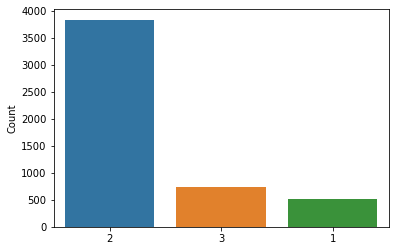

In [28]:
#Check the distribution of each sentiment
import seaborn as sns
import matplotlib.pyplot as plt
x=df.Label.value_counts()
sns.barplot(x.index,x)
plt.gca().set_ylabel('Count')

In [29]:
# Save the file as New_Labeled_dataset.csv
df.to_csv(r'New_Labeled_dataset.csv', index=False)

### Data Resampling

In [52]:
# Load the manully labeled dataset to jupyter notebook
df = pd.read_csv('Labeled Data_manul.csv',encoding="unicode_escape")

In [53]:
# Check dataframe 
df

,Sentence,Label,keyword
0,after a while we heard the intense bombardment...,1,tense
1,the sound of crashing waves reached me and i w...,1,tense
2,we went home but anxiety prevented us from sle...,3,anxiety
3,sadly joy and sorrow were joined together that...,2,sorrow
4,therefore the sadness was most intense at the ...,1,tense
...,...,...,...
1222,farahs family watch the aftermath of an explos...,2,aftermath
1223,and today we saw the aftermath of many explosi...,2,suicide
1224,from weapons of mass destruction to suicide bo...,2,suicide
1225,"in reality, the situation in iraq was continui...",2,violence


In [54]:
# Check Value count
df.Label.value_counts()

2    565
3    406
1    256
Name: Label, dtype: int64

E:\DS\Conda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Count')

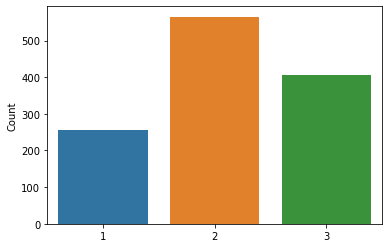

In [55]:
# Check sentiment distribution of manually labeled dataset
import seaborn as sns
x=df.Label.value_counts()
sns.barplot(x.index,x)
plt.gca().set_ylabel('Count')

In [56]:
# Indicate the target column and features
target = df['Label']
features = df.drop('Label', axis = 1)

In [57]:
# Import random over resampling package
from imblearn.over_sampling import RandomOverSampler
oversample = RandomOverSampler(sampling_strategy='minority')

In [58]:
# Allign the number of stress with trauma
x_resampled, y_resampled = oversample.fit_resample(features, target)
from collections import Counter
print(sorted(Counter(y_resampled).items()))

[(1, 565), (2, 565), (3, 406)]


In [60]:
# Allign the number of anxiety with trauma
x_resampled1, y_resampled1 = oversample1.fit_resample(x_resampled, y_resampled)
from collections import Counter
print(sorted(Counter(y_resampled1).items()))

[(1, 565), (2, 565), (3, 565)]


In [61]:
# Check the y_resampled1
y_resampled1

0       1
1       1
2       3
3       2
4       1
       ..
1690    3
1691    3
1692    3
1693    3
1694    3
Name: Label, Length: 1695, dtype: int64

In [64]:
# Convert the list to dataframe
df_label = pd.DataFrame(y_resampled1)
Labels = df_label
Labels

,Label
0,1
1,1
2,3
3,2
4,1
...,...
1690,3
1691,3
1692,3
1693,3


In [67]:
# Conmbine x_resampled1, df_label to a new dataframe 
x_resampled1
df = pd.concat([x_resampled1, df_label], axis=1)
df

,Sentence,keyword,Label
0,after a while we heard the intense bombardment...,tense,1
1,the sound of crashing waves reached me and i w...,tense,1
2,we went home but anxiety prevented us from sle...,anxiety,3
3,sadly joy and sorrow were joined together that...,sorrow,2
4,therefore the sadness was most intense at the ...,tense,1
...,...,...,...
1690,salvador was very nervous,nervous,3
1691,the sprightly energy of his youth resurges as ...,risk,3
1692,i was eight when saddam hussein took power and...,risk,3
1693,he took shallow panicked breaths,panic,3


In [68]:
# Save the file as New_Balanced_Data.csv
df.to_csv(r'New_Balanced_Data.csv', index=False)

E:\DS\Conda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Count')

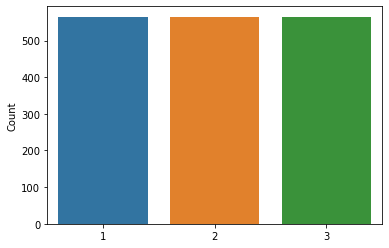

In [69]:
# Check the new balanced dataset
import seaborn as sns
x=df.Label.value_counts()
sns.barplot(x.index,x)
plt.gca().set_ylabel('Count')

### Feature Extraction

In [70]:
# Import TfidfVectorizer package and define the model.
from sklearn.feature_extraction.text import TfidfVectorizer
tr_idf_model  = TfidfVectorizer()
tf_idf_vector = tr_idf_model.fit_transform(df['Sentence'])
print(type(tf_idf_vector), tf_idf_vector.shape)

<class 'scipy.sparse.csr.csr_matrix'> (1695, 4330)


In [71]:
# Check the tf-idf-array
tf_idf_array = tf_idf_vector.toarray()
 
print(tf_idf_array)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [73]:
# Create feature tables
words_set = tr_idf_model.get_feature_names()
df = pd.DataFrame(tf_idf_array, columns = words_set)
 
df

,000,04022016,10,100,1000,10000,11,110,120,1230,...,yusuf,zafoona,zainab,zalmay,zalmays,zayn,zeena,zigzagging,zone,zoo
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1690,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1691,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1692,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1693,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [74]:
# Add label column to the feature table
df = pd.concat([df, Labels], axis=1)

In [75]:
# Check extracted features with label
df

,000,04022016,10,100,1000,10000,11,110,120,1230,...,zafoona,zainab,zalmay,zalmays,zayn,zeena,zigzagging,zone,zoo,Label
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1690,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
1691,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
1692,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
1693,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3


In [76]:
# Save the file as Experiment_Data.csv
df.to_csv(r'Experiment_Data.csv', index=False)